In [1]:
import numpy as np
#from scipy.optimize import newton as nt
from scipy import optimize as op
import matplotlib.pyplot as plt
from george.kernels import ExpSquaredKernel #For Gaussian Processes
from george.kernels import ExpSine2Kernel #For Gaussian Processes
import george
%matplotlib inline

import emcee
import corner

In [36]:
#First data
#data = astro.io.ascii.read('Inputs/data/rvs_0001.txt', names=['time','vel','err'])
data = np.loadtxt('Inputs/data/rvs_0001.txt')
obser = [data[:,0],data[:,1],data[:,2]]

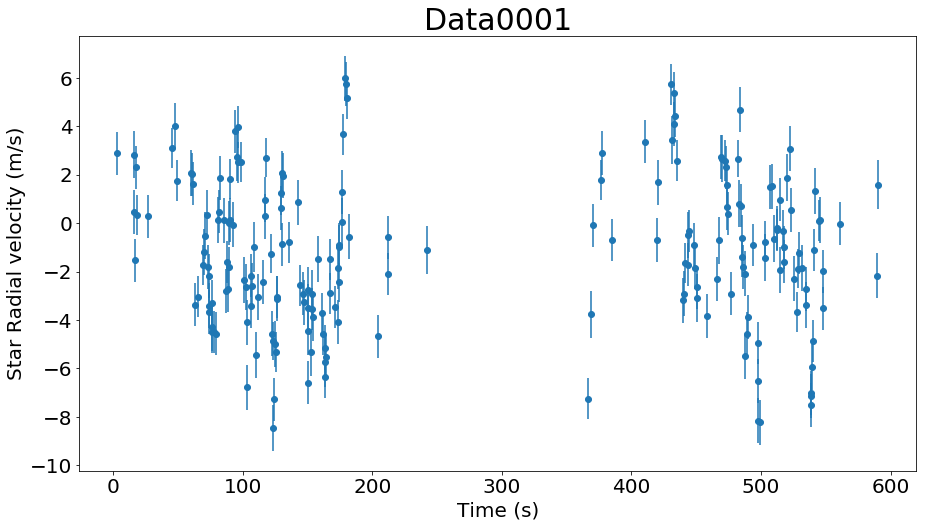

In [3]:
x = data[:,0]
y = data[:,1]
yerr = data[:,2]
# First illustrate basic pyplot interface, using defaults where possible.
plt.figure(figsize=(15,8))
#plt.xlabel('teste')
plt.xlabel('Time (s)', fontsize=20)
plt.ylabel('Star Radial velocity (m/s)', fontsize=20)
plt.errorbar(x, y, yerr=yerr,fmt='o')
plt.tick_params(labelsize=20)
plt.title("Data0001",fontsize=30)
#plt.plot(x,y,'o')


plt.show()

In [102]:
#From https://en.wikipedia.org/wiki/True_anomaly and 
#http://exoplanets.astro.yale.edu/workshop/EPRV/Bibliography_files/Radial_Velocity.pdf
#Returns the mean anomaly in the 2 pi interval
def mean_anomaly(M0,t,t0,tau):
    return (2 * np.pi * (t-t0) / tau + M0 ) % (2*np.pi)

#Returns the [cos(f),sin(f)], where f is the true anomaly.
def real_anomaly(M,e):
#    if M-e<0:
#        ec_anol = M+op.newton(lambda x: e * np.sqrt(1-(np.cos(M+x))**2)-x,e*np.sin(M),maxiter=100)
#    elif M+e>2*np.pi:
#        ec_anol = M+op.newton(lambda x: -e * np.sqrt(1-(np.cos(M+x))**2)-x,e*np.sin(M),maxiter=100)
#    else:
#        ec_anol = M+op.newton(lambda x: e * np.sin(M+x)-x,e*np.sin(M),lambda y: e * np.cos(M+y)-1)
    ec_anol = M+op.newton(lambda x: e * np.sin(M+x)-x,e*np.sin(M),lambda y: e * np.cos(M+y)-1,\
                          fprime2=lambda z: -e * np.sin(M+z))
    return [(np.cos(ec_anol)-e)/(1-e * np.cos(ec_anol)),(np.sqrt(1-e**2) * np.sin(ec_anol))/(1-e*np.cos(ec_anol))]

def RV(t, K, p, e, w, M0, t0=0):
    p = np.abs(p)
    K = np.abs(K)
    w = np.abs(w)%(2*np.pi)
    e=np.abs(e)
    if e>1: e=0.9
    M0 = np.abs(M0)%(2*np.pi)
    cosf, sinf = real_anomaly(mean_anomaly(M0,t,t0,p),e)
    return K * (np.cos(w)*cosf-np.sin(w)*sinf+e*np.cos(w))
#Radial velocity for one planet


#Model for velocity function.
#Input: Planets parameters: Last 2 ate C and J. Five extra parameters for each planet 
#Special thanks to Ben Nelson
def model(params, times, nPlanets):
    planets = [params[i*5:i*5+5] for i in range(nPlanets)]
    try:
        p, K, e, w, M = np.transpose(planets)
    except ValueError:
        p, K, e, w, M = 99999999., 0., 0., 0., 0.
    offset = params[5*nPlanets]
    jitter = params[-1]
    mod = np.zeros(len(times))
    for j in range(len(times)):
        mod[j] += sum([RV(times[j], K[i], p[i], e[i], w[i], M[i])\
                       for i in range(nPlanets)]) + offset
    return mod

#Gaussian Processes kernel
var, length_e, length_s, period = 3.0, 50., 0.5, 20.
gamma = 1/(2.*length_s*length_s)
kernel = var * ExpSquaredKernel(length_e*length_e) * ExpSine2Kernel(gamma=gamma, log_period=np.log(period))

### Define the likelihood function ###
#Thanks to Ben.
def lnlike(params, obs, nPlanets):
    times, rvs, sigs = obs
    jit = params[-1]
    sigs_plus_jitter = np.sqrt(sigs*sigs + jit*jit*np.ones(len(times)))
    gp = george.GP(kernel)
    gp.compute(times, sigs_plus_jitter)
    #    return gp.lnlikelihood(rvs - model_1(params, times, nPlanets))                                                                                                                                      
    return gp.lnlikelihood(rvs - model(params, times, nPlanets))

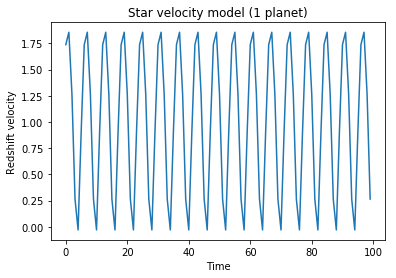

In [10]:
plt.plot(np.arange(100),model([1.2, 1, 0.1, 3., 4.,  1, 2],np.arange(100),1));
plt.title('Star velocity model (1 planet)')
plt.xlabel('Time')
plt.ylabel('Redshift velocity');

In [11]:
IC_0pl = [-0.72851, 2.08718] #Test parameters
lnlike(IC_0pl, [data[:,0],data[:,1],data[:,2]], 0) #Should be around -477

-477.19968698126718

In [132]:

#Must define priors!
def log_prior( params, nPlanets):
    value=0
    planets = [params[i*5:i*5+5] for i in range(nPlanets)]
    try:
        p, K, e, w, M = np.transpose(planets)
    except ValueError:
        p, K, e, w, M = 99999999., 0., 0., 0., 0.
    offset = params[5*nPlanets]
    jitter = params[-1]
    if (offset<-1000) or (offset>1000) or (jitter<0) or (jitter>99):
        return -np.infty
    value+=-np.log(2000) #offset priors
    value+=-np.log(1+jitter)-np.log(np.log(100)) #Jitter prior
    if nPlanets>0:
        if ((K<=0) + (K>999) + (e<0) + (e>=1) + (w<0) + (w>2*np.pi) + (M<0) + (M>2*np.pi)).all():
            return -np.infty
        value+=-np.log(p)-np.log(np.log(10000/1.25)) #Period prior 
        value+=-np.log(1+K)-np.log(np.log(1000)) #K prior
        value+=-np.log(2*np.pi**2) #w, M priors
#        if (1-np.exp(-e**2/0.08)==0):
#            value+=np.log(e/0.04)-e**2/0.08-np.log((e**2/0.08)) #e prior
#        else:
        value+=np.log(e/0.04)-e**2/0.08-np.log(-np.expm1(-e**2/0.08)) #e prior
    return value.sum()

def log_posterior(params, obs, nPlanets):
    return log_prior(params, nPlanets) + lnlike(params, obs, nPlanets)

In [54]:
log_posterior([102,30,0.5,1.1,np.pi,-1,-2],obser,1)

-inf

In [105]:
def mini(a,b,c):
    value = -log_posterior(a,b,c)
    if np.isfinite(value):
        return value
    else:
        return 10**10
sol0 = op.minimize(mini,IC_0pl,args=(obser,0))
print(sol0)

      fun: 487.454531660062
 hess_inv: array([[ 0.35446769, -0.0022139 ],
       [-0.0022139 ,  0.01958826]])
      jac: array([  0.00000000e+00,   3.81469727e-06])
  message: 'Optimization terminated successfully.'
     nfev: 28
      nit: 4
     njev: 7
   status: 0
  success: True
        x: array([-0.72023413,  2.08317069])


In [106]:
IC_1pl = [500, 4, 1e-20, 0, 0,0,1] #Test parameters
mini(IC_1pl,obser,1)

528.70663220787628

In [107]:
sol1 = op.minimize(mini,IC_1pl,args=(obser,1),method='Powell')
print(sol1)

   direc: array([[  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          1.00000000e+00],
       [  0.00000000e+00,   1.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   1.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          1.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   1.00000000e+00,   0.00000000e+00,
          0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   1.00000000e+00,
          0.00000000e+00],
       [  5.80322207e+00,   6.84341413e-03,   0.00000000e+00,
          2.84644162e-

In [133]:
IC_2pl = np.concatenate([[500, 4, 1e-20, 0, 0],sol1['x']]) #Test parameters
mini(IC_2pl,obser,2)

442.80393234894291

In [134]:
sol2 = op.minimize(mini,IC_2pl,args=(obser,2),method='Powell')
print(sol2)

/home/arthur/anaconda2/envs/p36/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/home/arthur/anaconda2/envs/p36/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in log


   direc: array([[  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          1.00000000e+00],
       [  0.00000000e+00,   1.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   1.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          1.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   1.00000000e+00,   0.00000000e+00,
          0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   1.00000000e+00,
          0.00000000e+00],
       [  5.80322207e+00,   6.84341413e-03,   0.00000000e+00,
          2.84644162e-

In [138]:
IC_3pl = np.concatenate([[500, 4, 1e-20, 0, 0],sol2['x']]) #Test parameters
mini(IC_3pl,obser,3)

388.59337657744152

In [139]:
sol3 = op.minimize(mini,IC_3pl,args=(obser,3),method='Powell')
print(sol3)

/home/arthur/anaconda2/envs/p36/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/home/arthur/anaconda2/envs/p36/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in log


   direc: array([[ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,

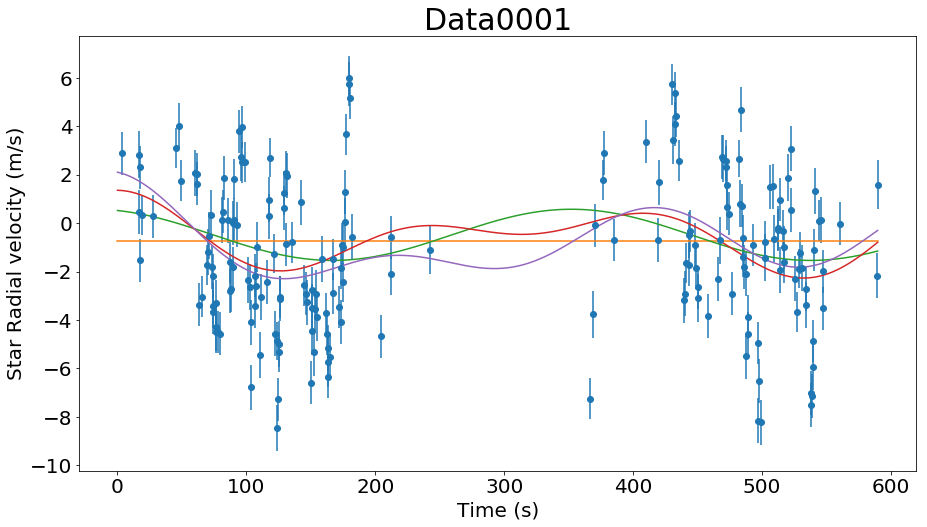

In [140]:
x = data[:,0]
xm = np.arange(0,data[-1,0],data[-1,0]/1000)
y = data[:,1]
y0 = model(sol0['x'],xm,0)
y1 = model(sol1['x'],xm,1)
y2 = model(sol2['x'],xm,2)
y3 = model(sol3['x'],xm,3)
yerr = data[:,2]
# First illustrate basic pyplot interface, using defaults where possible.
plt.figure(figsize=(15,8))
#plt.xlabel('teste')
plt.xlabel('Time (s)', fontsize=20)
plt.ylabel('Star Radial velocity (m/s)', fontsize=20)
plt.errorbar(x, y, yerr=yerr,fmt='o')
plt.plot(xm,y0)
plt.plot(xm,y1)
plt.plot(xm,y2)
plt.plot(xm,y3)
plt.tick_params(labelsize=20)
plt.title("Data0001",fontsize=30)
#plt.plot(x,y,'o')


plt.show()

# Emecee

In [161]:
ndim = 2  # number of parameters in the model
nwalkers = 50  # number of MCMC walkers
nburn = 1000  # "burn-in" period to let chains stabilize
nsteps = 2000  # number of MCMC steps to take

#starting guesses. Something around the IC_0pl
rand_offset = 3*(np.random.rand(nwalkers)-0.5)
rand_jitter = 2*(np.random.rand(nwalkers))
#rand_jitter = np.expm1(np.random.rand(nwalkers)*np.log(100))
starting_guesses = np.column_stack((rand_offset,rand_jitter))

In [162]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=(obser,0))
sampler.run_mcmc(starting_guesses, nsteps);

#sample = sampler.chain  # shape = (nwalkers, nsteps, ndim)
#sample_join = [sampler.chain[:, nburn:, i].ravel() for i in range(ndim)]  # discard burn-in points

(array([[-0.77531348,  2.18803002],
        [-0.08201122,  1.91908872],
        [-1.14226818,  2.08128887],
        [-1.6454635 ,  2.24530195],
        [-0.80543169,  2.12255858],
        [-0.11695722,  2.09194853],
        [ 0.57137351,  2.07763764],
        [-0.4671037 ,  2.14921612],
        [-1.30902158,  2.15285452],
        [-0.44833382,  1.92755456],
        [-0.30548696,  1.78575719],
        [ 0.3502451 ,  2.08997356],
        [-1.29737341,  2.13973026],
        [-0.5300814 ,  2.16429224],
        [-0.64333288,  2.02417777],
        [-1.44680233,  1.95169867],
        [-1.42211586,  2.27801838],
        [-0.18661804,  2.18758503],
        [-0.00473699,  2.19701521],
        [-0.70194903,  2.14291161],
        [-1.63122367,  1.81417557],
        [-0.44623351,  2.0553303 ],
        [-1.15030566,  1.99368526],
        [-1.02617781,  2.10369021],
        [-0.99431191,  2.01912374],
        [-1.52752739,  2.20575567],
        [-0.4699519 ,  1.97026166],
        [-0.33640844,  2.055

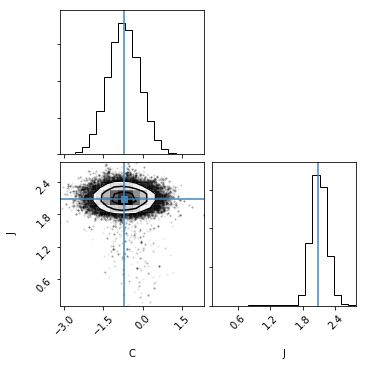

In [164]:
labeles = ['C','J']
_ = corner.corner(sampler.flatchain,truths=sol0['x'],labels=labeles)

## Looking for the parameters space

Based on Boris work

### Zero planets

In [17]:
ndim = 2  # number of parameters in the model
nwalkers = 50  # number of MCMC walkers
nburn = 1000  # "burn-in" period to let chains stabilize
nsteps = 2000  # number of MCMC steps to take
nburn = 0 #test
nsteps = 20 #test

#starting guesses. Something around the IC_0pl
rand_offset = IC_0pl[0]+2*(np.random.rand(nwalkers)-0.5)
rand_jitter = IC_0pl[1]+4*(np.random.rand(nwalkers)-0.5)
starting_guesses = np.column_stack((rand_offset,rand_jitter))

In [18]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=[[data[:,0],data[:,1],data[:,2]],0])
sampler.run_mcmc(starting_guesses, nsteps)

sample = sampler.chain  # shape = (nwalkers, nsteps, ndim)
sample0 = sampler.chain[:, nburn:, 0].ravel()  # discard burn-in points
sample1 = sampler.chain[:, nburn:, 1].ravel()  # discard burn-in points

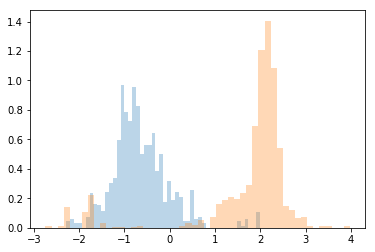

In [20]:
# plot a histogram of the sample
plt.hist(sample0, bins=50, histtype="stepfilled", alpha=0.3, normed=True)
plt.hist(sample1, bins=50, histtype="stepfilled", alpha=0.3, normed=True);

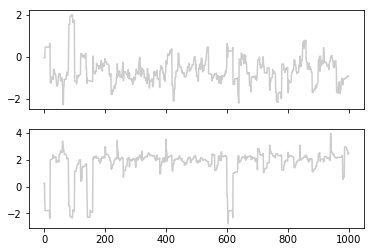

In [22]:
fig, ax = plt.subplots(2, sharex=True)
test = [sample0,sample1]
for i in range(2):
    ax[i].plot(test[i].T, '-k', alpha=0.2);

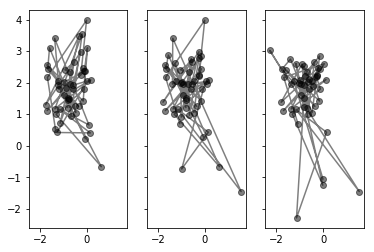

In [23]:
fig, axs = plt.subplots(1, 3, sharex=True, sharey=True)
for i in range(axs.size):
    axs[i].errorbar(sampler.chain[:, i, 0], sampler.chain[:, i, 1], fmt="-o", alpha=0.5, c='k');

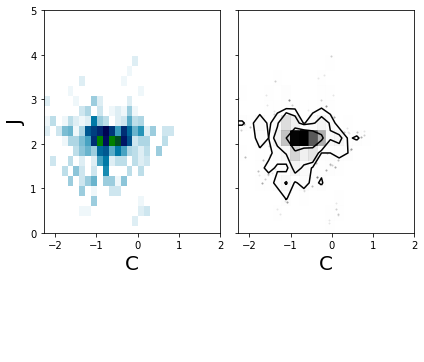

In [24]:
from corner import hist2d
fig, axs = plt.subplots(1, 2, sharex=True, sharey=True)
axs[0].hist2d(sampler.flatchain[:, 0], sampler.flatchain[:, 1], 30, cmap="ocean_r");
hist2d(sampler.flatchain[:, 0], sampler.flatchain[:, 1], ax=axs[1])
axs[0].set_xlabel('C', fontsize=20); axs[0].set_ylabel('J', fontsize=20)
axs[1].set_xlabel('C', fontsize=20);
plt.ylim([0,5])
fig.tight_layout();

In [25]:
# SOLUTION
thechain = sampler.flatchain
print('Mean values:', np.mean(thechain, axis=0))
print('Standard deviation:', np.std(thechain, axis=0))

Mean values: [-0.65641624  1.72968661]
Standard deviation: [ 0.64206305  1.12894944]


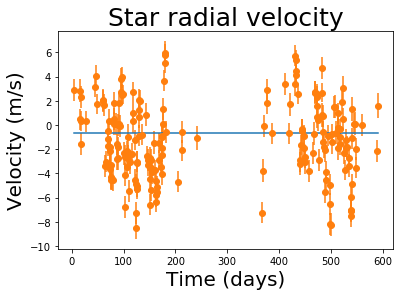

In [26]:
plt.plot(data[:,0],model(np.mean(thechain, axis=0),data[:,0],0))
plt.errorbar(data[:,0], data[:,1], yerr=yerr,fmt='o');
plt.title('Star radial velocity',fontsize=25)
plt.xlabel('Time (days)',fontsize=20)
plt.ylabel('Velocity (m/s)',fontsize=20);

### One planet

In [28]:
ndim = 7  # number of parameters in the model
nwalkers = 50  # number of MCMC walkers
nburn = 1000  # "burn-in" period to let chains stabilize
nsteps = 2000  # number of MCMC steps to take
nburn = 0 #test
nsteps = 20 #test

#starting guesses. Something around the IC_0pl
rand_offset = IC_0pl[0]+2*(np.random.rand(nwalkers)-0.5)
rand_jitter = IC_0pl[1]+4*(np.random.rand(nwalkers)-0.5)
rand_K = 30 + 10*(np.random.rand(nwalkers)-0.5)
rand_p = 1000 + 100*(np.random.rand(nwalkers)-0.5)
rand_M0 = np.pi+(np.random.rand(nwalkers)-0.5)
rand_w = np.pi+(np.random.rand(nwalkers)-0.5)
rand_e = 0.5+0.3*(np.random.rand(nwalkers)-0.5)
starting_guesses = np.column_stack((rand_p,rand_K,rand_e,rand_w,rand_M0,rand_offset,rand_jitter))

In [42]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=[[data[:,0],data[:,1],data[:,2]],1])
sampler.run_mcmc(starting_guesses, nsteps)

sample = sampler.chain  # shape = (nwalkers, nsteps, ndim)

e:  0.58322579766
M:  2.84199127086
e:  0.58322579766
M:  2.92547512007
e:  0.58322579766
M:  2.92660660608
e:  0.58322579766
M:  2.93160923802
e:  0.58322579766
M:  2.9330645609
e:  0.58322579766
M:  2.93987485024
e:  0.58322579766
M:  2.99641482435
e:  0.58322579766
M:  3.1135142358
e:  0.58322579766
M:  3.12715877839
e:  0.58322579766
M:  3.13867895113
e:  0.58322579766
M:  3.21055324862
e:  0.58322579766
M:  3.21608697302
e:  0.58322579766
M:  3.21792830945
e:  0.58322579766
M:  3.2293817718
e:  0.58322579766
M:  3.24336699077
e:  0.58322579766
M:  3.26974479901
e:  0.58322579766
M:  3.27568720554
e:  0.58322579766
M:  3.27666584056
e:  0.58322579766
M:  3.2874904117
e:  0.58322579766
M:  3.29453969264
e:  0.58322579766
M:  3.30066280014
e:  0.58322579766
M:  3.30098598934
e:  0.58322579766
M:  3.30141669237
e:  0.58322579766
M:  3.31323414736
e:  0.58322579766
M:  3.31475164692
e:  0.58322579766
M:  3.31533066724
e:  0.58322579766
M:  3.32634630214
e:  0.58322579766
M:  3.33332433

e:  0.602926888232
M:  3.46735602957
e:  0.602926888232
M:  3.46922691363
e:  0.602926888232
M:  3.48086416786
e:  0.602926888232
M:  3.49507380542
e:  0.602926888232
M:  3.52187489414
e:  0.602926888232
M:  3.52791265752
e:  0.602926888232
M:  3.52890699653
e:  0.602926888232
M:  3.53990526785
e:  0.602926888232
M:  3.54706766748
e:  0.602926888232
M:  3.5532890315
e:  0.602926888232
M:  3.55361740686
e:  0.602926888232
M:  3.55405502132
e:  0.602926888232
M:  3.56606210912
e:  0.602926888232
M:  3.56760395976
e:  0.602926888232
M:  3.56819227153
e:  0.602926888232
M:  3.57938467256
e:  0.602926888232
M:  3.58647468484
e:  0.602926888232
M:  3.59915694923
e:  0.602926888232
M:  3.60006442342
e:  0.602926888232
M:  3.60671616317
e:  0.602926888232
M:  3.62728404266
e:  0.602926888232
M:  3.6389667035
e:  0.602926888232
M:  3.64074085174
e:  0.602926888232
M:  3.64575795343
e:  0.602926888232
M:  3.65255249368
e:  0.602926888232
M:  3.65327176075
e:  0.602926888232
M:  3.65882321273
e: 

M:  3.51130064881
e:  0.478801516996
M:  3.55332400769
e:  0.478801516996
M:  3.56631085079
e:  0.478801516996
M:  3.57774182354
e:  0.478801516996
M:  3.58347619333
e:  0.478801516996
M:  3.60257321734
e:  0.478801516996
M:  3.60369817415
e:  0.478801516996
M:  3.60406593658
e:  0.478801516996
M:  3.60419100057
e:  0.478801516996
M:  3.61586095698
e:  0.478801516996
M:  3.62225407969
e:  0.478801516996
M:  3.62279334077
e:  0.478801516996
M:  3.62755505941
e:  0.478801516996
M:  3.65152524523
e:  0.478801516996
M:  3.67171131658
e:  0.478801516996
M:  3.67699743722
e:  0.478801516996
M:  3.68300298537
e:  0.478801516996
M:  3.68368216953
e:  0.478801516996
M:  3.68417932986
e:  0.478801516996
M:  3.69039290525
e:  0.478801516996
M:  3.70841945578
e:  0.478801516996
M:  3.70898595851
e:  0.478801516996
M:  3.73382044796
e:  0.478801516996
M:  3.74481864976
e:  0.478801516996
M:  3.74538391424
e:  0.478801516996
M:  3.75213489332
e:  0.478801516996
M:  3.75232496583
e:  0.478801516996
M

M:  3.98409850963
e:  0.419280446819
M:  3.98469274767
e:  0.419280446819
M:  3.99178975924
e:  0.419280446819
M:  3.99198957422
e:  0.419280446819
M:  3.99200063889
e:  0.419280446819
M:  4.0037890719
e:  0.419280446819
M:  4.00511748355
e:  0.419280446819
M:  4.01170617101
e:  0.419280446819
M:  4.02261073189
e:  0.419280446819
M:  4.0250501669
e:  0.419280446819
M:  4.02909332866
e:  0.419280446819
M:  4.04224206561
e:  0.419280446819
M:  4.18691592212
e:  0.419280446819
M:  4.2385931529
e:  0.419280446819
M:  4.2386745108
e:  0.419280446819
M:  4.43353772497
e:  0.419280446819
M:  5.24054617401
e:  0.419280446819
M:  5.2547623265
e:  0.419280446819
M:  5.26741315315
e:  0.419280446819
M:  5.30646884612
e:  0.419280446819
M:  5.31137309981
e:  0.419280446819
M:  5.36345842177
e:  0.419280446819
M:  5.52652436861
e:  0.419280446819
M:  5.58617792705
e:  0.419280446819
M:  5.59217497993
e:  0.419280446819
M:  5.65851029926
e:  0.419280446819
M:  5.66283528476
e:  0.419280446819
M:  5.

e:  0.403933172735
M:  0.0100365385242
e:  0.403933172735
M:  0.014787508626
e:  0.403933172735
M:  0.0150272336627
e:  0.403933172735
M:  0.0215034883001
e:  0.403933172735
M:  0.035287984467
e:  0.403933172735
M:  0.0700101021303
e:  0.403933172735
M:  0.0759486614806
e:  0.403933172735
M:  0.0770957856334
e:  0.403933172735
M:  0.0836517442472
e:  0.403933172735
M:  0.0888294371765
e:  0.403933172735
M:  0.0888349551441
e:  0.403933172735
M:  0.095031019649
e:  0.403933172735
M:  0.101897823771
e:  0.403933172735
M:  0.102349684006
e:  0.403933172735
M:  0.113476972221
e:  0.403933172735
M:  0.114490438937
e:  0.403933172735
M:  0.137781780167
e:  0.403933172735
M:  0.161751831412
e:  0.403933172735
M:  0.162041831265
e:  0.403933172735
M:  0.163279695329
e:  0.403933172735
M:  0.175479308581
e:  0.403933172735
M:  0.19449729046
e:  0.403933172735
M:  0.194548178384
e:  0.403933172735
M:  0.219042436551
e:  0.403933172735
M:  0.229248224177
e:  0.403933172735
M:  0.237145662024
e:  

e:  0.5429247585
M:  5.42605208094
e:  0.5429247585
M:  5.46223391618
e:  0.5429247585
M:  5.46677729731
e:  0.5429247585
M:  5.51502999478
e:  0.5429247585
M:  5.66609696534
e:  0.5429247585
M:  5.72136100134
e:  0.5429247585
M:  5.72691676959
e:  0.5429247585
M:  5.7883708986
e:  0.5429247585
M:  5.79237763617
e:  0.5429247585
M:  5.79926295392
e:  0.5429247585
M:  5.8001360549
e:  0.5429247585
M:  5.80432850733
e:  0.5429247585
M:  5.81759445668
e:  0.5429247585
M:  5.84121340592
e:  0.5429247585
M:  5.84794979
e:  0.5429247585
M:  5.85405848201
e:  0.5429247585
M:  5.86635244325
e:  0.5429247585
M:  5.86644710959
e:  0.5429247585
M:  5.87083854221
e:  0.5429247585
M:  5.89568694787
e:  0.5429247585
M:  5.89683379736
e:  0.5429247585
M:  5.9070861012
e:  0.5429247585
M:  5.90727663982
e:  0.5429247585
M:  5.95540150758
e:  0.5429247585
M:  5.99930015659
e:  0.5429247585
M:  6.00981656142
e:  0.5429247585
M:  6.02193807316
e:  0.5429247585
M:  6.02325737216
e:  0.5429247585
M:  6.039

M:  4.23716991664
e:  0.353986177052
M:  4.23953483738
e:  0.353986177052
M:  4.2434544979
e:  0.353986177052
M:  4.25620159737
e:  0.353986177052
M:  4.39645628842
e:  0.353986177052
M:  4.44655500158
e:  0.353986177052
M:  4.44663387433
e:  0.353986177052
M:  4.63554485357
e:  0.353986177052
M:  5.41790265774
e:  0.353986177052
M:  5.43168456777
e:  0.353986177052
M:  5.44394896597
e:  0.353986177052
M:  5.48181167512
e:  0.353986177052
M:  5.4865661249
e:  0.353986177052
M:  5.53706046381
e:  0.353986177052
M:  5.69514544575
e:  0.353986177052
M:  5.75297684399
e:  0.353986177052
M:  5.75879071264
e:  0.353986177052
M:  5.82309977264
e:  0.353986177052
M:  5.82729264839
e:  0.353986177052
M:  5.83449783247
e:  0.353986177052
M:  5.83541149449
e:  0.353986177052
M:  5.83979871271
e:  0.353986177052
M:  5.85368094889
e:  0.353986177052
M:  5.87839714694
e:  0.353986177052
M:  5.88544647845
e:  0.353986177052
M:  5.89183895765
e:  0.353986177052
M:  5.90470405075
e:  0.353986177052
M: 

M:  5.95690017703
e:  0.599999458085
M:  5.95695442975
e:  0.599999458085
M:  5.98306829036
e:  0.599999458085
M:  5.9939489022
e:  0.599999458085
M:  6.00236853221
e:  0.599999458085
M:  6.02183283952
e:  0.599999458085
M:  6.02184656611
e:  0.599999458085
M:  6.03365078149
e:  0.599999458085
M:  6.03435802779
e:  0.599999458085
M:  6.04766759275
e:  0.599999458085
M:  6.05419164579
e:  0.599999458085
M:  6.05466750097
e:  0.599999458085
M:  6.07246958336
e:  0.599999458085
M:  6.08541702776
e:  0.599999458085
M:  6.0879100383
e:  0.599999458085
M:  6.1058768398
e:  0.599999458085
M:  6.11858570295
e:  0.599999458085
M:  6.12631834972
e:  0.599999458085
M:  6.13217895081
e:  0.599999458085
M:  6.14508913731
e:  0.599999458085
M:  6.16383247172
e:  0.599999458085
M:  6.1655358764
e:  0.599999458085
M:  6.19035551549
e:  0.599999458085
M:  6.19129088468
e:  0.599999458085
M:  6.19202558417
e:  0.599999458085
M:  6.19736065289
e:  0.599999458085
M:  6.19902026321
e:  0.599999458085
M:  6

M:  0.288452263017
e:  0.474333405201
M:  0.30065978575
e:  0.474333405201
M:  0.301514774845
e:  0.474333405201
M:  0.383855170896
e:  0.474333405201
M:  0.571140178819
e:  0.474333405201
M:  0.576590654002
e:  0.373722268192
M:  3.34246767538
e:  0.373722268192
M:  3.42425542241
e:  0.373722268192
M:  3.42536392055
e:  0.373722268192
M:  3.43026491636
e:  0.373722268192
M:  3.43169067214
e:  0.373722268192
M:  3.43836260002
e:  0.373722268192
M:  3.49375387802
e:  0.373722268192
M:  3.60847423568
e:  0.373722268192
M:  3.62184156851
e:  0.373722268192
M:  3.63312769131
e:  0.373722268192
M:  3.70354175243
e:  0.373722268192
M:  3.70896305075
e:  0.373722268192
M:  3.71076697761
e:  0.373722268192
M:  3.72198774534
e:  0.373722268192
M:  3.73568883318
e:  0.373722268192
M:  3.76153073588
e:  0.373722268192
M:  3.76735241332
e:  0.373722268192
M:  3.76831116586
e:  0.373722268192
M:  3.77891581928
e:  0.373722268192
M:  3.78582188329
e:  0.373722268192
M:  3.79182059049
e:  0.373722268

e:  0.402321549847
M:  6.02024368454
e:  0.402321549847
M:  6.04356971811
e:  0.402321549847
M:  6.0444487983
e:  0.402321549847
M:  6.04513928477
e:  0.402321549847
M:  6.05015329773
e:  0.402321549847
M:  6.0517130354
e:  0.402321549847
M:  6.0570360472
e:  0.402321549847
M:  6.06281917854
e:  0.402321549847
M:  6.08184810103
e:  0.402321549847
M:  6.08825967334
e:  0.402321549847
M:  6.09993405489
e:  0.402321549847
M:  6.10075170391
e:  0.402321549847
M:  6.17949603408
e:  0.402321549847
M:  0.0754164053801
e:  0.402321549847
M:  0.0806288410505
e:  0.648998869085
M:  3.28681132115
e:  0.648998869085
M:  3.36733187361
e:  0.648998869085
M:  3.36842319702
e:  0.648998869085
M:  3.37324825829
e:  0.648998869085
M:  3.37465192383
e:  0.648998869085
M:  3.38122047888
e:  0.648998869085
M:  3.43575354121
e:  0.648998869085
M:  3.54869645643
e:  0.648998869085
M:  3.56185667985
e:  0.648998869085
M:  3.57296793888
e:  0.648998869085
M:  3.64229102588
e:  0.648998869085
M:  3.64762832825


M:  3.63778501373
e:  0.54038989092
M:  3.64362173611
e:  0.54038989092
M:  3.64890246117
e:  0.54038989092
M:  3.65011690924
e:  0.54038989092
M:  3.66290297335
e:  0.54038989092
M:  3.6810041219
e:  0.54038989092
M:  3.68821709381
e:  0.54038989092
M:  3.69283624454
e:  0.54038989092
M:  3.6948115968
e:  0.54038989092
M:  3.71153024866
e:  0.54038989092
M:  3.71232301337
e:  0.54038989092
M:  3.71968904072
e:  0.54038989092
M:  3.72547078809
e:  0.54038989092
M:  3.73698055723
e:  0.54038989092
M:  3.74424600529
e:  0.54038989092
M:  3.7695501303
e:  0.54038989092
M:  3.78039457681
e:  0.54038989092
M:  3.78046204615
e:  0.54038989092
M:  3.78608761449
e:  0.54038989092
M:  3.80663577595
e:  0.54038989092
M:  3.81202894991
e:  0.54038989092
M:  3.81829547695
e:  0.54038989092
M:  3.81967547478
e:  0.54038989092
M:  3.82508801494
e:  0.54038989092
M:  3.82998641376
e:  0.54038989092
M:  3.83116650244
e:  0.54038989092
M:  3.83655217981
e:  0.54038989092
M:  3.83684642108
e:  0.5403898

M:  5.46398761638
e:  0.362380980139
M:  5.47565518354
e:  0.362380980139
M:  5.51167535305
e:  0.362380980139
M:  5.5161984337
e:  0.362380980139
M:  5.56423553107
e:  0.362380980139
M:  5.71462751236
e:  0.362380980139
M:  5.76964462058
e:  0.362380980139
M:  5.77517556485
e:  0.362380980139
M:  5.83635510783
e:  0.362380980139
M:  5.84034394272
e:  0.362380980139
M:  5.84719849586
e:  0.362380980139
M:  5.8480676957
e:  0.362380980139
M:  5.85224141564
e:  0.362380980139
M:  5.86544809079
e:  0.362380980139
M:  5.88896150712
e:  0.362380980139
M:  5.89566779205
e:  0.362380980139
M:  5.90174918953
e:  0.362380980139
M:  5.91398821957
e:  0.362380980139
M:  5.91408246292
e:  0.362380980139
M:  5.91845427398
e:  0.362380980139
M:  5.94319165334
e:  0.362380980139
M:  5.94433337854
e:  0.362380980139
M:  5.95453987359
e:  0.362380980139
M:  5.95472956085
e:  0.362380980139
M:  6.00263939968
e:  0.362380980139
M:  6.04634190312
e:  0.362380980139
M:  6.05681131912
e:  0.362380980139
M: 

M:  0.211106338271
e:  0.423114539452
M:  0.225685891272
e:  0.423114539452
M:  0.262410697797
e:  0.423114539452
M:  0.268691779074
e:  0.423114539452
M:  0.26990506661
e:  0.423114539452
M:  0.276839157267
e:  0.423114539452
M:  0.282315487165
e:  0.423114539452
M:  0.282321323396
e:  0.423114539452
M:  0.28887476211
e:  0.423114539452
M:  0.296137627102
e:  0.423114539452
M:  0.296615549557
e:  0.423114539452
M:  0.308384633195
e:  0.423114539452
M:  0.309456554251
e:  0.423114539452
M:  0.334091284445
e:  0.423114539452
M:  0.359443871027
e:  0.423114539452
M:  0.359750597379
e:  0.423114539452
M:  0.361059858488
e:  0.423114539452
M:  0.37396311631
e:  0.423114539452
M:  0.394078009986
e:  0.423114539452
M:  0.394131833004
e:  0.423114539452
M:  0.420038861511
e:  0.423114539452
M:  0.430833294605
e:  0.423114539452
M:  0.439186237816
e:  0.423114539452
M:  0.458496380113
e:  0.423114539452
M:  0.458509997985
e:  0.423114539452
M:  0.470220719314
e:  0.423114539452
M:  0.470922363

M:  0.231444669924
e:  0.493281294968
M:  0.249517919193
e:  0.493281294968
M:  0.251160426171
e:  0.493281294968
M:  0.275092748681
e:  0.493281294968
M:  0.275994677878
e:  0.493281294968
M:  0.276703111432
e:  0.493281294968
M:  0.28184744833
e:  0.493281294968
M:  0.283447726617
e:  0.493281294968
M:  0.288909093833
e:  0.493281294968
M:  0.294842539992
e:  0.493281294968
M:  0.314366061155
e:  0.493281294968
M:  0.320944282694
e:  0.493281294968
M:  0.33292210411
e:  0.493281294968
M:  0.33376100541
e:  0.493281294968
M:  0.414552053746
e:  0.493281294968
M:  0.598313036852
e:  0.493281294968
M:  0.603660953854
e:  0.367566420701
M:  2.9603181474
e:  0.367566420701
M:  3.04088073396
e:  0.367566420701
M:  3.04197262708
e:  0.367566420701
M:  3.04680020717
e:  0.367566420701
M:  3.04820460547
e:  0.367566420701
M:  3.0547765895
e:  0.367566420701
M:  3.1093381197
e:  0.367566420701
M:  3.22233999444
e:  0.367566420701
M:  3.23550708788
e:  0.367566420701
M:  3.24662414732
e:  0.367

e:  0.595489737141
M:  3.68851746031
e:  0.595489737141
M:  3.68910426062
e:  0.595489737141
M:  3.70026790689
e:  0.595489737141
M:  3.70733970398
e:  0.595489737141
M:  3.71998938594
e:  0.595489737141
M:  3.72089452871
e:  0.595489737141
M:  3.72752917926
e:  0.595489737141
M:  3.74804421713
e:  0.595489737141
M:  3.75969686366
e:  0.595489737141
M:  3.76146645387
e:  0.595489737141
M:  3.76647066595
e:  0.595489737141
M:  3.77324775013
e:  0.595489737141
M:  3.77396516931
e:  0.595489737141
M:  3.77950235886
e:  0.595489737141
M:  3.78007012427
e:  0.595489737141
M:  3.79249532558
e:  0.595489737141
M:  3.80669996274
e:  0.595489737141
M:  3.8128324855
e:  0.595489737141
M:  3.81838083344
e:  0.595489737141
M:  3.81965682876
e:  0.595489737141
M:  3.83309088028
e:  0.595489737141
M:  3.85210938043
e:  0.595489737141
M:  3.85968789994
e:  0.595489737141
M:  3.8645411455
e:  0.595489737141
M:  3.86661660701
e:  0.595489737141
M:  3.88418254665
e:  0.595489737141
M:  3.88501548804
e: 

M:  0.249806718179
e:  0.521449959801
M:  0.269428166591
e:  0.521449959801
M:  0.276039383568
e:  0.521449959801
M:  0.28807728406
e:  0.521449959801
M:  0.288920393171
e:  0.521449959801
M:  0.370116678095
e:  0.521449959801
M:  0.554799380566
e:  0.521449959801
M:  0.560174121971
e:  0.55587730268
M:  3.0106843418
e:  0.55587730268
M:  3.09293475299
e:  0.55587730268
M:  3.09404952179
e:  0.55587730268
M:  3.09897824199
e:  0.55587730268
M:  3.1004120631
e:  0.55587730268
M:  3.10712173334
e:  0.55587730268
M:  3.16282635363
e:  0.55587730268
M:  3.27819567157
e:  0.55587730268
M:  3.29163862191
e:  0.55587730268
M:  3.30298858904
e:  0.55587730268
M:  3.37380097466
e:  0.55587730268
M:  3.37925294066
e:  0.55587730268
M:  3.38106707214
e:  0.55587730268
M:  3.3923513145
e:  0.55587730268
M:  3.40612990787
e:  0.55587730268
M:  3.43211799533
e:  0.55587730268
M:  3.43797260535
e:  0.55587730268
M:  3.43893678145
e:  0.55587730268
M:  3.44960142421
e:  0.55587730268
M:  3.45654655506

M:  4.34822575385
e:  0.407122286561
M:  4.35581579467
e:  0.407122286561
M:  4.38225041232
e:  0.407122286561
M:  4.3935793477
e:  0.407122286561
M:  4.39364983131
e:  0.407122286561
M:  4.39952672878
e:  0.407122286561
M:  4.4209929044
e:  0.407122286561
M:  4.42662702498
e:  0.407122286561
M:  4.43317351677
e:  0.407122286561
M:  4.43461516768
e:  0.407122286561
M:  4.44026951967
e:  0.407122286561
M:  4.44538676043
e:  0.407122286561
M:  4.44661957102
e:  0.407122286561
M:  4.45224586008
e:  0.407122286561
M:  4.45255324695
e:  0.407122286561
M:  4.47201847114
e:  0.407122286561
M:  4.47212550181
e:  0.407122286561
M:  4.47896371743
e:  0.407122286561
M:  4.48000661384
e:  0.407122286561
M:  4.48605254145
e:  0.407122286561
M:  4.51298446014
e:  0.407122286561
M:  4.55728145243
e:  0.407122286561
M:  4.57097093619
e:  0.407122286561
M:  4.58302037072
e:  0.407122286561
M:  4.58906499308
e:  0.407122286561
M:  4.6091952432
e:  0.407122286561
M:  4.61038106471
e:  0.407122286561
M:  

e:  0.488778934363
M:  4.36007827084
e:  0.488778934363
M:  4.36493294238
e:  0.488778934363
M:  4.3893710471
e:  0.488778934363
M:  4.40995116814
e:  0.488778934363
M:  4.41534047846
e:  0.488778934363
M:  4.42146326014
e:  0.488778934363
M:  4.42215570257
e:  0.488778934363
M:  4.4226625679
e:  0.488778934363
M:  4.42899743769
e:  0.488778934363
M:  4.44737588218
e:  0.488778934363
M:  4.44795344355
e:  0.488778934363
M:  4.47327272386
e:  0.488778934363
M:  4.48448562014
e:  0.488778934363
M:  4.48506191907
e:  0.488778934363
M:  4.49194468314
e:  0.488778934363
M:  4.49213846603
e:  0.488778934363
M:  4.49214919668
e:  0.488778934363
M:  4.50358175564
e:  0.488778934363
M:  4.50487006465
e:  0.488778934363
M:  4.51125985011
e:  0.488778934363
M:  4.52183521964
e:  0.488778934363
M:  4.52420101198
e:  0.488778934363
M:  4.52812211712
e:  0.488778934363
M:  4.54087391461
e:  0.488778934363
M:  4.68118029742
e:  0.488778934363
M:  4.73129747478
e:  0.488778934363
M:  4.73137637661
e: 

M:  6.28118662205
e:  0.470168127896
M:  0.0112306225523
e:  0.470168127896
M:  0.0177153352525
e:  0.470168127896
M:  0.01818832101
e:  0.470168127896
M:  0.0358830560456
e:  0.470168127896
M:  0.0487524267665
e:  0.470168127896
M:  0.0512304043478
e:  0.470168127896
M:  0.0690888652225
e:  0.470168127896
M:  0.081721093359
e:  0.470168127896
M:  0.0894071119186
e:  0.470168127896
M:  0.0952323733223
e:  0.470168127896
M:  0.108064710818
e:  0.470168127896
M:  0.126695022077
e:  0.470168127896
M:  0.128388155159
e:  0.470168127896
M:  0.153058130707
e:  0.470168127896
M:  0.153987859579
e:  0.470168127896
M:  0.154718128798
e:  0.470168127896
M:  0.16002102681
e:  0.470168127896
M:  0.16167062961
e:  0.470168127896
M:  0.167300329595
e:  0.470168127896
M:  0.173416659157
e:  0.470168127896
M:  0.193541943257
e:  0.470168127896
M:  0.200322921761
e:  0.470168127896
M:  0.212669929091
e:  0.470168127896
M:  0.213534687392
e:  0.470168127896
M:  0.296815914529
e:  0.470168127896
M:  0.48

M:  0.0466464927204
e:  0.48403392248
M:  0.0470998778642
e:  0.48403392248
M:  0.0582647177213
e:  0.48403392248
M:  0.0592816046177
e:  0.48403392248
M:  0.0826515479386
e:  0.48403392248
M:  0.10670249174
e:  0.48403392248
M:  0.106993470265
e:  0.48403392248
M:  0.108235511792
e:  0.48403392248
M:  0.120476295498
e:  0.48403392248
M:  0.139558458015
e:  0.48403392248
M:  0.139609517672
e:  0.48403392248
M:  0.164186437454
e:  0.48403392248
M:  0.174426666903
e:  0.48403392248
M:  0.182350756505
e:  0.48403392248
M:  0.20066948488
e:  0.48403392248
M:  0.200682403588
e:  0.48403392248
M:  0.211791877552
e:  0.48403392248
M:  0.212457498618
e:  0.48403392248
M:  0.22498372426
e:  0.48403392248
M:  0.231123801763
e:  0.48403392248
M:  0.231571650318
e:  0.48403392248
M:  0.248325984634
e:  0.48403392248
M:  0.260511402447
e:  0.48403392248
M:  0.262857685946
e:  0.48403392248
M:  0.279767044762
e:  0.48403392248
M:  0.291727923121
e:  0.48403392248
M:  0.299005462132
e:  0.48403392248

M:  3.55311255337
e:  0.567324524739
M:  3.56625702953
e:  0.567324524739
M:  3.57782675032
e:  0.567324524739
M:  3.58363072334
e:  0.567324524739
M:  3.60295954519
e:  0.567324524739
M:  3.60409815662
e:  0.567324524739
M:  3.60447038291
e:  0.567324524739
M:  3.60459696492
e:  0.567324524739
M:  3.61640857014
e:  0.567324524739
M:  3.62287929196
e:  0.567324524739
M:  3.62342509854
e:  0.567324524739
M:  3.62824461447
e:  0.567324524739
M:  3.65250574809
e:  0.567324524739
M:  3.67293683604
e:  0.567324524739
M:  3.6782871191
e:  0.567324524739
M:  3.68436556202
e:  0.567324524739
M:  3.68505299005
e:  0.567324524739
M:  3.68555618486
e:  0.567324524739
M:  3.69184518003
e:  0.567324524739
M:  3.7100905351
e:  0.567324524739
M:  3.71066391399
e:  0.567324524739
M:  3.73579984209
e:  0.567324524739
M:  3.746931539
e:  0.567324524739
M:  3.74750366461
e:  0.567324524739
M:  3.75433658642
e:  0.567324524739
M:  3.75452896601
e:  0.567324524739
M:  3.75453961895
e:  0.567324524739
M:  3

M:  6.18764113261
e:  0.392549189185
M:  6.18794573112
e:  0.392549189185
M:  6.18924590954
e:  0.392549189185
M:  6.20205965408
e:  0.392549189185
M:  6.22203500546
e:  0.392549189185
M:  6.22208845509
e:  0.392549189185
M:  6.24781575975
e:  0.392549189185
M:  6.25853530903
e:  0.392549189185
M:  6.26683030568
e:  0.392549189185
M:  0.00282118127416
e:  0.392549189185
M:  0.00283470467527
e:  0.392549189185
M:  0.0144641856582
e:  0.392549189185
M:  0.0151609628011
e:  0.392549189185
M:  0.0282735101057
e:  0.392549189185
M:  0.0347009894618
e:  0.392549189185
M:  0.0351698007002
e:  0.392549189185
M:  0.0527083639966
e:  0.392549189185
M:  0.0654641511006
e:  0.392549189185
M:  0.0679202583307
e:  0.392549189185
M:  0.0856211024404
e:  0.392549189185
M:  0.0981418399536
e:  0.392549189185
M:  0.105760022579
e:  0.392549189185
M:  0.111533870881
e:  0.392549189185
M:  0.124252951611
e:  0.392549189185
M:  0.14271883384
e:  0.392549189185
M:  0.144397023521
e:  0.392549189185
M:  0.16

e:  0.465240299337
M:  3.92698160808
e:  0.465240299337
M:  3.93336668469
e:  0.465240299337
M:  3.93434047285
e:  0.465240299337
M:  3.93998576295
e:  0.465240299337
M:  3.9651330197
e:  0.465240299337
M:  4.00649464162
e:  0.465240299337
M:  4.01927698242
e:  0.465240299337
M:  4.03052795296
e:  0.465240299337
M:  4.0361720243
e:  0.465240299337
M:  4.05496832969
e:  0.465240299337
M:  4.05607557193
e:  0.465240299337
M:  4.05643754325
e:  0.465240299337
M:  4.05656063787
e:  0.465240299337
M:  4.06804682883
e:  0.465240299337
M:  4.07433927978
e:  0.465240299337
M:  4.07487004918
e:  0.465240299337
M:  4.07955678559
e:  0.465240299337
M:  4.10314951567
e:  0.465240299337
M:  4.1230177193
e:  0.465240299337
M:  4.12822060001
e:  0.465240299337
M:  4.13413157949
e:  0.465240299337
M:  4.13480006861
e:  0.465240299337
M:  4.13528940022
e:  0.465240299337
M:  4.14140513116
e:  0.465240299337
M:  4.15914781968
e:  0.465240299337
M:  4.15970540177
e:  0.465240299337
M:  4.18414882539
e:  

M:  6.14599991806
e:  0.585374744257
M:  6.20967551187
e:  0.585374744257
M:  6.21382708637
e:  0.585374744257
M:  6.22096129693
e:  0.585374744257
M:  6.22186595906
e:  0.585374744257
M:  6.22620996169
e:  0.585374744257
M:  6.2399554531
e:  0.585374744257
M:  6.26442818817
e:  0.585374744257
M:  6.27140808136
e:  0.585374744257
M:  6.27773759245
e:  0.585374744257
M:  0.00729065282027
e:  0.585374744257
M:  0.0073887411868
e:  0.585374744257
M:  0.0119389168141
e:  0.585374744257
M:  0.0376855511132
e:  0.585374744257
M:  0.0388738573117
e:  0.585374744257
M:  0.0494967649309
e:  0.585374744257
M:  0.0496941911973
e:  0.585374744257
M:  0.0995586930977
e:  0.585374744257
M:  0.145044205437
e:  0.585374744257
M:  0.155940760856
e:  0.585374744257
M:  0.16850044514
e:  0.585374744257
M:  0.169867434604
e:  0.585374744257
M:  0.186633672849
e:  0.585374744257
M:  0.18830117508
e:  0.585374744257
M:  0.193142491973
e:  0.585374744257
M:  0.19338677574
e:  0.585374744257
M:  0.19998618603

e:  0.630373828835
M:  3.7562384308
e:  0.630373828835
M:  3.75635990277
e:  0.630373828835
M:  3.76769468049
e:  0.630373828835
M:  3.7739041831
e:  0.630373828835
M:  3.77442795579
e:  0.630373828835
M:  3.77905291072
e:  0.630373828835
M:  3.80233463677
e:  0.630373828835
M:  3.82194093381
e:  0.630373828835
M:  3.82707522912
e:  0.630373828835
M:  3.83290828891
e:  0.630373828835
M:  3.83356796587
e:  0.630373828835
M:  3.83405084701
e:  0.630373828835
M:  3.84008595918
e:  0.630373828835
M:  3.85759476008
e:  0.630373828835
M:  3.85814499201
e:  0.630373828835
M:  3.88226619759
e:  0.630373828835
M:  3.8929485145
e:  0.630373828835
M:  3.89349754374
e:  0.630373828835
M:  3.90005462455
e:  0.630373828835
M:  3.90023923789
e:  0.630373828835
M:  3.90024946078
e:  0.630373828835
M:  3.91114104623
e:  0.630373828835
M:  3.91236839417
e:  0.630373828835
M:  3.91845582347
e:  0.630373828835
M:  3.92853078055
e:  0.630373828835
M:  3.93078462674
e:  0.630373828835
M:  3.93452019039
e:  

e:  0.354501701314
M:  4.45509569276
e:  0.354501701314
M:  4.45568845548
e:  0.354501701314
M:  4.48167413632
e:  0.354501701314
M:  4.49318215473
e:  0.354501701314
M:  4.49377362179
e:  0.354501701314
M:  4.50083753942
e:  0.354501701314
M:  4.50103642265
e:  0.354501701314
M:  4.50104743573
e:  0.354501701314
M:  4.51278089832
e:  0.354501701314
M:  4.51410311548
e:  0.354501701314
M:  4.52066107936
e:  0.354501701314
M:  4.53151479139
e:  0.354501701314
M:  4.53394285111
e:  0.354501701314
M:  4.53796715929
e:  0.354501701314
M:  4.55105458261
e:  0.354501701314
M:  4.69505381323
e:  0.354501701314
M:  4.74649006891
e:  0.354501701314
M:  4.74657104742
e:  0.354501701314
M:  4.94052559868
e:  0.354501701314
M:  5.74377090207
e:  0.354501701314
M:  5.75792076348
e:  0.354501701314
M:  5.77051259831
e:  0.354501701314
M:  5.80938617143
e:  0.354501701314
M:  5.81426755618
e:  0.354501701314
M:  5.86611000008
e:  0.354501701314
M:  6.02841555722
e:  0.354501701314
M:  6.08779094629
e

M:  0.966045070335
e:  0.508202260453
M:  2.90205277571
e:  0.508202260453
M:  2.97936215069
e:  0.508202260453
M:  2.98040995188
e:  0.508202260453
M:  2.98504258863
e:  0.508202260453
M:  2.98639027568
e:  0.508202260453
M:  2.9926968753
e:  0.508202260453
M:  3.04505514702
e:  0.508202260453
M:  3.15349387373
e:  0.508202260453
M:  3.16612926453
e:  0.508202260453
M:  3.17679740409
e:  0.508202260453
M:  3.24335587101
e:  0.508202260453
M:  3.24848032057
e:  0.508202260453
M:  3.25018547157
e:  0.508202260453
M:  3.26079183464
e:  0.508202260453
M:  3.27374270536
e:  0.508202260453
M:  3.29816960814
e:  0.508202260453
M:  3.30367251366
e:  0.508202260453
M:  3.30457876873
e:  0.508202260453
M:  3.31460275346
e:  0.508202260453
M:  3.32113066884
e:  0.508202260453
M:  3.32680091067
e:  0.508202260453
M:  3.32710019676
e:  0.508202260453
M:  3.32749904495
e:  0.508202260453
M:  3.33844247973
e:  0.508202260453
M:  3.33984774486
e:  0.508202260453
M:  3.34038394078
e:  0.508202260453
M

M:  3.48573934653
e:  0.437763853245
M:  3.49060528868
e:  0.437763853245
M:  3.49268617983
e:  0.437763853245
M:  3.51029807379
e:  0.437763853245
M:  3.51113319423
e:  0.437763853245
M:  3.5188927728
e:  0.437763853245
M:  3.52498342666
e:  0.437763853245
M:  3.53710813836
e:  0.437763853245
M:  3.5447617639
e:  0.437763853245
M:  3.57141783463
e:  0.437763853245
M:  3.58284167692
e:  0.437763853245
M:  3.582912751
e:  0.437763853245
M:  3.58883888152
e:  0.437763853245
M:  3.61048488766
e:  0.437763853245
M:  3.61616620746
e:  0.437763853245
M:  3.62276754175
e:  0.437763853245
M:  3.62422126994
e:  0.437763853245
M:  3.62992299064
e:  0.437763853245
M:  3.63508310051
e:  0.437763853245
M:  3.63632623883
e:  0.437763853245
M:  3.64199966151
e:  0.437763853245
M:  3.64230962348
e:  0.437763853245
M:  3.66193791543
e:  0.437763853245
M:  3.66204584274
e:  0.437763853245
M:  3.66894134475
e:  0.437763853245
M:  3.66999297791
e:  0.437763853245
M:  3.67608955461
e:  0.437763853245
M:  3

M:  6.09488130148
e:  0.563542267584
M:  6.10124747105
e:  0.563542267584
M:  6.11479765475
e:  0.563542267584
M:  6.14892955679
e:  0.563542267584
M:  6.15476717096
e:  0.563542267584
M:  6.155894796
e:  0.563542267584
M:  6.16233931472
e:  0.563542267584
M:  6.16742899587
e:  0.563542267584
M:  6.16743442004
e:  0.563542267584
M:  6.17352516222
e:  0.563542267584
M:  6.18027524262
e:  0.563542267584
M:  6.18071942201
e:  0.563542267584
M:  6.19165756568
e:  0.563542267584
M:  6.19265380522
e:  0.563542267584
M:  6.21554923415
e:  0.563542267584
M:  6.23911183621
e:  0.563542267584
M:  6.23939690657
e:  0.563542267584
M:  6.2406137291
e:  0.563542267584
M:  6.25260597014
e:  0.563542267584
M:  6.2713006794
e:  0.563542267584
M:  6.27135070232
e:  0.563542267584
M:  0.0122432935081
e:  0.563542267584
M:  0.0222756004918
e:  0.563542267584
M:  0.0300387956292
e:  0.563542267584
M:  0.0479855718734
e:  0.563542267584
M:  0.0479982282742
e:  0.563542267584
M:  0.0588821302217
e:  0.563542

M:  3.25768026
e:  0.558403035285
M:  3.26895645344
e:  0.558403035285
M:  3.2827252187
e:  0.558403035285
M:  3.30869476916
e:  0.558403035285
M:  3.31454520316
e:  0.558403035285
M:  3.31550869152
e:  0.558403035285
M:  3.32616572732
e:  0.558403035285
M:  3.33310590428
e:  0.558403035285
M:  3.33913424248
e:  0.558403035285
M:  3.33945242958
e:  0.558403035285
M:  3.33987646648
e:  0.558403035285
M:  3.35151101893
e:  0.558403035285
M:  3.35300503167
e:  0.558403035285
M:  3.3535750903
e:  0.558403035285
M:  3.36442023269
e:  0.558403035285
M:  3.37129026821
e:  0.558403035285
M:  3.38357904903
e:  0.558403035285
M:  3.38445836767
e:  0.558403035285
M:  3.39090372863
e:  0.558403035285
M:  3.41083346319
e:  0.558403035285
M:  3.42215365445
e:  0.558403035285
M:  3.42387275745
e:  0.558403035285
M:  3.4287341971
e:  0.558403035285
M:  3.43531792801
e:  0.558403035285
M:  3.43601487889
e:  0.558403035285
M:  3.44139408992
e:  0.558403035285
M:  3.44194565672
e:  0.558403035285
M:  3.4

e:  0.587354456163
M:  4.34670920336
e:  0.587354456163
M:  4.35833648569
e:  0.587354456163
M:  4.35964673763
e:  0.587354456163
M:  4.36614535617
e:  0.587354456163
M:  4.37690084911
e:  0.587354456163
M:  4.37930693646
e:  0.587354456163
M:  4.38329482724
e:  0.587354456163
M:  4.39626381783
e:  0.587354456163
M:  4.53895994831
e:  0.587354456163
M:  4.58993073907
e:  0.587354456163
M:  4.59001098477
e:  0.587354456163
M:  4.78221037247
e:  0.587354456163
M:  5.5781868241
e:  0.587354456163
M:  5.5922086384
e:  0.587354456163
M:  5.60468652524
e:  0.587354456163
M:  5.6432083176
e:  0.587354456163
M:  5.64804552897
e:  0.587354456163
M:  5.6994188322
e:  0.587354456163
M:  5.86025562876
e:  0.587354456163
M:  5.91909370887
e:  0.587354456163
M:  5.92500878061
e:  0.587354456163
M:  5.99043728035
e:  0.587354456163
M:  5.99470314227
e:  0.587354456163
M:  6.00203374833
e:  0.587354456163
M:  6.00296331463
e:  0.587354456163
M:  6.00742690197
e:  0.587354456163
M:  6.02155078881
e:  0

M:  6.13917919719
e:  0.525343357849
M:  6.13918511991
e:  0.525343357849
M:  6.14583566926
e:  0.525343357849
M:  6.15320615736
e:  0.525343357849
M:  6.1536911618
e:  0.525343357849
M:  6.16563464292
e:  0.525343357849
M:  6.16672244799
e:  0.525343357849
M:  6.19172222232
e:  0.525343357849
M:  6.21745049042
e:  0.525343357849
M:  6.21776176193
e:  0.525343357849
M:  6.21909042402
e:  0.525343357849
M:  6.23218488583
e:  0.525343357849
M:  6.25259784747
e:  0.525343357849
M:  6.25265246805
e:  0.525343357849
M:  6.27894339395
e:  0.525343357849
M:  0.00671247470961
e:  0.525343357849
M:  0.0151891941041
e:  0.525343357849
M:  0.0347854793405
e:  0.525343357849
M:  0.0347992990056
e:  0.525343357849
M:  0.0466835529879
e:  0.525343357849
M:  0.0473955947847
e:  0.525343357849
M:  0.0607954053825
e:  0.525343357849
M:  0.0673636948225
e:  0.525343357849
M:  0.067842776549
e:  0.525343357849
M:  0.0857655661391
e:  0.525343357849
M:  0.0988008008077
e:  0.525343357849
M:  0.10131071523

e:  0.483252890595
M:  0.0901874177549
e:  0.483252890595
M:  0.109530786056
e:  0.483252890595
M:  0.1160483072
e:  0.483252890595
M:  0.127915603532
e:  0.483252890595
M:  0.128746763889
e:  0.483252890595
M:  0.208792314603
e:  0.483252890595
M:  0.39085764728
e:  0.483252890595
M:  0.396156216496
e:  0.443778752276
M:  2.88572236396
e:  0.443778752276
M:  2.96979934121
e:  0.443778752276
M:  2.9709388661
e:  0.443778752276
M:  2.97597704026
e:  0.443778752276
M:  2.97744270278
e:  0.443778752276
M:  2.98430137721
e:  0.443778752276
M:  3.04124305111
e:  0.443778752276
M:  3.15917441923
e:  0.443778752276
M:  3.17291590226
e:  0.443778752276
M:  3.18451792242
e:  0.443778752276
M:  3.25690286552
e:  0.443778752276
M:  3.2624759054
e:  0.443778752276
M:  3.26433032398
e:  0.443778752276
M:  3.27586515978
e:  0.443778752276
M:  3.28994973961
e:  0.443778752276
M:  3.31651495437
e:  0.443778752276
M:  3.32249957994
e:  0.443778752276
M:  3.32348516786
e:  0.443778752276
M:  3.334386644

e:  0.467444460294
M:  6.07757776474
e:  0.467444460294
M:  6.09035533266
e:  0.467444460294
M:  6.09174603647
e:  0.467444460294
M:  6.10880313306
e:  0.467444460294
M:  6.11049956289
e:  0.467444460294
M:  6.11542486626
e:  0.467444460294
M:  6.11567338783
e:  0.467444460294
M:  6.12238728376
e:  0.467444460294
M:  6.13667759166
e:  0.467444460294
M:  6.17267381133
e:  0.467444460294
M:  6.17883028165
e:  0.467444460294
M:  6.18001949866
e:  0.467444460294
M:  6.18681602325
e:  0.467444460294
M:  6.19218370773
e:  0.467444460294
M:  6.19218942818
e:  0.467444460294
M:  6.19861285261
e:  0.467444460294
M:  6.20573162895
e:  0.467444460294
M:  6.20620006986
e:  0.467444460294
M:  6.21773566555
e:  0.467444460294
M:  6.21878632066
e:  0.467444460294
M:  6.24293232016
e:  0.467444460294
M:  6.26778193441
e:  0.467444460294
M:  6.26808257559
e:  0.467444460294
M:  6.26936586215
e:  0.467444460294
M:  6.28201313104
e:  0.467444460294
M:  0.018543656291
e:  0.467444460294
M:  0.018596411508

e:  0.46692247409
M:  3.58571980265
e:  0.46692247409
M:  3.59717402606
e:  0.46692247409
M:  3.6102686298
e:  0.46692247409
M:  3.61592192136
e:  0.46692247409
M:  3.62103668895
e:  0.46692247409
M:  3.62221297053
e:  0.46692247409
M:  3.63459720669
e:  0.46692247409
M:  3.65212949001
e:  0.46692247409
M:  3.65911577968
e:  0.46692247409
M:  3.66358976425
e:  0.46692247409
M:  3.66550303707
e:  0.46692247409
M:  3.68169627145
e:  0.46692247409
M:  3.68246412192
e:  0.46692247409
M:  3.68959865696
e:  0.46692247409
M:  3.69519870121
e:  0.46692247409
M:  3.70634675256
e:  0.46692247409
M:  3.71338386921
e:  0.46692247409
M:  3.73789276087
e:  0.46692247409
M:  3.7483963987
e:  0.46692247409
M:  3.74846174768
e:  0.46692247409
M:  3.75391052115
e:  0.46692247409
M:  3.77381291504
e:  0.46692247409
M:  3.77903659759
e:  0.46692247409
M:  3.78510618634
e:  0.46692247409
M:  3.78644281494
e:  0.46692247409
M:  3.79168525507
e:  0.46692247409
M:  3.79642971179
e:  0.46692247409
M:  3.797572

e:  0.442541196205
M:  3.78746171177
e:  0.442541196205
M:  3.78790507623
e:  0.442541196205
M:  3.80006993018
e:  0.442541196205
M:  3.80163203984
e:  0.442541196205
M:  3.80222808168
e:  0.442541196205
M:  3.81356754436
e:  0.442541196205
M:  3.82075071527
e:  0.442541196205
M:  3.83359961724
e:  0.442541196205
M:  3.83451901511
e:  0.442541196205
M:  3.84125815486
e:  0.442541196205
M:  3.86209628432
e:  0.442541196205
M:  3.87393244854
e:  0.442541196205
M:  3.87572990805
e:  0.442541196205
M:  3.88081293153
e:  0.442541196205
M:  3.8876967481
e:  0.442541196205
M:  3.88842546592
e:  0.442541196205
M:  3.89404986074
e:  0.442541196205
M:  3.8946265679
e:  0.442541196205
M:  3.90724745386
e:  0.442541196205
M:  3.92167580004
e:  0.442541196205
M:  3.92790490398
e:  0.442541196205
M:  3.93354063293
e:  0.442541196205
M:  3.93483672391
e:  0.442541196205
M:  3.94848234848
e:  0.442541196205
M:  3.96780037124
e:  0.442541196205
M:  3.97549824495
e:  0.442541196205
M:  3.98042792434
e: 

M:  3.20703347539
e:  0.65860543578
M:  3.22122556037
e:  0.65860543578
M:  3.24131720361
e:  0.65860543578
M:  3.24932335073
e:  0.65860543578
M:  3.25445044685
e:  0.65860543578
M:  3.25664301893
e:  0.65860543578
M:  3.27520013908
e:  0.65860543578
M:  3.27608008024
e:  0.65860543578
M:  3.28425611356
e:  0.65860543578
M:  3.29067365138
e:  0.65860543578
M:  3.30344909348
e:  0.65860543578
M:  3.3115134873
e:  0.65860543578
M:  3.33960018305
e:  0.65860543578
M:  3.35163714026
e:  0.65860543578
M:  3.35171202887
e:  0.65860543578
M:  3.35795621342
e:  0.65860543578
M:  3.38076395559
e:  0.65860543578
M:  3.38675019048
e:  0.65860543578
M:  3.39370581683
e:  0.65860543578
M:  3.39523756627
e:  0.65860543578
M:  3.40124529696
e:  0.65860543578
M:  3.40668234872
e:  0.65860543578
M:  3.40799220598
e:  0.65860543578
M:  3.41397011992
e:  0.65860543578
M:  3.41429671747
e:  0.65860543578
M:  3.43497845521
e:  0.65860543578
M:  3.43509217496
e:  0.65860543578
M:  3.44235775694
e:  0.65860

e:  0.285557133552
M:  5.50079687459
e:  0.285557133552
M:  5.50757682855
e:  0.285557133552
M:  5.50802297374
e:  0.285557133552
M:  5.51900952592
e:  0.285557133552
M:  5.52001017449
e:  0.285557133552
M:  5.54300693083
e:  0.285557133552
M:  5.56667381299
e:  0.285557133552
M:  5.56696014497
e:  0.285557133552
M:  5.56818235274
e:  0.285557133552
M:  5.58022766738
e:  0.285557133552
M:  5.5990051131
e:  0.285557133552
M:  5.5990553574
e:  0.285557133552
M:  5.6232398164
e:  0.285557133552
M:  5.63331652297
e:  0.285557133552
M:  5.64111407538
e:  0.285557133552
M:  5.65914027798
e:  0.285557133552
M:  5.6591529904
e:  0.285557133552
M:  5.67008506081
e:  0.285557133552
M:  5.67074005279
e:  0.285557133552
M:  5.68306625123
e:  0.285557133552
M:  5.68910827985
e:  0.285557133552
M:  5.68954897686
e:  0.285557133552
M:  5.7060357667
e:  0.285557133552
M:  5.71802659956
e:  0.285557133552
M:  5.72033541603
e:  0.285557133552
M:  5.73697475483
e:  0.285557133552
M:  5.74874463384
e:  0.

e:  0.313031883999
M:  3.61552029877
e:  0.313031883999
M:  3.62059431474
e:  0.313031883999
M:  3.62207040406
e:  0.313031883999
M:  3.62897787142
e:  0.313031883999
M:  3.68632463113
e:  0.313031883999
M:  3.80509496866
e:  0.313031883999
M:  3.81893420927
e:  0.313031883999
M:  3.83061876675
e:  0.313031883999
M:  3.90351865982
e:  0.313031883999
M:  3.90913134657
e:  0.313031883999
M:  3.91099895757
e:  0.313031883999
M:  3.92261585276
e:  0.313031883999
M:  3.93680063095
e:  0.313031883999
M:  3.96355483193
e:  0.313031883999
M:  3.96958203241
e:  0.313031883999
M:  3.97057463186
e:  0.313031883999
M:  3.98155366201
e:  0.313031883999
M:  3.98870353122
e:  0.313031883999
M:  3.99491401115
e:  0.313031883999
M:  3.99524181203
e:  0.313031883999
M:  3.99567866089
e:  0.313031883999
M:  4.00766474263
e:  0.313031883999
M:  4.00920389584
e:  0.313031883999
M:  4.00979117837
e:  0.313031883999
M:  4.02096399862
e:  0.313031883999
M:  4.02804160712
e:  0.313031883999
M:  4.04070168425
e

e:  0.33853779014
M:  4.76852427792
e:  0.33853779014
M:  4.78027466969
e:  0.33853779014
M:  4.81655053576
e:  0.33853779014
M:  4.82110572442
e:  0.33853779014
M:  4.86948382298
e:  0.33853779014
M:  5.02094339257
e:  0.33853779014
M:  5.07635105102
e:  0.33853779014
M:  5.08192125783
e:  0.33853779014
M:  5.14353509634
e:  0.33853779014
M:  5.14755224679
e:  0.33853779014
M:  5.15445545838
e:  0.33853779014
M:  5.15533082841
e:  0.33853779014
M:  5.15953417636
e:  0.33853779014
M:  5.1728346018
e:  0.33853779014
M:  5.19651493293
e:  0.33853779014
M:  5.20326882381
e:  0.33853779014
M:  5.20939339134
e:  0.33853779014
M:  5.22171930263
e:  0.33853779014
M:  5.22181421499
e:  0.33853779014
M:  5.22621706025
e:  0.33853779014
M:  5.25113004296
e:  0.33853779014
M:  5.25227987293
e:  0.33853779014
M:  5.26255882088
e:  0.33853779014
M:  5.26274985468
e:  0.33853779014
M:  5.31099979132
e:  0.33853779014
M:  5.35501252594
e:  0.33853779014
M:  5.36555626123
e:  0.33853779014
M:  5.37770

e:  0.597646901823
M:  4.02494697464
e:  0.597646901823
M:  4.04885660148
e:  0.597646901823
M:  4.06899167416
e:  0.597646901823
M:  4.07426443978
e:  0.597646901823
M:  4.08025481535
e:  0.597646901823
M:  4.08093228359
e:  0.597646901823
M:  4.08142818788
e:  0.597646901823
M:  4.08762606511
e:  0.597646901823
M:  4.10560707284
e:  0.597646901823
M:  4.10617214435
e:  0.597646901823
M:  4.13094389123
e:  0.597646901823
M:  4.14191430685
e:  0.597646901823
M:  4.14247814323
e:  0.597646901823
M:  4.14921206644
e:  0.597646901823
M:  4.14940165874
e:  0.597646901823
M:  4.14941215734
e:  0.597646901823
M:  4.1605974854
e:  0.597646901823
M:  4.16185793453
e:  0.597646901823
M:  4.16810953988
e:  0.597646901823
M:  4.17845621536
e:  0.597646901823
M:  4.18077084708
e:  0.597646901823
M:  4.1846071577
e:  0.597646901823
M:  4.19708319555
e:  0.597646901823
M:  4.33435543067
e:  0.597646901823
M:  4.38338881615
e:  0.597646901823
M:  4.38346601171
e:  0.597646901823
M:  4.56835987988
e: 

M:  3.60689118269
e:  0.421612068299
M:  3.6127112838
e:  0.421612068299
M:  3.61301847974
e:  0.421612068299
M:  3.61342786913
e:  0.421612068299
M:  3.62466052882
e:  0.421612068299
M:  3.62610293382
e:  0.421612068299
M:  3.6266533009
e:  0.421612068299
M:  3.63712381915
e:  0.421612068299
M:  3.64375654279
e:  0.421612068299
M:  3.65562083182
e:  0.421612068299
M:  3.65646977612
e:  0.421612068299
M:  3.66269249475
e:  0.421612068299
M:  3.68193379579
e:  0.421612068299
M:  3.69286295327
e:  0.421612068299
M:  3.69452267324
e:  0.421612068299
M:  3.69921618401
e:  0.421612068299
M:  3.70557249286
e:  0.421612068299
M:  3.70624536895
e:  0.421612068299
M:  3.7114387657
e:  0.421612068299
M:  3.71197127971
e:  0.421612068299
M:  3.72362502562
e:  0.421612068299
M:  3.73694772585
e:  0.421612068299
M:  3.74269949279
e:  0.421612068299
M:  3.74790335514
e:  0.421612068299
M:  3.74910012651
e:  0.421612068299
M:  3.76170008518
e:  0.421612068299
M:  3.77953776547
e:  0.421612068299
M:  

M:  4.22392398688
e:  0.426571357119
M:  4.23040282563
e:  0.426571357119
M:  4.23182957818
e:  0.426571357119
M:  4.23742549673
e:  0.426571357119
M:  4.24248985468
e:  0.426571357119
M:  4.24370992511
e:  0.426571357119
M:  4.24927807074
e:  0.426571357119
M:  4.249582281
e:  0.426571357119
M:  4.26884634685
e:  0.426571357119
M:  4.26895227144
e:  0.426571357119
M:  4.27571981929
e:  0.426571357119
M:  4.27675193815
e:  0.426571357119
M:  4.28273538569
e:  0.426571357119
M:  4.30938898341
e:  0.426571357119
M:  4.35322819987
e:  0.426571357119
M:  4.3667762132
e:  0.426571357119
M:  4.37870112595
e:  0.426571357119
M:  4.38468328172
e:  0.426571357119
M:  4.40460550097
e:  0.426571357119
M:  4.40577906792
e:  0.426571357119
M:  4.40616272161
e:  0.426571357119
M:  4.4062931897
e:  0.426571357119
M:  4.41846741278
e:  0.426571357119
M:  4.42513678661
e:  0.426571357119
M:  4.42569934952
e:  0.426571357119
M:  4.43066682523
e:  0.426571357119
M:  4.45567277889
e:  0.426571357119
M:  4

e:  0.438197716154
M:  4.10225205678
e:  0.438197716154
M:  4.1090026207
e:  0.438197716154
M:  4.10957203201
e:  0.438197716154
M:  4.11459997963
e:  0.438197716154
M:  4.13991034498
e:  0.438197716154
M:  4.16122502501
e:  0.438197716154
M:  4.16680669407
e:  0.438197716154
M:  4.17314801404
e:  0.438197716154
M:  4.17386517157
e:  0.438197716154
M:  4.17439012826
e:  0.438197716154
M:  4.18095110633
e:  0.438197716154
M:  4.19998552615
e:  0.438197716154
M:  4.2005837022
e:  0.438197716154
M:  4.22680669464
e:  0.438197716154
M:  4.23841980886
e:  0.438197716154
M:  4.23901667743
e:  0.438197716154
M:  4.24614510557
e:  0.438197716154
M:  4.24634580508
e:  0.438197716154
M:  4.24635691873
e:  0.438197716154
M:  4.25819753598
e:  0.438197716154
M:  4.25953182815
e:  0.438197716154
M:  4.26614968197
e:  0.438197716154
M:  4.27710251442
e:  0.438197716154
M:  4.27955274816
e:  0.438197716154
M:  4.28361380792
e:  0.438197716154
M:  4.2968207508
e:  0.438197716154
M:  4.44213503976
e:  

e:  0.346092415223
M:  6.16116950286
e:  0.346092415223
M:  6.17352675923
e:  0.346092415223
M:  6.17590612999
e:  0.346092415223
M:  6.19305394431
e:  0.346092415223
M:  6.20518349478
e:  0.346092415223
M:  6.21256366153
e:  0.346092415223
M:  6.21815711673
e:  0.346092415223
M:  6.23047881356
e:  0.346092415223
M:  6.24836776381
e:  0.346092415223
M:  6.24999352159
e:  0.346092415223
M:  6.27368179814
e:  0.346092415223
M:  6.27457453006
e:  0.346092415223
M:  6.27527573948
e:  0.346092415223
M:  6.28036761784
e:  0.346092415223
M:  6.28195157755
e:  0.346092415223
M:  0.00417194618621
e:  0.346092415223
M:  0.0100448869951
e:  0.346092415223
M:  0.0293693202324
e:  0.346092415223
M:  0.0358804614287
e:  0.346092415223
M:  0.0477361409626
e:  0.346092415223
M:  0.0485664877032
e:  0.346092415223
M:  0.128533682488
e:  0.346092415223
M:  0.310420792912
e:  0.346092415223
M:  0.315714175402
e:  0.599263873263
M:  3.20668124973
e:  0.599263873263
M:  3.29143671677
e:  0.599263873263
M: 

e:  0.6216088314
M:  3.66986090835
e:  0.6216088314
M:  3.67189345913
e:  0.6216088314
M:  3.68909621817
e:  0.6216088314
M:  3.68991193827
e:  0.6216088314
M:  3.69749125715
e:  0.6216088314
M:  3.70344042145
e:  0.6216088314
M:  3.71528346878
e:  0.6216088314
M:  3.72275929598
e:  0.6216088314
M:  3.74879613011
e:  0.6216088314
M:  3.75995458965
e:  0.6216088314
M:  3.76002401264
e:  0.6216088314
M:  3.76581247558
e:  0.6216088314
M:  3.78695563193
e:  0.6216088314
M:  3.79250497125
e:  0.6216088314
M:  3.79895295257
e:  0.6216088314
M:  3.80037290977
e:  0.6216088314
M:  3.80594217606
e:  0.6216088314
M:  3.81098241347
e:  0.6216088314
M:  3.81219667294
e:  0.6216088314
M:  3.81773829859
e:  0.6216088314
M:  3.81804105995
e:  0.6216088314
M:  3.83721337484
e:  0.6216088314
M:  3.83731879493
e:  0.6216088314
M:  3.84405411028
e:  0.6216088314
M:  3.84508131336
e:  0.6216088314
M:  3.85103626291
e:  0.6216088314
M:  3.87756291478
e:  0.6216088314
M:  3.92119333366
e:  0.6216088314
M: 

e:  0.295216382464
M:  5.25285617629
e:  0.295216382464
M:  5.2552398284
e:  0.295216382464
M:  5.25919053463
e:  0.295216382464
M:  5.27203859759
e:  0.295216382464
M:  5.41340417697
e:  0.295216382464
M:  5.46389969735
e:  0.295216382464
M:  5.46397919482
e:  0.295216382464
M:  5.65438644487
e:  0.295216382464
M:  0.159755612677
e:  0.295216382464
M:  0.17364668243
e:  0.295216382464
M:  0.186008220879
e:  0.295216382464
M:  0.224170821905
e:  0.295216382464
M:  0.22896292934
e:  0.295216382464
M:  0.279857209032
e:  0.295216382464
M:  0.439194304256
e:  0.295216382464
M:  0.497483756509
e:  0.295216382464
M:  0.503343673948
e:  0.295216382464
M:  0.56816209434
e:  0.295216382464
M:  0.572388179795
e:  0.295216382464
M:  0.579650432588
e:  0.295216382464
M:  0.58057133127
e:  0.295216382464
M:  0.584993298489
e:  0.295216382464
M:  0.598985489023
e:  0.295216382464
M:  0.623897451907
e:  0.295216382464
M:  0.631002617701
e:  0.295216382464
M:  0.637445728574
e:  0.295216382464
M:  0.

e:  0.51845799624
M:  3.37384615142
e:  0.51845799624
M:  3.38052119836
e:  0.51845799624
M:  3.40116114615
e:  0.51845799624
M:  3.41288474215
e:  0.51845799624
M:  3.41466510687
e:  0.51845799624
M:  3.4196997881
e:  0.51845799624
M:  3.42651813592
e:  0.51845799624
M:  3.42723992325
e:  0.51845799624
M:  3.43281082709
e:  0.51845799624
M:  3.43338204945
e:  0.51845799624
M:  3.44588290408
e:  0.51845799624
M:  3.46017402903
e:  0.51845799624
M:  3.46634389088
e:  0.51845799624
M:  3.47192602105
e:  0.51845799624
M:  3.47320978552
e:  0.51845799624
M:  3.48672563295
e:  0.51845799624
M:  3.50585993106
e:  0.51845799624
M:  3.5134845939
e:  0.51845799624
M:  3.51836738942
e:  0.51845799624
M:  3.5204554878
e:  0.51845799624
M:  3.53812838118
e:  0.51845799624
M:  3.5389663941
e:  0.51845799624
M:  3.54675284825
e:  0.51845799624
M:  3.55286459731
e:  0.51845799624
M:  3.56503130337
e:  0.51845799624
M:  3.57271143752
e:  0.51845799624
M:  3.5994598325
e:  0.51845799624
M:  3.610923241

e:  0.382138978244
M:  4.06352421103
e:  0.382138978244
M:  4.7827629927
e:  0.382138978244
M:  4.7954330065
e:  0.382138978244
M:  4.80670793821
e:  0.382138978244
M:  4.84151596168
e:  0.382138978244
M:  4.8458868322
e:  0.382138978244
M:  4.89230739144
e:  0.382138978244
M:  5.03763840138
e:  0.382138978244
M:  5.09080408106
e:  0.382138978244
M:  5.09614889871
e:  0.382138978244
M:  5.1552696357
e:  0.382138978244
M:  5.15912423883
e:  0.382138978244
M:  5.16574812344
e:  0.382138978244
M:  5.16658807308
e:  0.382138978244
M:  5.17062133954
e:  0.382138978244
M:  5.18338358539
e:  0.382138978244
M:  5.20610573129
e:  0.382138978244
M:  5.2125863372
e:  0.382138978244
M:  5.21846308429
e:  0.382138978244
M:  5.23029024808
e:  0.382138978244
M:  5.23038131996
e:  0.382138978244
M:  5.23460601141
e:  0.382138978244
M:  5.2585109317
e:  0.382138978244
M:  5.25961423571
e:  0.382138978244
M:  5.26947726313
e:  0.382138978244
M:  5.26966056705
e:  0.382138978244
M:  5.31595815024
e:  0.3

e:  0.416557028216
M:  0.260019995893
e:  0.416557028216
M:  0.267032958687
e:  0.416557028216
M:  0.27234810868
e:  0.416557028216
M:  0.284056733206
e:  0.416557028216
M:  0.301055609632
e:  0.416557028216
M:  0.302600477007
e:  0.416557028216
M:  0.325110131297
e:  0.416557028216
M:  0.325958444886
e:  0.416557028216
M:  0.326624765273
e:  0.416557028216
M:  0.331463294633
e:  0.416557028216
M:  0.332968443622
e:  0.416557028216
M:  0.338105157283
e:  0.416557028216
M:  0.343685886931
e:  0.416557028216
M:  0.362048823154
e:  0.416557028216
M:  0.368235999205
e:  0.416557028216
M:  0.379501793367
e:  0.416557028216
M:  0.380290825783
e:  0.416557028216
M:  0.456279212075
e:  0.416557028216
M:  0.62911643671
e:  0.416557028216
M:  0.63414644426
e:  0.468255825102
M:  2.82796452063
e:  0.468255825102
M:  2.90832887364
e:  0.468255825102
M:  2.90941808002
e:  0.468255825102
M:  2.91423378129
e:  0.468255825102
M:  2.91563472391
e:  0.468255825102
M:  2.92219053681
e:  0.468255825102
M:

M:  3.76209070893
e:  0.564769940079
M:  3.77325376911
e:  0.564769940079
M:  3.77382750667
e:  0.564769940079
M:  3.78067968006
e:  0.564769940079
M:  3.78087260167
e:  0.564769940079
M:  3.78088328462
e:  0.564769940079
M:  3.79226503118
e:  0.564769940079
M:  3.79354761426
e:  0.564769940079
M:  3.79990900011
e:  0.564769940079
M:  3.81043736704
e:  0.564769940079
M:  3.81279264454
e:  0.564769940079
M:  3.8166963222
e:  0.564769940079
M:  3.82939144388
e:  0.564769940079
M:  3.96907423019
e:  0.564769940079
M:  4.01896866004
e:  0.564769940079
M:  4.01904721118
e:  0.564769940079
M:  4.20718788401
e:  0.564769940079
M:  4.98635553361
e:  0.564769940079
M:  5.0000812463
e:  0.564769940079
M:  5.01229563499
e:  0.564769940079
M:  5.05000395456
e:  0.564769940079
M:  5.05473901753
e:  0.564769940079
M:  5.10502745991
e:  0.564769940079
M:  5.26246783203
e:  0.564769940079
M:  5.32006341604
e:  0.564769940079
M:  5.32585357797
e:  0.564769940079
M:  5.38990041033
e:  0.564769940079
M: 

e:  0.451848185977
M:  0.0981053789
e:  0.451848185977
M:  0.111232804826
e:  0.451848185977
M:  0.117667577351
e:  0.451848185977
M:  0.118136920543
e:  0.451848185977
M:  0.135695384598
e:  0.451848185977
M:  0.148465645513
e:  0.451848185977
M:  0.150924539653
e:  0.451848185977
M:  0.168645468659
e:  0.451848185977
M:  0.181180413275
e:  0.451848185977
M:  0.188807240144
e:  0.451848185977
M:  0.19458763995
e:  0.451848185977
M:  0.20732115284
e:  0.451848185977
M:  0.225807988044
e:  0.451848185977
M:  0.227488081942
e:  0.451848185977
M:  0.251968068674
e:  0.451848185977
M:  0.252890637503
e:  0.451848185977
M:  0.253615282761
e:  0.451848185977
M:  0.258877342009
e:  0.451848185977
M:  0.260514240861
e:  0.451848185977
M:  0.266100585309
e:  0.451848185977
M:  0.272169811694
e:  0.451848185977
M:  0.29214010663
e:  0.451848185977
M:  0.298868863353
e:  0.451848185977
M:  0.311120783709
e:  0.451848185977
M:  0.311978882319
e:  0.451848185977
M:  0.394618742718
e:  0.45184818597

M:  4.43054052994
e:  0.587460100838
M:  4.4362102516
e:  0.587460100838
M:  4.45509197962
e:  0.587460100838
M:  4.45620425388
e:  0.587460100838
M:  4.45656787024
e:  0.587460100838
M:  4.45669152428
e:  0.587460100838
M:  4.46822991596
e:  0.587460100838
M:  4.47455096389
e:  0.587460100838
M:  4.47508414545
e:  0.587460100838
M:  4.47979218144
e:  0.587460100838
M:  4.50349213221
e:  0.587460100838
M:  4.52345062987
e:  0.587460100838
M:  4.52867715584
e:  0.587460100838
M:  4.53461499866
e:  0.587460100838
M:  4.53528652583
e:  0.587460100838
M:  4.53577808128
e:  0.587460100838
M:  4.54192160607
e:  0.587460100838
M:  4.5597449289
e:  0.587460100838
M:  4.560305045
e:  0.587460100838
M:  4.58485955543
e:  0.587460100838
M:  4.59573376572
e:  0.587460100838
M:  4.59629265752
e:  0.587460100838
M:  4.60296752743
e:  0.587460100838
M:  4.60315545709
e:  0.587460100838
M:  4.60316586362
e:  0.587460100838
M:  4.61425310167
e:  0.587460100838
M:  4.61550249726
e:  0.587460100838
M:  4

M:  0.0624594804735
e:  0.612344808908
M:  0.0691936737994
e:  0.612344808908
M:  0.069636807771
e:  0.612344808908
M:  0.0805492072953
e:  0.612344808908
M:  0.0815431020782
e:  0.612344808908
M:  0.104384644066
e:  0.612344808908
M:  0.127891788911
e:  0.612344808908
M:  0.128176188326
e:  0.612344808908
M:  0.129390146926
e:  0.612344808908
M:  0.141354162891
e:  0.612344808908
M:  0.160004872067
e:  0.612344808908
M:  0.16005477725
e:  0.612344808908
M:  0.184076005604
e:  0.612344808908
M:  0.194084700434
e:  0.612344808908
M:  0.201829624027
e:  0.612344808908
M:  0.219734160532
e:  0.612344808908
M:  0.219746787144
e:  0.612344808908
M:  0.230605072615
e:  0.612344808908
M:  0.231255643792
e:  0.612344808908
M:  0.243498647765
e:  0.612344808908
M:  0.2494998963
e:  0.612344808908
M:  0.249937618866
e:  0.612344808908
M:  0.266313132726
e:  0.612344808908
M:  0.278223034637
e:  0.612344808908
M:  0.280516267971
e:  0.612344808908
M:  0.297043301181
e:  0.612344808908
M:  0.30873

M:  3.18271376301
e:  0.454212618445
M:  3.18898724634
e:  0.454212618445
M:  3.24107058196
e:  0.454212618445
M:  3.34893989111
e:  0.454212618445
M:  3.36150893279
e:  0.454212618445
M:  3.37212105338
e:  0.454212618445
M:  3.43833001822
e:  0.454212618445
M:  3.44342755903
e:  0.454212618445
M:  3.44512375618
e:  0.454212618445
M:  3.45567442467
e:  0.454212618445
M:  3.46855728968
e:  0.454212618445
M:  3.49285592548
e:  0.454212618445
M:  3.49832993495
e:  0.454212618445
M:  3.49923143122
e:  0.454212618445
M:  3.50920277947
e:  0.454212618445
M:  3.51569641642
e:  0.454212618445
M:  3.52133688351
e:  0.454212618445
M:  3.52163459803
e:  0.454212618445
M:  3.52203135185
e:  0.454212618445
M:  3.53291732206
e:  0.454212618445
M:  3.53431520807
e:  0.454212618445
M:  3.5348485884
e:  0.454212618445
M:  3.54499594022
e:  0.454212618445
M:  3.55142394872
e:  0.454212618445
M:  3.5629220534
e:  0.454212618445
M:  3.56374479553
e:  0.454212618445
M:  3.56977545359
e:  0.454212618445
M: 

e:  0.495955097027
M:  5.67160133718
e:  0.495955097027
M:  5.72749193554
e:  0.495955097027
M:  5.73311069296
e:  0.495955097027
M:  5.79526156521
e:  0.495955097027
M:  5.79931372963
e:  0.495955097027
M:  5.80627711046
e:  0.495955097027
M:  5.80716011032
e:  0.495955097027
M:  5.81140009516
e:  0.495955097027
M:  5.82481644874
e:  0.495955097027
M:  5.84870318052
e:  0.495955097027
M:  5.85551593913
e:  0.495955097027
M:  5.86169388914
e:  0.495955097027
M:  5.87412723459
e:  0.495955097027
M:  5.87422297421
e:  0.495955097027
M:  5.87866419521
e:  0.495955097027
M:  5.90379432252
e:  0.495955097027
M:  5.90495417455
e:  0.495955097027
M:  5.91532271506
e:  0.495955097027
M:  5.91551541393
e:  0.495955097027
M:  5.96418590292
e:  0.495955097027
M:  6.0085822579
e:  0.495955097027
M:  6.01921789368
e:  0.495955097027
M:  6.03147683445
e:  0.495955097027
M:  6.03281109115
e:  0.495955097027
M:  6.04917585933
e:  0.495955097027
M:  6.05080343297
e:  0.495955097027
M:  6.05552882381
e:

e:  0.576841816342
M:  2.92647008666
e:  0.576841816342
M:  3.01154601754
e:  0.576841816342
M:  3.0126990816
e:  0.576841816342
M:  3.0177971164
e:  0.576841816342
M:  3.01928019307
e:  0.576841816342
M:  3.02622035826
e:  0.576841816342
M:  3.08383857994
e:  0.576841816342
M:  3.20317113981
e:  0.576841816342
M:  3.21707589113
e:  0.576841816342
M:  3.22881575972
e:  0.576841816342
M:  3.30206073852
e:  0.576841816342
M:  3.307699994
e:  0.576841816342
M:  3.3095764457
e:  0.576841816342
M:  3.3212483317
e:  0.576841816342
M:  3.33550025629
e:  0.576841816342
M:  3.36238110345
e:  0.576841816342
M:  3.36843683484
e:  0.576841816342
M:  3.36943413295
e:  0.576841816342
M:  3.38046513446
e:  0.576841816342
M:  3.38764884896
e:  0.576841816342
M:  3.3938887274
e:  0.576841816342
M:  3.39421807998
e:  0.576841816342
M:  3.39465699675
e:  0.576841816342
M:  3.40669981693
e:  0.576841816342
M:  3.40824625602
e:  0.576841816342
M:  3.40883631857
e:  0.576841816342
M:  3.42006202752
e:  0.57

e:  0.443708901097
M:  0.438350646985
e:  0.443708901097
M:  0.455695546809
e:  0.443708901097
M:  0.46831048258
e:  0.443708901097
M:  0.470739469102
e:  0.443708901097
M:  0.48824485781
e:  0.443708901097
M:  0.500627339443
e:  0.443708901097
M:  0.508161400942
e:  0.443708901097
M:  0.513871493537
e:  0.443708901097
M:  0.52645012825
e:  0.443708901097
M:  0.544712107411
e:  0.443708901097
M:  0.546371766267
e:  0.443708901097
M:  0.570554002038
e:  0.443708901097
M:  0.571465349629
e:  0.443708901097
M:  0.572181181
e:  0.443708901097
M:  0.577379237632
e:  0.443708901097
M:  0.578996226824
e:  0.443708901097
M:  0.584514624363
e:  0.443708901097
M:  0.59051003053
e:  0.443708901097
M:  0.610237426048
e:  0.443708901097
M:  0.616884340661
e:  0.443708901097
M:  0.628987240468
e:  0.443708901097
M:  0.629834901994
e:  0.443708901097
M:  0.711469610793
e:  0.443708901097
M:  0.89714951783
e:  0.443708901097
M:  0.902553280452
e:  0.478560105154
M:  2.74809221862
e:  0.478560105154
M:

e:  0.413913917165
M:  2.77903364284
e:  0.413913917165
M:  2.86492704971
e:  0.413913917165
M:  2.86609119331
e:  0.413913917165
M:  2.87123821401
e:  0.413913917165
M:  2.87273554124
e:  0.413913917165
M:  2.87974239296
e:  0.413913917165
M:  2.93791425552
e:  0.413913917165
M:  3.05839345583
e:  0.413913917165
M:  3.07243181486
e:  0.413913917165
M:  3.08428448928
e:  0.413913917165
M:  3.15823326305
e:  0.413913917165
M:  3.1639267049
e:  0.413913917165
M:  3.16582118702
e:  0.413913917165
M:  3.17760522561
e:  0.413913917165
M:  3.19199409382
e:  0.413913917165
M:  3.21913323316
e:  0.413913917165
M:  3.22524715275
e:  0.413913917165
M:  3.22625403368
e:  0.413913917165
M:  3.23739102967
e:  0.413913917165
M:  3.24464377091
e:  0.413913917165
M:  3.25094360697
e:  0.413913917165
M:  3.25127612423
e:  0.413913917165
M:  3.25171925846
e:  0.413913917165
M:  3.26387779545
e:  0.413913917165
M:  3.26543909394
e:  0.413913917165
M:  3.26603482627
e:  0.413913917165
M:  3.2773684006
e: 

e:  0.492401934352
M:  3.64283175703
e:  0.492401934352
M:  3.64867597634
e:  0.492401934352
M:  3.65396348418
e:  0.492401934352
M:  3.65517949214
e:  0.492401934352
M:  3.66798197919
e:  0.492401934352
M:  3.68610637761
e:  0.492401934352
M:  3.69332861416
e:  0.492401934352
M:  3.69795369792
e:  0.492401934352
M:  3.6999315874
e:  0.492401934352
M:  3.71667171339
e:  0.492401934352
M:  3.71746549636
e:  0.492401934352
M:  3.72484098495
e:  0.492401934352
M:  3.73063015862
e:  0.492401934352
M:  3.74215471139
e:  0.492401934352
M:  3.7494294915
e:  0.492401934352
M:  3.77476611817
e:  0.492401934352
M:  3.78562449374
e:  0.492401934352
M:  3.78569204974
e:  0.492401934352
M:  3.79132484379
e:  0.492401934352
M:  3.81189939816
e:  0.492401934352
M:  3.81729949933
e:  0.492401934352
M:  3.82357407536
e:  0.492401934352
M:  3.82495584572
e:  0.492401934352
M:  3.83037533797
e:  0.492401934352
M:  3.83528002849
e:  0.492401934352
M:  3.83646163293
e:  0.492401934352
M:  3.84185422789
e: 

M:  4.7709018831
e:  0.714737671567
M:  4.77213131633
e:  0.714737671567
M:  4.77822908831
e:  0.714737671567
M:  4.78832116297
e:  0.714737671567
M:  4.7905788385
e:  0.714737671567
M:  4.79432074896
e:  0.714737671567
M:  4.80648978873
e:  0.714737671567
M:  4.94038416356
e:  0.714737671567
M:  4.98821098366
e:  0.714737671567
M:  4.98828627967
e:  0.714737671567
M:  5.16863046119
e:  0.714737671567
M:  5.91550964428
e:  0.714737671567
M:  5.92866656769
e:  0.714737671567
M:  5.94037479589
e:  0.714737671567
M:  5.97652049436
e:  0.714737671567
M:  5.98105933777
e:  0.714737671567
M:  6.02926384266
e:  0.714737671567
M:  6.18017993443
e:  0.714737671567
M:  6.23538877525
e:  0.714737671567
M:  6.24093899465
e:  0.714737671567
M:  0.0191464389027
e:  0.714737671567
M:  0.0231491747346
e:  0.714737671567
M:  0.0300276157376
e:  0.714737671567
M:  0.0308998447044
e:  0.714737671567
M:  0.0350881099022
e:  0.714737671567
M:  0.0483408098327
e:  0.714737671567
M:  0.0719361695425
e:  0.71

e:  0.560037864188
M:  5.62747883055
e:  0.560037864188
M:  5.63391813325
e:  0.560037864188
M:  5.64687746032
e:  0.560037864188
M:  5.64697725012
e:  0.560037864188
M:  5.65160635303
e:  0.560037864188
M:  5.67779958804
e:  0.560037864188
M:  5.67900850658
e:  0.560037864188
M:  5.68981567898
e:  0.560037864188
M:  5.6900165298
e:  0.560037864188
M:  5.74074598057
e:  0.560037864188
M:  5.78702048389
e:  0.560037864188
M:  5.79810605078
e:  0.560037864188
M:  5.81088359515
e:  0.560037864188
M:  5.8122742964
e:  0.560037864188
M:  5.82933136154
e:  0.560037864188
M:  5.83102778824
e:  0.560037864188
M:  5.83595308254
e:  0.560037864188
M:  5.83620160365
e:  0.560037864188
M:  5.84291548721
e:  0.560037864188
M:  5.85720576876
e:  0.560037864188
M:  5.89320192208
e:  0.560037864188
M:  5.89935838106
e:  0.560037864188
M:  5.90054759588
e:  0.560037864188
M:  5.90734410794
e:  0.560037864188
M:  5.91271178252
e:  0.560037864188
M:  5.91271750296
e:  0.560037864188
M:  5.91914091555
e: 

M:  5.92794983896
e:  0.598850456242
M:  5.93281012648
e:  0.598850456242
M:  5.96031149252
e:  0.598850456242
M:  5.96158078633
e:  0.598850456242
M:  5.97292768579
e:  0.598850456242
M:  5.97313856741
e:  0.598850456242
M:  6.02640152609
e:  0.598850456242
M:  6.07498705029
e:  0.598850456242
M:  6.0866262477
e:  0.598850456242
M:  6.10004192257
e:  0.598850456242
M:  6.1015020776
e:  0.598850456242
M:  6.11941099919
e:  0.598850456242
M:  6.12119214808
e:  0.598850456242
M:  6.12636341927
e:  0.598850456242
M:  6.12662435191
e:  0.598850456242
M:  6.13367353728
e:  0.598850456242
M:  6.14867749779
e:  0.598850456242
M:  6.18647135517
e:  0.598850456242
M:  6.1929352773
e:  0.598850456242
M:  6.19418388337
e:  0.598850456242
M:  6.20131982384
e:  0.598850456242
M:  6.20695556847
e:  0.598850456242
M:  6.20696157459
e:  0.598850456242
M:  6.21370578243
e:  0.598850456242
M:  6.22118006779
e:  0.598850456242
M:  6.22167190246
e:  0.598850456242
M:  6.23378358147
e:  0.598850456242
M:  

M:  0.287090343705
e:  0.43030320138
M:  0.28876555419
e:  0.43030320138
M:  0.313174386621
e:  0.43030320138
M:  0.314094273883
e:  0.43030320138
M:  0.314816812864
e:  0.43030320138
M:  0.320063577245
e:  0.43030320138
M:  0.321695718235
e:  0.43030320138
M:  0.327265825239
e:  0.43030320138
M:  0.33331741062
e:  0.43030320138
M:  0.353229659268
e:  0.43030320138
M:  0.359938857975
e:  0.43030320138
M:  0.372155166514
e:  0.43030320138
M:  0.373010770948
e:  0.43030320138
M:  0.455410427728
e:  0.43030320138
M:  0.64283022546
e:  0.43030320138
M:  0.648284623373
e:  0.475153138909
M:  3.20194525043
e:  0.475153138909
M:  3.28257275235
e:  0.475153138909
M:  3.28366552529
e:  0.475153138909
M:  3.28849699533
e:  0.475153138909
M:  3.28990252526
e:  0.475153138909
M:  3.29647980483
e:  0.475153138909
M:  3.35108529937
e:  0.475153138909
M:  3.46417822826
e:  0.475153138909
M:  3.47735593143
e:  0.475153138909
M:  3.48848194872
e:  0.475153138909
M:  3.55789711242
e:  0.475153138909
M: 

M:  4.17085499082
e:  0.288762624647
M:  4.17220682559
e:  0.288762624647
M:  4.17750890636
e:  0.288762624647
M:  4.18230733842
e:  0.288762624647
M:  4.18346334379
e:  0.288762624647
M:  4.18873910999
e:  0.288762624647
M:  4.18902734638
e:  0.288762624647
M:  4.20727986959
e:  0.288762624647
M:  4.20738023215
e:  0.288762624647
M:  4.21379242079
e:  0.288762624647
M:  4.21477034381
e:  0.288762624647
M:  4.22043960469
e:  0.288762624647
M:  4.24569364062
e:  0.288762624647
M:  4.28723089044
e:  0.288762624647
M:  4.30006750705
e:  0.288762624647
M:  4.31136625097
e:  0.288762624647
M:  4.31703428792
e:  0.288762624647
M:  4.33591040535
e:  0.288762624647
M:  4.33702234911
e:  0.288762624647
M:  4.33738585742
e:  0.288762624647
M:  4.33750947472
e:  0.288762624647
M:  4.34904443785
e:  0.288762624647
M:  4.35536360752
e:  0.288762624647
M:  4.35589663064
e:  0.288762624647
M:  4.36060326767
e:  0.288762624647
M:  4.38429617617
e:  0.288762624647
M:  4.40424874329
e:  0.288762624647
M

e:  0.439262149435
M:  5.65970455152
e:  0.439262149435
M:  5.6664790575
e:  0.439262149435
M:  5.67262231924
e:  0.439262149435
M:  5.68498585329
e:  0.439262149435
M:  5.68508105535
e:  0.439262149435
M:  5.68949733955
e:  0.439262149435
M:  5.71448636493
e:  0.439262149435
M:  5.71563970456
e:  0.439262149435
M:  5.72595002726
e:  0.439262149435
M:  5.72614164415
e:  0.439262149435
M:  5.77453885556
e:  0.439262149435
M:  5.8186859316
e:  0.439262149435
M:  5.82926184986
e:  0.439262149435
M:  5.8414519585
e:  0.439262149435
M:  5.84277872354
e:  0.439262149435
M:  5.85905160597
e:  0.439262149435
M:  5.86067004103
e:  0.439262149435
M:  5.8653688995
e:  0.439262149435
M:  5.86560599509
e:  0.439262149435
M:  5.87201121409
e:  0.439262149435
M:  5.88564451323
e:  0.439262149435
M:  5.91998577685
e:  0.439262149435
M:  5.92585919835
e:  0.439262149435
M:  5.92699374012
e:  0.439262149435
M:  5.93347778885
e:  0.439262149435
M:  5.93859868959
e:  0.439262149435
M:  5.93860414703
e:  0

e:  0.415781716877
M:  0.0750064335004
e:  0.415781716877
M:  0.0799384857856
e:  0.415781716877
M:  0.107845924296
e:  0.415781716877
M:  0.10913395992
e:  0.415781716877
M:  0.120648402458
e:  0.415781716877
M:  0.120862397861
e:  0.415781716877
M:  0.174911812805
e:  0.415781716877
M:  0.22421472844
e:  0.415781716877
M:  0.23602578486
e:  0.415781716877
M:  0.249639549393
e:  0.415781716877
M:  0.2511212644
e:  0.415781716877
M:  0.269294620864
e:  0.415781716877
M:  0.271102069381
e:  0.415781716877
M:  0.276349697166
e:  0.415781716877
M:  0.276614482617
e:  0.415781716877
M:  0.283767753012
e:  0.415781716877
M:  0.298993255076
e:  0.415781716877
M:  0.337345159108
e:  0.415781716877
M:  0.343904524539
e:  0.415781716877
M:  0.345171566943
e:  0.415781716877
M:  0.352412873422
e:  0.415781716877
M:  0.358131832854
e:  0.415781716877
M:  0.35813792766
e:  0.415781716877
M:  0.364981717361
e:  0.415781716877
M:  0.372566364566
e:  0.415781716877
M:  0.37306546144
e:  0.41578171687

M:  6.09634172267
e:  0.454117029027
M:  6.09759332905
e:  0.454117029027
M:  6.10992837797
e:  0.454117029027
M:  6.12915749056
e:  0.454117029027
M:  6.12920894343
e:  0.454117029027
M:  6.15397512793
e:  0.454117029027
M:  6.1642942165
e:  0.454117029027
M:  6.17227932883
e:  0.454117029027
M:  6.19073912814
e:  0.454117029027
M:  6.19075214634
e:  0.454117029027
M:  6.20194717339
e:  0.454117029027
M:  6.20261792035
e:  0.454117029027
M:  6.21524060937
e:  0.454117029027
M:  6.22142797108
e:  0.454117029027
M:  6.22187926847
e:  0.454117029027
M:  6.23876262646
e:  0.454117029027
M:  6.25104188312
e:  0.454117029027
M:  6.25340623515
e:  0.454117029027
M:  6.27044581147
e:  0.454117029027
M:  6.28249879951
e:  0.454117029027
M:  0.00664707503983
e:  0.454117029027
M:  0.0122052240299
e:  0.454117029027
M:  0.0244491455895
e:  0.454117029027
M:  0.0422251797509
e:  0.454117029027
M:  0.0438406756541
e:  0.454117029027
M:  0.0673794304281
e:  0.454117029027
M:  0.0682665273726
e:  0.

e:  0.144810707365
M:  5.0612610088
e:  0.144810707365
M:  5.06213995037
e:  0.144810707365
M:  5.06636044813
e:  0.144810707365
M:  5.07971513979
e:  0.144810707365
M:  5.10349208753
e:  0.144810707365
M:  5.11027353452
e:  0.144810707365
M:  5.11642309051
e:  0.144810707365
M:  5.12879929197
e:  0.144810707365
M:  5.12889459157
e:  0.144810707365
M:  5.1333154006
e:  0.144810707365
M:  5.15833002918
e:  0.144810707365
M:  5.1594845505
e:  0.144810707365
M:  5.16980543693
e:  0.144810707365
M:  5.16999725015
e:  0.144810707365
M:  5.21844404829
e:  0.144810707365
M:  5.26263635645
e:  0.144810707365
M:  5.27322311057
e:  0.144810707365
M:  5.28542570893
e:  0.144810707365
M:  5.28675383335
e:  0.144810707365
M:  5.30304338862
e:  0.144810707365
M:  5.30466348189
e:  0.144810707365
M:  5.30936715471
e:  0.144810707365
M:  5.30960449321
e:  0.144810707365
M:  5.31601627486
e:  0.144810707365
M:  5.32966354238
e:  0.144810707365
M:  5.36403999132
e:  0.144810707365
M:  5.36991943059
e:  

e:  0.49857701788
M:  6.00195202814
e:  0.49857701788
M:  6.02776622999
e:  0.49857701788
M:  6.02807854116
e:  0.49857701788
M:  6.02941164106
e:  0.49857701788
M:  6.04254983904
e:  0.49857701788
M:  6.06303098103
e:  0.49857701788
M:  6.06308578405
e:  0.49857701788
M:  6.089464523
e:  0.49857701788
M:  6.10045549916
e:  0.49857701788
M:  6.10896053124
e:  0.49857701788
M:  6.12862226908
e:  0.49857701788
M:  6.12863613491
e:  0.49857701788
M:  6.14056008291
e:  0.49857701788
M:  6.14127450296
e:  0.49857701788
M:  6.15471906962
e:  0.49857701788
M:  6.16130929749
e:  0.49857701788
M:  6.16178997937
e:  0.49857701788
M:  6.17977263201
e:  0.49857701788
M:  6.19285140503
e:  0.49857701788
M:  6.19536970271
e:  0.49857701788
M:  6.21351874523
e:  0.49857701788
M:  6.22635651703
e:  0.49857701788
M:  6.23416759765
e:  0.49857701788
M:  6.24008764405
e:  0.49857701788
M:  6.25312878126
e:  0.49857701788
M:  6.27206223323
e:  0.49857701788
M:  6.27378291591
e:  0.49857701788
M:  0.015668

e:  0.364482841673
M:  5.58334760604
e:  0.364482841673
M:  5.61749064618
e:  0.364482841673
M:  5.62333016531
e:  0.364482841673
M:  5.62445815832
e:  0.364482841673
M:  5.63090478005
e:  0.364482841673
M:  5.63599612209
e:  0.364482841673
M:  5.63600154804
e:  0.364482841673
M:  5.64209427778
e:  0.364482841673
M:  5.6488465609
e:  0.364482841673
M:  5.64929088524
e:  0.364482841673
M:  5.6602325983
e:  0.364482841673
M:  5.66122916294
e:  0.364482841673
M:  5.68413206323
e:  0.364482841673
M:  5.70770235436
e:  0.364482841673
M:  5.70798751774
e:  0.364482841673
M:  5.70920473735
e:  0.364482841673
M:  5.72120089176
e:  0.364482841673
M:  5.73990170158
e:  0.364482841673
M:  5.73995174082
e:  0.364482841673
M:  5.76403749642
e:  0.364482841673
M:  5.7740730772
e:  0.364482841673
M:  5.78183880566
e:  0.364482841673
M:  5.79979143839
e:  0.364482841673
M:  5.79980409892
e:  0.364482841673
M:  5.81069155256
e:  0.364482841673
M:  5.81134387134
e:  0.364482841673
M:  5.8236197632
e:  0

e:  0.620066560595
M:  4.10502303575
e:  0.620066560595
M:  4.10613665106
e:  0.620066560595
M:  4.10650070581
e:  0.620066560595
M:  4.10662450894
e:  0.620066560595
M:  4.11817681212
e:  0.620066560595
M:  4.12450548115
e:  0.620066560595
M:  4.12503930555
e:  0.620066560595
M:  4.12975301788
e:  0.620066560595
M:  4.15348154299
e:  0.620066560595
M:  4.17346410402
e:  0.620066560595
M:  4.17869693146
e:  0.620066560595
M:  4.18464193336
e:  0.620066560595
M:  4.18531427018
e:  0.620066560595
M:  4.18580641827
e:  0.620066560595
M:  4.19195735013
e:  0.620066560595
M:  4.20980216202
e:  0.620066560595
M:  4.21036295344
e:  0.620066560595
M:  4.23494706851
e:  0.620066560595
M:  4.24583438952
e:  0.620066560595
M:  4.24639395516
e:  0.620066560595
M:  4.25307687276
e:  0.620066560595
M:  4.25326502901
e:  0.620066560595
M:  4.25327544808
e:  0.620066560595
M:  4.26437605369
e:  0.620066560595
M:  4.26562695564
e:  0.620066560595
M:  4.27183120865
e:  0.620066560595
M:  4.28209951399
e

M:  0.105491363742
e:  0.557586851595
M:  0.117643497357
e:  0.557586851595
M:  0.125037404709
e:  0.557586851595
M:  0.130641273968
e:  0.557586851595
M:  0.142985911679
e:  0.557586851595
M:  0.16090816809
e:  0.557586851595
M:  0.162536952753
e:  0.557586851595
M:  0.186269332811
e:  0.557586851595
M:  0.187163726845
e:  0.557586851595
M:  0.187866241795
e:  0.557586851595
M:  0.19296760036
e:  0.557586851595
M:  0.194554509131
e:  0.557586851595
M:  0.199970249386
e:  0.557586851595
M:  0.205854124603
e:  0.557586851595
M:  0.22521453662
e:  0.557586851595
M:  0.231737800444
e:  0.557586851595
M:  0.243615553219
e:  0.557586851595
M:  0.244447445923
e:  0.557586851595
M:  0.324563525906
e:  0.557586851595
M:  0.506789278927
e:  0.557586851595
M:  0.512092516787
e:  0.538169450002
M:  3.088295248
e:  0.538169450002
M:  3.17236069629
e:  0.538169450002
M:  3.17350006492
e:  0.538169450002
M:  3.17853754823
e:  0.538169450002
M:  3.18000300977
e:  0.538169450002
M:  3.18686074371
e:  

M:  0.594228597625
e:  0.303524312226
M:  0.599319950556
e:  0.41598822597
M:  3.53755488045
e:  0.41598822597
M:  3.62167381256
e:  0.41598822597
M:  3.62281390608
e:  0.41598822597
M:  3.62785459432
e:  0.41598822597
M:  3.62932098821
e:  0.41598822597
M:  3.63618308515
e:  0.41598822597
M:  3.69315317326
e:  0.41598822597
M:  3.81114338976
e:  0.41598822597
M:  3.82489172987
e:  0.41598822597
M:  3.8364995395
e:  0.41598822597
M:  3.90892060308
e:  0.41598822597
M:  3.91449642393
e:  0.41598822597
M:  3.91635176788
e:  0.41598822597
M:  3.92789235963
e:  0.41598822597
M:  3.94198396773
e:  0.41598822597
M:  3.96856243868
e:  0.41598822597
M:  3.97455005061
e:  0.41598822597
M:  3.97553613035
e:  0.41598822597
M:  3.98644304677
e:  0.41598822597
M:  3.99354595339
e:  0.41598822597
M:  3.99971564092
e:  0.41598822597
M:  4.0000412887
e:  0.41598822597
M:  4.0004752682
e:  0.41598822597
M:  4.01238262158
e:  0.41598822597
M:  4.01391166515
e:  0.41598822597
M:  4.01449509022
e:  0.4159

e:  0.410092298442
M:  3.5652066304
e:  0.410092298442
M:  3.56721319578
e:  0.410092298442
M:  3.58419602394
e:  0.410092298442
M:  3.58500131536
e:  0.410092298442
M:  3.59248373546
e:  0.410092298442
M:  3.59835684191
e:  0.410092298442
M:  3.61004848028
e:  0.410092298442
M:  3.61742873181
e:  0.410092298442
M:  3.64313269469
e:  0.410092298442
M:  3.65414849747
e:  0.410092298442
M:  3.65421703291
e:  0.410092298442
M:  3.6599314925
e:  0.410092298442
M:  3.68080434146
e:  0.410092298442
M:  3.68628273454
e:  0.410092298442
M:  3.69264828081
e:  0.410092298442
M:  3.69405008439
e:  0.410092298442
M:  3.69954814967
e:  0.410092298442
M:  3.70452394952
e:  0.410092298442
M:  3.70572268513
e:  0.410092298442
M:  3.71119346316
e:  0.410092298442
M:  3.71149235383
e:  0.410092298442
M:  3.7304195578
e:  0.410092298442
M:  3.73052363014
e:  0.410092298442
M:  3.73717283698
e:  0.410092298442
M:  3.73818690765
e:  0.410092298442
M:  3.74406572538
e:  0.410092298442
M:  3.77025324387
e:  

e:  0.469387645549
M:  4.30209616697
e:  0.469387645549
M:  4.3074973532
e:  0.469387645549
M:  4.32722592815
e:  0.469387645549
M:  4.33240398931
e:  0.469387645549
M:  4.33842056888
e:  0.469387645549
M:  4.33974552395
e:  0.469387645549
M:  4.34494217886
e:  0.469387645549
M:  4.34964519954
e:  0.469387645549
M:  4.35077821906
e:  0.469387645549
M:  4.35594908264
e:  0.469387645549
M:  4.35623158777
e:  0.469387645549
M:  4.37412118027
e:  0.469387645549
M:  4.37421954723
e:  0.469387645549
M:  4.38050423677
e:  0.469387645549
M:  4.38146271491
e:  0.469387645549
M:  4.38701924897
e:  0.469387645549
M:  4.41177113704
e:  0.469387645549
M:  4.45248246577
e:  0.469387645549
M:  4.46506384083
e:  0.469387645549
M:  4.47613792204
e:  0.469387645549
M:  4.4816932565
e:  0.469387645549
M:  4.50019404376
e:  0.469387645549
M:  4.50128387778
e:  0.469387645549
M:  4.50164015814
e:  0.469387645549
M:  4.50176131745
e:  0.469387645549
M:  4.51306692092
e:  0.469387645549
M:  4.51926044107
e: 

e:  0.63493568198
M:  4.13657883145
e:  0.63493568198
M:  4.14960215316
e:  0.63493568198
M:  4.2928960819
e:  0.63493568198
M:  4.34408040507
e:  0.63493568198
M:  4.34416098695
e:  0.63493568198
M:  4.53716555737
e:  0.63493568198
M:  5.33647660072
e:  0.63493568198
M:  5.35055715674
e:  0.63493568198
M:  5.36308731732
e:  0.63493568198
M:  5.40177048939
e:  0.63493568198
M:  5.40662796533
e:  0.63493568198
M:  5.45821648723
e:  0.63493568198
M:  5.61972707891
e:  0.63493568198
M:  5.67881164995
e:  0.63493568198
M:  5.68475150176
e:  0.63493568198
M:  5.75045410174
e:  0.63493568198
M:  5.75473783467
e:  0.63493568198
M:  5.7620991509
e:  0.63493568198
M:  5.76303261144
e:  0.63493568198
M:  5.76751489814
e:  0.63493568198
M:  5.78169795431
e:  0.63493568198
M:  5.80694973802
e:  0.63493568198
M:  5.81415182445
e:  0.63493568198
M:  5.82068282495
e:  0.63493568198
M:  5.83382669716
e:  0.63493568198
M:  5.833927908
e:  0.63493568198
M:  5.83862293087
e:  0.63493568198
M:  5.86518916

M:  1.31669869922
e:  0.289386795178
M:  1.31680292839
e:  0.289386795178
M:  1.32163796691
e:  0.289386795178
M:  1.34899646441
e:  0.289386795178
M:  1.35025916429
e:  0.289386795178
M:  1.36154711704
e:  0.289386795178
M:  1.36175690314
e:  0.289386795178
M:  1.41474316281
e:  0.289386795178
M:  1.4630762871
e:  0.289386795178
M:  1.47465501932
e:  0.289386795178
M:  1.48800100027
e:  0.289386795178
M:  1.48945356986
e:  0.289386795178
M:  1.50726945529
e:  0.289386795178
M:  1.50904135119
e:  0.289386795178
M:  1.51418575782
e:  0.289386795178
M:  1.51444533492
e:  0.289386795178
M:  1.52145790005
e:  0.289386795178
M:  1.53638391556
e:  0.289386795178
M:  1.57398143531
e:  0.289386795178
M:  1.58041177763
e:  0.289386795178
M:  1.58165389723
e:  0.289386795178
M:  1.58875276677
e:  0.289386795178
M:  1.59435923392
e:  0.289386795178
M:  1.59436520884
e:  0.289386795178
M:  1.60107438078
e:  0.289386795178
M:  1.60850983752
e:  0.289386795178
M:  1.60899911713
e:  0.289386795178
M:

e:  0.476147691724
M:  5.94485100155
e:  0.476147691724
M:  5.94618376803
e:  0.476147691724
M:  5.9593186801
e:  0.476147691724
M:  5.97979469967
e:  0.476147691724
M:  5.97984948898
e:  0.476147691724
M:  6.0062216305
e:  0.476147691724
M:  6.01720985777
e:  0.476147691724
M:  6.0257127627
e:  0.476147691724
M:  6.04536958306
e:  0.476147691724
M:  6.04538344542
e:  0.476147691724
M:  6.05730441119
e:  0.476147691724
M:  6.05801865257
e:  0.476147691724
M:  6.07145985668
e:  0.476147691724
M:  6.07804843631
e:  0.476147691724
M:  6.07852899797
e:  0.476147691724
M:  6.09650715307
e:  0.476147691724
M:  6.10958265504
e:  0.476147691724
M:  6.11210032288
e:  0.476147691724
M:  6.13024482624
e:  0.476147691724
M:  6.14307938727
e:  0.476147691724
M:  6.1508885143
e:  0.476147691724
M:  6.15680708007
e:  0.476147691724
M:  6.16984495564
e:  0.476147691724
M:  6.18877367228
e:  0.476147691724
M:  6.1904939246
e:  0.476147691724
M:  6.21555904402
e:  0.476147691724
M:  6.21650366454
e:  0.

e:  0.483320102733
M:  3.73431641126
e:  0.483320102733
M:  3.75939473029
e:  0.483320102733
M:  3.7650443872
e:  0.483320102733
M:  3.76597481026
e:  0.483320102733
M:  3.77626611446
e:  0.483320102733
M:  3.78296811619
e:  0.483320102733
M:  3.78878957193
e:  0.483320102733
M:  3.78909683937
e:  0.483320102733
M:  3.78950632404
e:  0.483320102733
M:  3.80074159816
e:  0.483320102733
M:  3.80218433889
e:  0.483320102733
M:  3.80273483407
e:  0.483320102733
M:  3.81320778936
e:  0.483320102733
M:  3.81984205678
e:  0.483320102733
M:  3.83170910725
e:  0.483320102733
M:  3.83255824914
e:  0.483320102733
M:  3.83878241612
e:  0.483320102733
M:  3.85802819561
e:  0.483320102733
M:  3.86895989689
e:  0.483320102733
M:  3.87062000316
e:  0.483320102733
M:  3.87531460635
e:  0.483320102733
M:  3.88167239465
e:  0.483320102733
M:  3.88234542735
e:  0.483320102733
M:  3.88754003288
e:  0.483320102733
M:  3.88807267083
e:  0.483320102733
M:  3.89972912918
e:  0.483320102733
M:  3.9130549303
e: 

e:  0.574989824335
M:  3.7403634205
e:  0.574989824335
M:  3.74669850977
e:  0.574989824335
M:  3.75718335474
e:  0.574989824335
M:  3.75952889603
e:  0.574989824335
M:  3.76341643674
e:  0.574989824335
M:  3.77605907957
e:  0.574989824335
M:  3.91516444781
e:  0.574989824335
M:  3.96485262501
e:  0.574989824335
M:  3.96493085144
e:  0.574989824335
M:  4.15229379191
e:  0.574989824335
M:  4.92824053299
e:  0.574989824335
M:  4.9419095066
e:  0.574989824335
M:  4.95407340368
e:  0.574989824335
M:  4.99162584531
e:  0.574989824335
M:  4.99634133456
e:  0.574989824335
M:  5.04642189553
e:  0.574989824335
M:  5.20321144361
e:  0.574989824335
M:  5.26056894008
e:  0.574989824335
M:  5.26633516675
e:  0.574989824335
M:  5.33011724352
e:  0.574989824335
M:  5.33427576058
e:  0.574989824335
M:  5.34142190149
e:  0.574989824335
M:  5.34232807646
e:  0.574989824335
M:  5.34667934344
e:  0.574989824335
M:  5.36044782107
e:  0.574989824335
M:  5.38496148123
e:  0.574989824335
M:  5.3919530467
e:  

e:  0.32325559652
M:  5.9135620669
e:  0.32325559652
M:  5.92632796999
e:  0.32325559652
M:  5.92642627039
e:  0.32325559652
M:  5.93098628178
e:  0.32325559652
M:  5.95678857059
e:  0.32325559652
M:  5.95797944546
e:  0.32325559652
M:  5.9686253158
e:  0.32325559652
M:  5.96882316882
e:  0.32325559652
M:  6.01879545897
e:  0.32325559652
M:  6.06437929382
e:  0.32325559652
M:  6.07529940349
e:  0.32325559652
M:  6.08788623707
e:  0.32325559652
M:  6.08925618145
e:  0.32325559652
M:  6.10605866197
e:  0.32325559652
M:  6.10772976872
e:  0.32325559652
M:  6.11258155071
e:  0.32325559652
M:  6.11282636253
e:  0.32325559652
M:  6.11944003825
e:  0.32325559652
M:  6.13351703071
e:  0.32325559652
M:  6.16897592472
e:  0.32325559652
M:  6.17504049569
e:  0.32325559652
M:  6.17621196092
e:  0.32325559652
M:  6.18290703188
e:  0.32325559652
M:  6.18819459143
e:  0.32325559652
M:  6.18820022649
e:  0.32325559652
M:  6.19452776666
e:  0.32325559652
M:  6.20154027903
e:  0.32325559652
M:  6.202001

e:  0.542722728926
M:  0.423809532013
e:  0.542722728926
M:  0.424627875759
e:  0.542722728926
M:  0.503439112748
e:  0.542722728926
M:  0.682696972216
e:  0.542722728926
M:  0.687913836745
e:  0.605204619794
M:  3.66185456885
e:  0.605204619794
M:  3.7380214483
e:  0.605204619794
M:  3.73905376485
e:  0.605204619794
M:  3.74361793944
e:  0.605204619794
M:  3.74494571007
e:  0.605204619794
M:  3.75115910932
e:  0.605204619794
M:  3.80274361858
e:  0.605204619794
M:  3.90957981312
e:  0.605204619794
M:  3.92202847523
e:  0.605204619794
M:  3.9325389586
e:  0.605204619794
M:  3.99811380935
e:  0.605204619794
M:  4.00316252863
e:  0.605204619794
M:  4.00484248052
e:  0.605204619794
M:  4.01529210034
e:  0.605204619794
M:  4.02805158015
e:  0.605204619794
M:  4.0521174966
e:  0.605204619794
M:  4.05753907893
e:  0.605204619794
M:  4.05843194115
e:  0.605204619794
M:  4.06830778916
e:  0.605204619794
M:  4.07473923353
e:  0.605204619794
M:  4.08032567923
e:  0.605204619794
M:  4.0806205424


M:  0.0819610262402
e:  0.698052662191
M:  0.0883030590322
e:  0.698052662191
M:  0.109171001221
e:  0.698052662191
M:  0.116202209661
e:  0.698052662191
M:  0.129004843098
e:  0.698052662191
M:  0.129901512489
e:  0.698052662191
M:  0.216255962179
e:  0.698052662191
M:  0.412671021738
e:  0.698052662191
M:  0.418387204895
e:  0.344059511521
M:  3.27920933333
e:  0.344059511521
M:  3.35470984513
e:  0.344059511521
M:  3.35573313017
e:  0.344059511521
M:  3.36025737378
e:  0.344059511521
M:  3.36157352802
e:  0.344059511521
M:  3.36773256759
e:  0.344059511521
M:  3.41886577507
e:  0.344059511521
M:  3.52476728273
e:  0.344059511521
M:  3.53710703418
e:  0.344059511521
M:  3.54752556358
e:  0.344059511521
M:  3.61252671407
e:  0.344059511521
M:  3.6175312632
e:  0.344059511521
M:  3.61919651755
e:  0.344059511521
M:  3.62955471589
e:  0.344059511521
M:  3.64220256575
e:  0.344059511521
M:  3.66605793468
e:  0.344059511521
M:  3.67143208475
e:  0.344059511521
M:  3.67231713552
e:  0.3440

e:  0.665083330041
M:  6.02682940224
e:  0.665083330041
M:  6.03200685398
e:  0.665083330041
M:  6.03763184309
e:  0.665083330041
M:  6.05614041148
e:  0.665083330041
M:  6.06237665658
e:  0.665083330041
M:  6.07373179713
e:  0.665083330041
M:  6.07452708718
e:  0.665083330041
M:  6.15111811964
e:  0.665083330041
M:  0.042140768828
e:  0.665083330041
M:  0.0472106681943
e:  0.505367959942
M:  3.24788001445
e:  0.505367959942
M:  3.32588465484
e:  0.505367959942
M:  3.3269418792
e:  0.505367959942
M:  3.33161617859
e:  0.505367959942
M:  3.33297598578
e:  0.505367959942
M:  3.33933930246
e:  0.505367959942
M:  3.39216844715
e:  0.505367959942
M:  3.50158239448
e:  0.505367959942
M:  3.51433141897
e:  0.505367959942
M:  3.52509550017
e:  0.505367959942
M:  3.5922525465
e:  0.505367959942
M:  3.59742308171
e:  0.505367959942
M:  3.59914356762
e:  0.505367959942
M:  3.60984531676
e:  0.505367959942
M:  3.62291265838
e:  0.505367959942
M:  3.64755923931
e:  0.505367959942
M:  3.65311163404


M:  3.87509459857
e:  0.440745438674
M:  3.87649787752
e:  0.440745438674
M:  3.88200172941
e:  0.440745438674
M:  3.88698276619
e:  0.440745438674
M:  3.88818276344
e:  0.440745438674
M:  3.89365929935
e:  0.440745438674
M:  3.8939585046
e:  0.440745438674
M:  3.91290562907
e:  0.440745438674
M:  3.91300981093
e:  0.440745438674
M:  3.91966601593
e:  0.440745438674
M:  3.92068115389
e:  0.440745438674
M:  3.92656615896
e:  0.440745438674
M:  3.95278123927
e:  0.440745438674
M:  3.99589919251
e:  0.440745438674
M:  4.0092243076
e:  0.440745438674
M:  4.02095302614
e:  0.440745438674
M:  4.02683676069
e:  0.440745438674
M:  4.0464312103
e:  0.440745438674
M:  4.04758546918
e:  0.440745438674
M:  4.04796281082
e:  0.440745438674
M:  4.04809113239
e:  0.440745438674
M:  4.06006505947
e:  0.440745438674
M:  4.06662470566
e:  0.440745438674
M:  4.06717801303
e:  0.440745438674
M:  4.07206376151
e:  0.440745438674
M:  4.09665830556
e:  0.440745438674
M:  4.11737016924
e:  0.440745438674
M:  

e:  0.222667771456
M:  5.20624079307
e:  0.222667771456
M:  5.21629039359
e:  0.222667771456
M:  5.21635291775
e:  0.222667771456
M:  5.22156615887
e:  0.222667771456
M:  5.2406082385
e:  0.222667771456
M:  5.24560611863
e:  0.222667771456
M:  5.25141333925
e:  0.222667771456
M:  5.25269218985
e:  0.222667771456
M:  5.25770801674
e:  0.222667771456
M:  5.26224738638
e:  0.222667771456
M:  5.26334098021
e:  0.222667771456
M:  5.26833191322
e:  0.222667771456
M:  5.26860458802
e:  0.222667771456
M:  5.28587167628
e:  0.222667771456
M:  5.28596662037
e:  0.222667771456
M:  5.29203262153
e:  0.222667771456
M:  5.2929577475
e:  0.222667771456
M:  5.29832093081
e:  0.222667771456
M:  5.32221152731
e:  0.222667771456
M:  5.36150622372
e:  0.222667771456
M:  5.3736498046
e:  0.222667771456
M:  5.38433854095
e:  0.222667771456
M:  5.38970056641
e:  0.222667771456
M:  5.40755758168
e:  0.222667771456
M:  5.40860949274
e:  0.222667771456
M:  5.40895337561
e:  0.222667771456
M:  5.40907031894
e:  

e:  0.0839192493298
M:  4.23338963165
e:  0.0839192493298
M:  4.24269516889
e:  0.0839192493298
M:  4.24858991597
e:  0.0839192493298
M:  4.25913414891
e:  0.0839192493298
M:  4.25988863715
e:  0.0839192493298
M:  4.26541899759
e:  0.0839192493298
M:  4.28251945424
e:  0.0839192493298
M:  4.29223260116
e:  0.0839192493298
M:  4.29370765575
e:  0.0839192493298
M:  4.29787895255
e:  0.0839192493298
M:  4.30352803957
e:  0.0839192493298
M:  4.30412604946
e:  0.0839192493298
M:  4.30874161344
e:  0.0839192493298
M:  4.30921487836
e:  0.0839192493298
M:  4.31957199384
e:  0.0839192493298
M:  4.33141237082
e:  0.0839192493298
M:  4.33652417905
e:  0.0839192493298
M:  4.3411490442
e:  0.0839192493298
M:  4.34221265923
e:  0.0839192493298
M:  4.35341070902
e:  0.0839192493298
M:  4.36926371594
e:  0.0839192493298
M:  4.37558084512
e:  0.0839192493298
M:  4.37962630269
e:  0.0839192493298
M:  4.3813563185
e:  0.0839192493298
M:  4.39599853321
e:  0.0839192493298
M:  4.39669283747
e:  0.08391924

M:  3.77434134677
e:  0.425352644013
M:  3.77519057857
e:  0.425352644013
M:  3.78141540459
e:  0.425352644013
M:  3.8006632219
e:  0.425352644013
M:  3.81159608066
e:  0.425352644013
M:  3.81325636271
e:  0.425352644013
M:  3.81795146298
e:  0.425352644013
M:  3.82430992446
e:  0.425352644013
M:  3.82498302843
e:  0.425352644013
M:  3.83017818398
e:  0.425352644013
M:  3.83071087833
e:  0.425352644013
M:  3.84236857091
e:  0.425352644013
M:  3.85569578301
e:  0.425352644013
M:  3.86144949784
e:  0.425352644013
M:  3.86665512253
e:  0.425352644013
M:  3.8678522992
e:  0.425352644013
M:  3.88045652498
e:  0.425352644013
M:  3.89830024619
e:  0.425352644013
M:  3.90541063808
e:  0.425352644013
M:  3.90996409709
e:  0.425352644013
M:  3.91191135667
e:  0.425352644013
M:  3.9283922425
e:  0.425352644013
M:  3.92917373283
e:  0.425352644013
M:  3.93643500347
e:  0.425352644013
M:  3.94213452512
e:  0.425352644013
M:  3.9534806069
e:  0.425352644013
M:  3.96064272864
e:  0.425352644013
M:  3

M:  5.25535035181
e:  0.848188592605
M:  5.30157927859
e:  0.848188592605
M:  5.30165205896
e:  0.848188592605
M:  5.47597094413
e:  0.848188592605
M:  6.19789690512
e:  0.848188592605
M:  6.21061425592
e:  0.848188592605
M:  6.22193131239
e:  0.848188592605
M:  6.25686938363
e:  0.848188592605
M:  6.26125658435
e:  0.848188592605
M:  0.0246652702849
e:  0.848188592605
M:  0.170539257741
e:  0.848188592605
M:  0.223903572026
e:  0.848188592605
M:  0.229268358686
e:  0.848188592605
M:  0.288609979229
e:  0.848188592605
M:  0.292478983718
e:  0.848188592605
M:  0.299127616112
e:  0.848188592605
M:  0.299970703922
e:  0.848188592605
M:  0.304019039244
e:  0.848188592605
M:  0.316828966672
e:  0.848188592605
M:  0.339636005775
e:  0.848188592605
M:  0.346140824157
e:  0.848188592605
M:  0.352039527615
e:  0.848188592605
M:  0.363910879387
e:  0.848188592605
M:  0.364002291532
e:  0.848188592605
M:  0.368242767031
e:  0.848188592605
M:  0.392236999535
e:  0.848188592605
M:  0.393344425651
e

e:  0.506955610202
M:  3.52588165458
e:  0.506955610202
M:  3.54074306438
e:  0.506955610202
M:  3.5471591335
e:  0.506955610202
M:  3.55296401761
e:  0.506955610202
M:  3.55429901048
e:  0.506955610202
M:  3.56835420545
e:  0.506955610202
M:  3.58825205439
e:  0.506955610202
M:  3.59618097808
e:  0.506955610202
M:  3.60125862071
e:  0.506955610202
M:  3.60343004429
e:  0.506955610202
M:  3.62180817141
e:  0.506955610202
M:  3.62267962509
e:  0.506955610202
M:  3.63077679634
e:  0.506955610202
M:  3.63713243368
e:  0.506955610202
M:  3.64978465003
e:  0.506955610202
M:  3.6577712586
e:  0.506955610202
M:  3.68558704363
e:  0.506955610202
M:  3.69750789816
e:  0.506955610202
M:  3.69758206443
e:  0.506955610202
M:  3.70376602059
e:  0.506955610202
M:  3.72635377028
e:  0.506955610202
M:  3.73228226484
e:  0.506955610202
M:  3.73917080057
e:  0.506955610202
M:  3.74068777549
e:  0.506955610202
M:  3.74663755852
e:  0.506955610202
M:  3.7520221671
e:  0.506955610202
M:  3.75331939011
e:  

M:  6.00467978193
e:  0.574455739985
M:  6.01643694923
e:  0.574455739985
M:  6.01665545566
e:  0.574455739985
M:  6.07184423373
e:  0.574455739985
M:  6.12218645617
e:  0.574455739985
M:  6.13424648998
e:  0.574455739985
M:  6.14814723304
e:  0.574455739985
M:  6.14966018264
e:  0.574455739985
M:  6.16821663395
e:  0.574455739985
M:  6.17006218353
e:  0.574455739985
M:  6.17542043145
e:  0.574455739985
M:  6.17569079858
e:  0.574455739985
M:  6.18299486011
e:  0.574455739985
M:  6.19854131617
e:  0.574455739985
M:  6.23770167938
e:  0.574455739985
M:  6.24439931642
e:  0.574455739985
M:  6.24569306811
e:  0.574455739985
M:  6.25308702152
e:  0.574455739985
M:  6.25892653678
e:  0.574455739985
M:  6.25893276006
e:  0.574455739985
M:  6.26592081703
e:  0.574455739985
M:  6.27366534881
e:  0.574455739985
M:  6.27417496666
e:  0.574455739985
M:  0.00353925833134
e:  0.574455739985
M:  0.00468226824403
e:  0.574455739985
M:  0.0309507519543
e:  0.574455739985
M:  0.0579846996532
e:  0.5744

e:  0.373392196298
M:  0.240360197636
e:  0.373392196298
M:  0.252590917016
e:  0.373392196298
M:  0.253447530755
e:  0.373392196298
M:  0.335944389429
e:  0.373392196298
M:  0.523585274966
e:  0.373392196298
M:  0.529046107104
e:  0.446755575347
M:  3.09441219273
e:  0.446755575347
M:  3.17503865618
e:  0.446755575347
M:  3.17613141504
e:  0.446755575347
M:  3.18096282285
e:  0.446755575347
M:  3.18236833468
e:  0.446755575347
M:  3.18894552954
e:  0.446755575347
M:  3.24355032077
e:  0.446755575347
M:  3.35664179303
e:  0.446755575347
M:  3.36981932647
e:  0.446755575347
M:  3.38094520046
e:  0.446755575347
M:  3.4503594701
e:  0.446755575347
M:  3.45570379277
e:  0.446755575347
M:  3.45748210613
e:  0.446755575347
M:  3.46854355301
e:  0.446755575347
M:  3.48205010257
e:  0.446755575347
M:  3.50752508261
e:  0.446755575347
M:  3.51326409952
e:  0.446755575347
M:  3.51420923898
e:  0.446755575347
M:  3.5246633196
e:  0.446755575347
M:  3.53147132615
e:  0.446755575347
M:  3.537384859

M:  0.467677286139
e:  0.357801972584
M:  0.546220595725
e:  0.357801972584
M:  0.724869048535
e:  0.357801972584
M:  0.730068177763
e:  0.445502085622
M:  3.18365942456
e:  0.445502085622
M:  3.26263589428
e:  0.445502085622
M:  3.26370629019
e:  0.445502085622
M:  3.26843882485
e:  0.445502085622
M:  3.26981557334
e:  0.445502085622
M:  3.2762581681
e:  0.445502085622
M:  3.32974549046
e:  0.445502085622
M:  3.4405225834
e:  0.445502085622
M:  3.45343044301
e:  0.445502085622
M:  3.46432862969
e:  0.445502085622
M:  3.53232235942
e:  0.445502085622
M:  3.53755731231
e:  0.445502085622
M:  3.53929923308
e:  0.445502085622
M:  3.55013431113
e:  0.445502085622
M:  3.56336445365
e:  0.445502085622
M:  3.5883180967
e:  0.445502085622
M:  3.59393966654
e:  0.445502085622
M:  3.59486546404
e:  0.445502085622
M:  3.60510560538
e:  0.445502085622
M:  3.61177428834
e:  0.445502085622
M:  3.61756680293
e:  0.445502085622
M:  3.6178725428
e:  0.445502085622
M:  3.61827999173
e:  0.445502085622
M

M:  3.66668881882
e:  0.448131030151
M:  3.66735842034
e:  0.448131030151
M:  3.67252654335
e:  0.448131030151
M:  3.67305646587
e:  0.448131030151
M:  3.68465349866
e:  0.448131030151
M:  3.69791136377
e:  0.448131030151
M:  3.70363513965
e:  0.448131030151
M:  3.70881367732
e:  0.448131030151
M:  3.71000462459
e:  0.448131030151
M:  3.72254326537
e:  0.448131030151
M:  3.74029413833
e:  0.448131030151
M:  3.74736753191
e:  0.448131030151
M:  3.75189729739
e:  0.448131030151
M:  3.75383442458
e:  0.448131030151
M:  3.77022955355
e:  0.448131030151
M:  3.77100697746
e:  0.448131030151
M:  3.77823046471
e:  0.448131030151
M:  3.78390032939
e:  0.448131030151
M:  3.79518737282
e:  0.448131030151
M:  3.80231222709
e:  0.448131030151
M:  3.8271266916
e:  0.448131030151
M:  3.83776128706
e:  0.448131030151
M:  3.8378274508
e:  0.448131030151
M:  3.84334415868
e:  0.448131030151
M:  3.86349469236
e:  0.448131030151
M:  3.86878350293
e:  0.448131030151
M:  3.87492876631
e:  0.448131030151
M: 

e:  0.432119866888
M:  3.50035708696
e:  0.432119866888
M:  3.50090039764
e:  0.432119866888
M:  3.51279042214
e:  0.432119866888
M:  3.52638323885
e:  0.432119866888
M:  3.53225162232
e:  0.432119866888
M:  3.53756099248
e:  0.432119866888
M:  3.53878202827
e:  0.432119866888
M:  3.55163744991
e:  0.432119866888
M:  3.56983678747
e:  0.432119866888
M:  3.57708888588
e:  0.432119866888
M:  3.58173309302
e:  0.432119866888
M:  3.58371916051
e:  0.432119866888
M:  3.60052850207
e:  0.432119866888
M:  3.60132556711
e:  0.432119866888
M:  3.6087315512
e:  0.432119866888
M:  3.61454466144
e:  0.432119866888
M:  3.6261168649
e:  0.432119866888
M:  3.63342172412
e:  0.432119866888
M:  3.65886311041
e:  0.432119866888
M:  3.66976638222
e:  0.432119866888
M:  3.66983421755
e:  0.432119866888
M:  3.67549030158
e:  0.432119866888
M:  3.69614992577
e:  0.432119866888
M:  3.7015723548
e:  0.432119866888
M:  3.70787287439
e:  0.432119866888
M:  3.70926035797
e:  0.432119866888
M:  3.71470225825
e:  

M:  2.84640170832
e:  0.0883252686578
M:  2.85950675999
e:  0.0883252686578
M:  2.86516456221
e:  0.0883252686578
M:  2.87028341077
e:  0.0883252686578
M:  2.87146063088
e:  0.0883252686578
M:  2.88385474819
e:  0.0883252686578
M:  2.90140102018
e:  0.0883252686578
M:  2.90839288407
e:  0.0883252686578
M:  2.91287043835
e:  0.0883252686578
M:  2.91478523773
e:  0.0883252686578
M:  2.93099139238
e:  0.0883252686578
M:  2.93175985551
e:  0.0883252686578
M:  2.93890008305
e:  0.0883252686578
M:  2.94450459547
e:  0.0883252686578
M:  2.95566154164
e:  0.0883252686578
M:  2.96270427307
e:  0.0883252686578
M:  2.98723271991
e:  0.0883252686578
M:  2.99774473839
e:  0.0883252686578
M:  2.9978101395
e:  0.0883252686578
M:  3.00326326045
e:  0.0883252686578
M:  3.02318153407
e:  0.0883252686578
M:  3.0284093845
e:  0.0883252686578
M:  3.03448381606
e:  0.0883252686578
M:  3.03582151113
e:  0.0883252686578
M:  3.0410681341
e:  0.0883252686578
M:  3.04581637633
e:  0.0883252686578
M:  3.046960290

M:  3.75425548685
e:  0.482624817265
M:  3.7735027384
e:  0.482624817265
M:  3.77360857053
e:  0.482624817265
M:  3.78037021144
e:  0.482624817265
M:  3.78140142944
e:  0.482624817265
M:  3.78737965442
e:  0.482624817265
M:  3.81400998801
e:  0.482624817265
M:  3.85781094017
e:  0.482624817265
M:  3.87134712834
e:  0.482624817265
M:  3.88326163265
e:  0.482624817265
M:  3.889238567
e:  0.482624817265
M:  3.90914339748
e:  0.482624817265
M:  3.9103159401
e:  0.482624817265
M:  3.91069925893
e:  0.482624817265
M:  3.91082961314
e:  0.482624817265
M:  3.92299321015
e:  0.482624817265
M:  3.92965676274
e:  0.482624817265
M:  3.93021883463
e:  0.482624817265
M:  3.93518197456
e:  0.482624817265
M:  3.9601661022
e:  0.482624817265
M:  3.98120604687
e:  0.482624817265
M:  3.98671577106
e:  0.482624817265
M:  3.99297535465
e:  0.482624817265
M:  3.99368326838
e:  0.482624817265
M:  3.99420145865
e:  0.482624817265
M:  4.00067786905
e:  0.482624817265
M:  4.01946694489
e:  0.482624817265
M:  4.

e:  0.418495657972
M:  6.12369882608
e:  0.418495657972
M:  6.19151614255
e:  0.418495657972
M:  6.19593775253
e:  0.418495657972
M:  6.2035360015
e:  0.418495657972
M:  6.20449950658
e:  0.418495657972
M:  6.20912606102
e:  0.418495657972
M:  6.22376561576
e:  0.418495657972
M:  6.24983015823
e:  0.418495657972
M:  6.25726405239
e:  0.418495657972
M:  6.26400526093
e:  0.418495657972
M:  6.27757218433
e:  0.418495657972
M:  6.27767665276
e:  0.418495657972
M:  6.28252279054
e:  0.418495657972
M:  0.0267587847045
e:  0.418495657972
M:  0.0280243832281
e:  0.418495657972
M:  0.0393382484736
e:  0.418495657972
M:  0.0395485161568
e:  0.418495657972
M:  0.0926564104598
e:  0.418495657972
M:  0.141100487701
e:  0.418495657972
M:  0.152705799925
e:  0.418495657972
M:  0.166082417759
e:  0.418495657972
M:  0.167538321844
e:  0.418495657972
M:  0.185395105219
e:  0.418495657972
M:  0.187171068657
e:  0.418495657972
M:  0.192327284724
e:  0.418495657972
M:  0.192587457712
e:  0.418495657972
M:

e:  0.795074181663
M:  5.95055313411
e:  0.795074181663
M:  5.95145674972
e:  0.795074181663
M:  5.95579572713
e:  0.795074181663
M:  5.96952531754
e:  0.795074181663
M:  5.99396974215
e:  0.795074181663
M:  6.00094156088
e:  0.795074181663
M:  6.00726374989
e:  0.795074181663
M:  6.01998738149
e:  0.795074181663
M:  6.02008535639
e:  0.795074181663
M:  6.0246302683
e:  0.795074181663
M:  6.05034711847
e:  0.795074181663
M:  6.05153405002
e:  0.795074181663
M:  6.06214466889
e:  0.795074181663
M:  6.06234186677
e:  0.795074181663
M:  6.1121486846
e:  0.795074181663
M:  6.15758157855
e:  0.795074181663
M:  6.16846552866
e:  0.795074181663
M:  6.1810106837
e:  0.795074181663
M:  6.18237609181
e:  0.795074181663
M:  6.19912293459
e:  0.795074181663
M:  6.20078850783
e:  0.795074181663
M:  6.20562422421
e:  0.795074181663
M:  6.20586822538
e:  0.795074181663
M:  6.21246000137
e:  0.795074181663
M:  6.22649038095
e:  0.795074181663
M:  6.26183186058
e:  0.795074181663
M:  6.26787635005
e:  

M:  5.47358927928
e:  0.554932990877
M:  5.5232429391
e:  0.554932990877
M:  5.67869596781
e:  0.554932990877
M:  5.73556453242
e:  0.554932990877
M:  5.7412816061
e:  0.554932990877
M:  5.80451998604
e:  0.554932990877
M:  5.8086430547
e:  0.554932990877
M:  5.81572827983
e:  0.554932990877
M:  5.81662673031
e:  0.554932990877
M:  5.82094090584
e:  0.554932990877
M:  5.83459201699
e:  0.554932990877
M:  5.85889671563
e:  0.554932990877
M:  5.86582868298
e:  0.554932990877
M:  5.87211473393
e:  0.554932990877
M:  5.8847656364
e:  0.554932990877
M:  5.88486305126
e:  0.554932990877
M:  5.88938198415
e:  0.554932990877
M:  5.91495183509
e:  0.554932990877
M:  5.91613198205
e:  0.554932990877
M:  5.92668194991
e:  0.554932990877
M:  5.92687802059
e:  0.554932990877
M:  5.97640013932
e:  0.554932990877
M:  6.02157333581
e:  0.554932990877
M:  6.03239507252
e:  0.554932990877
M:  6.04486851861
e:  0.554932990877
M:  6.04622612196
e:  0.554932990877
M:  6.06287723867
e:  0.554932990877
M:  6

M:  4.42373030087
e:  0.299645890834
M:  4.42928007853
e:  0.299645890834
M:  4.44955140412
e:  0.299645890834
M:  4.45487191834
e:  0.299645890834
M:  4.46105401937
e:  0.299645890834
M:  4.46241542513
e:  0.299645890834
M:  4.46775504464
e:  0.299645890834
M:  4.4725874496
e:  0.299645890834
M:  4.47375163949
e:  0.299645890834
M:  4.47906475812
e:  0.299645890834
M:  4.47935503522
e:  0.299645890834
M:  4.49773678631
e:  0.299645890834
M:  4.49783785944
e:  0.299645890834
M:  4.50429544638
e:  0.299645890834
M:  4.5052802931
e:  0.299645890834
M:  4.51098969235
e:  0.299645890834
M:  4.53642252687
e:  0.299645890834
M:  4.57825386046
e:  0.299645890834
M:  4.59118136032
e:  0.299645890834
M:  4.60256009936
e:  0.299645890834
M:  4.60826826601
e:  0.299645890834
M:  4.62727802637
e:  0.299645890834
M:  4.6283978427
e:  0.299645890834
M:  4.62876392465
e:  0.299645890834
M:  4.62888841716
e:  0.299645890834
M:  4.64050504783
e:  0.299645890834
M:  4.64686895723
e:  0.299645890834
M:  

M:  4.61930868518
e:  0.37790127605
M:  4.61987470886
e:  0.37790127605
M:  4.62487274349
e:  0.37790127605
M:  4.65003252879
e:  0.37790127605
M:  4.67122040048
e:  0.37790127605
M:  4.67676886227
e:  0.37790127605
M:  4.68307245555
e:  0.37790127605
M:  4.68378534646
e:  0.37790127605
M:  4.68430718001
e:  0.37790127605
M:  4.69082912456
e:  0.37790127605
M:  4.70975030208
e:  0.37790127605
M:  4.71034491939
e:  0.37790127605
M:  4.73641190224
e:  0.37790127605
M:  4.74795592606
e:  0.37790127605
M:  4.74854924365
e:  0.37790127605
M:  4.75563526232
e:  0.37790127605
M:  4.7558347678
e:  0.37790127605
M:  4.75584581534
e:  0.37790127605
M:  4.76761598869
e:  0.37790127605
M:  4.76894234269
e:  0.37790127605
M:  4.77552082463
e:  0.37790127605
M:  4.78640849492
e:  0.37790127605
M:  4.78884415138
e:  0.37790127605
M:  4.79288105049
e:  0.37790127605
M:  4.80600942075
e:  0.37790127605
M:  4.95045918511
e:  0.37790127605
M:  5.0020563706
e:  0.37790127605
M:  5.00213760247
e:  0.377901

M:  4.02571533988
e:  0.485137961614
M:  4.03704721807
e:  0.485137961614
M:  4.03762963221
e:  0.485137961614
M:  4.04458543044
e:  0.485137961614
M:  4.04478126959
e:  0.485137961614
M:  4.0447921141
e:  0.485137961614
M:  4.05634598585
e:  0.485137961614
M:  4.05764796532
e:  0.485137961614
M:  4.06410555387
e:  0.485137961614
M:  4.0747931404
e:  0.485137961614
M:  4.07718403657
e:  0.485137961614
M:  4.08114674921
e:  0.485137961614
M:  4.09403385814
e:  0.485137961614
M:  4.23582905539
e:  0.485137961614
M:  4.28647803448
e:  0.485137961614
M:  4.28655777354
e:  0.485137961614
M:  4.47754368183
e:  0.485137961614
M:  5.26849461779
e:  0.485137961614
M:  5.28242790328
e:  0.485137961614
M:  5.29482700913
e:  0.485137961614
M:  5.33310558843
e:  0.485137961614
M:  5.33791225934
e:  0.485137961614
M:  5.38896120959
e:  0.485137961614
M:  5.54878253912
e:  0.485137961614
M:  5.60724913626
e:  0.485137961614
M:  5.61312686232
e:  0.485137961614
M:  5.6781422695
e:  0.485137961614
M:  

e:  0.599372672376
M:  0.105620382045
e:  0.599372672376
M:  0.133551897866
e:  0.599372672376
M:  0.13484104475
e:  0.599372672376
M:  0.146365421442
e:  0.599372672376
M:  0.146579601471
e:  0.599372672376
M:  0.200675647871
e:  0.599372672376
M:  0.250021099892
e:  0.599372672376
M:  0.261842346371
e:  0.599372672376
M:  0.275467856261
e:  0.599372672376
M:  0.276950849627
e:  0.599372672376
M:  0.295139885262
e:  0.599372672376
M:  0.296948893166
e:  0.599372672376
M:  0.302201048374
e:  0.599372672376
M:  0.30246606227
e:  0.599372672376
M:  0.309625504192
e:  0.599372672376
M:  0.324864142149
e:  0.599372672376
M:  0.363249134516
e:  0.599372672376
M:  0.369814159079
e:  0.599372672376
M:  0.371082294631
e:  0.599372672376
M:  0.37832984859
e:  0.599372672376
M:  0.384053742089
e:  0.599372672376
M:  0.384059842153
e:  0.599372672376
M:  0.390909536375
e:  0.599372672376
M:  0.39850072728
e:  0.599372672376
M:  0.399000254753
e:  0.599372672376
M:  0.411301372943
e:  0.5993726723

e:  0.517768067417
M:  6.10532967519
e:  0.517768067417
M:  6.11637797122
e:  0.517768067417
M:  6.11658330331
e:  0.517768067417
M:  6.16844460136
e:  0.517768067417
M:  6.21575155567
e:  0.517768067417
M:  6.22708445757
e:  0.517768067417
M:  6.2401470874
e:  0.517768067417
M:  6.24156881719
e:  0.517768067417
M:  6.25900645009
e:  0.517768067417
M:  6.26074072652
e:  0.517768067417
M:  6.26577591125
e:  0.517768067417
M:  6.26602997722
e:  0.517768067417
M:  6.27289365722
e:  0.517768067417
M:  0.00431746840414
e:  0.517768067417
M:  0.0411167478805
e:  0.517768067417
M:  0.0474105663434
e:  0.517768067417
M:  0.0486263142624
e:  0.517768067417
M:  0.0555744663194
e:  0.517768067417
M:  0.0610619014752
e:  0.517768067417
M:  0.0610677495411
e:  0.517768067417
M:  0.0676344777453
e:  0.517768067417
M:  0.0749120708471
e:  0.517768067417
M:  0.0753909624646
e:  0.517768067417
M:  0.087183912215
e:  0.517768067417
M:  0.0882580069826
e:  0.517768067417
M:  0.112942693085
e:  0.51776806

M:  1.38832924613
e:  0.294745482353
M:  1.57387193053
e:  0.294745482353
M:  1.57927169962
e:  0.438317987374
M:  4.23435015415
e:  0.438317987374
M:  4.31333252533
e:  0.438317987374
M:  4.31440300123
e:  0.438317987374
M:  4.31913588952
e:  0.438317987374
M:  4.32051274089
e:  0.438317987374
M:  4.32695581707
e:  0.438317987374
M:  4.38044713622
e:  0.438317987374
M:  4.49123250689
e:  0.438317987374
M:  4.50414133103
e:  0.438317987374
M:  4.51504033207
e:  0.438317987374
M:  4.58303914258
e:  0.438317987374
M:  4.58827448664
e:  0.438317987374
M:  4.59001653758
e:  0.438317987374
M:  4.60085242527
e:  0.438317987374
M:  4.6140835564
e:  0.438317987374
M:  4.6390390641
e:  0.438317987374
M:  4.64466105401
e:  0.438317987374
M:  4.64558692069
e:  0.438317987374
M:  4.65582782721
e:  0.438317987374
M:  4.66249700849
e:  0.438317987374
M:  4.66828995591
e:  0.438317987374
M:  4.66859571863
e:  0.438317987374
M:  4.66900319801
e:  0.438317987374
M:  4.68018345173
e:  0.438317987374
M: 

e:  0.462219491649
M:  3.32926556166
e:  0.462219491649
M:  3.33474592048
e:  0.462219491649
M:  3.33530785865
e:  0.462219491649
M:  3.34760553437
e:  0.462219491649
M:  3.36166438279
e:  0.462219491649
M:  3.36773396463
e:  0.462219491649
M:  3.37322536732
e:  0.462219491649
M:  3.37448826651
e:  0.462219491649
M:  3.38778443815
e:  0.462219491649
M:  3.40660774265
e:  0.462219491649
M:  3.41410848031
e:  0.462219491649
M:  3.41891191477
e:  0.462219491649
M:  3.42096607487
e:  0.462219491649
M:  3.43835172716
e:  0.462219491649
M:  3.43917611969
e:  0.462219491649
M:  3.44683601903
e:  0.462219491649
M:  3.4528484326
e:  0.462219491649
M:  3.46481739074
e:  0.462219491649
M:  3.47237269812
e:  0.462219491649
M:  3.49868634605
e:  0.462219491649
M:  3.50996343813
e:  0.462219491649
M:  3.51003359919
e:  0.462219491649
M:  3.51588360289
e:  0.462219491649
M:  3.53725154531
e:  0.462219491649
M:  3.54285988311
e:  0.462219491649
M:  3.54937641693
e:  0.462219491649
M:  3.55081147058
e:

e:  0.457690298357
M:  3.70468840157
e:  0.457690298357
M:  3.70522778503
e:  0.457690298357
M:  3.70999058437
e:  0.457690298357
M:  3.7339662103
e:  0.457690298357
M:  3.75415686295
e:  0.457690298357
M:  3.75944418329
e:  0.457690298357
M:  3.76545109443
e:  0.457690298357
M:  3.76613043273
e:  0.457690298357
M:  3.76662770589
e:  0.457690298357
M:  3.77284269147
e:  0.457690298357
M:  3.79087333319
e:  0.457690298357
M:  3.7914399645
e:  0.457690298357
M:  3.81628009022
e:  0.457690298357
M:  3.8272807881
e:  0.457690298357
M:  3.82784618087
e:  0.457690298357
M:  3.83459869212
e:  0.457690298357
M:  3.83478880776
e:  0.457690298357
M:  3.83479933533
e:  0.457690298357
M:  3.84601553889
e:  0.457690298357
M:  3.84727946731
e:  0.457690298357
M:  3.85354832931
e:  0.457690298357
M:  3.86392356531
e:  0.457690298357
M:  3.86624458623
e:  0.457690298357
M:  3.87009148644
e:  0.457690298357
M:  3.8826019626
e:  0.457690298357
M:  4.02025311802
e:  0.457690298357
M:  4.06942185311
e:  0

M:  3.21918484616
e:  0.356105797372
M:  3.22655967267
e:  0.356105797372
M:  3.25224474128
e:  0.356105797372
M:  3.26325244665
e:  0.356105797372
M:  3.26332093171
e:  0.356105797372
M:  3.26903119076
e:  0.356105797372
M:  3.28988869667
e:  0.356105797372
M:  3.29536306273
e:  0.356105797372
M:  3.30172392986
e:  0.356105797372
M:  3.30312470302
e:  0.356105797372
M:  3.30861872683
e:  0.356105797372
M:  3.31359086911
e:  0.356105797372
M:  3.31478872356
e:  0.356105797372
M:  3.32025548017
e:  0.356105797372
M:  3.32055415113
e:  0.356105797372
M:  3.33946744224
e:  0.356105797372
M:  3.33957143807
e:  0.356105797372
M:  3.34621575727
e:  0.356105797372
M:  3.34722908253
e:  0.356105797372
M:  3.3531035789
e:  0.356105797372
M:  3.37927184766
e:  0.356105797372
M:  3.42231280636
e:  0.356105797372
M:  3.43561412716
e:  0.356105797372
M:  3.44732190205
e:  0.356105797372
M:  3.45319513018
e:  0.356105797372
M:  3.47275459053
e:  0.356105797372
M:  3.47390678827
e:  0.356105797372
M:

M:  3.69608656009
e:  0.474316555425
M:  3.70112952031
e:  0.474316555425
M:  3.70234443573
e:  0.474316555425
M:  3.70788905504
e:  0.474316555425
M:  3.70819197996
e:  0.474316555425
M:  3.72737465198
e:  0.474316555425
M:  3.72748012902
e:  0.474316555425
M:  3.73421908287
e:  0.474316555425
M:  3.73524684087
e:  0.474316555425
M:  3.74120500735
e:  0.474316555425
M:  3.76774598926
e:  0.474316555425
M:  3.81139997785
e:  0.474316555425
M:  3.8248907486
e:  0.474316555425
M:  3.83676527665
e:  0.474316555425
M:  3.84272215684
e:  0.474316555425
M:  3.86256020145
e:  0.474316555425
M:  3.86372880988
e:  0.474316555425
M:  3.86411084257
e:  0.474316555425
M:  3.86424075942
e:  0.474316555425
M:  3.8763635444
e:  0.474316555425
M:  3.88300473904
e:  0.474316555425
M:  3.88356492503
e:  0.474316555425
M:  3.88851141235
e:  0.474316555425
M:  3.91341171175
e:  0.474316555425
M:  3.93438106194
e:  0.474316555425
M:  3.93987229958
e:  0.474316555425
M:  3.94611088064
e:  0.474316555425
M: 

e:  0.807195533616
M:  5.90584800526
e:  0.807195533616
M:  5.91221284717
e:  0.807195533616
M:  5.91267708973
e:  0.807195533616
M:  5.93004473521
e:  0.807195533616
M:  5.94267621389
e:  0.807195533616
M:  5.94510838572
e:  0.807195533616
M:  5.96263673055
e:  0.807195533616
M:  5.97503545025
e:  0.807195533616
M:  5.98257939173
e:  0.807195533616
M:  5.98829697239
e:  0.807195533616
M:  6.00089210241
e:  0.807195533616
M:  6.01917802986
e:  0.807195533616
M:  6.02083986515
e:  0.807195533616
M:  6.04505381289
e:  0.807195533616
M:  6.0459663556
e:  0.807195533616
M:  6.04668312569
e:  0.807195533616
M:  6.05188799892
e:  0.807195533616
M:  6.0535071086
e:  0.807195533616
M:  6.05903274282
e:  0.807195533616
M:  6.06503601121
e:  0.807195533616
M:  6.08478927673
e:  0.807195533616
M:  6.09144490794
e:  0.807195533616
M:  6.10356367918
e:  0.807195533616
M:  6.10441245231
e:  0.807195533616
M:  6.18615421478
e:  0.807195533616
M:  0.0888923105403
e:  0.807195533616
M:  0.0943031595187

M:  0.569161458275
e:  0.460876386617
M:  0.575714663181
e:  0.460876386617
M:  0.587646933568
e:  0.460876386617
M:  0.58848264457
e:  0.460876386617
M:  0.668966448771
e:  0.460876386617
M:  0.852028598462
e:  0.460876386617
M:  0.857356177616
e:  0.598354923407
M:  3.87247509269
e:  0.598354923407
M:  3.94740356572
e:  0.598354923407
M:  3.94841909771
e:  0.598354923407
M:  3.95290906284
e:  0.598354923407
M:  3.95421524508
e:  0.598354923407
M:  3.96032761994
e:  0.598354923407
M:  4.01107341049
e:  0.598354923407
M:  4.11617254254
e:  0.598354923407
M:  4.12841880037
e:  0.598354923407
M:  4.13875839252
e:  0.598354923407
M:  4.20326705392
e:  0.598354923407
M:  4.20823368547
e:  0.598354923407
M:  4.20988632282
e:  0.598354923407
M:  4.22016604102
e:  0.598354923407
M:  4.23271806292
e:  0.598354923407
M:  4.25639268875
e:  0.598354923407
M:  4.26172612093
e:  0.598354923407
M:  4.262604466
e:  0.598354923407
M:  4.2723197414
e:  0.598354923407
M:  4.27864661615
e:  0.59835492340

e:  0.78431251901
M:  4.5147694679
e:  0.78431251901
M:  5.37641474783
e:  0.78431251901
M:  5.39159337539
e:  0.78431251901
M:  5.40510069999
e:  0.78431251901
M:  5.44680057753
e:  0.78431251901
M:  5.45203686352
e:  0.78431251901
M:  5.50764851403
e:  0.78431251901
M:  5.68175450211
e:  0.78431251901
M:  5.74544678082
e:  0.78431251901
M:  5.75184985171
e:  0.78431251901
M:  5.82267626606
e:  0.78431251901
M:  5.82729406572
e:  0.78431251901
M:  5.83522945387
e:  0.78431251901
M:  5.83623571029
e:  0.78431251901
M:  5.84106754792
e:  0.78431251901
M:  5.8563566691
e:  0.78431251901
M:  5.88357771206
e:  0.78431251901
M:  5.89134145288
e:  0.78431251901
M:  5.89838177317
e:  0.78431251901
M:  5.91255066967
e:  0.78431251901
M:  5.91265977344
e:  0.78431251901
M:  5.91772093746
e:  0.78431251901
M:  5.94635893955
e:  0.78431251901
M:  5.94768069349
e:  0.78431251901
M:  5.95949656221
e:  0.78431251901
M:  5.9597161596
e:  0.78431251901
M:  6.01518048528
e:  0.78431251901
M:  6.0657740

e:  0.668055647883
M:  3.70717416368
e:  0.668055647883
M:  3.71333233026
e:  0.668055647883
M:  3.71385177274
e:  0.668055647883
M:  3.71843849162
e:  0.668055647883
M:  3.74152773986
e:  0.668055647883
M:  3.76097194509
e:  0.668055647883
M:  3.76606379346
e:  0.668055647883
M:  3.77184862939
e:  0.668055647883
M:  3.77250285259
e:  0.668055647883
M:  3.77298174158
e:  0.668055647883
M:  3.77896695946
e:  0.668055647883
M:  3.79633100925
e:  0.668055647883
M:  3.79687669223
e:  0.668055647883
M:  3.82079847974
e:  0.668055647883
M:  3.83139248237
e:  0.668055647883
M:  3.8319369726
e:  0.668055647883
M:  3.83843984383
e:  0.668055647883
M:  3.83862293091
e:  0.668055647883
M:  3.83863306928
e:  0.668055647883
M:  3.84943461035
e:  0.668055647883
M:  3.8506518114
e:  0.668055647883
M:  3.85668891389
e:  0.668055647883
M:  3.86668057793
e:  0.668055647883
M:  3.86891579082
e:  0.668055647883
M:  3.87262047132
e:  0.668055647883
M:  3.8846684358
e:  0.668055647883
M:  4.01723063485
e:  

M:  5.96882710165
e:  0.619590903531
M:  5.99254074514
e:  0.619590903531
M:  5.99363522099
e:  0.619590903531
M:  6.00341932874
e:  0.619590903531
M:  6.00360116595
e:  0.619590903531
M:  6.04952829596
e:  0.619590903531
M:  6.09142220765
e:  0.619590903531
M:  6.10145835558
e:  0.619590903531
M:  6.11302630936
e:  0.619590903531
M:  6.11428535939
e:  0.619590903531
M:  6.12972771165
e:  0.619590903531
M:  6.13126354554
e:  0.619590903531
M:  6.13572258518
e:  0.619590903531
M:  6.13594757995
e:  0.619590903531
M:  6.14202589143
e:  0.619590903531
M:  6.15496337861
e:  0.619590903531
M:  6.18755194381
e:  0.619590903531
M:  6.1931255995
e:  0.619590903531
M:  6.19420223689
e:  0.619590903531
M:  6.20035535482
e:  0.619590903531
M:  6.20521489666
e:  0.619590903531
M:  6.20522007557
e:  0.619590903531
M:  6.21103541362
e:  0.619590903531
M:  6.21748027669
e:  0.619590903531
M:  6.2179043717
e:  0.619590903531
M:  6.22834792704
e:  0.619590903531
M:  6.22929911978
e:  0.619590903531
M: 

e:  0.613728327848
M:  6.23594888661
e:  0.613728327848
M:  6.23664867363
e:  0.613728327848
M:  6.24981786339
e:  0.613728327848
M:  6.25627310762
e:  0.613728327848
M:  6.25674394398
e:  0.613728327848
M:  6.27435826886
e:  0.613728327848
M:  0.00398385013117
e:  0.613728327848
M:  0.00645056704177
e:  0.613728327848
M:  0.0242278737334
e:  0.613728327848
M:  0.0368026972501
e:  0.613728327848
M:  0.0444537882445
e:  0.613728327848
M:  0.0502525779195
e:  0.613728327848
M:  0.0630266014384
e:  0.613728327848
M:  0.0815722509958
e:  0.613728327848
M:  0.0832576899756
e:  0.613728327848
M:  0.107815557782
e:  0.613728327848
M:  0.108741061688
e:  0.613728327848
M:  0.109468012346
e:  0.613728327848
M:  0.114746812404
e:  0.613728327848
M:  0.116388918916
e:  0.613728327848
M:  0.121993035862
e:  0.613728327848
M:  0.128081570995
e:  0.613728327848
M:  0.148115399789
e:  0.613728327848
M:  0.154865563501
e:  0.613728327848
M:  0.167156462339
e:  0.613728327848
M:  0.16801729092
e:  0.61

e:  0.428590686579
M:  0.909395031967
e:  0.428590686579
M:  0.921302064756
e:  0.428590686579
M:  0.922136008171
e:  0.428590686579
M:  1.00244958342
e:  0.428590686579
M:  1.18512454369
e:  0.428590686579
M:  1.19044085463
e:  0.461380312336
M:  2.45472876672
e:  0.461380312336
M:  2.52486987182
e:  0.461380312336
M:  2.52582051892
e:  0.461380312336
M:  2.53002360893
e:  0.461380312336
M:  2.53124633592
e:  0.461380312336
M:  2.53696817582
e:  0.461380312336
M:  2.58447169063
e:  0.461380312336
M:  2.68285577574
e:  0.461380312336
M:  2.69431958946
e:  0.461380312336
M:  2.70399855916
e:  0.461380312336
M:  2.76438560051
e:  0.461380312336
M:  2.76903490153
e:  0.461380312336
M:  2.77058194773
e:  0.461380312336
M:  2.78020486898
e:  0.461380312336
M:  2.79195491073
e:  0.461380312336
M:  2.81411690539
e:  0.461380312336
M:  2.81910957122
e:  0.461380312336
M:  2.81993179662
e:  0.461380312336
M:  2.82902633873
e:  0.461380312336
M:  2.83494897359
e:  0.461380312336
M:  2.8400934599

M:  3.63767385692
e:  0.302375877338
M:  3.65772380572
e:  0.302375877338
M:  3.65783405153
e:  0.302375877338
M:  3.66487768338
e:  0.302375877338
M:  3.66595190782
e:  0.302375877338
M:  3.67217945176
e:  0.302375877338
M:  3.69992039044
e:  0.302375877338
M:  3.74554803995
e:  0.302375877338
M:  3.75964874826
e:  0.302375877338
M:  3.77206014116
e:  0.302375877338
M:  3.77828634064
e:  0.302375877338
M:  3.79902129238
e:  0.302375877338
M:  3.80024273531
e:  0.302375877338
M:  3.80064204027
e:  0.302375877338
M:  3.80077783084
e:  0.302375877338
M:  3.81344870474
e:  0.302375877338
M:  3.82039015754
e:  0.302375877338
M:  3.82097567036
e:  0.302375877338
M:  3.82614579563
e:  0.302375877338
M:  3.85217187413
e:  0.302375877338
M:  3.87408927943
e:  0.302375877338
M:  3.87982878399
e:  0.302375877338
M:  3.88634942046
e:  0.302375877338
M:  3.88708685739
e:  0.302375877338
M:  3.88762665853
e:  0.302375877338
M:  3.89437316447
e:  0.302375877338
M:  3.91394582956
e:  0.302375877338
M

e:  0.353289210041
M:  6.24629934764
e:  0.353289210041
M:  6.25273937605
e:  0.353289210041
M:  6.26570016367
e:  0.353289210041
M:  6.26579996472
e:  0.353289210041
M:  6.27042958933
e:  0.353289210041
M:  0.0134404691912
e:  0.353289210041
M:  0.0146495239777
e:  0.353289210041
M:  0.0254579143747
e:  0.353289210041
M:  0.0256587878303
e:  0.353289210041
M:  0.0763939559041
e:  0.353289210041
M:  0.122673674452
e:  0.353289210041
M:  0.133760490714
e:  0.353289210041
M:  0.146539475138
e:  0.353289210041
M:  0.147930333115
e:  0.353289210041
M:  0.164989320629
e:  0.353289210041
M:  0.166685938518
e:  0.353289210041
M:  0.171611787909
e:  0.353289210041
M:  0.171860337026
e:  0.353289210041
M:  0.178574977252
e:  0.353289210041
M:  0.192866869347
e:  0.353289210041
M:  0.228867079508
e:  0.353289210041
M:  0.235024232327
e:  0.353289210041
M:  0.236213581173
e:  0.353289210041
M:  0.243010859213
e:  0.353289210041
M:  0.248379138747
e:  0.353289210041
M:  0.248384859826
e:  0.353289

M:  3.31839153859
e:  0.29637594655
M:  3.32573533896
e:  0.29637594655
M:  3.3314996399
e:  0.29637594655
M:  3.34297467832
e:  0.29637594655
M:  3.3502182029
e:  0.29637594655
M:  3.37544597272
e:  0.29637594655
M:  3.38625769612
e:  0.29637594655
M:  3.38632496187
e:  0.29637594655
M:  3.39193355506
e:  0.29637594655
M:  3.41241971245
e:  0.29637594655
M:  3.41779661251
e:  0.29637594655
M:  3.42404423031
e:  0.29637594655
M:  3.425420064
e:  0.29637594655
M:  3.43081627182
e:  0.29637594655
M:  3.43569988972
e:  0.29637594655
M:  3.43687641749
e:  0.29637594655
M:  3.44224584357
e:  0.29637594655
M:  3.44253919698
e:  0.29637594655
M:  3.46111575451
e:  0.29637594655
M:  3.46121789879
e:  0.29637594655
M:  3.46774392205
e:  0.29637594655
M:  3.468739206
e:  0.29637594655
M:  3.47450911242
e:  0.29637594655
M:  3.50021147947
e:  0.29637594655
M:  3.54248613387
e:  0.29637594655
M:  3.55555063701
e:  0.29637594655
M:  3.56704996584
e:  0.29637594655
M:  3.5728186266
e:  0.29637594655

e:  0.510011590272
M:  5.43653434062
e:  0.510011590272
M:  5.47789662355
e:  0.510011590272
M:  5.48309051752
e:  0.510011590272
M:  5.53825194623
e:  0.510011590272
M:  5.71094840391
e:  0.510011590272
M:  5.77412504153
e:  0.510011590272
M:  5.78047627432
e:  0.510011590272
M:  5.85072929091
e:  0.510011590272
M:  5.85530970571
e:  0.510011590272
M:  5.8631808504
e:  0.510011590272
M:  5.86417896035
e:  0.510011590272
M:  5.8689716803
e:  0.510011590272
M:  5.88413702354
e:  0.510011590272
M:  5.91113768989
e:  0.510011590272
M:  5.91883857688
e:  0.510011590272
M:  5.92582190002
e:  0.510011590272
M:  5.93987608771
e:  0.510011590272
M:  5.93998430819
e:  0.510011590272
M:  5.94500449795
e:  0.510011590272
M:  5.97341065199
e:  0.510011590272
M:  5.97472170525
e:  0.510011590272
M:  5.98644191484
e:  0.510011590272
M:  5.98665973442
e:  0.510011590272
M:  6.04167503101
e:  0.510011590272
M:  6.09185900671
e:  0.510011590272
M:  6.10388113077
e:  0.510011590272
M:  6.11773817796
e: 

e:  0.492909518356
M:  0.117631063881
e:  0.492909518356
M:  0.119270236285
e:  0.492909518356
M:  0.124864339823
e:  0.492909518356
M:  0.130941995991
e:  0.492909518356
M:  0.150940028442
e:  0.492909518356
M:  0.157678130995
e:  0.492909518356
M:  0.169947068517
e:  0.492909518356
M:  0.170806358974
e:  0.492909518356
M:  0.253561001072
e:  0.492909518356
M:  0.441788220568
e:  0.492909518356
M:  0.44726611653
e:  0.489973625604
M:  2.32298184535
e:  0.489973625604
M:  2.40416175904
e:  0.489973625604
M:  2.405262019
e:  0.489973625604
M:  2.4101265914
e:  0.489973625604
M:  2.41154175119
e:  0.489973625604
M:  2.41816409438
e:  0.489973625604
M:  2.47314371334
e:  0.489973625604
M:  2.58701148781
e:  0.489973625604
M:  2.60027947677
e:  0.489973625604
M:  2.61148172293
e:  0.489973625604
M:  2.6813724781
e:  0.489973625604
M:  2.68675348621
e:  0.489973625604
M:  2.68854400658
e:  0.489973625604
M:  2.69968138337
e:  0.489973625604
M:  2.71328064694
e:  0.489973625604
M:  2.7389304

M:  5.79710640164
e:  0.630131076535
M:  5.85264664881
e:  0.630131076535
M:  5.86595192669
e:  0.630131076535
M:  5.88128797401
e:  0.630131076535
M:  5.88295714137
e:  0.630131076535
M:  5.90342961641
e:  0.630131076535
M:  5.90546572596
e:  0.630131076535
M:  5.91137723323
e:  0.630131076535
M:  5.9116755168
e:  0.630131076535
M:  5.91973375029
e:  0.630131076535
M:  5.93688543669
e:  0.630131076535
M:  5.98008925541
e:  0.630131076535
M:  5.98747844878
e:  0.630131076535
M:  5.98890578522
e:  0.630131076535
M:  5.99706319227
e:  0.630131076535
M:  6.00350565954
e:  0.630131076535
M:  6.00351252541
e:  0.630131076535
M:  6.01122212567
e:  0.630131076535
M:  6.01976630962
e:  0.630131076535
M:  6.02032854744
e:  0.630131076535
M:  6.03417393981
e:  0.630131076535
M:  6.03543496982
e:  0.630131076535
M:  6.06441577375
e:  0.630131076535
M:  6.09424107872
e:  0.630131076535
M:  6.09460191792
e:  0.630131076535
M:  6.09614215965
e:  0.630131076535
M:  6.11132181789
e:  0.630131076535
M:

M:  4.33827554114
e:  0.255321463778
M:  4.34986824664
e:  0.255321463778
M:  4.35069775789
e:  0.255321463778
M:  4.35677803327
e:  0.255321463778
M:  4.37557888478
e:  0.255321463778
M:  4.38625786468
e:  0.255321463778
M:  4.38787959227
e:  0.255321463778
M:  4.39246566464
e:  0.255321463778
M:  4.39867647225
e:  0.255321463778
M:  4.39933394563
e:  0.255321463778
M:  4.40440846118
e:  0.255321463778
M:  4.4049287855
e:  0.255321463778
M:  4.41631576739
e:  0.255321463778
M:  4.42933349983
e:  0.255321463778
M:  4.434953604
e:  0.255321463778
M:  4.44003834557
e:  0.255321463778
M:  4.44120772184
e:  0.255321463778
M:  4.45351925689
e:  0.255321463778
M:  4.47094861771
e:  0.255321463778
M:  4.47789389467
e:  0.255321463778
M:  4.48234161491
e:  0.255321463778
M:  4.48424365594
e:  0.255321463778
M:  4.50034182866
e:  0.255321463778
M:  4.5011051715
e:  0.255321463778
M:  4.50819782356
e:  0.255321463778
M:  4.513764993
e:  0.255321463778
M:  4.5248476002
e:  0.255321463778
M:  4.53

e:  0.533363358801
M:  3.94530833785
e:  0.533363358801
M:  3.94654663228
e:  0.533363358801
M:  3.95140339231
e:  0.533363358801
M:  3.95579880499
e:  0.533363358801
M:  3.9568577177
e:  0.533363358801
M:  3.96169037331
e:  0.533363358801
M:  3.96195440078
e:  0.533363358801
M:  3.97867389809
e:  0.533363358801
M:  3.97876583123
e:  0.533363358801
M:  3.98463946138
e:  0.533363358801
M:  3.98553524883
e:  0.533363358801
M:  3.99072834959
e:  0.533363358801
M:  4.01386130392
e:  0.533363358801
M:  4.05190984815
e:  0.533363358801
M:  4.06366831981
e:  0.533363358801
M:  4.07401808441
e:  0.533363358801
M:  4.07921006403
e:  0.533363358801
M:  4.09650078
e:  0.533363358801
M:  4.09751933183
e:  0.533363358801
M:  4.09785230914
e:  0.533363358801
M:  4.09796554385
e:  0.533363358801
M:  4.10853168765
e:  0.533363358801
M:  4.11432011148
e:  0.533363358801
M:  4.1148083661
e:  0.533363358801
M:  4.11911969359
e:  0.533363358801
M:  4.14082263928
e:  0.533363358801
M:  4.15909939414
e:  0.

e:  0.308794622771
M:  4.78114636087
e:  0.308794622771
M:  4.7880622942
e:  0.308794622771
M:  4.80812649456
e:  0.308794622771
M:  4.80875703253
e:  0.308794622771
M:  4.83639871425
e:  0.308794622771
M:  4.8486401092
e:  0.308794622771
M:  4.84926926893
e:  0.308794622771
M:  4.85678335194
e:  0.308794622771
M:  4.85699490949
e:  0.308794622771
M:  4.8570066244
e:  0.308794622771
M:  4.86948783051
e:  0.308794622771
M:  4.87089430918
e:  0.308794622771
M:  4.8778701953
e:  0.308794622771
M:  4.88941558659
e:  0.308794622771
M:  4.89199838034
e:  0.308794622771
M:  4.89627914737
e:  0.308794622771
M:  4.91020059866
e:  0.308794622771
M:  5.06337653138
e:  0.308794622771
M:  5.11809068787
e:  0.308794622771
M:  5.11817682694
e:  0.308794622771
M:  5.32449160491
e:  0.308794622771
M:  6.17892567391
e:  0.308794622771
M:  6.19397726975
e:  0.308794622771
M:  6.20737154996
e:  0.308794622771
M:  6.24872243631
e:  0.308794622771
M:  6.25391489921
e:  0.308794622771
M:  0.0258758220799
e: 

e:  0.772831188021
M:  2.92441950098
e:  0.772831188021
M:  2.95688021382
e:  0.772831188021
M:  2.97125576486
e:  0.772831188021
M:  2.97199461186
e:  0.772831188021
M:  2.98081869475
e:  0.772831188021
M:  2.98106713509
e:  0.772831188021
M:  2.98108089237
e:  0.772831188021
M:  2.99573806307
e:  0.772831188021
M:  2.99738974623
e:  0.772831188021
M:  3.00558180337
e:  0.772831188021
M:  3.01914000997
e:  0.772831188021
M:  3.02217308615
e:  0.772831188021
M:  3.02720015905
e:  0.772831188021
M:  3.04354866625
e:  0.772831188021
M:  3.22342918211
e:  0.772831188021
M:  3.28768216572
e:  0.772831188021
M:  3.28778332221
e:  0.772831188021
M:  3.53006687179
e:  0.772831188021
M:  4.53346236849
e:  0.772831188021
M:  4.55113804884
e:  0.772831188021
M:  4.56686747832
e:  0.772831188021
M:  4.61542744879
e:  0.772831188021
M:  4.62152516197
e:  0.772831188021
M:  4.68628554654
e:  0.772831188021
M:  4.88903390302
e:  0.772831188021
M:  4.96320426887
e:  0.772831188021
M:  4.97066071602
e

e:  0.447162425757
M:  5.41002886093
e:  0.447162425757
M:  5.41491032647
e:  0.447162425757
M:  5.46675362837
e:  0.447162425757
M:  5.62906187169
e:  0.447162425757
M:  5.68843824344
e:  0.447162425757
M:  5.69440743036
e:  0.447162425757
M:  5.76043451548
e:  0.447162425757
M:  5.76473940446
e:  0.447162425757
M:  5.772137076
e:  0.447162425757
M:  5.77307514661
e:  0.447162425757
M:  5.77757956996
e:  0.447162425757
M:  5.79183267193
e:  0.447162425757
M:  5.81720916651
e:  0.447162425757
M:  5.82444682185
e:  0.447162425757
M:  5.83101007698
e:  0.447162425757
M:  5.84421886276
e:  0.447162425757
M:  5.84432057346
e:  0.447162425757
M:  5.84903878361
e:  0.447162425757
M:  5.87573622156
e:  0.447162425757
M:  5.876968411
e:  0.447162425757
M:  5.88798361453
e:  0.447162425757
M:  5.88818833159
e:  0.447162425757
M:  5.93989429166
e:  0.447162425757
M:  5.98705954941
e:  0.447162425757
M:  5.99835850635
e:  0.447162425757
M:  6.01138201023
e:  0.447162425757
M:  6.01279948157
e:  0

e:  0.134955946514
M:  1.65243934148
e:  0.134955946514
M:  1.6809335142
e:  0.134955946514
M:  1.68127824879
e:  0.134955946514
M:  1.68274974804
e:  0.134955946514
M:  1.69725192342
e:  0.134955946514
M:  1.71985937031
e:  0.134955946514
M:  1.71991986285
e:  0.134955946514
M:  1.74903718161
e:  0.134955946514
M:  1.76116921556
e:  0.134955946514
M:  1.77055722044
e:  0.134955946514
M:  1.79226019453
e:  0.134955946514
M:  1.79227549987
e:  0.134955946514
M:  1.80543736465
e:  0.134955946514
M:  1.80622595414
e:  0.134955946514
M:  1.82106630469
e:  0.134955946514
M:  1.8283407148
e:  0.134955946514
M:  1.82887129997
e:  0.134955946514
M:  1.84872087011
e:  0.134955946514
M:  1.86315745117
e:  0.134955946514
M:  1.86593719269
e:  0.134955946514
M:  1.88597042693
e:  0.134955946514
M:  1.90014098658
e:  0.134955946514
M:  1.90876299556
e:  0.134955946514
M:  1.91529764751
e:  0.134955946514
M:  1.92969268551
e:  0.134955946514
M:  1.95059176476
e:  0.134955946514
M:  1.95249108475
e: 

e:  0.693052446678
M:  3.59473498525
e:  0.693052446678
M:  3.59651791373
e:  0.693052446678
M:  3.60760806755
e:  0.693052446678
M:  3.62114966965
e:  0.693052446678
M:  3.64669076299
e:  0.693052446678
M:  3.65244467394
e:  0.693052446678
M:  3.65339226625
e:  0.693052446678
M:  3.66387347756
e:  0.693052446678
M:  3.67069915241
e:  0.693052446678
M:  3.67662803243
e:  0.693052446678
M:  3.67694096993
e:  0.693052446678
M:  3.67735801089
e:  0.693052446678
M:  3.68880061135
e:  0.693052446678
M:  3.6902699752
e:  0.693052446678
M:  3.69083062876
e:  0.693052446678
M:  3.7014968432
e:  0.693052446678
M:  3.70825353384
e:  0.693052446678
M:  3.72033956892
e:  0.693052446678
M:  3.72120438017
e:  0.693052446678
M:  3.72754340272
e:  0.693052446678
M:  3.74714432772
e:  0.693052446678
M:  3.75827775346
e:  0.693052446678
M:  3.75996849394
e:  0.693052446678
M:  3.76474972741
e:  0.693052446678
M:  3.77122483701
e:  0.693052446678
M:  3.77191028929
e:  0.693052446678
M:  3.77720075172
e: 

e:  0.588068617402
M:  3.78001819624
e:  0.588068617402
M:  3.79637906033
e:  0.588068617402
M:  3.79715485947
e:  0.588068617402
M:  3.80436325004
e:  0.588068617402
M:  3.81002126503
e:  0.588068617402
M:  3.82128471917
e:  0.588068617402
M:  3.8283946829
e:  0.588068617402
M:  3.85315728659
e:  0.588068617402
M:  3.86376965636
e:  0.588068617402
M:  3.86383568182
e:  0.588068617402
M:  3.8693408601
e:  0.588068617402
M:  3.8894492803
e:  0.588068617402
M:  3.89472703756
e:  0.588068617402
M:  3.90085945769
e:  0.588068617402
M:  3.90220992286
e:  0.588068617402
M:  3.90750663187
e:  0.588068617402
M:  3.91230020242
e:  0.588068617402
M:  3.9134550366
e:  0.588068617402
M:  3.9187254577
e:  0.588068617402
M:  3.91901340206
e:  0.588068617402
M:  3.93724743286
e:  0.588068617402
M:  3.93734769374
e:  0.588068617402
M:  3.94375338591
e:  0.588068617402
M:  3.94473031816
e:  0.588068617402
M:  3.95039383527
e:  0.588068617402
M:  3.97562228525
e:  0.588068617402
M:  4.0171174519
e:  0.5

e:  0.698768905128
M:  3.55359402079
e:  0.698768905128
M:  3.55998730802
e:  0.698768905128
M:  3.58333966821
e:  0.698768905128
M:  3.58946884629
e:  0.698768905128
M:  3.59659056358
e:  0.698768905128
M:  3.59815888912
e:  0.698768905128
M:  3.6043100763
e:  0.698768905128
M:  3.6098769575
e:  0.698768905128
M:  3.61121809238
e:  0.698768905128
M:  3.61733875081
e:  0.698768905128
M:  3.61767314707
e:  0.698768905128
M:  3.63884873673
e:  0.698768905128
M:  3.63896517194
e:  0.698768905128
M:  3.64640424619
e:  0.698768905128
M:  3.64753877956
e:  0.698768905128
M:  3.65411594923
e:  0.698768905128
M:  3.68341431504
e:  0.698768905128
M:  3.73160358441
e:  0.698768905128
M:  3.74649593232
e:  0.698768905128
M:  3.75960412356
e:  0.698768905128
M:  3.76617987329
e:  0.698768905128
M:  3.78807892322
e:  0.698768905128
M:  3.7893689402
e:  0.698768905128
M:  3.78979066286
e:  0.698768905128
M:  3.78993407697
e:  0.698768905128
M:  3.80331631695
e:  0.698768905128
M:  3.81064747563
e:  

e:  0.374799188325
M:  6.03872256646
e:  0.374799188325
M:  6.07773723422
e:  0.374799188325
M:  6.08263633633
e:  0.374799188325
M:  6.13466694638
e:  0.374799188325
M:  0.0143762968854
e:  0.374799188325
M:  0.0739671935184
e:  0.374799188325
M:  0.0799579469206
e:  0.374799188325
M:  0.146223585732
e:  0.374799188325
M:  0.150544028141
e:  0.374799188325
M:  0.157968427218
e:  0.374799188325
M:  0.158909887054
e:  0.374799188325
M:  0.163430584732
e:  0.374799188325
M:  0.177735182692
e:  0.374799188325
M:  0.203203361715
e:  0.374799188325
M:  0.21046716647
e:  0.374799188325
M:  0.217054134423
e:  0.374799188325
M:  0.230310643118
e:  0.374799188325
M:  0.230412721291
e:  0.374799188325
M:  0.235147978186
e:  0.374799188325
M:  0.261941873096
e:  0.374799188325
M:  0.2631785144
e:  0.374799188325
M:  0.274233515496
e:  0.374799188325
M:  0.2744389722
e:  0.374799188325
M:  0.32633174421
e:  0.374799188325
M:  0.373667408492
e:  0.374799188325
M:  0.385007188185
e:  0.374799188325


e:  0.930582505369
M:  0.183853379473
e:  0.930582505369
M:  0.197087071724
e:  0.930582505369
M:  0.197879964742
e:  0.930582505369
M:  0.21280130267
e:  0.930582505369
M:  0.220115411001
e:  0.930582505369
M:  0.220648891701
e:  0.930582505369
M:  0.240606785741
e:  0.930582505369
M:  0.255122150718
e:  0.930582505369
M:  0.257917061967
e:  0.930582505369
M:  0.278059622403
e:  0.930582505369
M:  0.292307514227
e:  0.930582505369
M:  0.3009765756
e:  0.930582505369
M:  0.307546888725
e:  0.930582505369
M:  0.322020483922
e:  0.930582505369
M:  0.343033614512
e:  0.930582505369
M:  0.344943299544
e:  0.930582505369
M:  0.372768568301
e:  0.930582505369
M:  0.373817209622
e:  0.930582505369
M:  0.374640880373
e:  0.930582505369
M:  0.380622019758
e:  0.930582505369
M:  0.382482606979
e:  0.930582505369
M:  0.388832346354
e:  0.930582505369
M:  0.395730955294
e:  0.930582505369
M:  0.418430265953
e:  0.930582505369
M:  0.426078532525
e:  0.930582505369
M:  0.440004723762
e:  0.930582505

M:  3.79813106276
e:  0.610819786293
M:  3.81861830449
e:  0.610819786293
M:  3.83025516266
e:  0.610819786293
M:  3.83202235523
e:  0.610819786293
M:  3.83701978703
e:  0.610819786293
M:  3.84378768883
e:  0.610819786293
M:  3.84450413597
e:  0.610819786293
M:  3.8500338231
e:  0.610819786293
M:  3.85060081923
e:  0.610819786293
M:  3.86300918544
e:  0.610819786293
M:  3.87719457651
e:  0.610819786293
M:  3.88331879022
e:  0.610819786293
M:  3.88885962063
e:  0.610819786293
M:  3.89013388708
e:  0.610819786293
M:  3.90354973658
e:  0.610819786293
M:  3.92254246827
e:  0.610819786293
M:  3.93011071953
e:  0.610819786293
M:  3.93495738935
e:  0.610819786293
M:  3.93703003879
e:  0.610819786293
M:  3.95457217807
e:  0.610819786293
M:  3.95540399089
e:  0.610819786293
M:  3.96313283642
e:  0.610819786293
M:  3.96919936729
e:  0.610819786293
M:  3.98127605715
e:  0.610819786293
M:  3.9888993693
e:  0.610819786293
M:  4.01544986445
e:  0.610819786293
M:  4.0268284608
e:  0.610819786293
M:  

e:  0.808058138526
M:  1.11513728314
e:  0.808058138526
M:  1.12685518412
e:  0.808058138526
M:  1.14036157501
e:  0.808058138526
M:  1.14183160353
e:  0.808058138526
M:  1.15986162422
e:  0.808058138526
M:  1.16165481714
e:  0.808058138526
M:  1.16686105616
e:  0.808058138526
M:  1.16712375321
e:  0.808058138526
M:  1.17422060478
e:  0.808058138526
M:  1.1893260212
e:  0.808058138526
M:  1.22737543847
e:  0.808058138526
M:  1.23388306928
e:  0.808058138526
M:  1.23514011834
e:  0.808058138526
M:  1.24232431164
e:  0.808058138526
M:  1.24799816485
e:  0.808058138526
M:  1.24800421158
e:  0.808058138526
M:  1.25479402337
e:  0.808058138526
M:  1.26231884941
e:  0.808058138526
M:  1.26281400984
e:  0.808058138526
M:  1.27500758733
e:  0.808058138526
M:  1.27611817103
e:  0.808058138526
M:  1.30164144037
e:  0.808058138526
M:  1.32790845814
e:  0.808058138526
M:  1.32822624767
e:  0.808058138526
M:  1.32958273194
e:  0.808058138526
M:  1.34295139164
e:  0.808058138526
M:  1.36379180048
e:

e:  0.136883927207
M:  5.53824309115
e:  0.136883927207
M:  5.54469353226
e:  0.136883927207
M:  5.56463897515
e:  0.136883927207
M:  5.57596808882
e:  0.136883927207
M:  5.57768854679
e:  0.136883927207
M:  5.58255381816
e:  0.136883927207
M:  5.58914273826
e:  0.136883927207
M:  5.58984023848
e:  0.136883927207
M:  5.59522368932
e:  0.136883927207
M:  5.59577569086
e:  0.136883927207
M:  5.60785590951
e:  0.136883927207
M:  5.62166615842
e:  0.136883927207
M:  5.62762841319
e:  0.136883927207
M:  5.63302271263
e:  0.136883927207
M:  5.63426328025
e:  0.136883927207
M:  5.64732433863
e:  0.136883927207
M:  5.6658147948
e:  0.136883927207
M:  5.67318289858
e:  0.136883927207
M:  5.67790139498
e:  0.136883927207
M:  5.67991923182
e:  0.136883927207
M:  5.69699745746
e:  0.136883927207
M:  5.69780727244
e:  0.136883927207
M:  5.70533172348
e:  0.136883927207
M:  5.71123782087
e:  0.136883927207
M:  5.72299513457
e:  0.136883927207
M:  5.73041684312
e:  0.136883927207
M:  5.75626519265
e:

e:  0.430238933512
M:  4.66460813908
e:  0.430238933512
M:  4.67029792878
e:  0.430238933512
M:  4.69564341147
e:  0.430238933512
M:  4.7373310708
e:  0.430238933512
M:  4.75021416976
e:  0.430238933512
M:  4.76155382728
e:  0.430238933512
M:  4.76724238862
e:  0.430238933512
M:  4.78618685789
e:  0.430238933512
M:  4.78730282809
e:  0.430238933512
M:  4.78766765268
e:  0.430238933512
M:  4.78779171761
e:  0.430238933512
M:  4.79936844971
e:  0.430238933512
M:  4.80571050157
e:  0.430238933512
M:  4.80624545481
e:  0.430238933512
M:  4.81096913493
e:  0.430238933512
M:  4.83474783723
e:  0.430238933512
M:  4.85477265409
e:  0.430238933512
M:  4.86001654706
e:  0.430238933512
M:  4.86597412048
e:  0.430238933512
M:  4.86664787904
e:  0.430238933512
M:  4.86714106785
e:  0.430238933512
M:  4.87330500669
e:  0.430238933512
M:  4.89118755386
e:  0.430238933512
M:  4.89174953114
e:  0.430238933512
M:  4.91638563267
e:  0.430238933512
M:  4.92729597639
e:  0.430238933512
M:  4.92785672531
e:

M:  0.0324715626869
e:  0.802606709494
M:  0.0468305342068
e:  0.802606709494
M:  0.0483933571529
e:  0.802606709494
M:  0.0675615091554
e:  0.802606709494
M:  0.0694678960124
e:  0.802606709494
M:  0.0750027749015
e:  0.802606709494
M:  0.0752820545048
e:  0.802606709494
M:  0.0828268894132
e:  0.802606709494
M:  0.0988858237355
e:  0.802606709494
M:  0.139337081462
e:  0.802606709494
M:  0.146255501506
e:  0.802606709494
M:  0.147591900835
e:  0.802606709494
M:  0.155229590855
e:  0.802606709494
M:  0.161261601723
e:  0.802606709494
M:  0.161268030154
e:  0.802606709494
M:  0.168486443633
e:  0.802606709494
M:  0.176486268586
e:  0.802606709494
M:  0.177012685639
e:  0.802606709494
M:  0.189975973412
e:  0.802606709494
M:  0.191156661863
e:  0.802606709494
M:  0.218291068124
e:  0.802606709494
M:  0.246216171369
e:  0.802606709494
M:  0.24655402112
e:  0.802606709494
M:  0.247996132421
e:  0.802606709494
M:  0.262208678574
e:  0.802606709494
M:  0.284364622342
e:  0.802606709494
M:  

M:  4.09132844922
e:  0.583972534377
M:  4.10260697522
e:  0.583972534377
M:  4.1082648698
e:  0.583972534377
M:  4.12710721039
e:  0.583972534377
M:  4.12821716445
e:  0.583972534377
M:  4.12858002229
e:  0.583972534377
M:  4.1287034184
e:  0.583972534377
M:  4.14021774091
e:  0.583972534377
M:  4.14652560309
e:  0.583972534377
M:  4.14705767242
e:  0.583972534377
M:  4.15175588741
e:  0.583972534377
M:  4.17540639992
e:  0.583972534377
M:  4.195323264
e:  0.583972534377
M:  4.20053888741
e:  0.583972534377
M:  4.20646434384
e:  0.583972534377
M:  4.2071344702
e:  0.583972534377
M:  4.20762500025
e:  0.583972534377
M:  4.21375570961
e:  0.583972534377
M:  4.23154185286
e:  0.583972534377
M:  4.23210080056
e:  0.583972534377
M:  4.25660409009
e:  0.583972534377
M:  4.2674556167
e:  0.583972534377
M:  4.26801334265
e:  0.583972534377
M:  4.27467428873
e:  0.583972534377
M:  4.27486182637
e:  0.583972534377
M:  4.27487221119
e:  0.583972534377
M:  4.28593632119
e:  0.583972534377
M:  4.2

e:  0.380315235385
M:  3.78422621468
e:  0.380315235385
M:  3.78659567188
e:  0.380315235385
M:  3.79052285121
e:  0.380315235385
M:  3.80329440253
e:  0.380315235385
M:  3.94381813418
e:  0.380315235385
M:  3.99401294813
e:  0.380315235385
M:  3.99409197219
e:  0.380315235385
M:  4.18336532591
e:  0.380315235385
M:  4.96722387141
e:  0.380315235385
M:  4.9810322183
e:  0.380315235385
M:  4.99332014242
e:  0.380315235385
M:  5.03125548091
e:  0.380315235385
M:  5.03601905082
e:  0.380315235385
M:  5.08661024942
e:  0.380315235385
M:  5.24499847454
e:  0.380315235385
M:  5.30294080663
e:  0.380315235385
M:  5.30876582761
e:  0.380315235385
M:  5.37319824711
e:  0.380315235385
M:  5.37739916576
e:  0.380315235385
M:  5.38461817103
e:  0.380315235385
M:  5.38553358566
e:  0.380315235385
M:  5.38992921957
e:  0.380315235385
M:  5.40383808506
e:  0.380315235385
M:  5.42860169444
e:  0.380315235385
M:  5.43566454818
e:  0.380315235385
M:  5.44206928961
e:  0.380315235385
M:  5.45495906091
e:

e:  0.580258502799
M:  5.97960816059
e:  0.580258502799
M:  5.98031111493
e:  0.580258502799
M:  5.9854156642
e:  0.580258502799
M:  5.98700356552
e:  0.580258502799
M:  5.99242269311
e:  0.580258502799
M:  5.99831024846
e:  0.580258502799
M:  6.01768276966
e:  0.580258502799
M:  6.02421011353
e:  0.580258502799
M:  6.03609529538
e:  0.580258502799
M:  6.0369277084
e:  0.580258502799
M:  6.11709389787
e:  0.580258502799
M:  0.016248318829
e:  0.580258502799
M:  0.0215548736582
e:  0.272158654206
M:  2.62734568821
e:  0.272158654206
M:  2.7122517525
e:  0.272158654206
M:  2.71340251429
e:  0.272158654206
M:  2.71849037012
e:  0.272158654206
M:  2.71997048561
e:  0.272158654206
M:  2.72689679375
e:  0.272158654206
M:  2.78439997218
e:  0.272158654206
M:  2.90349426708
e:  0.272158654206
M:  2.91737125552
e:  0.272158654206
M:  2.92908768374
e:  0.272158654206
M:  3.00218641819
e:  0.272158654206
M:  3.00781441407
e:  0.272158654206
M:  3.00968711916
e:  0.272158654206
M:  3.02133570052
e

e:  0.651725951049
M:  3.72563727614
e:  0.651725951049
M:  3.73110413596
e:  0.651725951049
M:  3.73605169458
e:  0.651725951049
M:  3.7372436265
e:  0.651725951049
M:  3.74268335394
e:  0.651725951049
M:  3.74298054819
e:  0.651725951049
M:  3.7618003267
e:  0.651725951049
M:  3.76190380835
e:  0.651725951049
M:  3.76851527618
e:  0.651725951049
M:  3.76952359127
e:  0.651725951049
M:  3.77536904249
e:  0.651725951049
M:  3.80140792803
e:  0.651725951049
M:  3.8442360802
e:  0.651725951049
M:  3.85747163556
e:  0.651725951049
M:  3.86912152394
e:  0.651725951049
M:  3.87496571319
e:  0.651725951049
M:  3.8944284661
e:  0.651725951049
M:  3.89557496706
e:  0.651725951049
M:  3.89594977254
e:  0.651725951049
M:  3.89607723165
e:  0.651725951049
M:  3.90797068049
e:  0.651725951049
M:  3.91448623849
e:  0.651725951049
M:  3.91503582701
e:  0.651725951049
M:  3.91988873778
e:  0.651725951049
M:  3.94431797887
e:  0.651725951049
M:  3.96489063557
e:  0.651725951049
M:  3.9702779912
e:  0.

M:  3.90362775005
e:  0.61469791781
M:  3.91098536515
e:  0.61469791781
M:  3.91119251737
e:  0.61469791781
M:  3.91120398834
e:  0.61469791781
M:  3.92342529471
e:  0.61469791781
M:  3.92480248587
e:  0.61469791781
M:  3.93163311112
e:  0.61469791781
M:  3.94293808942
e:  0.61469791781
M:  3.94546710092
e:  0.61469791781
M:  3.9496587283
e:  0.61469791781
M:  3.96329028922
e:  0.61469791781
M:  4.11327659559
e:  0.61469791781
M:  4.16685142352
e:  0.61469791781
M:  4.16693576888
e:  0.61469791781
M:  4.3689543951
e:  0.61469791781
M:  5.20559633854
e:  0.61469791781
M:  5.22033451068
e:  0.61469791781
M:  5.23344987795
e:  0.61469791781
M:  5.27393970295
e:  0.61469791781
M:  5.2790240417
e:  0.61469791781
M:  5.333021946
e:  0.61469791781
M:  5.50207570352
e:  0.61469791781
M:  5.56391975129
e:  0.61469791781
M:  5.57013701702
e:  0.61469791781
M:  5.63890818113
e:  0.61469791781
M:  5.64339198087
e:  0.61469791781
M:  5.65109709888
e:  0.61469791781
M:  5.65207415562
e:  0.614697917

M:  6.10100034402
e:  0.744036635128
M:  6.10841483635
e:  0.744036635128
M:  6.12419634076
e:  0.744036635128
M:  6.16394877325
e:  0.744036635128
M:  6.17074767249
e:  0.744036635128
M:  6.17206098454
e:  0.744036635128
M:  6.17956672784
e:  0.744036635128
M:  6.18549453128
e:  0.744036635128
M:  6.18550084866
e:  0.744036635128
M:  6.19259455873
e:  0.744036635128
M:  6.20045618082
e:  0.744036635128
M:  6.20097350363
e:  0.744036635128
M:  6.21371284107
e:  0.744036635128
M:  6.21487313226
e:  0.744036635128
M:  6.24153877168
e:  0.744036635128
M:  6.26898144822
e:  0.744036635128
M:  6.26931346137
e:  0.744036635128
M:  6.27073065914
e:  0.744036635128
M:  0.00151236591524
e:  0.744036635128
M:  0.0232855494502
e:  0.744036635128
M:  0.0233438096854
e:  0.744036635128
M:  0.0513866368367
e:  0.744036635128
M:  0.0630709726671
e:  0.744036635128
M:  0.0721125400005
e:  0.744036635128
M:  0.0930146277307
e:  0.744036635128
M:  0.0930293682721
e:  0.744036635128
M:  0.105705531961
e:

e:  0.680185817773
M:  5.86469434079
e:  0.680185817773
M:  5.86623798153
e:  0.680185817773
M:  5.88872976306
e:  0.680185817773
M:  5.88957740308
e:  0.680185817773
M:  5.89024319441
e:  0.680185817773
M:  5.89507788196
e:  0.680185817773
M:  5.89658183585
e:  0.680185817773
M:  5.90171447094
e:  0.680185817773
M:  5.90729076947
e:  0.680185817773
M:  5.92563912544
e:  0.680185817773
M:  5.93182138885
e:  0.680185817773
M:  5.94307823792
e:  0.680185817773
M:  5.94386664384
e:  0.680185817773
M:  6.01979469503
e:  0.680185817773
M:  6.19249468618
e:  0.680185817773
M:  6.19752069988
e:  0.619181268576
M:  3.62852342369
e:  0.619181268576
M:  3.69898746421
e:  0.619181268576
M:  3.69994248817
e:  0.619181268576
M:  3.70416492955
e:  0.619181268576
M:  3.70539328607
e:  0.619181268576
M:  3.7111414698
e:  0.619181268576
M:  3.7588636947
e:  0.619181268576
M:  3.85770074823
e:  0.619181268576
M:  3.8692173423
e:  0.619181268576
M:  3.87894087477
e:  0.619181268576
M:  3.93960594303
e:  

e:  0.447707663526
M:  0.350456419523
e:  0.447707663526
M:  0.35213133193
e:  0.447707663526
M:  0.376535821178
e:  0.447707663526
M:  0.37745554476
e:  0.447707663526
M:  0.378177955176
e:  0.447707663526
M:  0.383423785975
e:  0.447707663526
M:  0.38505563655
e:  0.447707663526
M:  0.390624752437
e:  0.447707663526
M:  0.39667526103
e:  0.447707663526
M:  0.416583966594
e:  0.447707663526
M:  0.4232919715
e:  0.447707663526
M:  0.435506106331
e:  0.447707663526
M:  0.436361558524
e:  0.447707663526
M:  0.51874655353
e:  0.447707663526
M:  0.706133002739
e:  0.447707663526
M:  0.711586430125
e:  0.588347196582
M:  3.04641962991
e:  0.588347196582
M:  3.13129657203
e:  0.588347196582
M:  3.13244693912
e:  0.588347196582
M:  3.13753304985
e:  0.588347196582
M:  3.13901265767
e:  0.588347196582
M:  3.14593659014
e:  0.588347196582
M:  3.20342004539
e:  0.588347196582
M:  3.3224734918
e:  0.588347196582
M:  3.33634572054
e:  0.588347196582
M:  3.34805813011
e:  0.588347196582
M:  3.42113

M:  2.78514121426
e:  0.540340195582
M:  2.78948443583
e:  0.540340195582
M:  2.78992977564
e:  0.540340195582
M:  2.79967576713
e:  0.540340195582
M:  2.81081749994
e:  0.540340195582
M:  2.81562768475
e:  0.540340195582
M:  2.81997965866
e:  0.540340195582
M:  2.82098051484
e:  0.540340195582
M:  2.83151782112
e:  0.540340195582
M:  2.84643541772
e:  0.540340195582
M:  2.85237980324
e:  0.540340195582
M:  2.85618655765
e:  0.540340195582
M:  2.85781449347
e:  0.540340195582
M:  2.87159274093
e:  0.540340195582
M:  2.87224607761
e:  0.540340195582
M:  2.87831659983
e:  0.540340195582
M:  2.8830814784
e:  0.540340195582
M:  2.89256695898
e:  0.540340195582
M:  2.89855459136
e:  0.540340195582
M:  2.91940833598
e:  0.540340195582
M:  2.928345508
e:  0.540340195582
M:  2.92840111112
e:  0.540340195582
M:  2.93303727876
e:  0.540340195582
M:  2.94997151818
e:  0.540340195582
M:  2.95441616396
e:  0.540340195582
M:  2.95958056125
e:  0.540340195582
M:  2.96071785101
e:  0.540340195582
M:  

e:  0.17081170929
M:  4.48464861379
e:  0.17081170929
M:  4.48978409988
e:  0.17081170929
M:  4.4900646722
e:  0.17081170929
M:  4.50783186953
e:  0.17081170929
M:  4.5079295635
e:  0.17081170929
M:  4.5141712551
e:  0.17081170929
M:  4.51512317562
e:  0.17081170929
M:  4.52064169356
e:  0.17081170929
M:  4.54522423672
e:  0.17081170929
M:  4.58565703088
e:  0.17081170929
M:  4.59815232798
e:  0.17081170929
M:  4.60915064369
e:  0.17081170929
M:  4.61466797024
e:  0.17081170929
M:  4.63304218072
e:  0.17081170929
M:  4.63412455843
e:  0.17081170929
M:  4.63447840122
e:  0.17081170929
M:  4.6345987316
e:  0.17081170929
M:  4.64582698555
e:  0.17081170929
M:  4.65197813152
e:  0.17081170929
M:  4.65249698182
e:  0.17081170929
M:  4.65707847161
e:  0.17081170929
M:  4.68014139698
e:  0.17081170929
M:  4.69956343486
e:  0.17081170929
M:  4.70464947827
e:  0.17081170929
M:  4.7104277192
e:  0.17081170929
M:  4.71108119655
e:  0.17081170929
M:  4.71155953959
e:  0.17081170929
M:  4.717537934

e:  0.370315394763
M:  4.28872551343
e:  0.370315394763
M:  4.28987753674
e:  0.370315394763
M:  4.29025414756
e:  0.370315394763
M:  4.29038222059
e:  0.370315394763
M:  4.30233295663
e:  0.370315394763
M:  4.30887989814
e:  0.370315394763
M:  4.30943213386
e:  0.370315394763
M:  4.31430841965
e:  0.370315394763
M:  4.33885532911
e:  0.370315394763
M:  4.35952707817
e:  0.370315394763
M:  4.36494038308
e:  0.370315394763
M:  4.37109042497
e:  0.370315394763
M:  4.37178595033
e:  0.370315394763
M:  4.37229507235
e:  0.370315394763
M:  4.37865814662
e:  0.370315394763
M:  4.39711841669
e:  0.370315394763
M:  4.39769854951
e:  0.370315394763
M:  4.42313055779
e:  0.370315394763
M:  4.43439337677
e:  0.370315394763
M:  4.43497224154
e:  0.370315394763
M:  4.44188564946
e:  0.370315394763
M:  4.44208029511
e:  0.370315394763
M:  4.44209107353
e:  0.370315394763
M:  4.4535745332
e:  0.370315394763
M:  4.45486857809
e:  0.370315394763
M:  4.46128681253
e:  0.370315394763
M:  4.47190926633
e:

e:  0.652525940855
M:  3.46805921408
e:  0.652525940855
M:  3.46870263869
e:  0.652525940855
M:  3.47638708776
e:  0.652525940855
M:  3.47660344193
e:  0.652525940855
M:  3.47661542245
e:  0.652525940855
M:  3.4893796137
e:  0.652525940855
M:  3.49081798132
e:  0.652525940855
M:  3.49795203102
e:  0.652525940855
M:  3.50975918982
e:  0.652525940855
M:  3.512400543
e:  0.652525940855
M:  3.51677836743
e:  0.652525940855
M:  3.5310154584
e:  0.652525940855
M:  3.68766433382
e:  0.652525940855
M:  3.74361901894
e:  0.652525940855
M:  3.74370711103
e:  0.652525940855
M:  3.95469964346
e:  0.652525940855
M:  4.82850621118
e:  0.652525940855
M:  4.84389907035
e:  0.652525940855
M:  4.85759703774
e:  0.652525940855
M:  4.89988546863
e:  0.652525940855
M:  4.90519565973
e:  0.652525940855
M:  4.96159221477
e:  0.652525940855
M:  5.13815554008
e:  0.652525940855
M:  5.20274677356
e:  0.652525940855
M:  5.20924021758
e:  0.652525940855
M:  5.28106627811
e:  0.652525940855
M:  5.28574925353
e:  0

M:  4.27949123153
e:  0.535296308986
M:  4.28695360574
e:  0.535296308986
M:  4.29930415575
e:  0.535296308986
M:  4.30206706976
e:  0.535296308986
M:  4.30664637122
e:  0.535296308986
M:  4.32153868417
e:  0.535296308986
M:  4.48539688246
e:  0.535296308986
M:  4.54392672423
e:  0.535296308986
M:  4.54401887051
e:  0.535296308986
M:  4.76472173944
e:  0.535296308986
M:  5.67874279109
e:  0.535296308986
M:  5.69484406321
e:  0.535296308986
M:  5.70917244094
e:  0.535296308986
M:  5.75340707764
e:  0.535296308986
M:  5.75896165531
e:  0.535296308986
M:  5.81795370281
e:  0.535296308986
M:  6.00264285742
e:  0.535296308986
M:  6.07020672033
e:  0.535296308986
M:  6.07699900681
e:  0.535296308986
M:  6.15213065929
e:  0.535296308986
M:  6.15702915545
e:  0.535296308986
M:  6.16544690229
e:  0.535296308986
M:  6.16651432478
e:  0.535296308986
M:  6.17163986938
e:  0.535296308986
M:  6.18785835156
e:  0.535296308986
M:  6.21673404657
e:  0.535296308986
M:  6.22496971236
e:  0.535296308986
M

M:  6.14438649484
e:  0.753995403794
M:  6.14622433599
e:  0.753995403794
M:  6.16876560894
e:  0.753995403794
M:  6.17100747276
e:  0.753995403794
M:  6.17751635352
e:  0.753995403794
M:  6.17784477943
e:  0.753995403794
M:  6.18671731878
e:  0.753995403794
M:  6.20560222859
e:  0.753995403794
M:  6.25317190778
e:  0.753995403794
M:  6.26130779874
e:  0.753995403794
M:  6.26287937132
e:  0.753995403794
M:  6.27186110599
e:  0.753995403794
M:  6.27895460167
e:  0.753995403794
M:  6.27896216134
e:  0.753995403794
M:  0.00426552998675
e:  0.753995403794
M:  0.0136731263871
e:  0.753995403794
M:  0.0142921798288
e:  0.753995403794
M:  0.0295366858172
e:  0.753995403794
M:  0.0309251462502
e:  0.753995403794
M:  0.0628345372906
e:  0.753995403794
M:  0.0956737684395
e:  0.753995403794
M:  0.0960710713946
e:  0.753995403794
M:  0.0977669586386
e:  0.753995403794
M:  0.114480561601
e:  0.753995403794
M:  0.14053540381
e:  0.753995403794
M:  0.140605120819
e:  0.753995403794
M:  0.17416252115

e:  0.102556857847
M:  4.78366176761
e:  0.102556857847
M:  4.79543543322
e:  0.102556857847
M:  4.81764198533
e:  0.102556857847
M:  4.82264468907
e:  0.102556857847
M:  4.82346856759
e:  0.102556857847
M:  4.83258139459
e:  0.102556857847
M:  4.8385159371
e:  0.102556857847
M:  4.84367076667
e:  0.102556857847
M:  4.84394284832
e:  0.102556857847
M:  4.84430544211
e:  0.102556857847
M:  4.8542541432
e:  0.102556857847
M:  4.85553167289
e:  0.102556857847
M:  4.8560191298
e:  0.102556857847
M:  4.86529280668
e:  0.102556857847
M:  4.87116737128
e:  0.102556857847
M:  4.88167550279
e:  0.102556857847
M:  4.8824274078
e:  0.102556857847
M:  4.88793883335
e:  0.102556857847
M:  4.90498074133
e:  0.102556857847
M:  4.91466063229
e:  0.102556857847
M:  4.91613063658
e:  0.102556857847
M:  4.92028765166
e:  0.102556857847
M:  4.92591739729
e:  0.102556857847
M:  4.92651335971
e:  0.102556857847
M:  4.93111312089
e:  0.102556857847
M:  4.93158476544
e:  0.102556857847
M:  4.94190642015
e:  0

M:  3.52925671311
e:  0.412461486707
M:  3.52932106659
e:  0.412461486707
M:  3.53468683588
e:  0.412461486707
M:  3.55428604559
e:  0.412461486707
M:  3.5594301529
e:  0.412461486707
M:  3.56540728024
e:  0.412461486707
M:  3.56672354725
e:  0.412461486707
M:  3.57188612638
e:  0.412461486707
M:  3.57655830817
e:  0.412461486707
M:  3.5776838982
e:  0.412461486707
M:  3.58282085511
e:  0.412461486707
M:  3.58310150779
e:  0.412461486707
M:  3.60087379372
e:  0.412461486707
M:  3.60097151567
e:  0.412461486707
M:  3.60721499492
e:  0.412461486707
M:  3.60816718807
e:  0.412461486707
M:  3.61368728654
e:  0.412461486707
M:  3.63827687025
e:  0.412461486707
M:  3.67872124454
e:  0.412461486707
M:  3.69122012035
e:  0.412461486707
M:  3.70222158602
e:  0.412461486707
M:  3.70774049276
e:  0.412461486707
M:  3.72611996569
e:  0.412461486707
M:  3.72720265339
e:  0.412461486707
M:  3.72755659753
e:  0.412461486707
M:  3.72767696237
e:  0.412461486707
M:  3.73890843215
e:  0.412461486707
M: 

M:  3.95101020503
e:  0.421563464722
M:  3.95869921003
e:  0.421563464722
M:  3.98547850042
e:  0.421563464722
M:  3.99695515026
e:  0.421563464722
M:  3.99702655289
e:  0.421563464722
M:  4.00298007739
e:  0.421563464722
M:  4.02472614379
e:  0.421563464722
M:  4.03043372592
e:  0.421563464722
M:  4.03706557537
e:  0.421563464722
M:  4.03852602352
e:  0.421563464722
M:  4.04425410084
e:  0.421563464722
M:  4.04943806371
e:  0.421563464722
M:  4.05068694853
e:  0.421563464722
M:  4.05638659703
e:  0.421563464722
M:  4.05669799182
e:  0.421563464722
M:  4.076417017
e:  0.421563464722
M:  4.07652544321
e:  0.421563464722
M:  4.0834528202
e:  0.421563464722
M:  4.08450931461
e:  0.421563464722
M:  4.09063407318
e:  0.421563464722
M:  4.11791714877
e:  0.421563464722
M:  4.16279171575
e:  0.421563464722
M:  4.17665969242
e:  0.421563464722
M:  4.18886623578
e:  0.421563464722
M:  4.19498967208
e:  0.421563464722
M:  4.21538239427
e:  0.421563464722
M:  4.21658367734
e:  0.421563464722
M:  

e:  0.728585604802
M:  3.25975574592
e:  0.728585604802
M:  3.26529962342
e:  0.728585604802
M:  3.29320714665
e:  0.728585604802
M:  3.31670897761
e:  0.728585604802
M:  3.32286339525
e:  0.728585604802
M:  3.32985541341
e:  0.728585604802
M:  3.33064616021
e:  0.728585604802
M:  3.33122498398
e:  0.728585604802
M:  3.33845919989
e:  0.728585604802
M:  3.35944678762
e:  0.728585604802
M:  3.36010634397
e:  0.728585604802
M:  3.38902014116
e:  0.728585604802
M:  3.40182490515
e:  0.728585604802
M:  3.40248301985
e:  0.728585604802
M:  3.41034291326
e:  0.728585604802
M:  3.41056420703
e:  0.728585604802
M:  3.41057646109
e:  0.728585604802
M:  3.42363207274
e:  0.728585604802
M:  3.42510327986
e:  0.728585604802
M:  3.43240020769
e:  0.728585604802
M:  3.4444769368
e:  0.728585604802
M:  3.44717859495
e:  0.728585604802
M:  3.45165636988
e:  0.728585604802
M:  3.46621850916
e:  0.728585604802
M:  3.62644384918
e:  0.728585604802
M:  3.68367604077
e:  0.728585604802
M:  3.68376614409
e:

e:  0.42363704483
M:  4.10502718179
e:  0.42363704483
M:  4.24934890647
e:  0.42363704483
M:  4.30090035643
e:  0.42363704483
M:  4.3009815163
e:  0.42363704483
M:  4.49537043926
e:  0.42363704483
M:  5.30041465397
e:  0.42363704483
M:  5.31459620476
e:  0.42363704483
M:  5.32721623968
e:  0.42363704483
M:  5.36617687227
e:  0.42363704483
M:  5.37106918915
e:  0.42363704483
M:  5.42302773701
e:  0.42363704483
M:  5.58569678622
e:  0.42363704483
M:  5.64520514969
e:  0.42363704483
M:  5.65118760592
e:  0.42363704483
M:  5.71736146708
e:  0.42363704483
M:  5.72167592569
e:  0.42363704483
M:  5.72909004201
e:  0.42363704483
M:  5.73003019792
e:  0.42363704483
M:  5.73454463445
e:  0.42363704483
M:  5.7488294206
e:  0.42363704483
M:  5.77426232629
e:  0.42363704483
M:  5.78151607071
e:  0.42363704483
M:  5.78809391573
e:  0.42363704483
M:  5.80133206422
e:  0.42363704483
M:  5.80143400101
e:  0.42363704483
M:  5.80616269959
e:  0.42363704483
M:  5.83291948506
e:  0.42363704483
M:  5.834154

e:  0.360168011756
M:  5.16393995649
e:  0.360168011756
M:  5.17696783797
e:  0.360168011756
M:  5.20016292663
e:  0.360168011756
M:  5.20677842101
e:  0.360168011756
M:  5.21277748775
e:  0.360168011756
M:  5.22485082421
e:  0.360168011756
M:  5.22494379169
e:  0.360168011756
M:  5.2292564166
e:  0.360168011756
M:  5.25365889812
e:  0.360168011756
M:  5.2547851665
e:  0.360168011756
M:  5.2648534847
e:  0.360168011756
M:  5.26504060395
e:  0.360168011756
M:  5.3123018332
e:  0.360168011756
M:  5.35541268649
e:  0.360168011756
M:  5.36574036619
e:  0.360168011756
M:  5.37764434789
e:  0.360168011756
M:  5.37893997103
e:  0.360168011756
M:  5.39483089542
e:  0.360168011756
M:  5.39641134247
e:  0.360168011756
M:  5.40099990906
e:  0.360168011756
M:  5.40123143952
e:  0.360168011756
M:  5.40748631485
e:  0.360168011756
M:  5.4207996124
e:  0.360168011756
M:  5.45433481589
e:  0.360168011756
M:  5.46007037609
e:  0.360168011756
M:  5.46117828783
e:  0.360168011756
M:  5.4675101426
e:  0.3

e:  0.551444344808
M:  5.45072498598
e:  0.551444344808
M:  5.46082237515
e:  0.551444344808
M:  5.46101003468
e:  0.551444344808
M:  5.50840772463
e:  0.551444344808
M:  5.55164305495
e:  0.551444344808
M:  5.56200055448
e:  0.551444344808
M:  5.57393890739
e:  0.551444344808
M:  5.57523827148
e:  0.551444344808
M:  5.59117507886
e:  0.551444344808
M:  5.59276008925
e:  0.551444344808
M:  5.59736190473
e:  0.551444344808
M:  5.59759410371
e:  0.551444344808
M:  5.60386703918
e:  0.551444344808
M:  5.61721877716
e:  0.551444344808
M:  5.65085080921
e:  0.551444344808
M:  5.65660293011
e:  0.551444344808
M:  5.6577140408
e:  0.551444344808
M:  5.66406417798
e:  0.551444344808
M:  5.66907931952
e:  0.551444344808
M:  5.66908466425
e:  0.551444344808
M:  5.67508620604
e:  0.551444344808
M:  5.68173742987
e:  0.551444344808
M:  5.68217510415
e:  0.551444344808
M:  5.69295305604
e:  0.551444344808
M:  5.69393470542
e:  0.551444344808
M:  5.71649482524
e:  0.551444344808
M:  5.73971234727
e:

M:  0.154226825592
e:  0.793527969089
M:  0.162971152113
e:  0.793527969089
M:  0.169598508968
e:  0.793527969089
M:  0.184197764514
e:  0.793527969089
M:  0.205393331969
e:  0.793527969089
M:  0.207319596966
e:  0.793527969089
M:  0.235386445853
e:  0.793527969089
M:  0.236444191521
e:  0.793527969089
M:  0.237275013415
e:  0.793527969089
M:  0.243308081299
e:  0.793527969089
M:  0.245184822215
e:  0.793527969089
M:  0.251589690288
e:  0.793527969089
M:  0.258548193236
e:  0.793527969089
M:  0.281444580245
e:  0.793527969089
M:  0.289159249383
e:  0.793527969089
M:  0.303206348386
e:  0.793527969089
M:  0.304190177515
e:  0.793527969089
M:  0.39893861424
e:  0.793527969089
M:  0.614445978471
e:  0.793527969089
M:  0.620717796775
e:  0.423019333777
M:  3.24373675096
e:  0.423019333777
M:  3.32368826664
e:  0.423019333777
M:  3.32477187769
e:  0.423019333777
M:  3.32956284037
e:  0.423019333777
M:  3.33095658624
e:  0.423019333777
M:  3.33747872148
e:  0.423019333777
M:  3.39162639998
e

e:  0.257970206032
M:  4.62362746406
e:  0.257970206032
M:  4.62993781166
e:  0.257970206032
M:  4.63564704512
e:  0.257970206032
M:  4.63696004049
e:  0.257970206032
M:  4.65078363936
e:  0.257970206032
M:  4.6703536192
e:  0.257970206032
M:  4.67815189313
e:  0.257970206032
M:  4.68314586831
e:  0.257970206032
M:  4.68528151202
e:  0.257970206032
M:  4.70335681143
e:  0.257970206032
M:  4.70421390562
e:  0.257970206032
M:  4.7121776548
e:  0.257970206032
M:  4.71842856639
e:  0.257970206032
M:  4.73087230439
e:  0.257970206032
M:  4.73872731269
e:  0.257970206032
M:  4.76608475991
e:  0.257970206032
M:  4.77780918718
e:  0.257970206032
M:  4.77788213136
e:  0.257970206032
M:  4.78396419067
e:  0.257970206032
M:  4.80617974811
e:  0.257970206032
M:  4.81201055522
e:  0.257970206032
M:  4.8187855843
e:  0.257970206032
M:  4.8202775631
e:  0.257970206032
M:  4.82612930789
e:  0.257970206032
M:  4.83142519095
e:  0.257970206032
M:  4.83270103882
e:  0.257970206032
M:  4.83852374102
e:  0

e:  0.861941962899
M:  3.73836190471
e:  0.861941962899
M:  3.74502946132
e:  0.861941962899
M:  3.77473046071
e:  0.861941962899
M:  3.82358197243
e:  0.861941962899
M:  3.83867897883
e:  0.861941962899
M:  3.85196730975
e:  0.861941962899
M:  3.8586334269
e:  0.861941962899
M:  3.88083342511
e:  0.861941962899
M:  3.88214117019
e:  0.861941962899
M:  3.88256868839
e:  0.861941962899
M:  3.88271407336
e:  0.861941962899
M:  3.89628021914
e:  0.861941962899
M:  3.90371212647
e:  0.861941962899
M:  3.90433900922
e:  0.861941962899
M:  3.90987443429
e:  0.861941962899
M:  3.93773940854
e:  0.861941962899
M:  3.96120540763
e:  0.861941962899
M:  3.96735044199
e:  0.861941962899
M:  3.97433179983
e:  0.861941962899
M:  3.97512134102
e:  0.861941962899
M:  3.9756992823
e:  0.861941962899
M:  3.98292246862
e:  0.861941962899
M:  4.00387805779
e:  0.861941962899
M:  4.00453660856
e:  0.861941962899
M:  4.03340632256
e:  0.861941962899
M:  4.04619156387
e:  0.861941962899
M:  4.04684867518
e: 

M:  6.07249806916
e:  0.447470194665
M:  6.07948582229
e:  0.447470194665
M:  6.0799456414
e:  0.447470194665
M:  6.09126892101
e:  0.447470194665
M:  6.0923002385
e:  0.447470194665
M:  6.11600182366
e:  0.447470194665
M:  6.14039407334
e:  0.447470194665
M:  6.14068918113
e:  0.447470194665
M:  6.14194884841
e:  0.447470194665
M:  6.15436334053
e:  0.447470194665
M:  6.17371629718
e:  0.447470194665
M:  6.17376808142
e:  0.447470194665
M:  6.19869377118
e:  0.447470194665
M:  6.20907931927
e:  0.447470194665
M:  6.21711585928
e:  0.447470194665
M:  6.23569454792
e:  0.447470194665
M:  6.23570764996
e:  0.447470194665
M:  6.24697477797
e:  0.447470194665
M:  6.24764984484
e:  0.447470194665
M:  6.26035382959
e:  0.447470194665
M:  6.26658104067
e:  0.447470194665
M:  6.26703524462
e:  0.447470194665
M:  0.000842031773997
e:  0.447470194665
M:  0.0132003723122
e:  0.447470194665
M:  0.015579951816
e:  0.447470194665
M:  0.0327292705949
e:  0.447470194665
M:  0.0448598852498
e:  0.44747

e:  0.932545263338
M:  4.81688775456
e:  0.932545263338
M:  4.82414492128
e:  0.932545263338
M:  4.88439493396
e:  0.932545263338
M:  5.00917817156
e:  0.932545263338
M:  5.0237180414
e:  0.932545263338
M:  5.03599414453
e:  0.932545263338
M:  5.11258468782
e:  0.932545263338
M:  5.118481524
e:  0.932545263338
M:  5.1204436852
e:  0.932545263338
M:  5.13264870054
e:  0.932545263338
M:  5.14755160126
e:  0.932545263338
M:  5.17566026784
e:  0.932545263338
M:  5.18199260304
e:  0.932545263338
M:  5.18303545411
e:  0.932545263338
M:  5.19457031168
e:  0.932545263338
M:  5.20208215216
e:  0.932545263338
M:  5.20860704557
e:  0.932545263338
M:  5.20895144178
e:  0.932545263338
M:  5.20941040668
e:  0.932545263338
M:  5.22200329912
e:  0.932545263338
M:  5.22362037393
e:  0.932545263338
M:  5.22423738839
e:  0.932545263338
M:  5.23597584693
e:  0.932545263338
M:  5.24341176841
e:  0.932545263338
M:  5.25671277811
e:  0.932545263338
M:  5.25766452637
e:  0.932545263338
M:  5.26464079277
e:  0

M:  3.83977364852
e:  0.709233054824
M:  3.84552420769
e:  0.709233054824
M:  3.87114039131
e:  0.709233054824
M:  3.91327329324
e:  0.709233054824
M:  3.92629398938
e:  0.709233054824
M:  3.93775475944
e:  0.709233054824
M:  3.94350407713
e:  0.709233054824
M:  3.96265088169
e:  0.709233054824
M:  3.96377877094
e:  0.709233054824
M:  3.96414749202
e:  0.709233054824
M:  3.96427288202
e:  0.709233054824
M:  3.97597325872
e:  0.709233054824
M:  3.9823830465
e:  0.709233054824
M:  3.98292371327
e:  0.709233054824
M:  3.98769784438
e:  0.709233054824
M:  4.01173051371
e:  0.709233054824
M:  4.03196920445
e:  0.709233054824
M:  4.03726910451
e:  0.709233054824
M:  4.04329030744
e:  0.709233054824
M:  4.04397126204
e:  0.709233054824
M:  4.04446971832
e:  0.709233054824
M:  4.05069949075
e:  0.709233054824
M:  4.06877303141
e:  0.709233054824
M:  4.06934101087
e:  0.709233054824
M:  4.09424023682
e:  0.709233054824
M:  4.10526710783
e:  0.709233054824
M:  4.1058338458
e:  0.709233054824
M: 

e:  0.448405519701
M:  5.19318552195
e:  0.448405519701
M:  5.19990380682
e:  0.448405519701
M:  5.20009295883
e:  0.448405519701
M:  5.20010343304
e:  0.448405519701
M:  5.21126278517
e:  0.448405519701
M:  5.21252030713
e:  0.448405519701
M:  5.21875739424
e:  0.448405519701
M:  5.22908004141
e:  0.448405519701
M:  5.2313892978
e:  0.448405519701
M:  5.23521669927
e:  0.448405519701
M:  5.24766376375
e:  0.448405519701
M:  5.38461720853
e:  0.448405519701
M:  5.4335367227
e:  0.448405519701
M:  5.43361373899
e:  0.448405519701
M:  5.61807822405
e:  0.448405519701
M:  0.0988359659594
e:  0.448405519701
M:  0.112293484139
e:  0.448405519701
M:  0.124269208928
e:  0.448405519701
M:  0.161240724168
e:  0.448405519701
M:  0.165883266036
e:  0.448405519701
M:  0.215189093905
e:  0.448405519701
M:  0.36955314892
e:  0.448405519701
M:  0.426023340005
e:  0.448405519701
M:  0.43170036466
e:  0.448405519701
M:  0.494495749484
e:  0.448405519701
M:  0.498589935378
e:  0.448405519701
M:  0.50562

e:  0.751680716272
M:  5.99569182582
e:  0.751680716272
M:  6.01021195565
e:  0.751680716272
M:  6.010323764
e:  0.751680716272
M:  6.01551038941
e:  0.751680716272
M:  6.04485830007
e:  0.751680716272
M:  6.04621281902
e:  0.751680716272
M:  6.05832159177
e:  0.751680716272
M:  6.05854663277
e:  0.751680716272
M:  6.1153858658
e:  0.751680716272
M:  6.16723360391
e:  0.751680716272
M:  6.17965430058
e:  0.751680716272
M:  6.19397075406
e:  0.751680716272
M:  6.19552894936
e:  0.751680716272
M:  6.21464034296
e:  0.751680716272
M:  6.21654108486
e:  0.751680716272
M:  6.22205957454
e:  0.751680716272
M:  6.22233802717
e:  0.751680716272
M:  6.22986052124
e:  0.751680716272
M:  6.2458719038
e:  0.751680716272
M:  0.00301807499952
e:  0.751680716272
M:  0.00991600905959
e:  0.751680716272
M:  0.0112484512056
e:  0.751680716272
M:  0.0188635254266
e:  0.751680716272
M:  0.0248776750381
e:  0.751680716272
M:  0.0248840844338
e:  0.751680716272
M:  0.0320811236255
e:  0.751680716272
M:  0.0

M:  2.70578372849
e:  0.352687695664
M:  2.70689796173
e:  0.352687695664
M:  2.71182431412
e:  0.352687695664
M:  2.71325744641
e:  0.352687695664
M:  2.71996389324
e:  0.352687695664
M:  2.77564175241
e:  0.352687695664
M:  2.89095564563
e:  0.352687695664
M:  2.90439213782
e:  0.352687695664
M:  2.91573665231
e:  0.352687695664
M:  2.98651501886
e:  0.352687695664
M:  2.99196436567
e:  0.352687695664
M:  2.99377762562
e:  0.352687695664
M:  3.0050564469
e:  0.352687695664
M:  3.01882842089
e:  0.352687695664
M:  3.04480402337
e:  0.352687695664
M:  3.05065582077
e:  0.352687695664
M:  3.05161953368
e:  0.352687695664
M:  3.06227905302
e:  0.352687695664
M:  3.06922084734
e:  0.352687695664
M:  3.07525059041
e:  0.352687695664
M:  3.07556885165
e:  0.352687695664
M:  3.07599298738
e:  0.352687695664
M:  3.08763025118
e:  0.352687695664
M:  3.08912461209
e:  0.352687695664
M:  3.08969480357
e:  0.352687695664
M:  3.10054247335
e:  0.352687695664
M:  3.10741410989
e:  0.352687695664
M:

e:  0.549748487087
M:  3.13784063336
e:  0.549748487087
M:  3.16181156143
e:  0.549748487087
M:  3.18199825785
e:  0.549748487087
M:  3.18728454217
e:  0.549748487087
M:  3.19329027629
e:  0.549748487087
M:  3.19396948148
e:  0.549748487087
M:  3.1944666572
e:  0.549748487087
M:  3.200680425
e:  0.549748487087
M:  3.21870753373
e:  0.549748487087
M:  3.21927405401
e:  0.549748487087
M:  3.24410931247
e:  0.549748487087
M:  3.25510785483
e:  0.549748487087
M:  3.25567313682
e:  0.549748487087
M:  3.26242432495
e:  0.549748487087
M:  3.26261440334
e:  0.549748487087
M:  3.26262492885
e:  0.549748487087
M:  3.27383893467
e:  0.549748487087
M:  3.27510261542
e:  0.549748487087
M:  3.28137024908
e:  0.549748487087
M:  3.29174345212
e:  0.549748487087
M:  3.29406401825
e:  0.549748487087
M:  3.29791016468
e:  0.549748487087
M:  3.3104181895
e:  0.549748487087
M:  3.44804237305
e:  0.549748487087
M:  3.49720147385
e:  0.549748487087
M:  3.49727886733
e:  0.549748487087
M:  3.68264677971
e:  0

M:  3.94674752393
e:  0.23810441846
M:  3.9605681853
e:  0.23810441846
M:  3.97286706797
e:  0.23810441846
M:  4.01083623777
e:  0.23810441846
M:  4.01560405589
e:  0.23810441846
M:  4.06624037247
e:  0.23810441846
M:  4.22476985056
e:  0.23810441846
M:  4.28276385648
e:  0.23810441846
M:  4.2885940723
e:  0.23810441846
M:  4.35308395359
e:  0.23810441846
M:  4.35728861868
e:  0.23810441846
M:  4.36451406196
e:  0.23810441846
M:  4.36543029297
e:  0.23810441846
M:  4.36982984698
e:  0.23810441846
M:  4.38375111659
e:  0.23810441846
M:  4.40853681053
e:  0.23810441846
M:  4.41560596303
e:  0.23810441846
M:  4.4220164163
e:  0.23810441846
M:  4.43491768289
e:  0.23810441846
M:  4.43501702562
e:  0.23810441846
M:  4.43962538917
e:  0.23810441846
M:  4.46570127304
e:  0.23810441846
M:  4.46690477537
e:  0.23810441846
M:  4.4776635294
e:  0.23810441846
M:  4.47786348036
e:  0.23810441846
M:  4.52836565263
e:  0.23810441846
M:  4.57443283654
e:  0.23810441846
M:  4.58546873779
e:  0.23810441

e:  0.577139805468
M:  6.08835060487
e:  0.577139805468
M:  6.08845225033
e:  0.577139805468
M:  6.09316743418
e:  0.577139805468
M:  6.11984774817
e:  0.577139805468
M:  6.12107914728
e:  0.577139805468
M:  6.13208728556
e:  0.577139805468
M:  6.13229187132
e:  0.577139805468
M:  6.18396466677
e:  0.577139805468
M:  6.23109967234
e:  0.577139805468
M:  6.24239138202
e:  0.577139805468
M:  6.25540653252
e:  0.577139805468
M:  6.25682309469
e:  0.577139805468
M:  6.27419734624
e:  0.577139805468
M:  6.27592531901
e:  0.577139805468
M:  6.28094220212
e:  0.577139805468
M:  6.28119534463
e:  0.577139805468
M:  0.00484876971747
e:  0.577139805468
M:  0.0194047876589
e:  0.577139805468
M:  0.0560703111243
e:  0.577139805468
M:  0.0623412531596
e:  0.577139805468
M:  0.0635525821446
e:  0.577139805468
M:  0.070475479438
e:  0.577139805468
M:  0.0759429691642
e:  0.577139805468
M:  0.0759487959739
e:  0.577139805468
M:  0.0824916557931
e:  0.577139805468
M:  0.089742796697
e:  0.577139805468


e:  0.810001889839
M:  0.264475878247
e:  0.810001889839
M:  0.27811548737
e:  0.810001889839
M:  0.286414442055
e:  0.810001889839
M:  0.292704249975
e:  0.810001889839
M:  0.306559926558
e:  0.810001889839
M:  0.326675947316
e:  0.810001889839
M:  0.328504102507
e:  0.810001889839
M:  0.355141432036
e:  0.810001889839
M:  0.3561453039
e:  0.810001889839
M:  0.356933809823
e:  0.810001889839
M:  0.362659597493
e:  0.810001889839
M:  0.364440750996
e:  0.810001889839
M:  0.370519402081
e:  0.810001889839
M:  0.377123489943
e:  0.810001889839
M:  0.398853702986
e:  0.810001889839
M:  0.40617544348
e:  0.810001889839
M:  0.419507086322
e:  0.810001889839
M:  0.420440806414
e:  0.810001889839
M:  0.510363452932
e:  0.810001889839
M:  0.714894453187
e:  0.810001889839
M:  0.720846831082
e:  0.188020176224
M:  3.11389606238
e:  0.188020176224
M:  3.18375959139
e:  0.188020176224
M:  3.1847064764
e:  0.188020176224
M:  3.18889293312
e:  0.188020176224
M:  3.1901108213
e:  0.188020176224
M:  

e:  0.754872399297
M:  5.66292739873
e:  0.754872399297
M:  5.73677011448
e:  0.754872399297
M:  5.90472696516
e:  0.754872399297
M:  5.90961494128
e:  0.592536564448
M:  3.53522065046
e:  0.592536564448
M:  3.60723551541
e:  0.592536564448
M:  3.60821155824
e:  0.592536564448
M:  3.61252693022
e:  0.592536564448
M:  3.61378232132
e:  0.592536564448
M:  3.6196570153
e:  0.592536564448
M:  3.66842954603
e:  0.592536564448
M:  3.76944187813
e:  0.592536564448
M:  3.78121193787
e:  0.592536564448
M:  3.791149473
e:  0.592536564448
M:  3.8531497027
e:  0.592536564448
M:  3.85792320583
e:  0.592536564448
M:  3.85951158005
e:  0.592536564448
M:  3.86939156944
e:  0.592536564448
M:  3.88145550355
e:  0.592536564448
M:  3.90420953701
e:  0.592536564448
M:  3.90933557765
e:  0.592536564448
M:  3.9101797681
e:  0.592536564448
M:  3.91951726316
e:  0.592536564448
M:  3.92559811616
e:  0.592536564448
M:  3.93088003313
e:  0.592536564448
M:  3.93115882269
e:  0.592536564448
M:  3.93153035588
e:  0.

M:  3.96864645239
e:  0.669678707226
M:  3.98185004532
e:  0.669678707226
M:  3.98279482295
e:  0.669678707226
M:  3.98971999508
e:  0.669678707226
M:  4.01113335627
e:  0.669678707226
M:  4.02329625505
e:  0.669678707226
M:  4.02514333301
e:  0.669678707226
M:  4.03036667218
e:  0.669678707226
M:  4.03744051491
e:  0.669678707226
M:  4.03818934881
e:  0.669678707226
M:  4.04396900375
e:  0.669678707226
M:  4.04456163077
e:  0.669678707226
M:  4.05753091336
e:  0.669678707226
M:  4.07235755068
e:  0.669678707226
M:  4.07875860759
e:  0.669678707226
M:  4.08454990953
e:  0.669678707226
M:  4.0858817788
e:  0.669678707226
M:  4.09990408766
e:  0.669678707226
M:  4.11975537995
e:  0.669678707226
M:  4.12766575168
e:  0.669678707226
M:  4.13273151372
e:  0.669678707226
M:  4.13489785664
e:  0.669678707226
M:  4.15323298293
e:  0.669678707226
M:  4.1541023976
e:  0.669678707226
M:  4.16218062322
e:  0.669678707226
M:  4.16852138975
e:  0.669678707226
M:  4.18114400266
e:  0.669678707226
M: 

M:  2.93410671451
e:  0.460771569264
M:  2.93494812518
e:  0.460771569264
M:  2.94425487335
e:  0.460771569264
M:  2.95031570307
e:  0.460771569264
M:  2.95558022752
e:  0.460771569264
M:  2.95585809908
e:  0.460771569264
M:  2.95622840887
e:  0.460771569264
M:  2.96638881856
e:  0.460771569264
M:  2.96769353411
e:  0.460771569264
M:  2.96819136411
e:  0.460771569264
M:  2.97766238505
e:  0.460771569264
M:  2.98366196052
e:  0.460771569264
M:  2.99439370531
e:  0.460771569264
M:  2.99516161088
e:  0.460771569264
M:  3.0007903197
e:  0.460771569264
M:  3.01819487986
e:  0.460771569264
M:  3.02808075913
e:  0.460771569264
M:  3.02958204514
e:  0.460771569264
M:  3.0338275216
e:  0.460771569264
M:  3.03957706835
e:  0.460771569264
M:  3.04018571287
e:  0.460771569264
M:  3.04488335707
e:  0.460771569264
M:  3.04536503823
e:  0.460771569264
M:  3.05590633799
e:  0.460771569264
M:  3.06795727661
e:  0.460771569264
M:  3.07315998995
e:  0.460771569264
M:  3.07786710072
e:  0.460771569264
M: 

M:  2.44471078478
e:  0.324379666312
M:  2.47415273698
e:  0.324379666312
M:  2.48677050882
e:  0.324379666312
M:  2.486849011
e:  0.324379666312
M:  2.49339449377
e:  0.324379666312
M:  2.51730276909
e:  0.324379666312
M:  2.52357785545
e:  0.324379666312
M:  2.53086910894
e:  0.324379666312
M:  2.53247476929
e:  0.324379666312
M:  2.53877238869
e:  0.324379666312
M:  2.5444717924
e:  0.324379666312
M:  2.54584485369
e:  0.324379666312
M:  2.5521112176
e:  0.324379666312
M:  2.55245357433
e:  0.324379666312
M:  2.57413325996
e:  0.324379666312
M:  2.57425246697
e:  0.324379666312
M:  2.58186863226
e:  0.324379666312
M:  2.58303017379
e:  0.324379666312
M:  2.58976391642
e:  0.324379666312
M:  2.61975974512
e:  0.324379666312
M:  2.6690961852
e:  0.324379666312
M:  2.68434305322
e:  0.324379666312
M:  2.6977632918
e:  0.324379666312
M:  2.70449558068
e:  0.324379666312
M:  2.72691594892
e:  0.324379666312
M:  2.72823667543
e:  0.324379666312
M:  2.72866843742
e:  0.324379666312
M:  2.7

M:  0.0190898841614
e:  0.9
M:  0.0252316037613
e:  0.9
M:  0.0300523666226
e:  0.9
M:  0.0396490964936
e:  0.9
M:  0.0457069540924
e:  0.9
M:  0.0668052792893
e:  0.9
M:  0.0758472698359
e:  0.9
M:  0.0759035250913
e:  0.9
M:  0.0805940674539
e:  0.9
M:  0.0977269180248
e:  0.9
M:  0.102223692285
e:  0.9
M:  0.107448659575
e:  0.9
M:  0.108599287901
e:  0.9
M:  0.113112209503
e:  0.9
M:  0.117196445224
e:  0.9
M:  0.118180391312
e:  0.9
M:  0.122670914989
e:  0.9
M:  0.122916250408
e:  0.9
M:  0.138452076783
e:  0.9
M:  0.138537501431
e:  0.9
M:  0.143995302971
e:  0.9
M:  0.144827672399
e:  0.9
M:  0.149653123198
e:  0.9
M:  0.171148360475
e:  0.9
M:  0.206503225868
e:  0.9
M:  0.217429246589
e:  0.9
M:  0.227046290858
e:  0.9
M:  0.231870699893
e:  0.9
M:  0.247937305021
e:  0.9
M:  0.248883747606
e:  0.9
M:  0.24919315151
e:  0.9
M:  0.249298369673
e:  0.9
M:  0.259116474392
e:  0.9
M:  0.26449510187
e:  0.9
M:  0.264948790087
e:  0.9
M:  0.268954893509
e:  0.9
M:  0.289121360817
e

e:  0.597102313936
M:  3.83375985334
e:  0.597102313936
M:  3.83418360953
e:  0.597102313936
M:  3.83432771517
e:  0.597102313936
M:  3.84777448363
e:  0.597102313936
M:  3.85514099278
e:  0.597102313936
M:  3.85576235919
e:  0.597102313936
M:  3.86124907446
e:  0.597102313936
M:  3.88886884674
e:  0.597102313936
M:  3.91212835328
e:  0.597102313936
M:  3.91821931349
e:  0.597102313936
M:  3.92513923784
e:  0.597102313936
M:  3.92592183135
e:  0.597102313936
M:  3.92649468694
e:  0.597102313936
M:  3.93365431176
e:  0.597102313936
M:  3.95442549911
e:  0.597102313936
M:  3.95507825487
e:  0.597102313936
M:  3.98369392553
e:  0.597102313936
M:  3.99636666121
e:  0.597102313936
M:  3.99701799018
e:  0.597102313936
M:  4.00479684122
e:  0.597102313936
M:  4.00501585326
e:  0.597102313936
M:  4.00502798096
e:  0.597102313936
M:  4.01794897784
e:  0.597102313936
M:  4.01940501553
e:  0.597102313936
M:  4.02662670566
e:  0.597102313936
M:  4.03857891313
e:  0.597102313936
M:  4.04125271483
e

e:  0.327422991051
M:  4.81055689663
e:  0.327422991051
M:  5.74794909157
e:  0.327422991051
M:  5.76446206661
e:  0.327422991051
M:  5.77915681507
e:  0.327422991051
M:  5.82452251329
e:  0.327422991051
M:  5.83021911923
e:  0.327422991051
M:  5.89071956918
e:  0.327422991051
M:  6.0801311497
e:  0.327422991051
M:  6.14942259287
e:  0.327422991051
M:  6.15638855533
e:  0.327422991051
M:  6.23344129333
e:  0.327422991051
M:  6.23846504203
e:  0.327422991051
M:  6.2470980272
e:  0.327422991051
M:  6.24819274325
e:  0.327422991051
M:  6.25344934591
e:  0.327422991051
M:  6.27008252804
e:  0.327422991051
M:  0.0165112555355
e:  0.327422991051
M:  0.0249575039189
e:  0.327422991051
M:  0.0326167361398
e:  0.327422991051
M:  0.0480312150414
e:  0.327422991051
M:  0.0481499100822
e:  0.327422991051
M:  0.053655999142
e:  0.327422991051
M:  0.0848115573124
e:  0.327422991051
M:  0.086249506151
e:  0.327422991051
M:  0.0991041034713
e:  0.327422991051
M:  0.0993430055917
e:  0.327422991051
M: 

e:  0.692699941416
M:  3.81376732815
e:  0.692699941416
M:  3.82194047647
e:  0.692699941416
M:  3.84565205344
e:  0.692699941416
M:  3.84639721393
e:  0.692699941416
M:  3.87906374695
e:  0.692699941416
M:  3.89353044751
e:  0.692699941416
M:  3.89427397924
e:  0.692699941416
M:  3.90315401205
e:  0.692699941416
M:  3.90340402764
e:  0.692699941416
M:  3.90341787216
e:  0.692699941416
M:  3.91816797801
e:  0.692699941416
M:  3.91983013382
e:  0.692699941416
M:  3.92807413347
e:  0.692699941416
M:  3.94171830714
e:  0.692699941416
M:  3.94477061482
e:  0.692699941416
M:  3.94982956235
e:  0.692699941416
M:  3.96628172878
e:  0.692699941416
M:  4.14730279381
e:  0.692699941416
M:  4.21196317946
e:  0.692699941416
M:  4.21206497734
e:  0.692699941416
M:  4.45588474835
e:  0.692699941416
M:  5.46564236772
e:  0.692699941416
M:  5.48343012236
e:  0.692699941416
M:  5.49925928576
e:  0.692699941416
M:  5.54812715524
e:  0.692699941416
M:  5.55426353155
e:  0.692699941416
M:  5.61943453537
e

M:  0.736048786145
e:  0.127884602886
M:  0.736136527721
e:  0.127884602886
M:  0.74020673086
e:  0.127884602886
M:  0.763237497218
e:  0.127884602886
M:  0.764300455665
e:  0.127884602886
M:  0.773802812384
e:  0.127884602886
M:  0.773979413262
e:  0.127884602886
M:  0.818583988737
e:  0.127884602886
M:  0.859271489681
e:  0.127884602886
M:  0.869018628629
e:  0.127884602886
M:  0.880253462312
e:  0.127884602886
M:  0.881476255731
e:  0.127884602886
M:  0.896473917609
e:  0.127884602886
M:  0.897965524389
e:  0.127884602886
M:  0.902296157937
e:  0.127884602886
M:  0.90251467358
e:  0.127884602886
M:  0.90841794912
e:  0.127884602886
M:  0.920982878022
e:  0.127884602886
M:  0.95263299671
e:  0.127884602886
M:  0.958046148929
e:  0.127884602886
M:  0.959091782606
e:  0.127884602886
M:  0.965067710407
e:  0.127884602886
M:  0.969787312977
e:  0.127884602886
M:  0.969792342748
e:  0.127884602886
M:  0.975440217653
e:  0.127884602886
M:  0.981699489267
e:  0.127884602886
M:  0.9821113716

e:  0.811843764057
M:  5.08939217818
e:  0.811843764057
M:  5.09021791543
e:  0.811843764057
M:  5.09418293689
e:  0.811843764057
M:  5.1067292388
e:  0.811843764057
M:  5.12906691401
e:  0.811843764057
M:  5.13543786464
e:  0.811843764057
M:  5.14121517407
e:  0.811843764057
M:  5.152842216
e:  0.811843764057
M:  5.15293174691
e:  0.811843764057
M:  5.15708495434
e:  0.811843764057
M:  5.18058539077
e:  0.811843764057
M:  5.18167002629
e:  0.811843764057
M:  5.19136616608
e:  0.811843764057
M:  5.19154636841
e:  0.811843764057
M:  5.23706057205
e:  0.811843764057
M:  5.27857781965
e:  0.811843764057
M:  5.28852373354
e:  0.811843764057
M:  5.29998768097
e:  0.811843764057
M:  5.30123541101
e:  0.811843764057
M:  5.31653892258
e:  0.811843764057
M:  5.31806094793
e:  0.811843764057
M:  5.32247989678
e:  0.811843764057
M:  5.32270286864
e:  0.811843764057
M:  5.32872653062
e:  0.811843764057
M:  5.3415476981
e:  0.811843764057
M:  5.37384326267
e:  0.811843764057
M:  5.37936680616
e:  0

e:  0.432827327146
M:  2.97298424306
e:  0.432827327146
M:  2.98418716229
e:  0.432827327146
M:  2.99786645627
e:  0.432827327146
M:  3.0236672531
e:  0.432827327146
M:  3.0294796702
e:  0.432827327146
M:  3.03043689769
e:  0.432827327146
M:  3.04102468263
e:  0.432827327146
M:  3.0479197614
e:  0.432827327146
M:  3.05390892665
e:  0.432827327146
M:  3.05422504612
e:  0.432827327146
M:  3.05464632758
e:  0.432827327146
M:  3.06620527714
e:  0.432827327146
M:  3.06768958159
e:  0.432827327146
M:  3.06825593591
e:  0.432827327146
M:  3.07903060511
e:  0.432827327146
M:  3.08585599822
e:  0.432827327146
M:  3.09806492489
e:  0.432827327146
M:  3.09893852959
e:  0.432827327146
M:  3.10534200774
e:  0.432827327146
M:  3.12514223621
e:  0.432827327146
M:  3.13638886735
e:  0.432827327146
M:  3.13809679939
e:  0.432827327146
M:  3.14292664875
e:  0.432827327146
M:  3.14946759769
e:  0.432827327146
M:  3.15016001969
e:  0.432827327146
M:  3.15550427589
e:  0.432827327146
M:  3.15605225854
e:  

e:  0.616280023381
M:  5.94698099853
e:  0.616280023381
M:  6.13305093969
e:  0.616280023381
M:  6.1384660533
e:  0.273557341473
M:  2.30560866014
e:  0.273557341473
M:  2.38440774987
e:  0.273557341473
M:  2.38547574169
e:  0.273557341473
M:  2.39019764714
e:  0.273557341473
M:  2.39157130348
e:  0.273557341473
M:  2.39799942826
e:  0.273557341473
M:  2.45136661888
e:  0.273557341473
M:  2.56189490809
e:  0.273557341473
M:  2.57477377683
e:  0.273557341473
M:  2.58564748635
e:  0.273557341473
M:  2.65348850315
e:  0.273557341473
M:  2.65871169841
e:  0.273557341473
M:  2.66044970685
e:  0.273557341473
M:  2.67126044948
e:  0.273557341473
M:  2.68446087729
e:  0.273557341473
M:  2.70935847483
e:  0.273557341473
M:  2.71496741871
e:  0.273557341473
M:  2.71589113688
e:  0.273557341473
M:  2.72610827901
e:  0.273557341473
M:  2.73276198421
e:  0.273557341473
M:  2.73854148889
e:  0.273557341473
M:  2.73884654208
e:  0.273557341473
M:  2.73925307588
e:  0.273557341473
M:  2.75040738542
e:

M:  0.129997876541
e:  0.542655919735
M:  0.219049415931
e:  0.542655919735
M:  0.421599064221
e:  0.542655919735
M:  0.427493779681
e:  0.185902617237
M:  4.0291752596
e:  0.185902617237
M:  4.11414024456
e:  0.185902617237
M:  4.11529180493
e:  0.185902617237
M:  4.12038319149
e:  0.185902617237
M:  4.1218643341
e:  0.185902617237
M:  4.12879544876
e:  0.185902617237
M:  4.1863385316
e:  0.185902617237
M:  4.30551547214
e:  0.185902617237
M:  4.31940209053
e:  0.185902617237
M:  4.33112664939
e:  0.185902617237
M:  4.4042761108
e:  0.185902617237
M:  4.40990801223
e:  0.185902617237
M:  4.41178201689
e:  0.185902617237
M:  4.4234386818
e:  0.185902617237
M:  4.43767202073
e:  0.185902617237
M:  4.46451781308
e:  0.185902617237
M:  4.47056564731
e:  0.185902617237
M:  4.47156164486
e:  0.185902617237
M:  4.48257826105
e:  0.185902617237
M:  4.4897526074
e:  0.185902617237
M:  4.49598434853
e:  0.185902617237
M:  4.49631327161
e:  0.185902617237
M:  4.496751616
e:  0.185902617237
M:  4

M:  3.36358523102
e:  0.285241536161
M:  3.36956390595
e:  0.285241536161
M:  3.38690897364
e:  0.285241536161
M:  3.38745406009
e:  0.285241536161
M:  3.41134969669
e:  0.285241536161
M:  3.42193211813
e:  0.285241536161
M:  3.42247601313
e:  0.285241536161
M:  3.42897177553
e:  0.285241536161
M:  3.42915466246
e:  0.285241536161
M:  3.42916478975
e:  0.285241536161
M:  3.43995452275
e:  0.285241536161
M:  3.44117039317
e:  0.285241536161
M:  3.447200896
e:  0.285241536161
M:  3.45718163731
e:  0.285241536161
M:  3.45941440671
e:  0.285241536161
M:  3.46311503731
e:  0.285241536161
M:  3.47514983115
e:  0.285241536161
M:  3.60756711536
e:  0.285241536161
M:  3.65486632146
e:  0.285241536161
M:  3.65494078682
e:  0.285241536161
M:  3.8332954546
e:  0.285241536161
M:  4.57193524574
e:  0.285241536161
M:  4.58494702513
e:  0.285241536161
M:  4.59652609096
e:  0.285241536161
M:  4.63227303876
e:  0.285241536161
M:  4.63676181074
e:  0.285241536161
M:  4.68443453509
e:  0.285241536161
M:  

e:  0.368936418649
M:  3.24950380194
e:  0.368936418649
M:  3.25054542876
e:  0.368936418649
M:  3.26151198024
e:  0.368936418649
M:  3.27703725648
e:  0.368936418649
M:  3.28322379107
e:  0.368936418649
M:  3.28718561652
e:  0.368936418649
M:  3.28887986755
e:  0.368936418649
M:  3.30321938241
e:  0.368936418649
M:  3.30389933325
e:  0.368936418649
M:  3.31021714282
e:  0.368936418649
M:  3.31517612234
e:  0.368936418649
M:  3.32504800119
e:  0.368936418649
M:  3.33127954434
e:  0.368936418649
M:  3.35298278211
e:  0.368936418649
M:  3.36228401664
e:  0.368936418649
M:  3.36234188479
e:  0.368936418649
M:  3.36716691025
e:  0.368936418649
M:  3.3847909788
e:  0.368936418649
M:  3.38941668061
e:  0.368936418649
M:  3.39479145356
e:  0.368936418649
M:  3.39597507168
e:  0.368936418649
M:  3.40061738379
e:  0.368936418649
M:  3.40481871912
e:  0.368936418649
M:  3.40583087604
e:  0.368936418649
M:  3.41045014805
e:  0.368936418649
M:  3.41070251752
e:  0.368936418649
M:  3.4266837734
e: 

M:  0.171770015584
e:  0.649850650843
M:  0.184658383295
e:  0.649850650843
M:  0.186061146493
e:  0.649850650843
M:  0.203266152507
e:  0.649850650843
M:  0.204977292806
e:  0.649850650843
M:  0.20994530561
e:  0.649850650843
M:  0.210195982214
e:  0.649850650843
M:  0.216968097229
e:  0.649850650843
M:  0.231382322532
e:  0.649850650843
M:  0.267690680918
e:  0.649850650843
M:  0.273900536644
e:  0.649850650843
M:  0.275100065867
e:  0.649850650843
M:  0.281955526045
e:  0.649850650843
M:  0.287369756027
e:  0.649850650843
M:  0.287375526076
e:  0.649850650843
M:  0.293854650789
e:  0.649850650843
M:  0.3010351571
e:  0.649850650843
M:  0.30150766006
e:  0.649850650843
M:  0.313143285867
e:  0.649850650843
M:  0.314203051665
e:  0.649850650843
M:  0.338558431509
e:  0.649850650843
M:  0.363623527468
e:  0.649850650843
M:  0.363926775636
e:  0.649850650843
M:  0.365221190122
e:  0.649850650843
M:  0.377978128924
e:  0.649850650843
M:  0.397864925822
e:  0.649850650843
M:  0.3979181385

e:  0.107657246525
M:  1.16367014292
e:  0.107657246525
M:  1.1705987237
e:  0.107657246525
M:  1.1714773107
e:  0.107657246525
M:  1.17569610589
e:  0.107657246525
M:  1.18904541018
e:  0.107657246525
M:  1.21281276614
e:  0.107657246525
M:  1.21959147746
e:  0.107657246525
M:  1.22573855267
e:  0.107657246525
M:  1.23810976149
e:  0.107657246525
M:  1.23820502265
e:  0.107657246525
M:  1.2426240483
e:  0.107657246525
M:  1.26762858582
e:  0.107657246525
M:  1.2687826414
e:  0.107657246525
M:  1.27909936432
e:  0.107657246525
M:  1.27929110015
e:  0.107657246525
M:  1.32771835454
e:  0.107657246525
M:  1.37189283524
e:  0.107657246525
M:  1.38247531859
e:  0.107657246525
M:  1.39467299435
e:  0.107657246525
M:  1.39600058299
e:  0.107657246525
M:  1.41228356695
e:  0.107657246525
M:  1.41390300667
e:  0.107657246525
M:  1.418604782
e:  0.107657246525
M:  1.41884202476
e:  0.107657246525
M:  1.42525121985
e:  0.107657246525
M:  1.43889298197
e:  0.107657246525
M:  1.47325556323
e:  0.1

M:  1.61129010965
e:  0.9
M:  1.61138155814
e:  0.9
M:  1.61900649965
e:  0.9
M:  1.64685764636
e:  0.9
M:  1.65416759861
e:  0.9
M:  1.66266130081
e:  0.9
M:  1.6645317612
e:  0.9
M:  1.67186796256
e:  0.9
M:  1.67850729253
e:  0.9
M:  1.68010679441
e:  0.9
M:  1.68740658572
e:  0.9
M:  1.68780540276
e:  0.9
M:  1.71306042835
e:  0.9
M:  1.71319929459
e:  0.9
M:  1.72207149193
e:  0.9
M:  1.72342459094
e:  0.9
M:  1.73126883948
e:  0.9
M:  1.76621147815
e:  0.9
M:  1.82368431601
e:  0.9
M:  1.84144564562
e:  0.9
M:  1.85707910426
e:  0.9
M:  1.86492165931
e:  0.9
M:  1.89103951837
e:  0.9
M:  1.8925780546
e:  0.9
M:  1.89308102131
e:  0.9
M:  1.89325206386
e:  0.9
M:  1.9092123662
e:  0.9
M:  1.91795585826
e:  0.9
M:  1.91869337342
e:  0.9
M:  1.92520569159
e:  0.9
M:  1.95798828298
e:  0.9
M:  1.98559556704
e:  0.9
M:  1.99282507849
e:  0.9
M:  2.00103850799
e:  0.9
M:  2.00196738759
e:  0.9
M:  2.00264732408
e:  0.9
M:  2.01114526
e:  0.9
M:  2.03579909642
e:  0.9
M:  2.03657386838


e:  0.463047383666
M:  5.64348258523
e:  0.463047383666
M:  5.65598428985
e:  0.463047383666
M:  5.67413457997
e:  0.463047383666
M:  5.67578408846
e:  0.463047383666
M:  5.69981842729
e:  0.463047383666
M:  5.70072420114
e:  0.463047383666
M:  5.70143565454
e:  0.463047383666
M:  5.7066019202
e:  0.463047383666
M:  5.70820902
e:  0.463047383666
M:  5.71369366738
e:  0.463047383666
M:  5.71965240605
e:  0.463047383666
M:  5.73925915013
e:  0.463047383666
M:  5.74586541266
e:  0.463047383666
M:  5.75789429194
e:  0.463047383666
M:  5.75873676922
e:  0.463047383666
M:  5.8398722056
e:  0.463047383666
M:  6.02441650672
e:  0.463047383666
M:  6.0297872203
e:  0.626737113541
M:  3.61757625947
e:  0.626737113541
M:  3.70423831835
e:  0.626737113541
M:  3.70541287976
e:  0.626737113541
M:  3.71060596067
e:  0.626737113541
M:  3.71211668734
e:  0.626737113541
M:  3.71918624272
e:  0.626737113541
M:  3.77787867979
e:  0.626737113541
M:  3.89943603712
e:  0.626737113541
M:  3.91360002411
e:  0.6

e:  0.9
M:  0.790378256527
e:  0.9
M:  0.804473570949
e:  0.9
M:  0.816880216171
e:  0.9
M:  0.823104033971
e:  0.9
M:  0.843831054058
e:  0.9
M:  0.845052029759
e:  0.9
M:  0.845451181969
e:  0.9
M:  0.8455869206
e:  0.9
M:  0.858252947561
e:  0.9
M:  0.865191745078
e:  0.9
M:  0.865777033925
e:  0.9
M:  0.870945181485
e:  0.9
M:  0.896961304348
e:  0.9
M:  0.918870325677
e:  0.9
M:  0.924607634722
e:  0.9
M:  0.93112577688
e:  0.9
M:  0.93186293172
e:  0.9
M:  0.932402526374
e:  0.9
M:  0.9391464516
e:  0.9
M:  0.958711629647
e:  0.9
M:  0.959326485325
e:  0.9
M:  0.986280683079
e:  0.9
M:  0.998217618881
e:  0.9
M:  0.998831130612
e:  0.9
M:  1.00615832876
e:  0.9
M:  1.0063646246
e:  0.9
M:  1.00637604815
e:  0.9
M:  1.0185468307
e:  0.9
M:  1.01991832845
e:  0.9
M:  1.02672071536
e:  0.9
M:  1.03797895801
e:  0.9
M:  1.04049751439
e:  0.9
M:  1.04467181326
e:  0.9
M:  1.05824702026
e:  0.9
M:  1.20761327167
e:  0.9
M:  1.26096661714
e:  0.9
M:  1.26105061381
e:  0.9
M:  1.46223407

e:  0.600624382789
M:  0.0299866325803
e:  0.600624382789
M:  0.0300004155362
e:  0.600624382789
M:  0.0418531012884
e:  0.600624382789
M:  0.0425632516834
e:  0.600624382789
M:  0.0559274682672
e:  0.600624382789
M:  0.0624783103123
e:  0.600624382789
M:  0.0629561194505
e:  0.600624382789
M:  0.0808313006045
e:  0.600624382789
M:  0.0938319096847
e:  0.600624382789
M:  0.0963351570106
e:  0.600624382789
M:  0.114375733636
e:  0.600624382789
M:  0.127136781815
e:  0.600624382789
M:  0.134901180312
e:  0.600624382789
M:  0.140785846155
e:  0.600624382789
M:  0.153749044355
e:  0.600624382789
M:  0.172569342485
e:  0.600624382789
M:  0.174279741681
e:  0.600624382789
M:  0.199201294961
e:  0.600624382789
M:  0.200140504957
e:  0.600624382789
M:  0.200878221264
e:  0.600624382789
M:  0.206235196795
e:  0.600624382789
M:  0.207901621797
e:  0.600624382789
M:  0.213588731939
e:  0.600624382789
M:  0.219767434174
e:  0.600624382789
M:  0.240097950474
e:  0.600624382789
M:  0.246948079562
e:

e:  0.444191053565
M:  4.87802018357
e:  0.444191053565
M:  4.87868987292
e:  0.444191053565
M:  4.87918008308
e:  0.444191053565
M:  4.88530679437
e:  0.444191053565
M:  4.9030813386
e:  0.444191053565
M:  4.90363992178
e:  0.444191053565
M:  4.92812723178
e:  0.444191053565
M:  4.93897168169
e:  0.444191053565
M:  4.93952904393
e:  0.444191053565
M:  4.94618564615
e:  0.444191053565
M:  4.94637306149
e:  0.444191053565
M:  4.94638343954
e:  0.444191053565
M:  4.9574403342
e:  0.444191053565
M:  4.95868631046
e:  0.444191053565
M:  4.96486613294
e:  0.444191053565
M:  4.97509400469
e:  0.444191053565
M:  4.97738205908
e:  0.444191053565
M:  4.98117432
e:  0.444191053565
M:  4.99350710412
e:  0.444191053565
M:  5.1292031369
e:  0.444191053565
M:  5.17767350586
e:  0.444191053565
M:  5.17774981504
e:  0.444191053565
M:  5.36052067453
e:  0.444191053565
M:  6.11744972586
e:  0.444191053565
M:  6.1307836864
e:  0.444191053565
M:  6.14264945835
e:  0.444191053565
M:  6.17928152666
e:  0.44

M:  4.60679024757
e:  0.240432589249
M:  4.6106053167
e:  0.240432589249
M:  4.65112302174
e:  0.240432589249
M:  4.77797369072
e:  0.240432589249
M:  4.82437880437
e:  0.240432589249
M:  4.82904397318
e:  0.240432589249
M:  4.88064689701
e:  0.240432589249
M:  4.8840113475
e:  0.240432589249
M:  4.88979293667
e:  0.240432589249
M:  4.89052607803
e:  0.240432589249
M:  4.89404647294
e:  0.240432589249
M:  4.90518586724
e:  0.240432589249
M:  4.92501865729
e:  0.240432589249
M:  4.93067518714
e:  0.240432589249
M:  4.93580464505
e:  0.240432589249
M:  4.94612786265
e:  0.240432589249
M:  4.9462073538
e:  0.240432589249
M:  4.94989483204
e:  0.240432589249
M:  4.97075999448
e:  0.240432589249
M:  4.97172300198
e:  0.240432589249
M:  4.98033184345
e:  0.240432589249
M:  4.98049183839
e:  0.240432589249
M:  5.02090220505
e:  0.240432589249
M:  5.05776382327
e:  0.240432589249
M:  5.06659442987
e:  0.240432589249
M:  5.07677284192
e:  0.240432589249
M:  5.07788065496
e:  0.240432589249
M:  

M:  5.44449978839
e:  0.282073665654
M:  5.4447435003
e:  0.282073665654
M:  5.45132746175
e:  0.282073665654
M:  5.46534120835
e:  0.282073665654
M:  5.50064079076
e:  0.282073665654
M:  5.5066781145
e:  0.282073665654
M:  5.50784431651
e:  0.282073665654
M:  5.5145093075
e:  0.282073665654
M:  5.51977311082
e:  0.282073665654
M:  5.51977872056
e:  0.282073665654
M:  5.52607783203
e:  0.282073665654
M:  5.53305883821
e:  0.282073665654
M:  5.53351821335
e:  0.282073665654
M:  5.54483055988
e:  0.282073665654
M:  5.5458608816
e:  0.282073665654
M:  5.56953958193
e:  0.282073665654
M:  5.59390827993
e:  0.282073665654
M:  5.59420310278
e:  0.282073665654
M:  5.59546155381
e:  0.282073665654
M:  5.60786405925
e:  0.282073665654
M:  5.62719832985
e:  0.282073665654
M:  5.62725006409
e:  0.282073665654
M:  5.65215168711
e:  0.282073665654
M:  5.66252720755
e:  0.282073665654
M:  5.67055598796
e:  0.282073665654
M:  5.68911673814
e:  0.282073665654
M:  5.68912982753
e:  0.282073665654
M:  5

M:  2.71941300809
e:  0.955769321635
M:  2.72037027958
e:  0.955769321635
M:  2.73095855112
e:  0.955769321635
M:  2.73785394677
e:  0.955769321635
M:  2.74384338727
e:  0.955769321635
M:  2.74415952127
e:  0.955769321635
M:  2.74458082209
e:  0.955769321635
M:  2.75614030288
e:  0.955769321635
M:  2.75762467554
e:  0.955769321635
M:  2.75819105589
e:  0.955769321635
M:  2.76896622028
e:  0.955769321635
M:  2.77579192707
e:  0.955769321635
M:  2.78800141484
e:  0.955769321635
M:  2.7888750597
e:  0.955769321635
M:  2.79527883213
e:  0.955769321635
M:  2.81507997059
e:  0.955769321635
M:  2.8263271186
e:  0.955769321635
M:  2.82803512914
e:  0.955769321635
M:  2.83286520047
e:  0.955769321635
M:  2.83940645002
e:  0.955769321635
M:  2.84009890385
e:  0.955769321635
M:  2.84544340565
e:  0.955769321635
M:  2.84599141349
e:  0.955769321635
M:  2.85798423227
e:  0.955769321635
M:  2.87169456461
e:  0.955769321635
M:  2.87761368272
e:  0.955769321635
M:  2.88296895463
e:  0.955769321635
M: 

e:  0.790454389067
M:  4.6141774283
e:  0.790454389067
M:  4.61581213955
e:  0.790454389067
M:  4.6296477318
e:  0.790454389067
M:  4.63030378764
e:  0.790454389067
M:  4.63639957526
e:  0.790454389067
M:  4.64118428515
e:  0.790454389067
M:  4.6507092441
e:  0.790454389067
M:  4.65672179689
e:  0.790454389067
M:  4.67766233437
e:  0.790454389067
M:  4.68663670271
e:  0.790454389067
M:  4.68669253725
e:  0.790454389067
M:  4.69134800053
e:  0.790454389067
M:  4.70835271991
e:  0.790454389067
M:  4.71281586421
e:  0.790454389067
M:  4.71800175561
e:  0.790454389067
M:  4.71914377875
e:  0.790454389067
M:  4.72362294964
e:  0.790454389067
M:  4.72767664065
e:  0.790454389067
M:  4.72865322811
e:  0.790454389067
M:  4.73311016858
e:  0.790454389067
M:  4.73335366921
e:  0.790454389067
M:  4.74877330803
e:  0.790454389067
M:  4.74885809382
e:  0.790454389067
M:  4.75427507818
e:  0.790454389067
M:  4.75510122258
e:  0.790454389067
M:  4.75989058535
e:  0.790454389067
M:  4.78122506652
e:  

e:  0.787914831355
M:  4.01225867961
e:  0.787914831355
M:  4.01289412503
e:  0.787914831355
M:  4.04075094104
e:  0.787914831355
M:  4.05308761036
e:  0.787914831355
M:  4.05372166682
e:  0.787914831355
M:  4.06129423169
e:  0.787914831355
M:  4.06150743578
e:  0.787914831355
M:  4.06151924187
e:  0.787914831355
M:  4.07409758878
e:  0.787914831355
M:  4.07551501403
e:  0.787914831355
M:  4.08254519324
e:  0.787914831355
M:  4.09418044193
e:  0.787914831355
M:  4.09678333748
e:  0.787914831355
M:  4.10109742157
e:  0.787914831355
M:  4.11512722305
e:  0.787914831355
M:  4.26949531895
e:  0.787914831355
M:  4.3246353139
e:  0.787914831355
M:  4.32472212338
e:  0.787914831355
M:  4.53264264239
e:  0.787914831355
M:  5.39372674325
e:  0.787914831355
M:  5.40889548516
e:  0.787914831355
M:  5.4223940126
e:  0.787914831355
M:  5.46406673152
e:  0.787914831355
M:  5.46929960719
e:  0.787914831355
M:  5.52487503851
e:  0.787914831355
M:  5.69886763347
e:  0.787914831355
M:  5.76251843018
e: 

M:  5.20756103789
e:  0.723026919468
M:  5.20774705078
e:  0.723026919468
M:  5.25472884643
e:  0.723026919468
M:  5.29758480535
e:  0.723026919468
M:  5.30785142229
e:  0.723026919468
M:  5.3196850213
e:  0.723026919468
M:  5.32097298402
e:  0.723026919468
M:  5.33676995279
e:  0.723026919468
M:  5.3383410554
e:  0.723026919468
M:  5.34290249193
e:  0.723026919468
M:  5.34313265346
e:  0.723026919468
M:  5.34935054663
e:  0.723026919468
M:  5.36258512886
e:  0.723026919468
M:  5.39592205433
e:  0.723026919468
M:  5.40162370284
e:  0.723026919468
M:  5.40272506401
e:  0.723026919468
M:  5.40901948148
e:  0.723026919468
M:  5.41399061731
e:  0.723026919468
M:  5.41399591514
e:  0.723026919468
M:  5.41994479599
e:  0.723026919468
M:  5.42653765819
e:  0.723026919468
M:  5.42697149207
e:  0.723026919468
M:  5.43765487208
e:  0.723026919468
M:  5.43862790791
e:  0.723026919468
M:  5.4609900724
e:  0.723026919468
M:  5.48400387068
e:  0.723026919468
M:  5.48428230138
e:  0.723026919468
M:  

e:  0.402773975666
M:  4.27655109061
e:  0.402773975666
M:  4.28940392815
e:  0.402773975666
M:  4.29644506564
e:  0.402773975666
M:  4.29703898688
e:  0.402773975666
M:  4.30228335918
e:  0.402773975666
M:  4.3286831925
e:  0.402773975666
M:  4.35091534886
e:  0.402773975666
M:  4.35673727718
e:  0.402773975666
M:  4.36335155508
e:  0.402773975666
M:  4.36409958218
e:  0.402773975666
M:  4.36464713529
e:  0.402773975666
M:  4.37149052632
e:  0.402773975666
M:  4.39134427017
e:  0.402773975666
M:  4.39196819433
e:  0.402773975666
M:  4.41931993816
e:  0.402773975666
M:  4.43143293121
e:  0.402773975666
M:  4.43205549159
e:  0.402773975666
M:  4.43949075822
e:  0.402773975666
M:  4.4397000967
e:  0.402773975666
M:  4.43971168873
e:  0.402773975666
M:  4.45206197753
e:  0.402773975666
M:  4.45345370343
e:  0.402773975666
M:  4.4603564184
e:  0.402773975666
M:  4.47178070829
e:  0.402773975666
M:  4.47433641072
e:  0.402773975666
M:  4.47857227611
e:  0.402773975666
M:  4.49234770314
e:  

e:  0.483246460882
M:  6.12384270695
e:  0.483246460882
M:  6.28170405028
e:  0.483246460882
M:  0.0562683287975
e:  0.483246460882
M:  0.0620739727217
e:  0.483246460882
M:  0.12629205641
e:  0.483246460882
M:  0.130479000612
e:  0.483246460882
M:  0.137673991709
e:  0.483246460882
M:  0.138586361191
e:  0.483246460882
M:  0.142967372934
e:  0.483246460882
M:  0.156829970283
e:  0.483246460882
M:  0.181511202989
e:  0.483246460882
M:  0.188550561999
e:  0.483246460882
M:  0.194933997922
e:  0.483246460882
M:  0.207780891125
e:  0.483246460882
M:  0.207879815164
e:  0.483246460882
M:  0.212468756417
e:  0.483246460882
M:  0.238434741452
e:  0.483246460882
M:  0.23963317153
e:  0.483246460882
M:  0.250346581954
e:  0.483246460882
M:  0.250545690211
e:  0.483246460882
M:  0.300835017161
e:  0.483246460882
M:  0.34670804736
e:  0.483246460882
M:  0.35769743695
e:  0.483246460882
M:  0.370364124578
e:  0.483246460882
M:  0.371742760231
e:  0.483246460882
M:  0.38865183993
e:  0.48324646088

e:  0.0342954665696
M:  0.118761727399
e:  0.0342954665696
M:  0.140915595754
e:  0.0342954665696
M:  0.141938081986
e:  0.0342954665696
M:  0.151078635824
e:  0.0342954665696
M:  0.151248512611
e:  0.0342954665696
M:  0.194154765828
e:  0.0342954665696
M:  0.233293087394
e:  0.0342954665696
M:  0.242669103361
e:  0.0342954665696
M:  0.253476169985
e:  0.0342954665696
M:  0.254652405461
e:  0.0342954665696
M:  0.269079030338
e:  0.0342954665696
M:  0.270513844088
e:  0.0342954665696
M:  0.274679588468
e:  0.0342954665696
M:  0.274889784112
e:  0.0342954665696
M:  0.280568292034
e:  0.0342954665696
M:  0.292654810409
e:  0.0342954665696
M:  0.323099848666
e:  0.0342954665696
M:  0.328306894745
e:  0.0342954665696
M:  0.329312715849
e:  0.0342954665696
M:  0.33506110979
e:  0.0342954665696
M:  0.339601013169
e:  0.0342954665696
M:  0.339605851432
e:  0.0342954665696
M:  0.345038683114
e:  0.0342954665696
M:  0.351059632534
e:  0.0342954665696
M:  0.351455832509
e:  0.0342954665696
M:  0.

M:  5.90651514966
e:  0.309222971882
M:  5.90701224105
e:  0.309222971882
M:  5.91925336967
e:  0.309222971882
M:  5.9203682843
e:  0.309222971882
M:  5.94599108637
e:  0.309222971882
M:  5.97236053726
e:  0.309222971882
M:  5.97267956607
e:  0.309222971882
M:  5.9740413402
e:  0.309222971882
M:  5.98746213347
e:  0.309222971882
M:  6.00838381337
e:  0.309222971882
M:  6.00843979517
e:  0.309222971882
M:  6.03538592604
e:  0.309222971882
M:  6.04661331195
e:  0.309222971882
M:  6.05530128251
e:  0.309222971882
M:  6.07538593333
e:  0.309222971882
M:  6.0754000974
e:  0.309222971882
M:  6.08758052286
e:  0.309222971882
M:  6.08831030969
e:  0.309222971882
M:  6.10204406146
e:  0.309222971882
M:  6.10877604144
e:  0.309222971882
M:  6.10926706252
e:  0.309222971882
M:  6.12763651195
e:  0.309222971882
M:  6.14099660207
e:  0.309222971882
M:  6.14356906692
e:  0.309222971882
M:  6.16210848519
e:  0.309222971882
M:  6.17522239029
e:  0.309222971882
M:  6.18320148288
e:  0.309222971882
M:  

e:  0.9
M:  1.21198658619
e:  0.9
M:  1.22277673121
e:  0.9
M:  1.23959749251
e:  0.9
M:  1.23964250116
e:  0.9
M:  1.26130684349
e:  0.9
M:  1.27033351723
e:  0.9
M:  1.27731853371
e:  0.9
M:  1.29346633442
e:  0.9
M:  1.29347772215
e:  0.9
M:  1.30327062741
e:  0.9
M:  1.30385736663
e:  0.9
M:  1.31489912625
e:  0.9
M:  1.32031155149
e:  0.9
M:  1.32070632612
e:  0.9
M:  1.33547512698
e:  0.9
M:  1.34621646745
e:  0.9
M:  1.34828469607
e:  0.9
M:  1.36319014969
e:  0.9
M:  1.37373356057
e:  0.9
M:  1.38014864829
e:  0.9
M:  1.3850106666
e:  0.9
M:  1.39572109751
e:  0.9
M:  1.41127077127
e:  0.9
M:  1.4126839343
e:  0.9
M:  1.4332745764
e:  0.9
M:  1.43405056884
e:  0.9
M:  1.43466008352
e:  0.9
M:  1.43908611446
e:  0.9
M:  1.4404629452
e:  0.9
M:  1.44516173939
e:  0.9
M:  1.45026669592
e:  0.9
M:  1.46706413949
e:  0.9
M:  1.47272384115
e:  0.9
M:  1.48302919425
e:  0.9
M:  1.4837509594
e:  0.9
M:  1.55326111918
e:  0.9
M:  1.71136347778
e:  0.9
M:  1.71596466285
e:  0.66471908749

M:  5.94872849794
e:  0.378638567371
M:  5.94956717566
e:  0.378638567371
M:  5.95022592741
e:  0.378638567371
M:  5.95500949662
e:  0.378638567371
M:  5.95649754884
e:  0.378638567371
M:  5.96157591531
e:  0.378638567371
M:  5.96709325426
e:  0.378638567371
M:  5.98524760855
e:  0.378638567371
M:  5.99136450537
e:  0.378638567371
M:  6.00250233301
e:  0.378638567371
M:  6.00328240292
e:  0.378638567371
M:  6.07840764816
e:  0.378638567371
M:  6.24928163983
e:  0.378638567371
M:  6.25425451225
e:  0.524102028652
M:  3.1572758403
e:  0.524102028652
M:  3.24894510611
e:  0.524102028652
M:  3.25018753196
e:  0.524102028652
M:  3.25568066148
e:  0.524102028652
M:  3.25727867573
e:  0.524102028652
M:  3.26475669967
e:  0.524102028652
M:  3.32684029986
e:  0.524102028652
M:  3.4554210634
e:  0.524102028652
M:  3.47040342483
e:  0.524102028652
M:  3.48305312638
e:  0.524102028652
M:  3.56197454824
e:  0.524102028652
M:  3.56805084273
e:  0.524102028652
M:  3.57007271834
e:  0.524102028652
M: 

e:  0.84797717232
M:  1.97126280259
e:  0.84797717232
M:  1.97447525928
e:  0.84797717232
M:  1.99445735006
e:  0.84797717232
M:  2.01885642754
e:  0.84797717232
M:  2.0648760278
e:  0.84797717232
M:  2.07524334758
e:  0.84797717232
M:  2.07695070672
e:  0.84797717232
M:  2.09583561303
e:  0.84797717232
M:  2.10813402267
e:  0.84797717232
M:  2.11881659936
e:  0.84797717232
M:  2.11938044596
e:  0.84797717232
M:  2.12013186478
e:  0.84797717232
M:  2.1407489892
e:  0.84797717232
M:  2.14339646934
e:  0.84797717232
M:  2.14440664742
e:  0.84797717232
M:  2.16362488989
e:  0.84797717232
M:  2.17579900469
e:  0.84797717232
M:  2.197575461
e:  0.84797717232
M:  2.19913366634
e:  0.84797717232
M:  2.21055523236
e:  0.84797717232
M:  2.24587191678
e:  0.84797717232
M:  2.26593197432
e:  0.84797717232
M:  2.2689783279
e:  0.84797717232
M:  2.27759309041
e:  0.84797717232
M:  2.28925985625
e:  0.84797717232
M:  2.290494895
e:  0.84797717232
M:  2.30002717943
e:  0.84797717232
M:  2.30100458887

e:  0.375630261238
M:  6.20677344872
e:  0.375630261238
M:  6.21265717821
e:  0.375630261238
M:  6.23201711069
e:  0.375630261238
M:  6.23854021294
e:  0.375630261238
M:  6.25041767152
e:  0.375630261238
M:  6.25124954362
e:  0.375630261238
M:  0.0481783320661
e:  0.375630261238
M:  0.230399571615
e:  0.375630261238
M:  0.235702678121
e:  0.507429404374
M:  3.42939681852
e:  0.507429404374
M:  3.51230375236
e:  0.507429404374
M:  3.51342741924
e:  0.507429404374
M:  3.51839548048
e:  0.507429404374
M:  3.51984074635
e:  0.507429404374
M:  3.52660397316
e:  0.507429404374
M:  3.58275322763
e:  0.507429404374
M:  3.69904342328
e:  0.507429404374
M:  3.71259367523
e:  0.507429404374
M:  3.72403423778
e:  0.507429404374
M:  3.79541184775
e:  0.507429404374
M:  3.80090733133
e:  0.507429404374
M:  3.8027359432
e:  0.507429404374
M:  3.81411025636
e:  0.507429404374
M:  3.82799883045
e:  0.507429404374
M:  3.85419435477
e:  0.507429404374
M:  3.86009569628
e:  0.507429404374
M:  3.8610675684

e:  0.927599823707
M:  3.037967409
e:  0.927599823707
M:  3.04800874862
e:  0.927599823707
M:  3.0543472625
e:  0.927599823707
M:  3.07642305826
e:  0.927599823707
M:  3.08588395786
e:  0.927599823707
M:  3.08594281939
e:  0.927599823707
M:  3.09085067128
e:  0.927599823707
M:  3.10877727476
e:  0.927599823707
M:  3.11348238141
e:  0.927599823707
M:  3.11894941776
e:  0.927599823707
M:  3.12015335388
e:  0.927599823707
M:  3.12487535597
e:  0.927599823707
M:  3.12914881146
e:  0.927599823707
M:  3.13017834308
e:  0.927599823707
M:  3.13487690956
e:  0.927599823707
M:  3.13513361119
e:  0.927599823707
M:  3.15138920147
e:  0.927599823707
M:  3.15147858378
e:  0.927599823707
M:  3.15718924143
e:  0.927599823707
M:  3.15806017395
e:  0.927599823707
M:  3.16310918449
e:  0.927599823707
M:  3.18560028099
e:  0.927599823707
M:  3.22259311242
e:  0.927599823707
M:  3.23402532799
e:  0.927599823707
M:  3.24408792316
e:  0.927599823707
M:  3.24913584367
e:  0.927599823707
M:  3.26594680331
e:  

e:  0.298206258854
M:  4.46891536863
e:  0.298206258854
M:  4.47529118254
e:  0.298206258854
M:  4.47669524724
e:  0.298206258854
M:  4.48220218092
e:  0.298206258854
M:  4.48718600675
e:  0.298206258854
M:  4.48838667592
e:  0.298206258854
M:  4.49386627833
e:  0.298206258854
M:  4.49416565111
e:  0.298206258854
M:  4.51312338472
e:  0.298206258854
M:  4.51322762492
e:  0.298206258854
M:  4.51988755695
e:  0.298206258854
M:  4.52090326333
e:  0.298206258854
M:  4.52679156361
e:  0.298206258854
M:  4.55302132264
e:  0.298206258854
M:  4.59616341908
e:  0.298206258854
M:  4.60949599537
e:  0.298206258854
M:  4.62123128121
e:  0.298206258854
M:  4.62711831027
e:  0.298206258854
M:  4.64672373148
e:  0.298206258854
M:  4.64787863667
e:  0.298206258854
M:  4.6482561896
e:  0.298206258854
M:  4.64838458302
e:  0.298206258854
M:  4.66036521471
e:  0.298206258854
M:  4.66692853387
e:  0.298206258854
M:  4.66748215105
e:  0.298206258854
M:  4.67237063523
e:  0.298206258854
M:  4.6969789506
e: 

M:  2.35465545626
e:  0.113613918424
M:  2.35967063366
e:  0.113613918424
M:  2.36082401174
e:  0.113613918424
M:  2.37296711311
e:  0.113613918424
M:  2.39015802346
e:  0.113613918424
M:  2.39700828234
e:  0.113613918424
M:  2.40139515348
e:  0.113613918424
M:  2.40327117275
e:  0.113613918424
M:  2.41914910693
e:  0.113613918424
M:  2.41990200651
e:  0.113613918424
M:  2.42689762425
e:  0.113613918424
M:  2.43238862944
e:  0.113613918424
M:  2.44331961589
e:  0.113613918424
M:  2.45021971209
e:  0.113613918424
M:  2.4742513885
e:  0.113613918424
M:  2.48455050887
e:  0.113613918424
M:  2.48461458543
e:  0.113613918424
M:  2.48995726525
e:  0.113613918424
M:  2.5094721375
e:  0.113613918424
M:  2.51459410917
e:  0.113613918424
M:  2.5205455163
e:  0.113613918424
M:  2.52185611927
e:  0.113613918424
M:  2.52699648329
e:  0.113613918424
M:  2.53164856018
e:  0.113613918424
M:  2.53276930668
e:  0.113613918424
M:  2.53788415873
e:  0.113613918424
M:  2.53816360372
e:  0.113613918424
M:  

M:  4.79763568994
e:  0.438855053393
M:  4.81095679966
e:  0.438855053393
M:  4.81393683542
e:  0.438855053393
M:  4.81887599822
e:  0.438855053393
M:  4.83493861363
e:  0.438855053393
M:  5.0116734989
e:  0.438855053393
M:  5.07480286915
e:  0.438855053393
M:  5.07490225669
e:  0.438855053393
M:  5.31294891302
e:  0.438855053393
M:  0.015612390794
e:  0.438855053393
M:  0.0329789706214
e:  0.438855053393
M:  0.0484333343292
e:  0.438855053393
M:  0.0961441203893
e:  0.438855053393
M:  0.102135200831
e:  0.438855053393
M:  0.165763098948
e:  0.438855053393
M:  0.364965927297
e:  0.438855053393
M:  0.437839251211
e:  0.438855053393
M:  0.445165304985
e:  0.438855053393
M:  0.526201128144
e:  0.438855053393
M:  0.531484569356
e:  0.438855053393
M:  0.540563819198
e:  0.438855053393
M:  0.541715124371
e:  0.438855053393
M:  0.547243456462
e:  0.438855053393
M:  0.564736457231
e:  0.438855053393
M:  0.595881329423
e:  0.438855053393
M:  0.604764189501
e:  0.438855053393
M:  0.612819350211


e:  0.9
M:  5.1968681266
e:  0.9
M:  5.20359310065
e:  0.9
M:  5.2147232217
e:  0.9
M:  5.21721311628
e:  0.9
M:  5.22133991059
e:  0.9
M:  5.23476062836
e:  0.9
M:  5.38242705468
e:  0.9
M:  5.43517322581
e:  0.9
M:  5.43525626658
e:  0.9
M:  5.63415021436
e:  0.9
M:  0.174666276335
e:  0.9
M:  0.189176489057
e:  0.9
M:  0.202088997283
e:  0.9
M:  0.24195255486
e:  0.9
M:  0.24695825273
e:  0.9
M:  0.300120956378
e:  0.9
M:  0.466559912286
e:  0.9
M:  0.527447400915
e:  0.9
M:  0.533568502463
e:  0.9
M:  0.601275963795
e:  0.9
M:  0.605690411352
e:  0.9
M:  0.613276352158
e:  0.9
M:  0.614238296486
e:  0.9
M:  0.618857356511
e:  0.9
M:  0.633473197097
e:  0.9
M:  0.659495518429
e:  0.9
M:  0.666917370665
e:  0.9
M:  0.673647659333
e:  0.9
M:  0.687192606096
e:  0.9
M:  0.687296905308
e:  0.9
M:  0.692135192977
e:  0.9
M:  0.719512075418
e:  0.9
M:  0.720775623838
e:  0.9
M:  0.732071162109
e:  0.9
M:  0.732281089186
e:  0.9
M:  0.785302955681
e:  0.9
M:  0.833668559885
e:  0.9
M:  0.8

e:  0.683703559847
M:  0.672631638533
e:  0.683703559847
M:  0.673531584366
e:  0.683703559847
M:  0.67423846006
e:  0.683703559847
M:  0.679371484445
e:  0.683703559847
M:  0.680968243685
e:  0.683703559847
M:  0.686417601232
e:  0.683703559847
M:  0.692337999611
e:  0.683703559847
M:  0.711818588115
e:  0.683703559847
M:  0.718382343997
e:  0.683703559847
M:  0.730333825916
e:  0.683703559847
M:  0.731170882453
e:  0.683703559847
M:  0.811784269468
e:  0.683703559847
M:  0.995141158066
e:  0.683703559847
M:  1.00047731488
e:  0.795138148272
M:  2.0252047893
e:  0.795138148272
M:  2.12573361184
e:  0.795138148272
M:  2.12709611438
e:  0.795138148272
M:  2.13312013823
e:  0.795138148272
M:  2.1348725957
e:  0.795138148272
M:  2.143073348
e:  0.795138148272
M:  2.21115714
e:  0.795138148272
M:  2.35216484466
e:  0.795138148272
M:  2.36859520591
e:  0.795138148272
M:  2.38246746279
e:  0.795138148272
M:  2.46901640089
e:  0.795138148272
M:  2.47567995083
e:  0.795138148272
M:  2.47789723

e:  0.304215477993
M:  3.96187413219
e:  0.304215477993
M:  3.96919569583
e:  0.304215477993
M:  3.97388438816
e:  0.304215477993
M:  3.97588947946
e:  0.304215477993
M:  3.99285983164
e:  0.304215477993
M:  3.99366453147
e:  0.304215477993
M:  4.00114145481
e:  0.304215477993
M:  4.00701024673
e:  0.304215477993
M:  4.01869329615
e:  0.304215477993
M:  4.02606812598
e:  0.304215477993
M:  4.05175320612
e:  0.304215477993
M:  4.06276091643
e:  0.304215477993
M:  4.06282940153
e:  0.304215477993
M:  4.06853966314
e:  0.304215477993
M:  4.08939717841
e:  0.304215477993
M:  4.09487154693
e:  0.304215477993
M:  4.10123241692
e:  0.304215477993
M:  4.1026331907
e:  0.304215477993
M:  4.10812721698
e:  0.304215477993
M:  4.11309936149
e:  0.304215477993
M:  4.11429721648
e:  0.304215477993
M:  4.11976397555
e:  0.304215477993
M:  4.12006264664
e:  0.304215477993
M:  4.13897594625
e:  0.304215477993
M:  4.13907994213
e:  0.304215477993
M:  4.1457242643
e:  0.304215477993
M:  4.14673759002
e: 

M:  4.49390405799
e:  0.357289563484
M:  4.49391532021
e:  0.357289563484
M:  4.5059142284
e:  0.357289563484
M:  4.50726635802
e:  0.357289563484
M:  4.51397268242
e:  0.357289563484
M:  4.52507193749
e:  0.357289563484
M:  4.5275549271
e:  0.357289563484
M:  4.53167027702
e:  0.357289563484
M:  4.54505377653
e:  0.357289563484
M:  4.69231069525
e:  0.357289563484
M:  4.74491059103
e:  0.357289563484
M:  4.74499340152
e:  0.357289563484
M:  4.94333577785
e:  0.357289563484
M:  5.76475286356
e:  0.357289563484
M:  5.77922283665
e:  0.357289563484
M:  5.79209953599
e:  0.357289563484
M:  5.8318525442
e:  0.357289563484
M:  5.8368443603
e:  0.357289563484
M:  5.88985963347
e:  0.357289563484
M:  6.05583702192
e:  0.357289563484
M:  6.11655565775
e:  0.357289563484
M:  6.12265978429
e:  0.357289563484
M:  6.19017947972
e:  0.357289563484
M:  6.19458168516
e:  0.357289563484
M:  6.20214658868
e:  0.357289563484
M:  6.20310586535
e:  0.357289563484
M:  6.20771211583
e:  0.357289563484
M:  6

M:  4.56460395937
e:  0.444482614407
M:  4.74992577123
e:  0.444482614407
M:  4.75531911236
e:  0.633927490703
M:  3.5924331912
e:  0.633927490703
M:  3.6793037929
e:  0.633927490703
M:  3.68048118076
e:  0.633927490703
M:  3.68568675826
e:  0.633927490703
M:  3.68720112032
e:  0.633927490703
M:  3.69428768782
e:  0.633927490703
M:  3.75312136186
e:  0.633927490703
M:  3.87497123374
e:  0.633927490703
M:  3.88916930482
e:  0.633927490703
M:  3.90115682513
e:  0.633927490703
M:  3.97594690164
e:  0.633927490703
M:  3.98170511682
e:  0.633927490703
M:  3.98362115214
e:  0.633927490703
M:  3.99553925576
e:  0.633927490703
M:  4.0100918237
e:  0.633927490703
M:  4.03753972045
e:  0.633927490703
M:  4.04372319708
e:  0.633927490703
M:  4.04474153312
e:  0.633927490703
M:  4.05600523284
e:  0.633927490703
M:  4.0633404873
e:  0.633927490703
M:  4.06971199553
e:  0.633927490703
M:  4.07004829579
e:  0.633927490703
M:  4.07049647148
e:  0.633927490703
M:  4.0827933341
e:  0.633927490703
M:  4.

e:  0.9
M:  1.79796285794
e:  0.9
M:  1.79929328236
e:  0.9
M:  1.81118666108
e:  0.9
M:  1.811407699
e:  0.9
M:  1.86723586088
e:  0.9
M:  1.91816131785
e:  0.9
M:  1.93036107192
e:  0.9
M:  1.94442286058
e:  0.9
M:  1.9459533383
e:  0.9
M:  1.96472477343
e:  0.9
M:  1.96659170443
e:  0.9
M:  1.97201202977
e:  0.9
M:  1.97228552922
e:  0.9
M:  1.97967421118
e:  0.9
M:  1.99540077908
e:  0.9
M:  2.03501483057
e:  0.9
M:  2.04179006238
e:  0.9
M:  2.04309880269
e:  0.9
M:  2.05057841798
e:  0.9
M:  2.05648558633
e:  0.9
M:  2.05649188171
e:  0.9
M:  2.06356089808
e:  0.9
M:  2.07139515332
e:  0.9
M:  2.07191067529
e:  0.9
M:  2.08460566621
e:  0.9
M:  2.08576191834
e:  0.9
M:  2.11233473282
e:  0.9
M:  2.13968187948
e:  0.9
M:  2.14001273687
e:  0.9
M:  2.14142500127
e:  0.9
M:  2.15534339508
e:  0.9
M:  2.17704078465
e:  0.9
M:  2.17709884207
e:  0.9
M:  2.20504405019
e:  0.9
M:  2.21668771203
e:  0.9
M:  2.22569780504
e:  0.9
M:  2.24652713114
e:  0.9
M:  2.24654182037
e:  0.9
M:  2.2

M:  0.916030558121
e:  0.20088842161
M:  0.986844583605
e:  0.20088842161
M:  0.99229667586
e:  0.20088842161
M:  0.994110849347
e:  0.20088842161
M:  1.00539535303
e:  0.20088842161
M:  1.01917426548
e:  0.20088842161
M:  1.04516295477
e:  0.20088842161
M:  1.05101770037
e:  0.20088842161
M:  1.0519818988
e:  0.20088842161
M:  1.06264678853
e:  0.20088842161
M:  1.06959208021
e:  0.20088842161
M:  1.07562486113
e:  0.20088842161
M:  1.07594328271
e:  0.20088842161
M:  1.07636763212
e:  0.20088842161
M:  1.08801075891
e:  0.20088842161
M:  1.08950587269
e:  0.20088842161
M:  1.09007635145
e:  0.20088842161
M:  1.1009294864
e:  0.20088842161
M:  1.10780458495
e:  0.20088842161
M:  1.12010242225
e:  0.20088842161
M:  1.12098238892
e:  0.20088842161
M:  1.12743249993
e:  0.20088842161
M:  1.14737692215
e:  0.20088842161
M:  1.15870545607
e:  0.20088842161
M:  1.160425826
e:  0.20088842161
M:  1.16529084839
e:  0.20088842161
M:  1.17187943132
e:  0.20088842161
M:  1.17257689584
e:  0.20088

e:  0.379349564942
M:  5.45961451512
e:  0.379349564942
M:  5.46972305431
e:  0.379349564942
M:  5.47610398737
e:  0.379349564942
M:  5.49832752078
e:  0.379349564942
M:  5.50785173548
e:  0.379349564942
M:  5.50791099093
e:  0.379349564942
M:  5.51285168759
e:  0.379349564942
M:  5.53089826113
e:  0.379349564942
M:  5.53563485572
e:  0.379349564942
M:  5.54113847907
e:  0.379349564942
M:  5.54235047229
e:  0.379349564942
M:  5.54710407538
e:  0.379349564942
M:  5.55140613008
e:  0.379349564942
M:  5.55244255162
e:  0.379349564942
M:  5.55717256228
e:  0.379349564942
M:  5.55743098184
e:  0.379349564942
M:  5.57379535927
e:  0.379349564942
M:  5.57388533975
e:  0.379349564942
M:  5.57963421478
e:  0.379349564942
M:  5.58051097583
e:  0.379349564942
M:  5.58559377582
e:  0.379349564942
M:  5.60823538929
e:  0.379349564942
M:  5.64547578752
e:  0.379349564942
M:  5.65698451082
e:  0.379349564942
M:  5.6671144478
e:  0.379349564942
M:  5.67219615046
e:  0.379349564942
M:  5.68911961394
e:

M:  5.84647938498
e:  0.782528727409
M:  5.9109002051
e:  0.782528727409
M:  5.91737651724
e:  0.782528727409
M:  5.98901307649
e:  0.782528727409
M:  5.99368369665
e:  0.782528727409
M:  6.00170985341
e:  0.782528727409
M:  6.00272761985
e:  0.782528727409
M:  6.00761472624
e:  0.782528727409
M:  6.02307873138
e:  0.782528727409
M:  6.05061114107
e:  0.782528727409
M:  6.05846368711
e:  0.782528727409
M:  6.0655845378
e:  0.782528727409
M:  6.07991550461
e:  0.782528727409
M:  6.08002585636
e:  0.782528727409
M:  6.08514491229
e:  0.782528727409
M:  6.11411048894
e:  0.782528727409
M:  6.11544736171
e:  0.782528727409
M:  6.12739838573
e:  0.782528727409
M:  6.12762049498
e:  0.782528727409
M:  6.18371924697
e:  0.782528727409
M:  6.23489153143
e:  0.782528727409
M:  6.24715041574
e:  0.782528727409
M:  6.26128035962
e:  0.782528727409
M:  6.26281825532
e:  0.782528727409
M:  6.28168067257
e:  0.782528727409
M:  0.000371345109023
e:  0.782528727409
M:  0.00581794189332
e:  0.782528727

e:  0.606857457552
M:  0.413705408594
e:  0.606857457552
M:  0.436432573738
e:  0.606857457552
M:  0.445902083662
e:  0.606857457552
M:  0.45322977544
e:  0.606857457552
M:  0.470169765019
e:  0.606857457552
M:  0.470181711415
e:  0.606857457552
M:  0.48045504313
e:  0.606857457552
M:  0.481070566964
e:  0.606857457552
M:  0.49265402011
e:  0.606857457552
M:  0.498331971483
e:  0.606857457552
M:  0.498746113213
e:  0.606857457552
M:  0.514239451119
e:  0.606857457552
M:  0.525507746961
e:  0.606857457552
M:  0.527677440031
e:  0.606857457552
M:  0.54331413469
e:  0.606857457552
M:  0.554374790791
e:  0.606857457552
M:  0.561104593892
e:  0.606857457552
M:  0.566205136123
e:  0.606857457552
M:  0.577441006033
e:  0.606857457552
M:  0.593753525381
e:  0.606857457552
M:  0.595236016242
e:  0.606857457552
M:  0.616836806903
e:  0.606857457552
M:  0.617650868461
e:  0.606857457552
M:  0.618290285087
e:  0.606857457552
M:  0.622933451013
e:  0.606857457552
M:  0.624377827181
e:  0.6068574575

M:  5.7770231028
e:  0.569659218556
M:  5.78913486602
e:  0.569659218556
M:  5.7965042102
e:  0.569659218556
M:  5.80208946294
e:  0.569659218556
M:  5.81439309074
e:  0.569659218556
M:  5.83225580794
e:  0.569659218556
M:  5.83387918164
e:  0.569659218556
M:  5.85753272077
e:  0.569659218556
M:  5.85842414355
e:  0.569659218556
M:  5.85912432469
e:  0.569659218556
M:  5.86420873612
e:  0.569659218556
M:  5.86579037305
e:  0.569659218556
M:  5.87118812177
e:  0.569659218556
M:  5.87705245027
e:  0.569659218556
M:  5.89634854539
e:  0.569659218556
M:  5.90285013839
e:  0.569659218556
M:  5.91468843229
e:  0.569659218556
M:  5.91551756138
e:  0.569659218556
M:  5.99536748912
e:  0.569659218556
M:  6.17698787312
e:  0.569659218556
M:  6.18227349318
e:  0.200886593898
M:  2.41952025331
e:  0.200886593898
M:  2.50490256612
e:  0.200886593898
M:  2.50605978269
e:  0.200886593898
M:  2.51117617692
e:  0.200886593898
M:  2.51266459456
e:  0.200886593898
M:  2.51962975321
e:  0.200886593898
M: 

e:  0.348918028248
M:  3.54273364814
e:  0.348918028248
M:  3.54476453716
e:  0.348918028248
M:  3.56195323171
e:  0.348918028248
M:  3.5627682849
e:  0.348918028248
M:  3.57034140714
e:  0.348918028248
M:  3.57628570757
e:  0.348918028248
M:  3.58811907235
e:  0.348918028248
M:  3.59558878753
e:  0.348918028248
M:  3.62160433468
e:  0.348918028248
M:  3.63275367137
e:  0.348918028248
M:  3.6328230376
e:  0.348918028248
M:  3.63860676805
e:  0.348918028248
M:  3.65973263836
e:  0.348918028248
M:  3.66527744069
e:  0.348918028248
M:  3.67172015032
e:  0.348918028248
M:  3.67313894661
e:  0.348918028248
M:  3.67870365962
e:  0.348918028248
M:  3.68373977627
e:  0.348918028248
M:  3.68495304299
e:  0.348918028248
M:  3.69049013797
e:  0.348918028248
M:  3.6907926518
e:  0.348918028248
M:  3.70994929194
e:  0.348918028248
M:  3.71005462585
e:  0.348918028248
M:  3.71678443459
e:  0.348918028248
M:  3.71781079786
e:  0.348918028248
M:  3.72376087881
e:  0.348918028248
M:  3.75026584323
e:  

M:  4.01831855686
e:  0.815299029659
M:  4.01959789624
e:  0.815299029659
M:  4.02543653294
e:  0.815299029659
M:  4.02575552121
e:  0.815299029659
M:  4.04595540272
e:  0.815299029659
M:  4.04606647294
e:  0.815299029659
M:  4.05316277679
e:  0.815299029659
M:  4.05424503423
e:  0.815299029659
M:  4.0605191475
e:  0.815299029659
M:  4.08846753179
e:  0.815299029659
M:  4.13443638303
e:  0.815299029659
M:  4.14864253587
e:  0.815299029659
M:  4.16114674066
e:  0.815299029659
M:  4.16741949941
e:  0.815299029659
M:  4.18830950628
e:  0.815299029659
M:  4.18954008312
e:  0.815299029659
M:  4.18994237406
e:  0.815299029659
M:  4.19007918007
e:  0.815299029659
M:  4.20284480625
e:  0.815299029659
M:  4.20983816696
e:  0.815299029659
M:  4.21042805822
e:  0.815299029659
M:  4.21563684547
e:  0.815299029659
M:  4.24185754594
e:  0.815299029659
M:  4.26393884872
e:  0.815299029659
M:  4.26972127305
e:  0.815299029659
M:  4.27629067058
e:  0.815299029659
M:  4.27703362203
e:  0.815299029659
M:

M:  3.44909147323
e:  0.720239852096
M:  3.4494417997
e:  0.720239852096
M:  3.44956093429
e:  0.720239852096
M:  3.46067760713
e:  0.720239852096
M:  3.4667676259
e:  0.720239852096
M:  3.4672813201
e:  0.720239852096
M:  3.4718172812
e:  0.720239852096
M:  3.49465101805
e:  0.720239852096
M:  3.51388004883
e:  0.720239852096
M:  3.51891554954
e:  0.720239852096
M:  3.52463636902
e:  0.720239852096
M:  3.52528335242
e:  0.720239852096
M:  3.52575694191
e:  0.720239852096
M:  3.53167592587
e:  0.720239852096
M:  3.54884782075
e:  0.720239852096
M:  3.54938746506
e:  0.720239852096
M:  3.57304452809
e:  0.720239852096
M:  3.58352129483
e:  0.720239852096
M:  3.58405975959
e:  0.720239852096
M:  3.59049066843
e:  0.720239852096
M:  3.59067172942
e:  0.720239852096
M:  3.5906817556
e:  0.720239852096
M:  3.60136376411
e:  0.720239852096
M:  3.6025674953
e:  0.720239852096
M:  3.60853778971
e:  0.720239852096
M:  3.61841888349
e:  0.720239852096
M:  3.62062936096
e:  0.720239852096
M:  3.6

e:  0.187272059711
M:  3.65945345605
e:  0.187272059711
M:  3.66665526151
e:  0.187272059711
M:  3.66726273512
e:  0.187272059711
M:  3.67262677597
e:  0.187272059711
M:  3.69962901307
e:  0.187272059711
M:  3.72236847319
e:  0.187272059711
M:  3.728323249
e:  0.187272059711
M:  3.7350884546
e:  0.187272059711
M:  3.73585355053
e:  0.187272059711
M:  3.73641359796
e:  0.187272059711
M:  3.7434131447
e:  0.187272059711
M:  3.76371992059
e:  0.187272059711
M:  3.76435808173
e:  0.187272059711
M:  3.79233395048
e:  0.187272059711
M:  3.80472334349
e:  0.187272059711
M:  3.80536010974
e:  0.187272059711
M:  3.81296503777
e:  0.187272059711
M:  3.81317915304
e:  0.187272059711
M:  3.81319100958
e:  0.187272059711
M:  3.82582311306
e:  0.187272059711
M:  3.82724659601
e:  0.187272059711
M:  3.83430682036
e:  0.187272059711
M:  3.84599179506
e:  0.187272059711
M:  3.84860581471
e:  0.187272059711
M:  3.85293833606
e:  0.187272059711
M:  3.86702809724
e:  0.187272059711
M:  4.02205592194
e:  0

M:  4.71322328875
e:  0.717593446953
M:  4.71748785624
e:  0.717593446953
M:  4.73135662517
e:  0.717593446953
M:  4.8839529006
e:  0.717593446953
M:  4.9384600046
e:  0.717593446953
M:  4.93854581769
e:  0.717593446953
M:  5.14407984727
e:  0.717593446953
M:  5.9952805171
e:  0.717593446953
M:  6.01027515381
e:  0.717593446953
M:  6.02361874661
e:  0.717593446953
M:  6.06481315053
e:  0.717593446953
M:  6.0699859638
e:  0.717593446953
M:  6.12492350628
e:  0.717593446953
M:  0.0137337257093
e:  0.717593446953
M:  0.0766539453974
e:  0.717593446953
M:  0.0829794001475
e:  0.717593446953
M:  0.152947277581
e:  0.717593446953
M:  0.157509101633
e:  0.717593446953
M:  0.165348299353
e:  0.717593446953
M:  0.166342358228
e:  0.717593446953
M:  0.171115625742
e:  0.717593446953
M:  0.186219416708
e:  0.717593446953
M:  0.2131104942
e:  0.717593446953
M:  0.220780125247
e:  0.717593446953
M:  0.227735104851
e:  0.717593446953
M:  0.241732250163
e:  0.717593446953
M:  0.241840031408
e:  0.717

M:  5.30742470467
e:  0.551332570546
M:  5.30847501361
e:  0.551332570546
M:  5.31447766115
e:  0.551332570546
M:  5.31921836614
e:  0.551332570546
M:  5.3192234184
e:  0.551332570546
M:  5.32489654624
e:  0.551332570546
M:  5.33118380448
e:  0.551332570546
M:  5.33159752853
e:  0.551332570546
M:  5.34178569369
e:  0.551332570546
M:  5.34271362564
e:  0.551332570546
M:  5.3640392197
e:  0.551332570546
M:  5.38598624186
e:  0.551332570546
M:  5.38625176625
e:  0.551332570546
M:  5.38738515682
e:  0.551332570546
M:  5.39855514472
e:  0.551332570546
M:  5.41596804325
e:  0.551332570546
M:  5.41601463632
e:  0.551332570546
M:  5.43844162329
e:  0.551332570546
M:  5.44778606085
e:  0.551332570546
M:  5.45501696919
e:  0.551332570546
M:  5.47173321705
e:  0.551332570546
M:  5.47174500566
e:  0.551332570546
M:  5.48188264821
e:  0.551332570546
M:  5.48249004227
e:  0.551332570546
M:  5.4939205023
e:  0.551332570546
M:  5.49952345984
e:  0.551332570546
M:  5.49993213163
e:  0.551332570546
M:  

M:  0.440105433143
e:  0.185372117699
M:  0.456191286436
e:  0.185372117699
M:  0.46756965605
e:  0.185372117699
M:  0.474492770412
e:  0.185372117699
M:  0.479739823951
e:  0.185372117699
M:  0.49129844033
e:  0.185372117699
M:  0.508079531143
e:  0.185372117699
M:  0.50960460604
e:  0.185372117699
M:  0.531825871926
e:  0.185372117699
M:  0.532663317121
e:  0.185372117699
M:  0.533321100767
e:  0.185372117699
M:  0.538097640025
e:  0.185372117699
M:  0.539583505399
e:  0.185372117699
M:  0.544654408691
e:  0.185372117699
M:  0.550163639342
e:  0.185372117699
M:  0.568291313938
e:  0.185372117699
M:  0.574399221342
e:  0.185372117699
M:  0.585520680795
e:  0.185372117699
M:  0.586299604313
e:  0.185372117699
M:  0.661314445246
e:  0.185372117699
M:  0.83193731995
e:  0.185372117699
M:  0.836902884224
e:  0.31075723275
M:  2.50571870667
e:  0.31075723275
M:  2.59212436122
e:  0.31075723275
M:  2.5932954475
e:  0.31075723275
M:  2.5984731638
e:  0.31075723275
M:  2.59997942073
e:  0.310

e:  0.62510548917
M:  4.05314645244
e:  0.62510548917
M:  4.05983066254
e:  0.62510548917
M:  4.06136788062
e:  0.62510548917
M:  4.07755216173
e:  0.62510548917
M:  4.1004641442
e:  0.62510548917
M:  4.10959414419
e:  0.62510548917
M:  4.11544095
e:  0.62510548917
M:  4.11794130163
e:  0.62510548917
M:  4.13910335425
e:  0.62510548917
M:  4.14010681606
e:  0.62510548917
M:  4.1494305498
e:  0.62510548917
M:  4.15674894144
e:  0.62510548917
M:  4.17131772022
e:  0.62510548917
M:  4.1805141432
e:  0.62510548917
M:  4.21254347366
e:  0.62510548917
M:  4.22627010363
e:  0.62510548917
M:  4.22635550464
e:  0.62510548917
M:  4.23347620877
e:  0.62510548917
M:  4.25948555915
e:  0.62510548917
M:  4.26631210426
e:  0.62510548917
M:  4.27424411793
e:  0.62510548917
M:  4.27599088478
e:  0.62510548917
M:  4.28284194314
e:  0.62510548917
M:  4.28904221422
e:  0.62510548917
M:  4.29053594105
e:  0.62510548917
M:  4.29735299716
e:  0.62510548917
M:  4.29772544043
e:  0.62510548917
M:  4.3213103511

e:  0.547111398367
M:  3.0581368449
e:  0.547111398367
M:  3.072235806
e:  0.547111398367
M:  3.0811356604
e:  0.547111398367
M:  3.11213210087
e:  0.547111398367
M:  3.125416071
e:  0.547111398367
M:  3.12549871797
e:  0.547111398367
M:  3.13238979182
e:  0.547111398367
M:  3.15756038607
e:  0.547111398367
M:  3.16416678702
e:  0.547111398367
M:  3.1718430071
e:  0.547111398367
M:  3.17353344376
e:  0.547111398367
M:  3.18016356745
e:  0.547111398367
M:  3.18616389062
e:  0.547111398367
M:  3.18760944736
e:  0.547111398367
M:  3.19420666532
e:  0.547111398367
M:  3.19456709794
e:  0.547111398367
M:  3.2173914365
e:  0.547111398367
M:  3.21751693746
e:  0.547111398367
M:  3.22553522417
e:  0.547111398367
M:  3.22675809324
e:  0.547111398367
M:  3.23384736678
e:  0.547111398367
M:  3.26542692754
e:  0.547111398367
M:  3.31736825323
e:  0.547111398367
M:  3.33342013164
e:  0.547111398367
M:  3.34754893748
e:  0.547111398367
M:  3.35463668051
e:  0.547111398367
M:  3.37824080855
e:  0.547

M:  3.94501501185
e:  0.398192229599
M:  3.950822693
e:  0.398192229599
M:  3.95742078472
e:  0.398192229599
M:  3.95816698128
e:  0.398192229599
M:  3.95871319444
e:  0.398192229599
M:  3.96553983862
e:  0.398192229599
M:  3.98534499725
e:  0.398192229599
M:  3.98596739456
e:  0.398192229599
M:  4.01325220438
e:  0.398192229599
M:  4.02533555504
e:  0.398192229599
M:  4.02595659192
e:  0.398192229599
M:  4.03337366327
e:  0.398192229599
M:  4.03358248947
e:  0.398192229599
M:  4.03359405314
e:  0.398192229599
M:  4.04591411884
e:  0.398192229599
M:  4.04730243897
e:  0.398192229599
M:  4.05418826191
e:  0.398192229599
M:  4.06558459477
e:  0.398192229599
M:  4.06813404299
e:  0.398192229599
M:  4.07235954256
e:  0.398192229599
M:  4.08610125895
e:  0.398192229599
M:  4.23729959178
e:  0.398192229599
M:  4.2913073533
e:  0.398192229599
M:  4.29139238026
e:  0.398192229599
M:  4.49504350165
e:  0.398192229599
M:  5.33844627683
e:  0.398192229599
M:  5.35330354688
e:  0.398192229599
M:  

M:  6.24654382928
e:  0.523333496044
M:  6.25895494081
e:  0.523333496044
M:  6.25918560076
e:  0.523333496044
M:  0.0342587211563
e:  0.523333496044
M:  0.0874010232996
e:  0.523333496044
M:  0.100131847041
e:  0.523333496044
M:  0.114805761936
e:  0.523333496044
M:  0.116402863154
e:  0.523333496044
M:  0.135991440984
e:  0.523333496044
M:  0.137939641693
e:  0.523333496044
M:  0.143595920184
e:  0.523333496044
M:  0.143881325384
e:  0.523333496044
M:  0.151591645387
e:  0.523333496044
M:  0.168002809322
e:  0.523333496044
M:  0.209341307169
e:  0.523333496044
M:  0.2164114728
e:  0.523333496044
M:  0.217777184125
e:  0.523333496044
M:  0.225582395883
e:  0.523333496044
M:  0.231746710228
e:  0.523333496044
M:  0.231753279657
e:  0.523333496044
M:  0.239130018648
e:  0.523333496044
M:  0.247305308247
e:  0.523333496044
M:  0.2478432715
e:  0.523333496044
M:  0.261090890334
e:  0.523333496044
M:  0.262297475487
e:  0.523333496044
M:  0.290027035897
e:  0.523333496044
M:  0.31856463609

e:  0.556083631653
M:  4.52502849657
e:  0.556083631653
M:  4.53903158014
e:  0.556083631653
M:  4.53975128378
e:  0.556083631653
M:  4.54834673656
e:  0.556083631653
M:  4.54858873986
e:  0.556083631653
M:  4.5486021407
e:  0.556083631653
M:  4.56287954723
e:  0.556083631653
M:  4.56448843564
e:  0.556083631653
M:  4.57246823833
e:  0.556083631653
M:  4.58567515469
e:  0.556083631653
M:  4.58862964451
e:  0.556083631653
M:  4.59352646703
e:  0.556083631653
M:  4.6094513879
e:  0.556083631653
M:  4.78467123798
e:  0.556083631653
M:  4.84725944051
e:  0.556083631653
M:  4.84735797605
e:  0.556083631653
M:  5.08336401059
e:  0.556083631653
M:  6.06076174416
e:  0.556083631653
M:  6.0779794514
e:  0.556083631653
M:  6.09330133473
e:  0.556083631653
M:  6.14060312672
e:  0.556083631653
M:  6.14654284946
e:  0.556083631653
M:  6.20962530628
e:  0.556083631653
M:  0.123935188955
e:  0.556083631653
M:  0.196183816451
e:  0.556083631653
M:  0.203447068649
e:  0.556083631653
M:  0.283788223502


M:  0.259595470794
e:  0.634447278443
M:  0.285200986193
e:  0.634447278443
M:  0.292503960793
e:  0.634447278443
M:  0.299126448769
e:  0.634447278443
M:  0.312454442781
e:  0.634447278443
M:  0.312557071408
e:  0.634447278443
M:  0.31731786303
e:  0.634447278443
M:  0.344256243199
e:  0.634447278443
M:  0.345499553053
e:  0.634447278443
M:  0.356614167904
e:  0.634447278443
M:  0.356820732527
e:  0.634447278443
M:  0.408993334721
e:  0.634447278443
M:  0.456584255123
e:  0.634447278443
M:  0.467985184231
e:  0.634447278443
M:  0.481126224186
e:  0.634447278443
M:  0.482556488098
e:  0.634447278443
M:  0.50009879264
e:  0.634447278443
M:  0.501843479286
e:  0.634447278443
M:  0.50690888836
e:  0.634447278443
M:  0.507164479397
e:  0.634447278443
M:  0.514069359516
e:  0.634447278443
M:  0.528766171002
e:  0.634447278443
M:  0.565786342904
e:  0.634447278443
M:  0.572117940825
e:  0.634447278443
M:  0.573340986428
e:  0.634447278443
M:  0.580330845665
e:  0.634447278443
M:  0.585851219

e:  0.466482615766
M:  3.55882406397
e:  0.466482615766
M:  3.56397304884
e:  0.466482615766
M:  3.5698227974
e:  0.466482615766
M:  3.57048436174
e:  0.466482615766
M:  3.57096862443
e:  0.466482615766
M:  3.57702100346
e:  0.466482615766
M:  3.59457989821
e:  0.466482615766
M:  3.59513170439
e:  0.466482615766
M:  3.61932192235
e:  0.466482615766
M:  3.63003480209
e:  0.466482615766
M:  3.63058540213
e:  0.466482615766
M:  3.63716124319
e:  0.466482615766
M:  3.63734638472
e:  0.466482615766
M:  3.63735663686
e:  0.466482615766
M:  3.64827938386
e:  0.466482615766
M:  3.64951024332
e:  0.466482615766
M:  3.65561508917
e:  0.466482615766
M:  3.66571887137
e:  0.466482615766
M:  3.66797916597
e:  0.466482615766
M:  3.67172541731
e:  0.466482615766
M:  3.68390857406
e:  0.466482615766
M:  3.81795827611
e:  0.466482615766
M:  3.86584057881
e:  0.466482615766
M:  3.86591596217
e:  0.466482615766
M:  4.04646935608
e:  0.466482615766
M:  4.79421497344
e:  0.466482615766
M:  4.80738715984
e:

M:  4.12230875105
e:  0.258864442756
M:  4.13717159592
e:  0.258864442756
M:  4.16520471235
e:  0.258864442756
M:  4.17152002757
e:  0.258864442756
M:  4.17256007567
e:  0.258864442756
M:  4.18406392999
e:  0.258864442756
M:  4.19155558023
e:  0.258864442756
M:  4.1980629361
e:  0.258864442756
M:  4.19840640665
e:  0.258864442756
M:  4.19886413795
e:  0.258864442756
M:  4.21142318336
e:  0.258864442756
M:  4.21303591181
e:  0.258864442756
M:  4.21365126787
e:  0.258864442756
M:  4.22535817592
e:  0.258864442756
M:  4.23277411121
e:  0.258864442756
M:  4.24603937061
e:  0.258864442756
M:  4.24698856077
e:  0.258864442756
M:  4.25394607644
e:  0.258864442756
M:  4.27545944728
e:  0.258864442756
M:  4.28767915204
e:  0.258864442756
M:  4.28953485666
e:  0.258864442756
M:  4.29478259108
e:  0.258864442756
M:  4.3018894717
e:  0.258864442756
M:  4.30264180298
e:  0.258864442756
M:  4.3084484514
e:  0.258864442756
M:  4.30904384625
e:  0.258864442756
M:  4.32207370099
e:  0.258864442756
M:  

M:  5.39953262704
e:  0.453918856066
M:  5.40045600432
e:  0.453918856066
M:  5.40488987326
e:  0.453918856066
M:  5.41891972377
e:  0.453918856066
M:  5.44389873719
e:  0.453918856066
M:  5.45102302653
e:  0.453918856066
M:  5.45748347904
e:  0.453918856066
M:  5.47048537086
e:  0.453918856066
M:  5.47058548842
e:  0.453918856066
M:  5.47522979556
e:  0.453918856066
M:  5.50150906193
e:  0.453918856066
M:  5.50272195115
e:  0.453918856066
M:  5.51356461958
e:  0.453918856066
M:  5.51376613009
e:  0.453918856066
M:  5.56466220112
e:  0.453918856066
M:  5.61108869248
e:  0.453918856066
M:  5.62221066979
e:  0.453918856066
M:  5.63503018184
e:  0.453918856066
M:  5.63642545083
e:  0.453918856066
M:  5.6535385397
e:  0.453918856066
M:  5.65524053829
e:  0.453918856066
M:  5.66018200966
e:  0.453918856066
M:  5.66043134703
e:  0.453918856066
M:  5.66716728226
e:  0.453918856066
M:  5.68150450006
e:  0.453918856066
M:  5.71761888231
e:  0.453918856066
M:  5.7237955621
e:  0.453918856066
M: 

e:  0.391281336174
M:  3.46415875024
e:  0.391281336174
M:  3.46467652292
e:  0.391281336174
M:  3.47600766382
e:  0.391281336174
M:  3.48896155817
e:  0.391281336174
M:  3.49455410172
e:  0.391281336174
M:  3.49961390806
e:  0.391281336174
M:  3.50077754978
e:  0.391281336174
M:  3.51302870988
e:  0.391281336174
M:  3.53037259829
e:  0.391281336174
M:  3.53728381608
e:  0.391281336174
M:  3.54170972499
e:  0.391281336174
M:  3.54360243854
e:  0.391281336174
M:  3.55962166689
e:  0.391281336174
M:  3.56038126635
e:  0.391281336174
M:  3.56743913652
e:  0.391281336174
M:  3.57297900493
e:  0.391281336174
M:  3.58400726377
e:  0.391281336174
M:  3.59096876237
e:  0.391281336174
M:  3.61521429127
e:  0.391281336174
M:  3.6256050612
e:  0.391281336174
M:  3.62566970796
e:  0.391281336174
M:  3.63105993108
e:  0.391281336174
M:  3.65074846179
e:  0.391281336174
M:  3.65591601274
e:  0.391281336174
M:  3.66192038011
e:  0.391281336174
M:  3.66324264583
e:  0.391281336174
M:  3.66842875279
e:

e:  0.857996331478
M:  0.352657689682
e:  0.857996331478
M:  0.389614211623
e:  0.857996331478
M:  0.391319897251
e:  0.857996331478
M:  0.406567937595
e:  0.857996331478
M:  0.406851321748
e:  0.857996331478
M:  0.478426446371
e:  0.857996331478
M:  0.543716002872
e:  0.857996331478
M:  0.559356835174
e:  0.857996331478
M:  0.577384909927
e:  0.857996331478
M:  0.579347076149
e:  0.857996331478
M:  0.603413206283
e:  0.857996331478
M:  0.605806726231
e:  0.857996331478
M:  0.61275591547
e:  0.857996331478
M:  0.61310655852
e:  0.857996331478
M:  0.622579301574
e:  0.857996331478
M:  0.642741725326
e:  0.857996331478
M:  0.693529366847
e:  0.857996331478
M:  0.702215629199
e:  0.857996331478
M:  0.703893514483
e:  0.857996331478
M:  0.713482839625
e:  0.857996331478
M:  0.721056191428
e:  0.857996331478
M:  0.721064262496
e:  0.857996331478
M:  0.730127174671
e:  0.857996331478
M:  0.740171169957
e:  0.857996331478
M:  0.740832100718
e:  0.857996331478
M:  0.757107857008
e:  0.85799633

e:  0.163782680816
M:  2.23750304538
e:  0.163782680816
M:  2.25034810484
e:  0.163782680816
M:  2.26853277274
e:  0.163782680816
M:  2.27577902556
e:  0.163782680816
M:  2.28041948922
e:  0.163782680816
M:  2.28240395582
e:  0.163782680816
M:  2.29919974814
e:  0.163782680816
M:  2.29999617069
e:  0.163782680816
M:  2.30739618516
e:  0.163782680816
M:  2.31320460971
e:  0.163782680816
M:  2.32476748534
e:  0.163782680816
M:  2.33206645644
e:  0.163782680816
M:  2.35748733559
e:  0.163782680816
M:  2.36838181876
e:  0.163782680816
M:  2.3684495994
e:  0.163782680816
M:  2.37410112432
e:  0.163782680816
M:  2.39474409573
e:  0.163782680816
M:  2.40016215398
e:  0.163782680816
M:  2.40645759501
e:  0.163782680816
M:  2.4078439602
e:  0.163782680816
M:  2.41328147401
e:  0.163782680816
M:  2.41820247421
e:  0.163782680816
M:  2.41938800787
e:  0.163782680816
M:  2.42479853494
e:  0.163782680816
M:  2.42509413386
e:  0.163782680816
M:  2.44381288812
e:  0.163782680816
M:  2.44391581428
e: 

M:  0.747901374893
e:  0.9
M:  0.748392694599
e:  0.9
M:  0.760491692356
e:  0.9
M:  0.761593661792
e:  0.9
M:  0.786918959372
e:  0.9
M:  0.812982236483
e:  0.9
M:  0.813297561071
e:  0.9
M:  0.814643523739
e:  0.9
M:  0.827908489157
e:  0.9
M:  0.848587248946
e:  0.9
M:  0.848642580745
e:  0.9
M:  0.875275842047
e:  0.9
M:  0.886372867594
e:  0.9
M:  0.894959962757
e:  0.9
M:  0.914811412159
e:  0.9
M:  0.914825411771
e:  0.9
M:  0.926864411192
e:  0.9
M:  0.927585724519
e:  0.9
M:  0.94116001469
e:  0.9
M:  0.947813830141
e:  0.9
M:  0.948299150013
e:  0.9
M:  0.966455313102
e:  0.9
M:  0.979660280184
e:  0.9
M:  0.982202876329
e:  0.9
M:  1.00052703476
e:  0.9
M:  1.01348867526
e:  0.9
M:  1.02137512319
e:  0.9
M:  1.02735229074
e:  0.9
M:  1.04051925887
e:  0.9
M:  1.05963539534
e:  0.9
M:  1.06137268048
e:  0.9
M:  1.0866859784
e:  0.9
M:  1.08763995194
e:  0.9
M:  1.08838926449
e:  0.9
M:  1.0938304469
e:  0.9
M:  1.09552306663
e:  0.9
M:  1.10129957308
e:  0.9
M:  1.10757539901

M:  4.06003519543
e:  0.68966731055
M:  4.06090875795
e:  0.68966731055
M:  4.0673119269
e:  0.68966731055
M:  4.08711119929
e:  0.68966731055
M:  4.09835728737
e:  0.68966731055
M:  4.10006513694
e:  0.68966731055
M:  4.10489475309
e:  0.68966731055
M:  4.11143538619
e:  0.68966731055
M:  4.11212777476
e:  0.68966731055
M:  4.1174717729
e:  0.68966731055
M:  4.11801972909
e:  0.68966731055
M:  4.13001141766
e:  0.68966731055
M:  4.14372045794
e:  0.68966731055
M:  4.14963901824
e:  0.68966731055
M:  4.15499378546
e:  0.68966731055
M:  4.15622526156
e:  0.68966731055
M:  4.16919060177
e:  0.68966731055
M:  4.18754555034
e:  0.68966731055
M:  4.19485965685
e:  0.68966731055
M:  4.19954357367
e:  0.68966731055
M:  4.20154662276
e:  0.68966731055
M:  4.21849969036
e:  0.68966731055
M:  4.2193035706
e:  0.68966731055
M:  4.22677287857
e:  0.68966731055
M:  4.23263569303
e:  0.68966731055
M:  4.24430684308
e:  0.68966731055
M:  4.25167416152
e:  0.68966731055
M:  4.277333081
e:  0.689667310

e:  0.9
M:  3.47069174827
e:  0.9
M:  3.51875789931
e:  0.9
M:  3.54004447457
e:  0.9
M:  3.54113852114
e:  0.9
M:  3.55420476842
e:  0.9
M:  3.55457264607
e:  0.9
M:  3.55459301715
e:  0.9
M:  3.5762966003
e:  0.9
M:  3.57874232763
e:  0.9
M:  3.59087270375
e:  0.9
M:  3.61094899749
e:  0.9
M:  3.61544022041
e:  0.9
M:  3.62288405094
e:  0.9
M:  3.64709207805
e:  0.9
M:  3.91344987753
e:  0.9
M:  4.00859238501
e:  0.9
M:  4.00874217233
e:  0.9
M:  4.36750316883
e:  0.9
M:  5.85327952012
e:  0.9
M:  5.87945275683
e:  0.9
M:  5.90274408556
e:  0.9
M:  5.97464918775
e:  0.9
M:  5.98367836725
e:  0.9
M:  6.07957220792
e:  0.9
M:  0.096606220363
e:  0.9
M:  0.206433876454
e:  0.9
M:  0.217474999201
e:  0.9
M:  0.339604388104
e:  0.9
M:  0.347567081903
e:  0.9
M:  0.361250452931
e:  0.9
M:  0.362985589217
e:  0.9
M:  0.371317358966
e:  0.9
M:  0.397681125146
e:  0.9
M:  0.444619677258
e:  0.9
M:  0.458007068547
e:  0.9
M:  0.470147031056
e:  0.9
M:  0.494579139989
e:  0.9
M:  0.49476727286


e:  0.9
M:  2.7370845254
e:  0.9
M:  2.74433476739
e:  0.9
M:  2.74552878545
e:  0.9
M:  2.75873568403
e:  0.9
M:  2.76733640707
e:  0.9
M:  2.77480711965
e:  0.9
M:  2.77520143798
e:  0.9
M:  2.77572693236
e:  0.9
M:  2.79014523378
e:  0.9
M:  2.79199671247
e:  0.9
M:  2.79270316657
e:  0.9
M:  2.8061431792
e:  0.9
M:  2.81465697836
e:  0.9
M:  2.82988604253
e:  0.9
M:  2.83097575193
e:  0.9
M:  2.83896326649
e:  0.9
M:  2.86366150231
e:  0.9
M:  2.87769022669
e:  0.9
M:  2.87982065202
e:  0.9
M:  2.88584526728
e:  0.9
M:  2.89400425895
e:  0.9
M:  2.89486796625
e:  0.9
M:  2.90153423781
e:  0.9
M:  2.90221777561
e:  0.9
M:  2.91717658553
e:  0.9
M:  2.93427767404
e:  0.9
M:  2.94166067251
e:  0.9
M:  2.94834037775
e:  0.9
M:  2.94987655981
e:  0.9
M:  2.96604993343
e:  0.9
M:  2.98894647424
e:  0.9
M:  2.99807032101
e:  0.9
M:  3.00391318633
e:  0.9
M:  3.00641185284
e:  0.9
M:  3.02755964317
e:  0.9
M:  3.02856242869
e:  0.9
M:  3.03787987865
e:  0.9
M:  3.04519333801
e:  0.9
M:  3.

M:  0.864172800001
e:  0.646335775719
M:  0.877267151904
e:  0.646335775719
M:  0.878051696384
e:  0.646335775719
M:  0.892815924384
e:  0.646335775719
M:  0.90005302092
e:  0.646335775719
M:  0.900580884489
e:  0.646335775719
M:  0.920328637636
e:  0.646335775719
M:  0.934691167261
e:  0.646335775719
M:  0.937456650297
e:  0.646335775719
M:  0.957387125449
e:  0.646335775719
M:  0.971484998202
e:  0.646335775719
M:  0.980062781192
e:  0.646335775719
M:  0.986563914099
e:  0.646335775719
M:  1.00088511375
e:  0.646335775719
M:  1.02167699263
e:  0.646335775719
M:  1.02356657019
e:  0.646335775719
M:  1.0510988608
e:  0.646335775719
M:  1.05213646075
e:  0.646335775719
M:  1.0529514589
e:  0.646335775719
M:  1.0588696216
e:  0.646335775719
M:  1.06071061831
e:  0.646335775719
M:  1.06699349993
e:  0.646335775719
M:  1.07381947196
e:  0.646335775719
M:  1.09627977676
e:  0.646335775719
M:  1.10384751312
e:  0.646335775719
M:  1.11762707254
e:  0.646335775719
M:  1.11859216376
e:  0.64633

M:  3.88275866514
e:  0.729249535246
M:  3.88846111363
e:  0.729249535246
M:  3.89618380258
e:  0.729249535246
M:  3.89700132307
e:  0.729249535246
M:  3.90331111523
e:  0.729249535246
M:  3.90395810079
e:  0.729249535246
M:  3.91811698718
e:  0.729249535246
M:  3.93430359364
e:  0.729249535246
M:  3.94129178569
e:  0.729249535246
M:  3.94761429318
e:  0.729249535246
M:  3.94906832778
e:  0.729249535246
M:  3.96437682898
e:  0.729249535246
M:  3.98604897548
e:  0.729249535246
M:  3.99468492383
e:  0.729249535246
M:  4.00021534147
e:  0.729249535246
M:  4.00258039159
e:  0.729249535246
M:  4.02259730218
e:  0.729249535246
M:  4.02354646366
e:  0.729249535246
M:  4.03236566225
e:  0.729249535246
M:  4.03928803381
e:  0.729249535246
M:  4.05306845234
e:  0.729249535246
M:  4.06176722935
e:  0.729249535246
M:  4.09206335682
e:  0.729249535246
M:  4.10504719775
e:  0.729249535246
M:  4.10512797745
e:  0.729249535246
M:  4.11186335896
e:  0.729249535246
M:  4.13646526552
e:  0.729249535246
M

M:  3.38844016866
e:  0.18637670376
M:  3.38965582581
e:  0.18637670376
M:  3.40052323825
e:  0.18637670376
M:  3.40072520862
e:  0.18637670376
M:  3.45173742934
e:  0.18637670376
M:  3.49826987038
e:  0.18637670376
M:  3.5094172291
e:  0.18637670376
M:  3.52226599651
e:  0.18637670376
M:  3.52366444963
e:  0.18637670376
M:  3.5408165922
e:  0.18637670376
M:  3.54252247492
e:  0.18637670376
M:  3.5474752232
e:  0.18637670376
M:  3.54772512958
e:  0.18637670376
M:  3.55447643686
e:  0.18637670376
M:  3.56884637356
e:  0.18637670376
M:  3.60504317228
e:  0.18637670376
M:  3.61123394784
e:  0.18637670376
M:  3.61242979143
e:  0.18637670376
M:  3.61926418779
e:  0.18637670376
M:  3.62466178221
e:  0.18637670376
M:  3.62466753453
e:  0.18637670376
M:  3.63112675174
e:  0.18637670376
M:  3.6382851955
e:  0.18637670376
M:  3.63875624666
e:  0.18637670376
M:  3.65035612129
e:  0.18637670376
M:  3.6514126309
e:  0.18637670376
M:  3.67569317733
e:  0.18637670376
M:  3.70068125924
e:  0.186376703

M:  3.00252834366
e:  0.113380805723
M:  3.00669639718
e:  0.113380805723
M:  3.01046740824
e:  0.113380805723
M:  3.01133465603
e:  0.113380805723
M:  3.02046529408
e:  0.113380805723
M:  3.03339147954
e:  0.113380805723
M:  3.03854232465
e:  0.113380805723
M:  3.04184089981
e:  0.113380805723
M:  3.04325151581
e:  0.113380805723
M:  3.05519044851
e:  0.113380805723
M:  3.05575656859
e:  0.113380805723
M:  3.06101671191
e:  0.113380805723
M:  3.0651455073
e:  0.113380805723
M:  3.07336473218
e:  0.113380805723
M:  3.07855305096
e:  0.113380805723
M:  3.09662294369
e:  0.113380805723
M:  3.10436705597
e:  0.113380805723
M:  3.10441523641
e:  0.113380805723
M:  3.10843250302
e:  0.113380805723
M:  3.12310612137
e:  0.113380805723
M:  3.12695743316
e:  0.113380805723
M:  3.13143241388
e:  0.113380805723
M:  3.13241788217
e:  0.113380805723
M:  3.13628302352
e:  0.113380805723
M:  3.13978101214
e:  0.113380805723
M:  3.14062372359
e:  0.113380805723
M:  3.144469682
e:  0.113380805723
M:  

M:  5.5119538599
e:  0.494574769931
M:  5.55856868558
e:  0.494574769931
M:  5.70450789452
e:  0.494574769931
M:  5.75789606844
e:  0.494574769931
M:  5.76326325375
e:  0.494574769931
M:  5.82263140643
e:  0.494574769931
M:  5.82650214078
e:  0.494574769931
M:  5.83315374584
e:  0.494574769931
M:  5.8339972106
e:  0.494574769931
M:  5.83804735596
e:  0.494574769931
M:  5.85086301082
e:  0.494574769931
M:  5.87368024714
e:  0.494574769931
M:  5.88018797388
e:  0.494574769931
M:  5.8860893147
e:  0.494574769931
M:  5.89796597425
e:  0.494574769931
M:  5.89805742727
e:  0.494574769931
M:  5.90229979872
e:  0.494574769931
M:  5.92630475925
e:  0.494574769931
M:  5.9274126805
e:  0.494574769931
M:  5.93731698392
e:  0.494574769931
M:  5.93750105496
e:  0.494574769931
M:  5.98399238994
e:  0.494574769931
M:  6.02640095938
e:  0.494574769931
M:  6.03656039923
e:  0.494574769931
M:  6.04827046285
e:  0.494574769931
M:  6.04954498004
e:  0.494574769931
M:  6.0651770383
e:  0.494574769931
M:  6.

e:  0.726779477835
M:  4.85451719319
e:  0.726779477835
M:  4.89046545809
e:  0.726779477835
M:  4.89661372666
e:  0.726779477835
M:  4.89780135938
e:  0.726779477835
M:  4.90458882952
e:  0.726779477835
M:  4.90994936308
e:  0.726779477835
M:  4.9099550759
e:  0.726779477835
M:  4.91636994294
e:  0.726779477835
M:  4.92347923553
e:  0.726779477835
M:  4.92394705237
e:  0.726779477835
M:  4.93546728014
e:  0.726779477835
M:  4.93651653556
e:  0.726779477835
M:  4.96063036734
e:  0.726779477835
M:  4.98544687652
e:  0.726779477835
M:  4.98574711718
e:  0.726779477835
M:  4.98702869412
e:  0.726779477835
M:  4.9996591141
e:  0.726779477835
M:  5.01934868077
e:  0.726779477835
M:  5.0194013657
e:  0.726779477835
M:  5.0447605932
e:  0.726779477835
M:  5.05532677931
e:  0.726779477835
M:  5.06350310053
e:  0.726779477835
M:  5.08240493219
e:  0.726779477835
M:  5.08241826211
e:  0.726779477835
M:  5.09388136165
e:  0.726779477835
M:  5.09456817009
e:  0.726779477835
M:  5.10749311791
e:  0

M:  3.04279061227
e:  0.743563153484
M:  3.06448900497
e:  0.743563153484
M:  3.07018407441
e:  0.743563153484
M:  3.07680138491
e:  0.743563153484
M:  3.07825863134
e:  0.743563153484
M:  3.08397415105
e:  0.743563153484
M:  3.08914674916
e:  0.743563153484
M:  3.09039289606
e:  0.743563153484
M:  3.09608004927
e:  0.743563153484
M:  3.09639076139
e:  0.743563153484
M:  3.11606655673
e:  0.743563153484
M:  3.11617474524
e:  0.743563153484
M:  3.1230869354
e:  0.743563153484
M:  3.12414111366
e:  0.743563153484
M:  3.13025244499
e:  0.743563153484
M:  3.15747570813
e:  0.743563153484
M:  3.20225189699
e:  0.743563153484
M:  3.21608947102
e:  0.743563153484
M:  3.22826925408
e:  0.743563153484
M:  3.23437926603
e:  0.743563153484
M:  3.25472728143
e:  0.743563153484
M:  3.25592593093
e:  0.743563153484
M:  3.25631778443
e:  0.743563153484
M:  3.25645104101
e:  0.743563153484
M:  3.26888546287
e:  0.743563153484
M:  3.27569738075
e:  0.743563153484
M:  3.27627196728
e:  0.743563153484
M:

e:  0.544052396219
M:  5.86619014928
e:  0.544052396219
M:  5.87835404503
e:  0.544052396219
M:  5.87844770984
e:  0.544052396219
M:  5.88279268275
e:  0.544052396219
M:  5.9073782016
e:  0.544052396219
M:  5.90851291785
e:  0.544052396219
M:  5.91865675617
e:  0.544052396219
M:  5.91884527896
e:  0.544052396219
M:  5.96646100368
e:  0.544052396219
M:  6.00989522145
e:  0.544052396219
M:  6.02030036667
e:  0.544052396219
M:  6.03229363737
e:  0.544052396219
M:  6.03359897867
e:  0.544052396219
M:  6.04960909718
e:  0.544052396219
M:  6.05120139881
e:  0.544052396219
M:  6.05582438317
e:  0.544052396219
M:  6.05605765029
e:  0.544052396219
M:  6.06235944198
e:  0.544052396219
M:  6.07577259947
e:  0.544052396219
M:  6.10955934271
e:  0.544052396219
M:  6.11533792402
e:  0.544052396219
M:  6.11645414595
e:  0.544052396219
M:  6.12283349448
e:  0.544052396219
M:  6.12787170624
e:  0.544052396219
M:  6.12787707556
e:  0.544052396219
M:  6.13390622513
e:  0.544052396219
M:  6.14058804534
e:

e:  0.590655209559
M:  0.517234047752
e:  0.590655209559
M:  0.51817600359
e:  0.590655209559
M:  0.518915876659
e:  0.590655209559
M:  0.524288513657
e:  0.590655209559
M:  0.525959810562
e:  0.590655209559
M:  0.531663547342
e:  0.590655209559
M:  0.537860313417
e:  0.590655209559
M:  0.558250267309
e:  0.590655209559
M:  0.565120423197
e:  0.590655209559
M:  0.577629807358
e:  0.590655209559
M:  0.578505938189
e:  0.590655209559
M:  0.66288240577
e:  0.590655209559
M:  0.854798502332
e:  0.590655209559
M:  0.8603837541
e:  0.283234939474
M:  3.31746067728
e:  0.283234939474
M:  3.39624809436
e:  0.283234939474
M:  3.39731592798
e:  0.283234939474
M:  3.40203713397
e:  0.283234939474
M:  3.40341058683
e:  0.283234939474
M:  3.4098377594
e:  0.283234939474
M:  3.46319704464
e:  0.283234939474
M:  3.57370896111
e:  0.283234939474
M:  3.58658592208
e:  0.283234939474
M:  3.59745802085
e:  0.283234939474
M:  3.66528898825
e:  0.283234939474
M:  3.67051140979
e:  0.283234939474
M:  3.6722

e:  0.747908460799
M:  5.27370040233
e:  0.747908460799
M:  5.27434304636
e:  0.747908460799
M:  5.27900964829
e:  0.747908460799
M:  5.28046131484
e:  0.747908460799
M:  5.28541550569
e:  0.747908460799
M:  5.29079793532
e:  0.747908460799
M:  5.30850838148
e:  0.747908460799
M:  5.31447570866
e:  0.747908460799
M:  5.32534119545
e:  0.747908460799
M:  5.32610219118
e:  0.747908460799
M:  5.39939048277
e:  0.747908460799
M:  5.56608628371
e:  0.747908460799
M:  5.57093756005
e:  0.525113770037
M:  3.43784827785
e:  0.525113770037
M:  3.51863764562
e:  0.525113770037
M:  3.51973261238
e:  0.525113770037
M:  3.52457378196
e:  0.525113770037
M:  3.5259821336
e:  0.525113770037
M:  3.53257261756
e:  0.525113770037
M:  3.58728773679
e:  0.525113770037
M:  3.70060770833
e:  0.525113770037
M:  3.71381186674
e:  0.525113770037
M:  3.72496022036
e:  0.525113770037
M:  3.79451474028
e:  0.525113770037
M:  3.79986986106
e:  0.525113770037
M:  3.80165176747
e:  0.525113770037
M:  3.8127355638
e: 

e:  0.25358493242
M:  4.46664784702
e:  0.25358493242
M:  4.47204584367
e:  0.25358493242
M:  4.47817849388
e:  0.25358493242
M:  4.47887205236
e:  0.25358493242
M:  4.47937973464
e:  0.25358493242
M:  4.4857248148
e:  0.25358493242
M:  4.50413288114
e:  0.25358493242
M:  4.5047113734
e:  0.25358493242
M:  4.53007146261
e:  0.25358493242
M:  4.54130243151
e:  0.25358493242
M:  4.54187965931
e:  0.25358493242
M:  4.54877351682
e:  0.25358493242
M:  4.54896761204
e:  0.25358493242
M:  4.54897835999
e:  0.25358493242
M:  4.56042934562
e:  0.25358493242
M:  4.56171973109
e:  0.25358493242
M:  4.56811981543
e:  0.25358493242
M:  4.57871223003
e:  0.25358493242
M:  4.58108183549
e:  0.25358493242
M:  4.58500926056
e:  0.25358493242
M:  4.59778161103
e:  0.25358493242
M:  4.73831413566
e:  0.25358493242
M:  4.78851209045
e:  0.25358493242
M:  4.78859111945
e:  0.25358493242
M:  4.97787631657
e:  0.25358493242
M:  5.76178391041
e:  0.25358493242
M:  5.77559312133
e:  0.25358493242
M:  5.787881

e:  0.456972010144
M:  4.96747490166
e:  0.456972010144
M:  4.96827622129
e:  0.456972010144
M:  4.97414985354
e:  0.456972010144
M:  4.99231174271
e:  0.456972010144
M:  5.00262778874
e:  0.456972010144
M:  5.00419440058
e:  0.456972010144
M:  5.00862461153
e:  0.456972010144
M:  5.01462433976
e:  0.456972010144
M:  5.01525946837
e:  0.456972010144
M:  5.02016152235
e:  0.456972010144
M:  5.02066416302
e:  0.456972010144
M:  5.03166414901
e:  0.456972010144
M:  5.04423946315
e:  0.456972010144
M:  5.04966856348
e:  0.456972010144
M:  5.05458049594
e:  0.456972010144
M:  5.05571013
e:  0.456972010144
M:  5.06760324745
e:  0.456972010144
M:  5.08444025717
e:  0.456972010144
M:  5.09114949321
e:  0.456972010144
M:  5.09544605403
e:  0.456972010144
M:  5.09728345264
e:  0.456972010144
M:  5.11283451577
e:  0.456972010144
M:  5.11357191579
e:  0.456972010144
M:  5.12042351826
e:  0.456972010144
M:  5.12580148288
e:  0.456972010144
M:  5.13650743861
e:  0.456972010144
M:  5.14326548599
e:  

M:  2.68701504307
e:  0.491230955094
M:  2.6870237019
e:  0.491230955094
M:  2.69624893097
e:  0.491230955094
M:  2.69728850101
e:  0.491230955094
M:  2.70244458503
e:  0.491230955094
M:  2.71097812566
e:  0.491230955094
M:  2.71288714501
e:  0.491230955094
M:  2.71605118669
e:  0.491230955094
M:  2.72634094363
e:  0.491230955094
M:  2.83955781182
e:  0.491230955094
M:  2.87999866526
e:  0.491230955094
M:  2.88006233319
e:  0.491230955094
M:  3.03255569563
e:  0.491230955094
M:  3.66409322021
e:  0.491230955094
M:  3.67521830045
e:  0.491230955094
M:  3.68511840962
e:  0.491230955094
M:  3.71568207434
e:  0.491230955094
M:  3.71951997744
e:  0.491230955094
M:  3.76028018924
e:  0.491230955094
M:  3.88789008543
e:  0.491230955094
M:  3.93457294318
e:  0.491230955094
M:  3.93926603398
e:  0.491230955094
M:  3.99117781187
e:  0.491230955094
M:  3.99456239928
e:  0.491230955094
M:  4.00037859245
e:  0.491230955094
M:  4.00111612181
e:  0.491230955094
M:  4.00465758701
e:  0.491230955094
M:

M:  5.22592940054
e:  0.032286680706
M:  5.22714695224
e:  0.032286680706
M:  5.23803130114
e:  0.032286680706
M:  5.23823358628
e:  0.032286680706
M:  5.28932530766
e:  0.032286680706
M:  5.3359302678
e:  0.032286680706
M:  5.34709499927
e:  0.032286680706
M:  5.359963791
e:  0.032286680706
M:  5.36136442356
e:  0.032286680706
M:  5.37854329712
e:  0.032286680706
M:  5.38025183839
e:  0.032286680706
M:  5.38521230534
e:  0.032286680706
M:  5.38546260119
e:  0.032286680706
M:  5.39222443013
e:  0.032286680706
M:  5.40661676185
e:  0.032286680706
M:  5.44286997194
e:  0.032286680706
M:  5.4490703956
e:  0.032286680706
M:  5.45026810288
e:  0.032286680706
M:  5.45711315038
e:  0.032286680706
M:  5.46251915676
e:  0.032286680706
M:  5.46252491805
e:  0.032286680706
M:  5.4689942017
e:  0.032286680706
M:  5.47616380163
e:  0.032286680706
M:  5.47663558692
e:  0.032286680706
M:  5.48825353952
e:  0.032286680706
M:  5.48931169565
e:  0.032286680706
M:  5.51363008243
e:  0.032286680706
M:  5.

e:  0.9
M:  1.33241789589
e:  0.9
M:  1.33323848079
e:  0.9
M:  1.35209704088
e:  0.9
M:  1.37150513969
e:  0.9
M:  1.37173994711
e:  0.9
M:  1.37274222231
e:  0.9
M:  1.38262001928
e:  0.9
M:  1.39801852083
e:  0.9
M:  1.39805972383
e:  0.9
M:  1.4178922631
e:  0.9
M:  1.42615569702
e:  0.9
M:  1.43255010363
e:  0.9
M:  1.44733254598
e:  0.9
M:  1.44734297084
e:  0.9
M:  1.45630784848
e:  0.9
M:  1.45684497665
e:  0.9
M:  1.46695311323
e:  0.9
M:  1.47190789721
e:  0.9
M:  1.47226929213
e:  0.9
M:  1.48578933436
e:  0.9
M:  1.49562245338
e:  0.9
M:  1.49751580535
e:  0.9
M:  1.51116094582
e:  0.9
M:  1.52081287096
e:  0.9
M:  1.52668553847
e:  0.9
M:  1.53113645452
e:  0.9
M:  1.5409412775
e:  0.9
M:  1.55517616683
e:  0.9
M:  1.55646984152
e:  0.9
M:  1.57531946603
e:  0.9
M:  1.57602984533
e:  0.9
M:  1.57658782321
e:  0.9
M:  1.5806396163
e:  0.9
M:  1.58190003073
e:  0.9
M:  1.58620152388
e:  0.9
M:  1.59087483681
e:  0.9
M:  1.60625199224
e:  0.9
M:  1.61143314446
e:  0.9
M:  1.6

e:  0.474359576882
M:  3.40807564814
e:  0.474359576882
M:  3.40815638463
e:  0.474359576882
M:  3.41488816386
e:  0.474359576882
M:  3.43947691261
e:  0.474359576882
M:  3.44593059946
e:  0.474359576882
M:  3.45342937542
e:  0.474359576882
M:  3.45508073581
e:  0.474359576882
M:  3.46155759702
e:  0.474359576882
M:  3.46741921623
e:  0.474359576882
M:  3.46883135737
e:  0.474359576882
M:  3.4752760735
e:  0.474359576882
M:  3.47562817434
e:  0.474359576882
M:  3.49792490363
e:  0.474359576882
M:  3.4980475035
e:  0.474359576882
M:  3.50588043885
e:  0.474359576882
M:  3.50707503998
e:  0.474359576882
M:  3.51400043729
e:  0.474359576882
M:  3.54485000237
e:  0.474359576882
M:  3.59559064815
e:  0.474359576882
M:  3.61127147005
e:  0.474359576882
M:  3.62507367326
e:  0.474359576882
M:  3.63199757545
e:  0.474359576882
M:  3.65505606855
e:  0.474359576882
M:  3.65641438536
e:  0.474359576882
M:  3.6568584361
e:  0.474359576882
M:  3.65700944325
e:  0.474359576882
M:  3.67110020468
e:  

M:  0.900521667518
e:  0.775424178197
M:  0.902662708255
e:  0.775424178197
M:  0.908878865869
e:  0.775424178197
M:  0.909192521518
e:  0.775424178197
M:  0.917666037181
e:  0.775424178197
M:  0.935701638114
e:  0.775424178197
M:  0.981131971595
e:  0.775424178197
M:  0.988901968065
e:  0.775424178197
M:  0.990402862489
e:  0.775424178197
M:  0.998980662639
e:  0.775424178197
M:  1.00575514335
e:  0.775424178197
M:  1.00576236305
e:  0.775424178197
M:  1.01386927863
e:  0.775424178197
M:  1.02285378828
e:  0.775424178197
M:  1.0234450011
e:  0.775424178197
M:  1.03800391768
e:  0.775424178197
M:  1.03932993504
e:  0.775424178197
M:  1.0698042687
e:  0.775424178197
M:  1.10116662489
e:  0.775424178197
M:  1.10154605998
e:  0.775424178197
M:  1.10316567829
e:  0.775424178197
M:  1.1191276223
e:  0.775424178197
M:  1.14401070309
e:  0.775424178197
M:  1.14407728473
e:  0.775424178197
M:  1.17612551196
e:  0.775424178197
M:  1.18947873942
e:  0.775424178197
M:  1.19981172771
e:  0.7754241

M:  3.34113143221
e:  0.741406350242
M:  3.34198363198
e:  0.741406350242
M:  3.34856108596
e:  0.741406350242
M:  3.3492355167
e:  0.741406350242
M:  3.36399502404
e:  0.741406350242
M:  3.38086826748
e:  0.741406350242
M:  3.38815289913
e:  0.741406350242
M:  3.39474360782
e:  0.741406350242
M:  3.39625932268
e:  0.741406350242
M:  3.41221721158
e:  0.741406350242
M:  3.43480869204
e:  0.741406350242
M:  3.44381097793
e:  0.741406350242
M:  3.44957599627
e:  0.741406350242
M:  3.45204137198
e:  0.741406350242
M:  3.47290740133
e:  0.741406350242
M:  3.4738968263
e:  0.741406350242
M:  3.48309013592
e:  0.741406350242
M:  3.49030615496
e:  0.741406350242
M:  3.50467113982
e:  0.741406350242
M:  3.51373891955
e:  0.741406350242
M:  3.54532021088
e:  0.741406350242
M:  3.55885482726
e:  0.741406350242
M:  3.55893903364
e:  0.741406350242
M:  3.5659601305
e:  0.741406350242
M:  3.59160565166
e:  0.741406350242
M:  3.59833670432
e:  0.741406350242
M:  3.6061577618
e:  0.741406350242
M:  3

e:  0.606940852439
M:  0.697302214337
e:  0.606940852439
M:  0.709040549137
e:  0.606940852439
M:  0.710109669608
e:  0.606940852439
M:  0.73468003716
e:  0.606940852439
M:  0.759966385572
e:  0.606940852439
M:  0.760272310547
e:  0.606940852439
M:  0.761578150976
e:  0.606940852439
M:  0.774447696728
e:  0.606940852439
M:  0.794510036645
e:  0.606940852439
M:  0.79456371904
e:  0.606940852439
M:  0.8204030608
e:  0.606940852439
M:  0.831169291505
e:  0.606940852439
M:  0.839500411157
e:  0.606940852439
M:  0.858760102251
e:  0.606940852439
M:  0.858773684544
e:  0.606940852439
M:  0.870453809518
e:  0.606940852439
M:  0.871153620981
e:  0.606940852439
M:  0.884323270725
e:  0.606940852439
M:  0.890778740427
e:  0.606940852439
M:  0.891249593242
e:  0.606940852439
M:  0.908864533364
e:  0.606940852439
M:  0.92167586929
e:  0.606940852439
M:  0.92414267236
e:  0.606940852439
M:  0.941920599995
e:  0.606940852439
M:  0.954495862737
e:  0.606940852439
M:  0.962147220977
e:  0.606940852439

M:  3.22790894748
e:  0.395748080183
M:  3.23993191431
e:  0.395748080183
M:  3.25051448662
e:  0.395748080183
M:  3.25582325468
e:  0.395748080183
M:  3.27350290818
e:  0.395748080183
M:  3.27454437132
e:  0.395748080183
M:  3.27488483863
e:  0.395748080183
M:  3.27500062044
e:  0.395748080183
M:  3.28580443918
e:  0.395748080183
M:  3.29172306788
e:  0.395748080183
M:  3.2922223053
e:  0.395748080183
M:  3.29663061183
e:  0.395748080183
M:  3.31882174379
e:  0.395748080183
M:  3.33750961615
e:  0.395748080183
M:  3.34240340385
e:  0.395748080183
M:  3.34796322357
e:  0.395748080183
M:  3.34859199905
e:  0.395748080183
M:  3.34905226042
e:  0.395748080183
M:  3.3548046677
e:  0.395748080183
M:  3.37149329767
e:  0.395748080183
M:  3.37201775489
e:  0.395748080183
M:  3.39500904235
e:  0.395748080183
M:  3.40519096372
e:  0.395748080183
M:  3.40571427459
e:  0.395748080183
M:  3.41196419976
e:  0.395748080183
M:  3.41214016519
e:  0.395748080183
M:  3.4121499092
e:  0.395748080183
M:  

M:  5.13093429682
e:  0.952178517739
M:  5.14145604197
e:  0.952178517739
M:  5.15673177698
e:  0.952178517739
M:  5.1581200443
e:  0.952178517739
M:  5.17834794086
e:  0.952178517739
M:  5.17911026264
e:  0.952178517739
M:  5.17970903948
e:  0.952178517739
M:  5.184057097
e:  0.952178517739
M:  5.1854096721
e:  0.952178517739
M:  5.19002568758
e:  0.952178517739
M:  5.19504071005
e:  0.952178517739
M:  5.2115422329
e:  0.952178517739
M:  5.21710222754
e:  0.952178517739
M:  5.22722603113
e:  0.952178517739
M:  5.22793508094
e:  0.952178517739
M:  5.29622067957
e:  0.952178517739
M:  5.4515377474
e:  0.952178517739
M:  5.45605787335
e:  0.389398506249
M:  3.67726186563
e:  0.389398506249
M:  3.75881024733
e:  0.389398506249
M:  3.75991550128
e:  0.389398506249
M:  3.76480215351
e:  0.389398506249
M:  3.76622373658
e:  0.389398506249
M:  3.77287613796
e:  0.389398506249
M:  3.82810530426
e:  0.389398506249
M:  3.94248991389
e:  0.389398506249
M:  3.95581812501
e:  0.389398506249
M:  3.9

M:  3.63393807512
e:  0.396632828493
M:  3.64538165835
e:  0.396632828493
M:  3.64667120966
e:  0.396632828493
M:  3.65306715672
e:  0.396632828493
M:  3.66365272394
e:  0.396632828493
M:  3.66602079759
e:  0.396632828493
M:  3.6699456838
e:  0.396632828493
M:  3.68270977768
e:  0.396632828493
M:  3.82315145617
e:  0.396632828493
M:  3.87331696089
e:  0.396632828493
M:  3.8733959388
e:  0.396632828493
M:  4.06255877398
e:  0.396632828493
M:  4.84595961691
e:  0.396632828493
M:  4.85975990097
e:  0.396632828493
M:  4.87204065005
e:  0.396632828493
M:  4.90995383773
e:  0.396632828493
M:  4.91471462614
e:  0.396632828493
M:  4.96527628406
e:  0.396632828493
M:  5.12357202476
e:  0.396632828493
M:  5.18148052377
e:  0.396632828493
M:  5.18730214346
e:  0.396632828493
M:  5.25169694025
e:  0.396632828493
M:  5.25589540594
e:  0.396632828493
M:  5.26311019596
e:  0.396632828493
M:  5.26402507607
e:  0.396632828493
M:  5.26841814333
e:  0.396632828493
M:  5.2823188873
e:  0.396632828493
M:  

e:  0.199917717865
M:  4.72399824128
e:  0.199917717865
M:  4.76910636046
e:  0.199917717865
M:  4.77991250719
e:  0.199917717865
M:  4.79236798381
e:  0.199917717865
M:  4.79372363137
e:  0.199917717865
M:  4.81035076019
e:  0.199917717865
M:  4.81200442716
e:  0.199917717865
M:  4.81680557566
e:  0.199917717865
M:  4.8170478326
e:  0.199917717865
M:  4.82359248761
e:  0.199917717865
M:  4.83752257172
e:  0.199917717865
M:  4.87261141455
e:  0.199917717865
M:  4.87861269528
e:  0.199917717865
M:  4.87977193503
e:  0.199917717865
M:  4.88639713583
e:  0.199917717865
M:  4.89162951408
e:  0.199917717865
M:  4.89163509033
e:  0.199917717865
M:  4.89789659591
e:  0.199917717865
M:  4.90483592527
e:  0.199917717865
M:  4.90529255793
e:  0.199917717865
M:  4.91653736941
e:  0.199917717865
M:  4.91756154007
e:  0.199917717865
M:  4.94109887785
e:  0.199917717865
M:  4.96532209398
e:  0.199917717865
M:  4.96561515673
e:  0.199917717865
M:  4.96686609476
e:  0.199917717865
M:  4.97919455687
e:

e:  0.47843698834
M:  3.18558482126
e:  0.47843698834
M:  3.19264812291
e:  0.47843698834
M:  3.1981922546
e:  0.47843698834
M:  3.2092290004
e:  0.47843698834
M:  3.21619585633
e:  0.47843698834
M:  3.24046004372
e:  0.47843698834
M:  3.25085881001
e:  0.47843698834
M:  3.25092350653
e:  0.47843698834
M:  3.25631787777
e:  0.47843698834
M:  3.27602156007
e:  0.47843698834
M:  3.28119308778
e:  0.47843698834
M:  3.2872020759
e:  0.47843698834
M:  3.28852535919
e:  0.47843698834
M:  3.2937154572
e:  0.47843698834
M:  3.29841254381
e:  0.47843698834
M:  3.29954413374
e:  0.47843698834
M:  3.30470847294
e:  0.47843698834
M:  3.30499062162
e:  0.47843698834
M:  3.32285764182
e:  0.47843698834
M:  3.32295588467
e:  0.47843698834
M:  3.32923264446
e:  0.47843698834
M:  3.33018991323
e:  0.47843698834
M:  3.3357394363
e:  0.47843698834
M:  3.36046009353
e:  0.47843698834
M:  3.40112005449
e:  0.47843698834
M:  3.41368555492
e:  0.47843698834
M:  3.42474566334
e:  0.47843698834
M:  3.430293988

e:  0.9
M:  1.22506141339
e:  0.9
M:  1.22507773615
e:  0.9
M:  1.23911453423
e:  0.9
M:  1.23995554511
e:  0.9
M:  1.2557824061
e:  0.9
M:  1.26354038172
e:  0.9
M:  1.26410623747
e:  0.9
M:  1.2852753053
e:  0.9
M:  1.30067155628
e:  0.9
M:  1.30363608078
e:  0.9
M:  1.32500102174
e:  0.9
M:  1.34011356758
e:  0.9
M:  1.34930872353
e:  0.9
M:  1.35627776565
e:  0.9
M:  1.37162971199
e:  0.9
M:  1.39391805493
e:  0.9
M:  1.39594363197
e:  0.9
M:  1.42545751757
e:  0.9
M:  1.42656979721
e:  0.9
M:  1.42744345362
e:  0.9
M:  1.43378756713
e:  0.9
M:  1.43576106679
e:  0.9
M:  1.44249614932
e:  0.9
M:  1.44981341036
e:  0.9
M:  1.47389026166
e:  0.9
M:  1.48200267439
e:  0.9
M:  1.49677399677
e:  0.9
M:  1.49780854897
e:  0.9
M:  1.59744191123
e:  0.9
M:  1.824060144
e:  0.9
M:  1.83065531714
e:  0.9
M:  0.259094417384
e:  0.9
M:  0.331765504284
e:  0.9
M:  0.332750441124
e:  0.9
M:  0.337105136117
e:  0.9
M:  0.338371966729
e:  0.9
M:  0.344300192759
e:  0.9
M:  0.393517154023
e:  0.9
M

M:  0.466796261975
e:  0.625491086705
M:  0.486314655867
e:  0.625491086705
M:  0.486366882782
e:  0.625491086705
M:  0.511505647874
e:  0.625491086705
M:  0.521979976019
e:  0.625491086705
M:  0.530085215766
e:  0.625491086705
M:  0.548822722884
e:  0.625491086705
M:  0.548835936923
e:  0.625491086705
M:  0.560199381112
e:  0.625491086705
M:  0.560880218734
e:  0.625491086705
M:  0.573692802519
e:  0.625491086705
M:  0.579973246422
e:  0.625491086705
M:  0.580431333103
e:  0.625491086705
M:  0.597568683038
e:  0.625491086705
M:  0.610032667893
e:  0.625491086705
M:  0.612432589048
e:  0.625491086705
M:  0.62972850745
e:  0.625491086705
M:  0.641962819724
e:  0.625491086705
M:  0.649406728288
e:  0.625491086705
M:  0.655048493646
e:  0.625491086705
M:  0.667476611824
e:  0.625491086705
M:  0.685520067282
e:  0.625491086705
M:  0.687159866581
e:  0.625491086705
M:  0.711052736579
e:  0.625491086705
M:  0.711953178942
e:  0.625491086705
M:  0.712660444642
e:  0.625491086705
M:  0.7177963

e:  0.38349681981
M:  1.5059566615
e:  0.38349681981
M:  1.51106838542
e:  0.38349681981
M:  1.5278880965
e:  0.38349681981
M:  1.53355530094
e:  0.38349681981
M:  1.54387431532
e:  0.38349681981
M:  1.54459703728
e:  0.38349681981
M:  1.61419934314
e:  0.38349681981
M:  1.77251129
e:  0.38349681981
M:  1.77711857463
e:  0.280009042129
M:  3.87407865094
e:  0.280009042129
M:  3.9594905212
e:  0.280009042129
M:  3.96064813837
e:  0.280009042129
M:  3.96576630378
e:  0.280009042129
M:  3.96725523668
e:  0.280009042129
M:  3.97422280651
e:  0.280009042129
M:  4.0320685453
e:  0.280009042129
M:  4.15187231374
e:  0.280009042129
M:  4.16583197076
e:  0.280009042129
M:  4.17761819658
e:  0.280009042129
M:  4.25115239788
e:  0.280009042129
M:  4.2568139211
e:  0.280009042129
M:  4.25869778235
e:  0.280009042129
M:  4.27041575713
e:  0.280009042129
M:  4.2847239583
e:  0.280009042129
M:  4.31171094988
e:  0.280009042129
M:  4.31779059355
e:  0.280009042129
M:  4.31879182969
e:  0.280009042129


e:  0.761567806036
M:  0.166843328712
e:  0.761567806036
M:  0.177893534247
e:  0.761567806036
M:  0.186444399169
e:  0.761567806036
M:  0.206212092333
e:  0.761567806036
M:  0.206226032878
e:  0.761567806036
M:  0.218214237957
e:  0.761567806036
M:  0.218932507955
e:  0.761567806036
M:  0.232449526164
e:  0.761567806036
M:  0.23907526817
e:  0.761567806036
M:  0.239558540406
e:  0.761567806036
M:  0.257638099923
e:  0.761567806036
M:  0.270787353271
e:  0.761567806036
M:  0.273319221823
e:  0.761567806036
M:  0.291566067884
e:  0.761567806036
M:  0.304473021279
e:  0.761567806036
M:  0.312326195103
e:  0.761567806036
M:  0.318278144089
e:  0.761567806036
M:  0.331389558814
e:  0.761567806036
M:  0.350425041434
e:  0.761567806036
M:  0.352154996716
e:  0.761567806036
M:  0.377361494034
e:  0.761567806036
M:  0.378311442618
e:  0.761567806036
M:  0.379057593706
e:  0.761567806036
M:  0.38447581896
e:  0.761567806036
M:  0.386161297264
e:  0.761567806036
M:  0.391913431769
e:  0.76156780

M:  6.24630015029
e:  0.593349239028
M:  6.25879220875
e:  0.593349239028
M:  6.26491553826
e:  0.593349239028
M:  6.26536216524
e:  0.593349239028
M:  6.28207079956
e:  0.593349239028
M:  0.0110376726196
e:  0.593349239028
M:  0.0133775562738
e:  0.593349239028
M:  0.0302407922475
e:  0.593349239028
M:  0.0421690454959
e:  0.593349239028
M:  0.0494267339147
e:  0.593349239028
M:  0.0549273623478
e:  0.593349239028
M:  0.0670445731644
e:  0.593349239028
M:  0.084636645473
e:  0.593349239028
M:  0.0862354228204
e:  0.593349239028
M:  0.1095305781
e:  0.593349239028
M:  0.110408494594
e:  0.593349239028
M:  0.111098067018
e:  0.593349239028
M:  0.116105442578
e:  0.593349239028
M:  0.11766311552
e:  0.593349239028
M:  0.122979080875
e:  0.593349239028
M:  0.12875455668
e:  0.593349239028
M:  0.147758289263
e:  0.593349239028
M:  0.154161374135
e:  0.593349239028
M:  0.165820301498
e:  0.593349239028
M:  0.166636868133
e:  0.593349239028
M:  0.245276958969
e:  0.593349239028
M:  0.4241455

M:  0.616584485264
e:  0.79642273239
M:  0.636815567651
e:  0.79642273239
M:  0.651529622358
e:  0.79642273239
M:  0.654362791009
e:  0.79642273239
M:  0.67478106755
e:  0.79642273239
M:  0.689223987868
e:  0.79642273239
M:  0.698011713392
e:  0.79642273239
M:  0.704671962508
e:  0.79642273239
M:  0.71934367568
e:  0.79642273239
M:  0.740644438943
e:  0.79642273239
M:  0.742580264194
e:  0.79642273239
M:  0.770786411773
e:  0.79642273239
M:  0.771849407143
e:  0.79642273239
M:  0.772684352493
e:  0.79642273239
M:  0.778747363121
e:  0.79642273239
M:  0.780633418497
e:  0.79642273239
M:  0.787070074598
e:  0.79642273239
M:  0.79406311332
e:  0.79642273239
M:  0.817073137481
e:  0.79642273239
M:  0.824826095325
e:  0.79642273239
M:  0.838942911543
e:  0.79642273239
M:  0.839931623518
e:  0.79642273239
M:  0.935150306598
e:  0.79642273239
M:  1.15172725631
e:  0.79642273239
M:  1.1580302023
e:  0.0351521846479
M:  5.54980882777
e:  0.0351521846479
M:  5.6310599
e:  0.0351521846479
M:  5.6

e:  0.370617521206
M:  0.64842482292
e:  0.370617521206
M:  0.649481371851
e:  0.370617521206
M:  0.673762822148
e:  0.370617521206
M:  0.698751834252
e:  0.370617521206
M:  0.699054161926
e:  0.370617521206
M:  0.70034464728
e:  0.370617521206
M:  0.713062863027
e:  0.370617521206
M:  0.732889294541
e:  0.370617521206
M:  0.732942345697
e:  0.370617521206
M:  0.758477848627
e:  0.370617521206
M:  0.769117481722
e:  0.370617521206
M:  0.777350637669
e:  0.370617521206
M:  0.796383858521
e:  0.370617521206
M:  0.796397281103
e:  0.370617521206
M:  0.807940062195
e:  0.370617521206
M:  0.808631644738
e:  0.370617521206
M:  0.821646435624
e:  0.370617521206
M:  0.828025996955
e:  0.370617521206
M:  0.828491313121
e:  0.370617521206
M:  0.845899123246
e:  0.370617521206
M:  0.858559813642
e:  0.370617521206
M:  0.860997610147
e:  0.370617521206
M:  0.878566491253
e:  0.370617521206
M:  0.890993884396
e:  0.370617521206
M:  0.898555272088
e:  0.370617521206
M:  0.904286075304
e:  0.37061752

M:  5.30029298401
e:  0.451450898797
M:  5.30071751245
e:  0.451450898797
M:  5.31117174135
e:  0.451450898797
M:  5.31212390622
e:  0.451450898797
M:  5.33400641774
e:  0.451450898797
M:  5.35652658595
e:  0.451450898797
M:  5.35679904451
e:  0.451450898797
M:  5.35796203355
e:  0.451450898797
M:  5.36942372546
e:  0.451450898797
M:  5.38729136148
e:  0.451450898797
M:  5.38733917133
e:  0.451450898797
M:  5.41035183862
e:  0.451450898797
M:  5.41994030599
e:  0.451450898797
M:  5.42736004935
e:  0.451450898797
M:  5.44451284169
e:  0.451450898797
M:  5.44452493816
e:  0.451450898797
M:  5.45492732504
e:  0.451450898797
M:  5.45555058118
e:  0.451450898797
M:  5.46727954745
e:  0.451450898797
M:  5.47302882612
e:  0.451450898797
M:  5.47344817036
e:  0.451450898797
M:  5.48913613796
e:  0.451450898797
M:  5.50054598787
e:  0.451450898797
M:  5.50274293696
e:  0.451450898797
M:  5.51857606218
e:  0.451450898797
M:  5.52977566394
e:  0.451450898797
M:  5.53659000786
e:  0.451450898797
M

M:  5.31579355429
e:  0.112433807892
M:  5.33532005053
e:  0.112433807892
M:  5.33537229913
e:  0.112433807892
M:  5.36052149967
e:  0.112433807892
M:  5.37100017585
e:  0.112433807892
M:  5.37910878019
e:  0.112433807892
M:  5.39785406551
e:  0.112433807892
M:  5.39786728503
e:  0.112433807892
M:  5.40923544634
e:  0.112433807892
M:  5.40991656659
e:  0.112433807892
M:  5.42273446905
e:  0.112433807892
M:  5.42901752005
e:  0.112433807892
M:  5.42947579689
e:  0.112433807892
M:  5.44662026078
e:  0.112433807892
M:  5.4590894196
e:  0.112433807892
M:  5.461490337
e:  0.112433807892
M:  5.47879343517
e:  0.112433807892
M:  5.49103282608
e:  0.112433807892
M:  5.49847982471
e:  0.112433807892
M:  5.50412393204
e:  0.112433807892
M:  5.5165572093
e:  0.112433807892
M:  5.53460815484
e:  0.112433807892
M:  5.53624863485
e:  0.112433807892
M:  5.5601514231
e:  0.112433807892
M:  5.56105223925
e:  0.112433807892
M:  5.56175979855
e:  0.112433807892
M:  5.56689778695
e:  0.112433807892
M:  5.

e:  0.190868954592
M:  5.98120949661
e:  0.190868954592
M:  5.98695942929
e:  0.190868954592
M:  5.99320638442
e:  0.190868954592
M:  6.01376148131
e:  0.190868954592
M:  6.02068728019
e:  0.190868954592
M:  6.03329798077
e:  0.190868954592
M:  6.03418120759
e:  0.190868954592
M:  6.11924105988
e:  0.190868954592
M:  0.0295262225289
e:  0.190868954592
M:  0.0351567105551
e:  0.689037821388
M:  2.34406809003
e:  0.689037821388
M:  2.42736604583
e:  0.689037821388
M:  2.42849501237
e:  0.689037821388
M:  2.43348650495
e:  0.689037821388
M:  2.43493858727
e:  0.689037821388
M:  2.44173371213
e:  0.689037821388
M:  2.49814778875
e:  0.689037821388
M:  2.61498645504
e:  0.689037821388
M:  2.62860061534
e:  0.689037821388
M:  2.64009513613
e:  0.689037821388
M:  2.71180939118
e:  0.689037821388
M:  2.71733079364
e:  0.689037821388
M:  2.71916802997
e:  0.689037821388
M:  2.7305959889
e:  0.689037821388
M:  2.74455006701
e:  0.689037821388
M:  2.77086913981
e:  0.689037821388
M:  2.7767983143

M:  4.46859926982
e:  0.595310794085
M:  4.46908049331
e:  0.595310794085
M:  4.47961177716
e:  0.595310794085
M:  4.49165126549
e:  0.595310794085
M:  4.49684903544
e:  0.595310794085
M:  4.50155167371
e:  0.595310794085
M:  4.50263317481
e:  0.595310794085
M:  4.51401953438
e:  0.595310794085
M:  4.53013913025
e:  0.595310794085
M:  4.53656249018
e:  0.595310794085
M:  4.54067597739
e:  0.595310794085
M:  4.54243508566
e:  0.595310794085
M:  4.55732352827
e:  0.595310794085
M:  4.55802950815
e:  0.595310794085
M:  4.56458916837
e:  0.595310794085
M:  4.56973798148
e:  0.595310794085
M:  4.57998776351
e:  0.595310794085
M:  4.58645785497
e:  0.595310794085
M:  4.60899190952
e:  0.595310794085
M:  4.61864920252
e:  0.595310794085
M:  4.61870928591
e:  0.595310794085
M:  4.62371901709
e:  0.595310794085
M:  4.64201774866
e:  0.595310794085
M:  4.64682052592
e:  0.595310794085
M:  4.65240104935
e:  0.595310794085
M:  4.65362997729
e:  0.595310794085
M:  4.65845000071
e:  0.595310794085
M

e:  0.313696471961
M:  3.64116549265
e:  0.313696471961
M:  3.65387768477
e:  0.313696471961
M:  3.67187425323
e:  0.313696471961
M:  3.67904555192
e:  0.313696471961
M:  3.68363801533
e:  0.313696471961
M:  3.68560195491
e:  0.313696471961
M:  3.70222401411
e:  0.313696471961
M:  3.70301219859
e:  0.313696471961
M:  3.71033566843
e:  0.313696471961
M:  3.71608401153
e:  0.313696471961
M:  3.72752728253
e:  0.313696471961
M:  3.73475075418
e:  0.313696471961
M:  3.75990868362
e:  0.313696471961
M:  3.77069047592
e:  0.313696471961
M:  3.77075755545
e:  0.313696471961
M:  3.77635062186
e:  0.313696471961
M:  3.79678006551
e:  0.313696471961
M:  3.80214208019
e:  0.313696471961
M:  3.80837240213
e:  0.313696471961
M:  3.80974442697
e:  0.313696471961
M:  3.81512569597
e:  0.313696471961
M:  3.8199957941
e:  0.313696471961
M:  3.82116906477
e:  0.313696471961
M:  3.82652362618
e:  0.313696471961
M:  3.82681616746
e:  0.313696471961
M:  3.84534129778
e:  0.313696471961
M:  3.84544315929
e:

e:  0.72282499185
M:  3.50763315424
e:  0.72282499185
M:  3.50816925958
e:  0.72282499185
M:  3.51457198964
e:  0.72282499185
M:  3.51475225727
e:  0.72282499185
M:  3.51476223951
e:  0.72282499185
M:  3.52539744192
e:  0.72282499185
M:  3.52659589863
e:  0.72282499185
M:  3.53254003258
e:  0.72282499185
M:  3.54237782968
e:  0.72282499185
M:  3.54457862134
e:  0.72282499185
M:  3.54822625149
e:  0.72282499185
M:  3.56008868297
e:  0.72282499185
M:  3.69060948633
e:  0.72282499185
M:  3.73723127301
e:  0.72282499185
M:  3.73730467188
e:  0.72282499185
M:  3.91310494342
e:  0.72282499185
M:  4.64116593264
e:  0.72282499185
M:  4.65399135727
e:  0.72282499185
M:  4.66540458768
e:  0.72282499185
M:  4.70063956755
e:  0.72282499185
M:  4.70506405133
e:  0.72282499185
M:  4.75205400674
e:  0.72282499185
M:  4.89916765183
e:  0.72282499185
M:  4.95298546355
e:  0.72282499185
M:  4.95839584092
e:  0.72282499185
M:  5.01824175489
e:  0.72282499185
M:  5.02214363873
e:  0.72282499185
M:  5.0288

e:  0.492571721979
M:  0.027705418704
e:  0.492571721979
M:  0.0377916482199
e:  0.492571721979
M:  0.0379791003475
e:  0.492571721979
M:  0.0853244062555
e:  0.492571721979
M:  0.128511952787
e:  0.492571721979
M:  0.138858005189
e:  0.492571721979
M:  0.150783163805
e:  0.492571721979
M:  0.152081091829
e:  0.492571721979
M:  0.168000285811
e:  0.492571721979
M:  0.169583544447
e:  0.492571721979
M:  0.174180273996
e:  0.492571721979
M:  0.174412216343
e:  0.492571721979
M:  0.180678218953
e:  0.492571721979
M:  0.194015200557
e:  0.492571721979
M:  0.227610062415
e:  0.492571721979
M:  0.23335582605
e:  0.492571721979
M:  0.234465708743
e:  0.492571721979
M:  0.240808827735
e:  0.492571721979
M:  0.245818426527
e:  0.492571721979
M:  0.245823765353
e:  0.492571721979
M:  0.251818674222
e:  0.492571721979
M:  0.258462547101
e:  0.492571721979
M:  0.258899737665
e:  0.492571721979
M:  0.269665777745
e:  0.492571721979
M:  0.270646342198
e:  0.492571721979
M:  0.293181528523
e:  0.4925

e:  0.723780687784
M:  0.306473495593
e:  0.723780687784
M:  0.325486963664
e:  0.723780687784
M:  0.327377966283
e:  0.723780687784
M:  0.332868179582
e:  0.723780687784
M:  0.333145205444
e:  0.723780687784
M:  0.340629154737
e:  0.723780687784
M:  0.35655849602
e:  0.723780687784
M:  0.396683318545
e:  0.723780687784
M:  0.403545908043
e:  0.723780687784
M:  0.404871522842
e:  0.723780687784
M:  0.412447577921
e:  0.723780687784
M:  0.418430911423
e:  0.723780687784
M:  0.418437287977
e:  0.723780687784
M:  0.425597450011
e:  0.723780687784
M:  0.433532717652
e:  0.723780687784
M:  0.434054886603
e:  0.723780687784
M:  0.446913562711
e:  0.723780687784
M:  0.448084723194
e:  0.723780687784
M:  0.475000159122
e:  0.723780687784
M:  0.502699911236
e:  0.723780687784
M:  0.503035034593
e:  0.723780687784
M:  0.504465508286
e:  0.723780687784
M:  0.518563361457
e:  0.723780687784
M:  0.540540510291
e:  0.723780687784
M:  0.540599316292
e:  0.723780687784
M:  0.56890484107
e:  0.72378068

M:  5.21008679215
e:  0.501393867231
M:  5.21009146268
e:  0.501393867231
M:  5.21533595369
e:  0.501393867231
M:  5.22114817409
e:  0.501393867231
M:  5.22153063895
e:  0.501393867231
M:  5.23094903073
e:  0.501393867231
M:  5.23180685219
e:  0.501393867231
M:  5.25152117725
e:  0.501393867231
M:  5.27180997802
e:  0.501393867231
M:  5.27205544054
e:  0.501393867231
M:  5.27310319706
e:  0.501393867231
M:  5.28342922933
e:  0.501393867231
M:  5.29952648509
e:  0.501393867231
M:  5.2995695578
e:  0.501393867231
M:  5.32030205932
e:  0.501393867231
M:  5.32894047189
e:  0.501393867231
M:  5.33562504429
e:  0.501393867231
M:  5.35107828528
e:  0.501393867231
M:  5.35108918319
e:  0.501393867231
M:  5.36046086963
e:  0.501393867231
M:  5.36102237164
e:  0.501393867231
M:  5.3715891959
e:  0.501393867231
M:  5.37676881838
e:  0.501393867231
M:  5.37714661271
e:  0.501393867231
M:  5.39128016829
e:  0.501393867231
M:  5.40155949522
e:  0.501393867231
M:  5.40353876384
e:  0.501393867231
M: 

M:  4.43802079458
e:  0.0856227008443
M:  4.50056804044
e:  0.0856227008443
M:  4.50685599963
e:  0.0856227008443
M:  4.57640912665
e:  0.0856227008443
M:  4.58094390946
e:  0.0856227008443
M:  4.58873663856
e:  0.0856227008443
M:  4.58972480493
e:  0.0856227008443
M:  4.59446977782
e:  0.0856227008443
M:  4.60948403765
e:  0.0856227008443
M:  4.6362157122
e:  0.0856227008443
M:  4.64383987978
e:  0.0856227008443
M:  4.65075363217
e:  0.0856227008443
M:  4.66466780624
e:  0.0856227008443
M:  4.66477494858
e:  0.0856227008443
M:  4.66974512514
e:  0.0856227008443
M:  4.69786828534
e:  0.0856227008443
M:  4.69916627735
e:  0.0856227008443
M:  4.71076972537
e:  0.0856227008443
M:  4.71098537493
e:  0.0856227008443
M:  4.76545258641
e:  0.0856227008443
M:  4.81513660863
e:  0.0856227008443
M:  4.82703896332
e:  0.0856227008443
M:  4.84075796089
e:  0.0856227008443
M:  4.8422511294
e:  0.0856227008443
M:  4.86056496408
e:  0.0856227008443
M:  4.86238638399
e:  0.0856227008443
M:  4.86767457

e:  0.576272864958
M:  1.65536909223
e:  0.576272864958
M:  1.66613325239
e:  0.576272864958
M:  1.67463445247
e:  0.576272864958
M:  1.67464351237
e:  0.576272864958
M:  1.68481676613
e:  0.576272864958
M:  1.69609130029
e:  0.576272864958
M:  1.69683320491
e:  0.576272864958
M:  1.71510298351
e:  0.576272864958
M:  1.71676698396
e:  0.576272864958
M:  1.7550087945
e:  0.576272864958
M:  1.79436497195
e:  0.576272864958
M:  1.79484111969
e:  0.576272864958
M:  1.7968735558
e:  0.576272864958
M:  1.81690397372
e:  0.576272864958
M:  1.84812940006
e:  0.576272864958
M:  1.84821295241
e:  0.576272864958
M:  1.88842981975
e:  0.576272864958
M:  1.90518659614
e:  0.576272864958
M:  1.91815331708
e:  0.576272864958
M:  1.94812948477
e:  0.576272864958
M:  1.94815062452
e:  0.576272864958
M:  1.96632980419
e:  0.576272864958
M:  1.96741900472
e:  0.576272864958
M:  1.98791651049
e:  0.576272864958
M:  1.9979639324
e:  0.576272864958
M:  1.99869677712
e:  0.576272864958
M:  2.02611302156
e:  

M:  2.56633837082
e:  0.635002504676
M:  2.56752702752
e:  0.635002504676
M:  2.57623982076
e:  0.635002504676
M:  2.6031806946
e:  0.635002504676
M:  2.61848324886
e:  0.635002504676
M:  2.62080712011
e:  0.635002504676
M:  2.62737877976
e:  0.635002504676
M:  2.6362786205
e:  0.635002504676
M:  2.63722075376
e:  0.635002504676
M:  2.64449233308
e:  0.635002504676
M:  2.64523793718
e:  0.635002504676
M:  2.66155503018
e:  0.635002504676
M:  2.68020892398
e:  0.635002504676
M:  2.68826231014
e:  0.635002504676
M:  2.69554854295
e:  0.635002504676
M:  2.69722421273
e:  0.635002504676
M:  2.71486615369
e:  0.635002504676
M:  2.73984173583
e:  0.635002504676
M:  2.749794042
e:  0.635002504676
M:  2.75616744853
e:  0.635002504676
M:  2.75889299782
e:  0.635002504676
M:  2.78196104024
e:  0.635002504676
M:  2.78305488023
e:  0.635002504676
M:  2.79321836907
e:  0.635002504676
M:  2.80119590186
e:  0.635002504676
M:  2.81707683802
e:  0.635002504676
M:  2.82710154967
e:  0.635002504676
M:  2

e:  0.9
M:  4.57805054287
e:  0.9
M:  4.57824415709
e:  0.9
M:  4.59631066351
e:  0.9
M:  4.60620799203
e:  0.9
M:  4.60704283352
e:  0.9
M:  4.6144145509
e:  0.9
M:  4.6515233027
e:  0.9
M:  4.68277378683
e:  0.9
M:  4.69095734203
e:  0.9
M:  4.70025465819
e:  0.9
M:  4.70130611755
e:  0.9
M:  4.70207578197
e:  0.9
M:  4.7116951495
e:  0.9
M:  4.73960243376
e:  0.9
M:  4.74047944864
e:  0.9
M:  4.77892624718
e:  0.9
M:  4.79595279607
e:  0.9
M:  4.79682789397
e:  0.9
M:  4.80727922752
e:  0.9
M:  4.80757348279
e:  0.9
M:  4.80758977705
e:  0.9
M:  4.82494987914
e:  0.9
M:  4.82690614948
e:  0.9
M:  4.83660890531
e:  0.9
M:  4.85266738314
e:  0.9
M:  4.85625978942
e:  0.9
M:  4.86221390571
e:  0.9
M:  4.88157724397
e:  0.9
M:  5.09462955698
e:  0.9
M:  5.17073144446
e:  0.9
M:  5.17085125524
e:  0.9
M:  5.45781435627
e:  0.9
M:  0.363060883575
e:  0.9
M:  0.383996139202
e:  0.9
M:  0.402626235513
e:  0.9
M:  0.46014115856
e:  0.9
M:  0.467363352093
e:  0.9
M:  0.54406621042
e:  0.9
M: 

M:  2.64277090443
e:  0.9
M:  2.67819684621
e:  0.9
M:  2.68749491734
e:  0.9
M:  2.69829868792
e:  0.9
M:  2.70067786539
e:  0.9
M:  2.7100093247
e:  0.9
M:  2.71845438154
e:  0.9
M:  2.72048890678
e:  0.9
M:  2.72977405344
e:  0.9
M:  2.73028133845
e:  0.9
M:  2.76240508099
e:  0.9
M:  2.76258171527
e:  0.9
M:  2.77386692194
e:  0.9
M:  2.77558802905
e:  0.9
M:  2.7855657113
e:  0.9
M:  2.83001184834
e:  0.9
M:  2.90311581887
e:  0.9
M:  2.92570777299
e:  0.9
M:  2.94559313001
e:  0.9
M:  2.95556865819
e:  0.9
M:  2.98878990269
e:  0.9
M:  2.99074688118
e:  0.9
M:  2.99138664189
e:  0.9
M:  2.99160420362
e:  0.9
M:  3.0119052974
e:  0.9
M:  3.02302679426
e:  0.9
M:  3.02396489457
e:  0.9
M:  3.03224839567
e:  0.9
M:  3.07394700816
e:  0.9
M:  3.10906276293
e:  0.9
M:  3.11825851543
e:  0.9
M:  3.12870578635
e:  0.9
M:  3.1298872973
e:  0.9
M:  3.13075215901
e:  0.9
M:  3.14156131478
e:  0.9
M:  3.17292036017
e:  0.9
M:  3.17390585016
e:  0.9
M:  3.21710800804
e:  0.9
M:  3.2362405153

e:  0.22547935302
M:  5.1008967607
e:  0.22547935302
M:  5.10243356708
e:  0.22547935302
M:  5.10677949136
e:  0.22547935302
M:  5.11266507218
e:  0.22547935302
M:  5.1132881172
e:  0.22547935302
M:  5.11809690749
e:  0.22547935302
M:  5.1185899852
e:  0.22547935302
M:  5.12938069173
e:  0.22547935302
M:  5.14171675512
e:  0.22547935302
M:  5.14704256447
e:  0.22547935302
M:  5.15186104531
e:  0.22547935302
M:  5.1529691876
e:  0.22547935302
M:  5.16463603337
e:  0.22547935302
M:  5.18115271174
e:  0.22547935302
M:  5.18773430168
e:  0.22547935302
M:  5.19194911858
e:  0.22547935302
M:  5.1937515599
e:  0.22547935302
M:  5.20900675736
e:  0.22547935302
M:  5.20973012802
e:  0.22547935302
M:  5.21645137581
e:  0.22547935302
M:  5.22172702234
e:  0.22547935302
M:  5.23222929266
e:  0.22547935302
M:  5.23885876529
e:  0.22547935302
M:  5.26194791309
e:  0.22547935302
M:  5.27184309928
e:  0.22547935302
M:  5.27190466274
e:  0.22547935302
M:  5.27703780126
e:  0.22547935302
M:  5.295787295

e:  0.845302152711
M:  3.40639947042
e:  0.845302152711
M:  3.40767138028
e:  0.845302152711
M:  3.41265998465
e:  0.845302152711
M:  3.41717471767
e:  0.845302152711
M:  3.41826237622
e:  0.845302152711
M:  3.42322622181
e:  0.845302152711
M:  3.42349741672
e:  0.845302152711
M:  3.4406707909
e:  0.845302152711
M:  3.4407652197
e:  0.845302152711
M:  3.44679829872
e:  0.845302152711
M:  3.44771840372
e:  0.845302152711
M:  3.45305247931
e:  0.845302152711
M:  3.47681341381
e:  0.845302152711
M:  3.5158948452
e:  0.845302152711
M:  3.52797251893
e:  0.845302152711
M:  3.53860324406
e:  0.845302152711
M:  3.54393616807
e:  0.845302152711
M:  3.56169626754
e:  0.845302152711
M:  3.56274246954
e:  0.845302152711
M:  3.56308448604
e:  0.845302152711
M:  3.56320079469
e:  0.845302152711
M:  3.57405377296
e:  0.845302152711
M:  3.5799993326
e:  0.845302152711
M:  3.58050084165
e:  0.845302152711
M:  3.58492920686
e:  0.845302152711
M:  3.6072213129
e:  0.845302152711
M:  3.62599421882
e:  0.

e:  0.10626899646
M:  0.7050921853
e:  0.10626899646
M:  0.705306005767
e:  0.10626899646
M:  0.759311236716
e:  0.10626899646
M:  0.808573848495
e:  0.10626899646
M:  0.820375249682
e:  0.10626899646
M:  0.833977885315
e:  0.10626899646
M:  0.835458389059
e:  0.10626899646
M:  0.853616889275
e:  0.10626899646
M:  0.855422860249
e:  0.10626899646
M:  0.860666198235
e:  0.10626899646
M:  0.860930767231
e:  0.10626899646
M:  0.868078190013
e:  0.10626899646
M:  0.883291245623
e:  0.10626899646
M:  0.921611797968
e:  0.10626899646
M:  0.928165801288
e:  0.10626899646
M:  0.929431807917
e:  0.10626899646
M:  0.936667194815
e:  0.10626899646
M:  0.942381479147
e:  0.10626899646
M:  0.94238756897
e:  0.10626899646
M:  0.949225764051
e:  0.10626899646
M:  0.956804211003
e:  0.10626899646
M:  0.957302899879
e:  0.10626899646
M:  0.969583367177
e:  0.10626899646
M:  0.97070186475
e:  0.10626899646
M:  0.996407009507
e:  0.10626899646
M:  1.02286120255
e:  0.10626899646
M:  1.0231812566
e:  0.10

e:  0.777618798282
M:  2.69083547883
e:  0.777618798282
M:  2.70476146844
e:  0.777618798282
M:  2.73102756295
e:  0.777618798282
M:  2.73694480255
e:  0.777618798282
M:  2.73791929291
e:  0.777618798282
M:  2.74869802048
e:  0.777618798282
M:  2.75571744672
e:  0.777618798282
M:  2.761814622
e:  0.777618798282
M:  2.76213644244
e:  0.777618798282
M:  2.76256532139
e:  0.777618798282
M:  2.77433272779
e:  0.777618798282
M:  2.77584380052
e:  0.777618798282
M:  2.77642036861
e:  0.777618798282
M:  2.78738935075
e:  0.777618798282
M:  2.79433783461
e:  0.777618798282
M:  2.80676693996
e:  0.777618798282
M:  2.80765629945
e:  0.777618798282
M:  2.81417525944
e:  0.777618798282
M:  2.83433256992
e:  0.777618798282
M:  2.84578202546
e:  0.777618798282
M:  2.84752075875
e:  0.777618798282
M:  2.85243771077
e:  0.777618798282
M:  2.85909662072
e:  0.777618798282
M:  2.85980153003
e:  0.777618798282
M:  2.86524216581
e:  0.777618798282
M:  2.8658000309
e:  0.777618798282
M:  2.87800856993
e:  

e:  0.506261327988
M:  3.47634908685
e:  0.506261327988
M:  3.49538401685
e:  0.506261327988
M:  3.49598220894
e:  0.506261327988
M:  3.52220590424
e:  0.506261327988
M:  3.53381932973
e:  0.506261327988
M:  3.5344162143
e:  0.506261327988
M:  3.5415448335
e:  0.506261327988
M:  3.54174553839
e:  0.506261327988
M:  3.54175665234
e:  0.506261327988
M:  3.55359758696
e:  0.506261327988
M:  3.55493191489
e:  0.506261327988
M:  3.56154994609
e:  0.506261327988
M:  3.57250307211
e:  0.506261327988
M:  3.57495337152
e:  0.506261327988
M:  3.57901454013
e:  0.506261327988
M:  3.59222183701
e:  0.506261327988
M:  3.73754002086
e:  0.506261327988
M:  3.78944740416
e:  0.506261327988
M:  3.7895291244
e:  0.506261327988
M:  3.98526019196
e:  0.506261327988
M:  4.79586277765
e:  0.506261327988
M:  4.81014224396
e:  0.506261327988
M:  4.82284941302
e:  0.506261327988
M:  4.86207904655
e:  0.506261327988
M:  4.86700514208
e:  0.506261327988
M:  4.91932243407
e:  0.506261327988
M:  5.08311462025
e:  

M:  0.633037026547
e:  0.595960981249
M:  0.640613401626
e:  0.595960981249
M:  0.641166011691
e:  0.595960981249
M:  0.661839548941
e:  0.595960981249
M:  0.676875400818
e:  0.595960981249
M:  0.67977053102
e:  0.595960981249
M:  0.70063535637
e:  0.595960981249
M:  0.715394144134
e:  0.595960981249
M:  0.724374057689
e:  0.595960981249
M:  0.731179966813
e:  0.595960981249
M:  0.746172551143
e:  0.595960981249
M:  0.767939163247
e:  0.595960981249
M:  0.7699173251
e:  0.595960981249
M:  0.798740342648
e:  0.595960981249
M:  0.799826585784
e:  0.595960981249
M:  0.800679791434
e:  0.595960981249
M:  0.806875400431
e:  0.595960981249
M:  0.80880270394
e:  0.595960981249
M:  0.815380130056
e:  0.595960981249
M:  0.822526106912
e:  0.595960981249
M:  0.846039361543
e:  0.595960981249
M:  0.853961876993
e:  0.595960981249
M:  0.868387428743
e:  0.595960981249
M:  0.869397763902
e:  0.595960981249
M:  0.966698884715
e:  0.595960981249
M:  1.188012384
e:  0.595960981249
M:  1.19445317576
e:

M:  3.15887220155
e:  0.512739224019
M:  3.16557696722
e:  0.512739224019
M:  3.16987066524
e:  0.512739224019
M:  3.17170683959
e:  0.512739224019
M:  3.18724754102
e:  0.512739224019
M:  3.18798444971
e:  0.512739224019
M:  3.19483148695
e:  0.512739224019
M:  3.20020586823
e:  0.512739224019
M:  3.21090469056
e:  0.512739224019
M:  3.21765823505
e:  0.512739224019
M:  3.24117950072
e:  0.512739224019
M:  3.25125987723
e:  0.512739224019
M:  3.25132259286
e:  0.512739224019
M:  3.25655179907
e:  0.512739224019
M:  3.27565219334
e:  0.512739224019
M:  3.28066537904
e:  0.512739224019
M:  3.28649038375
e:  0.512739224019
M:  3.28777315071
e:  0.512739224019
M:  3.29280433812
e:  0.512739224019
M:  3.29735760917
e:  0.512739224019
M:  3.29845455204
e:  0.512739224019
M:  3.30346076933
e:  0.512739224019
M:  3.30373427917
e:  0.512739224019
M:  3.32105424633
e:  0.512739224019
M:  3.32114948117
e:  0.512739224019
M:  3.32723405892
e:  0.512739224019
M:  3.328162018
e:  0.512739224019
M: 

M:  5.10865073791
e:  0.903541788809
M:  5.12216566468
e:  0.903541788809
M:  5.27086866066
e:  0.903541788809
M:  5.32398509252
e:  0.903541788809
M:  5.32406871621
e:  0.903541788809
M:  5.52435883395
e:  0.903541788809
M:  0.0706570080563
e:  0.903541788809
M:  0.0852690776893
e:  0.903541788809
M:  0.0982722274676
e:  0.903541788809
M:  0.13841561408
e:  0.903541788809
M:  0.143456450299
e:  0.903541788809
M:  0.196992338605
e:  0.903541788809
M:  0.364599641128
e:  0.903541788809
M:  0.425914539859
e:  0.903541788809
M:  0.432078609523
e:  0.903541788809
M:  0.500261354918
e:  0.903541788809
M:  0.504706790442
e:  0.903541788809
M:  0.512345982052
e:  0.903541788809
M:  0.513314678912
e:  0.903541788809
M:  0.517966163216
e:  0.903541788809
M:  0.532684602187
e:  0.903541788809
M:  0.558889591638
e:  0.903541788809
M:  0.56636354283
e:  0.903541788809
M:  0.573141075906
e:  0.903541788809
M:  0.586781103731
e:  0.903541788809
M:  0.58688613509
e:  0.903541788809
M:  0.591758385943

M:  4.33982677364
e:  0.645874327835
M:  4.34622506768
e:  0.645874327835
M:  4.34676476496
e:  0.645874327835
M:  4.35153033531
e:  0.645874327835
M:  4.37551991037
e:  0.645874327835
M:  4.39572231004
e:  0.645874327835
M:  4.40101270656
e:  0.645874327835
M:  4.40702311255
e:  0.645874327835
M:  4.40770284609
e:  0.645874327835
M:  4.40820040856
e:  0.645874327835
M:  4.41441901005
e:  0.645874327835
M:  4.43246014208
e:  0.645874327835
M:  4.43302710306
e:  0.645874327835
M:  4.45788168087
e:  0.645874327835
M:  4.46888877901
e:  0.645874327835
M:  4.46945450073
e:  0.645874327835
M:  4.47621094061
e:  0.645874327835
M:  4.47640116686
e:  0.645874327835
M:  4.47641170056
e:  0.645874327835
M:  4.48763442976
e:  0.645874327835
M:  4.48889909353
e:  0.645874327835
M:  4.49517160279
e:  0.645874327835
M:  4.50555287514
e:  0.645874327835
M:  4.50787524644
e:  0.645874327835
M:  4.51172438479
e:  0.645874327835
M:  4.52424213961
e:  0.645874327835
M:  4.66197338107
e:  0.645874327835
M

M:  6.24034548365
e:  0.0354451189546
M:  6.24672067056
e:  0.0354451189546
M:  6.25250182152
e:  0.0354451189546
M:  6.26413659468
e:  0.0354451189546
M:  6.26422618511
e:  0.0354451189546
M:  6.26838215416
e:  0.0354451189546
M:  0.00871290966427
e:  0.0354451189546
M:  0.00979826640342
e:  0.0354451189546
M:  0.0195008534885
e:  0.0354451189546
M:  0.0196811756386
e:  0.0354451189546
M:  0.0652256432633
e:  0.0354451189546
M:  0.106770497121
e:  0.0354451189546
M:  0.116723024401
e:  0.0354451189546
M:  0.128194594605
e:  0.0354451189546
M:  0.129443154303
e:  0.0354451189546
M:  0.144756841712
e:  0.0354451189546
M:  0.146279879113
e:  0.0354451189546
M:  0.150701766269
e:  0.0354451189546
M:  0.150924886398
e:  0.0354451189546
M:  0.156952553715
e:  0.0354451189546
M:  0.169782246441
e:  0.0354451189546
M:  0.202099285457
e:  0.0354451189546
M:  0.207626501743
e:  0.0354451189546
M:  0.208694168651
e:  0.0354451189546
M:  0.21479601913
e:  0.0354451189546
M:  0.219615071529
e:  0.

M:  5.6343048277
e:  0.749988324577
M:  5.64546294116
e:  0.749988324577
M:  5.65832410479
e:  0.749988324577
M:  5.65972390711
e:  0.749988324577
M:  5.67689259771
e:  0.749988324577
M:  5.67860012622
e:  0.749988324577
M:  5.68355765281
e:  0.749988324577
M:  5.6838078003
e:  0.749988324577
M:  5.6905656211
e:  0.749988324577
M:  5.70494942162
e:  0.749988324577
M:  5.74118114225
e:  0.749988324577
M:  5.74737789055
e:  0.749988324577
M:  5.74857488787
e:  0.749988324577
M:  5.7554158779
e:  0.749988324577
M:  5.76081867982
e:  0.749988324577
M:  5.76082443769
e:  0.749988324577
M:  5.76728988661
e:  0.749988324577
M:  5.77445523669
e:  0.749988324577
M:  5.77492674231
e:  0.749988324577
M:  5.78653780826
e:  0.749988324577
M:  5.78759533716
e:  0.749988324577
M:  5.81189930896
e:  0.749988324577
M:  5.83691149885
e:  0.749988324577
M:  5.83721410694
e:  0.749988324577
M:  5.83850578925
e:  0.749988324577
M:  5.85123580138
e:  0.749988324577
M:  5.87108062228
e:  0.749988324577
M:  5

M:  5.92353105581
e:  0.473810888983
M:  6.01286318612
e:  0.473810888983
M:  6.21605104449
e:  0.473810888983
M:  6.22196433351
e:  0.609696203245
M:  3.30530225592
e:  0.609696203245
M:  3.38734552245
e:  0.609696203245
M:  3.38845748374
e:  0.609696203245
M:  3.39337379114
e:  0.609696203245
M:  3.39480400122
e:  0.609696203245
M:  3.4014967734
e:  0.609696203245
M:  3.45706110363
e:  0.609696203245
M:  3.57213986815
e:  0.609696203245
M:  3.58554896291
e:  0.609696203245
M:  3.59687034556
e:  0.609696203245
M:  3.66750439277
e:  0.609696203245
M:  3.67294262819
e:  0.609696203245
M:  3.67475219084
e:  0.609696203245
M:  3.68600801425
e:  0.609696203245
M:  3.69975190674
e:  0.609696203245
M:  3.72567454414
e:  0.609696203245
M:  3.73151440954
e:  0.609696203245
M:  3.7324761574
e:  0.609696203245
M:  3.74311394165
e:  0.609696203245
M:  3.75004158143
e:  0.609696203245
M:  3.75605902966
e:  0.609696203245
M:  3.75637664196
e:  0.609696203245
M:  3.75679991286
e:  0.609696203245
M: 

M:  3.77960106924
e:  0.583847217022
M:  3.80009363659
e:  0.583847217022
M:  3.80020631616
e:  0.583847217022
M:  3.80740544178
e:  0.583847217022
M:  3.80850338058
e:  0.583847217022
M:  3.8148684025
e:  0.583847217022
M:  3.84322174444
e:  0.583847217022
M:  3.88985666057
e:  0.583847217022
M:  3.90426865322
e:  0.583847217022
M:  3.91695403748
e:  0.583847217022
M:  3.92331768526
e:  0.583847217022
M:  3.94451037753
e:  0.583847217022
M:  3.94575878479
e:  0.583847217022
M:  3.94616690472
e:  0.583847217022
M:  3.94630569298
e:  0.583847217022
M:  3.95925628648
e:  0.583847217022
M:  3.96635097737
e:  0.583847217022
M:  3.96694941585
e:  0.583847217022
M:  3.97223367574
e:  0.583847217022
M:  3.99883430061
e:  0.583847217022
M:  4.02123555005
e:  0.583847217022
M:  4.02710175873
e:  0.583847217022
M:  4.03376634343
e:  0.583847217022
M:  4.03452005986
e:  0.583847217022
M:  4.03507177754
e:  0.583847217022
M:  4.04196721796
e:  0.583847217022
M:  4.06197196519
e:  0.583847217022
M:

M:  1.72714049804
e:  0.144305598024
M:  1.73406236197
e:  0.144305598024
M:  1.73451784534
e:  0.144305598024
M:  1.74573435502
e:  0.144305598024
M:  1.74675594797
e:  0.144305598024
M:  1.77023404519
e:  0.144305598024
M:  1.7943962945
e:  0.144305598024
M:  1.79468861964
e:  0.144305598024
M:  1.79593640922
e:  0.144305598024
M:  1.80823384212
e:  0.144305598024
M:  1.82740431509
e:  0.144305598024
M:  1.82745561105
e:  0.144305598024
M:  1.8521462705
e:  0.144305598024
M:  1.86243389077
e:  0.144305598024
M:  1.87039465231
e:  0.144305598024
M:  1.88879815803
e:  0.144305598024
M:  1.88881113653
e:  0.144305598024
M:  1.89997202409
e:  0.144305598024
M:  1.90064072559
e:  0.144305598024
M:  1.91322492142
e:  0.144305598024
M:  1.91939341463
e:  0.144305598024
M:  1.91984333578
e:  0.144305598024
M:  1.93667520758
e:  0.144305598024
M:  1.94891701836
e:  0.144305598024
M:  1.95127416024
e:  0.144305598024
M:  1.96826177398
e:  0.144305598024
M:  1.98027800615
e:  0.144305598024
M: 

M:  2.7510568994
e:  0.912396630544
M:  2.75177118525
e:  0.912396630544
M:  2.75807838671
e:  0.912396630544
M:  2.78982843373
e:  0.912396630544
M:  2.81656617868
e:  0.912396630544
M:  2.82356798417
e:  0.912396630544
M:  2.83152271751
e:  0.912396630544
M:  2.83242234045
e:  0.912396630544
M:  2.83308086116
e:  0.912396630544
M:  2.84131113991
e:  0.912396630544
M:  2.86518846115
e:  0.912396630544
M:  2.86593883032
e:  0.912396630544
M:  2.89883370289
e:  0.912396630544
M:  2.91340152589
e:  0.912396630544
M:  2.91415025491
e:  0.912396630544
M:  2.92309235928
e:  0.912396630544
M:  2.92334412249
e:  0.912396630544
M:  2.92335806378
e:  0.912396630544
M:  2.93821127309
e:  0.912396630544
M:  2.9398850474
e:  0.912396630544
M:  2.94818667272
e:  0.912396630544
M:  2.96192621936
e:  0.912396630544
M:  2.96499986272
e:  0.912396630544
M:  2.97009417236
e:  0.912396630544
M:  2.98666133968
e:  0.912396630544
M:  3.1689477446
e:  0.912396630544
M:  3.23406010728
e:  0.912396630544
M:  

M:  6.14706591432
e:  0.586122121824
M:  6.1471200712
e:  0.586122121824
M:  6.17318779926
e:  0.586122121824
M:  6.1840491895
e:  0.586122121824
M:  6.19245394546
e:  0.586122121824
M:  6.21188386727
e:  0.586122121824
M:  6.21189756961
e:  0.586122121824
M:  6.22368093176
e:  0.586122121824
M:  6.22438692865
e:  0.586122121824
M:  6.23767298103
e:  0.586122121824
M:  6.24418550872
e:  0.586122121824
M:  6.24466052327
e:  0.586122121824
M:  6.26243115664
e:  0.586122121824
M:  6.27535572817
e:  0.586122121824
M:  6.27784433459
e:  0.586122121824
M:  0.0125940888894
e:  0.586122121824
M:  0.0252805006621
e:  0.586122121824
M:  0.032999486995
e:  0.586122121824
M:  0.0388497347938
e:  0.586122121824
M:  0.051737114258
e:  0.586122121824
M:  0.0704473368358
e:  0.586122121824
M:  0.0721477323036
e:  0.586122121824
M:  0.0969235252069
e:  0.586122121824
M:  0.0978572419814
e:  0.586122121824
M:  0.0985906435569
e:  0.586122121824
M:  0.103916287382
e:  0.586122121824
M:  0.105572965852
e:

e:  0.208088782318
M:  3.14911226608
e:  0.208088782318
M:  3.21724279184
e:  0.208088782318
M:  3.22248827689
e:  0.208088782318
M:  3.22423370221
e:  0.208088782318
M:  3.23509057927
e:  0.208088782318
M:  3.24834733941
e:  0.208088782318
M:  3.27335118649
e:  0.208088782318
M:  3.27898406633
e:  0.208088782318
M:  3.27991172643
e:  0.208088782318
M:  3.29017246983
e:  0.208088782318
M:  3.29685456946
e:  0.208088782318
M:  3.30265873795
e:  0.208088782318
M:  3.30296509294
e:  0.208088782318
M:  3.30337336162
e:  0.208088782318
M:  3.31457527175
e:  0.208088782318
M:  3.31601372815
e:  0.208088782318
M:  3.31656258859
e:  0.208088782318
M:  3.32700444366
e:  0.208088782318
M:  3.33361901012
e:  0.208088782318
M:  3.3454508205
e:  0.208088782318
M:  3.3462974408
e:  0.208088782318
M:  3.35250312465
e:  0.208088782318
M:  3.37169175236
e:  0.208088782318
M:  3.38259099113
e:  0.208088782318
M:  3.38424616759
e:  0.208088782318
M:  3.38892682981
e:  0.208088782318
M:  3.39526573818
e: 

e:  0.792629781524
M:  1.31608973554
e:  0.792629781524
M:  1.33614128229
e:  0.792629781524
M:  1.34140411225
e:  0.792629781524
M:  1.34751918782
e:  0.792629781524
M:  1.34886583341
e:  0.792629781524
M:  1.35414756152
e:  0.792629781524
M:  1.35892757423
e:  0.792629781524
M:  1.36007914214
e:  0.792629781524
M:  1.36533465669
e:  0.792629781524
M:  1.36562178665
e:  0.792629781524
M:  1.3838042454
e:  0.792629781524
M:  1.38390422271
e:  0.792629781524
M:  1.39029179741
e:  0.792629781524
M:  1.39126596656
e:  0.792629781524
M:  1.39691346531
e:  0.792629781524
M:  1.42207056065
e:  0.792629781524
M:  1.46344836484
e:  0.792629781524
M:  1.47623570658
e:  0.792629781524
M:  1.48749107894
e:  0.792629781524
M:  1.49313735846
e:  0.792629781524
M:  1.5119410177
e:  0.792629781524
M:  1.51304869313
e:  0.792629781524
M:  1.51341080607
e:  0.792629781524
M:  1.51353394886
e:  0.792629781524
M:  1.52502463366
e:  0.792629781524
M:  1.53131954646
e:  0.792629781524
M:  1.53185052351
e: 

M:  3.10609218675
e:  0.707022670629
M:  3.1276329104
e:  0.707022670629
M:  3.13328659723
e:  0.707022670629
M:  3.13985582376
e:  0.707022670629
M:  3.14130248126
e:  0.707022670629
M:  3.14697646976
e:  0.707022670629
M:  3.15211148175
e:  0.707022670629
M:  3.15334857365
e:  0.707022670629
M:  3.15899440178
e:  0.707022670629
M:  3.15930285614
e:  0.707022670629
M:  3.17883567943
e:  0.707022670629
M:  3.17894308179
e:  0.707022670629
M:  3.18580504526
e:  0.707022670629
M:  3.18685156345
e:  0.707022670629
M:  3.19291848745
e:  0.707022670629
M:  3.21994393567
e:  0.707022670629
M:  3.26439476316
e:  0.707022670629
M:  3.27813178795
e:  0.707022670629
M:  3.29022306792
e:  0.707022670629
M:  3.29628868212
e:  0.707022670629
M:  3.31648884086
e:  0.707022670629
M:  3.3176787805
e:  0.707022670629
M:  3.31806778664
e:  0.707022670629
M:  3.31820007492
e:  0.707022670629
M:  3.33054414339
e:  0.707022670629
M:  3.3373065632
e:  0.707022670629
M:  3.33787697456
e:  0.707022670629
M:  

e:  0.613836049145
M:  0.731639357137
e:  0.613836049145
M:  0.801389612593
e:  0.613836049145
M:  0.805937247946
e:  0.613836049145
M:  0.81375206331
e:  0.613836049145
M:  0.814743030351
e:  0.613836049145
M:  0.819501451511
e:  0.613836049145
M:  0.834558264964
e:  0.613836049145
M:  0.861365702796
e:  0.613836049145
M:  0.869011478893
e:  0.613836049145
M:  0.875944826335
e:  0.613836049145
M:  0.889898436148
e:  0.613836049145
M:  0.89000588216
e:  0.613836049145
M:  0.894990145256
e:  0.613836049145
M:  0.923193012507
e:  0.613836049145
M:  0.924494683303
e:  0.613836049145
M:  0.936131017976
e:  0.613836049145
M:  0.936347278739
e:  0.613836049145
M:  0.990968861945
e:  0.613836049145
M:  1.0407936993
e:  0.613836049145
M:  1.05272978781
e:  0.613836049145
M:  1.06648766795
e:  0.613836049145
M:  1.06798506842
e:  0.613836049145
M:  1.08635080843
e:  0.613836049145
M:  1.08817739063
e:  0.613836049145
M:  1.09348056992
e:  0.613836049145
M:  1.09374815839
e:  0.613836049145
M:  

M:  0.781947208173
e:  0.797954812485
M:  0.875981326992
e:  0.797954812485
M:  1.08986395973
e:  0.797954812485
M:  1.09608849417
e:  0.299413133545
M:  2.82599112766
e:  0.299413133545
M:  2.90566396175
e:  0.299413133545
M:  2.90674379573
e:  0.299413133545
M:  2.91151805888
e:  0.299413133545
M:  2.91290694666
e:  0.299413133545
M:  2.91940634813
e:  0.299413133545
M:  2.97336528774
e:  0.299413133545
M:  3.08511914275
e:  0.299413133545
M:  3.09814081566
e:  0.299413133545
M:  3.10913509564
e:  0.299413133545
M:  3.1777283509
e:  0.299413133545
M:  3.18300946228
e:  0.299413133545
M:  3.1847667422
e:  0.299413133545
M:  3.19569735709
e:  0.299413133545
M:  3.20904415461
e:  0.299413133545
M:  3.23421782304
e:  0.299413133545
M:  3.23988896032
e:  0.299413133545
M:  3.24082292091
e:  0.299413133545
M:  3.25115335332
e:  0.299413133545
M:  3.25788083649
e:  0.299413133545
M:  3.26372442579
e:  0.299413133545
M:  3.26403286149
e:  0.299413133545
M:  3.26444390304
e:  0.299413133545
M

M:  3.3954619759
e:  0.640087056676
M:  3.40078676601
e:  0.640087056676
M:  3.40138896134
e:  0.640087056676
M:  3.40182976613
e:  0.640087056676
M:  3.40733900257
e:  0.640087056676
M:  3.42332215604
e:  0.640087056676
M:  3.42382444295
e:  0.640087056676
M:  3.44584382239
e:  0.640087056676
M:  3.4555953246
e:  0.640087056676
M:  3.45609651361
e:  0.640087056676
M:  3.46208223642
e:  0.640087056676
M:  3.46225076328
e:  0.640087056676
M:  3.46226009539
e:  0.640087056676
M:  3.4722026313
e:  0.640087056676
M:  3.47332303302
e:  0.640087056676
M:  3.47888002788
e:  0.640087056676
M:  3.48807709318
e:  0.640087056676
M:  3.49013454816
e:  0.640087056676
M:  3.49354460962
e:  0.640087056676
M:  3.50463444567
e:  0.640087056676
M:  3.62665448117
e:  0.640087056676
M:  3.67023980948
e:  0.640087056676
M:  3.67030842791
e:  0.640087056676
M:  3.83465889789
e:  0.640087056676
M:  4.51530156531
e:  0.640087056676
M:  4.52729167515
e:  0.640087056676
M:  4.53796156641
e:  0.640087056676
M:  

e:  0.14779897332
M:  3.84162470657
e:  0.14779897332
M:  3.8420413429
e:  0.14779897332
M:  3.85347284151
e:  0.14779897332
M:  3.85494077975
e:  0.14779897332
M:  3.85550088935
e:  0.14779897332
M:  3.8661567552
e:  0.14779897332
M:  3.87290689035
e:  0.14779897332
M:  3.8849811993
e:  0.14779897332
M:  3.88584517149
e:  0.14779897332
M:  3.89217804379
e:  0.14779897332
M:  3.91175995154
e:  0.14779897332
M:  3.92288257539
e:  0.14779897332
M:  3.92457167548
e:  0.14779897332
M:  3.92934827009
e:  0.14779897332
M:  3.9358170974
e:  0.14779897332
M:  3.93650188464
e:  0.14779897332
M:  3.94178721415
e:  0.14779897332
M:  3.94232915465
e:  0.14779897332
M:  3.95418919348
e:  0.14779897332
M:  3.96774773022
e:  0.14779897332
M:  3.9736013141
e:  0.14779897332
M:  3.97889729446
e:  0.14779897332
M:  3.98011525091
e:  0.14779897332
M:  3.99293825222
e:  0.14779897332
M:  4.01109169254
e:  0.14779897332
M:  4.01832550175
e:  0.14779897332
M:  4.02295799658
e:  0.14779897332
M:  4.024939055

M:  0.0502589707023
e:  0.804290759629
M:  0.0647784461371
e:  0.804290759629
M:  0.0648902494449
e:  0.804290759629
M:  0.0700766411067
e:  0.804290759629
M:  0.0994232291035
e:  0.804290759629
M:  0.100777687011
e:  0.804290759629
M:  0.112885914036
e:  0.804290759629
M:  0.113110944898
e:  0.804290759629
M:  0.169947616283
e:  0.804290759629
M:  0.221793017703
e:  0.804290759629
M:  0.234213154593
e:  0.804290759629
M:  0.248528962856
e:  0.804290759629
M:  0.250087087936
e:  0.804290759629
M:  0.269197620221
e:  0.804290759629
M:  0.271098276454
e:  0.804290759629
M:  0.276616517425
e:  0.804290759629
M:  0.27689495751
e:  0.804290759629
M:  0.284417112545
e:  0.804290759629
M:  0.3004277735
e:  0.804290759629
M:  0.340757434213
e:  0.804290759629
M:  0.347655057396
e:  0.804290759629
M:  0.348987439491
e:  0.804290759629
M:  0.356602170514
e:  0.804290759629
M:  0.362616049078
e:  0.804290759629
M:  0.362622458185
e:  0.804290759629
M:  0.369819173018
e:  0.804290759629
M:  0.3777

M:  0.372538890824
e:  0.468575559029
M:  0.385039318538
e:  0.468575559029
M:  0.38744625671
e:  0.468575559029
M:  0.404792745835
e:  0.468575559029
M:  0.417062829441
e:  0.468575559029
M:  0.424528502899
e:  0.468575559029
M:  0.43018676395
e:  0.468575559029
M:  0.442651220119
e:  0.468575559029
M:  0.460747431989
e:  0.468575559029
M:  0.462392025821
e:  0.468575559029
M:  0.486354755059
e:  0.468575559029
M:  0.487257830183
e:  0.468575559029
M:  0.487967163824
e:  0.468575559029
M:  0.493118036754
e:  0.468575559029
M:  0.494720348243
e:  0.468575559029
M:  0.500188654288
e:  0.468575559029
M:  0.506129639068
e:  0.468575559029
M:  0.525677965445
e:  0.468575559029
M:  0.53226454481
e:  0.468575559029
M:  0.544257584405
e:  0.468575559029
M:  0.545097551554
e:  0.468575559029
M:  0.625991247321
e:  0.468575559029
M:  0.809985704226
e:  0.468575559029
M:  0.815340415916
e:  0.657402518435
M:  2.4692313643
e:  0.657402518435
M:  2.54626898866
e:  0.657402518435
M:  2.54731310672


e:  0.230529004478
M:  6.06020628256
e:  0.230529004478
M:  6.09469376651
e:  0.230529004478
M:  6.10535173282
e:  0.230529004478
M:  6.11473283656
e:  0.230529004478
M:  6.11943888557
e:  0.230529004478
M:  6.13511131934
e:  0.230529004478
M:  6.1360345423
e:  0.230529004478
M:  6.13633635542
e:  0.230529004478
M:  6.13643899221
e:  0.230529004478
M:  6.14601622366
e:  0.230529004478
M:  6.15126289415
e:  0.230529004478
M:  6.15170545177
e:  0.230529004478
M:  6.15561327113
e:  0.230529004478
M:  6.17528498278
e:  0.230529004478
M:  6.19185116955
e:  0.230529004478
M:  6.19618935206
e:  0.230529004478
M:  6.20111795014
e:  0.230529004478
M:  6.20167533901
e:  0.230529004478
M:  6.20208334564
e:  0.230529004478
M:  6.20718266628
e:  0.230529004478
M:  6.22197659016
e:  0.230529004478
M:  6.2224415043
e:  0.230529004478
M:  6.2428225276
e:  0.230529004478
M:  6.25184846742
e:  0.230529004478
M:  6.25231236536
e:  0.230529004478
M:  6.25785271932
e:  0.230529004478
M:  6.25800870691
e:  

M:  4.41894159598
e:  0.478058210439
M:  4.44441345437
e:  0.478058210439
M:  4.4452139335
e:  0.478058210439
M:  4.48030553894
e:  0.478058210439
M:  4.49584620704
e:  0.478058210439
M:  4.49664493649
e:  0.478058210439
M:  4.5061841982
e:  0.478058210439
M:  4.50645277426
e:  0.478058210439
M:  4.50646764655
e:  0.478058210439
M:  4.52231275917
e:  0.478058210439
M:  4.5240983088
e:  0.478058210439
M:  4.53295432002
e:  0.478058210439
M:  4.54761139913
e:  0.478058210439
M:  4.55089030163
e:  0.478058210439
M:  4.55632481133
e:  0.478058210439
M:  4.57399834077
e:  0.478058210439
M:  4.76845790539
e:  0.478058210439
M:  4.83791849794
e:  0.478058210439
M:  4.83802785301
e:  0.478058210439
M:  5.09994812461
e:  0.478058210439
M:  6.18466733672
e:  0.478058210439
M:  6.20377560472
e:  0.478058210439
M:  6.22077988112
e:  0.478058210439
M:  6.2732755651
e:  0.478058210439
M:  6.27986748888
e:  0.478058210439
M:  0.0666912992965
e:  0.478058210439
M:  0.285872109088
e:  0.478058210439
M:

M:  0.718335175107
e:  0.956500481809
M:  0.718432829836
e:  0.956500481809
M:  0.722962889634
e:  0.956500481809
M:  0.748595700879
e:  0.956500481809
M:  0.749778753706
e:  0.956500481809
M:  0.760354698612
e:  0.956500481809
M:  0.760551252079
e:  0.956500481809
M:  0.810195308471
e:  0.956500481809
M:  0.855479734335
e:  0.956500481809
M:  0.866328117274
e:  0.956500481809
M:  0.878832276567
e:  0.956500481809
M:  0.880193222721
e:  0.956500481809
M:  0.89688533926
e:  0.956500481809
M:  0.898545469646
e:  0.956500481809
M:  0.903365383607
e:  0.956500481809
M:  0.903608587422
e:  0.956500481809
M:  0.910178822442
e:  0.956500481809
M:  0.92416335278
e:  0.956500481809
M:  0.959389341599
e:  0.956500481809
M:  0.965414078549
e:  0.956500481809
M:  0.966577849232
e:  0.956500481809
M:  0.973228944856
e:  0.956500481809
M:  0.978481774047
e:  0.956500481809
M:  0.978487372089
e:  0.956500481809
M:  0.984773350988
e:  0.956500481809
M:  0.991739802964
e:  0.956500481809
M:  0.99219822

e:  0.702234788491
M:  5.78781008722
e:  0.702234788491
M:  5.79363093709
e:  0.702234788491
M:  5.80645355651
e:  0.702234788491
M:  5.82506975883
e:  0.702234788491
M:  5.82676160968
e:  0.702234788491
M:  5.85141290238
e:  0.702234788491
M:  5.85234192716
e:  0.702234788491
M:  5.85307164334
e:  0.702234788491
M:  5.85837052541
e:  0.702234788491
M:  5.86001887895
e:  0.702234788491
M:  5.8656443155
e:  0.702234788491
M:  5.87175601309
e:  0.702234788491
M:  5.89186605609
e:  0.702234788491
M:  5.89864189929
e:  0.702234788491
M:  5.91097955609
e:  0.702234788491
M:  5.9118436595
e:  0.702234788491
M:  5.99506181683
e:  0.702234788491
M:  6.18434331174
e:  0.702234788491
M:  6.18985188983
e:  0.526888292295
M:  2.50415556113
e:  0.526888292295
M:  2.59807345635
e:  0.526888292295
M:  2.59934635867
e:  0.526888292295
M:  2.6049742336
e:  0.526888292295
M:  2.60661144683
e:  0.526888292295
M:  2.61427290525
e:  0.526888292295
M:  2.67787940418
e:  0.526888292295
M:  2.80961422905
e:  

M:  3.80627784294
e:  0.750092442276
M:  3.82433110858
e:  0.750092442276
M:  3.85838174304
e:  0.750092442276
M:  3.8660526879
e:  0.750092442276
M:  3.8673159901
e:  0.750092442276
M:  3.88128923276
e:  0.750092442276
M:  3.89038902173
e:  0.750092442276
M:  3.8982932302
e:  0.750092442276
M:  3.89871042927
e:  0.750092442276
M:  3.89926641601
e:  0.750092442276
M:  3.91452135441
e:  0.750092442276
M:  3.91648026709
e:  0.750092442276
M:  3.91722771392
e:  0.750092442276
M:  3.93144759731
e:  0.750092442276
M:  3.94045541855
e:  0.750092442276
M:  3.95656816507
e:  0.750092442276
M:  3.95772110599
e:  0.750092442276
M:  3.96617210442
e:  0.750092442276
M:  3.99230348115
e:  0.750092442276
M:  4.00714623691
e:  0.750092442276
M:  4.00940028239
e:  0.750092442276
M:  4.01577448224
e:  0.750092442276
M:  4.02440690792
e:  0.750092442276
M:  4.02532073274
e:  0.750092442276
M:  4.03237382166
e:  0.750092442276
M:  4.03309702245
e:  0.750092442276
M:  4.04892383293
e:  0.750092442276
M:  

e:  0.75431615291
M:  3.24943448009
e:  0.75431615291
M:  3.26798839152
e:  0.75431615291
M:  3.27285814457
e:  0.75431615291
M:  3.27851648963
e:  0.75431615291
M:  3.27976255525
e:  0.75431615291
M:  3.28464979496
e:  0.75431615291
M:  3.28907279203
e:  0.75431615291
M:  3.29013835018
e:  0.75431615291
M:  3.29500133421
e:  0.75431615291
M:  3.29526701864
e:  0.75431615291
M:  3.31209144289
e:  0.75431615291
M:  3.31218395296
e:  0.75431615291
M:  3.31809444439
e:  0.75431615291
M:  3.31899585356
e:  0.75431615291
M:  3.32422154478
e:  0.75431615291
M:  3.34749967512
e:  0.75431615291
M:  3.38578700148
e:  0.75431615291
M:  3.39761926605
e:  0.75431615291
M:  3.40803398291
e:  0.75431615291
M:  3.41325854595
e:  0.75431615291
M:  3.43065777367
e:  0.75431615291
M:  3.43168271764
e:  0.75431615291
M:  3.43201778463
e:  0.75431615291
M:  3.43213172997
e:  0.75431615291
M:  3.44276418396
e:  0.75431615291
M:  3.44858893434
e:  0.75431615291
M:  3.44908025311
e:  0.75431615291
M:  3.4534

M:  3.49183359881
e:  0.87569054207
M:  3.50966751279
e:  0.87569054207
M:  3.51365709793
e:  0.87569054207
M:  3.52026950534
e:  0.87569054207
M:  3.54177366734
e:  0.87569054207
M:  3.77838118785
e:  0.87569054207
M:  3.86289695136
e:  0.87569054207
M:  3.86303000849
e:  0.87569054207
M:  4.18171994362
e:  0.87569054207
M:  5.50154560368
e:  0.87569054207
M:  5.5247954753
e:  0.87569054207
M:  5.54548532763
e:  0.87569054207
M:  5.60935913938
e:  0.87569054207
M:  5.61737982351
e:  0.87569054207
M:  5.70256300161
e:  0.87569054207
M:  5.96924995038
e:  0.87569054207
M:  6.06681063545
e:  0.87569054207
M:  6.07661854302
e:  0.87569054207
M:  6.18510694451
e:  0.87569054207
M:  6.19218026183
e:  0.87569054207
M:  6.20433529726
e:  0.87569054207
M:  6.20587663112
e:  0.87569054207
M:  6.21327780122
e:  0.87569054207
M:  6.23669692152
e:  0.87569054207
M:  6.27839276993
e:  0.87569054207
M:  0.00709957728865
e:  0.87569054207
M:  0.0178835920011
e:  0.87569054207
M:  0.0395868074757
e:  

e:  0.262579082818
M:  0.317771835715
e:  0.262579082818
M:  0.323624099088
e:  0.262579082818
M:  0.324754553844
e:  0.262579082818
M:  0.331215244764
e:  0.262579082818
M:  0.33631769822
e:  0.262579082818
M:  0.336323136004
e:  0.262579082818
M:  0.342429162603
e:  0.262579082818
M:  0.34919618199
e:  0.262579082818
M:  0.349641476033
e:  0.262579082818
M:  0.360607068429
e:  0.262579082818
M:  0.361605807987
e:  0.262579082818
M:  0.384558691867
e:  0.262579082818
M:  0.40818042311
e:  0.262579082818
M:  0.408466208839
e:  0.262579082818
M:  0.409686084923
e:  0.262579082818
M:  0.421708419901
e:  0.262579082818
M:  0.440450042609
e:  0.262579082818
M:  0.440500191056
e:  0.262579082818
M:  0.464638511726
e:  0.262579082818
M:  0.474695994288
e:  0.262579082818
M:  0.48247867078
e:  0.262579082818
M:  0.500470483573
e:  0.262579082818
M:  0.500483171734
e:  0.262579082818
M:  0.511394386296
e:  0.262579082818
M:  0.512048128705
e:  0.262579082818
M:  0.524350811628
e:  0.2625790828

e:  0.464181368809
M:  6.1743881094
e:  0.464181368809
M:  6.17951207947
e:  0.9
M:  2.61555848831
e:  0.9
M:  2.68102960191
e:  0.9
M:  2.68191695498
e:  0.9
M:  2.68584020345
e:  0.9
M:  2.68698152133
e:  0.9
M:  2.6923224014
e:  0.9
M:  2.73666313442
e:  0.9
M:  2.82849681174
e:  0.9
M:  2.83919736528
e:  0.9
M:  2.84823190963
e:  0.9
M:  2.9045983846
e:  0.9
M:  2.90893813537
e:  0.9
M:  2.91038217931
e:  0.9
M:  2.91936440691
e:  0.9
M:  2.93033213144
e:  0.9
M:  2.95101858153
e:  0.9
M:  2.95567883589
e:  0.9
M:  2.95644631757
e:  0.9
M:  2.96493534549
e:  0.9
M:  2.9704636516
e:  0.9
M:  2.97526561833
e:  0.9
M:  2.97551907522
e:  0.9
M:  2.97585684842
e:  0.9
M:  2.98512453247
e:  0.9
M:  2.9863146116
e:  0.9
M:  2.98676870069
e:  0.9
M:  2.99540756786
e:  0.9
M:  3.0008800017
e:  0.9
M:  3.01066882156
e:  0.9
M:  3.01136925652
e:  0.9
M:  3.01650340923
e:  0.9
M:  3.03237874985
e:  0.9
M:  3.0413960246
e:  0.9
M:  3.04276540288
e:  0.9
M:  3.04663785839
e:  0.9
M:  3.051882231

e:  0.194167896536
M:  1.61175269821
e:  0.194167896536
M:  1.61271709569
e:  0.194167896536
M:  1.7055941524
e:  0.194167896536
M:  1.91684502241
e:  0.194167896536
M:  1.92299296579
e:  0.472218340888
M:  2.6081864726
e:  0.472218340888
M:  2.68649875348
e:  0.472218340888
M:  2.6875601474
e:  0.472218340888
M:  2.69225288164
e:  0.472218340888
M:  2.69361805174
e:  0.472218340888
M:  2.70000646454
e:  0.472218340888
M:  2.75304396073
e:  0.472218340888
M:  2.86288942289
e:  0.472218340888
M:  2.87568872793
e:  0.472218340888
M:  2.88649526132
e:  0.472218340888
M:  2.95391716659
e:  0.472218340888
M:  2.95910809374
e:  0.472218340888
M:  2.96083536502
e:  0.472218340888
M:  2.97157932052
e:  0.472218340888
M:  2.98469819809
e:  0.472218340888
M:  3.00944198203
e:  0.472218340888
M:  3.01501627471
e:  0.472218340888
M:  3.01593428628
e:  0.472218340888
M:  3.02608830846
e:  0.472218340888
M:  3.03270090807
e:  0.472218340888
M:  3.03844470785
e:  0.472218340888
M:  3.03874787646
e:  

e:  0.77979125674
M:  5.40091497527
e:  0.77979125674
M:  5.40783572474
e:  0.77979125674
M:  5.41330151819
e:  0.77979125674
M:  5.41330734319
e:  0.77979125674
M:  5.41984817309
e:  0.77979125674
M:  5.42709706433
e:  0.77979125674
M:  5.42757406727
e:  0.77979125674
M:  5.43932050719
e:  0.77979125674
M:  5.44039036588
e:  0.77979125674
M:  5.46497769886
e:  0.77979125674
M:  5.49028150708
e:  0.77979125674
M:  5.49058764329
e:  0.77979125674
M:  5.49189438538
e:  0.77979125674
M:  5.50477281735
e:  0.77979125674
M:  5.52484900998
e:  0.77979125674
M:  5.52490272944
e:  0.77979125674
M:  5.55075991284
e:  0.77979125674
M:  5.56153357745
e:  0.77979125674
M:  5.5698704496
e:  0.77979125674
M:  5.5891434392
e:  0.77979125674
M:  5.58915703087
e:  0.77979125674
M:  5.60084522078
e:  0.77979125674
M:  5.60154551545
e:  0.77979125674
M:  5.61472425862
e:  0.77979125674
M:  5.62118418572
e:  0.77979125674
M:  5.62165536365
e:  0.77979125674
M:  5.6392824666
e:  0.77979125674
M:  5.6521026

M:  0.0659162348739
e:  0.55100103916
M:  0.160092000306
e:  0.55100103916
M:  0.374296811324
e:  0.55100103916
M:  0.380530721981
e:  0.810475000083
M:  2.73788040978
e:  0.810475000083
M:  2.88159718797
e:  0.810475000083
M:  2.88354503209
e:  0.810475000083
M:  2.89215702293
e:  0.810475000083
M:  2.89466234963
e:  0.810475000083
M:  2.9063862082
e:  0.810475000083
M:  3.0037193211
e:  0.810475000083
M:  3.20530502063
e:  0.810475000083
M:  3.22879399149
e:  0.810475000083
M:  3.24862587666
e:  0.810475000083
M:  3.3723569045
e:  0.810475000083
M:  3.38188316676
e:  0.810475000083
M:  3.38505301269
e:  0.810475000083
M:  3.40477005644
e:  0.810475000083
M:  3.42884549897
e:  0.810475000083
M:  3.47425468473
e:  0.810475000083
M:  3.48448449
e:  0.810475000083
M:  3.48616920235
e:  0.810475000083
M:  3.50480361494
e:  0.810475000083
M:  3.51693889565
e:  0.810475000083
M:  3.5274797762
e:  0.810475000083
M:  3.52803614382
e:  0.810475000083
M:  3.52877759564
e:  0.810475000083
M:  3.

M:  1.18991634543
e:  0.445740080115
M:  1.20348558702
e:  0.445740080115
M:  1.21398573125
e:  0.445740080115
M:  1.23825972356
e:  0.445740080115
M:  1.23827684203
e:  0.445740080115
M:  1.25299791219
e:  0.445740080115
M:  1.25387992105
e:  0.445740080115
M:  1.27047831689
e:  0.445740080115
M:  1.27861448175
e:  0.445740080115
M:  1.27920792209
e:  0.445740080115
M:  1.30140894904
e:  0.445740080115
M:  1.31755574331
e:  0.445740080115
M:  1.32066478376
e:  0.445740080115
M:  1.34307123237
e:  0.445740080115
M:  1.3589204913
e:  0.445740080115
M:  1.3685638968
e:  0.445740080115
M:  1.37587266888
e:  0.445740080115
M:  1.39197299873
e:  0.445740080115
M:  1.41534786371
e:  0.445740080115
M:  1.41747218449
e:  0.445740080115
M:  1.4484248261
e:  0.445740080115
M:  1.44959132764
e:  0.445740080115
M:  1.45050757344
e:  0.445740080115
M:  1.45716095262
e:  0.445740080115
M:  1.45923065732
e:  0.445740080115
M:  1.46629406465
e:  0.445740080115
M:  1.47396803078
e:  0.445740080115
M:  

e:  0.91942582509
M:  5.05737833605
e:  0.91942582509
M:  5.05799059912
e:  0.91942582509
M:  5.08483114168
e:  0.91942582509
M:  5.09671774415
e:  0.91942582509
M:  5.09732866894
e:  0.91942582509
M:  5.1046249712
e:  0.91942582509
M:  5.10483039717
e:  0.91942582509
M:  5.10484177255
e:  0.91942582509
M:  5.11696123572
e:  0.91942582509
M:  5.11832695041
e:  0.91942582509
M:  5.12510065434
e:  0.91942582509
M:  5.13631142544
e:  0.91942582509
M:  5.13881936205
e:  0.91942582509
M:  5.14297605956
e:  0.91942582509
M:  5.15649402527
e:  0.91942582509
M:  5.30523045828
e:  0.91942582509
M:  5.35835883378
e:  0.91942582509
M:  5.35844247628
e:  0.91942582509
M:  5.55877763081
e:  0.91942582509
M:  0.105262320743
e:  0.91942582509
M:  0.119877676014
e:  0.91942582509
M:  0.132883749651
e:  0.91942582509
M:  0.173036162818
e:  0.91942582509
M:  0.178078132508
e:  0.91942582509
M:  0.231626058776
e:  0.91942582509
M:  0.399271049107
e:  0.91942582509
M:  0.460599734971
e:  0.91942582509
M: 

e:  0.523613081031
M:  0.201454968993
e:  0.523613081031
M:  0.207839033142
e:  0.523613081031
M:  0.208304677737
e:  0.523613081031
M:  0.225724774632
e:  0.523613081031
M:  0.23839440119
e:  0.523613081031
M:  0.240833918339
e:  0.523613081031
M:  0.258415199902
e:  0.523613081031
M:  0.27085136454
e:  0.523613081031
M:  0.278418089206
e:  0.523613081031
M:  0.284152937334
e:  0.523613081031
M:  0.296786105455
e:  0.523613081031
M:  0.315127257592
e:  0.523613081031
M:  0.316794111733
e:  0.523613081031
M:  0.341081187158
e:  0.523613081031
M:  0.341996485805
e:  0.523613081031
M:  0.342715420591
e:  0.523613081031
M:  0.347936012876
e:  0.523613081031
M:  0.349560012362
e:  0.523613081031
M:  0.355102334359
e:  0.523613081031
M:  0.361123733007
e:  0.523613081031
M:  0.380936654668
e:  0.523613081031
M:  0.387612386311
e:  0.523613081031
M:  0.399767757025
e:  0.523613081031
M:  0.400619093502
e:  0.523613081031
M:  0.482607721382
e:  0.523613081031
M:  0.669092625008
e:  0.52361308

M:  5.16109416368
e:  0.209414927475
M:  5.16140955173
e:  0.209414927475
M:  5.16151680491
e:  0.209414927475
M:  5.17152480063
e:  0.209414927475
M:  5.17700745562
e:  0.209414927475
M:  5.17746991858
e:  0.209414927475
M:  5.18155350366
e:  0.209414927475
M:  5.20211000864
e:  0.209414927475
M:  5.21942130858
e:  0.209414927475
M:  5.22395461366
e:  0.209414927475
M:  5.22910488999
e:  0.209414927475
M:  5.22968734908
e:  0.209414927475
M:  5.230113707
e:  0.209414927475
M:  5.23544238466
e:  0.209414927475
M:  5.25090170894
e:  0.209414927475
M:  5.25138753398
e:  0.209414927475
M:  5.27268525399
e:  0.209414927475
M:  5.2821171621
e:  0.209414927475
M:  5.28260192523
e:  0.209414927475
M:  5.28839147297
e:  0.209414927475
M:  5.28855447656
e:  0.209414927475
M:  5.28856350282
e:  0.209414927475
M:  5.29818018373
e:  0.209414927475
M:  5.29926386558
e:  0.209414927475
M:  5.30463873644
e:  0.209414927475
M:  5.31353437867
e:  0.209414927475
M:  5.31552440296
e:  0.209414927475
M:  

e:  0.71743586391
M:  5.47433408203
e:  0.71743586391
M:  5.48668970863
e:  0.71743586391
M:  5.50462791897
e:  0.71743586391
M:  5.50625815353
e:  0.71743586391
M:  5.53001165955
e:  0.71743586391
M:  5.53090684975
e:  0.71743586391
M:  5.53160999006
e:  0.71743586391
M:  5.53671588972
e:  0.71743586391
M:  5.53830421112
e:  0.71743586391
M:  5.54372477233
e:  0.71743586391
M:  5.54961388522
e:  0.71743586391
M:  5.56899153138
e:  0.71743586391
M:  5.57552060205
e:  0.71743586391
M:  5.58740892809
e:  0.71743586391
M:  5.58824156133
e:  0.71743586391
M:  5.66842895859
e:  0.71743586391
M:  5.8508169243
e:  0.71743586391
M:  5.85612488297
e:  0.902734336594
M:  2.7247451902
e:  0.902734336594
M:  2.81882047026
e:  0.902734336594
M:  2.82009550567
e:  0.902734336594
M:  2.82573281162
e:  0.902734336594
M:  2.82737276844
e:  0.902734336594
M:  2.83504706572
e:  0.902734336594
M:  2.89876015454
e:  0.902734336594
M:  3.03071573673
e:  0.902734336594
M:  3.04609133546
e:  0.902734336594
M:

M:  2.5871771346
e:  0.446973935636
M:  2.60054825323
e:  0.446973935636
M:  2.6118375724
e:  0.446973935636
M:  2.68227157568
e:  0.446973935636
M:  2.68769440938
e:  0.446973935636
M:  2.68949884714
e:  0.446973935636
M:  2.70072279273
e:  0.446973935636
M:  2.7144277609
e:  0.446973935636
M:  2.74027698235
e:  0.446973935636
M:  2.74610030857
e:  0.446973935636
M:  2.74705933264
e:  0.446973935636
M:  2.75766698943
e:  0.446973935636
M:  2.76457500933
e:  0.446973935636
M:  2.77057541544
e:  0.446973935636
M:  2.77089212822
e:  0.446973935636
M:  2.77131420036
e:  0.446973935636
M:  2.78289484452
e:  0.446973935636
M:  2.7843819348
e:  0.446973935636
M:  2.78494935209
e:  0.446973935636
M:  2.79574424389
e:  0.446973935636
M:  2.80258244734
e:  0.446973935636
M:  2.81481428852
e:  0.446973935636
M:  2.81568953287
e:  0.446973935636
M:  2.82210502947
e:  0.446973935636
M:  2.84194242031
e:  0.446973935636
M:  2.85321015985
e:  0.446973935636
M:  2.85492129745
e:  0.446973935636
M:  2

M:  4.26252436658
e:  0.913016544433
M:  4.26840710289
e:  0.913016544433
M:  4.26976000001
e:  0.913016544433
M:  4.28400369623
e:  0.913016544433
M:  4.30416840517
e:  0.913016544433
M:  4.31220366761
e:  0.913016544433
M:  4.31734940904
e:  0.913016544433
M:  4.31954995467
e:  0.913016544433
M:  4.33817456004
e:  0.913016544433
M:  4.33905770122
e:  0.913016544433
M:  4.34726346768
e:  0.913016544433
M:  4.35370434365
e:  0.913016544433
M:  4.3665262452
e:  0.913016544433
M:  4.37461996617
e:  0.913016544433
M:  4.40280880259
e:  0.913016544433
M:  4.41488953365
e:  0.913016544433
M:  4.41496469461
e:  0.913016544433
M:  4.42123158689
e:  0.913016544433
M:  4.44412227219
e:  0.913016544433
M:  4.45013027675
e:  0.913016544433
M:  4.45711119807
e:  0.913016544433
M:  4.4586485179
e:  0.913016544433
M:  4.46467809645
e:  0.913016544433
M:  4.4701349207
e:  0.913016544433
M:  4.47144954141
e:  0.913016544433
M:  4.47744919476
e:  0.913016544433
M:  4.47777698002
e:  0.913016544433
M:  

M:  0.599015579038
e:  0.0863127520902
M:  0.599326247637
e:  0.0863127520902
M:  0.618999287227
e:  0.0863127520902
M:  0.619107460582
e:  0.0863127520902
M:  0.626018682631
e:  0.0863127520902
M:  0.627072713251
e:  0.0863127520902
M:  0.633183188634
e:  0.0863127520902
M:  0.660402638938
e:  0.0863127520902
M:  0.705172556532
e:  0.0863127520902
M:  0.719008192502
e:  0.0863127520902
M:  0.731186269682
e:  0.0863127520902
M:  0.737295425877
e:  0.0863127520902
M:  0.757640591376
e:  0.0863127520902
M:  0.758839073
e:  0.0863127520902
M:  0.759230871616
e:  0.0863127520902
M:  0.759364109529
e:  0.0863127520902
M:  0.77179678985
e:  0.0863127520902
M:  0.778607753667
e:  0.0863127520902
M:  0.779182259718
e:  0.0863127520902
M:  0.784255194322
e:  0.0863127520902
M:  0.809792021277
e:  0.0863127520902
M:  0.83129741197
e:  0.0863127520902
M:  0.836929022377
e:  0.0863127520902
M:  0.843327080582
e:  0.0863127520902
M:  0.844050654794
e:  0.0863127520902
M:  0.844580308478
e:  0.08631

e:  0.92562749932
M:  3.74118240008
e:  0.92562749932
M:  3.74885985708
e:  0.92562749932
M:  3.74950745199
e:  0.92562749932
M:  3.75522576709
e:  0.92562749932
M:  3.78401139804
e:  0.92562749932
M:  3.808252712
e:  0.92562749932
M:  3.81460077784
e:  0.92562749932
M:  3.82181279923
e:  0.92562749932
M:  3.82262842681
e:  0.92562749932
M:  3.82322546322
e:  0.92562749932
M:  3.83068730308
e:  0.92562749932
M:  3.85233526337
e:  0.92562749932
M:  3.85301557261
e:  0.92562749932
M:  3.88283913983
e:  0.92562749932
M:  3.89604680457
e:  0.92562749932
M:  3.89672562679
e:  0.92562749932
M:  3.90483283104
e:  0.92562749932
M:  3.9050610878
e:  0.92562749932
M:  3.90507372743
e:  0.92562749932
M:  3.91854013273
e:  0.92562749932
M:  3.92005763125
e:  0.92562749932
M:  3.92758415626
e:  0.92562749932
M:  3.94004087856
e:  0.92562749932
M:  3.94282754415
e:  0.92562749932
M:  3.94744621187
e:  0.92562749932
M:  3.96246654755
e:  0.92562749932
M:  4.12773336352
e:  0.92562749932
M:  4.1867663

e:  0.553954636022
M:  4.60898526164
e:  0.553954636022
M:  4.62201419821
e:  0.553954636022
M:  4.63360853207
e:  0.553954636022
M:  4.66940261539
e:  0.553954636022
M:  4.67389730622
e:  0.553954636022
M:  4.72163289129
e:  0.553954636022
M:  4.87108091393
e:  0.553954636022
M:  4.92575269873
e:  0.553954636022
M:  4.93124892717
e:  0.553954636022
M:  4.99204446725
e:  0.553954636022
M:  4.99600826559
e:  0.553954636022
M:  5.00281979506
e:  0.553954636022
M:  5.00368353923
e:  0.553954636022
M:  5.00783106217
e:  0.553954636022
M:  5.02095484358
e:  0.553954636022
M:  5.04432067429
e:  0.553954636022
M:  5.05098486619
e:  0.553954636022
M:  5.05702809283
e:  0.553954636022
M:  5.06919030269
e:  0.553954636022
M:  5.06928395451
e:  0.553954636022
M:  5.07362832522
e:  0.553954636022
M:  5.09821043657
e:  0.553954636022
M:  5.09934499555
e:  0.553954636022
M:  5.10948742796
e:  0.553954636022
M:  5.10967592461
e:  0.553954636022
M:  5.1572850499
e:  0.553954636022
M:  5.20071324778
e:

e:  0.540145463772
M:  6.09221657135
e:  0.540145463772
M:  6.09264744227
e:  0.540145463772
M:  6.10325785798
e:  0.540145463772
M:  6.10422424826
e:  0.540145463772
M:  6.12643368582
e:  0.540145463772
M:  6.14929030671
e:  0.540145463772
M:  6.14956683581
e:  0.540145463772
M:  6.15074719998
e:  0.540145463772
M:  6.16238013027
e:  0.540145463772
M:  6.18051470985
e:  0.540145463772
M:  6.18056323398
e:  0.540145463772
M:  6.20391971192
e:  0.540145463772
M:  6.21365143156
e:  0.540145463772
M:  6.22118202635
e:  0.540145463772
M:  6.23859108244
e:  0.540145463772
M:  6.23860335963
e:  0.540145463772
M:  6.2491611588
e:  0.540145463772
M:  6.24979372643
e:  0.540145463772
M:  6.26169792416
e:  0.540145463772
M:  6.2675330974
e:  0.540145463772
M:  6.26795870667
e:  0.540145463772
M:  0.00069574627839
e:  0.540145463772
M:  0.0122760600339
e:  0.540145463772
M:  0.0145058316748
e:  0.540145463772
M:  0.0305755047461
e:  0.540145463772
M:  0.0419424292387
e:  0.540145463772
M:  0.0488

M:  5.66006077073
e:  0.9
M:  5.67175978528
e:  0.9
M:  5.67401241258
e:  0.9
M:  5.69024680337
e:  0.9
M:  5.70173024137
e:  0.9
M:  5.70871728408
e:  0.9
M:  5.71401278915
e:  0.9
M:  5.72567813832
e:  0.9
M:  5.74261418649
e:  0.9
M:  5.744153344
e:  0.9
M:  5.76657980206
e:  0.9
M:  5.76742498027
e:  0.9
M:  5.76808883792
e:  0.9
M:  5.77290948396
e:  0.9
M:  5.77440906988
e:  0.9
M:  5.77952679812
e:  0.9
M:  5.78508690126
e:  0.9
M:  5.80338196763
e:  0.9
M:  5.80954627572
e:  0.9
M:  5.82077043124
e:  0.9
M:  5.82155654737
e:  0.9
M:  5.89726407876
e:  0.9
M:  6.06946249285
e:  0.9
M:  6.07447390937
e:  0.217090980083
M:  2.85481660428
e:  0.217090980083
M:  2.9377020961
e:  0.217090980083
M:  2.93882547236
e:  0.217090980083
M:  2.94379224872
e:  0.217090980083
M:  2.94523714081
e:  0.217090980083
M:  2.95199861846
e:  0.217090980083
M:  3.00813335119
e:  0.217090980083
M:  3.12439347097
e:  0.217090980083
M:  3.13794021845
e:  0.217090980083
M:  3.14937782216
e:  0.21709098008

M:  3.02074990763
e:  0.667727241472
M:  3.03286886776
e:  0.667727241472
M:  3.04051886267
e:  0.667727241472
M:  3.06716228862
e:  0.667727241472
M:  3.0785807118
e:  0.667727241472
M:  3.07865175217
e:  0.667727241472
M:  3.08457507153
e:  0.667727241472
M:  3.1062108095
e:  0.667727241472
M:  3.11188943427
e:  0.667727241472
M:  3.1184876371
e:  0.667727241472
M:  3.11994067569
e:  0.667727241472
M:  3.12563969167
e:  0.667727241472
M:  3.13079735376
e:  0.667727241472
M:  3.13203990237
e:  0.667727241472
M:  3.13771063377
e:  0.667727241472
M:  3.13802044869
e:  0.667727241472
M:  3.15763942962
e:  0.667727241472
M:  3.15774730573
e:  0.667727241472
M:  3.16463953674
e:  0.667727241472
M:  3.16569067104
e:  0.667727241472
M:  3.17178435572
e:  0.667727241472
M:  3.19892901092
e:  0.667727241472
M:  3.24357590727
e:  0.667727241472
M:  3.25737352491
e:  0.667727241472
M:  3.2695181385
e:  0.667727241472
M:  3.27561050762
e:  0.667727241472
M:  3.29589976755
e:  0.667727241472
M:  3

M:  4.63979207272
e:  0.386956253689
M:  4.65157949897
e:  0.386956253689
M:  4.65749268436
e:  0.386956253689
M:  4.67718521334
e:  0.386956253689
M:  4.67834524982
e:  0.386956253689
M:  4.67872448023
e:  0.386956253689
M:  4.67885344411
e:  0.386956253689
M:  4.69088730629
e:  0.386956253689
M:  4.69747978657
e:  0.386956253689
M:  4.69803586349
e:  0.386956253689
M:  4.70294606743
e:  0.386956253689
M:  4.72766371865
e:  0.386956253689
M:  4.74847925488
e:  0.386956253689
M:  4.7539302133
e:  0.386956253689
M:  4.76012303324
e:  0.386956253689
M:  4.76082339649
e:  0.386956253689
M:  4.76133605983
e:  0.386956253689
M:  4.76774339395
e:  0.386956253689
M:  4.78633206873
e:  0.386956253689
M:  4.7869162368
e:  0.386956253689
M:  4.81252514335
e:  0.386956253689
M:  4.8238663035
e:  0.386956253689
M:  4.82444919469
e:  0.386956253689
M:  4.83141069043
e:  0.386956253689
M:  4.83160668999
e:  0.386956253689
M:  4.83161754339
e:  0.386956253689
M:  4.84318087893
e:  0.386956253689
M:  

e:  0.617087769754
M:  4.84184942445
e:  0.617087769754
M:  4.84807583716
e:  0.617087769754
M:  4.85838081776
e:  0.617087769754
M:  4.860686122
e:  0.617087769754
M:  4.86450697311
e:  0.617087769754
M:  4.87693273519
e:  0.617087769754
M:  5.01365179256
e:  0.617087769754
M:  5.06248758398
e:  0.617087769754
M:  5.06256446846
e:  0.617087769754
M:  5.24671325389
e:  0.617087769754
M:  6.00934886135
e:  0.617087769754
M:  6.02278334781
e:  0.617087769754
M:  6.03473857688
e:  0.617087769754
M:  6.07164681764
e:  0.617087769754
M:  6.07628141409
e:  0.617087769754
M:  6.12550285806
e:  0.617087769754
M:  6.27960272847
e:  0.617087769754
M:  0.0527909671095
e:  0.617087769754
M:  0.0584582758849
e:  0.617087769754
M:  0.121146190263
e:  0.617087769754
M:  0.125233369209
e:  0.617087769754
M:  0.132256920208
e:  0.617087769754
M:  0.133147550023
e:  0.617087769754
M:  0.137424172327
e:  0.617087769754
M:  0.150956455849
e:  0.617087769754
M:  0.175049591516
e:  0.617087769754
M:  0.1819

M:  5.96306899719
e:  0.797516775556
M:  5.98957654402
e:  0.797516775556
M:  5.98989724357
e:  0.797516775556
M:  5.99126614927
e:  0.797516775556
M:  6.0047572268
e:  0.797516775556
M:  6.02578847284
e:  0.797516775556
M:  6.02584474782
e:  0.797516775556
M:  6.05293199469
e:  0.797516775556
M:  6.06421817805
e:  0.797516775556
M:  6.07295164722
e:  0.797516775556
M:  6.0931414807
e:  0.797516775556
M:  6.09315571895
e:  0.797516775556
M:  6.10539993289
e:  0.797516775556
M:  6.10613354159
e:  0.797516775556
M:  6.11993921656
e:  0.797516775556
M:  6.1267064517
e:  0.797516775556
M:  6.12720004425
e:  0.797516775556
M:  6.14566569388
e:  0.797516775556
M:  6.15909575035
e:  0.797516775556
M:  6.16168168711
e:  0.797516775556
M:  6.18031819571
e:  0.797516775556
M:  6.19350077789
e:  0.797516775556
M:  6.20152165673
e:  0.797516775556
M:  6.20760070996
e:  0.797516775556
M:  6.22099211976
e:  0.797516775556
M:  6.2404341063
e:  0.797516775556
M:  6.24220100488
e:  0.797516775556
M:  6

M:  6.14824067294
e:  0.477608049534
M:  6.19520848521
e:  0.477608049534
M:  6.2064601419
e:  0.477608049534
M:  6.21942912616
e:  0.477608049534
M:  6.22084066362
e:  0.477608049534
M:  6.23815328669
e:  0.477608049534
M:  6.23987513015
e:  0.477608049534
M:  6.2448742178
e:  0.477608049534
M:  6.24512646238
e:  0.477608049534
M:  6.25194093687
e:  0.477608049534
M:  6.26644532294
e:  0.477608049534
M:  0.0197954823851
e:  0.477608049534
M:  0.0260441806659
e:  0.477608049534
M:  0.0272512129272
e:  0.477608049534
M:  0.0341495539055
e:  0.477608049534
M:  0.0395976498152
e:  0.477608049534
M:  0.0396034559565
e:  0.477608049534
M:  0.0461231074974
e:  0.477608049534
M:  0.0533485277684
e:  0.477608049534
M:  0.0538239862273
e:  0.477608049534
M:  0.0655323927003
e:  0.477608049534
M:  0.066598787317
e:  0.477608049534
M:  0.0911065096986
e:  0.477608049534
M:  0.116328387459
e:  0.477608049534
M:  0.11663353244
e:  0.477608049534
M:  0.117936043469
e:  0.477608049534
M:  0.130772776

e:  0.311591450971
M:  5.54221618938
e:  0.311591450971
M:  5.54290793924
e:  0.311591450971
M:  5.55592587889
e:  0.311591450971
M:  5.56230698368
e:  0.311591450971
M:  5.56277241242
e:  0.311591450971
M:  5.58018443414
e:  0.311591450971
M:  5.59284818763
e:  0.311591450971
M:  5.59528657393
e:  0.311591450971
M:  5.6128597056
e:  0.311591450971
M:  5.62529010539
e:  0.311591450971
M:  5.63285332246
e:  0.311591450971
M:  5.63858551217
e:  0.311591450971
M:  5.65121282412
e:  0.311591450971
M:  5.66954547413
e:  0.311591450971
M:  5.67121155559
e:  0.311591450971
M:  5.69548737262
e:  0.311591450971
M:  5.69640224698
e:  0.311591450971
M:  5.6971208485
e:  0.311591450971
M:  5.70233902075
e:  0.311591450971
M:  5.70396226742
e:  0.311591450971
M:  5.70950202025
e:  0.311591450971
M:  5.71552062765
e:  0.311591450971
M:  5.73532436493
e:  0.311591450971
M:  5.741997002
e:  0.311591450971
M:  5.75414673803
e:  0.311591450971
M:  5.75499767987
e:  0.311591450971
M:  5.83694830151
e:  0

e:  0.536064114987
M:  3.85919177557
e:  0.536064114987
M:  3.86998502086
e:  0.536064114987
M:  3.87682218131
e:  0.536064114987
M:  3.88905215681
e:  0.536064114987
M:  3.88992726766
e:  0.536064114987
M:  3.89634178574
e:  0.536064114987
M:  3.91617615085
e:  0.536064114987
M:  3.92744217176
e:  0.536064114987
M:  3.92915304837
e:  0.536064114987
M:  3.93399122465
e:  0.536064114987
M:  3.94054345053
e:  0.536064114987
M:  3.9412370663
e:  0.536064114987
M:  3.94659053628
e:  0.536064114987
M:  3.94713946367
e:  0.536064114987
M:  3.95915240661
e:  0.536064114987
M:  3.97288574513
e:  0.536064114987
M:  3.97881479562
e:  0.536064114987
M:  3.98417905377
e:  0.536064114987
M:  3.98541271257
e:  0.536064114987
M:  3.99840103286
e:  0.536064114987
M:  4.01678851419
e:  0.536064114987
M:  4.0241155844
e:  0.536064114987
M:  4.02880780311
e:  0.536064114987
M:  4.03081440245
e:  0.536064114987
M:  4.04779751808
e:  0.536064114987
M:  4.04860282313
e:  0.536064114987
M:  4.05608536989
e: 

e:  0.362972600446
M:  3.20066364296
e:  0.362972600446
M:  3.20725314326
e:  0.362972600446
M:  3.21242537846
e:  0.362972600446
M:  3.22272178704
e:  0.362972600446
M:  3.22922131112
e:  0.362972600446
M:  3.25185787372
e:  0.362972600446
M:  3.26155909802
e:  0.362972600446
M:  3.26161945473
e:  0.362972600446
M:  3.26665197531
e:  0.362972600446
M:  3.28503394833
e:  0.362972600446
M:  3.28985857356
e:  0.362972600446
M:  3.29546448294
e:  0.362972600446
M:  3.29669900131
e:  0.362972600446
M:  3.30154095115
e:  0.362972600446
M:  3.30592296047
e:  0.362972600446
M:  3.30697864413
e:  0.362972600446
M:  3.31179656306
e:  0.362972600446
M:  3.3120597854
e:  0.362972600446
M:  3.32872829833
e:  0.362972600446
M:  3.32881995112
e:  0.362972600446
M:  3.33467567024
e:  0.362972600446
M:  3.33556872608
e:  0.362972600446
M:  3.34074599101
e:  0.362972600446
M:  3.36380840377
e:  0.362972600446
M:  3.40174092287
e:  0.362972600446
M:  3.41346353828
e:  0.362972600446
M:  3.42378174233
e:

M:  3.17379460135
e:  0.316937153542
M:  3.17911864131
e:  0.316937153542
M:  3.18040127254
e:  0.316937153542
M:  3.18625493259
e:  0.316937153542
M:  3.18657474165
e:  0.316937153542
M:  3.2068265993
e:  0.316937153542
M:  3.20693795532
e:  0.316937153542
M:  3.2140525186
e:  0.316937153542
M:  3.2151375608
e:  0.316937153542
M:  3.22142781793
e:  0.316937153542
M:  3.24944811598
e:  0.316937153542
M:  3.29553524929
e:  0.316937153542
M:  3.30977795586
e:  0.316937153542
M:  3.32231433512
e:  0.316937153542
M:  3.32860323425
e:  0.316937153542
M:  3.34954699302
e:  0.316937153542
M:  3.35078073625
e:  0.316937153542
M:  3.35118406232
e:  0.316937153542
M:  3.35132122034
e:  0.316937153542
M:  3.36411969365
e:  0.316937153542
M:  3.37113104891
e:  0.316937153542
M:  3.37172245802
e:  0.316937153542
M:  3.37694464796
e:  0.316937153542
M:  3.4032328167
e:  0.316937153542
M:  3.42537093669
e:  0.316937153542
M:  3.43116823973
e:  0.316937153542
M:  3.43775454092
e:  0.316937153542
M:  3

e:  0.994959342707
M:  4.95539119946
e:  0.994959342707
M:  4.95592227678
e:  0.994959342707
M:  4.96754458171
e:  0.994959342707
M:  4.98083133824
e:  0.994959342707
M:  4.98656758731
e:  0.994959342707
M:  4.99175741
e:  0.994959342707
M:  4.99295095257
e:  0.994959342707
M:  5.00551691744
e:  0.994959342707
M:  5.02330647293
e:  0.994959342707
M:  5.03039528079
e:  0.994959342707
M:  5.03493491749
e:  0.994959342707
M:  5.03687626604
e:  0.994959342707
M:  5.05330712313
e:  0.994959342707
M:  5.05408624119
e:  0.994959342707
M:  5.06132546979
e:  0.994959342707
M:  5.06700769019
e:  0.994959342707
M:  5.07831933024
e:  0.994959342707
M:  5.08545971092
e:  0.994959342707
M:  5.11032825087
e:  0.994959342707
M:  5.12098602114
e:  0.994959342707
M:  5.12105232906
e:  0.994959342707
M:  5.12658105891
e:  0.994959342707
M:  5.14677550443
e:  0.994959342707
M:  5.15207584033
e:  0.994959342707
M:  5.15823449541
e:  0.994959342707
M:  5.15959073797
e:  0.994959342707
M:  5.16491010669
e:  

e:  0.798541926181
M:  2.92060434326
e:  0.798541926181
M:  2.92154640004
e:  0.798541926181
M:  2.92223598217
e:  0.798541926181
M:  2.93085447065
e:  0.798541926181
M:  2.95585804881
e:  0.798541926181
M:  2.95664381176
e:  0.798541926181
M:  2.99109028544
e:  0.798541926181
M:  3.00634525049
e:  0.798541926181
M:  3.00712929592
e:  0.798541926181
M:  3.01649318576
e:  0.798541926181
M:  3.01675682425
e:  0.798541926181
M:  3.01677142313
e:  0.798541926181
M:  3.03232523573
e:  0.798541926181
M:  3.03407795942
e:  0.798541926181
M:  3.04277115979
e:  0.798541926181
M:  3.05715877995
e:  0.798541926181
M:  3.06037740239
e:  0.798541926181
M:  3.06571200287
e:  0.798541926181
M:  3.08306061827
e:  0.798541926181
M:  3.27394519565
e:  0.798541926181
M:  3.34212880945
e:  0.798541926181
M:  3.34223615411
e:  0.798541926181
M:  3.59934122605
e:  0.798541926181
M:  4.66411872251
e:  0.798541926181
M:  4.68287569992
e:  0.798541926181
M:  4.69956736598
e:  0.798541926181
M:  4.7510979578
e:

M:  1.38586191574
e:  0.776828702834
M:  1.39237143289
e:  0.776828702834
M:  1.3943963856
e:  0.776828702834
M:  1.40130706511
e:  0.776828702834
M:  1.40881510167
e:  0.776828702834
M:  1.43351968428
e:  0.776828702834
M:  1.44184360372
e:  0.776828702834
M:  1.4570000438
e:  0.776828702834
M:  1.45806156883
e:  0.776828702834
M:  1.56029257065
e:  0.776828702834
M:  1.79281919067
e:  0.776828702834
M:  1.79958631307
e:  0.717949912903
M:  2.84842433486
e:  0.717949912903
M:  2.92386524248
e:  0.717949912903
M:  2.92488771967
e:  0.717949912903
M:  2.9294083916
e:  0.717949912903
M:  2.9307235068
e:  0.717949912903
M:  2.93687768409
e:  0.717949912903
M:  2.98797052426
e:  0.717949912903
M:  3.09378842754
e:  0.717949912903
M:  3.10611843732
e:  0.717949912903
M:  3.11652874178
e:  0.717949912903
M:  3.18147857685
e:  0.717949912903
M:  3.18647917511
e:  0.717949912903
M:  3.18814311482
e:  0.717949912903
M:  3.19849313585
e:  0.717949912903
M:  3.21113100081
e:  0.717949912903
M:  3

e:  0.80644295591
M:  6.17265797228
e:  0.80644295591
M:  6.17730791552
e:  0.80644295591
M:  6.19242996207
e:  0.80644295591
M:  0.075630582418
e:  0.80644295591
M:  0.135063324338
e:  0.80644295591
M:  0.135156892094
e:  0.80644295591
M:  0.359264394409
e:  0.80644295591
M:  1.28738542856
e:  0.80644295591
M:  1.30373508408
e:  0.80644295591
M:  1.31828449597
e:  0.80644295591
M:  1.36320151039
e:  0.80644295591
M:  1.36884177476
e:  0.80644295591
M:  1.42874385255
e:  0.80644295591
M:  1.61628208141
e:  0.80644295591
M:  1.68488820619
e:  0.80644295591
M:  1.69178527266
e:  0.80644295591
M:  1.76807593016
e:  0.80644295591
M:  1.7730499921
e:  0.80644295591
M:  1.7815975938
e:  0.80644295591
M:  1.7826814827
e:  0.80644295591
M:  1.78788609559
e:  0.80644295591
M:  1.8043547693
e:  0.80644295591
M:  1.83367591005
e:  0.80644295591
M:  1.84203862187
e:  0.80644295591
M:  1.84962210141
e:  0.80644295591
M:  1.86488412532
e:  0.80644295591
M:  1.86500164643
e:  0.80644295591
M:  1.8704

M:  3.03823547842
e:  0.465532938028
M:  3.0484966119
e:  0.465532938028
M:  3.05499669728
e:  0.465532938028
M:  3.06662372952
e:  0.465532938028
M:  3.06745569701
e:  0.465532938028
M:  3.07355397648
e:  0.465532938028
M:  3.09241049852
e:  0.465532938028
M:  3.10312109957
e:  0.465532938028
M:  3.1047476292
e:  0.465532938028
M:  3.10934728122
e:  0.465532938028
M:  3.11557647943
e:  0.465532938028
M:  3.11623589964
e:  0.465532938028
M:  3.12132544115
e:  0.465532938028
M:  3.12184730618
e:  0.465532938028
M:  3.13326800566
e:  0.465532938028
M:  3.14632428445
e:  0.465532938028
M:  3.1519610301
e:  0.465532938028
M:  3.15706082792
e:  0.465532938028
M:  3.15823366679
e:  0.465532938028
M:  3.17058165709
e:  0.465532938028
M:  3.18806262737
e:  0.465532938028
M:  3.19502846974
e:  0.465532938028
M:  3.19948935997
e:  0.465532938028
M:  3.20139703307
e:  0.465532938028
M:  3.21754287351
e:  0.465532938028
M:  3.21830847666
e:  0.465532938028
M:  3.22542213052
e:  0.465532938028
M:  

M:  5.31013569691
e:  0.906364724833
M:  5.31014741985
e:  0.906364724833
M:  5.32022858368
e:  0.906364724833
M:  5.32083259383
e:  0.906364724833
M:  5.33219937261
e:  0.906364724833
M:  5.33777111503
e:  0.906364724833
M:  5.33817751002
e:  0.906364724833
M:  5.35338103719
e:  0.906364724833
M:  5.36443855385
e:  0.906364724833
M:  5.36656766171
e:  0.906364724833
M:  5.38191186406
e:  0.906364724833
M:  5.39276562499
e:  0.906364724833
M:  5.39936954371
e:  0.906364724833
M:  5.40437467771
e:  0.906364724833
M:  5.41540037498
e:  0.906364724833
M:  5.43140776038
e:  0.906364724833
M:  5.4328625205
e:  0.906364724833
M:  5.45405925742
e:  0.906364724833
M:  5.45485809154
e:  0.906364724833
M:  5.45548554756
e:  0.906364724833
M:  5.46004186071
e:  0.906364724833
M:  5.46145921909
e:  0.906364724833
M:  5.46629632439
e:  0.906364724833
M:  5.47155154762
e:  0.906364724833
M:  5.4888434315
e:  0.906364724833
M:  5.49466972903
e:  0.906364724833
M:  5.50527842483
e:  0.906364724833
M: 

M:  3.43007209611
e:  0.461042382997
M:  3.44968648193
e:  0.461042382997
M:  3.45482289545
e:  0.461042382997
M:  3.46065836172
e:  0.461042382997
M:  3.46131831085
e:  0.461042382997
M:  3.4618013912
e:  0.461042382997
M:  3.46783899321
e:  0.461042382997
M:  3.48535501755
e:  0.461042382997
M:  3.48590547648
e:  0.461042382997
M:  3.51003663352
e:  0.461042382997
M:  3.52072335753
e:  0.461042382997
M:  3.52127261328
e:  0.461042382997
M:  3.52783239928
e:  0.461042382997
M:  3.52801708878
e:  0.461042382997
M:  3.52802731589
e:  0.461042382997
M:  3.53892339477
e:  0.461042382997
M:  3.54015124907
e:  0.461042382997
M:  3.5462411898
e:  0.461042382997
M:  3.55632030341
e:  0.461042382997
M:  3.55857507945
e:  0.461042382997
M:  3.56231218424
e:  0.461042382997
M:  3.57446559555
e:  0.461042382997
M:  3.70818801244
e:  0.461042382997
M:  3.75595340948
e:  0.461042382997
M:  3.75602860879
e:  0.461042382997
M:  3.93614117778
e:  0.461042382997
M:  4.68206115845
e:  0.461042382997
M: 

e:  0.581017204287
M:  2.9093961975
e:  0.581017204287
M:  2.92045190881
e:  0.581017204287
M:  2.92765171507
e:  0.581017204287
M:  2.93390557104
e:  0.581017204287
M:  2.93423566139
e:  0.581017204287
M:  2.93467556135
e:  0.581017204287
M:  2.94674535783
e:  0.581017204287
M:  2.948295261
e:  0.581017204287
M:  2.94888664531
e:  0.581017204287
M:  2.96013750022
e:  0.581017204287
M:  2.96726454107
e:  0.581017204287
M:  2.98001304035
e:  0.581017204287
M:  2.98092525395
e:  0.581017204287
M:  2.98761173334
e:  0.581017204287
M:  3.00828703144
e:  0.581017204287
M:  3.02003070661
e:  0.581017204287
M:  3.02181412058
e:  0.581017204287
M:  3.02685742478
e:  0.581017204287
M:  3.03368745047
e:  0.581017204287
M:  3.03441047401
e:  0.581017204287
M:  3.03999091921
e:  0.581017204287
M:  3.04056311991
e:  0.581017204287
M:  3.05308538493
e:  0.581017204287
M:  3.06740098648
e:  0.581017204287
M:  3.07358141553
e:  0.581017204287
M:  3.0791731063
e:  0.581017204287
M:  3.08045906949
e:  0

M:  0.682134065434
e:  0.836253782747
M:  0.704530372027
e:  0.836253782747
M:  0.773672357593
e:  0.836253782747
M:  0.782354570392
e:  0.836253782747
M:  0.874563472751
e:  0.836253782747
M:  1.16324618414
e:  0.836253782747
M:  1.26885346346
e:  0.836253782747
M:  1.27947030603
e:  0.836253782747
M:  1.39690659618
e:  0.836253782747
M:  1.40456330541
e:  0.836253782747
M:  1.41772086188
e:  0.836253782747
M:  1.41938932162
e:  0.836253782747
M:  1.42740092422
e:  0.836253782747
M:  1.45275160289
e:  0.836253782747
M:  1.49788643468
e:  0.836253782747
M:  1.5107593851
e:  0.836253782747
M:  1.52243284202
e:  0.836253782747
M:  1.54592609175
e:  0.836253782747
M:  1.54610699519
e:  0.836253782747
M:  1.55449884069
e:  0.836253782747
M:  1.60198311268
e:  0.836253782747
M:  1.60417469447
e:  0.836253782747
M:  1.62376642164
e:  0.836253782747
M:  1.62413053302
e:  0.836253782747
M:  1.71609515812
e:  0.836253782747
M:  1.79998365456
e:  0.836253782747
M:  1.82008006775
e:  0.8362537827

e:  0.470018292355
M:  1.13578335397
e:  0.470018292355
M:  1.14447204107
e:  0.470018292355
M:  1.16296562736
e:  0.470018292355
M:  1.20954959179
e:  0.470018292355
M:  1.21751689495
e:  0.470018292355
M:  1.21905590219
e:  0.470018292355
M:  1.22785152192
e:  0.470018292355
M:  1.23479802978
e:  0.470018292355
M:  1.2348054328
e:  0.470018292355
M:  1.24311821059
e:  0.470018292355
M:  1.25233086756
e:  0.470018292355
M:  1.25293709329
e:  0.470018292355
M:  1.26786571036
e:  0.470018292355
M:  1.26922539982
e:  0.470018292355
M:  1.30047358065
e:  0.470018292355
M:  1.33263233391
e:  0.470018292355
M:  1.33302140415
e:  0.470018292355
M:  1.33468215008
e:  0.470018292355
M:  1.35104942224
e:  0.470018292355
M:  1.37656436923
e:  0.470018292355
M:  1.3766326416
e:  0.470018292355
M:  1.40949468251
e:  0.470018292355
M:  1.42318699392
e:  0.470018292355
M:  1.43378237199
e:  0.470018292355
M:  1.45827652368
e:  0.470018292355
M:  1.45829379741
e:  0.470018292355
M:  1.4731483842
e:  

e:  0.111586391605
M:  3.63057032626
e:  0.111586391605
M:  3.63186973374
e:  0.111586391605
M:  3.6363043008
e:  0.111586391605
M:  3.64112219052
e:  0.111586391605
M:  3.65697506409
e:  0.111586391605
M:  3.66231650396
e:  0.111586391605
M:  3.67204235653
e:  0.111586391605
M:  3.67272353469
e:  0.111586391605
M:  3.73832493232
e:  0.111586391605
M:  3.88753672706
e:  0.111586391605
M:  3.89187917386
e:  0.9
M:  4.16520412559
e:  0.9
M:  4.25360093029
e:  0.9
M:  4.25479900333
e:  0.9
M:  4.26009603601
e:  0.9
M:  4.26163700345
e:  0.9
M:  4.26884807268
e:  0.9
M:  4.32871537752
e:  0.9
M:  4.4527059925
e:  0.9
M:  4.46715350515
e:  0.9
M:  4.47935163053
e:  0.9
M:  4.55545567099
e:  0.9
M:  4.5613150505
e:  0.9
M:  4.56326474806
e:  0.9
M:  4.57539223719
e:  0.9
M:  4.59020047474
e:  0.9
M:  4.61813059518
e:  0.9
M:  4.62442270742
e:  0.9
M:  4.6254589343
e:  0.9
M:  4.63692052251
e:  0.9
M:  4.6443846478
e:  0.9
M:  4.65086809512
e:  0.9
M:  4.65121030373
e:  0.9
M:  4.65166635328


e:  0.735294950261
M:  4.11844539308
e:  0.735294950261
M:  4.13204861773
e:  0.735294950261
M:  4.13792149459
e:  0.735294950261
M:  4.1432349301
e:  0.735294950261
M:  4.14445690084
e:  0.735294950261
M:  4.1573221658
e:  0.735294950261
M:  4.1755354385
e:  0.735294950261
M:  4.1827930898
e:  0.735294950261
M:  4.18744085298
e:  0.735294950261
M:  4.18942844119
e:  0.735294950261
M:  4.20625065358
e:  0.735294950261
M:  4.20704832892
e:  0.735294950261
M:  4.21445998374
e:  0.735294950261
M:  4.22027754504
e:  0.735294950261
M:  4.23185860927
e:  0.735294950261
M:  4.23916906178
e:  0.735294950261
M:  4.26462992841
e:  0.735294950261
M:  4.27554154879
e:  0.735294950261
M:  4.27560943606
e:  0.735294950261
M:  4.28126985092
e:  0.735294950261
M:  4.30194529408
e:  0.735294950261
M:  4.30737187503
e:  0.735294950261
M:  4.31367721889
e:  0.735294950261
M:  4.31506576486
e:  0.735294950261
M:  4.32051183197
e:  0.735294950261
M:  4.325440573
e:  0.735294950261
M:  4.32662797152
e:  0.7

M:  4.12134944137
e:  0.9
M:  4.12569736827
e:  0.9
M:  4.14726231879
e:  0.9
M:  4.18295323857
e:  0.9
M:  4.19093757469
e:  0.9
M:  4.20417095142
e:  0.9
M:  4.24720711959
e:  0.9
M:  4.72072852642
e:  0.9
M:  4.88986948674
e:  0.9
M:  4.89013577329
e:  0.9
M:  5.52792829189
e:  0.9
M:  1.88610325074
e:  0.9
M:  1.93263309854
e:  0.9
M:  1.97403959298
e:  0.9
M:  2.10186992201
e:  0.9
M:  2.11792167566
e:  0.9
M:  2.28839832935
e:  0.9
M:  2.82211754036
e:  0.9
M:  3.01736523471
e:  0.9
M:  3.03699374939
e:  0.9
M:  3.25411102608
e:  0.9
M:  3.26826681944
e:  0.9
M:  3.29259262898
e:  0.9
M:  3.29567729245
e:  0.9
M:  3.31048921589
e:  0.9
M:  3.35735778019
e:  0.9
M:  3.44080346593
e:  0.9
M:  3.46460309323
e:  0.9
M:  3.48618508609
e:  0.9
M:  3.52961961895
e:  0.9
M:  3.52995407487
e:  0.9
M:  3.54546899481
e:  0.9
M:  3.63325834687
e:  0.9
M:  3.63731016312
e:  0.9
M:  3.67353152573
e:  0.9
M:  3.67420469814
e:  0.9
M:  3.84422972983
e:  0.9
M:  3.9993235417
e:  0.9
M:  4.0364779

M:  6.04556717667
e:  0.0702791793279
M:  6.0576789714
e:  0.0702791793279
M:  6.06361590407
e:  0.0702791793279
M:  6.06404893553
e:  0.0702791793279
M:  6.0802489517
e:  0.0702791793279
M:  6.09203121424
e:  0.0702791793279
M:  6.09429987081
e:  0.0702791793279
M:  6.11064978249
e:  0.0702791793279
M:  6.12221493447
e:  0.0702791793279
M:  6.12925169568
e:  0.0702791793279
M:  6.13458488257
e:  0.0702791793279
M:  6.14633324017
e:  0.0702791793279
M:  6.16338980208
e:  0.0702791793279
M:  6.16493991195
e:  0.0702791793279
M:  6.18752595248
e:  0.0702791793279
M:  6.18837714482
e:  0.0702791793279
M:  6.18904572635
e:  0.0702791793279
M:  6.1939006752
e:  0.0702791793279
M:  6.1954109319
e:  0.0702791793279
M:  6.20056507694
e:  0.0702791793279
M:  6.20616474473
e:  0.0702791793279
M:  6.22458999536
e:  0.0702791793279
M:  6.23079816751
e:  0.0702791793279
M:  6.24210219202
e:  0.0702791793279
M:  6.242893902
e:  0.0702791793279
M:  0.0359548468083
e:  0.0702791793279
M:  0.2093785925

e:  0.566850885012
M:  2.7864406972
e:  0.566850885012
M:  2.78740863597
e:  0.566850885012
M:  2.79811489718
e:  0.566850885012
M:  2.80508713118
e:  0.566850885012
M:  2.8111433146
e:  0.566850885012
M:  2.81146297141
e:  0.566850885012
M:  2.81188896697
e:  0.566850885012
M:  2.82357726003
e:  0.566850885012
M:  2.82507817369
e:  0.566850885012
M:  2.82565086546
e:  0.566850885012
M:  2.83654610213
e:  0.566850885012
M:  2.84344787071
e:  0.566850885012
M:  2.85579341406
e:  0.566850885012
M:  2.85667679431
e:  0.566850885012
M:  2.86315192674
e:  0.566850885012
M:  2.8831737178
e:  0.566850885012
M:  2.89454619761
e:  0.566850885012
M:  2.89627324124
e:  0.566850885012
M:  2.90115713614
e:  0.566850885012
M:  2.90777127764
e:  0.566850885012
M:  2.90847144778
e:  0.566850885012
M:  2.91387550567
e:  0.566850885012
M:  2.91442962019
e:  0.566850885012
M:  2.92655608011
e:  0.566850885012
M:  2.94041919258
e:  0.566850885012
M:  2.94640426997
e:  0.566850885012
M:  2.95181921797
e:  

e:  0.628919244442
M:  4.60018818072
e:  0.628919244442
M:  4.61247168471
e:  0.628919244442
M:  4.61920092563
e:  0.628919244442
M:  4.61976853834
e:  0.628919244442
M:  4.62478060418
e:  0.628919244442
M:  4.65001102173
e:  0.628919244442
M:  4.67125837511
e:  0.628919244442
M:  4.67682241336
e:  0.628919244442
M:  4.68314370301
e:  0.628919244442
M:  4.68385859526
e:  0.628919244442
M:  4.68438189377
e:  0.628919244442
M:  4.69092214768
e:  0.628919244442
M:  4.70989644351
e:  0.628919244442
M:  4.71049273011
e:  0.628919244442
M:  4.73663289202
e:  0.628919244442
M:  4.74820932391
e:  0.628919244442
M:  4.74880430715
e:  0.628919244442
M:  4.75591021874
e:  0.628919244442
M:  4.7561102843
e:  0.628919244442
M:  4.75612136285
e:  0.628919244442
M:  4.76792457915
e:  0.628919244442
M:  4.7692546567
e:  0.628919244442
M:  4.77585160671
e:  0.628919244442
M:  4.78676984247
e:  0.628919244442
M:  4.78921233665
e:  0.628919244442
M:  4.79326056875
e:  0.628919244442
M:  4.80642579489
e: 

e:  0.982247436061
M:  1.02554627875
e:  0.982247436061
M:  1.02562075982
e:  0.982247436061
M:  1.20401303276
e:  0.982247436061
M:  1.9428085623
e:  0.982247436061
M:  1.95582308515
e:  0.982247436061
M:  1.96740459237
e:  0.982247436061
M:  2.00315907722
e:  0.982247436061
M:  2.00764879564
e:  0.982247436061
M:  2.05533157154
e:  0.982247436061
M:  2.20461426205
e:  0.982247436061
M:  2.25922556426
e:  0.982247436061
M:  2.26471571231
e:  0.982247436061
M:  2.32544399518
e:  0.982247436061
M:  2.32940340844
e:  0.982247436061
M:  2.33620740241
e:  0.982247436061
M:  2.33707019104
e:  0.982247436061
M:  2.34121312563
e:  0.982247436061
M:  2.35432238839
e:  0.982247436061
M:  2.37766236983
e:  0.982247436061
M:  2.38431918923
e:  0.982247436061
M:  2.39035573034
e:  0.982247436061
M:  2.40250448533
e:  0.982247436061
M:  2.40259803354
e:  0.982247436061
M:  2.40693759814
e:  0.982247436061
M:  2.43149251466
e:  0.982247436061
M:  2.4326258185
e:  0.982247436061
M:  2.44275703048
e: 

M:  5.25054325933
e:  0.892610735488
M:  5.27999224458
e:  0.892610735488
M:  5.28369017652
e:  0.892610735488
M:  5.32296383325
e:  0.892610735488
M:  5.44591970213
e:  0.892610735488
M:  5.49090000153
e:  0.892610735488
M:  5.49542193184
e:  0.892610735488
M:  5.5454404488
e:  0.892610735488
M:  5.5487015978
e:  0.892610735488
M:  5.55430567011
e:  0.892610735488
M:  5.55501630122
e:  0.892610735488
M:  5.55842860657
e:  0.892610735488
M:  5.56922597891
e:  0.892610735488
M:  5.58844982655
e:  0.892610735488
M:  5.59393267932
e:  0.892610735488
M:  5.59890464328
e:  0.892610735488
M:  5.60891089866
e:  0.892610735488
M:  5.60898794914
e:  0.892610735488
M:  5.6125622077
e:  0.892610735488
M:  5.63278672996
e:  0.892610735488
M:  5.63372016945
e:  0.892610735488
M:  5.6420646866
e:  0.892610735488
M:  5.64221976908
e:  0.892610735488
M:  5.68138938313
e:  0.892610735488
M:  5.71711920886
e:  0.892610735488
M:  5.72567868211
e:  0.892610735488
M:  5.73554457803
e:  0.892610735488
M:  5

e:  0.94069147898
M:  3.65820762811
e:  0.94069147898
M:  3.67993787574
e:  0.94069147898
M:  3.68931940633
e:  0.94069147898
M:  3.69780726656
e:  0.94069147898
M:  3.69975928363
e:  0.94069147898
M:  3.72031068967
e:  0.94069147898
M:  3.74940518276
e:  0.94069147898
M:  3.76099879855
e:  0.94069147898
M:  3.76842329145
e:  0.94069147898
M:  3.77159833156
e:  0.94069147898
M:  3.79847069823
e:  0.94069147898
M:  3.79974493159
e:  0.94069147898
M:  3.81158455775
e:  0.94069147898
M:  3.82087772543
e:  0.94069147898
M:  3.83937770613
e:  0.94069147898
M:  3.85105566833
e:  0.94069147898
M:  3.89172771122
e:  0.94069147898
M:  3.90915829985
e:  0.94069147898
M:  3.90926674524
e:  0.94069147898
M:  3.91830888192
e:  0.94069147898
M:  3.95133652875
e:  0.94069147898
M:  3.9600051313
e:  0.94069147898
M:  3.97007749921
e:  0.94069147898
M:  3.97229560914
e:  0.94069147898
M:  3.98099533953
e:  0.94069147898
M:  3.98886867587
e:  0.94069147898
M:  3.99076546612
e:  0.94069147898
M:  3.99942

M:  4.33275286537
e:  0.614405538319
M:  4.33404730661
e:  0.614405538319
M:  4.33846492514
e:  0.614405538319
M:  4.34326440128
e:  0.614405538319
M:  4.35905668648
e:  0.614405538319
M:  4.36437771181
e:  0.614405538319
M:  4.37406639298
e:  0.614405538319
M:  4.37474496774
e:  0.614405538319
M:  4.44009564227
e:  0.614405538319
M:  4.58873716192
e:  0.614405538319
M:  4.59306301226
e:  0.598189483127
M:  3.39051877648
e:  0.598189483127
M:  3.46745974665
e:  0.598189483127
M:  3.46850255472
e:  0.598189483127
M:  3.47311311543
e:  0.598189483127
M:  3.4744543803
e:  0.598189483127
M:  3.48073092688
e:  0.598189483127
M:  3.53283969407
e:  0.598189483127
M:  3.6407616743
e:  0.598189483127
M:  3.65333685327
e:  0.598189483127
M:  3.6639541556
e:  0.598189483127
M:  3.73019544936
e:  0.598189483127
M:  3.73529547922
e:  0.598189483127
M:  3.73699250461
e:  0.598189483127
M:  3.74754832484
e:  0.598189483127
M:  3.76043748037
e:  0.598189483127
M:  3.78474798086
e:  0.598189483127
M:  

M:  2.5551131864
e:  0.314464548445
M:  2.55584250971
e:  0.314464548445
M:  2.56261906691
e:  0.314464548445
M:  2.56793812694
e:  0.314464548445
M:  2.57852682085
e:  0.314464548445
M:  2.58521084767
e:  0.314464548445
M:  2.60848999697
e:  0.314464548445
M:  2.61846661104
e:  0.314464548445
M:  2.61852868111
e:  0.314464548445
M:  2.62370406043
e:  0.314464548445
M:  2.64260784462
e:  0.314464548445
M:  2.64756942704
e:  0.314464548445
M:  2.65333447202
e:  0.314464548445
M:  2.65460403481
e:  0.314464548445
M:  2.65958343364
e:  0.314464548445
M:  2.66408983555
e:  0.314464548445
M:  2.66517548703
e:  0.314464548445
M:  2.67013017278
e:  0.314464548445
M:  2.67040086724
e:  0.314464548445
M:  2.68754255116
e:  0.314464548445
M:  2.68763680571
e:  0.314464548445
M:  2.6936587518
e:  0.314464548445
M:  2.69457715892
e:  0.314464548445
M:  2.69990139146
e:  0.314464548445
M:  2.72361847958
e:  0.314464548445
M:  2.76262779346
e:  0.314464548445
M:  2.7746831801
e:  0.314464548445
M:  

M:  3.05877703612
e:  0.0336808295944
M:  3.06007710255
e:  0.0336808295944
M:  3.07376458181
e:  0.0336808295944
M:  3.09314185799
e:  0.0336808295944
M:  3.1008633431
e:  0.0336808295944
M:  3.1058081431
e:  0.0336808295944
M:  3.10792275733
e:  0.0336808295944
M:  3.12582007105
e:  0.0336808295944
M:  3.12666872553
e:  0.0336808295944
M:  3.13455405645
e:  0.0336808295944
M:  3.14074341594
e:  0.0336808295944
M:  3.15306462168
e:  0.0336808295944
M:  3.16084228249
e:  0.0336808295944
M:  3.18793034364
e:  0.0336808295944
M:  3.19953932163
e:  0.0336808295944
M:  3.19961154754
e:  0.0336808295944
M:  3.20563371742
e:  0.0336808295944
M:  3.22763052046
e:  0.0336808295944
M:  3.23340391219
e:  0.0336808295944
M:  3.24011222823
e:  0.0336808295944
M:  3.24158951566
e:  0.0336808295944
M:  3.24738363889
e:  0.0336808295944
M:  3.25262737393
e:  0.0336808295944
M:  3.25389065864
e:  0.0336808295944
M:  3.25965602527
e:  0.0336808295944
M:  3.2599710105
e:  0.0336808295944
M:  3.279917400

M:  5.55493143505
e:  0.436981736887
M:  5.56103497134
e:  0.436981736887
M:  5.56168108904
e:  0.436981736887
M:  5.56666795898
e:  0.436981736887
M:  5.5671792964
e:  0.436981736887
M:  5.57836960556
e:  0.436981736887
M:  5.59116249941
e:  0.436981736887
M:  5.59668553472
e:  0.436981736887
M:  5.60168245407
e:  0.436981736887
M:  5.60283163321
e:  0.436981736887
M:  5.6149305269
e:  0.436981736887
M:  5.63205885272
e:  0.436981736887
M:  5.63888417282
e:  0.436981736887
M:  5.64325507329
e:  0.436981736887
M:  5.64512426281
e:  0.436981736887
M:  5.66094439243
e:  0.436981736887
M:  5.66169455103
e:  0.436981736887
M:  5.66866470081
e:  0.436981736887
M:  5.67413571567
e:  0.436981736887
M:  5.68502690721
e:  0.436981736887
M:  5.6919018832
e:  0.436981736887
M:  5.71584607087
e:  0.436981736887
M:  5.72610769668
e:  0.436981736887
M:  5.72617153997
e:  0.436981736887
M:  5.73149476944
e:  0.436981736887
M:  5.75093859664
e:  0.436981736887
M:  5.75604192147
e:  0.436981736887
M:  

M:  4.44066312063
e:  0.614254820987
M:  4.44567522751
e:  0.614254820987
M:  4.45149897871
e:  0.614254820987
M:  4.45278146963
e:  0.614254820987
M:  4.45781157434
e:  0.614254820987
M:  4.46236386555
e:  0.614254820987
M:  4.46346057236
e:  0.614254820987
M:  4.46846571234
e:  0.614254820987
M:  4.46873916332
e:  0.614254820987
M:  4.4860554033
e:  0.614254820987
M:  4.48615061766
e:  0.614254820987
M:  4.49223388603
e:  0.614254820987
M:  4.49316164542
e:  0.614254820987
M:  4.49854009534
e:  0.614254820987
M:  4.52249869774
e:  0.614254820987
M:  4.56190524869
e:  0.614254820987
M:  4.57408339695
e:  0.614254820987
M:  4.58480255938
e:  0.614254820987
M:  4.59017984815
e:  0.614254820987
M:  4.6080876944
e:  0.614254820987
M:  4.60914259978
e:  0.614254820987
M:  4.60948746153
e:  0.614254820987
M:  4.60960473775
e:  0.614254820987
M:  4.62054800227
e:  0.614254820987
M:  4.62654302319
e:  0.614254820987
M:  4.62704870431
e:  0.614254820987
M:  4.63151390922
e:  0.614254820987
M: 

e:  0.214363578315
M:  3.412172414
e:  0.214363578315
M:  3.41642716938
e:  0.214363578315
M:  3.41824669014
e:  0.214363578315
M:  3.43364644174
e:  0.214363578315
M:  3.43437666687
e:  0.214363578315
M:  3.44116160339
e:  0.214363578315
M:  3.44648724053
e:  0.214363578315
M:  3.45708902753
e:  0.214363578315
M:  3.46378131925
e:  0.214363578315
M:  3.48708925359
e:  0.214363578315
M:  3.4970782039
e:  0.214363578315
M:  3.49714035072
e:  0.214363578315
M:  3.50232212948
e:  0.214363578315
M:  3.52124928851
e:  0.214363578315
M:  3.526217006
e:  0.214363578315
M:  3.53198917955
e:  0.214363578315
M:  3.53326031217
e:  0.214363578315
M:  3.53824586811
e:  0.214363578315
M:  3.54275784226
e:  0.214363578315
M:  3.54384483616
e:  0.214363578315
M:  3.54880564846
e:  0.214363578315
M:  3.54907667764
e:  0.214363578315
M:  3.56623955752
e:  0.214363578315
M:  3.56633392862
e:  0.214363578315
M:  3.57236332094
e:  0.214363578315
M:  3.57328286369
e:  0.214363578315
M:  3.57861367973
e:  0.

M:  4.0045707205
e:  0.531724323413
M:  4.00992495517
e:  0.531724323413
M:  4.01221466169
e:  0.531724323413
M:  4.03159389189
e:  0.531724323413
M:  4.03251281585
e:  0.531724323413
M:  4.0410510605
e:  0.531724323413
M:  4.04775290549
e:  0.531724323413
M:  4.06109432008
e:  0.531724323413
M:  4.06951597942
e:  0.531724323413
M:  4.09884696063
e:  0.531724323413
M:  4.11141717426
e:  0.531724323413
M:  4.11149538055
e:  0.531724323413
M:  4.11801619245
e:  0.531724323413
M:  4.14183435401
e:  0.531724323413
M:  4.14808578867
e:  0.531724323413
M:  4.15534956037
e:  0.531724323413
M:  4.15694916875
e:  0.531724323413
M:  4.16322305151
e:  0.531724323413
M:  4.16890097334
e:  0.531724323413
M:  4.17026885937
e:  0.531724323413
M:  4.17651160444
e:  0.531724323413
M:  4.17685267078
e:  0.531724323413
M:  4.19845064253
e:  0.531724323413
M:  4.19856940024
e:  0.531724323413
M:  4.2061568591
e:  0.531724323413
M:  4.20731402261
e:  0.531724323413
M:  4.21402238479
e:  0.531724323413
M:  

e:  0.763672123913
M:  4.23806034747
e:  0.763672123913
M:  4.26749037293
e:  0.763672123913
M:  4.28010303338
e:  0.763672123913
M:  4.28018150376
e:  0.763672123913
M:  4.286724335
e:  0.763672123913
M:  4.31062292523
e:  0.763672123913
M:  4.3168954696
e:  0.763672123913
M:  4.32418376945
e:  0.763672123913
M:  4.32578877935
e:  0.763672123913
M:  4.33208384763
e:  0.763672123913
M:  4.33778094254
e:  0.763672123913
M:  4.33915344762
e:  0.763672123913
M:  4.34541727306
e:  0.763672123913
M:  4.34575949111
e:  0.763672123913
M:  4.36743039443
e:  0.763672123913
M:  4.36754955316
e:  0.763672123913
M:  4.37516263319
e:  0.763672123913
M:  4.37632370418
e:  0.763672123913
M:  4.38305471902
e:  0.763672123913
M:  4.41303839659
e:  0.763672123913
M:  4.4623548508
e:  0.763672123913
M:  4.47759554242
e:  0.763672123913
M:  4.49101034454
e:  0.763672123913
M:  4.49773990621
e:  0.763672123913
M:  4.52015119211
e:  0.763672123913
M:  4.5214713836
e:  0.763672123913
M:  4.52190297069
e:  0.

M:  3.98310238191
e:  0.390883516855
M:  4.53437663473
e:  0.390883516855
M:  4.54408780795
e:  0.390883516855
M:  4.55272969394
e:  0.390883516855
M:  4.57940896599
e:  0.390883516855
M:  4.5827591029
e:  0.390883516855
M:  4.618339024
e:  0.390883516855
M:  4.72973074253
e:  0.390883516855
M:  4.77048058957
e:  0.390883516855
M:  4.77457722678
e:  0.390883516855
M:  4.81989144083
e:  0.390883516855
M:  4.82284587477
e:  0.390883516855
M:  4.82792287719
e:  0.390883516855
M:  4.82856667258
e:  0.390883516855
M:  4.83165804642
e:  0.390883516855
M:  4.84143991264
e:  0.390883516855
M:  4.85885573382
e:  0.390883516855
M:  4.86382291755
e:  0.390883516855
M:  4.86832726221
e:  0.390883516855
M:  4.87739241699
e:  0.390883516855
M:  4.87746222077
e:  0.390883516855
M:  4.88070031593
e:  0.390883516855
M:  4.89902269705
e:  0.390883516855
M:  4.89986834541
e:  0.390883516855
M:  4.90742805048
e:  0.390883516855
M:  4.90756854727
e:  0.390883516855
M:  4.94305421104
e:  0.390883516855
M:  

e:  0.0724741160652
M:  5.16096762092
e:  0.0724741160652
M:  5.20991422482
e:  0.0724741160652
M:  5.25456244692
e:  0.0724741160652
M:  5.26525842024
e:  0.0724741160652
M:  5.2775869078
e:  0.0724741160652
M:  5.27892873394
e:  0.0724741160652
M:  5.29538634188
e:  0.0724741160652
M:  5.29702314899
e:  0.0724741160652
M:  5.30177534767
e:  0.0724741160652
M:  5.3020151347
e:  0.0724741160652
M:  5.30849306407
e:  0.0724741160652
M:  5.32228112486
e:  0.0724741160652
M:  5.35701222153
e:  0.0724741160652
M:  5.36295231657
e:  0.0724741160652
M:  5.36409973737
e:  0.0724741160652
M:  5.37065739133
e:  0.0724741160652
M:  5.37583642319
e:  0.0724741160652
M:  5.37584194258
e:  0.0724741160652
M:  5.38203960937
e:  0.0724741160652
M:  5.38890818922
e:  0.0724741160652
M:  5.3893601663
e:  0.0724741160652
M:  5.40049033199
e:  0.0724741160652
M:  5.40150406079
e:  0.0724741160652
M:  5.42480142507
e:  0.0724741160652
M:  5.44877767488
e:  0.0724741160652
M:  5.44906774973
e:  0.072474116

e:  0.900166992729
M:  0.473644917451
e:  0.900166992729
M:  0.479900315607
e:  0.900166992729
M:  0.492489528222
e:  0.900166992729
M:  0.492586468061
e:  0.900166992729
M:  0.497083365186
e:  0.900166992729
M:  0.522528529337
e:  0.900166992729
M:  0.523702921529
e:  0.900166992729
M:  0.534201444364
e:  0.900166992729
M:  0.534396558945
e:  0.900166992729
M:  0.583677191956
e:  0.900166992729
M:  0.628630109473
e:  0.900166992729
M:  0.639399075936
e:  0.900166992729
M:  0.651811697507
e:  0.900166992729
M:  0.653162680743
e:  0.900166992729
M:  0.669732601276
e:  0.900166992729
M:  0.671380578541
e:  0.900166992729
M:  0.676165207928
e:  0.900166992729
M:  0.676406631349
e:  0.900166992729
M:  0.682928768425
e:  0.900166992729
M:  0.696810923864
e:  0.900166992729
M:  0.731779037947
e:  0.900166992729
M:  0.737759670317
e:  0.900166992729
M:  0.738914921521
e:  0.900166992729
M:  0.745517327254
e:  0.900166992729
M:  0.750731702679
e:  0.900166992729
M:  0.75073725974
e:  0.9001669

e:  0.650925651708
M:  6.16972568063
e:  0.650925651708
M:  6.16973163097
e:  0.650925651708
M:  6.17641319536
e:  0.650925651708
M:  6.18381805596
e:  0.650925651708
M:  6.18430532223
e:  0.650925651708
M:  6.19630450214
e:  0.650925651708
M:  6.19739738023
e:  0.650925651708
M:  6.22251374177
e:  0.650925651708
M:  6.24836199445
e:  0.650925651708
M:  6.24867471758
e:  0.650925651708
M:  6.25000957594
e:  0.650925651708
M:  6.26316510417
e:  0.650925651708
M:  0.000487955105724
e:  0.650925651708
M:  0.00054283041195
e:  0.650925651708
M:  0.0269563648577
e:  0.650925651708
M:  0.0379618389231
e:  0.650925651708
M:  0.0464780897603
e:  0.650925651708
M:  0.066165762878
e:  0.650925651708
M:  0.0661796469916
e:  0.650925651708
M:  0.0781193235593
e:  0.650925651708
M:  0.0788346859851
e:  0.650925651708
M:  0.0922969870135
e:  0.650925651708
M:  0.0988959078741
e:  0.650925651708
M:  0.099377223813
e:  0.650925651708
M:  0.117383596886
e:  0.650925651708
M:  0.130479621774
e:  0.65092

e:  0.723486685203
M:  0.735011172048
e:  0.723486685203
M:  0.762066624033
e:  0.723486685203
M:  0.789910472274
e:  0.723486685203
M:  0.790247338967
e:  0.723486685203
M:  0.791685254088
e:  0.723486685203
M:  0.805856445318
e:  0.723486685203
M:  0.82794792088
e:  0.723486685203
M:  0.828007032794
e:  0.723486685203
M:  0.856459804972
e:  0.723486685203
M:  0.868314948665
e:  0.723486685203
M:  0.877488690459
e:  0.723486685203
M:  0.898696336073
e:  0.723486685203
M:  0.898711292099
e:  0.723486685203
M:  0.91157276272
e:  0.723486685203
M:  0.912343354182
e:  0.723486685203
M:  0.926845002378
e:  0.723486685203
M:  0.933953388128
e:  0.723486685203
M:  0.934471863715
e:  0.723486685203
M:  0.953868405735
e:  0.723486685203
M:  0.967975499708
e:  0.723486685203
M:  0.970691799002
e:  0.723486685203
M:  0.990267813341
e:  0.723486685203
M:  1.00411495733
e:  0.723486685203
M:  1.0125401856
e:  0.723486685203
M:  1.01892569674
e:  0.723486685203
M:  1.03299219578
e:  0.723486685203


M:  3.67044543325
e:  0.823933628829
M:  3.67132060818
e:  0.823933628829
M:  3.67196123303
e:  0.823933628829
M:  3.67996784703
e:  0.823933628829
M:  3.70319628198
e:  0.823933628829
M:  3.70392625924
e:  0.823933628829
M:  3.73592718597
e:  0.823933628829
M:  3.75009911613
e:  0.823933628829
M:  3.75082749781
e:  0.823933628829
M:  3.75952659297
e:  0.823933628829
M:  3.7597715143
e:  0.823933628829
M:  3.75978507672
e:  0.823933628829
M:  3.77423463757
e:  0.823933628829
M:  3.77586292565
e:  0.823933628829
M:  3.78393894732
e:  0.823933628829
M:  3.79730511023
e:  0.823933628829
M:  3.80029522474
e:  0.823933628829
M:  3.80525109223
e:  0.823933628829
M:  3.82136803285
e:  0.823933628829
M:  3.99870065134
e:  0.823933628829
M:  4.06204353079
e:  0.823933628829
M:  4.06214325446
e:  0.823933628829
M:  4.30099500593
e:  0.823933628829
M:  5.29017801988
e:  0.823933628829
M:  5.30760333504
e:  0.823933628829
M:  5.32310996679
e:  0.823933628829
M:  5.370982115
e:  0.823933628829
M:  

M:  4.67919077862
e:  0.151665063548
M:  4.69023818439
e:  0.151665063548
M:  4.7110749229
e:  0.151665063548
M:  4.71576903432
e:  0.151665063548
M:  4.7165420918
e:  0.151665063548
M:  4.72509279307
e:  0.151665063548
M:  4.73066126268
e:  0.151665063548
M:  4.73549811602
e:  0.151665063548
M:  4.73575341429
e:  0.151665063548
M:  4.73609364144
e:  0.151665063548
M:  4.74542865582
e:  0.151665063548
M:  4.74662738095
e:  0.151665063548
M:  4.74708476903
e:  0.151665063548
M:  4.75578639813
e:  0.151665063548
M:  4.76129858957
e:  0.151665063548
M:  4.77115852585
e:  0.151665063548
M:  4.77186404951
e:  0.151665063548
M:  4.77703550218
e:  0.151665063548
M:  4.7930261782
e:  0.151665063548
M:  4.80210896404
e:  0.151665063548
M:  4.80348829095
e:  0.151665063548
M:  4.8073888801
e:  0.151665063548
M:  4.81267135426
e:  0.151665063548
M:  4.81323055467
e:  0.151665063548
M:  4.81754657908
e:  0.151665063548
M:  4.81798913018
e:  0.151665063548
M:  4.82767409249
e:  0.151665063548
M:  4

M:  3.10377269739
e:  0.488695680211
M:  3.10987871299
e:  0.488695680211
M:  3.11052509314
e:  0.488695680211
M:  3.11551398879
e:  0.488695680211
M:  3.11602553392
e:  0.488695680211
M:  3.12722038867
e:  0.488695680211
M:  3.14001847909
e:  0.488695680211
M:  3.14554375791
e:  0.488695680211
M:  3.15054270705
e:  0.488695680211
M:  3.15169235298
e:  0.488695680211
M:  3.16379616134
e:  0.488695680211
M:  3.18093144483
e:  0.488695680211
M:  3.18775953743
e:  0.488695680211
M:  3.19213221339
e:  0.488695680211
M:  3.19400216219
e:  0.488695680211
M:  3.20982871807
e:  0.488695680211
M:  3.21057918139
e:  0.488695680211
M:  3.2175521625
e:  0.488695680211
M:  3.22302539972
e:  0.488695680211
M:  3.23392101536
e:  0.488695680211
M:  3.24079878402
e:  0.488695680211
M:  3.264752698
e:  0.488695680211
M:  3.27501849217
e:  0.488695680211
M:  3.27508236138
e:  0.488695680211
M:  3.2804077532
e:  0.488695680211
M:  3.29985947863
e:  0.488695680211
M:  3.30496487647
e:  0.488695680211
M:  3

M:  4.50650409945
e:  0.989555530598
M:  4.51054175314
e:  0.989555530598
M:  4.53338834223
e:  0.989555530598
M:  4.53444280019
e:  0.989555530598
M:  4.54386916647
e:  0.989555530598
M:  4.54404435507
e:  0.989555530598
M:  4.58829222731
e:  0.989555530598
M:  4.62865434991
e:  0.989555530598
M:  4.63832354089
e:  0.989555530598
M:  4.6494685295
e:  0.989555530598
M:  4.65068154423
e:  0.989555530598
M:  4.66555926966
e:  0.989555530598
M:  4.66703894804
e:  0.989555530598
M:  4.67133494947
e:  0.989555530598
M:  4.67155171764
e:  0.989555530598
M:  4.67740778463
e:  0.989555530598
M:  4.68987223167
e:  0.989555530598
M:  4.72126924405
e:  0.989555530598
M:  4.72663910724
e:  0.989555530598
M:  4.72767637897
e:  0.989555530598
M:  4.73360451722
e:  0.989555530598
M:  4.73828637708
e:  0.989555530598
M:  4.73829136663
e:  0.989555530598
M:  4.74389407543
e:  0.989555530598
M:  4.75010329158
e:  0.989555530598
M:  4.75051188018
e:  0.989555530598
M:  4.76057358233
e:  0.989555530598
M:

e:  0.649725873065
M:  3.41490214279
e:  0.649725873065
M:  3.45916668669
e:  0.649725873065
M:  3.47284614265
e:  0.649725873065
M:  3.48488675074
e:  0.649725873065
M:  3.49092694529
e:  0.649725873065
M:  3.51104244963
e:  0.649725873065
M:  3.5122274025
e:  0.649725873065
M:  3.5126147784
e:  0.649725873065
M:  3.51274651229
e:  0.649725873065
M:  3.5250388495
e:  0.649725873065
M:  3.5317729295
e:  0.649725873065
M:  3.53234095039
e:  0.649725873065
M:  3.53735662048
e:  0.649725873065
M:  3.56260518153
e:  0.649725873065
M:  3.58386781416
e:  0.649725873065
M:  3.58943585358
e:  0.649725873065
M:  3.59576168895
e:  0.649725873065
M:  3.59647709528
e:  0.649725873065
M:  3.59700077011
e:  0.649725873065
M:  3.6035457272
e:  0.649725873065
M:  3.62253366768
e:  0.649725873065
M:  3.62313038308
e:  0.649725873065
M:  3.64928934271
e:  0.649725873065
M:  3.66087409936
e:  0.649725873065
M:  3.66146951047
e:  0.649725873065
M:  3.668580532
e:  0.649725873065
M:  3.66878074143
e:  0.64

M:  5.77528139719
e:  0.768607537544
M:  5.78059501779
e:  0.768607537544
M:  5.78224795613
e:  0.768607537544
M:  5.78788903951
e:  0.768607537544
M:  5.79401773644
e:  0.768607537544
M:  5.81418371436
e:  0.768607537544
M:  5.82097840417
e:  0.768607537544
M:  5.83335037745
e:  0.768607537544
M:  5.83421688432
e:  0.768607537544
M:  5.91766650815
e:  0.768607537544
M:  6.10747447859
e:  0.768607537544
M:  6.11299837847
e:  0.571081158881
M:  1.93042315293
e:  0.571081158881
M:  2.02138471206
e:  0.571081158881
M:  2.02261754611
e:  0.571081158881
M:  2.02806826748
e:  0.571081158881
M:  2.02965394471
e:  0.571081158881
M:  2.03707423668
e:  0.571081158881
M:  2.09867853797
e:  0.571081158881
M:  2.22626663004
e:  0.571081158881
M:  2.24113332437
e:  0.571081158881
M:  2.25368536748
e:  0.571081158881
M:  2.33199749879
e:  0.571081158881
M:  2.33802688296
e:  0.571081158881
M:  2.34003314926
e:  0.571081158881
M:  2.35251250667
e:  0.571081158881
M:  2.36775039202
e:  0.571081158881
M

e:  0.814129227652
M:  5.11460812843
e:  0.814129227652
M:  5.11920290016
e:  0.814129227652
M:  5.12681835426
e:  0.814129227652
M:  5.15158451711
e:  0.814129227652
M:  5.42408341226
e:  0.814129227652
M:  5.52141950762
e:  0.814129227652
M:  5.5215727484
e:  0.814129227652
M:  5.88860527141
e:  0.814129227652
M:  1.1254520975
e:  0.814129227652
M:  1.15222877947
e:  0.814129227652
M:  1.17605710871
e:  0.814129227652
M:  1.24962004151
e:  0.814129227652
M:  1.25885739609
e:  0.814129227652
M:  1.35696214723
e:  0.814129227652
M:  1.6641032674
e:  0.814129227652
M:  1.77646308941
e:  0.814129227652
M:  1.78775877422
e:  0.814129227652
M:  1.9127039555
e:  0.814129227652
M:  1.92085023568
e:  0.814129227652
M:  1.93484908795
e:  0.814129227652
M:  1.93662422921
e:  0.814129227652
M:  1.94514809469
e:  0.814129227652
M:  1.97211969894
e:  0.814129227652
M:  2.02014045754
e:  0.814129227652
M:  2.03383650602
e:  0.814129227652
M:  2.04625636524
e:  0.814129227652
M:  2.07125177631
e:  0

e:  0.552173436327
M:  5.39670581644
e:  0.552173436327
M:  5.43107308696
e:  0.552173436327
M:  5.43695095644
e:  0.552173436327
M:  5.43808635741
e:  0.552173436327
M:  5.44457531656
e:  0.552173436327
M:  5.44970009539
e:  0.552173436327
M:  5.44970555696
e:  0.552173436327
M:  5.45583829999
e:  0.552173436327
M:  5.46263492793
e:  0.552173436327
M:  5.46308217032
e:  0.552173436327
M:  5.47409574178
e:  0.552173436327
M:  5.47509885124
e:  0.552173436327
M:  5.49815216362
e:  0.552173436327
M:  5.52187724984
e:  0.552173436327
M:  5.52216428601
e:  0.552173436327
M:  5.52338949956
e:  0.552173436327
M:  5.53546443729
e:  0.552173436327
M:  5.55428806246
e:  0.552173436327
M:  5.55433843033
e:  0.552173436327
M:  5.57858236628
e:  0.552173436327
M:  5.58868385455
e:  0.552173436327
M:  5.59650058351
e:  0.552173436327
M:  5.61457111803
e:  0.552173436327
M:  5.61458386171
e:  0.552173436327
M:  5.62554281741
e:  0.552173436327
M:  5.62619942022
e:  0.552173436327
M:  5.63855593254
e

e:  0.815569940796
M:  4.31590758104
e:  0.815569940796
M:  4.31630442328
e:  0.815569940796
M:  4.31643937637
e:  0.815569940796
M:  4.32903210271
e:  0.815569940796
M:  4.33593074413
e:  0.815569940796
M:  4.33651264581
e:  0.815569940796
M:  4.34165088435
e:  0.815569940796
M:  4.36751644713
e:  0.815569940796
M:  4.38929867693
e:  0.815569940796
M:  4.39500278312
e:  0.815569940796
M:  4.40148320359
e:  0.815569940796
M:  4.40221609238
e:  0.815569940796
M:  4.4027525643
e:  0.815569940796
M:  4.4094574612
e:  0.815569940796
M:  4.42890941197
e:  0.815569940796
M:  4.42952070936
e:  0.815569940796
M:  4.45631891823
e:  0.815569940796
M:  4.46818677279
e:  0.815569940796
M:  4.46879673402
e:  0.815569940796
M:  4.47608152833
e:  0.815569940796
M:  4.4762866303
e:  0.815569940796
M:  4.47629798773
e:  0.815569940796
M:  4.48839833573
e:  0.815569940796
M:  4.48976189637
e:  0.815569940796
M:  4.49652491662
e:  0.815569940796
M:  4.50771800576
e:  0.815569940796
M:  4.51022198678
e:  

M:  1.00495841377
e:  0.984714716113
M:  1.00808314468
e:  0.984714716113
M:  1.01874710425
e:  0.984714716113
M:  1.03033285327
e:  0.984714716113
M:  1.0684548165
e:  0.984714716113
M:  1.08129956503
e:  0.984714716113
M:  1.10468766514
e:  0.984714716113
M:  1.10632571825
e:  0.984714716113
M:  1.26407970885
e:  0.984714716113
M:  1.62289456519
e:  0.984714716113
M:  1.63333699991
e:  0.14238260405
M:  3.80357599454
e:  0.14238260405
M:  3.87720450072
e:  0.14238260405
M:  3.87820241381
e:  0.14238260405
M:  3.88261448057
e:  0.14238260405
M:  3.88389800129
e:  0.14238260405
M:  3.88990432988
e:  0.14238260405
M:  3.93976970951
e:  0.14238260405
M:  4.04304543077
e:  0.14238260405
M:  4.05507922291
e:  0.14238260405
M:  4.06523942896
e:  0.14238260405
M:  4.12862890139
e:  0.14238260405
M:  4.13350936468
e:  0.14238260405
M:  4.1351333297
e:  0.14238260405
M:  4.14523470058
e:  0.14238260405
M:  4.15756895195
e:  0.14238260405
M:  4.18083283635
e:  0.14238260405
M:  4.18607373648
e:

M:  2.23359498184
e:  0.0481325685427
M:  2.23433807758
e:  0.0481325685427
M:  2.24832228772
e:  0.0481325685427
M:  2.25517703683
e:  0.0481325685427
M:  2.25567701252
e:  0.0481325685427
M:  2.27438146018
e:  0.0481325685427
M:  2.28798519431
e:  0.0481325685427
M:  2.29060457244
e:  0.0481325685427
M:  2.30948208861
e:  0.0481325685427
M:  2.32283514812
e:  0.0481325685427
M:  2.33095975307
e:  0.0481325685427
M:  2.33711742069
e:  0.0481325685427
M:  2.35068200838
e:  0.0481325685427
M:  2.37037541894
e:  0.0481325685427
M:  2.37216516708
e:  0.0481325685427
M:  2.39824288259
e:  0.0481325685427
M:  2.39922566447
e:  0.0481325685427
M:  2.39999760496
e:  0.0481325685427
M:  2.40560310163
e:  0.0481325685427
M:  2.40734683552
e:  0.0481325685427
M:  2.41329778243
e:  0.0481325685427
M:  2.4197631274
e:  0.0481325685427
M:  2.44103681826
e:  0.0481325685427
M:  2.44820473896
e:  0.0481325685427
M:  2.46125630214
e:  0.0481325685427
M:  2.46217040605
e:  0.0481325685427
M:  2.5502039

M:  5.67309373253
e:  0.393362491509
M:  5.68727266381
e:  0.393362491509
M:  5.69989036765
e:  0.393362491509
M:  5.7388438037
e:  0.393362491509
M:  5.74373521691
e:  0.393362491509
M:  5.79568416735
e:  0.393362491509
M:  5.9583231695
e:  0.393362491509
M:  6.01782054101
e:  0.393362491509
M:  6.0238018922
e:  0.393362491509
M:  6.0899635302
e:  0.393362491509
M:  6.09427719188
e:  0.393362491509
M:  6.10168993871
e:  0.393362491509
M:  6.10262992097
e:  0.393362491509
M:  6.10714352362
e:  0.393362491509
M:  6.12142567118
e:  0.393362491509
M:  6.14685387909
e:  0.393362491509
M:  6.15410628365
e:  0.393362491509
M:  6.16068291366
e:  0.393362491509
M:  6.17391861689
e:  0.393362491509
M:  6.17402053485
e:  0.393362491509
M:  6.17874835998
e:  0.393362491509
M:  6.20550020313
e:  0.393362491509
M:  6.20673490358
e:  0.393362491509
M:  6.21777255437
e:  0.393362491509
M:  6.21797768862
e:  0.393362491509
M:  6.26978901736
e:  0.393362491509
M:  0.0338650833506
e:  0.393362491509
M: 

e:  0.839159083342
M:  1.6600152928
e:  0.839159083342
M:  1.66066158555
e:  0.839159083342
M:  1.67657687318
e:  0.839159083342
M:  1.678026428
e:  0.839159083342
M:  1.71133988118
e:  0.839159083342
M:  1.74562408886
e:  0.839159083342
M:  1.74603887376
e:  0.839159083342
M:  1.74780938264
e:  0.839159083342
M:  1.76525840977
e:  0.839159083342
M:  1.79245970499
e:  0.839159083342
M:  1.79253248966
e:  0.839159083342
M:  1.82756646707
e:  0.839159083342
M:  1.84216373843
e:  0.839159083342
M:  1.85345939219
e:  0.839159083342
M:  1.87957242514
e:  0.839159083342
M:  1.87959084054
e:  0.839159083342
M:  1.89542720504
e:  0.839159083342
M:  1.89637603645
e:  0.839159083342
M:  1.91423195615
e:  0.839159083342
M:  1.92298453127
e:  0.839159083342
M:  1.9236229317
e:  0.839159083342
M:  1.94750594777
e:  0.839159083342
M:  1.96487605176
e:  0.839159083342
M:  1.96822063863
e:  0.839159083342
M:  1.99232463946
e:  0.839159083342
M:  2.00937466632
e:  0.839159083342
M:  2.0197486733
e:  0.

M:  3.82395172216
e:  0.0297551502484
M:  3.82875505826
e:  0.0297551502484
M:  3.8301524037
e:  0.0297551502484
M:  3.83669138338
e:  0.0297551502484
M:  3.89097890683
e:  0.0297551502484
M:  4.00341328877
e:  0.0297551502484
M:  4.01651425738
e:  0.0297551502484
M:  4.0275754872
e:  0.0297551502484
M:  4.09658644222
e:  0.0297551502484
M:  4.10189971301
e:  0.0297551502484
M:  4.10366769391
e:  0.0297551502484
M:  4.11466487096
e:  0.0297551502484
M:  4.12809294402
e:  0.0297551502484
M:  4.15341990792
e:  0.0297551502484
M:  4.15912557968
e:  0.0297551502484
M:  4.16006522764
e:  0.0297551502484
M:  4.17045856738
e:  0.0297551502484
M:  4.17722701768
e:  0.0297551502484
M:  4.18310619161
e:  0.0297551502484
M:  4.18341650553
e:  0.0297551502484
M:  4.18383005013
e:  0.0297551502484
M:  4.19517671901
e:  0.0297551502484
M:  4.19663376412
e:  0.0297551502484
M:  4.19718971732
e:  0.0297551502484
M:  4.20776650917
e:  0.0297551502484
M:  4.21446655359
e:  0.0297551502484
M:  4.22645126

M:  0.577448674169
e:  0.721452929827
M:  0.599190366919
e:  0.721452929827
M:  0.606515975366
e:  0.721452929827
M:  0.619854661091
e:  0.721452929827
M:  0.620788874451
e:  0.721452929827
M:  0.710759025593
e:  0.721452929827
M:  0.91539807614
e:  0.721452929827
M:  0.921353598577
e:  0.601893391594
M:  0.325465312969
e:  0.601893391594
M:  0.38230826312
e:  0.601893391594
M:  0.383078675647
e:  0.601893391594
M:  0.386484895658
e:  0.601893391594
M:  0.387475804043
e:  0.601893391594
M:  0.392112831932
e:  0.601893391594
M:  0.430610085725
e:  0.601893391594
M:  0.510341387897
e:  0.601893391594
M:  0.519631760368
e:  0.601893391594
M:  0.527475680013
e:  0.601893391594
M:  0.576413853663
e:  0.601893391594
M:  0.580181686881
e:  0.601893391594
M:  0.581435426328
e:  0.601893391594
M:  0.589233923826
e:  0.601893391594
M:  0.59875625794
e:  0.601893391594
M:  0.616716527539
e:  0.601893391594
M:  0.620762626529
e:  0.601893391594
M:  0.621428965012
e:  0.601893391594
M:  0.628799259

e:  0.579201040821
M:  5.09255589938
e:  0.579201040821
M:  5.09821849608
e:  0.579201040821
M:  5.10834746989
e:  0.579201040821
M:  5.10907224442
e:  0.579201040821
M:  5.11438480499
e:  0.579201040821
M:  5.13081180147
e:  0.579201040821
M:  5.14014241956
e:  0.579201040821
M:  5.14155938268
e:  0.579201040821
M:  5.14556640304
e:  0.579201040821
M:  5.15099301442
e:  0.579201040821
M:  5.15156747313
e:  0.579201040821
M:  5.15600126428
e:  0.579201040821
M:  5.1564558908
e:  0.579201040821
M:  5.16640511631
e:  0.579201040821
M:  5.17777918865
e:  0.579201040821
M:  5.18268968067
e:  0.579201040821
M:  5.18713240667
e:  0.579201040821
M:  5.18815413379
e:  0.579201040821
M:  5.19891117545
e:  0.579201040821
M:  5.21413985
e:  0.579201040821
M:  5.2202081943
e:  0.579201040821
M:  5.22409433131
e:  0.579201040821
M:  5.22575621462
e:  0.579201040821
M:  5.23982178108
e:  0.579201040821
M:  5.24048874184
e:  0.579201040821
M:  5.2466858532
e:  0.579201040821
M:  5.25155009419
e:  0.5

e:  0.770314027228
M:  0.956830834491
e:  0.770314027228
M:  0.965957318801
e:  0.770314027228
M:  0.971900755362
e:  0.770314027228
M:  0.977063310419
e:  0.770314027228
M:  0.977335799839
e:  0.770314027228
M:  0.977698937041
e:  0.770314027228
M:  0.987662548166
e:  0.770314027228
M:  0.988941992475
e:  0.770314027228
M:  0.989430179932
e:  0.770314027228
M:  0.998717755182
e:  0.770314027228
M:  1.00460112393
e:  0.770314027228
M:  1.01512500389
e:  0.770314027228
M:  1.01587803577
e:  0.770314027228
M:  1.02139772125
e:  0.770314027228
M:  1.03846516977
e:  0.770314027228
M:  1.0481595679
e:  0.770314027228
M:  1.04963177527
e:  0.770314027228
M:  1.05379502043
e:  0.770314027228
M:  1.05943320331
e:  0.770314027228
M:  1.06003005889
e:  0.770314027228
M:  1.06463671369
e:  0.770314027228
M:  1.06510906509
e:  0.770314027228
M:  1.07544618876
e:  0.770314027228
M:  1.08726371087
e:  0.770314027228
M:  1.09236565205
e:  0.770314027228
M:  1.09698159005
e:  0.770314027228
M:  1.0980

e:  0.0653643886798
M:  3.12880080688
e:  0.0653643886798
M:  3.15173900955
e:  0.0653643886798
M:  3.15775948577
e:  0.0653643886798
M:  3.16475489836
e:  0.0653643886798
M:  3.16629540942
e:  0.0653643886798
M:  3.17233750439
e:  0.0653643886798
M:  3.17780565614
e:  0.0653643886798
M:  3.17912300579
e:  0.0653643886798
M:  3.18513511345
e:  0.0653643886798
M:  3.18546357914
e:  0.0653643886798
M:  3.20626361663
e:  0.0653643886798
M:  3.20637798685
e:  0.0653643886798
M:  3.21368512802
e:  0.0653643886798
M:  3.21479954028
e:  0.0653643886798
M:  3.22126006288
e:  0.0653643886798
M:  3.25003881789
e:  0.0653643886798
M:  3.29737344353
e:  0.0653643886798
M:  3.31200167347
e:  0.0653643886798
M:  3.32487738902
e:  0.0653643886798
M:  3.33133651687
e:  0.0653643886798
M:  3.35284718394
e:  0.0653643886798
M:  3.35411432228
e:  0.0653643886798
M:  3.35452856563
e:  0.0653643886798
M:  3.35466943627
e:  0.0653643886798
M:  3.36781434026
e:  0.0653643886798
M:  3.37501547977
e:  0.065364

M:  4.35980433468
e:  0.584968549055
M:  4.38671361189
e:  0.584968549055
M:  4.39863065418
e:  0.584968549055
M:  4.39924314346
e:  0.584968549055
M:  4.40655813046
e:  0.584968549055
M:  4.4067640825
e:  0.584968549055
M:  4.40677548701
e:  0.584968549055
M:  4.41892598633
e:  0.584968549055
M:  4.4202951984
e:  0.584968549055
M:  4.42708624879
e:  0.584968549055
M:  4.438325729
e:  0.584968549055
M:  4.44084008807
e:  0.584968549055
M:  4.44500743026
e:  0.584968549055
M:  4.45856001348
e:  0.584968549055
M:  4.60767733841
e:  0.584968549055
M:  4.66094176779
e:  0.584968549055
M:  4.66102562448
e:  0.584968549055
M:  4.8618738076
e:  0.584968549055
M:  5.69366846639
e:  0.584968549055
M:  5.70832124941
e:  0.584968549055
M:  5.72136062967
e:  0.584968549055
M:  5.76161586721
e:  0.584968549055
M:  5.76667074863
e:  0.584968549055
M:  5.82035580319
e:  0.584968549055
M:  5.98843010745
e:  0.584968549055
M:  6.04991584697
e:  0.584968549055
M:  6.05609709149
e:  0.584968549055
M:  6.

M:  3.88410335494
e:  0.176545313605
M:  3.89833513823
e:  0.176545313605
M:  3.9044793807
e:  0.176545313605
M:  3.91003833196
e:  0.176545313605
M:  3.9113167658
e:  0.176545313605
M:  3.9247764908
e:  0.176545313605
M:  3.94383133673
e:  0.176545313605
M:  3.95142433936
e:  0.176545313605
M:  3.95628685984
e:  0.176545313605
M:  3.95836628772
e:  0.176545313605
M:  3.97596579719
e:  0.176545313605
M:  3.9768003304
e:  0.176545313605
M:  3.98455445252
e:  0.176545313605
M:  3.9906408235
e:  0.176545313605
M:  4.00275700923
e:  0.176545313605
M:  4.01040525282
e:  0.176545313605
M:  4.0370425793
e:  0.176545313605
M:  4.04845838847
e:  0.176545313605
M:  4.04852941257
e:  0.176545313605
M:  4.0544513759
e:  0.176545313605
M:  4.07608216081
e:  0.176545313605
M:  4.08175948557
e:  0.176545313605
M:  4.08835617788
e:  0.176545313605
M:  4.08980888382
e:  0.176545313605
M:  4.09550659513
e:  0.176545313605
M:  4.10066307647
e:  0.176545313605
M:  4.10190534063
e:  0.176545313605
M:  4.10

e:  0.0741223307687
M:  3.68940902302
e:  0.0741223307687
M:  3.68966045369
e:  0.0741223307687
M:  3.70558226076
e:  0.0741223307687
M:  3.70566980774
e:  0.0741223307687
M:  3.71126320593
e:  0.0741223307687
M:  3.71211625521
e:  0.0741223307687
M:  3.71706159218
e:  0.0741223307687
M:  3.73909086906
e:  0.0741223307687
M:  3.77532411034
e:  0.0741223307687
M:  3.78652158318
e:  0.0741223307687
M:  3.79637755864
e:  0.0741223307687
M:  3.80132182797
e:  0.0741223307687
M:  3.81778760074
e:  0.0741223307687
M:  3.81875755727
e:  0.0741223307687
M:  3.81907464818
e:  0.0741223307687
M:  3.81918248044
e:  0.0741223307687
M:  3.8292445116
e:  0.0741223307687
M:  3.83475676868
e:  0.0741223307687
M:  3.83522172858
e:  0.0741223307687
M:  3.83932736186
e:  0.0741223307687
M:  3.85999485607
e:  0.0741223307687
M:  3.87739962364
e:  0.0741223307687
M:  3.88195740506
e:  0.0741223307687
M:  3.8871354889
e:  0.0741223307687
M:  3.88772109281
e:  0.0741223307687
M:  3.88814975274
e:  0.07412233

M:  3.4609815135
e:  0.583114049656
M:  3.46283684296
e:  0.583114049656
M:  3.47437734459
e:  0.583114049656
M:  3.48846884264
e:  0.583114049656
M:  3.51504710603
e:  0.583114049656
M:  3.5210346712
e:  0.583114049656
M:  3.52202074324
e:  0.583114049656
M:  3.53292757448
e:  0.583114049656
M:  3.54003042563
e:  0.583114049656
M:  3.54620006498
e:  0.583114049656
M:  3.54652571022
e:  0.583114049656
M:  3.54695968633
e:  0.583114049656
M:  3.55886694672
e:  0.583114049656
M:  3.56039597834
e:  0.583114049656
M:  3.56097939886
e:  0.583114049656
M:  3.57207874582
e:  0.583114049656
M:  3.57910981145
e:  0.583114049656
M:  3.59168663498
e:  0.583114049656
M:  3.59258656439
e:  0.583114049656
M:  3.59918300131
e:  0.583114049656
M:  3.61957987862
e:  0.583114049656
M:  3.63116540935
e:  0.583114049656
M:  3.63292480724
e:  0.583114049656
M:  3.63790019654
e:  0.583114049656
M:  3.64463824672
e:  0.583114049656
M:  3.64535153377
e:  0.583114049656
M:  3.65085683075
e:  0.583114049656
M: 

e:  0.398097548078
M:  6.10109272626
e:  0.398097548078
M:  6.10724329679
e:  0.398097548078
M:  6.1140596821
e:  0.398097548078
M:  6.1145082246
e:  0.398097548078
M:  6.12555381183
e:  0.398097548078
M:  6.12655983727
e:  0.398097548078
M:  6.14968016419
e:  0.398097548078
M:  6.17347421776
e:  0.398097548078
M:  6.17376208832
e:  0.398097548078
M:  6.17499086349
e:  0.398097548078
M:  6.18710090232
e:  0.398097548078
M:  6.2059792466
e:  0.398097548078
M:  6.20602976088
e:  0.398097548078
M:  6.23034417244
e:  0.398097548078
M:  6.24047502511
e:  0.398097548078
M:  6.24831447682
e:  0.398097548078
M:  6.26643754126
e:  0.398097548078
M:  6.26645032198
e:  0.398097548078
M:  6.27744113469
e:  0.398097548078
M:  6.2780996462
e:  0.398097548078
M:  0.0073067709525
e:  0.398097548078
M:  0.0133812657534
e:  0.398097548078
M:  0.0138243307985
e:  0.398097548078
M:  0.0303997106104
e:  0.398097548078
M:  0.0424549749142
e:  0.398097548078
M:  0.0447761975542
e:  0.398097548078
M:  0.06150

e:  0.420827221694
M:  5.39255931171
e:  0.420827221694
M:  5.39865780782
e:  0.420827221694
M:  5.40417537044
e:  0.420827221694
M:  5.40544428583
e:  0.420827221694
M:  5.41880379774
e:  0.420827221694
M:  5.43771677267
e:  0.420827221694
M:  5.44525324233
e:  0.420827221694
M:  5.45007955939
e:  0.420827221694
M:  5.45214350509
e:  0.420827221694
M:  5.46961197912
e:  0.420827221694
M:  5.47044029888
e:  0.420827221694
M:  5.47813668844
e:  0.420827221694
M:  5.48417774393
e:  0.420827221694
M:  5.49620371977
e:  0.420827221694
M:  5.50379501911
e:  0.420827221694
M:  5.53023401995
e:  0.420827221694
M:  5.54156483382
e:  0.420827221694
M:  5.54163532912
e:  0.420827221694
M:  5.54751320105
e:  0.420827221694
M:  5.56898293604
e:  0.420827221694
M:  5.57461799083
e:  0.420827221694
M:  5.5811655681
e:  0.420827221694
M:  5.58260745806
e:  0.420827221694
M:  5.58826274761
e:  0.420827221694
M:  5.59338083688
e:  0.420827221694
M:  5.59461385188
e:  0.420827221694
M:  5.60024107386
e:

M:  3.52693541184
e:  0.550656712024
M:  3.53207125495
e:  0.550656712024
M:  3.53265208174
e:  0.550656712024
M:  3.53307724484
e:  0.550656712024
M:  3.53839098932
e:  0.550656712024
M:  3.55380699014
e:  0.550656712024
M:  3.5542914537
e:  0.550656712024
M:  3.57552948863
e:  0.550656712024
M:  3.58493496461
e:  0.550656712024
M:  3.58541836923
e:  0.550656712024
M:  3.59119169225
e:  0.550656712024
M:  3.59135423903
e:  0.550656712024
M:  3.59136324
e:  0.550656712024
M:  3.60095297097
e:  0.550656712024
M:  3.60203361589
e:  0.550656712024
M:  3.60739342412
e:  0.550656712024
M:  3.61626413706
e:  0.550656712024
M:  3.61824858448
e:  0.550656712024
M:  3.62153764194
e:  0.550656712024
M:  3.63223396179
e:  0.550656712024
M:  3.74992418929
e:  0.550656712024
M:  3.7919629183
e:  0.550656712024
M:  3.79202910184
e:  0.550656712024
M:  3.95054769367
e:  0.550656712024
M:  4.60703816303
e:  0.550656712024
M:  4.61860281099
e:  0.550656712024
M:  4.62889408754
e:  0.550656712024
M:  4.

M:  4.97628055189
e:  0.0758908276565
M:  1.12048870703
e:  0.0758908276565
M:  1.20418166947
e:  0.0758908276565
M:  1.20531598967
e:  0.0758908276565
M:  1.21033115237
e:  0.0758908276565
M:  1.2117901206
e:  0.0758908276565
M:  1.21861746858
e:  0.0758908276565
M:  1.27529906599
e:  0.0758908276565
M:  1.39269179209
e:  0.0758908276565
M:  1.40637051201
e:  0.0758908276565
M:  1.41791954087
e:  0.0758908276565
M:  1.48997387159
e:  0.0758908276565
M:  1.49552145705
e:  0.0758908276565
M:  1.49736740573
e:  0.0758908276565
M:  1.5088495571
e:  0.0758908276565
M:  1.52286980674
e:  0.0758908276565
M:  1.54931368703
e:  0.0758908276565
M:  1.5552709783
e:  0.0758908276565
M:  1.55625206463
e:  0.0758908276565
M:  1.56710374954
e:  0.0758908276565
M:  1.57417068777
e:  0.0758908276565
M:  1.58030913264
e:  0.0758908276565
M:  1.58063313137
e:  0.0758908276565
M:  1.58106491324
e:  0.0758908276565
M:  1.592911969
e:  0.0758908276565
M:  1.59443326964
e:  0.0758908276565
M:  1.59501374031

e:  0.9
M:  5.06911122904
e:  0.9
M:  6.20733617355
e:  0.9
M:  6.22738699134
e:  0.9
M:  6.24523003436
e:  0.9
M:  0.0171298554901
e:  0.9
M:  0.0240469378124
e:  0.9
M:  0.0975093814545
e:  0.9
M:  0.327501680176
e:  0.9
M:  0.411638554242
e:  0.9
M:  0.420096947941
e:  0.9
M:  0.513657945049
e:  0.9
M:  0.519758013002
e:  0.9
M:  0.530240582749
e:  0.9
M:  0.531569837586
e:  0.9
M:  0.537952647591
e:  0.9
M:  0.55814942638
e:  0.9
M:  0.594108156526
e:  0.9
M:  0.604363981835
e:  0.9
M:  0.613664175731
e:  0.9
M:  0.63238114872
e:  0.9
M:  0.632525273726
e:  0.9
M:  0.639211021643
e:  0.9
M:  0.677041540887
e:  0.9
M:  0.678787564852
e:  0.9
M:  0.694396211266
e:  0.9
M:  0.694686297266
e:  0.9
M:  0.76795412625
e:  0.9
M:  0.834787737583
e:  0.9
M:  0.850798465225
e:  0.9
M:  0.869252892023
e:  0.9
M:  0.871261462179
e:  0.9
M:  0.895896740374
e:  0.9
M:  0.898346865486
e:  0.9
M:  0.905460398454
e:  0.9
M:  0.90581933398
e:  0.9
M:  0.915516101143
e:  0.9
M:  0.936155352882
e:  0.

e:  0.787207224277
M:  6.04689337977
e:  0.787207224277
M:  6.06478850399
e:  0.787207224277
M:  6.06656828066
e:  0.787207224277
M:  6.0717355678
e:  0.787207224277
M:  6.07199629941
e:  0.787207224277
M:  6.07904005396
e:  0.787207224277
M:  6.09403245514
e:  0.787207224277
M:  6.13179719543
e:  0.787207224277
M:  6.13825613764
e:  0.787207224277
M:  6.13950378175
e:  0.787207224277
M:  6.14663422457
e:  0.787207224277
M:  6.15226562731
e:  0.787207224277
M:  6.15227162881
e:  0.787207224277
M:  6.15901064079
e:  0.787207224277
M:  6.16647916781
e:  0.787207224277
M:  6.16697062357
e:  0.787207224277
M:  6.17907297152
e:  0.787207224277
M:  6.18017524609
e:  0.787207224277
M:  6.2055075562
e:  0.787207224277
M:  6.23157805019
e:  0.787207224277
M:  6.23189346209
e:  0.787207224277
M:  6.23323979746
e:  0.787207224277
M:  6.24650843592
e:  0.787207224277
M:  6.26719292163
e:  0.787207224277
M:  6.26724826875
e:  0.787207224277
M:  0.0107035975775
e:  0.787207224277
M:  0.0218036958736

M:  5.25268037597
e:  0.704787579617
M:  5.25311834869
e:  0.704787579617
M:  5.26950322074
e:  0.704787579617
M:  5.28141992885
e:  0.704787579617
M:  5.28371447271
e:  0.704787579617
M:  5.3002509507
e:  0.704787579617
M:  5.31194807085
e:  0.704787579617
M:  5.31906512744
e:  0.704787579617
M:  5.3244591705
e:  0.704787579617
M:  5.3363415868
e:  0.704787579617
M:  5.3535927785
e:  0.704787579617
M:  5.35516057643
e:  0.704787579617
M:  5.37800434278
e:  0.704787579617
M:  5.37886524793
e:  0.704787579617
M:  5.37954145855
e:  0.704787579617
M:  5.38445180647
e:  0.704787579617
M:  5.38597929647
e:  0.704787579617
M:  5.39119225466
e:  0.704787579617
M:  5.39685581939
e:  0.704787579617
M:  5.41549131771
e:  0.704787579617
M:  5.42177033036
e:  0.704787579617
M:  5.43320334333
e:  0.704787579617
M:  5.4340040874
e:  0.704787579617
M:  5.51112037357
e:  0.704787579617
M:  5.68652303081
e:  0.704787579617
M:  5.69162769905
e:  0.785498827792
M:  2.38908762882
e:  0.785498827792
M:  2.

M:  4.14768453666
e:  0.86020142103
M:  4.56005165163
e:  0.86020142103
M:  4.60810108753
e:  0.86020142103
M:  4.6486695271
e:  0.86020142103
M:  4.90177580945
e:  0.86020142103
M:  4.92126289258
e:  0.86020142103
M:  4.927747183
e:  0.86020142103
M:  4.96808070104
e:  0.86020142103
M:  5.0173298333
e:  0.86020142103
M:  5.11021963138
e:  0.86020142103
M:  5.13114589399
e:  0.86020142103
M:  5.13459217004
e:  0.86020142103
M:  5.17271103947
e:  0.86020142103
M:  5.19753517486
e:  0.86020142103
M:  5.21909777832
e:  0.86020142103
M:  5.22023589331
e:  0.86020142103
M:  5.2217526197
e:  0.86020142103
M:  5.2633679426
e:  0.86020142103
M:  5.26871183723
e:  0.86020142103
M:  5.27075086489
e:  0.86020142103
M:  5.30954256783
e:  0.86020142103
M:  5.33411581615
e:  0.86020142103
M:  5.3780712312
e:  0.86020142103
M:  5.38121644276
e:  0.86020142103
M:  5.4042706839
e:  0.86020142103
M:  5.47555682427
e:  0.86020142103
M:  5.51604771693
e:  0.86020142103
M:  5.52219673099
e:  0.86020142103


e:  0.172707537864
M:  4.6572378476
e:  0.172707537864
M:  4.66187821868
e:  0.172707537864
M:  4.66299614509
e:  0.172707537864
M:  4.66809812686
e:  0.172707537864
M:  4.6683768687
e:  0.172707537864
M:  4.68602815142
e:  0.172707537864
M:  4.68612520803
e:  0.172707537864
M:  4.69232617833
e:  0.172707537864
M:  4.69327188844
e:  0.172707537864
M:  4.69875440313
e:  0.172707537864
M:  4.72317656782
e:  0.172707537864
M:  4.76334557521
e:  0.172707537864
M:  4.77575935199
e:  0.172707537864
M:  4.78668591381
e:  0.172707537864
M:  4.79216724489
e:  0.172707537864
M:  4.81042158055
e:  0.172707537864
M:  4.81149689674
e:  0.172707537864
M:  4.81184843103
e:  0.172707537864
M:  4.81196797637
e:  0.172707537864
M:  4.8231229763
e:  0.172707537864
M:  4.8292339917
e:  0.172707537864
M:  4.82974945697
e:  0.172707537864
M:  4.83430105676
e:  0.172707537864
M:  4.85721351776
e:  0.172707537864
M:  4.87650884472
e:  0.172707537864
M:  4.88156170638
e:  0.172707537864
M:  4.88730224961
e:  0

M:  3.50460755202
e:  0.487315021439
M:  3.52791962741
e:  0.487315021439
M:  3.54755148261
e:  0.487315021439
M:  3.55269247082
e:  0.487315021439
M:  3.55853313441
e:  0.487315021439
M:  3.55919367131
e:  0.487315021439
M:  3.55967718191
e:  0.487315021439
M:  3.56572016126
e:  0.487315021439
M:  3.58325178609
e:  0.487315021439
M:  3.58380273529
e:  0.487315021439
M:  3.60795538453
e:  0.487315021439
M:  3.61865162657
e:  0.487315021439
M:  3.61920137151
e:  0.487315021439
M:  3.62576699993
e:  0.487315021439
M:  3.62595185392
e:  0.487315021439
M:  3.62596209014
e:  0.487315021439
M:  3.63686787352
e:  0.487315021439
M:  3.63809682139
e:  0.487315021439
M:  3.64419218608
e:  0.487315021439
M:  3.65428027656
e:  0.487315021439
M:  3.65653706079
e:  0.487315021439
M:  3.66027749401
e:  0.487315021439
M:  3.67244172965
e:  0.487315021439
M:  3.80628324522
e:  0.487315021439
M:  3.85409118409
e:  0.487315021439
M:  3.85416645038
e:  0.487315021439
M:  4.03443943504
e:  0.487315021439
M

M:  3.19196239469
e:  0.116959015809
M:  3.198798196
e:  0.116959015809
M:  3.20622488193
e:  0.116959015809
M:  3.23066178689
e:  0.116959015809
M:  3.23889551548
e:  0.116959015809
M:  3.25388773339
e:  0.116959015809
M:  3.25493775665
e:  0.116959015809
M:  3.35606107109
e:  0.116959015809
M:  3.58606823226
e:  0.116959015809
M:  3.59276203193
e:  0.882670782489
M:  2.69395711614
e:  0.882670782489
M:  2.77575341997
e:  0.882670782489
M:  2.77686203409
e:  0.882670782489
M:  2.78176354265
e:  0.882670782489
M:  2.78318944759
e:  0.882670782489
M:  2.7898620735
e:  0.882670782489
M:  2.84525914665
e:  0.882670782489
M:  2.9599915066
e:  0.882670782489
M:  2.97336023794
e:  0.882670782489
M:  2.98464754151
e:  0.882670782489
M:  3.0550689695
e:  0.882670782489
M:  3.06049083501
e:  0.882670782489
M:  3.0622949506
e:  0.882670782489
M:  3.07351689227
e:  0.882670782489
M:  3.08721941355
e:  0.882670782489
M:  3.11306401987
e:  0.882670782489
M:  3.11888630639
e:  0.882670782489
M:  3.1

M:  3.2114551648
e:  0.821632590612
M:  3.21725018115
e:  0.821632590612
M:  3.21756678627
e:  0.821632590612
M:  3.2376157548
e:  0.821632590612
M:  3.23772599522
e:  0.821632590612
M:  3.2447692827
e:  0.821632590612
M:  3.24584345462
e:  0.821632590612
M:  3.2520706941
e:  0.821632590612
M:  3.27981027649
e:  0.821632590612
M:  3.32543569523
e:  0.821632590612
M:  3.33953571414
e:  0.821632590612
M:  3.35194650024
e:  0.821632590612
M:  3.35817239531
e:  0.821632590612
M:  3.3789063333
e:  0.821632590612
M:  3.38012771652
e:  0.821632590612
M:  3.38052700195
e:  0.821632590612
M:  3.38066278589
e:  0.821632590612
M:  3.39333304029
e:  0.821632590612
M:  3.40027415372
e:  0.821632590612
M:  3.40085963791
e:  0.821632590612
M:  3.40602951041
e:  0.821632590612
M:  3.43205431648
e:  0.821632590612
M:  3.45397065022
e:  0.821632590612
M:  3.45970987416
e:  0.821632590612
M:  3.46623019183
e:  0.821632590612
M:  3.4669675927
e:  0.821632590612
M:  3.46750736746
e:  0.821632590612
M:  3.4

e:  0.201434068493
M:  3.77504447326
e:  0.201434068493
M:  3.78299966295
e:  0.201434068493
M:  3.79021359302
e:  0.201434068493
M:  3.80473188542
e:  0.201434068493
M:  3.80484367961
e:  0.201434068493
M:  3.81002964869
e:  0.201434068493
M:  3.83937384554
e:  0.201434068493
M:  3.84072819308
e:  0.201434068493
M:  3.85283543353
e:  0.201434068493
M:  3.85306044606
e:  0.201434068493
M:  3.90989248641
e:  0.201434068493
M:  3.96173366348
e:  0.201434068493
M:  3.97415278839
e:  0.201434068493
M:  3.9884674302
e:  0.201434068493
M:  3.99002542833
e:  0.201434068493
M:  4.00913440349
e:  0.201434068493
M:  4.01103490486
e:  0.201434068493
M:  4.0165526962
e:  0.201434068493
M:  4.0168311136
e:  0.201434068493
M:  4.02435265574
e:  0.201434068493
M:  4.04036201215
e:  0.201434068493
M:  4.08068838681
e:  0.201434068493
M:  4.08758544798
e:  0.201434068493
M:  4.08891772151
e:  0.201434068493
M:  4.09653183209
e:  0.201434068493
M:  4.10254522064
e:  0.201434068493
M:  4.10255162923
e:  

M:  1.62865160245
e:  0.341344113426
M:  1.79246708499
e:  0.341344113426
M:  1.79290541908
e:  0.341344113426
M:  2.00389198676
e:  0.341344113426
M:  2.09180173634
e:  0.341344113426
M:  2.15982801799
e:  0.341344113426
M:  2.31708961375
e:  0.341344113426
M:  2.31720051756
e:  0.341344113426
M:  2.41257250889
e:  0.341344113426
M:  2.41828669542
e:  0.341344113426
M:  2.52582113739
e:  0.341344113426
M:  2.57853213166
e:  0.341344113426
M:  2.58237679691
e:  0.341344113426
M:  2.72620846997
e:  0.341344113426
M:  2.83081716394
e:  0.341344113426
M:  2.85095940741
e:  0.341344113426
M:  2.99612192614
e:  0.341344113426
M:  3.09880300635
e:  0.341344113426
M:  3.16127881661
e:  0.341344113426
M:  3.20862946029
e:  0.341344113426
M:  3.31293712964
e:  0.341344113426
M:  3.46437363506
e:  0.341344113426
M:  3.47813626918
e:  0.341344113426
M:  3.67866619236
e:  0.341344113426
M:  3.68622349452
e:  0.341344113426
M:  3.69215948866
e:  0.341344113426
M:  3.73526410095
e:  0.341344113426
M

e:  0.9
M:  1.75349062467
e:  0.9
M:  1.75380486845
e:  0.9
M:  1.75514621773
e:  0.9
M:  1.76836571642
e:  0.9
M:  1.7889735981
e:  0.9
M:  1.78902874025
e:  0.9
M:  1.81557071392
e:  0.9
M:  1.82662970352
e:  0.9
M:  1.83518736573
e:  0.9
M:  1.8549707727
e:  0.9
M:  1.85498472433
e:  0.9
M:  1.86698245912
e:  0.9
M:  1.86770130008
e:  0.9
M:  1.88122906329
e:  0.9
M:  1.88786007226
e:  0.9
M:  1.88834372866
e:  0.9
M:  1.90643766005
e:  0.9
M:  1.91959736605
e:  0.9
M:  1.92213124724
e:  0.9
M:  1.94039259815
e:  0.9
M:  1.95330981159
e:  0.9
M:  1.96116922809
e:  0.9
M:  1.96712590842
e:  0.9
M:  1.98024774572
e:  0.9
M:  1.9992983601
e:  0.9
M:  2.00102969056
e:  0.9
M:  2.02625622512
e:  0.9
M:  2.02720692884
e:  0.9
M:  2.02795367306
e:  0.9
M:  2.03337620539
e:  0.9
M:  2.03506302352
e:  0.9
M:  2.04081973054
e:  0.9
M:  2.04707404558
e:  0.9
M:  2.06765335964
e:  0.9
M:  2.07458731822
e:  0.9
M:  2.08721287622
e:  0.9
M:  2.08809714362
e:  0.9
M:  2.17325720998
e:  0.9
M:  2.3

e:  0.906182100035
M:  2.64813789208
e:  0.906182100035
M:  2.6500597542
e:  0.906182100035
M:  2.65759756019
e:  0.906182100035
M:  2.6644193442
e:  0.906182100035
M:  2.66606280167
e:  0.906182100035
M:  2.67356319703
e:  0.906182100035
M:  2.67397297388
e:  0.906182100035
M:  2.69992202758
e:  0.906182100035
M:  2.70006470997
e:  0.906182100035
M:  2.70918072233
e:  0.906182100035
M:  2.71057100557
e:  0.906182100035
M:  2.71863082028
e:  0.906182100035
M:  2.75453371034
e:  0.906182100035
M:  2.81358594732
e:  0.906182100035
M:  2.83183537234
e:  0.906182100035
M:  2.84789845081
e:  0.906182100035
M:  2.85595652549
e:  0.906182100035
M:  2.88279212401
e:  0.906182100035
M:  2.88437294043
e:  0.906182100035
M:  2.88488972907
e:  0.906182100035
M:  2.88506547201
e:  0.906182100035
M:  2.90146437609
e:  0.906182100035
M:  2.91044814624
e:  0.906182100035
M:  2.91120592891
e:  0.906182100035
M:  2.91789721075
e:  0.906182100035
M:  2.95158069372
e:  0.906182100035
M:  2.97994664782
e: 

e:  0.0232697715626
M:  6.06343322032
e:  0.0232697715626
M:  6.11679001546
e:  0.0232697715626
M:  6.12215404621
e:  0.0232697715626
M:  6.1814873054
e:  0.0232697715626
M:  6.18535576473
e:  0.0232697715626
M:  6.19200346032
e:  0.0232697715626
M:  6.19284642934
e:  0.0232697715626
M:  6.19689419424
e:  0.0232697715626
M:  6.20970231673
e:  0.0232697715626
M:  6.23250614227
e:  0.0232697715626
M:  6.23901004411
e:  0.0232697715626
M:  6.24490791643
e:  0.0232697715626
M:  6.2567775955
e:  0.0232697715626
M:  6.25686899477
e:  0.0232697715626
M:  6.26110887277
e:  0.0232697715626
M:  0.00191441726157
e:  0.0232697715626
M:  0.00302168733851
e:  0.0232697715626
M:  0.0129201695247
e:  0.0232697715626
M:  0.0131041323766
e:  0.0232697715626
M:  0.0595681421823
e:  0.0232697715626
M:  0.101951786074
e:  0.0232697715626
M:  0.112105254744
e:  0.0232697715626
M:  0.123808435794
e:  0.0232697715626
M:  0.125082203895
e:  0.0232697715626
M:  0.140705074444
e:  0.0232697715626
M:  0.142258861

e:  0.9
M:  0.297393676553
e:  0.9
M:  0.297518616726
e:  0.9
M:  0.303314408345
e:  0.9
M:  0.336109214412
e:  0.9
M:  0.337622820846
e:  0.9
M:  0.351153762063
e:  0.9
M:  0.351405234005
e:  0.9
M:  0.414920202621
e:  0.9
M:  0.472857428074
e:  0.9
M:  0.486736928502
e:  0.9
M:  0.502734841299
e:  0.9
M:  0.504476045756
e:  0.9
M:  0.525832061666
e:  0.9
M:  0.527956044616
e:  0.9
M:  0.534122677769
e:  0.9
M:  0.534433834507
e:  0.9
M:  0.542839841216
e:  0.9
M:  0.560731751549
e:  0.9
M:  0.605800139125
e:  0.9
M:  0.613508231616
e:  0.9
M:  0.614997168335
e:  0.9
M:  0.623506628691
e:  0.9
M:  0.630227136753
e:  0.9
M:  0.630234298928
e:  0.9
M:  0.638276626279
e:  0.9
M:  0.647189555858
e:  0.9
M:  0.647776058456
e:  0.9
M:  0.662218983361
e:  0.9
M:  0.663534436271
e:  0.9
M:  0.693765979287
e:  0.9
M:  0.724878469897
e:  0.9
M:  0.725254882012
e:  0.9
M:  0.726861596728
e:  0.9
M:  0.742696371082
e:  0.9
M:  0.76738120703
e:  0.9
M:  0.767447258204
e:  0.9
M:  0.799240155491
e:

M:  5.2726610384
e:  0.536723494669
M:  5.29010854948
e:  0.536723494669
M:  5.30279811436
e:  0.536723494669
M:  5.3052414706
e:  0.536723494669
M:  5.32285042001
e:  0.536723494669
M:  5.33530615556
e:  0.536723494669
M:  5.34288478806
e:  0.536723494669
M:  5.34862866118
e:  0.536723494669
M:  5.36128171025
e:  0.536723494669
M:  5.37965172604
e:  0.536723494669
M:  5.38132120333
e:  0.536723494669
M:  5.40564649957
e:  0.536723494669
M:  5.40656323863
e:  0.536723494669
M:  5.40728330481
e:  0.536723494669
M:  5.4125121128
e:  0.536723494669
M:  5.41413866799
e:  0.536723494669
M:  5.41968971199
e:  0.536723494669
M:  5.42572058658
e:  0.536723494669
M:  5.44556468804
e:  0.536723494669
M:  5.45225092535
e:  0.536723494669
M:  5.46442542509
e:  0.536723494669
M:  5.46527810132
e:  0.536723494669
M:  5.54739575554
e:  0.536723494669
M:  5.73417413237
e:  0.536723494669
M:  5.73960986328
e:  0.620151189855
M:  3.74367531879
e:  0.620151189855
M:  3.82423759937
e:  0.620151189855
M:  

M:  3.77691499484
e:  0.819242128075
M:  3.77833909192
e:  0.819242128075
M:  3.78463544332
e:  0.819242128075
M:  3.786467124
e:  0.819242128075
M:  3.79503860703
e:  0.819242128075
M:  3.86620025746
e:  0.819242128075
M:  4.01358248591
e:  0.819242128075
M:  4.03075561316
e:  0.819242128075
M:  4.04525499202
e:  0.819242128075
M:  4.1357165409
e:  0.819242128075
M:  4.14268132939
e:  0.819242128075
M:  4.14499884972
e:  0.819242128075
M:  4.15941426636
e:  0.819242128075
M:  4.17701617155
e:  0.819242128075
M:  4.21021548581
e:  0.819242128075
M:  4.21769464481
e:  0.819242128075
M:  4.21892636243
e:  0.819242128075
M:  4.23255025173
e:  0.819242128075
M:  4.24142253145
e:  0.819242128075
M:  4.24912912209
e:  0.819242128075
M:  4.24953589052
e:  0.819242128075
M:  4.25007797671
e:  0.819242128075
M:  4.2649515173
e:  0.819242128075
M:  4.26686145404
e:  0.819242128075
M:  4.26759021351
e:  0.819242128075
M:  4.28145457712
e:  0.819242128075
M:  4.29023718846
e:  0.819242128075
M:  4

M:  4.02526535349
e:  0.39742605503
M:  4.03661727881
e:  0.39742605503
M:  4.05047851628
e:  0.39742605503
M:  4.07662248045
e:  0.39742605503
M:  4.08251220646
e:  0.39742605503
M:  4.0834821657
e:  0.39742605503
M:  4.09421077505
e:  0.39742605503
M:  4.10119756284
e:  0.39742605503
M:  4.10726638787
e:  0.39742605503
M:  4.10758671194
e:  0.39742605503
M:  4.10801359671
e:  0.39742605503
M:  4.11972628781
e:  0.39742605503
M:  4.12123033446
e:  0.39742605503
M:  4.12180422166
e:  0.39742605503
M:  4.13272220095
e:  0.39742605503
M:  4.13963837622
e:  0.39742605503
M:  4.15200968954
e:  0.39742605503
M:  4.15289491375
e:  0.39742605503
M:  4.15938356231
e:  0.39742605503
M:  4.17944714667
e:  0.39742605503
M:  4.1908433653
e:  0.39742605503
M:  4.19257401394
e:  0.39742605503
M:  4.19746810344
e:  0.39742605503
M:  4.20409605124
e:  0.39742605503
M:  4.2047976829
e:  0.39742605503
M:  4.21021302117
e:  0.39742605503
M:  4.21076829235
e:  0.39742605503
M:  4.22292006492
e:  0.3974260

e:  0.631967638208
M:  0.645962955335
e:  0.631967638208
M:  0.649104411831
e:  0.631967638208
M:  0.653358810877
e:  0.631967638208
M:  0.653809179705
e:  0.631967638208
M:  0.657285219449
e:  0.631967638208
M:  0.657641641257
e:  0.631967638208
M:  0.665441716215
e:  0.631967638208
M:  0.674358854204
e:  0.631967638208
M:  0.678208621786
e:  0.631967638208
M:  0.681691666351
e:  0.631967638208
M:  0.682492688312
e:  0.631967638208
M:  0.690926081558
e:  0.631967638208
M:  0.702865182028
e:  0.631967638208
M:  0.707622692089
e:  0.631967638208
M:  0.710669377468
e:  0.631967638208
M:  0.711972274299
e:  0.631967638208
M:  0.722999511806
e:  0.631967638208
M:  0.723522401142
e:  0.631967638208
M:  0.728380863044
e:  0.631967638208
M:  0.732194370373
e:  0.631967638208
M:  0.739785948873
e:  0.631967638208
M:  0.744578070994
e:  0.631967638208
M:  0.761268088752
e:  0.631967638208
M:  0.768420835777
e:  0.631967638208
M:  0.768465336997
e:  0.631967638208
M:  0.772175832242
e:  0.631967

e:  0.325971415902
M:  4.65503871329
e:  0.325971415902
M:  4.66960122248
e:  0.325971415902
M:  4.68256026886
e:  0.325971415902
M:  4.72256749925
e:  0.325971415902
M:  4.72759123823
e:  0.325971415902
M:  4.78094554633
e:  0.325971415902
M:  4.94798436725
e:  0.325971415902
M:  5.00909130135
e:  0.325971415902
M:  5.01523446405
e:  0.325971415902
M:  5.0831859508
e:  0.325971415902
M:  5.08761630853
e:  0.325971415902
M:  5.09522958994
e:  0.325971415902
M:  5.09619500122
e:  0.325971415902
M:  5.10083070887
e:  0.325971415902
M:  5.11549922661
e:  0.325971415902
M:  5.14161533537
e:  0.325971415902
M:  5.1490639368
e:  0.325971415902
M:  5.1558184822
e:  0.325971415902
M:  5.1694122465
e:  0.325971415902
M:  5.16951692162
e:  0.325971415902
M:  5.17437264703
e:  0.325971415902
M:  5.20184819888
e:  0.325971415902
M:  5.20311630128
e:  0.325971415902
M:  5.21445254996
e:  0.325971415902
M:  5.21466323364
e:  0.325971415902
M:  5.26787619699
e:  0.325971415902
M:  5.31641611636
e:  0

M:  5.65582860275
e:  0.182334545239
M:  5.7056486206
e:  0.182334545239
M:  5.71758355455
e:  0.182334545239
M:  5.7313401039
e:  0.182334545239
M:  5.73283735954
e:  0.182334545239
M:  5.75120132304
e:  0.182334545239
M:  5.75302772857
e:  0.182334545239
M:  5.75833039488
e:  0.182334545239
M:  5.75859795747
e:  0.182334545239
M:  5.76582625329
e:  0.182334545239
M:  5.78121144451
e:  0.182334545239
M:  5.81996559361
e:  0.182334545239
M:  5.82659375543
e:  0.182334545239
M:  5.82787408691
e:  0.182334545239
M:  5.83519134216
e:  0.182334545239
M:  5.84097028357
e:  0.182334545239
M:  5.8409764423
e:  0.182334545239
M:  5.84789201151
e:  0.182334545239
M:  5.85555620853
e:  0.182334545239
M:  5.85606054007
e:  0.182334545239
M:  5.86847996076
e:  0.182334545239
M:  5.86961111412
e:  0.182334545239
M:  5.8956071124
e:  0.182334545239
M:  5.92236063443
e:  0.182334545239
M:  5.92268430989
e:  0.182334545239
M:  5.92406591827
e:  0.182334545239
M:  5.93768218544
e:  0.182334545239
M:  5

e:  0.575494631428
M:  4.35126906741
e:  0.575494631428
M:  4.36222120554
e:  0.575494631428
M:  4.36300488126
e:  0.575494631428
M:  4.36874918451
e:  0.575494631428
M:  4.38651117481
e:  0.575494631428
M:  4.39660007623
e:  0.575494631428
M:  4.39813219352
e:  0.575494631428
M:  4.40246485755
e:  0.575494631428
M:  4.40833248032
e:  0.575494631428
M:  4.40895362431
e:  0.575494631428
M:  4.41374774206
e:  0.575494631428
M:  4.4142393153
e:  0.575494631428
M:  4.4249970973
e:  0.575494631428
M:  4.43729552098
e:  0.575494631428
M:  4.44260508027
e:  0.575494631428
M:  4.44740885899
e:  0.575494631428
M:  4.44851362012
e:  0.575494631428
M:  4.4601448681
e:  0.575494631428
M:  4.47661115091
e:  0.575494631428
M:  4.48317265915
e:  0.575494631428
M:  4.48737461584
e:  0.575494631428
M:  4.48917155755
e:  0.575494631428
M:  4.50438020847
e:  0.575494631428
M:  4.50510137199
e:  0.575494631428
M:  4.51180211196
e:  0.575494631428
M:  4.51706166148
e:  0.575494631428
M:  4.52753188734
e:  

M:  4.02388556007
e:  0.191722578699
M:  4.0637353289
e:  0.191722578699
M:  4.07605044861
e:  0.191722578699
M:  4.08689017284
e:  0.191722578699
M:  4.09232794167
e:  0.191722578699
M:  4.11043720309
e:  0.191722578699
M:  4.11150397333
e:  0.191722578699
M:  4.11185271385
e:  0.191722578699
M:  4.11197130911
e:  0.191722578699
M:  4.12303765597
e:  0.191722578699
M:  4.12910010477
e:  0.191722578699
M:  4.12961147345
e:  0.191722578699
M:  4.13412689992
e:  0.191722578699
M:  4.15685726677
e:  0.191722578699
M:  4.17599924634
e:  0.191722578699
M:  4.18101195096
e:  0.191722578699
M:  4.18670687188
e:  0.191722578699
M:  4.18735092634
e:  0.191722578699
M:  4.18782237186
e:  0.191722578699
M:  4.19371456014
e:  0.191722578699
M:  4.2108087166
e:  0.191722578699
M:  4.2113459179
e:  0.191722578699
M:  4.23489588368
e:  0.191722578699
M:  4.24532522134
e:  0.191722578699
M:  4.24586124843
e:  0.191722578699
M:  4.25226304407
e:  0.191722578699
M:  4.25244328539
e:  0.191722578699
M:  

M:  4.14238777234
e:  0.330851751957
M:  4.14916763364
e:  0.330851751957
M:  4.14935851931
e:  0.330851751957
M:  4.14936908953
e:  0.330851751957
M:  4.16063072268
e:  0.330851751957
M:  4.16189977045
e:  0.330851751957
M:  4.16819402356
e:  0.330851751957
M:  4.17861128294
e:  0.330851751957
M:  4.18094170481
e:  0.330851751957
M:  4.18480418632
e:  0.330851751957
M:  4.19736533434
e:  0.330851751957
M:  4.33557402561
e:  0.330851751957
M:  4.38494191147
e:  0.330851751957
M:  4.38501963365
e:  0.330851751957
M:  4.57117482753
e:  0.330851751957
M:  5.34211979489
e:  0.330851751957
M:  5.35570065793
e:  0.330851751957
M:  5.36778614619
e:  0.330851751957
M:  5.40509652377
e:  0.330851751957
M:  5.40978161685
e:  0.330851751957
M:  5.45953935717
e:  0.330851751957
M:  5.61531823558
e:  0.330851751957
M:  5.67230600407
e:  0.330851751957
M:  5.67803506148
e:  0.330851751957
M:  5.74140599726
e:  0.330851751957
M:  5.74553770841
e:  0.330851751957
M:  5.75263778509
e:  0.330851751957
M

e:  0.699993673019
M:  1.26411698719
e:  0.699993673019
M:  1.26924409462
e:  0.699993673019
M:  1.27805469505
e:  0.699993673019
M:  1.27917193381
e:  0.699993673019
M:  1.28453668595
e:  0.699993673019
M:  1.30151207958
e:  0.699993673019
M:  1.33173539416
e:  0.699993673019
M:  1.34035541587
e:  0.699993673019
M:  1.34817222933
e:  0.699993673019
M:  1.36390384611
e:  0.699993673019
M:  1.36402498318
e:  0.699993673019
M:  1.36964435466
e:  0.699993673019
M:  1.40144090807
e:  0.699993673019
M:  1.40290844131
e:  0.699993673019
M:  1.41602750944
e:  0.699993673019
M:  1.41627132673
e:  0.699993673019
M:  1.47785294084
e:  0.699993673019
M:  1.53402659468
e:  0.699993673019
M:  1.5474836121
e:  0.699993673019
M:  1.56299455879
e:  0.699993673019
M:  1.56468276212
e:  0.699993673019
M:  1.58538871473
e:  0.699993673019
M:  1.58744804502
e:  0.699993673019
M:  1.59342696985
e:  0.699993673019
M:  1.59372865518
e:  0.699993673019
M:  1.60187878849
e:  0.699993673019
M:  1.61922608066
e:

M:  4.93895312564
e:  0.569238496292
M:  4.93904028476
e:  0.569238496292
M:  4.94308346846
e:  0.569238496292
M:  4.96596134854
e:  0.569238496292
M:  4.9670172507
e:  0.569238496292
M:  4.97645652745
e:  0.569238496292
M:  4.97663195599
e:  0.569238496292
M:  5.0209404307
e:  0.569238496292
M:  5.06135783379
e:  0.569238496292
M:  5.07104026782
e:  0.569238496292
M:  5.08220052075
e:  0.569238496292
M:  5.08341519684
e:  0.569238496292
M:  5.09831329899
e:  0.569238496292
M:  5.09979500396
e:  0.569238496292
M:  5.10409688925
e:  0.569238496292
M:  5.10431395431
e:  0.569238496292
M:  5.11017804184
e:  0.569238496292
M:  5.12265956035
e:  0.569238496292
M:  5.15409957449
e:  0.569238496292
M:  5.15947679231
e:  0.569238496292
M:  5.16051548471
e:  0.569238496292
M:  5.16645174221
e:  0.569238496292
M:  5.17114001441
e:  0.569238496292
M:  5.17114501079
e:  0.569238496292
M:  5.17675539312
e:  0.569238496292
M:  5.18297311351
e:  0.569238496292
M:  5.18338226171
e:  0.569238496292
M: 

M:  3.2707537712
e:  0.238675848313
M:  3.27188639692
e:  0.238675848313
M:  3.27845250749
e:  0.238675848313
M:  3.30770160991
e:  0.238675848313
M:  3.35580985201
e:  0.238675848313
M:  3.37067715936
e:  0.238675848313
M:  3.38376330999
e:  0.238675848313
M:  3.390328003
e:  0.238675848313
M:  3.41219023103
e:  0.238675848313
M:  3.41347807893
e:  0.238675848313
M:  3.4138990925
e:  0.238675848313
M:  3.41404226546
e:  0.238675848313
M:  3.42740200403
e:  0.238675848313
M:  3.43472083582
e:  0.238675848313
M:  3.43533818063
e:  0.238675848313
M:  3.4407893849
e:  0.238675848313
M:  3.46823039707
e:  0.238675848313
M:  3.49133936393
e:  0.238675848313
M:  3.49739090236
e:  0.238675848313
M:  3.50426603972
e:  0.238675848313
M:  3.50504356814
e:  0.238675848313
M:  3.50561271611
e:  0.238675848313
M:  3.51272600256
e:  0.238675848313
M:  3.53336275508
e:  0.238675848313
M:  3.53401128608
e:  0.238675848313
M:  3.56244175101
e:  0.238675848313
M:  3.57503246648
e:  0.238675848313
M:  3.

M:  5.04253280682
e:  0.707229464571
M:  5.04330875836
e:  0.707229464571
M:  5.05257598251
e:  0.707229464571
M:  5.0528368994
e:  0.707229464571
M:  5.05285134757
e:  0.707229464571
M:  5.06824459444
e:  0.707229464571
M:  5.06997922434
e:  0.707229464571
M:  5.07858268271
e:  0.707229464571
M:  5.09282177602
e:  0.707229464571
M:  5.09600717185
e:  0.707229464571
M:  5.10128670197
e:  0.707229464571
M:  5.11845622345
e:  0.707229464571
M:  5.30737025354
e:  0.707229464571
M:  5.37484999153
e:  0.707229464571
M:  5.37495622805
e:  0.707229464571
M:  5.62940714265
e:  0.707229464571
M:  0.400007378376
e:  0.707229464571
M:  0.41857072301
e:  0.707229464571
M:  0.435090076991
e:  0.707229464571
M:  0.48608870615
e:  0.707229464571
M:  0.492492643601
e:  0.707229464571
M:  0.56050526398
e:  0.707229464571
M:  0.773435546824
e:  0.707229464571
M:  0.851330713279
e:  0.707229464571
M:  0.859161619673
e:  0.707229464571
M:  0.945781779078
e:  0.707229464571
M:  0.951429312504
e:  0.7072294

e:  0.750584599783
M:  2.74815417745
e:  0.750584599783
M:  2.74892128172
e:  0.750584599783
M:  2.74948279925
e:  0.750584599783
M:  2.75650071942
e:  0.750584599783
M:  2.7768607995
e:  0.750584599783
M:  2.77750063579
e:  0.750584599783
M:  2.80554993969
e:  0.750584599783
M:  2.81797185419
e:  0.750584599783
M:  2.81861029193
e:  0.750584599783
M:  2.82623518248
e:  0.750584599783
M:  2.82644985979
e:  0.750584599783
M:  2.82646174746
e:  0.750584599783
M:  2.83912700953
e:  0.750584599783
M:  2.84055422904
e:  0.750584599783
M:  2.84763298611
e:  0.750584599783
M:  2.85934863324
e:  0.750584599783
M:  2.86196951454
e:  0.750584599783
M:  2.86631340854
e:  0.750584599783
M:  2.88044015458
e:  0.750584599783
M:  3.03587491902
e:  0.750584599783
M:  3.09139592597
e:  0.750584599783
M:  3.0914833353
e:  0.750584599783
M:  3.30084056489
e:  0.750584599783
M:  4.16787467321
e:  0.750584599783
M:  4.18314822965
e:  0.750584599783
M:  4.1967400306
e:  0.750584599783
M:  4.23870070396
e:  

e:  0.782101959603
M:  0.649778557695
e:  0.782101959603
M:  0.65095516823
e:  0.782101959603
M:  0.6566050115
e:  0.782101959603
M:  0.674482503487
e:  0.782101959603
M:  0.706311931176
e:  0.782101959603
M:  0.715390034011
e:  0.782101959603
M:  0.723622244879
e:  0.782101959603
M:  0.740189863811
e:  0.782101959603
M:  0.740317438296
e:  0.782101959603
M:  0.746235431757
e:  0.782101959603
M:  0.779721702597
e:  0.782101959603
M:  0.78126722279
e:  0.782101959603
M:  0.795083458245
e:  0.782101959603
M:  0.795340232367
e:  0.782101959603
M:  0.860194387538
e:  0.782101959603
M:  0.919353195164
e:  0.782101959603
M:  0.933525339054
e:  0.782101959603
M:  0.949860561153
e:  0.782101959603
M:  0.951638478178
e:  0.782101959603
M:  0.973444776753
e:  0.782101959603
M:  0.975613542996
e:  0.782101959603
M:  0.98191019703
e:  0.782101959603
M:  0.982227914378
e:  0.782101959603
M:  0.990811158224
e:  0.782101959603
M:  1.009080312
e:  0.782101959603
M:  1.05509894769
e:  0.782101959603
M:

M:  3.64946962625
e:  0.9
M:  3.97607466424
e:  0.9
M:  5.32868000985
e:  0.9
M:  5.352507324
e:  0.9
M:  5.37371103727
e:  0.9
M:  5.43917124299
e:  0.9
M:  5.44739113183
e:  0.9
M:  5.53468995133
e:  0.9
M:  5.80800043727
e:  0.9
M:  5.90798417614
e:  0.9
M:  5.91803567658
e:  0.9
M:  6.02921853673
e:  0.9
M:  6.03646752962
e:  0.9
M:  6.04892445208
e:  0.9
M:  6.05050406708
e:  0.9
M:  6.05808905542
e:  0.9
M:  6.08208982178
e:  0.9
M:  6.12482124394
e:  0.9
M:  6.13700871549
e:  0.9
M:  6.14806056604
e:  0.9
M:  6.17030281072
e:  0.9
M:  6.17047408114
e:  0.9
M:  6.17841906461
e:  0.9
M:  6.22337482032
e:  0.9
M:  6.22544970136
e:  0.9
M:  6.24399817781
e:  0.9
M:  6.24434290042
e:  0.9
M:  0.0482251431302
e:  0.9
M:  0.127646614599
e:  0.9
M:  0.146672902768
e:  0.9
M:  0.168603151669
e:  0.9
M:  0.170990028483
e:  0.9
M:  0.200265268969
e:  0.9
M:  0.20317686596
e:  0.9
M:  0.211630206194
e:  0.9
M:  0.212056745881
e:  0.9
M:  0.223579862785
e:  0.9
M:  0.248106440213
e:  0.9
M: 

e:  0.219972489159
M:  0.974029938627
e:  0.219972489159
M:  0.975120689546
e:  0.219972489159
M:  0.984871498103
e:  0.219972489159
M:  0.985052716447
e:  0.219972489159
M:  1.03082353826
e:  0.219972489159
M:  1.07257486839
e:  0.219972489159
M:  1.08257685934
e:  0.219972489159
M:  1.09410544279
e:  0.219972489159
M:  1.09536020778
e:  0.219972489159
M:  1.1107500036
e:  0.219972489159
M:  1.11228061044
e:  0.219972489159
M:  1.1167244742
e:  0.219972489159
M:  1.11694870322
e:  0.219972489159
M:  1.12300632781
e:  0.219972489159
M:  1.1358997836
e:  0.219972489159
M:  1.16837743701
e:  0.219972489159
M:  1.17393212334
e:  0.219972489159
M:  1.17500509651
e:  0.219972489159
M:  1.18113727294
e:  0.219972489159
M:  1.18598027584
e:  0.219972489159
M:  1.18598543712
e:  0.219972489159
M:  1.19178098328
e:  0.219972489159
M:  1.19820391193
e:  0.219972489159
M:  1.19862656357
e:  0.219972489159
M:  1.20903457536
e:  0.219972489159
M:  1.20998253082
e:  0.219972489159
M:  1.23176830193


e:  0.643007340792
M:  5.16402891691
e:  0.643007340792
M:  5.16518211622
e:  0.643007340792
M:  5.17177279516
e:  0.643007340792
M:  5.17697790913
e:  0.643007340792
M:  5.17698345632
e:  0.643007340792
M:  5.18321233516
e:  0.643007340792
M:  5.19011550585
e:  0.643007340792
M:  5.19056975913
e:  0.643007340792
M:  5.20175597742
e:  0.643007340792
M:  5.20277481145
e:  0.643007340792
M:  5.22618950352
e:  0.643007340792
M:  5.25028650005
e:  0.643007340792
M:  5.25057803574
e:  0.643007340792
M:  5.25182245553
e:  0.643007340792
M:  5.26408667788
e:  0.643007340792
M:  5.2832053789
e:  0.643007340792
M:  5.28325653633
e:  0.643007340792
M:  5.30788051598
e:  0.643007340792
M:  5.31814035341
e:  0.643007340792
M:  5.32607961606
e:  0.643007340792
M:  5.34443342112
e:  0.643007340792
M:  5.34444636456
e:  0.643007340792
M:  5.35557711094
e:  0.643007340792
M:  5.35624400654
e:  0.643007340792
M:  5.36879421739
e:  0.643007340792
M:  5.37494605191
e:  0.643007340792
M:  5.375394758
e:  

e:  0.848397611371
M:  4.96104178644
e:  0.848397611371
M:  4.98750749945
e:  0.848397611371
M:  4.9887289939
e:  0.848397611371
M:  4.9996485891
e:  0.848397611371
M:  4.99985152929
e:  0.848397611371
M:  5.05110869874
e:  0.848397611371
M:  5.09786457765
e:  0.848397611371
M:  5.10906546338
e:  0.848397611371
M:  5.12197592755
e:  0.848397611371
M:  5.12338109572
e:  0.848397611371
M:  5.14061559886
e:  0.848397611371
M:  5.14232967282
e:  0.848397611371
M:  5.14730620304
e:  0.848397611371
M:  5.14755730941
e:  0.848397611371
M:  5.15434103488
e:  0.848397611371
M:  5.16877997265
e:  0.848397611371
M:  5.20515057991
e:  0.848397611371
M:  5.21137108213
e:  0.848397611371
M:  5.21257266788
e:  0.848397611371
M:  5.2194398814
e:  0.848397611371
M:  5.22486339381
e:  0.848397611371
M:  5.22486917376
e:  0.848397611371
M:  5.23135940661
e:  0.848397611371
M:  5.23855222354
e:  0.848397611371
M:  5.23902553658
e:  0.848397611371
M:  5.25068111109
e:  0.848397611371
M:  5.2517426938
e:  0

e:  0.714175516274
M:  4.83095236695
e:  0.714175516274
M:  4.83143738241
e:  0.714175516274
M:  4.84338113468
e:  0.714175516274
M:  4.84446896445
e:  0.714175516274
M:  4.86946930634
e:  0.714175516274
M:  4.89519815856
e:  0.714175516274
M:  4.89550943713
e:  0.714175516274
M:  4.89683812939
e:  0.714175516274
M:  4.90993288848
e:  0.714175516274
M:  4.93034631356
e:  0.714175516274
M:  4.93040093538
e:  0.714175516274
M:  4.95669245816
e:  0.714175516274
M:  4.9676470948
e:  0.714175516274
M:  4.97612400664
e:  0.714175516274
M:  4.99572073677
e:  0.714175516274
M:  4.99573455675
e:  0.714175516274
M:  5.00761908054
e:  0.714175516274
M:  5.00833113851
e:  0.714175516274
M:  5.02173125332
e:  0.714175516274
M:  5.02829969188
e:  0.714175516274
M:  5.02877878448
e:  0.714175516274
M:  5.04670198097
e:  0.714175516274
M:  5.05973751158
e:  0.714175516274
M:  5.06224748299
e:  0.714175516274
M:  5.08033651923
e:  0.714175516274
M:  5.09313184545
e:  0.714175516274
M:  5.10091710025
e:

M:  4.5210196144
e:  0.824017584233
M:  4.53535426604
e:  0.824017584233
M:  4.54012409453
e:  0.824017584233
M:  4.56979333372
e:  0.824017584233
M:  4.60602087735
e:  0.824017584233
M:  4.67435039015
e:  0.824017584233
M:  4.68974369876
e:  0.824017584233
M:  4.69227877116
e:  0.824017584233
M:  4.72031892014
e:  0.824017584233
M:  4.73857949463
e:  0.824017584233
M:  4.75444089404
e:  0.824017584233
M:  4.7552780887
e:  0.824017584233
M:  4.756393789
e:  0.824017584233
M:  4.78700592077
e:  0.824017584233
M:  4.79093687685
e:  0.824017584233
M:  4.79243678071
e:  0.824017584233
M:  4.8209718644
e:  0.824017584233
M:  4.83904788696
e:  0.824017584233
M:  4.8713813849
e:  0.824017584233
M:  4.87369499499
e:  0.824017584233
M:  4.89065363951
e:  0.824017584233
M:  4.94309155348
e:  0.824017584233
M:  4.97287655706
e:  0.824017584233
M:  4.97739975706
e:  0.824017584233
M:  4.99019088348
e:  0.824017584233
M:  5.00751359862
e:  0.824017584233
M:  5.0093473737
e:  0.824017584233
M:  5.02

e:  0.425182664396
M:  5.01682262619
e:  0.425182664396
M:  5.02824635803
e:  0.425182664396
M:  5.0294556693
e:  0.425182664396
M:  5.03878938376
e:  0.425182664396
M:  5.03974643248
e:  0.425182664396
M:  5.06069086286
e:  0.425182664396
M:  5.08463478351
e:  0.425182664396
M:  5.09497201611
e:  0.425182664396
M:  5.10432453962
e:  0.425182664396
M:  5.10647540981
e:  0.425182664396
M:  5.12912039959
e:  0.425182664396
M:  5.16117876569
e:  0.425182664396
M:  5.17395342989
e:  0.425182664396
M:  5.18213426022
e:  0.425182664396
M:  5.18563274352
e:  0.425182664396
M:  5.21524261388
e:  0.425182664396
M:  5.21664665414
e:  0.425182664396
M:  5.22969238994
e:  0.425182664396
M:  5.23993225804
e:  0.425182664396
M:  5.26031684258
e:  0.425182664396
M:  5.27318444561
e:  0.425182664396
M:  5.31799977327
e:  0.425182664396
M:  5.33720602615
e:  0.425182664396
M:  5.33732551894
e:  0.425182664396
M:  5.34728878336
e:  0.425182664396
M:  5.38368097587
e:  0.425182664396
M:  5.39323265402
e:

M:  2.67004095329
e:  0.744666220963
M:  2.67552086105
e:  0.744666220963
M:  2.69993141305
e:  0.744666220963
M:  2.74008132017
e:  0.744666220963
M:  2.75248919423
e:  0.744666220963
M:  2.76341056049
e:  0.744666220963
M:  2.7688892852
e:  0.744666220963
M:  2.78713494097
e:  0.744666220963
M:  2.78820974585
e:  0.744666220963
M:  2.78856111299
e:  0.744666220963
M:  2.78868060148
e:  0.744666220963
M:  2.79983029723
e:  0.744666220963
M:  2.80593840686
e:  0.744666220963
M:  2.80645362703
e:  0.744666220963
M:  2.81100306255
e:  0.744666220963
M:  2.83390462872
e:  0.744666220963
M:  2.85319078079
e:  0.744666220963
M:  2.85824123982
e:  0.744666220963
M:  2.86397905344
e:  0.744666220963
M:  2.86462795875
e:  0.744666220963
M:  2.86510295507
e:  0.744666220963
M:  2.87103952182
e:  0.744666220963
M:  2.88826242709
e:  0.744666220963
M:  2.88880367446
e:  0.744666220963
M:  2.91253101257
e:  0.744666220963
M:  2.92303890134
e:  0.744666220963
M:  2.92357896565
e:  0.744666220963
M:

M:  5.51395009737
e:  0.0817729460318
M:  5.51953720362
e:  0.0817729460318
M:  5.52038929331
e:  0.0817729460318
M:  5.52532906735
e:  0.0817729460318
M:  5.54733356378
e:  0.0817729460318
M:  5.58352604676
e:  0.0817729460318
M:  5.59471092372
e:  0.0817729460318
M:  5.60455581231
e:  0.0817729460318
M:  5.6094945199
e:  0.0817729460318
M:  5.62594177054
e:  0.0817729460318
M:  5.62691063598
e:  0.0817729460318
M:  5.6272273702
e:  0.0817729460318
M:  5.62733508116
e:  0.0817729460318
M:  5.63738579367
e:  0.0817729460318
M:  5.64289185009
e:  0.0817729460318
M:  5.64335628696
e:  0.0817729460318
M:  5.64745730187
e:  0.0817729460318
M:  5.66810154748
e:  0.0817729460318
M:  5.68548673666
e:  0.0817729460318
M:  5.69003939109
e:  0.0817729460318
M:  5.69521165017
e:  0.0817729460318
M:  5.69579659535
e:  0.0817729460318
M:  5.69622477308
e:  0.0817729460318
M:  5.70157619495
e:  0.0817729460318
M:  5.71710150375
e:  0.0817729460318
M:  5.71758940241
e:  0.0817729460318
M:  5.73897802

M:  5.40308352317
e:  0.836975772597
M:  5.42135484575
e:  0.836975772597
M:  5.42334348694
e:  0.836975772597
M:  5.44773433471
e:  0.836975772597
M:  5.45016014976
e:  0.836975772597
M:  5.45720310249
e:  0.836975772597
M:  5.45755847667
e:  0.836975772597
M:  5.46715903283
e:  0.836975772597
M:  5.48759350259
e:  0.836975772597
M:  5.53906640772
e:  0.836975772597
M:  5.54786987141
e:  0.836975772597
M:  5.54957039593
e:  0.836975772597
M:  5.55928910719
e:  0.836975772597
M:  5.56696464413
e:  0.836975772597
M:  5.5669728241
e:  0.836975772597
M:  5.57615801965
e:  0.836975772597
M:  5.58633753578
e:  0.836975772597
M:  5.5870073843
e:  0.836975772597
M:  5.60350274487
e:  0.836975772597
M:  5.60500513239
e:  0.836975772597
M:  5.63953277869
e:  0.836975772597
M:  5.67506656109
e:  0.836975772597
M:  5.67549646387
e:  0.836975772597
M:  5.67733150343
e:  0.836975772597
M:  5.69541650451
e:  0.836975772597
M:  5.72360921979
e:  0.836975772597
M:  5.72368465727
e:  0.836975772597
M: 

e:  0.726376039757
M:  2.6662811009
e:  0.726376039757
M:  2.67905865086
e:  0.726376039757
M:  2.68069943786
e:  0.726376039757
M:  2.68132549999
e:  0.726376039757
M:  2.69323608695
e:  0.726376039757
M:  2.70078104603
e:  0.726376039757
M:  2.71427709683
e:  0.726376039757
M:  2.71524280117
e:  0.726376039757
M:  2.72232136496
e:  0.726376039757
M:  2.74420902933
e:  0.726376039757
M:  2.75664133474
e:  0.726376039757
M:  2.75852932524
e:  0.726376039757
M:  2.76386836069
e:  0.726376039757
M:  2.77109888812
e:  0.726376039757
M:  2.7718643086
e:  0.726376039757
M:  2.77777198214
e:  0.726376039757
M:  2.77837773577
e:  0.726376039757
M:  2.79163428629
e:  0.726376039757
M:  2.80678933171
e:  0.726376039757
M:  2.8133321712
e:  0.726376039757
M:  2.81925174972
e:  0.726376039757
M:  2.82061311973
e:  0.726376039757
M:  2.83494602092
e:  0.726376039757
M:  2.85523701676
e:  0.726376039757
M:  2.8633226022
e:  0.726376039757
M:  2.86850057021
e:  0.726376039757
M:  2.87071489735
e:  0

M:  4.61230465033
e:  0.9
M:  4.67496685442
e:  0.9
M:  4.67506550647
e:  0.9
M:  4.91135058427
e:  0.9
M:  5.88990395037
e:  0.9
M:  5.90714201508
e:  0.9
M:  5.92248201433
e:  0.9
M:  5.96983973391
e:  0.9
M:  5.97578647951
e:  0.9
M:  6.03894352229
e:  0.9
M:  6.23667222186
e:  0.9
M:  0.0258209658041
e:  0.9
M:  0.0330928057557
e:  0.9
M:  0.113528952492
e:  0.9
M:  0.118773295501
e:  0.9
M:  0.127785357624
e:  0.9
M:  0.128928142978
e:  0.9
M:  0.134415564639
e:  0.9
M:  0.151779114756
e:  0.9
M:  0.182693510539
e:  0.9
M:  0.191510636211
e:  0.9
M:  0.199506187606
e:  0.9
M:  0.215597520878
e:  0.9
M:  0.215721427854
e:  0.9
M:  0.221469290928
e:  0.9
M:  0.25399289896
e:  0.9
M:  0.255493988562
e:  0.9
M:  0.268913035089
e:  0.9
M:  0.269162427472
e:  0.9
M:  0.33215215637
e:  0.9
M:  0.389610267488
e:  0.9
M:  0.4033749908
e:  0.9
M:  0.419240608181
e:  0.9
M:  0.420967413674
e:  0.9
M:  0.442146825107
e:  0.9
M:  0.444253243691
e:  0.9
M:  0.450368881609
e:  0.9
M:  0.45067746

e:  0.477483997525
M:  5.37297741501
e:  0.477483997525
M:  5.3729907518
e:  0.477483997525
M:  5.38445975689
e:  0.477483997525
M:  5.38514691916
e:  0.477483997525
M:  5.39807852565
e:  0.477483997525
M:  5.40441731184
e:  0.477483997525
M:  5.40487965392
e:  0.477483997525
M:  5.42217620155
e:  0.477483997525
M:  5.43475597079
e:  0.477483997525
M:  5.43717818605
e:  0.477483997525
M:  5.45463477516
e:  0.477483997525
M:  5.46698273828
e:  0.477483997525
M:  5.47449579715
e:  0.477483997525
M:  5.48018997178
e:  0.477483997525
M:  5.49273354116
e:  0.477483997525
M:  5.51094461159
e:  0.477483997525
M:  5.51259964383
e:  0.477483997525
M:  5.53671446703
e:  0.477483997525
M:  5.53762327407
e:  0.477483997525
M:  5.53833710993
e:  0.477483997525
M:  5.54352067599
e:  0.477483997525
M:  5.54513315752
e:  0.477483997525
M:  5.55063617147
e:  0.477483997525
M:  5.55661486431
e:  0.477483997525
M:  5.57628726597
e:  0.477483997525
M:  5.58291565104
e:  0.477483997525
M:  5.59498481172
e:

e:  0.957513747994
M:  0.44195327244
e:  0.957513747994
M:  0.624463210852
e:  0.957513747994
M:  0.691229862559
e:  0.957513747994
M:  0.69794200432
e:  0.957513747994
M:  0.772187150417
e:  0.957513747994
M:  0.777027847401
e:  0.957513747994
M:  0.785346270102
e:  0.957513747994
M:  0.786401097676
e:  0.957513747994
M:  0.79146616406
e:  0.957513747994
M:  0.80749327833
e:  0.957513747994
M:  0.836028258244
e:  0.957513747994
M:  0.844166748341
e:  0.957513747994
M:  0.851546899001
e:  0.957513747994
M:  0.866399716275
e:  0.957513747994
M:  0.866514086392
e:  0.957513747994
M:  0.871819548563
e:  0.957513747994
M:  0.901839883051
e:  0.957513747994
M:  0.903225436951
e:  0.957513747994
M:  0.915611647756
e:  0.957513747994
M:  0.915841844934
e:  0.957513747994
M:  0.973983387193
e:  0.957513747994
M:  1.02701906863
e:  0.957513747994
M:  1.03972435021
e:  0.957513747994
M:  1.05436882447
e:  0.957513747994
M:  1.05596272138
e:  0.957513747994
M:  1.07551199817
e:  0.957513747994
M:

M:  1.69465983263
e:  0.9
M:  1.69798746162
e:  0.9
M:  1.71014208384
e:  0.9
M:  1.71333224721
e:  0.9
M:  1.71703901528
e:  0.9
M:  1.71785530983
e:  0.9
M:  1.72105692867
e:  0.9
M:  1.72395442328
e:  0.9
M:  1.72465246783
e:  0.9
M:  1.72783819683
e:  0.9
M:  1.72801224605
e:  0.9
M:  1.73903388542
e:  0.9
M:  1.73909448855
e:  0.9
M:  1.74296643709
e:  0.9
M:  1.74355694805
e:  0.9
M:  1.74698028564
e:  0.9
M:  1.76222973216
e:  0.9
M:  1.78731166645
e:  0.9
M:  1.79506295416
e:  0.9
M:  1.80188560982
e:  0.9
M:  1.80530820835
e:  0.9
M:  1.81670640008
e:  0.9
M:  1.81737783838
e:  0.9
M:  1.81759733995
e:  0.9
M:  1.81767198526
e:  0.9
M:  1.82463727998
e:  0.9
M:  1.82845305978
e:  0.9
M:  1.82877492151
e:  0.9
M:  1.83161698643
e:  0.9
M:  1.8459237587
e:  0.9
M:  1.85797195591
e:  0.9
M:  1.86112701381
e:  0.9
M:  1.86471146703
e:  0.9
M:  1.86511684283
e:  0.9
M:  1.86541357643
e:  0.9
M:  1.86912219216
e:  0.9
M:  1.87988146433
e:  0.9
M:  1.88021958543
e:  0.9
M:  1.8950422

e:  0.376973356589
M:  0.746219711715
e:  0.376973356589
M:  0.754486300636
e:  0.376973356589
M:  0.773596811068
e:  0.376973356589
M:  0.773610288156
e:  0.376973356589
M:  0.785199941856
e:  0.376973356589
M:  0.785894332758
e:  0.376973356589
M:  0.798961973749
e:  0.376973356589
M:  0.805367441027
e:  0.376973356589
M:  0.805834646736
e:  0.376973356589
M:  0.823313146018
e:  0.376973356589
M:  0.836025248598
e:  0.376973356589
M:  0.83847294444
e:  0.376973356589
M:  0.856113168775
e:  0.376973356589
M:  0.868591026735
e:  0.376973356589
M:  0.876183119502
e:  0.376973356589
M:  0.881937194206
e:  0.376973356589
M:  0.894612716119
e:  0.376973356589
M:  0.913015358561
e:  0.376973356589
M:  0.914687800975
e:  0.376973356589
M:  0.939056300928
e:  0.376973356589
M:  0.939974668194
e:  0.376973356589
M:  0.940696013271
e:  0.376973356589
M:  0.945934108044
e:  0.376973356589
M:  0.94756355213
e:  0.376973356589
M:  0.953124455243
e:  0.376973356589
M:  0.959166041152
e:  0.37697335

M:  1.17682716898
e:  0.580333329919
M:  1.19033718626
e:  0.580333329919
M:  1.19572067752
e:  0.580333329919
M:  1.1991682381
e:  0.580333329919
M:  1.20064256682
e:  0.580333329919
M:  1.21312074049
e:  0.580333329919
M:  1.21371243029
e:  0.580333329919
M:  1.21921015639
e:  0.580333329919
M:  1.22352543542
e:  0.580333329919
M:  1.23211589472
e:  0.580333329919
M:  1.23753855221
e:  0.580333329919
M:  1.25642460052
e:  0.580333329919
M:  1.264518488
e:  0.580333329919
M:  1.26456884458
e:  0.580333329919
M:  1.26876755746
e:  0.580333329919
M:  1.28410393323
e:  0.580333329919
M:  1.28812919567
e:  0.580333329919
M:  1.29280629604
e:  0.580333329919
M:  1.29383627458
e:  0.580333329919
M:  1.29787599122
e:  0.580333329919
M:  1.30153197208
e:  0.580333329919
M:  1.30241274594
e:  0.580333329919
M:  1.30643241321
e:  0.580333329919
M:  1.30665202384
e:  0.580333329919
M:  1.3205588323
e:  0.580333329919
M:  1.3206352997
e:  0.580333329919
M:  1.32552082036
e:  0.580333329919
M:  1.

e:  0.526181749119
M:  1.0914773273
e:  0.526181749119
M:  1.09522787504
e:  0.526181749119
M:  1.11644990888
e:  0.526181749119
M:  1.11742938737
e:  0.526181749119
M:  1.12618547185
e:  0.526181749119
M:  1.12634820329
e:  0.526181749119
M:  1.16744973658
e:  0.526181749119
M:  1.20494182471
e:  0.526181749119
M:  1.21392346733
e:  0.526181749119
M:  1.22427596785
e:  0.526181749119
M:  1.22540272859
e:  0.526181749119
M:  1.23922254174
e:  0.526181749119
M:  1.24059700445
e:  0.526181749119
M:  1.24458752957
e:  0.526181749119
M:  1.24478888398
e:  0.526181749119
M:  1.25022854289
e:  0.526181749119
M:  1.26180667895
e:  0.526181749119
M:  1.29097114006
e:  0.526181749119
M:  1.29595916772
e:  0.526181749119
M:  1.29692268204
e:  0.526181749119
M:  1.30242928743
e:  0.526181749119
M:  1.3067782337
e:  0.526181749119
M:  1.30678286845
e:  0.526181749119
M:  1.31198718474
e:  0.526181749119
M:  1.31775488139
e:  0.526181749119
M:  1.31813441643
e:  0.526181749119
M:  1.32748065987
e: 

e:  0.9
M:  4.24482147408
e:  0.9
M:  4.24603929488
e:  0.9
M:  4.25804137428
e:  0.9
M:  4.27675142056
e:  0.9
M:  4.27680148452
e:  0.9
M:  4.30089913625
e:  0.9
M:  4.31093967368
e:  0.9
M:  4.31870923769
e:  0.9
M:  4.33667073736
e:  0.9
M:  4.33668340415
e:  0.9
M:  4.34757623518
e:  0.9
M:  4.34822887614
e:  0.9
M:  4.36051083115
e:  0.9
M:  4.36653117262
e:  0.9
M:  4.3669702878
e:  0.9
M:  4.38339790024
e:  0.9
M:  4.39534569343
e:  0.9
M:  4.39764622267
e:  0.9
M:  4.41422583652
e:  0.9
M:  4.42595346894
e:  0.9
M:  4.43308909058
e:  0.9
M:  4.43849720415
e:  0.9
M:  4.45041061606
e:  0.9
M:  4.46770680798
e:  0.9
M:  4.46927869556
e:  0.9
M:  4.49218205051
e:  0.9
M:  4.49304520136
e:  0.9
M:  4.4937231759
e:  0.9
M:  4.4986463326
e:  0.9
M:  4.5001778071
e:  0.9
M:  4.50540436344
e:  0.9
M:  4.51108270174
e:  0.9
M:  4.52976681127
e:  0.9
M:  4.5360622029
e:  0.9
M:  4.54752503922
e:  0.9
M:  4.54832787205
e:  0.9
M:  4.62564531822
e:  0.9
M:  4.80150551822
e:  0.9
M:  4.806

M:  6.21814820095
e:  0.605829060169
M:  3.52524570206
e:  0.605829060169
M:  3.61284844004
e:  0.605829060169
M:  3.6140357508
e:  0.605829060169
M:  3.61928520035
e:  0.605829060169
M:  3.62081232531
e:  0.605829060169
M:  3.62795861765
e:  0.605829060169
M:  3.68728813569
e:  0.605829060169
M:  3.81016494547
e:  0.605829060169
M:  3.8244826764
e:  0.605829060169
M:  3.83657122626
e:  0.605829060169
M:  3.91199162566
e:  0.605829060169
M:  3.91779837048
e:  0.605829060169
M:  3.91973055394
e:  0.605829060169
M:  3.93174910208
e:  0.605829060169
M:  3.94642431753
e:  0.605829060169
M:  3.97410354227
e:  0.605829060169
M:  3.98033913258
e:  0.605829060169
M:  3.98136605106
e:  0.605829060169
M:  3.99272468005
e:  0.605829060169
M:  4.00012175526
e:  0.605829060169
M:  4.00654696189
e:  0.605829060169
M:  4.00688609645
e:  0.605829060169
M:  4.00733804932
e:  0.605829060169
M:  4.0197385486
e:  0.605829060169
M:  4.02133091788
e:  0.605829060169
M:  4.02193850565
e:  0.605829060169
M:  

M:  0.278475098492
e:  0.650063973056
M:  0.279168545453
e:  0.650063973056
M:  0.284204056219
e:  0.650063973056
M:  0.28577048134
e:  0.650063973056
M:  0.29111631579
e:  0.650063973056
M:  0.296924242567
e:  0.650063973056
M:  0.316034752427
e:  0.650063973056
M:  0.32247381465
e:  0.650063973056
M:  0.334198250645
e:  0.650063973056
M:  0.335019405365
e:  0.650063973056
M:  0.414101355437
e:  0.650063973056
M:  0.593974957655
e:  0.650063973056
M:  0.59920974188
e:  0.216558263992
M:  3.23918366314
e:  0.216558263992
M:  3.32318111783
e:  0.216558263992
M:  3.32431956492
e:  0.216558263992
M:  3.32935297382
e:  0.216558263992
M:  3.33081725007
e:  0.216558263992
M:  3.33766943735
e:  0.216558263992
M:  3.39455725409
e:  0.216558263992
M:  3.51237707912
e:  0.216558263992
M:  3.52610556504
e:  0.216558263992
M:  3.53769661166
e:  0.216558263992
M:  3.61001309088
e:  0.216558263992
M:  3.6155808596
e:  0.216558263992
M:  3.61743352422
e:  0.216558263992
M:  3.62895745003
e:  0.216558

e:  0.769506057066
M:  2.76201047455
e:  0.769506057066
M:  2.76713981031
e:  0.769506057066
M:  2.76798454342
e:  0.769506057066
M:  2.77732804081
e:  0.769506057066
M:  2.7834128027
e:  0.769506057066
M:  2.78869811499
e:  0.769506057066
M:  2.78897708377
e:  0.769506057066
M:  2.78934885579
e:  0.769506057066
M:  2.79954938551
e:  0.769506057066
M:  2.80085925295
e:  0.769506057066
M:  2.80135904871
e:  0.769506057066
M:  2.81086746752
e:  0.769506057066
M:  2.81689073329
e:  0.769506057066
M:  2.82766485413
e:  0.769506057066
M:  2.8284357919
e:  0.769506057066
M:  2.83408672659
e:  0.769506057066
M:  2.85156001151
e:  0.769506057066
M:  2.86148492679
e:  0.769506057066
M:  2.86299214087
e:  0.769506057066
M:  2.86725438129
e:  0.769506057066
M:  2.87302663106
e:  0.769506057066
M:  2.87363767891
e:  0.769506057066
M:  2.87835387253
e:  0.769506057066
M:  2.87883745568
e:  0.769506057066
M:  2.88942037948
e:  0.769506057066
M:  2.9015189032
e:  0.769506057066
M:  2.90674216031
e:  

e:  0.213576259173
M:  3.56476616159
e:  0.213576259173
M:  3.56619229132
e:  0.213576259173
M:  3.56673644838
e:  0.213576259173
M:  3.57708882336
e:  0.213576259173
M:  3.58364670717
e:  0.213576259173
M:  3.59537712642
e:  0.213576259173
M:  3.59621649172
e:  0.213576259173
M:  3.60236899679
e:  0.213576259173
M:  3.62139319011
e:  0.213576259173
M:  3.6321990293
e:  0.213576259173
M:  3.63384002194
e:  0.213576259173
M:  3.63848057385
e:  0.213576259173
M:  3.64476516179
e:  0.213576259173
M:  3.64543044553
e:  0.213576259173
M:  3.65056524299
e:  0.213576259173
M:  3.65109174842
e:  0.213576259173
M:  3.6626140002
e:  0.213576259173
M:  3.67578637478
e:  0.213576259173
M:  3.6814732421
e:  0.213576259173
M:  3.68661838707
e:  0.213576259173
M:  3.68780165477
e:  0.213576259173
M:  3.70025944279
e:  0.213576259173
M:  3.717895853
e:  0.213576259173
M:  3.72492363531
e:  0.213576259173
M:  3.72942419155
e:  0.213576259173
M:  3.73134882758
e:  0.213576259173
M:  3.74763823604
e:  0.

M:  4.97469244673
e:  0.333121785058
M:  4.97545560926
e:  0.333121785058
M:  4.98104955183
e:  0.333121785058
M:  4.99834661111
e:  0.333121785058
M:  5.00817142933
e:  0.333121785058
M:  5.0096634425
e:  0.333121785058
M:  5.01388269638
e:  0.333121785058
M:  5.01959673052
e:  0.333121785058
M:  5.02020161568
e:  0.333121785058
M:  5.02487024445
e:  0.333121785058
M:  5.02534895045
e:  0.333121785058
M:  5.03582514089
e:  0.333121785058
M:  5.04780164576
e:  0.333121785058
M:  5.05297222407
e:  0.333121785058
M:  5.05765026093
e:  0.333121785058
M:  5.05872610425
e:  0.333121785058
M:  5.07005289716
e:  0.333121785058
M:  5.08608816488
e:  0.333121785058
M:  5.0924779216
e:  0.333121785058
M:  5.09656988949
e:  0.333121785058
M:  5.09831979515
e:  0.333121785058
M:  5.11313035027
e:  0.333121785058
M:  5.11383263689
e:  0.333121785058
M:  5.12035798086
e:  0.333121785058
M:  5.12547985844
e:  0.333121785058
M:  5.1356760197
e:  0.333121785058
M:  5.14211226348
e:  0.333121785058
M:  

e:  0.463083007195
M:  3.39358226187
e:  0.463083007195
M:  3.39922757639
e:  0.463083007195
M:  3.40047077246
e:  0.463083007195
M:  3.40534675742
e:  0.463083007195
M:  3.40975956882
e:  0.463083007195
M:  3.41082267311
e:  0.463083007195
M:  3.41567445823
e:  0.463083007195
M:  3.41593953082
e:  0.463083007195
M:  3.43272521032
e:  0.463083007195
M:  3.43281750736
e:  0.463083007195
M:  3.43871438759
e:  0.463083007195
M:  3.43961372092
e:  0.463083007195
M:  3.44482737796
e:  0.463083007195
M:  3.46805190139
e:  0.463083007195
M:  3.50625105636
e:  0.463083007195
M:  3.51805607256
e:  0.463083007195
M:  3.5284468055
e:  0.463083007195
M:  3.53365933697
e:  0.463083007195
M:  3.55101849623
e:  0.463083007195
M:  3.55204107987
e:  0.463083007195
M:  3.55237537524
e:  0.463083007195
M:  3.55248905817
e:  0.463083007195
M:  3.56309702682
e:  0.463083007195
M:  3.56890836346
e:  0.463083007195
M:  3.56939855077
e:  0.463083007195
M:  3.57372694416
e:  0.463083007195
M:  3.59551579843
e:

e:  0.87248284822
M:  1.03626811457
e:  0.87248284822
M:  1.03639335336
e:  0.87248284822
M:  1.0364002884
e:  0.87248284822
M:  1.04378896888
e:  0.87248284822
M:  1.04462158244
e:  0.87248284822
M:  1.04875119885
e:  0.87248284822
M:  1.05558589146
e:  0.87248284822
M:  1.05711486532
e:  0.87248284822
M:  1.05964901301
e:  0.87248284822
M:  1.0678902963
e:  0.87248284822
M:  1.15856807322
e:  0.87248284822
M:  1.19095800543
e:  0.87248284822
M:  1.19100899842
e:  0.87248284822
M:  1.31314414772
e:  0.87248284822
M:  1.81895586711
e:  0.87248284822
M:  1.82786617844
e:  0.87248284822
M:  1.83579538463
e:  0.87248284822
M:  1.86027446813
e:  0.87248284822
M:  1.86334832565
e:  0.87248284822
M:  1.8959940387
e:  0.87248284822
M:  1.99819949521
e:  0.87248284822
M:  2.03558878029
e:  0.87248284822
M:  2.03934757567
e:  0.87248284822
M:  2.08092481314
e:  0.87248284822
M:  2.08363560056
e:  0.87248284822
M:  2.08829391231
e:  0.87248284822
M:  2.08888461512
e:  0.87248284822
M:  2.0917210

M:  0.995685704978
e:  0.699850144105
M:  1.0737264233
e:  0.699850144105
M:  1.08157196223
e:  0.699850144105
M:  1.16835397668
e:  0.699850144105
M:  1.17401206287
e:  0.699850144105
M:  1.18373511572
e:  0.699850144105
M:  1.1849680591
e:  0.699850144105
M:  1.1908884012
e:  0.699850144105
M:  1.20962181794
e:  0.699850144105
M:  1.24297515037
e:  0.699850144105
M:  1.2524878876
e:  0.699850144105
M:  1.2611142339
e:  0.699850144105
M:  1.27847506449
e:  0.699850144105
M:  1.27860874688
e:  0.699850144105
M:  1.28481007746
e:  0.699850144105
M:  1.3198995781
e:  0.699850144105
M:  1.32151909352
e:  0.699850144105
M:  1.33599681202
e:  0.699850144105
M:  1.33626587977
e:  0.699850144105
M:  1.40422507207
e:  0.699850144105
M:  1.46621623938
e:  0.699850144105
M:  1.48106690622
e:  0.699850144105
M:  1.49818421346
e:  0.699850144105
M:  1.50004725223
e:  0.699850144105
M:  1.52289757592
e:  0.699850144105
M:  1.52517017667
e:  0.699850144105
M:  1.53176829704
e:  0.699850144105
M:  1.

e:  0.655925932025
M:  3.46578273043
e:  0.655925932025
M:  3.59933324348
e:  0.655925932025
M:  3.64818932588
e:  0.655925932025
M:  3.6531008939
e:  0.655925932025
M:  3.70742931808
e:  0.655925932025
M:  3.71097146801
e:  0.655925932025
M:  3.71705842212
e:  0.655925932025
M:  3.71783028564
e:  0.655925932025
M:  3.72153661649
e:  0.655925932025
M:  3.73326435774
e:  0.655925932025
M:  3.75414465193
e:  0.655925932025
M:  3.76009994148
e:  0.655925932025
M:  3.76550032085
e:  0.655925932025
M:  3.77636877758
e:  0.655925932025
M:  3.7764524672
e:  0.655925932025
M:  3.78033470617
e:  0.655925932025
M:  3.80230189934
e:  0.655925932025
M:  3.80331576979
e:  0.655925932025
M:  3.81237930256
e:  0.655925932025
M:  3.81254774792
e:  0.655925932025
M:  3.85509246009
e:  0.655925932025
M:  3.89390099034
e:  0.655925932025
M:  3.90319800116
e:  0.655925932025
M:  3.91391400418
e:  0.655925932025
M:  3.91508032834
e:  0.655925932025
M:  3.92938539012
e:  0.655925932025
M:  3.9308081137
e:  

e:  0.791302360446
M:  5.87311060217
e:  0.791302360446
M:  5.88245410161
e:  0.791302360446
M:  5.88306893725
e:  0.791302360446
M:  5.89820957755
e:  0.791302360446
M:  5.89958857796
e:  0.791302360446
M:  5.93128056013
e:  0.791302360446
M:  5.96389604712
e:  0.791302360446
M:  5.96429064312
e:  0.791302360446
M:  5.96597497575
e:  0.791302360446
M:  5.9825747036
e:  0.791302360446
M:  6.00845202585
e:  0.791302360446
M:  6.00852126785
e:  0.791302360446
M:  6.04185003091
e:  0.791302360446
M:  6.05573680696
e:  0.791302360446
M:  6.06648266556
e:  0.791302360446
M:  6.09132469471
e:  0.791302360446
M:  6.09134221377
e:  0.791302360446
M:  6.10640777238
e:  0.791302360446
M:  6.10731042117
e:  0.791302360446
M:  6.12429723685
e:  0.791302360446
M:  6.13262379649
e:  0.791302360446
M:  6.13323112395
e:  0.791302360446
M:  6.15595167818
e:  0.791302360446
M:  6.17247632434
e:  0.791302360446
M:  6.1756581196
e:  0.791302360446
M:  6.19858890256
e:  0.791302360446
M:  6.21480905075
e: 

e:  0.759797755107
M:  2.17813391092
e:  0.759797755107
M:  2.3218440743
e:  0.759797755107
M:  2.33858932879
e:  0.759797755107
M:  2.352727452
e:  0.759797755107
M:  2.44093512877
e:  0.759797755107
M:  2.44772638782
e:  0.759797755107
M:  2.44998616655
e:  0.759797755107
M:  2.46404241947
e:  0.759797755107
M:  2.4812057688
e:  0.759797755107
M:  2.51357791384
e:  0.759797755107
M:  2.52087072772
e:  0.759797755107
M:  2.5220717568
e:  0.759797755107
M:  2.53535620348
e:  0.759797755107
M:  2.54400742814
e:  0.759797755107
M:  2.55152200715
e:  0.759797755107
M:  2.55191864084
e:  0.759797755107
M:  2.55244722081
e:  0.759797755107
M:  2.56695018342
e:  0.759797755107
M:  2.56881253361
e:  0.759797755107
M:  2.56952313585
e:  0.759797755107
M:  2.58304206538
e:  0.759797755107
M:  2.59160585576
e:  0.759797755107
M:  2.60692434176
e:  0.759797755107
M:  2.60802044969
e:  0.759797755107
M:  2.61605486524
e:  0.759797755107
M:  2.64089812385
e:  0.759797755107
M:  2.65500922192
e:  0.

e:  0.968846729953
M:  3.82274538467
e:  0.968846729953
M:  3.82382698031
e:  0.968846729953
M:  3.92799089717
e:  0.968846729953
M:  4.16491397419
e:  0.968846729953
M:  4.17180904479
e:  0.0704134437498
M:  5.78156746477
e:  0.0704134437498
M:  5.87779345024
e:  0.0704134437498
M:  5.87909763492
e:  0.0704134437498
M:  5.88486381835
e:  0.0704134437498
M:  5.8865412671
e:  0.0704134437498
M:  5.8943910106
e:  0.0704134437498
M:  5.95956067851
e:  0.0704134437498
M:  6.09453296802
e:  0.0704134437498
M:  6.11026007656
e:  0.0704134437498
M:  6.12353857276
e:  0.0704134437498
M:  6.20638304115
e:  0.0704134437498
M:  6.21276137766
e:  0.0704134437498
M:  6.21488375719
e:  0.0704134437498
M:  6.228085361
e:  0.0704134437498
M:  6.24420514334
e:  0.0704134437498
M:  6.2746089953
e:  0.0704134437498
M:  6.28145839108
e:  0.0704134437498
M:  6.28258639511
e:  0.0704134437498
M:  0.0118778129037
e:  0.0704134437498
M:  0.0200030252879
e:  0.0704134437498
M:  0.0270607024177
e:  0.0704134437

e:  0.9
M:  3.33490606239
e:  0.9
M:  3.36452112569
e:  0.9
M:  3.41323129173
e:  0.9
M:  3.42828461685
e:  0.9
M:  3.44153449966
e:  0.9
M:  3.44818132924
e:  0.9
M:  3.47031709457
e:  0.9
M:  3.47162105584
e:  0.9
M:  3.47204733708
e:  0.9
M:  3.4721923014
e:  0.9
M:  3.48571919524
e:  0.9
M:  3.49312959929
e:  0.9
M:  3.49375466823
e:  0.9
M:  3.49927407725
e:  0.9
M:  3.52705842772
e:  0.9
M:  3.5504565309
e:  0.9
M:  3.55658378538
e:  0.9
M:  3.56354494355
e:  0.9
M:  3.5643322003
e:  0.9
M:  3.56490846937
e:  0.9
M:  3.57211075632
e:  0.9
M:  3.59300571314
e:  0.9
M:  3.59366235847
e:  0.9
M:  3.6224485416
e:  0.9
M:  3.63519679044
e:  0.9
M:  3.63585200048
e:  0.9
M:  3.64367720343
e:  0.9
M:  3.6438975205
e:  0.9
M:  3.64390972047
e:  0.9
M:  3.65690770982
e:  0.9
M:  3.65837242361
e:  0.9
M:  3.66563714569
e:  0.9
M:  3.6776605729
e:  0.9
M:  3.680350307
e:  0.9
M:  3.68480831881
e:  0.9
M:  3.69930618657
e:  0.9
M:  3.85882435536
e:  0.9
M:  3.91580394671
e:  0.9
M:  3.915893

e:  0.96394645985
M:  2.69804881199
e:  0.96394645985
M:  2.69928721233
e:  0.96394645985
M:  2.71232545296
e:  0.96394645985
M:  2.73078360618
e:  0.96394645985
M:  2.73813883783
e:  0.96394645985
M:  2.74284909098
e:  0.96394645985
M:  2.74486340265
e:  0.96394645985
M:  2.76191179252
e:  0.96394645985
M:  2.76272019274
e:  0.96394645985
M:  2.77023149851
e:  0.96394645985
M:  2.77612727791
e:  0.96394645985
M:  2.78786405151
e:  0.96394645985
M:  2.79527279429
e:  0.96394645985
M:  2.82107598657
e:  0.96394645985
M:  2.83213431554
e:  0.96394645985
M:  2.83220311556
e:  0.96394645985
M:  2.83793963566
e:  0.96394645985
M:  2.85889306364
e:  0.96394645985
M:  2.86439260589
e:  0.96394645985
M:  2.87078272617
e:  0.96394645985
M:  2.87218994137
e:  0.96394645985
M:  2.87770923178
e:  0.96394645985
M:  2.88270424056
e:  0.96394645985
M:  2.88390760385
e:  0.96394645985
M:  2.88939950166
e:  0.96394645985
M:  2.88969954619
e:  0.96394645985
M:  2.90869981808
e:  0.96394645985
M:  2.9088

e:  0.969972379144
M:  1.89120712676
e:  0.969972379144
M:  1.9161016632
e:  0.969972379144
M:  1.92712645741
e:  0.969972379144
M:  1.92769308863
e:  0.969972379144
M:  1.93446039082
e:  0.969972379144
M:  1.9346509229
e:  0.969972379144
M:  1.93466147353
e:  0.969972379144
M:  1.94590224547
e:  0.969972379144
M:  1.94716894244
e:  0.969972379144
M:  1.95345153599
e:  0.969972379144
M:  1.96384949828
e:  0.969972379144
M:  1.96617560325
e:  0.969972379144
M:  1.97003092985
e:  0.969972379144
M:  1.98256880941
e:  0.969972379144
M:  2.12052148091
e:  0.969972379144
M:  2.16979791699
e:  0.969972379144
M:  2.1698754952
e:  0.969972379144
M:  2.35568585253
e:  0.969972379144
M:  3.12520271036
e:  0.969972379144
M:  3.138758416
e:  0.969972379144
M:  3.15082151694
e:  0.969972379144
M:  3.18806278024
e:  0.969972379144
M:  3.19273919458
e:  0.969972379144
M:  3.24240476295
e:  0.969972379144
M:  3.39789507433
e:  0.969972379144
M:  3.45477727786
e:  0.969972379144
M:  3.46049572268
e:  0.

e:  0.576536015949
M:  5.10306240651
e:  0.576536015949
M:  5.10780121998
e:  0.576536015949
M:  5.1227959899
e:  0.576536015949
M:  5.14949296425
e:  0.576536015949
M:  5.15710723494
e:  0.576536015949
M:  5.16401201264
e:  0.576536015949
M:  5.17790812481
e:  0.576536015949
M:  5.17801512808
e:  0.576536015949
M:  5.18297885288
e:  0.576536015949
M:  5.2110655066
e:  0.576536015949
M:  5.21236181369
e:  0.576536015949
M:  5.22395019936
e:  0.576536015949
M:  5.22416556899
e:  0.576536015949
M:  5.27856207695
e:  0.576536015949
M:  5.32818160467
e:  0.576536015949
M:  5.340068509
e:  0.576536015949
M:  5.35376969803
e:  0.576536015949
M:  5.35526092827
e:  0.576536015949
M:  5.37355098988
e:  0.576536015949
M:  5.37537004542
e:  0.576536015949
M:  5.38065137228
e:  0.576536015949
M:  5.38091785812
e:  0.576536015949
M:  5.38811706519
e:  0.576536015949
M:  5.40344034195
e:  0.576536015949
M:  5.44203853317
e:  0.576536015949
M:  5.44864002135
e:  0.576536015949
M:  5.44991520041
e:  0

e:  0.686634680638
M:  1.95423444975
e:  0.686634680638
M:  1.95511828005
e:  0.686634680638
M:  1.96489422694
e:  0.686634680638
M:  1.97126061274
e:  0.686634680638
M:  1.97679054764
e:  0.686634680638
M:  1.97708242806
e:  0.686634680638
M:  1.97747140698
e:  0.686634680638
M:  1.98814405264
e:  0.686634680638
M:  1.98951454529
e:  0.686634680638
M:  1.99003747334
e:  0.686634680638
M:  1.99998597479
e:  0.686634680638
M:  2.00628801821
e:  0.686634680638
M:  2.01756080278
e:  0.686634680638
M:  2.01836742222
e:  0.686634680638
M:  2.0242799018
e:  0.686634680638
M:  2.04256191102
e:  0.686634680638
M:  2.05294618584
e:  0.686634680638
M:  2.05452315903
e:  0.686634680638
M:  2.05898267073
e:  0.686634680638
M:  2.06502208027
e:  0.686634680638
M:  2.06566140953
e:  0.686634680638
M:  2.07059588497
e:  0.686634680638
M:  2.07110185003
e:  0.686634680638
M:  2.08217458829
e:  0.686634680638
M:  2.0948330737
e:  0.686634680638
M:  2.10029808129
e:  0.686634680638
M:  2.10524250055
e: 

e:  0.9
M:  1.28068879992
e:  0.9
M:  1.28728768571
e:  0.9
M:  1.29151357879
e:  0.9
M:  1.29332075677
e:  0.9
M:  1.30861604358
e:  0.9
M:  1.30934131519
e:  0.9
M:  1.31608022584
e:  0.9
M:  1.32136973632
e:  0.9
M:  1.33189960569
e:  0.9
M:  1.3385465
e:  0.9
M:  1.36169632409
e:  0.9
M:  1.37161751398
e:  0.9
M:  1.37167923922
e:  0.9
M:  1.37682586719
e:  0.9
M:  1.39562463312
e:  0.9
M:  1.40055865192
e:  0.9
M:  1.4062916697
e:  0.9
M:  1.40755417955
e:  0.9
M:  1.41250591578
e:  0.9
M:  1.41698728279
e:  0.9
M:  1.41806690302
e:  0.9
M:  1.42299406346
e:  0.9
M:  1.42326325411
e:  0.9
M:  1.44030970894
e:  0.9
M:  1.44040343987
e:  0.9
M:  1.44639193158
e:  0.9
M:  1.44730523658
e:  0.9
M:  1.45259989083
e:  0.9
M:  1.4761852208
e:  0.9
M:  1.51497782196
e:  0.9
M:  1.52696623599
e:  0.9
M:  1.53751839503
e:  0.9
M:  1.54281190622
e:  0.9
M:  1.56044075017
e:  0.9
M:  1.56147922024
e:  0.9
M:  1.56181870908
e:  0.9
M:  1.56193415815
e:  0.9
M:  1.57270692779
e:  0.9
M:  1.5786

e:  0.674140959065
M:  3.43028067491
e:  0.674140959065
M:  3.43727427505
e:  0.674140959065
M:  3.46056488143
e:  0.674140959065
M:  3.46193687144
e:  0.674140959065
M:  3.46238539211
e:  0.674140959065
M:  3.46253791934
e:  0.674140959065
M:  3.47677052235
e:  0.674140959065
M:  3.48456753326
e:  0.674140959065
M:  3.48522521256
e:  0.674140959065
M:  3.49103257368
e:  0.674140959065
M:  3.52026645654
e:  0.674140959065
M:  3.54488525798
e:  0.674140959065
M:  3.55133217636
e:  0.674140959065
M:  3.55865650386
e:  0.674140959065
M:  3.55948483245
e:  0.674140959065
M:  3.56009116595
e:  0.674140959065
M:  3.56766920212
e:  0.674140959065
M:  3.589654266
e:  0.674140959065
M:  3.59034516906
e:  0.674140959065
M:  3.62063315101
e:  0.674140959065
M:  3.63404648646
e:  0.674140959065
M:  3.63473587934
e:  0.674140959065
M:  3.64296932956
e:  0.674140959065
M:  3.64320114075
e:  0.674140959065
M:  3.6432139772
e:  0.674140959065
M:  3.65689008234
e:  0.674140959065
M:  3.65843121145
e:  

M:  4.20029917677
e:  0.737276239173
M:  4.20050031363
e:  0.737276239173
M:  4.25130201271
e:  0.737276239173
M:  4.29764241965
e:  0.737276239173
M:  4.30874377449
e:  0.737276239173
M:  4.32153951649
e:  0.737276239173
M:  4.32293219836
e:  0.737276239173
M:  4.34001355599
e:  0.737276239173
M:  4.34171239872
e:  0.737276239173
M:  4.34664470756
e:  0.737276239173
M:  4.34689358261
e:  0.737276239173
M:  4.35361702801
e:  0.737276239173
M:  4.36792766162
e:  0.737276239173
M:  4.40397508026
e:  0.737276239173
M:  4.41014030719
e:  0.737276239173
M:  4.41133121568
e:  0.737276239173
M:  4.41813740725
e:  0.737276239173
M:  4.42351272642
e:  0.737276239173
M:  4.423518455
e:  0.737276239173
M:  4.42995101575
e:  0.737276239173
M:  4.43707991743
e:  0.737276239173
M:  4.43754902462
e:  0.737276239173
M:  4.44910102788
e:  0.737276239173
M:  4.45015317739
e:  0.737276239173
M:  4.47433352077
e:  0.737276239173
M:  4.4992184797
e:  0.737276239173
M:  4.49951954849
e:  0.737276239173
M:  

e:  0.454094466223
M:  5.72501012937
e:  0.454094466223
M:  5.72628974241
e:  0.454094466223
M:  5.7389008074
e:  0.454094466223
M:  5.75856020156
e:  0.454094466223
M:  5.75861280576
e:  0.454094466223
M:  5.7839331725
e:  0.454094466223
M:  5.79448316686
e:  0.454094466223
M:  5.8026469586
e:  0.454094466223
M:  5.82151982488
e:  0.454094466223
M:  5.82153313438
e:  0.454094466223
M:  5.83297866773
e:  0.454094466223
M:  5.8336644237
e:  0.454094466223
M:  5.84656956519
e:  0.454094466223
M:  5.85289537882
e:  0.454094466223
M:  5.85335677471
e:  0.454094466223
M:  5.87061792432
e:  0.454094466223
M:  5.88317194861
e:  0.454094466223
M:  5.88558920672
e:  0.454094466223
M:  5.90301007029
e:  0.454094466223
M:  5.91533276285
e:  0.454094466223
M:  5.92283044598
e:  0.454094466223
M:  5.92851296727
e:  0.454094466223
M:  5.94103086579
e:  0.454094466223
M:  5.9592046666
e:  0.454094466223
M:  5.96085631176
e:  0.454094466223
M:  5.9849217831
e:  0.454094466223
M:  5.98582873023
e:  0.4

M:  3.26261641691
e:  0.0836565497349
M:  3.26335438833
e:  0.0836565497349
M:  3.33442530487
e:  0.0836565497349
M:  3.49607763842
e:  0.0836565497349
M:  3.50078213689
e:  0.881200758779
M:  3.90079520505
e:  0.881200758779
M:  3.99290424818
e:  0.881200758779
M:  3.99415263449
e:  0.881200758779
M:  3.99967211694
e:  0.881200758779
M:  4.00127779756
e:  0.881200758779
M:  4.00879169683
e:  0.881200758779
M:  4.07117313905
e:  0.881200758779
M:  4.20037076041
e:  0.881200758779
M:  4.21542499874
e:  0.881200758779
M:  4.22813538641
e:  0.881200758779
M:  4.30743542864
e:  0.881200758779
M:  4.31354087376
e:  0.881200758779
M:  4.31557244919
e:  0.881200758779
M:  4.32820923423
e:  0.881200758779
M:  4.34363934617
e:  0.881200758779
M:  4.37274239664
e:  0.881200758779
M:  4.37929874717
e:  0.881200758779
M:  4.38037849057
e:  0.881200758779
M:  4.39232141007
e:  0.881200758779
M:  4.40009899254
e:  0.881200758779
M:  4.4068547133
e:  0.881200758779
M:  4.40721129302
e:  0.88120075877

e:  0.37442477783
M:  2.02417247407
e:  0.629279964775
M:  2.71631687652
e:  0.629279964775
M:  2.7823632502
e:  0.629279964775
M:  2.78325839997
e:  0.629279964775
M:  2.78721611995
e:  0.629279964775
M:  2.78836746599
e:  0.629279964775
M:  2.79375527355
e:  0.629279964775
M:  2.83848560516
e:  0.629279964775
M:  2.93112617648
e:  0.629279964775
M:  2.94192075013
e:  0.629279964775
M:  2.95103467625
e:  0.629279964775
M:  3.00789641365
e:  0.629279964775
M:  3.01227429552
e:  0.629279964775
M:  3.01373102751
e:  0.629279964775
M:  3.02279217719
e:  0.629279964775
M:  3.03385626932
e:  0.629279964775
M:  3.05472448032
e:  0.629279964775
M:  3.05942568188
e:  0.629279964775
M:  3.06019990701
e:  0.629279964775
M:  3.06876352354
e:  0.629279964775
M:  3.07434040395
e:  0.629279964775
M:  3.07918456302
e:  0.629279964775
M:  3.0794402469
e:  0.629279964775
M:  3.07978098794
e:  0.629279964775
M:  3.08913010224
e:  0.629279964775
M:  3.09033063796
e:  0.629279964775
M:  3.09078871689
e:  

e:  0.443365013039
M:  4.29564522616
e:  0.443365013039
M:  4.30846964417
e:  0.443365013039
M:  4.3093872901
e:  0.443365013039
M:  4.31611358822
e:  0.443365013039
M:  4.33691201002
e:  0.443365013039
M:  4.34872562007
e:  0.443365013039
M:  4.35051965447
e:  0.443365013039
M:  4.35559299211
e:  0.443365013039
M:  4.36246369136
e:  0.443365013039
M:  4.36319102058
e:  0.443365013039
M:  4.36880469796
e:  0.443365013039
M:  4.36938030618
e:  0.443365013039
M:  4.38197714267
e:  0.443365013039
M:  4.39637799521
e:  0.443365013039
M:  4.40259522941
e:  0.443365013039
M:  4.40822021931
e:  0.443365013039
M:  4.40951384056
e:  0.443365013039
M:  4.42313346299
e:  0.443365013039
M:  4.44241467468
e:  0.443365013039
M:  4.45009787987
e:  0.443365013039
M:  4.45501816561
e:  0.443365013039
M:  4.45712229646
e:  0.443365013039
M:  4.47493088274
e:  0.443365013039
M:  4.47577532994
e:  0.443365013039
M:  4.48362156867
e:  0.443365013039
M:  4.48978024388
e:  0.443365013039
M:  4.50204036621
e:

M:  0.118134392232
e:  0.9
M:  0.124094180719
e:  0.9
M:  0.157816943807
e:  0.9
M:  0.159373379027
e:  0.9
M:  0.173287189771
e:  0.9
M:  0.173545777326
e:  0.9
M:  0.238857956174
e:  0.9
M:  0.298434564858
e:  0.9
M:  0.312706797593
e:  0.9
M:  0.329157384983
e:  0.9
M:  0.330947858306
e:  0.9
M:  0.352908160908
e:  0.9
M:  0.355092243768
e:  0.9
M:  0.361433367068
e:  0.9
M:  0.361753328251
e:  0.9
M:  0.370397190093
e:  0.9
M:  0.388795367295
e:  0.9
M:  0.435139003353
e:  0.9
M:  0.443065202898
e:  0.9
M:  0.444596270351
e:  0.9
M:  0.453346513149
e:  0.9
M:  0.460257183721
e:  0.9
M:  0.460264548557
e:  0.9
M:  0.468534440422
e:  0.9
M:  0.477699568949
e:  0.9
M:  0.478302667138
e:  0.9
M:  0.493154266927
e:  0.9
M:  0.494506941699
e:  0.9
M:  0.525593912021
e:  0.9
M:  0.557586757099
e:  0.9
M:  0.557973820116
e:  0.9
M:  0.559625998196
e:  0.9
M:  0.575908831002
e:  0.9
M:  0.601292145446
e:  0.9
M:  0.601360065595
e:  0.9
M:  0.634052570038
e:  0.9
M:  0.647674242311
e:  0.9
M

e:  0.582519605517
M:  3.20530980589
e:  0.582519605517
M:  3.21411950214
e:  0.582519605517
M:  3.21473651464
e:  0.582519605517
M:  3.27415838869
e:  0.582519605517
M:  3.40931472369
e:  0.582519605517
M:  3.41324812048
e:  0.453427491217
M:  4.92038193309
e:  0.453427491217
M:  4.99576156198
e:  0.453427491217
M:  4.99678320864
e:  0.453427491217
M:  5.00130020854
e:  0.453427491217
M:  5.00261425551
e:  0.453427491217
M:  5.00876343391
e:  0.453427491217
M:  5.05981477267
e:  0.453427491217
M:  5.16554672276
e:  0.453427491217
M:  5.17786671719
e:  0.453427491217
M:  5.18826856562
e:  0.453427491217
M:  5.25316564359
e:  0.453427491217
M:  5.25816217999
e:  0.453427491217
M:  5.25982476812
e:  0.453427491217
M:  5.27016638209
e:  0.453427491217
M:  5.28279398164
e:  0.453427491217
M:  5.30661115604
e:  0.453427491217
M:  5.31197670162
e:  0.453427491217
M:  5.31286033534
e:  0.453427491217
M:  5.32263410792
e:  0.453427491217
M:  5.32899907775
e:  0.453427491217
M:  5.3345277827
e:

e:  0.139310321494
M:  5.06998805297
e:  0.139310321494
M:  5.07536986262
e:  0.139310321494
M:  5.08121687428
e:  0.139310321494
M:  5.10045598977
e:  0.139310321494
M:  5.10693838415
e:  0.139310321494
M:  5.11874172062
e:  0.139310321494
M:  5.11956840137
e:  0.139310321494
M:  5.19918253942
e:  0.139310321494
M:  5.38026661468
e:  0.139310321494
M:  5.38553662679
e:  0.721875578573
M:  0.0495805610587
e:  0.721875578573
M:  0.136208063622
e:  0.721875578573
M:  0.13738215668
e:  0.721875578573
M:  0.142573166857
e:  0.721875578573
M:  0.144083291127
e:  0.721875578573
M:  0.151150027535
e:  0.721875578573
M:  0.209819061121
e:  0.721875578573
M:  0.331327947709
e:  0.721875578573
M:  0.345486286834
e:  0.721875578573
M:  0.357440261202
e:  0.721875578573
M:  0.432021044782
e:  0.721875578573
M:  0.437763146148
e:  0.721875578573
M:  0.439673819625
e:  0.721875578573
M:  0.451558571563
e:  0.721875578573
M:  0.466070415524
e:  0.721875578573
M:  0.49344150194
e:  0.721875578573
M:  

M:  3.13349472144
e:  0.837554006373
M:  3.14082326725
e:  0.837554006373
M:  3.20166587911
e:  0.837554006373
M:  3.32767644333
e:  0.837554006373
M:  3.34235932251
e:  0.837554006373
M:  3.35475616934
e:  0.837554006373
M:  3.43210003186
e:  0.837554006373
M:  3.43805486737
e:  0.837554006373
M:  3.44003632773
e:  0.837554006373
M:  3.45236138757
e:  0.837554006373
M:  3.46741086828
e:  0.837554006373
M:  3.4957960024
e:  0.837554006373
M:  3.50219062036
e:  0.837554006373
M:  3.50324372856
e:  0.837554006373
M:  3.51489203918
e:  0.837554006373
M:  3.52247776363
e:  0.837554006373
M:  3.52906683373
e:  0.837554006373
M:  3.52941461731
e:  0.837554006373
M:  3.52987809643
e:  0.837554006373
M:  3.5425948484
e:  0.837554006373
M:  3.54422782822
e:  0.837554006373
M:  3.54485091143
e:  0.837554006373
M:  3.55670482557
e:  0.837554006373
M:  3.5642138843
e:  0.837554006373
M:  3.57764571834
e:  0.837554006373
M:  3.57860682767
e:  0.837554006373
M:  3.58565171032
e:  0.837554006373
M:  

e:  0.522405052851
M:  1.84882236432
e:  0.522405052851
M:  2.05905770481
e:  0.522405052851
M:  2.06517609367
e:  0.46761990021
M:  3.90719929823
e:  0.46761990021
M:  3.98265065126
e:  0.46761990021
M:  3.98367327002
e:  0.46761990021
M:  3.98819456788
e:  0.46761990021
M:  3.98950986517
e:  0.46761990021
M:  3.99566489455
e:  0.46761990021
M:  4.04676480894
e:  0.46761990021
M:  4.15259736356
e:  0.46761990021
M:  4.16492908054
e:  0.46761990021
M:  4.17534082638
e:  0.46761990021
M:  4.24029965429
e:  0.46761990021
M:  4.24530094492
e:  0.46761990021
M:  4.24696511501
e:  0.46761990021
M:  4.25731656908
e:  0.46761990021
M:  4.26995618386
e:  0.46761990021
M:  4.29379602044
e:  0.46761990021
M:  4.29916667137
e:  0.46761990021
M:  4.30005114587
e:  0.46761990021
M:  4.30983421825
e:  0.46761990021
M:  4.31620524438
e:  0.46761990021
M:  4.32173920993
e:  0.46761990021
M:  4.3220313031
e:  0.46761990021
M:  4.32242056554
e:  0.46761990021
M:  4.33310099027
e:  0.46761990021
M:  4.33

e:  0.265426564124
M:  2.73083743471
e:  0.265426564124
M:  2.75384136917
e:  0.265426564124
M:  2.75902370764
e:  0.265426564124
M:  2.75987716959
e:  0.265426564124
M:  2.76931721567
e:  0.265426564124
M:  2.77546485293
e:  0.265426564124
M:  2.78080477968
e:  0.265426564124
M:  2.78108663111
e:  0.265426564124
M:  2.78146224474
e:  0.265426564124
M:  2.79176817909
e:  0.265426564124
M:  2.79309158171
e:  0.265426564124
M:  2.79359654199
e:  0.265426564124
M:  2.80320321367
e:  0.265426564124
M:  2.80928871935
e:  0.265426564124
M:  2.82017417188
e:  0.265426564124
M:  2.82095307594
e:  0.265426564124
M:  2.82666240315
e:  0.265426564124
M:  2.84431624389
e:  0.265426564124
M:  2.8543437158
e:  0.265426564124
M:  2.8558665043
e:  0.265426564124
M:  2.86017278751
e:  0.265426564124
M:  2.86600468339
e:  0.265426564124
M:  2.86662204535
e:  0.265426564124
M:  2.87138697257
e:  0.265426564124
M:  2.87187555271
e:  0.265426564124
M:  2.88256783251
e:  0.265426564124
M:  2.8947913733
e:  

M:  3.89491847272
e:  0.583581695328
M:  3.91631901617
e:  0.583581695328
M:  3.9219359106
e:  0.583581695328
M:  3.92846238668
e:  0.583581695328
M:  3.9298996298
e:  0.583581695328
M:  3.93553669378
e:  0.583581695328
M:  3.94063828873
e:  0.583581695328
M:  3.94186733003
e:  0.583581695328
M:  3.9474764169
e:  0.583581695328
M:  3.94778286393
e:  0.583581695328
M:  3.9671885738
e:  0.583581695328
M:  3.96729527722
e:  0.583581695328
M:  3.97411258521
e:  0.583581695328
M:  3.97515229299
e:  0.583581695328
M:  3.98117973537
e:  0.583581695328
M:  4.00802931054
e:  0.583581695328
M:  4.05219086613
e:  0.583581695328
M:  4.06583849471
e:  0.583581695328
M:  4.07785108846
e:  0.583581695328
M:  4.08387722957
e:  0.583581695328
M:  4.10394593207
e:  0.583581695328
M:  4.10512812797
e:  0.583581695328
M:  4.10551460258
e:  0.583581695328
M:  4.10564602997
e:  0.583581695328
M:  4.11790976715
e:  0.583581695328
M:  4.12462817928
e:  0.583581695328
M:  4.12519487858
e:  0.583581695328
M:  4

M:  1.23609144207
e:  0.732847045307
M:  1.24130024327
e:  0.732847045307
M:  1.2586469797
e:  0.732847045307
M:  1.25966883155
e:  0.732847045307
M:  1.26000288768
e:  0.732847045307
M:  1.26011648926
e:  0.732847045307
M:  1.27071686647
e:  0.732847045307
M:  1.27652404431
e:  0.732847045307
M:  1.27701388083
e:  0.732847045307
M:  1.28133917666
e:  0.732847045307
M:  1.30311243806
e:  0.732847045307
M:  1.32144840807
e:  0.732847045307
M:  1.3262500432
e:  0.732847045307
M:  1.33170516862
e:  0.732847045307
M:  1.33232210393
e:  0.732847045307
M:  1.33277369834
e:  0.732847045307
M:  1.3384177848
e:  0.732847045307
M:  1.35479215919
e:  0.732847045307
M:  1.35530674061
e:  0.732847045307
M:  1.37786509016
e:  0.732847045307
M:  1.38785528066
e:  0.732847045307
M:  1.38836873731
e:  0.732847045307
M:  1.39450097314
e:  0.732847045307
M:  1.39467362505
e:  0.732847045307
M:  1.39468318558
e:  0.732847045307
M:  1.40486908573
e:  0.732847045307
M:  1.40601691161
e:  0.732847045307
M:  

M:  2.19822007116
e:  0.708327697691
M:  2.19955102612
e:  0.708327697691
M:  2.20005886809
e:  0.708327697691
M:  2.20972036272
e:  0.708327697691
M:  2.21584059691
e:  0.708327697691
M:  2.22678817008
e:  0.708327697691
M:  2.22757151916
e:  0.708327697691
M:  2.23331342813
e:  0.708327697691
M:  2.25106801507
e:  0.708327697691
M:  2.26115271134
e:  0.708327697691
M:  2.26268419002
e:  0.708327697691
M:  2.26701504815
e:  0.708327697691
M:  2.27288022525
e:  0.708327697691
M:  2.27350111034
e:  0.708327697691
M:  2.27829322985
e:  0.708327697691
M:  2.2787845982
e:  0.708327697691
M:  2.28953789626
e:  0.708327697691
M:  2.30183119384
e:  0.708327697691
M:  2.30713854005
e:  0.708327697691
M:  2.31194031652
e:  0.708327697691
M:  2.31304461717
e:  0.708327697691
M:  2.32467101714
e:  0.708327697691
M:  2.34113043664
e:  0.708327697691
M:  2.34768920998
e:  0.708327697691
M:  2.35188941525
e:  0.708327697691
M:  2.35368560799
e:  0.708327697691
M:  2.3688879198
e:  0.708327697691
M: 

e:  0.553968746966
M:  0.948535579567
e:  0.553968746966
M:  0.948953823243
e:  0.553968746966
M:  0.95394892624
e:  0.553968746966
M:  0.954089562394
e:  0.553968746966
M:  0.954097350064
e:  0.553968746966
M:  0.962394425035
e:  0.553968746966
M:  0.963329403503
e:  0.553968746966
M:  0.967966731791
e:  0.553968746966
M:  0.975641709379
e:  0.553968746966
M:  0.977358661509
e:  0.553968746966
M:  0.980204367656
e:  0.553968746966
M:  0.989458867909
e:  0.553968746966
M:  1.09128494038
e:  0.553968746966
M:  1.1276570229
e:  0.553968746966
M:  1.12771428518
e:  0.553968746966
M:  1.26486522765
e:  0.553968746966
M:  1.83286350186
e:  0.553968746966
M:  1.8428692832
e:  0.553968746966
M:  1.85177333831
e:  0.553968746966
M:  1.87926198014
e:  0.553968746966
M:  1.88271375023
e:  0.553968746966
M:  1.91937306033
e:  0.553968746966
M:  2.03414407233
e:  0.553968746966
M:  2.07613014854
e:  0.553968746966
M:  2.08035106555
e:  0.553968746966
M:  2.12703997809
e:  0.553968746966
M:  2.1300

M:  4.09975598993
e:  0.625519610212
M:  4.10651303187
e:  0.625519610212
M:  4.10876142492
e:  0.625519610212
M:  4.12274685675
e:  0.625519610212
M:  4.13982373017
e:  0.625519610212
M:  4.17203277124
e:  0.625519610212
M:  4.17928884097
e:  0.625519610212
M:  4.18048381877
e:  0.625519610212
M:  4.19370133304
e:  0.625519610212
M:  4.20230896932
e:  0.625519610212
M:  4.20978568684
e:  0.625519610212
M:  4.21018032213
e:  0.625519610212
M:  4.2107062389
e:  0.625519610212
M:  4.22513612972
e:  0.625519610212
M:  4.22698909662
e:  0.625519610212
M:  4.22769611857
e:  0.625519610212
M:  4.24114693425
e:  0.625519610212
M:  4.24966757679
e:  0.625519610212
M:  4.26490888205
e:  0.625519610212
M:  4.26599946735
e:  0.625519610212
M:  4.27399340227
e:  0.625519610212
M:  4.29871149048
e:  0.625519610212
M:  4.31275149112
e:  0.625519610212
M:  4.31488362888
e:  0.625519610212
M:  4.32091308671
e:  0.625519610212
M:  4.32907863657
e:  0.625519610212
M:  4.32994303812
e:  0.625519610212
M:

e:  0.989183970035
M:  5.85552963979
e:  0.989183970035
M:  5.86126343694
e:  0.989183970035
M:  5.88680495326
e:  0.989183970035
M:  5.92881504414
e:  0.989183970035
M:  5.94179778692
e:  0.989183970035
M:  5.95322515057
e:  0.989183970035
M:  5.95895770985
e:  0.989183970035
M:  5.97804870437
e:  0.989183970035
M:  5.979173306
e:  0.989183970035
M:  5.97954095232
e:  0.989183970035
M:  5.97966597682
e:  0.989183970035
M:  5.99133224869
e:  0.989183970035
M:  5.9977233529
e:  0.989183970035
M:  5.99826244372
e:  0.989183970035
M:  6.00302265895
e:  0.989183970035
M:  6.02698527668
e:  0.989183970035
M:  6.04716497469
e:  0.989183970035
M:  6.05244942635
e:  0.989183970035
M:  6.05845307838
e:  0.989183970035
M:  6.05913204809
e:  0.989183970035
M:  6.05962905145
e:  0.989183970035
M:  6.06584066504
e:  0.989183970035
M:  6.08386152406
e:  0.989183970035
M:  6.08442784793
e:  0.989183970035
M:  6.10925449641
e:  0.989183970035
M:  6.12024922575
e:  0.989183970035
M:  6.12081431176
e:  

M:  5.64668699716
e:  0.722901499883
M:  5.648013321
e:  0.722901499883
M:  5.66108473846
e:  0.722901499883
M:  5.68146177626
e:  0.722901499883
M:  5.68151630072
e:  0.722901499883
M:  5.70776095842
e:  0.722901499883
M:  5.71869606823
e:  0.722901499883
M:  5.72715786984
e:  0.722901499883
M:  5.74671966847
e:  0.722901499883
M:  5.74673346381
e:  0.722901499883
M:  5.75859680324
e:  0.722901499883
M:  5.75930759195
e:  0.722901499883
M:  5.77268382083
e:  0.722901499883
M:  5.77924055104
e:  0.722901499883
M:  5.77971878965
e:  0.722901499883
M:  5.79761003774
e:  0.722901499883
M:  5.8106223323
e:  0.722901499883
M:  5.81312782964
e:  0.722901499883
M:  5.83118462187
e:  0.722901499883
M:  5.8439571402
e:  0.722901499883
M:  5.85172851765
e:  0.722901499883
M:  5.85761847287
e:  0.722901499883
M:  5.87059332292
e:  0.722901499883
M:  5.88943053749
e:  0.722901499883
M:  5.89114247407
e:  0.722901499883
M:  5.91608642785
e:  0.722901499883
M:  5.91702648204
e:  0.722901499883
M:  5

e:  0.713226095442
M:  4.25216326054
e:  0.713226095442
M:  4.36874876256
e:  0.713226095442
M:  4.37032888693
e:  0.713226095442
M:  4.3773150808
e:  0.713226095442
M:  4.37934744456
e:  0.713226095442
M:  4.38885803862
e:  0.713226095442
M:  4.46781632012
e:  0.713226095442
M:  4.63134607825
e:  0.713226095442
M:  4.6504007321
e:  0.713226095442
M:  4.66648869563
e:  0.713226095442
M:  4.76686141604
e:  0.713226095442
M:  4.77458928249
e:  0.713226095442
M:  4.77716071557
e:  0.713226095442
M:  4.7931555178
e:  0.713226095442
M:  4.81268592747
e:  0.713226095442
M:  4.84952263355
e:  0.713226095442
M:  4.85782122608
e:  0.713226095442
M:  4.85918789348
e:  0.713226095442
M:  4.87430444684
e:  0.713226095442
M:  4.88414879356
e:  0.713226095442
M:  4.89269973567
e:  0.713226095442
M:  4.89315107057
e:  0.713226095442
M:  4.89375254894
e:  0.713226095442
M:  4.91025566822
e:  0.713226095442
M:  4.91237486193
e:  0.713226095442
M:  4.91318346594
e:  0.713226095442
M:  4.92856684053
e:  

e:  0.760190898492
M:  2.38034220017
e:  0.760190898492
M:  2.44508962481
e:  0.760190898492
M:  2.57918741023
e:  0.760190898492
M:  2.59481262066
e:  0.760190898492
M:  2.60800508365
e:  0.760190898492
M:  2.69031279129
e:  0.760190898492
M:  2.69664980168
e:  0.760190898492
M:  2.69875843002
e:  0.760190898492
M:  2.71187449882
e:  0.760190898492
M:  2.72788983886
e:  0.760190898492
M:  2.75809670007
e:  0.760190898492
M:  2.76490171767
e:  0.760190898492
M:  2.76602241321
e:  0.760190898492
M:  2.77841829976
e:  0.760190898492
M:  2.78649086777
e:  0.760190898492
M:  2.79350281723
e:  0.760190898492
M:  2.79387292119
e:  0.760190898492
M:  2.7943661459
e:  0.760190898492
M:  2.80789904519
e:  0.760190898492
M:  2.80963682789
e:  0.760190898492
M:  2.8102998999
e:  0.760190898492
M:  2.82291458538
e:  0.760190898492
M:  2.83090556735
e:  0.760190898492
M:  2.84519944191
e:  0.760190898492
M:  2.8462222342
e:  0.760190898492
M:  2.85371924977
e:  0.760190898492
M:  2.87690081107
e:  

M:  3.53776567495
e:  0.184707862075
M:  3.56350690598
e:  0.184707862075
M:  3.56930590406
e:  0.184707862075
M:  3.57026092162
e:  0.184707862075
M:  3.58082426275
e:  0.184707862075
M:  3.58770342298
e:  0.184707862075
M:  3.59367876117
e:  0.184707862075
M:  3.59399415082
e:  0.184707862075
M:  3.59441445967
e:  0.184707862075
M:  3.60594672331
e:  0.184707862075
M:  3.60742760097
e:  0.184707862075
M:  3.60799264776
e:  0.184707862075
M:  3.61874244169
e:  0.184707862075
M:  3.62555207715
e:  0.184707862075
M:  3.63773281731
e:  0.184707862075
M:  3.63860440514
e:  0.184707862075
M:  3.6449930997
e:  0.184707862075
M:  3.66474761577
e:  0.184707862075
M:  3.67596828203
e:  0.184707862075
M:  3.677672271
e:  0.184707862075
M:  3.68249096979
e:  0.184707862075
M:  3.68901681776
e:  0.184707862075
M:  3.68970764118
e:  0.184707862075
M:  3.6950395592
e:  0.184707862075
M:  3.69558627673
e:  0.184707862075
M:  3.70755085805
e:  0.184707862075
M:  3.721228909
e:  0.184707862075
M:  3.7

M:  1.69120993995
e:  0.964209974591
M:  1.71249643134
e:  0.964209974591
M:  1.71375036407
e:  0.964209974591
M:  1.71416029034
e:  0.964209974591
M:  1.71429969288
e:  0.964209974591
M:  1.72730760587
e:  0.964209974591
M:  1.73443369795
e:  0.964209974591
M:  1.73503478513
e:  0.964209974591
M:  1.74034243322
e:  0.964209974591
M:  1.76706079279
e:  0.964209974591
M:  1.78956119043
e:  0.964209974591
M:  1.79545336302
e:  0.964209974591
M:  1.80214744526
e:  0.964209974591
M:  1.80290449765
e:  0.964209974591
M:  1.80345865724
e:  0.964209974591
M:  1.81038461697
e:  0.964209974591
M:  1.83047790546
e:  0.964209974591
M:  1.83110935754
e:  0.964209974591
M:  1.85879111286
e:  0.964209974591
M:  1.8710502548
e:  0.964209974591
M:  1.87168032667
e:  0.964209974591
M:  1.87920530323
e:  0.964209974591
M:  1.87941716749
e:  0.964209974591
M:  1.87942889938
e:  0.964209974591
M:  1.89192820015
e:  0.964209974591
M:  1.89333671786
e:  0.964209974591
M:  1.90032271729
e:  0.964209974591
M:

M:  5.09684968026
e:  0.936771752233
M:  5.10698846726
e:  0.936771752233
M:  5.10759592988
e:  0.936771752233
M:  5.1190276803
e:  0.936771752233
M:  5.12463127036
e:  0.936771752233
M:  5.12503998828
e:  0.936771752233
M:  5.14033041764
e:  0.936771752233
M:  5.15145113821
e:  0.936771752233
M:  5.15359241589
e:  0.936771752233
M:  5.16902432453
e:  0.936771752233
M:  5.17994012471
e:  0.936771752233
M:  5.18658179092
e:  0.936771752233
M:  5.19161553389
e:  0.936771752233
M:  5.20270425319
e:  0.936771752233
M:  5.21880313558
e:  0.936771752233
M:  5.22026621099
e:  0.936771752233
M:  5.24158410683
e:  0.936771752233
M:  5.24238750703
e:  0.936771752233
M:  5.24301854954
e:  0.936771752233
M:  5.24760090622
e:  0.936771752233
M:  5.24902636612
e:  0.936771752233
M:  5.25389111994
e:  0.936771752233
M:  5.25917638162
e:  0.936771752233
M:  5.27656710458
e:  0.936771752233
M:  5.28242670477
e:  0.936771752233
M:  5.29309603907
e:  0.936771752233
M:  5.2938432967
e:  0.936771752233
M: 

M:  4.02452111491
e:  0.76341384873
M:  4.03056578748
e:  0.76341384873
M:  4.04259896385
e:  0.76341384873
M:  4.05019480847
e:  0.76341384873
M:  4.07664963961
e:  0.76341384873
M:  4.08798723778
e:  0.76341384873
M:  4.08805777529
e:  0.76341384873
M:  4.09393916658
e:  0.76341384873
M:  4.11542175653
e:  0.76341384873
M:  4.1210601853
e:  0.76341384873
M:  4.12761168293
e:  0.76341384873
M:  4.12905443622
e:  0.76341384873
M:  4.13471311186
e:  0.76341384873
M:  4.13983426557
e:  0.76341384873
M:  4.14106801884
e:  0.76341384873
M:  4.1466986101
e:  0.76341384873
M:  4.14700623201
e:  0.76341384873
M:  4.16648634049
e:  0.76341384873
M:  4.166593453
e:  0.76341384873
M:  4.17343689753
e:  0.76341384873
M:  4.1744805914
e:  0.76341384873
M:  4.18053114209
e:  0.76341384873
M:  4.20748365454
e:  0.76341384873
M:  4.25181451897
e:  0.76341384873
M:  4.26551447054
e:  0.76341384873
M:  4.27757311879
e:  0.76341384873
M:  4.28362236323
e:  0.76341384873
M:  4.30376800615
e:  0.763413848

M:  3.97974237925
e:  0.779370042747
M:  3.98045438154
e:  0.779370042747
M:  3.9814032423
e:  0.779370042747
M:  4.00743769857
e:  0.779370042747
M:  4.01078082753
e:  0.779370042747
M:  4.01205643884
e:  0.779370042747
M:  4.03632444456
e:  0.779370042747
M:  4.05169741572
e:  0.779370042747
M:  4.0791958286
e:  0.779370042747
M:  4.08116346617
e:  0.779370042747
M:  4.09558614972
e:  0.779370042747
M:  4.14018260543
e:  0.779370042747
M:  4.16551362057
e:  0.779370042747
M:  4.16936043051
e:  0.779370042747
M:  4.18023879807
e:  0.779370042747
M:  4.19497110987
e:  0.779370042747
M:  4.19653066598
e:  0.779370042747
M:  4.20856764247
e:  0.779370042747
M:  4.20980187489
e:  0.779370042747
M:  4.23681230223
e:  0.779370042747
M:  4.26769094238
e:  0.779370042747
M:  4.28102207934
e:  0.779370042747
M:  4.29308331243
e:  0.779370042747
M:  4.29585712494
e:  0.779370042747
M:  4.32506063346
e:  0.779370042747
M:  4.36640385228
e:  0.779370042747
M:  4.38287835804
e:  0.779370042747
M: 

M:  5.35040475934
e:  0.462680757134
M:  5.36303238681
e:  0.462680757134
M:  5.36445536537
e:  0.462680757134
M:  5.37151308803
e:  0.462680757134
M:  5.38319392231
e:  0.462680757134
M:  5.38580701572
e:  0.462680757134
M:  5.39013800191
e:  0.462680757134
M:  5.40422277058
e:  0.462680757134
M:  5.55919566333
e:  0.462680757134
M:  5.61455169059
e:  0.462680757134
M:  5.61463884019
e:  0.462680757134
M:  5.82337396844
e:  0.462680757134
M:  0.404646392926
e:  0.462680757134
M:  0.419874564258
e:  0.462680757134
M:  0.433425977415
e:  0.462680757134
M:  0.475261965371
e:  0.462680757134
M:  0.480515342854
e:  0.462680757134
M:  0.536308512473
e:  0.462680757134
M:  0.710982790886
e:  0.462680757134
M:  0.77488296427
e:  0.462680757134
M:  0.78130693509
e:  0.462680757134
M:  0.852364530272
e:  0.462680757134
M:  0.856997402651
e:  0.462680757134
M:  0.864958692296
e:  0.462680757134
M:  0.865968233185
e:  0.462680757134
M:  0.870815842162
e:  0.462680757134
M:  0.886154867776
e:  0.4

M:  4.92461263675
e:  0.878183182345
M:  4.92604882743
e:  0.878183182345
M:  4.93317207984
e:  0.878183182345
M:  4.94496136869
e:  0.878183182345
M:  4.94759872422
e:  0.878183182345
M:  4.95196992288
e:  0.878183182345
M:  4.96618546623
e:  0.878183182345
M:  5.12259725595
e:  0.878183182345
M:  5.17846725451
e:  0.878183182345
M:  5.17855521327
e:  0.878183182345
M:  5.38922841171
e:  0.878183182345
M:  6.26171248644
e:  0.878183182345
M:  6.27708204875
e:  0.878183182345
M:  0.00757397729512
e:  0.878183182345
M:  0.0497984052862
e:  0.878183182345
M:  0.055100559486
e:  0.878183182345
M:  0.111411759199
e:  0.878183182345
M:  0.28770785859
e:  0.878183182345
M:  0.35220133422
e:  0.878183182345
M:  0.358684950517
e:  0.878183182345
M:  0.430402303389
e:  0.878183182345
M:  0.4350781912
e:  0.878183182345
M:  0.443113400066
e:  0.878183182345
M:  0.44413231437
e:  0.878183182345
M:  0.449024932572
e:  0.878183182345
M:  0.464506378432
e:  0.878183182345
M:  0.4920698399
e:  0.8781

M:  5.40458753971
e:  0.470529499142
M:  5.41871606051
e:  0.470529499142
M:  5.44387074839
e:  0.470529499142
M:  5.45104514203
e:  0.470529499142
M:  5.45755103013
e:  0.470529499142
M:  5.47064436274
e:  0.470529499142
M:  5.47074518441
e:  0.470529499142
M:  5.47542215441
e:  0.470529499142
M:  5.50188623978
e:  0.470529499142
M:  5.5031076591
e:  0.470529499142
M:  5.51402658275
e:  0.470529499142
M:  5.51422951046
e:  0.470529499142
M:  5.56548352757
e:  0.470529499142
M:  5.61223653099
e:  0.470529499142
M:  5.62343672786
e:  0.470529499142
M:  5.63634639804
e:  0.470529499142
M:  5.63775147978
e:  0.470529499142
M:  5.654984923
e:  0.470529499142
M:  5.65669889154
e:  0.470529499142
M:  5.6616751157
e:  0.470529499142
M:  5.66192620663
e:  0.470529499142
M:  5.6687095149
e:  0.470529499142
M:  5.68314756468
e:  0.470529499142
M:  5.71951593513
e:  0.470529499142
M:  5.72573605478
e:  0.470529499142
M:  5.72693756664
e:  0.470529499142
M:  5.73380435783
e:  0.470529499142
M:  5.

e:  0.0194855886212
M:  6.22493556046
e:  0.0194855886212
M:  6.23142228775
e:  0.0194855886212
M:  6.23730458584
e:  0.0194855886212
M:  6.24914292122
e:  0.0194855886212
M:  6.24923407914
e:  0.0194855886212
M:  6.2534627611
e:  0.0194855886212
M:  6.27739026127
e:  0.0194855886212
M:  6.27849460743
e:  0.0194855886212
M:  0.00518164399326
e:  0.0194855886212
M:  0.00536512106326
e:  0.0194855886212
M:  0.051706435582
e:  0.0194855886212
M:  0.0939781590133
e:  0.0194855886212
M:  0.104104815905
e:  0.0194855886212
M:  0.115777092925
e:  0.0194855886212
M:  0.117047497448
e:  0.0194855886212
M:  0.13262911343
e:  0.0194855886212
M:  0.134178797923
e:  0.0194855886212
M:  0.138678050504
e:  0.0194855886212
M:  0.138905074347
e:  0.0194855886212
M:  0.145038201848
e:  0.0194855886212
M:  0.158092363129
e:  0.0194855886212
M:  0.19097482169
e:  0.0194855886212
M:  0.19659874226
e:  0.0194855886212
M:  0.197685089089
e:  0.0194855886212
M:  0.203893697664
e:  0.0194855886212
M:  0.208797

e:  0.9
M:  5.30758413558
e:  0.9
M:  5.30863546847
e:  0.9
M:  5.33279704448
e:  0.9
M:  5.35766268917
e:  0.9
M:  5.35796352429
e:  0.9
M:  5.35924763869
e:  0.9
M:  5.37190306631
e:  0.9
M:  5.39163161737
e:  0.9
M:  5.39168440662
e:  0.9
M:  5.41709384418
e:  0.9
M:  5.42768095083
e:  0.9
M:  5.43587346078
e:  0.9
M:  5.45481271716
e:  0.9
M:  5.45482607348
e:  0.9
M:  5.4663118694
e:  0.9
M:  5.46700003769
e:  0.9
M:  5.47995057629
e:  0.9
M:  5.48629864258
e:  0.9
M:  5.48676166154
e:  0.9
M:  5.50408353163
e:  0.9
M:  5.51668171789
e:  0.9
M:  5.51910747932
e:  0.9
M:  5.5365896252
e:  0.9
M:  5.54895566596
e:  0.9
M:  5.55647972409
e:  0.9
M:  5.5621822351
e:  0.9
M:  5.5747441685
e:  0.9
M:  5.59298190027
e:  0.9
M:  5.59463935551
e:  0.9
M:  5.61878948325
e:  0.9
M:  5.6196996208
e:  0.9
M:  5.62041450173
e:  0.9
M:  5.62560565662
e:  0.9
M:  5.62722049885
e:  0.9
M:  5.63273156933
e:  0.9
M:  5.63871901508
e:  0.9
M:  5.6584202175
e:  0.9
M:  5.66505830665
e:  0.9
M:  5.6771

e:  0.611659478256
M:  2.50378929804
e:  0.611659478256
M:  2.50458019141
e:  0.611659478256
M:  2.51332817348
e:  0.611659478256
M:  2.51902511819
e:  0.611659478256
M:  2.52397356685
e:  0.611659478256
M:  2.52423475533
e:  0.611659478256
M:  2.52458283216
e:  0.611659478256
M:  2.53413322293
e:  0.611659478256
M:  2.53535960491
e:  0.611659478256
M:  2.53582754579
e:  0.611659478256
M:  2.54472993788
e:  0.611659478256
M:  2.55036930597
e:  0.611659478256
M:  2.56045672956
e:  0.611659478256
M:  2.56117853099
e:  0.611659478256
M:  2.56646929882
e:  0.611659478256
M:  2.58282890988
e:  0.611659478256
M:  2.59212125271
e:  0.611659478256
M:  2.5935324033
e:  0.611659478256
M:  2.59752298639
e:  0.611659478256
M:  2.60292733719
e:  0.611659478256
M:  2.60349943941
e:  0.611659478256
M:  2.60791504264
e:  0.611659478256
M:  2.60836780423
e:  0.611659478256
M:  2.61827621688
e:  0.611659478256
M:  2.62960363147
e:  0.611659478256
M:  2.63449398009
e:  0.611659478256
M:  2.63891848153
e:

e:  0.956947549904
M:  4.7702256236
e:  0.956947549904
M:  4.77629324732
e:  0.956947549904
M:  4.78178450281
e:  0.956947549904
M:  4.78310741846
e:  0.956947549904
M:  4.78914492817
e:  0.956947549904
M:  4.78947478168
e:  0.956947549904
M:  4.81036270239
e:  0.956947549904
M:  4.81047755584
e:  0.956947549904
M:  4.81781557077
e:  0.956947549904
M:  4.81893469159
e:  0.956947549904
M:  4.82542251085
e:  0.956947549904
M:  4.85432286036
e:  0.956947549904
M:  4.90185748179
e:  0.956947549904
M:  4.91654751817
e:  0.956947549904
M:  4.92947763552
e:  0.956947549904
M:  4.93596405414
e:  0.956947549904
M:  4.95756560697
e:  0.956947549904
M:  4.95883809915
e:  0.956947549904
M:  4.95925409275
e:  0.956947549904
M:  4.95939555858
e:  0.956947549904
M:  4.97259600174
e:  0.956947549904
M:  4.97982756713
e:  0.956947549904
M:  4.980437551
e:  0.956947549904
M:  4.98582375761
e:  0.956947549904
M:  5.0129375757
e:  0.956947549904
M:  5.03577100181
e:  0.956947549904
M:  5.04175038447
e:  0

e:  0.610960023362
M:  6.23701885686
e:  0.610960023362
M:  6.25491062207
e:  0.610960023362
M:  6.25669006466
e:  0.610960023362
M:  6.26185638187
e:  0.610960023362
M:  6.26211706454
e:  0.610960023362
M:  6.26915949694
e:  0.610960023362
M:  0.000963776779865
e:  0.610960023362
M:  0.0387214284061
e:  0.610960023362
M:  0.0451791582394
e:  0.610960023362
M:  0.0464265681628
e:  0.610960023362
M:  0.0535556725514
e:  0.610960023362
M:  0.0591860182506
e:  0.610960023362
M:  0.059192018619
e:  0.610960023362
M:  0.0659297656452
e:  0.610960023362
M:  0.0733968907881
e:  0.610960023362
M:  0.0738882542908
e:  0.610960023362
M:  0.0859883305601
e:  0.610960023362
M:  0.0870903982263
e:  0.610960023362
M:  0.11241795332
e:  0.610960023362
M:  0.138483553729
e:  0.610960023362
M:  0.138798906425
e:  0.610960023362
M:  0.140144989074
e:  0.610960023362
M:  0.153411136939
e:  0.610960023362
M:  0.174091740047
e:  0.610960023362
M:  0.174147076778
e:  0.610960023362
M:  0.200782712187
e:  0.

e:  0.263926401624
M:  5.14260735667
e:  0.263926401624
M:  5.14927884479
e:  0.263926401624
M:  5.16121247381
e:  0.263926401624
M:  5.16206637971
e:  0.263926401624
M:  5.16832546658
e:  0.263926401624
M:  5.18767922203
e:  0.263926401624
M:  5.1986722542
e:  0.263926401624
M:  5.20034167428
e:  0.263926401624
M:  5.20506261594
e:  0.263926401624
M:  5.21145607379
e:  0.263926401624
M:  5.21213288245
e:  0.263926401624
M:  5.21735663164
e:  0.263926401624
M:  5.21789225789
e:  0.263926401624
M:  5.2296141133
e:  0.263926401624
M:  5.2430146771
e:  0.263926401624
M:  5.24880005983
e:  0.263926401624
M:  5.25403433578
e:  0.263926401624
M:  5.2552381016
e:  0.263926401624
M:  5.26791169983
e:  0.263926401624
M:  5.28585363118
e:  0.263926401624
M:  5.29300315799
e:  0.263926401624
M:  5.29758167879
e:  0.263926401624
M:  5.29953965591
e:  0.263926401624
M:  5.31611125096
e:  0.263926401624
M:  5.31689704254
e:  0.263926401624
M:  5.32419827852
e:  0.263926401624
M:  5.32992916979
e:  0

e:  0.607355298616
M:  0.646461820692
e:  0.607355298616
M:  0.654433495728
e:  0.607355298616
M:  0.659465550693
e:  0.607355298616
M:  0.676991207302
e:  0.607355298616
M:  0.684502079369
e:  0.607355298616
M:  0.684548808684
e:  0.607355298616
M:  0.688445081681
e:  0.607355298616
M:  0.702676754244
e:  0.607355298616
M:  0.706412070711
e:  0.607355298616
M:  0.710752272203
e:  0.607355298616
M:  0.711708059772
e:  0.607355298616
M:  0.715456789283
e:  0.607355298616
M:  0.718849424105
e:  0.607355298616
M:  0.719666754443
e:  0.607355298616
M:  0.723396878764
e:  0.607355298616
M:  0.7236006705
e:  0.607355298616
M:  0.736505749725
e:  0.607355298616
M:  0.736576709055
e:  0.607355298616
M:  0.741110317991
e:  0.607355298616
M:  0.741801738785
e:  0.607355298616
M:  0.745810075603
e:  0.607355298616
M:  0.763665433491
e:  0.607355298616
M:  0.793033510082
e:  0.607355298616
M:  0.80210938153
e:  0.607355298616
M:  0.810097931042
e:  0.607355298616
M:  0.814105402502
e:  0.607355298

e:  0.0392999374681
M:  3.18465347152
e:  0.0392999374681
M:  3.19147221238
e:  0.0392999374681
M:  3.1918447477
e:  0.0392999374681
M:  3.21543548716
e:  0.0392999374681
M:  3.21556520222
e:  0.0392999374681
M:  3.22385272881
e:  0.0392999374681
M:  3.22511665966
e:  0.0392999374681
M:  3.23244397846
e:  0.0392999374681
M:  3.265083925
e:  0.0392999374681
M:  3.31876934849
e:  0.0392999374681
M:  3.33536022059
e:  0.0392999374681
M:  3.34996344672
e:  0.0392999374681
M:  3.35728918363
e:  0.0392999374681
M:  3.38168589652
e:  0.0392999374681
M:  3.38312304443
e:  0.0392999374681
M:  3.38359286604
e:  0.0392999374681
M:  3.38375263702
e:  0.0392999374681
M:  3.39866116811
e:  0.0392999374681
M:  3.40682847099
e:  0.0392999374681
M:  3.40751738449
e:  0.0392999374681
M:  3.41360054607
e:  0.0392999374681
M:  3.44422279073
e:  0.0392999374681
M:  3.4700107767
e:  0.0392999374681
M:  3.47676386908
e:  0.0392999374681
M:  3.4844360401
e:  0.0392999374681
M:  3.48530370728
e:  0.03929993746

M:  1.82686737074
e:  0.599423933913
M:  1.82740050138
e:  0.599423933913
M:  1.83906774184
e:  0.599423933913
M:  1.85240586919
e:  0.599423933913
M:  1.85816429642
e:  0.599423933913
M:  1.86337418462
e:  0.599423933913
M:  1.8645723418
e:  0.599423933913
M:  1.87718689069
e:  0.599423933913
M:  1.89504522625
e:  0.599423933913
M:  1.90216144169
e:  0.599423933913
M:  1.90671863006
e:  0.599423933913
M:  1.90866748449
e:  0.599423933913
M:  1.92516186849
e:  0.599423933913
M:  1.92594399887
e:  0.599423933913
M:  1.93321121663
e:  0.599423933913
M:  1.9389154063
e:  0.599423933913
M:  1.95027078074
e:  0.599423933913
M:  1.9574387684
e:  0.599423933913
M:  1.98240345803
e:  0.599423933913
M:  1.99310243463
e:  0.599423933913
M:  1.99316899892
e:  0.599423933913
M:  1.99871910459
e:  0.599423933913
M:  2.01899162826
e:  0.599423933913
M:  2.02431245693
e:  0.599423933913
M:  2.03049492334
e:  0.599423933913
M:  2.03185640956
e:  0.599423933913
M:  2.03719634465
e:  0.599423933913
M:  

e:  0.998903831029
M:  3.49685241482
e:  0.998903831029
M:  3.55329702756
e:  0.998903831029
M:  3.55338589097
e:  0.998903831029
M:  3.76622583023
e:  0.998903831029
M:  4.64768326694
e:  0.998903831029
M:  4.66321090279
e:  0.998903831029
M:  4.67702880674
e:  0.998903831029
M:  4.71968750636
e:  0.998903831029
M:  4.72504419238
e:  0.998903831029
M:  4.78193454396
e:  0.998903831029
M:  4.9600438211
e:  0.998903831029
M:  5.02520060202
e:  0.998903831029
M:  5.0317509013
e:  0.998903831029
M:  5.1042058559
e:  0.998903831029
M:  5.10892983449
e:  0.998903831029
M:  5.11704768422
e:  0.998903831029
M:  5.1180770779
e:  0.998903831029
M:  5.12302001591
e:  0.998903831029
M:  5.13866068601
e:  0.998903831029
M:  5.16650763336
e:  0.998903831029
M:  5.17444988901
e:  0.998903831029
M:  5.18165209022
e:  0.998903831029
M:  5.19614677785
e:  0.998903831029
M:  5.19625839029
e:  0.998903831029
M:  5.20143592769
e:  0.998903831029
M:  5.2307324149
e:  0.998903831029
M:  5.23208456046
e:  0.

e:  0.573261953814
M:  5.41964304315
e:  0.573261953814
M:  5.43285505137
e:  0.573261953814
M:  5.44461229905
e:  0.573261953814
M:  5.48090933071
e:  0.573261953814
M:  5.48546717715
e:  0.573261953814
M:  5.53387350248
e:  0.573261953814
M:  5.68542144297
e:  0.573261953814
M:  5.74086142968
e:  0.573261953814
M:  5.74643488649
e:  0.573261953814
M:  5.80808467434
e:  0.573261953814
M:  5.81210416864
e:  0.573261953814
M:  5.81901140799
e:  0.573261953814
M:  5.81988728877
e:  0.573261953814
M:  5.82409308921
e:  0.573261953814
M:  5.83740127495
e:  0.573261953814
M:  5.86109542265
e:  0.573261953814
M:  5.86785325416
e:  0.573261953814
M:  5.87398139514
e:  0.573261953814
M:  5.88631449814
e:  0.573261953814
M:  5.88640946587
e:  0.573261953814
M:  5.89081488003
e:  0.573261953814
M:  5.91574239852
e:  0.573261953814
M:  5.91689289937
e:  0.573261953814
M:  5.9271778447
e:  0.573261953814
M:  5.92736898995
e:  0.573261953814
M:  5.9756470786
e:  0.573261953814
M:  6.01968549297
e: 

M:  5.33130311919
e:  0.615224161464
M:  5.33211413544
e:  0.615224161464
M:  5.33275116008
e:  0.615224161464
M:  5.33737695646
e:  0.615224161464
M:  5.33881592939
e:  0.615224161464
M:  5.34372679996
e:  0.615224161464
M:  5.34906216472
e:  0.615224161464
M:  5.36661774775
e:  0.615224161464
M:  5.37253289561
e:  0.615224161464
M:  5.38330337275
e:  0.615224161464
M:  5.38405771421
e:  0.615224161464
M:  5.45670516062
e:  0.615224161464
M:  5.62194334537
e:  0.615224161464
M:  5.62675220132
e:  0.715319366571
M:  2.42417159854
e:  0.715319366571
M:  2.49887214525
e:  0.715319366571
M:  2.49988458808
e:  0.715319366571
M:  2.5043608951
e:  0.715319366571
M:  2.50566310405
e:  0.715319366571
M:  2.51175688555
e:  0.715319366571
M:  2.56234831154
e:  0.715319366571
M:  2.66712774059
e:  0.715319366571
M:  2.67933674629
e:  0.715319366571
M:  2.68964488625
e:  0.715319366571
M:  2.75395731756
e:  0.715319366571
M:  2.75890884102
e:  0.715319366571
M:  2.76055645118
e:  0.715319366571
M:

e:  0.582710468802
M:  3.82008505863
e:  0.582710468802
M:  3.82521543305
e:  0.582710468802
M:  3.82645140771
e:  0.582710468802
M:  3.83209213694
e:  0.582710468802
M:  3.83240031273
e:  0.582710468802
M:  3.85191549542
e:  0.582710468802
M:  3.85202280079
e:  0.582710468802
M:  3.85887856704
e:  0.582710468802
M:  3.8599241401
e:  0.582710468802
M:  3.86598558489
e:  0.582710468802
M:  3.89298662573
e:  0.582710468802
M:  3.93739730854
e:  0.582710468802
M:  3.95112192706
e:  0.582710468802
M:  3.96320228709
e:  0.582710468802
M:  3.96926242328
e:  0.582710468802
M:  3.98944433873
e:  0.582710468802
M:  3.99063320371
e:  0.582710468802
M:  3.99102185852
e:  0.582710468802
M:  3.99115402733
e:  0.582710468802
M:  4.00348694756
e:  0.582710468802
M:  4.01024326005
e:  0.582710468802
M:  4.01081315625
e:  0.582710468802
M:  4.01584538552
e:  0.582710468802
M:  4.04117730442
e:  0.582710468802
M:  4.06251013539
e:  0.582710468802
M:  4.06809655763
e:  0.582710468802
M:  4.07444327768
e:

M:  0.527887420299
e:  0.237356710602
M:  0.529185327048
e:  0.237356710602
M:  0.541976683411
e:  0.237356710602
M:  0.561917133858
e:  0.237356710602
M:  0.561970490104
e:  0.237356710602
M:  0.58765284401
e:  0.237356710602
M:  0.598353664093
e:  0.237356710602
M:  0.606634167726
e:  0.237356710602
M:  0.625776845872
e:  0.237356710602
M:  0.625790345646
e:  0.237356710602
M:  0.637399507599
e:  0.237356710602
M:  0.638095067333
e:  0.237356710602
M:  0.651184704394
e:  0.237356710602
M:  0.657600953658
e:  0.237356710602
M:  0.658068945789
e:  0.237356710602
M:  0.675576865707
e:  0.237356710602
M:  0.688310365899
e:  0.237356710602
M:  0.690762181819
e:  0.237356710602
M:  0.708432099013
e:  0.237356710602
M:  0.720930960293
e:  0.237356710602
M:  0.728535832429
e:  0.237356710602
M:  0.734299592663
e:  0.237356710602
M:  0.746996450614
e:  0.237356710602
M:  0.765430069254
e:  0.237356710602
M:  0.767105326801
e:  0.237356710602
M:  0.791514844966
e:  0.237356710602
M:  0.7924347

e:  0.360475034971
M:  5.22696541009
e:  0.360475034971
M:  5.24372366901
e:  0.360475034971
M:  5.24451831181
e:  0.360475034971
M:  5.25190178953
e:  0.360475034971
M:  5.25769723405
e:  0.360475034971
M:  5.26923427024
e:  0.360475034971
M:  5.2765169304
e:  0.360475034971
M:  5.30188100175
e:  0.360475034971
M:  5.31275113913
e:  0.360475034971
M:  5.3128187683
e:  0.360475034971
M:  5.31845766381
e:  0.360475034971
M:  5.33905450457
e:  0.360475034971
M:  5.34446045514
e:  0.360475034971
M:  5.35074182781
e:  0.360475034971
M:  5.3521250949
e:  0.360475034971
M:  5.35755045755
e:  0.360475034971
M:  5.36246046084
e:  0.360475034971
M:  5.3636433452
e:  0.360475034971
M:  5.36904178142
e:  0.360475034971
M:  5.36933671976
e:  0.360475034971
M:  5.38801364341
e:  0.360475034971
M:  5.38811633956
e:  0.360475034971
M:  5.39467762186
e:  0.360475034971
M:  5.39567828316
e:  0.360475034971
M:  5.40147936345
e:  0.360475034971
M:  5.4273205962
e:  0.360475034971
M:  5.46982365367
e:  0.

M:  5.42419977864
e:  0.169584980611
M:  5.43511195233
e:  0.169584980611
M:  5.4443251689
e:  0.169584980611
M:  5.5018063789
e:  0.169584980611
M:  5.50623195502
e:  0.169584980611
M:  5.50770455718
e:  0.169584980611
M:  5.51686442235
e:  0.169584980611
M:  5.52804905075
e:  0.169584980611
M:  5.54914460769
e:  0.169584980611
M:  5.55389702586
e:  0.169584980611
M:  5.55467968568
e:  0.169584980611
M:  5.56333659738
e:  0.169584980611
M:  5.56897423437
e:  0.169584980611
M:  5.57387116749
e:  0.169584980611
M:  5.57412963689
e:  0.169584980611
M:  5.57447409008
e:  0.169584980611
M:  5.58392505705
e:  0.169584980611
M:  5.58513867185
e:  0.169584980611
M:  5.58560174126
e:  0.169584980611
M:  5.59441145551
e:  0.169584980611
M:  5.59999211528
e:  0.169584980611
M:  5.60997452433
e:  0.169584980611
M:  5.61068881149
e:  0.169584980611
M:  5.61592450008
e:  0.169584980611
M:  5.63211380035
e:  0.169584980611
M:  5.64130940578
e:  0.169584980611
M:  5.64270586566
e:  0.169584980611
M: 

M:  5.39628071772
e:  0.598464946983
M:  5.40393140691
e:  0.598464946983
M:  5.42021564861
e:  0.598464946983
M:  5.4612344388
e:  0.598464946983
M:  5.4682499245
e:  0.598464946983
M:  5.46960507355
e:  0.598464946983
M:  5.47734992061
e:  0.598464946983
M:  5.48346656079
e:  0.598464946983
M:  5.48347307941
e:  0.598464946983
M:  5.49079276747
e:  0.598464946983
M:  5.49890483022
e:  0.598464946983
M:  5.49943863293
e:  0.598464946983
M:  5.51258379605
e:  0.598464946983
M:  5.5137810496
e:  0.598464946983
M:  5.54129615246
e:  0.598464946983
M:  5.56961304581
e:  0.598464946983
M:  5.56995563561
e:  0.598464946983
M:  5.57141797978
e:  0.598464946983
M:  5.58582992842
e:  0.598464946983
M:  5.6082967208
e:  0.598464946983
M:  5.60835683698
e:  0.598464946983
M:  5.63729299941
e:  0.598464946983
M:  5.64934955268
e:  0.598464946983
M:  5.65867914914
e:  0.598464946983
M:  5.680247096
e:  0.598464946983
M:  5.68026230611
e:  0.598464946983
M:  5.69334228302
e:  0.598464946983
M:  5.6

M:  5.56314451032
e:  0.9
M:  5.58195269329
e:  0.9
M:  5.58306063521
e:  0.9
M:  5.58342283526
e:  0.9
M:  5.58354600767
e:  0.9
M:  5.59503945688
e:  0.9
M:  5.6013358841
e:  0.9
M:  5.60186698889
e:  0.9
M:  5.60655668691
e:  0.9
M:  5.63016432549
e:  0.9
M:  5.65004508404
e:  0.9
M:  5.65525125251
e:  0.9
M:  5.6611659672
e:  0.9
M:  5.66183487875
e:  0.9
M:  5.66232451957
e:  0.9
M:  5.6684441151
e:  0.9
M:  5.68619801543
e:  0.9
M:  5.68675594986
e:  0.9
M:  5.71121481954
e:  0.9
M:  5.72204667438
e:  0.9
M:  5.72260338927
e:  0.9
M:  5.72925226031
e:  0.9
M:  5.72943945798
e:  0.9
M:  5.72944982398
e:  0.9
M:  5.74049387682
e:  0.9
M:  5.74173840597
e:  0.9
M:  5.74791105101
e:  0.9
M:  5.7581270438
e:  0.9
M:  5.76041244077
e:  0.9
M:  5.76420029724
e:  0.9
M:  5.77651875768
e:  0.9
M:  5.91205718892
e:  0.9
M:  5.9604712629
e:  0.9
M:  5.96054748345
e:  0.9
M:  6.14310606724
e:  0.9
M:  0.615970690709
e:  0.9
M:  0.629289164773
e:  0.9
M:  0.641141155452
e:  0.9
M:  0.67773067

M:  4.03022044028
e:  0.861546216875
M:  4.03759964225
e:  0.861546216875
M:  4.05330603229
e:  0.861546216875
M:  4.09286925726
e:  0.861546216875
M:  4.09963579615
e:  0.861546216875
M:  4.1009428573
e:  0.861546216875
M:  4.10841287592
e:  0.861546216875
M:  4.11431246511
e:  0.861546216875
M:  4.11431875242
e:  0.861546216875
M:  4.12137869894
e:  0.861546216875
M:  4.12920290249
e:  0.861546216875
M:  4.12971776303
e:  0.861546216875
M:  4.14239646573
e:  0.861546216875
M:  4.14355123434
e:  0.861546216875
M:  4.17008995476
e:  0.861546216875
M:  4.19740201386
e:  0.861546216875
M:  4.19773244674
e:  0.861546216875
M:  4.19914289915
e:  0.861546216875
M:  4.21304343506
e:  0.861546216875
M:  4.23471298595
e:  0.861546216875
M:  4.23477096889
e:  0.861546216875
M:  4.2626803221
e:  0.861546216875
M:  4.27430904463
e:  0.861546216875
M:  4.2833075773
e:  0.861546216875
M:  4.30411017849
e:  0.861546216875
M:  4.30412484887
e:  0.861546216875
M:  4.3167406785
e:  0.861546216875
M:  4

e:  0.915186936404
M:  4.22606863678
e:  0.915186936404
M:  4.22914303341
e:  0.915186936404
M:  4.25516359083
e:  0.915186936404
M:  4.25639743312
e:  0.915186936404
M:  4.26786176286
e:  0.915186936404
M:  4.27686035261
e:  0.915186936404
M:  4.29477391474
e:  0.915186936404
M:  4.306081705
e:  0.915186936404
M:  4.34546451189
e:  0.915186936404
M:  4.36234257991
e:  0.915186936404
M:  4.36244758776
e:  0.915186936404
M:  4.37120310378
e:  0.915186936404
M:  4.40318382923
e:  0.915186936404
M:  4.41157765152
e:  0.915186936404
M:  4.42133074215
e:  0.915186936404
M:  4.4234785417
e:  0.915186936404
M:  4.43190250513
e:  0.915186936404
M:  4.43952626982
e:  0.915186936404
M:  4.44136293498
e:  0.915186936404
M:  4.44974508973
e:  0.915186936404
M:  4.45020304066
e:  0.915186936404
M:  4.4792027098
e:  0.915186936404
M:  4.47936216617
e:  0.915186936404
M:  4.48954987264
e:  0.915186936404
M:  4.49110359997
e:  0.915186936404
M:  4.50011094037
e:  0.915186936404
M:  4.54023463602
e:  0

M:  2.21085192174
e:  0.951131065609
M:  2.2299037753
e:  0.951131065609
M:  2.23812897135
e:  0.951131065609
M:  2.24557064771
e:  0.951131065609
M:  2.24728206601
e:  0.951131065609
M:  2.26530037786
e:  0.951131065609
M:  2.29080878583
e:  0.951131065609
M:  2.30097341321
e:  0.951131065609
M:  2.30748278917
e:  0.951131065609
M:  2.31026648498
e:  0.951131065609
M:  2.33382665802
e:  0.951131065609
M:  2.33494383386
e:  0.951131065609
M:  2.34532414924
e:  0.951131065609
M:  2.35347187369
e:  0.951131065609
M:  2.36969161168
e:  0.951131065609
M:  2.37993018924
e:  0.951131065609
M:  2.41558913884
e:  0.951131065609
M:  2.43087129428
e:  0.951131065609
M:  2.43096637307
e:  0.951131065609
M:  2.43889400771
e:  0.951131065609
M:  2.46785078269
e:  0.951131065609
M:  2.4754509237
e:  0.951131065609
M:  2.48428180689
e:  0.951131065609
M:  2.48622652038
e:  0.951131065609
M:  2.49385395253
e:  0.951131065609
M:  2.50075684905
e:  0.951131065609
M:  2.50241984759
e:  0.951131065609
M: 

e:  0.0166916191071
M:  5.51742187646
e:  0.0166916191071
M:  5.51793554537
e:  0.0166916191071
M:  5.52770789541
e:  0.0166916191071
M:  5.5338983528
e:  0.0166916191071
M:  5.54497153777
e:  0.0166916191071
M:  5.54576387495
e:  0.0166916191071
M:  5.55157166624
e:  0.0166916191071
M:  5.56952996824
e:  0.0166916191071
M:  5.57973037571
e:  0.0166916191071
M:  5.58127942649
e:  0.0166916191071
M:  5.58565997663
e:  0.0166916191071
M:  5.59159245041
e:  0.0166916191071
M:  5.5922204595
e:  0.0166916191071
M:  5.59706756351
e:  0.0166916191071
M:  5.59756456978
e:  0.0166916191071
M:  5.60844125054
e:  0.0166916191071
M:  5.62087560068
e:  0.0166916191071
M:  5.62624384306
e:  0.0166916191071
M:  5.63110071482
e:  0.0166916191071
M:  5.63221768615
e:  0.0166916191071
M:  5.64397748673
e:  0.0166916191071
M:  5.66062576062
e:  0.0166916191071
M:  5.66725978894
e:  0.0166916191071
M:  5.67150818711
e:  0.0166916191071
M:  5.67332498926
e:  0.0166916191071
M:  5.68870173148
e:  0.01669161

M:  2.64718225414
e:  0.930953338812
M:  2.65250198831
e:  0.930953338812
M:  2.65278277394
e:  0.930953338812
M:  2.65315696722
e:  0.930953338812
M:  2.66342393038
e:  0.930953338812
M:  2.66474232864
e:  0.930953338812
M:  2.66524537945
e:  0.930953338812
M:  2.67481572415
e:  0.930953338812
M:  2.68087821791
e:  0.930953338812
M:  2.69172250784
e:  0.930953338812
M:  2.69249846652
e:  0.930953338812
M:  2.69818620431
e:  0.930953338812
M:  2.71577328825
e:  0.930953338812
M:  2.72576284196
e:  0.930953338812
M:  2.72727987214
e:  0.930953338812
M:  2.73156987144
e:  0.930953338812
M:  2.7373797144
e:  0.930953338812
M:  2.73799474184
e:  0.930953338812
M:  2.74274165082
e:  0.930953338812
M:  2.74322838343
e:  0.930953338812
M:  2.7538802311
e:  0.930953338812
M:  2.76605754941
e:  0.930953338812
M:  2.77131482425
e:  0.930953338812
M:  2.77607129907
e:  0.930953338812
M:  2.77716518137
e:  0.930953338812
M:  2.7886818938
e:  0.930953338812
M:  2.80498602937
e:  0.930953338812
M:  

M:  2.63864589682
e:  0.830947372354
M:  2.6406159403
e:  0.830947372354
M:  2.65728966057
e:  0.830947372354
M:  2.65808029472
e:  0.830947372354
M:  2.66542652578
e:  0.830947372354
M:  2.67119273463
e:  0.830947372354
M:  2.68267157113
e:  0.830947372354
M:  2.68991749321
e:  0.830947372354
M:  2.71515361308
e:  0.830947372354
M:  2.72596891501
e:  0.830947372354
M:  2.72603620302
e:  0.830947372354
M:  2.73164665258
e:  0.830947372354
M:  2.7521395906
e:  0.830947372354
M:  2.75751827034
e:  0.830947372354
M:  2.76376795601
e:  0.830947372354
M:  2.76514424508
e:  0.830947372354
M:  2.77054223897
e:  0.830947372354
M:  2.77542747329
e:  0.830947372354
M:  2.77660439047
e:  0.830947372354
M:  2.78197559376
e:  0.830947372354
M:  2.78226904426
e:  0.830947372354
M:  2.80085175037
e:  0.830947372354
M:  2.80095392846
e:  0.830947372354
M:  2.80748211175
e:  0.830947372354
M:  2.80847772512
e:  0.830947372354
M:  2.8142495413
e:  0.830947372354
M:  2.83996041547
e:  0.830947372354
M:  

e:  0.254957158024
M:  4.12269534257
e:  0.254957158024
M:  4.12966211401
e:  0.254957158024
M:  4.15392600714
e:  0.254957158024
M:  4.16432464732
e:  0.254957158024
M:  4.16438934305
e:  0.254957158024
M:  4.16978364888
e:  0.254957158024
M:  4.18948709223
e:  0.254957158024
M:  4.19465855722
e:  0.254957158024
M:  4.20066747246
e:  0.254957158024
M:  4.20199073971
e:  0.254957158024
M:  4.20718077477
e:  0.254957158024
M:  4.21187780442
e:  0.254957158024
M:  4.21300938063
e:  0.254957158024
M:  4.2181736572
e:  0.254957158024
M:  4.21845580246
e:  0.254957158024
M:  4.23632260598
e:  0.254957158024
M:  4.23642084764
e:  0.254957158024
M:  4.24269753131
e:  0.254957158024
M:  4.24365478847
e:  0.254957158024
M:  4.24920424424
e:  0.254957158024
M:  4.27392460167
e:  0.254957158024
M:  4.31458406954
e:  0.254957158024
M:  4.32714941758
e:  0.254957158024
M:  4.33820939188
e:  0.254957158024
M:  4.34375764958
e:  0.254957158024
M:  4.36223486927
e:  0.254957158024
M:  4.36332331499
e:

e:  0.353771977727
M:  4.35687468751
e:  0.353771977727
M:  4.41074654846
e:  0.353771977727
M:  4.42739503694
e:  0.353771977727
M:  4.44204897681
e:  0.353771977727
M:  4.44940015436
e:  0.353771977727
M:  4.47388159158
e:  0.353771977727
M:  4.47532373039
e:  0.353771977727
M:  4.47579518358
e:  0.353771977727
M:  4.47595550941
e:  0.353771977727
M:  4.49091581449
e:  0.353771977727
M:  4.49911148059
e:  0.353771977727
M:  4.49980278653
e:  0.353771977727
M:  4.50590707357
e:  0.353771977727
M:  4.53663566242
e:  0.353771977727
M:  4.5625132043
e:  0.353771977727
M:  4.56928974866
e:  0.353771977727
M:  4.57698856341
e:  0.353771977727
M:  4.5778592438
e:  0.353771977727
M:  4.57849657868
e:  0.353771977727
M:  4.58646207402
e:  0.353771977727
M:  4.60957121735
e:  0.353771977727
M:  4.61029744575
e:  0.353771977727
M:  4.64213402898
e:  0.353771977727
M:  4.65623317798
e:  0.353771977727
M:  4.65695781899
e:  0.353771977727
M:  4.66561223921
e:  0.353771977727
M:  4.66585590272
e: 

e:  0.858885662399
M:  4.36099810049
e:  0.858885662399
M:  4.36938427206
e:  0.858885662399
M:  4.39859165637
e:  0.858885662399
M:  4.41110890076
e:  0.858885662399
M:  4.4111867775
e:  0.858885662399
M:  4.41768011155
e:  0.858885662399
M:  4.44139790651
e:  0.858885662399
M:  4.44762299844
e:  0.858885662399
M:  4.45485616155
e:  0.858885662399
M:  4.45644902939
e:  0.858885662399
M:  4.46269647484
e:  0.858885662399
M:  4.46835047065
e:  0.858885662399
M:  4.46971259258
e:  0.858885662399
M:  4.47592903154
e:  0.858885662399
M:  4.47626866067
e:  0.858885662399
M:  4.4977756214
e:  0.858885662399
M:  4.49789387868
e:  0.858885662399
M:  4.50544936498
e:  0.858885662399
M:  4.50660165236
e:  0.858885662399
M:  4.51328174638
e:  0.858885662399
M:  4.54303859437
e:  0.858885662399
M:  4.59198196456
e:  0.858885662399
M:  4.60710735879
e:  0.858885662399
M:  4.62042067656
e:  0.858885662399
M:  4.62709932842
e:  0.858885662399
M:  4.64934107065
e:  0.858885662399
M:  4.65065127475
e: 

M:  3.49719624872
e:  0.428753188244
M:  3.50902991473
e:  0.428753188244
M:  3.51649982005
e:  0.428753188244
M:  3.54251602944
e:  0.428753188244
M:  3.55366564995
e:  0.428753188244
M:  3.55373501794
e:  0.428753188244
M:  3.55951889563
e:  0.428753188244
M:  3.5806453037
e:  0.428753188244
M:  3.58619024718
e:  0.428753188244
M:  3.59263312081
e:  0.428753188244
M:  3.59405195321
e:  0.428753188244
M:  3.59961680788
e:  0.428753188244
M:  3.60465305273
e:  0.428753188244
M:  3.60586635034
e:  0.428753188244
M:  3.61140358626
e:  0.428753188244
M:  3.61170610779
e:  0.428753188244
M:  3.63086323558
e:  0.428753188244
M:  3.63096857217
e:  0.428753188244
M:  3.63769855222
e:  0.428753188244
M:  3.63872494162
e:  0.428753188244
M:  3.64467517402
e:  0.428753188244
M:  3.67118081315
e:  0.428753188244
M:  3.71477667075
e:  0.428753188244
M:  3.72824947677
e:  0.428753188244
M:  3.74010819234
e:  0.428753188244
M:  3.74605714015
e:  0.428753188244
M:  3.76586876782
e:  0.428753188244
M:

M:  3.88968452156
e:  0.632129144892
M:  3.89074710058
e:  0.632129144892
M:  3.89559648847
e:  0.632129144892
M:  3.89586143009
e:  0.632129144892
M:  3.91263881592
e:  0.632129144892
M:  3.91273106735
e:  0.632129144892
M:  3.91862503398
e:  0.632129144892
M:  3.91952392296
e:  0.632129144892
M:  3.92473500397
e:  0.632129144892
M:  3.94794805235
e:  0.632129144892
M:  3.98612833342
e:  0.632129144892
M:  3.99792751686
e:  0.632129144892
M:  4.00831311582
e:  0.632129144892
M:  4.01352307181
e:  0.632129144892
M:  4.03087365406
e:  0.632129144892
M:  4.03189573245
e:  0.632129144892
M:  4.03222986264
e:  0.632129144892
M:  4.03234348941
e:  0.632129144892
M:  4.04294621674
e:  0.632129144892
M:  4.04875468204
e:  0.632129144892
M:  4.04924462716
e:  0.632129144892
M:  4.05357088192
e:  0.632129144892
M:  4.07534897049
e:  0.632129144892
M:  4.09368900562
e:  0.632129144892
M:  4.09849170528
e:  0.632129144892
M:  4.10394804011
e:  0.632129144892
M:  4.1045651122
e:  0.632129144892
M:

M:  1.86176873962
e:  0.938959584833
M:  1.87711780142
e:  0.938959584833
M:  1.88323411781
e:  0.938959584833
M:  1.8871509759
e:  0.938959584833
M:  1.88882599689
e:  0.938959584833
M:  1.90300275589
e:  0.938959584833
M:  1.90367498918
e:  0.938959584833
M:  1.90992109056
e:  0.938959584833
M:  1.91482378485
e:  0.938959584833
M:  1.92458361625
e:  0.938959584833
M:  1.93074443035
e:  0.938959584833
M:  1.9522013328
e:  0.938959584833
M:  1.96139699678
e:  0.938959584833
M:  1.96145420812
e:  0.938959584833
M:  1.96622446874
e:  0.938959584833
M:  1.98364850121
e:  0.938959584833
M:  1.98822170054
e:  0.938959584833
M:  1.99353546892
e:  0.938959584833
M:  1.99470565279
e:  0.938959584833
M:  1.99929527389
e:  0.938959584833
M:  2.00344892337
e:  0.938959584833
M:  2.00444959215
e:  0.938959584833
M:  2.00901643466
e:  0.938959584833
M:  2.00926593968
e:  0.938959584833
M:  2.02506580568
e:  0.938959584833
M:  2.02515268217
e:  0.938959584833
M:  2.03070324194
e:  0.938959584833
M: 

e:  0.877074461629
M:  5.13103925256
e:  0.877074461629
M:  5.14418839597
e:  0.877074461629
M:  5.15576222485
e:  0.877074461629
M:  5.16156825871
e:  0.877074461629
M:  5.18090394371
e:  0.877074461629
M:  5.18204295942
e:  0.877074461629
M:  5.18241531789
e:  0.877074461629
M:  5.18254194484
e:  0.877074461629
M:  5.19435774404
e:  0.877074461629
M:  5.20083076344
e:  0.877074461629
M:  5.20137676381
e:  0.877074461629
M:  5.20619799102
e:  0.877074461629
M:  5.23046773913
e:  0.877074461629
M:  5.2509060816
e:  0.877074461629
M:  5.2562582644
e:  0.877074461629
M:  5.26233886561
e:  0.877074461629
M:  5.26302653773
e:  0.877074461629
M:  5.26352991121
e:  0.877074461629
M:  5.26982113944
e:  0.877074461629
M:  5.28807297294
e:  0.877074461629
M:  5.28864655542
e:  0.877074461629
M:  5.31379140861
e:  0.877074461629
M:  5.32492705809
e:  0.877074461629
M:  5.32549938684
e:  0.877074461629
M:  5.33233473484
e:  0.877074461629
M:  5.33252718274
e:  0.877074461629
M:  5.33253783946
e: 

e:  0.0139439458361
M:  0.174539207393
e:  0.0139439458361
M:  0.208511133837
e:  0.0139439458361
M:  0.217407352337
e:  0.0139439458361
M:  0.227514323461
e:  0.0139439458361
M:  0.228657348958
e:  0.0139439458361
M:  0.229494039454
e:  0.0139439458361
M:  0.239951107722
e:  0.0139439458361
M:  0.270288692385
e:  0.0139439458361
M:  0.271242081929
e:  0.0139439458361
M:  0.313037012415
e:  0.0139439458361
M:  0.331546314996
e:  0.0139439458361
M:  0.332497620629
e:  0.0139439458361
M:  0.343859106519
e:  0.0139439458361
M:  0.344178986945
e:  0.0139439458361
M:  0.344196700193
e:  0.0139439458361
M:  0.363068603388
e:  0.0139439458361
M:  0.365195235147
e:  0.0139439458361
M:  0.375742953568
e:  0.0139439458361
M:  0.393199880806
e:  0.0139439458361
M:  0.397105131091
e:  0.0139439458361
M:  0.403577760434
e:  0.0139439458361
M:  0.424627351221
e:  0.0139439458361
M:  0.656233283319
e:  0.0139439458361
M:  0.73896248881
e:  0.0139439458361
M:  0.739092733284
e:  0.0139439458361
M:  1.

e:  0.203451440129
M:  5.53907357295
e:  0.203451440129
M:  5.56545596467
e:  0.203451440129
M:  5.60884910781
e:  0.203451440129
M:  5.62225926723
e:  0.203451440129
M:  5.63406284148
e:  0.203451440129
M:  5.63998412754
e:  0.203451440129
M:  5.65970363399
e:  0.203451440129
M:  5.66086525964
e:  0.203451440129
M:  5.66124500958
e:  0.203451440129
M:  5.66137415013
e:  0.203451440129
M:  5.6734244979
e:  0.203451440129
M:  5.68002600945
e:  0.203451440129
M:  5.68058284816
e:  0.203451440129
M:  5.68549977875
e:  0.203451440129
M:  5.71025129153
e:  0.203451440129
M:  5.73109534367
e:  0.203451440129
M:  5.73655376954
e:  0.203451440129
M:  5.74275507324
e:  0.203451440129
M:  5.74345639594
e:  0.203451440129
M:  5.74396976159
e:  0.203451440129
M:  5.75038587334
e:  0.203451440129
M:  5.76900001338
e:  0.203451440129
M:  5.76958498172
e:  0.203451440129
M:  5.79522897078
e:  0.203451440129
M:  5.80658566758
e:  0.203451440129
M:  5.80716935729
e:  0.203451440129
M:  5.81414038982
e:

M:  0.788552532493
e:  0.596343675889
M:  0.788756701191
e:  0.596343675889
M:  0.801685651461
e:  0.596343675889
M:  0.801756742047
e:  0.596343675889
M:  0.806298736982
e:  0.596343675889
M:  0.806991436725
e:  0.596343675889
M:  0.811007187925
e:  0.596343675889
M:  0.828895573588
e:  0.596343675889
M:  0.858317973492
e:  0.596343675889
M:  0.867410632945
e:  0.596343675889
M:  0.875413959198
e:  0.596343675889
M:  0.87942884344
e:  0.596343675889
M:  0.892799509002
e:  0.596343675889
M:  0.893587140687
e:  0.596343675889
M:  0.893844627325
e:  0.596343675889
M:  0.893932190121
e:  0.596343675889
M:  0.902102839341
e:  0.596343675889
M:  0.906578945439
e:  0.596343675889
M:  0.906956505812
e:  0.596343675889
M:  0.910290394249
e:  0.596343675889
M:  0.927072974502
e:  0.596343675889
M:  0.941206129957
e:  0.596343675889
M:  0.944907175266
e:  0.596343675889
M:  0.949111923392
e:  0.596343675889
M:  0.949587450062
e:  0.596343675889
M:  0.94993553385
e:  0.596343675889
M:  0.95428593

e:  0.0969304764178
M:  0.171197673758
e:  0.0969304764178
M:  0.177893599196
e:  0.0969304764178
M:  0.177900735173
e:  0.0969304764178
M:  0.18591364488
e:  0.0969304764178
M:  0.194793972282
e:  0.0969304764178
M:  0.19537832954
e:  0.0969304764178
M:  0.209768424362
e:  0.0969304764178
M:  0.21107906554
e:  0.0969304764178
M:  0.241200026045
e:  0.0969304764178
M:  0.272198711767
e:  0.0969304764178
M:  0.272573747022
e:  0.0969304764178
M:  0.274174584614
e:  0.0969304764178
M:  0.289951437706
e:  0.0969304764178
M:  0.314545980176
e:  0.0969304764178
M:  0.314611789745
e:  0.0969304764178
M:  0.346288393318
e:  0.0969304764178
M:  0.359486779918
e:  0.0969304764178
M:  0.369699949316
e:  0.0969304764178
M:  0.393310519795
e:  0.0969304764178
M:  0.393327170408
e:  0.0969304764178
M:  0.407645905457
e:  0.0969304764178
M:  0.408503808515
e:  0.0969304764178
M:  0.424648560885
e:  0.0969304764178
M:  0.432562359795
e:  0.0969304764178
M:  0.433139581076
e:  0.0969304764178
M:  0.45

M:  3.93020198257
e:  0.875275275453
M:  3.9360041022
e:  0.875275275453
M:  3.94878546121
e:  0.875275275453
M:  3.96734176061
e:  0.875275275453
M:  3.96902816745
e:  0.875275275453
M:  3.99360013762
e:  0.875275275453
M:  3.994526173
e:  0.875275275453
M:  3.99525354111
e:  0.875275275453
M:  4.00053537252
e:  0.875275275453
M:  4.00217842201
e:  0.875275275453
M:  4.00778575712
e:  0.875275275453
M:  4.0138777886
e:  0.875275275453
M:  4.03392312182
e:  0.875275275453
M:  4.04067716182
e:  0.875275275453
M:  4.05297511871
e:  0.875275275453
M:  4.05383644162
e:  0.875275275453
M:  4.13678682091
e:  0.875275275453
M:  4.32545924887
e:  0.875275275453
M:  4.33095010155
e:  0.9
M:  0.540968099343
e:  0.9
M:  0.610637254163
e:  0.9
M:  0.61158150476
e:  0.9
M:  0.615756313926
e:  0.9
M:  0.616970813692
e:  0.9
M:  0.62265415372
e:  0.9
M:  0.669838037166
e:  0.9
M:  0.767560136745
e:  0.9
M:  0.77894681524
e:  0.9
M:  0.788560659184
e:  0.9
M:  0.848541381289
e:  0.9
M:  0.853159399092

M:  3.88605775116
e:  0.9
M:  3.95814762843
e:  0.9
M:  4.18384276956
e:  0.9
M:  4.26640763705
e:  0.9
M:  4.2747079948
e:  0.9
M:  4.36652090578
e:  0.9
M:  4.37250700055
e:  0.9
M:  4.38279371481
e:  0.9
M:  4.38409813396
e:  0.9
M:  4.39036168805
e:  0.9
M:  4.41018111185
e:  0.9
M:  4.44546799198
e:  0.9
M:  4.45553219828
e:  0.9
M:  4.4646586281
e:  0.9
M:  4.48302589467
e:  0.9
M:  4.48316732686
e:  0.9
M:  4.4897281588
e:  0.9
M:  4.52685185567
e:  0.9
M:  4.52856525706
e:  0.9
M:  4.54388227278
e:  0.9
M:  4.54416693884
e:  0.9
M:  4.61606583761
e:  0.9
M:  4.68165073513
e:  0.9
M:  4.69736231963
e:  0.9
M:  4.7154719454
e:  0.9
M:  4.71744298759
e:  0.9
M:  4.74161798224
e:  0.9
M:  4.74402232941
e:  0.9
M:  4.7510029537
e:  0.9
M:  4.7513551829
e:  0.9
M:  4.76087077645
e:  0.9
M:  4.78112440607
e:  0.9
M:  4.83214178837
e:  0.9
M:  4.84086734353
e:  0.9
M:  4.84255281882
e:  0.9
M:  4.85218552182
e:  0.9
M:  4.85979313211
e:  0.9
M:  4.85980123969
e:  0.9
M:  4.86890514846


e:  0.466550661169
M:  4.77332669364
e:  0.466550661169
M:  4.78367078103
e:  0.466550661169
M:  4.78499908294
e:  0.466550661169
M:  4.78550591261
e:  0.466550661169
M:  4.79514814862
e:  0.466550661169
M:  4.80125618313
e:  0.466550661169
M:  4.81218193409
e:  0.466550661169
M:  4.81296372169
e:  0.466550661169
M:  4.8186941851
e:  0.466550661169
M:  4.83641338116
e:  0.466550661169
M:  4.84647797523
e:  0.466550661169
M:  4.84800640117
e:  0.466550661169
M:  4.85232862644
e:  0.466550661169
M:  4.85818211226
e:  0.466550661169
M:  4.85880175971
e:  0.466550661169
M:  4.86358432692
e:  0.466550661169
M:  4.8640747158
e:  0.466550661169
M:  4.87480657891
e:  0.466550661169
M:  4.88707537181
e:  0.466550661169
M:  4.89237213869
e:  0.466550661169
M:  4.89716434359
e:  0.466550661169
M:  4.898266443
e:  0.466550661169
M:  4.90986966763
e:  0.466550661169
M:  4.92629627796
e:  0.466550661169
M:  4.93284197746
e:  0.466550661169
M:  4.93703381031
e:  0.466550661169
M:  4.93882642262
e:  0

e:  0.000728688563578
M:  5.14585678231
e:  0.000728688563578
M:  5.14593773732
e:  0.000728688563578
M:  5.33983599308
e:  0.000728688563578
M:  6.14284815379
e:  0.000728688563578
M:  6.15699390819
e:  0.000728688563578
M:  6.16958208823
e:  0.000728688563578
M:  6.20844437825
e:  0.000728688563578
M:  6.21332434618
e:  0.000728688563578
M:  6.26515174276
e:  0.000728688563578
M:  0.14422488338
e:  0.000728688563578
M:  0.203583038694
e:  0.000728688563578
M:  0.209550394297
e:  0.000728688563578
M:  0.275557222567
e:  0.000728688563578
M:  0.279860790831
e:  0.000728688563578
M:  0.287256192787
e:  0.000728688563578
M:  0.288193975608
e:  0.000728688563578
M:  0.292697017013
e:  0.000728688563578
M:  0.306945746188
e:  0.000728688563578
M:  0.332314455361
e:  0.000728688563578
M:  0.33954989022
e:  0.000728688563578
M:  0.346111131767
e:  0.000728688563578
M:  0.35931586515
e:  0.000728688563578
M:  0.359417544641
e:  0.000728688563578
M:  0.364134307269
e:  0.000728688563578
M:  0.

M:  5.45393039229
e:  0.467506615562
M:  5.45949584322
e:  0.467506615562
M:  5.47134172348
e:  0.467506615562
M:  5.50118061228
e:  0.467506615562
M:  5.50628398799
e:  0.467506615562
M:  5.50726978357
e:  0.467506615562
M:  5.51290372911
e:  0.467506615562
M:  5.51735324469
e:  0.467506615562
M:  5.51735798663
e:  0.467506615562
M:  5.52268265264
e:  0.467506615562
M:  5.52858372718
e:  0.467506615562
M:  5.52897203896
e:  0.467506615562
M:  5.53853441413
e:  0.467506615562
M:  5.5394053495
e:  0.467506615562
M:  5.55942105672
e:  0.467506615562
M:  5.58002002192
e:  0.467506615562
M:  5.58026923694
e:  0.467506615562
M:  5.58133301101
e:  0.467506615562
M:  5.59181690219
e:  0.467506615562
M:  5.60816024426
e:  0.467506615562
M:  5.60820397544
e:  0.467506615562
M:  5.62925342446
e:  0.467506615562
M:  5.6380238965
e:  0.467506615562
M:  5.6448106591
e:  0.467506615562
M:  5.66050014104
e:  0.467506615562
M:  5.66051120556
e:  0.467506615562
M:  5.67002616137
e:  0.467506615562
M:  

M:  5.14999053059
e:  0.771711263056
M:  5.15124328388
e:  0.771711263056
M:  5.15840292629
e:  0.771711263056
M:  5.16405738996
e:  0.771711263056
M:  5.16406341603
e:  0.771711263056
M:  5.17083002467
e:  0.771711263056
M:  5.17832913576
e:  0.771711263056
M:  5.17882260405
e:  0.771711263056
M:  5.19097451184
e:  0.771711263056
M:  5.19208130029
e:  0.771711263056
M:  5.21751734772
e:  0.771711263056
M:  5.24369460194
e:  0.771711263056
M:  5.24401130547
e:  0.771711263056
M:  5.24536315415
e:  0.771711263056
M:  5.25868612848
e:  0.771711263056
M:  5.27945531839
e:  0.771711263056
M:  5.27951089216
e:  0.771711263056
M:  5.30626062316
e:  0.771711263056
M:  5.31740617702
e:  0.771711263056
M:  5.32603082434
e:  0.771711263056
M:  5.34596908595
e:  0.771711263056
M:  5.34598314679
e:  0.771711263056
M:  5.35807479386
e:  0.771711263056
M:  5.35879926155
e:  0.771711263056
M:  5.37243291334
e:  0.771711263056
M:  5.37911582654
e:  0.771711263056
M:  5.37960326876
e:  0.771711263056
M

e:  0.584009225545
M:  1.30902758135
e:  0.584009225545
M:  1.33340727856
e:  0.584009225545
M:  1.35849740049
e:  0.584009225545
M:  1.35880095144
e:  0.584009225545
M:  1.36009665832
e:  0.584009225545
M:  1.37286633415
e:  0.584009225545
M:  1.39277298681
e:  0.584009225545
M:  1.39282625262
e:  0.584009225545
M:  1.41846507657
e:  0.584009225545
M:  1.42914775945
e:  0.584009225545
M:  1.43741422816
e:  0.584009225545
M:  1.45652446069
e:  0.584009225545
M:  1.45653793758
e:  0.584009225545
M:  1.46812742274
e:  0.584009225545
M:  1.46882180355
e:  0.584009225545
M:  1.48188925451
e:  0.584009225545
M:  1.48829462864
e:  0.584009225545
M:  1.48876182756
e:  0.584009225545
M:  1.50624007267
e:  0.584009225545
M:  1.51895199039
e:  0.584009225545
M:  1.52139965064
e:  0.584009225545
M:  1.53903961845
e:  0.584009225545
M:  1.55151729496
e:  0.584009225545
M:  1.55910927732
e:  0.584009225545
M:  1.56486326835
e:  0.584009225545
M:  1.57753860594
e:  0.584009225545
M:  1.59594098077
e

M:  4.64034155392
e:  0.671556735797
M:  4.64076075629
e:  0.671556735797
M:  4.65108382779
e:  0.671556735797
M:  4.65202404693
e:  0.671556735797
M:  4.67363202332
e:  0.671556735797
M:  4.69586965645
e:  0.671556735797
M:  4.69613869677
e:  0.671556735797
M:  4.69728709511
e:  0.671556735797
M:  4.70860499013
e:  0.671556735797
M:  4.72624846113
e:  0.671556735797
M:  4.72629567116
e:  0.671556735797
M:  4.74901962454
e:  0.671556735797
M:  4.75848779624
e:  0.671556735797
M:  4.76581445248
e:  0.671556735797
M:  4.78275204812
e:  0.671556735797
M:  4.78276399283
e:  0.671556735797
M:  4.79303587273
e:  0.671556735797
M:  4.79365130958
e:  0.671556735797
M:  4.80523312577
e:  0.671556735797
M:  4.81091027474
e:  0.671556735797
M:  4.81132435795
e:  0.671556735797
M:  4.82681550636
e:  0.671556735797
M:  4.83808220978
e:  0.671556735797
M:  4.84025159623
e:  0.671556735797
M:  4.85588608113
e:  0.671556735797
M:  4.86694517416
e:  0.671556735797
M:  4.87367402621
e:  0.671556735797
M

M:  6.23066379131
e:  0.119051242078
M:  6.23658369988
e:  0.360024413974
M:  5.60285769824
e:  0.360024413974
M:  5.77786756766
e:  0.360024413974
M:  5.78023953807
e:  0.360024413974
M:  5.79072671577
e:  0.360024413974
M:  5.79377755579
e:  0.360024413974
M:  5.80805418364
e:  0.360024413974
M:  5.92658074394
e:  0.360024413974
M:  6.17205999413
e:  0.360024413974
M:  6.20066348618
e:  0.360024413974
M:  6.22481359361
e:  0.360024413974
M:  0.0923006804035
e:  0.360024413974
M:  0.103901204262
e:  0.360024413974
M:  0.107761256852
e:  0.360024413974
M:  0.131771517141
e:  0.360024413974
M:  0.161089180023
e:  0.360024413974
M:  0.216385825057
e:  0.360024413974
M:  0.228843082361
e:  0.360024413974
M:  0.230894626315
e:  0.360024413974
M:  0.253586521826
e:  0.360024413974
M:  0.268364155449
e:  0.360024413974
M:  0.281200221993
e:  0.360024413974
M:  0.281877733862
e:  0.360024413974
M:  0.28278063044
e:  0.360024413974
M:  0.307553940168
e:  0.360024413974
M:  0.31073512315
e:  0.

M:  2.66393491401
e:  0.9
M:  2.6654819621
e:  0.9
M:  2.67076166739
e:  0.9
M:  2.67649774881
e:  0.9
M:  2.6953718574
e:  0.9
M:  2.70173126698
e:  0.9
M:  2.71331066908
e:  0.9
M:  2.71412166594
e:  0.9
M:  2.79222535461
e:  0.9
M:  2.96987388018
e:  0.9
M:  2.97504390896
e:  0.759684322239
M:  2.43209782011
e:  0.759684322239
M:  2.52467418696
e:  0.759684322239
M:  2.52592890707
e:  0.759684322239
M:  2.53147639313
e:  0.759684322239
M:  2.53309022031
e:  0.759684322239
M:  2.54064224205
e:  0.759684322239
M:  2.60334018226
e:  0.759684322239
M:  2.73319329966
e:  0.759684322239
M:  2.74832391705
e:  0.759684322239
M:  2.76109879205
e:  0.759684322239
M:  2.84080117035
e:  0.759684322239
M:  2.84693759201
e:  0.759684322239
M:  2.84897947482
e:  0.759684322239
M:  2.86168037376
e:  0.759684322239
M:  2.87718877179
e:  0.759684322239
M:  2.90643947927
e:  0.759684322239
M:  2.91302909405
e:  0.759684322239
M:  2.91411431563
e:  0.759684322239
M:  2.92611782863
e:  0.759684322239
M:

e:  0.784342565897
M:  2.18192659651
e:  0.784342565897
M:  2.18263853463
e:  0.784342565897
M:  2.19618287881
e:  0.784342565897
M:  2.20476276851
e:  0.784342565897
M:  2.2201100522
e:  0.784342565897
M:  2.22120822074
e:  0.784342565897
M:  2.22925774043
e:  0.784342565897
M:  2.25414770263
e:  0.784342565897
M:  2.26828532858
e:  0.784342565897
M:  2.27043229188
e:  0.784342565897
M:  2.27650367476
e:  0.784342565897
M:  2.2847260027
e:  0.784342565897
M:  2.28559641475
e:  0.784342565897
M:  2.29231443494
e:  0.784342565897
M:  2.29300327888
e:  0.784342565897
M:  2.30807821039
e:  0.784342565897
M:  2.32531205048
e:  0.784342565897
M:  2.33275236137
e:  0.784342565897
M:  2.33948391954
e:  0.784342565897
M:  2.34103202661
e:  0.784342565897
M:  2.35733095019
e:  0.784342565897
M:  2.38040523125
e:  0.784342565897
M:  2.38959990422
e:  0.784342565897
M:  2.39548812628
e:  0.784342565897
M:  2.39800618933
e:  0.784342565897
M:  2.4193181448
e:  0.784342565897
M:  2.4203287147
e:  0

M:  4.21813889025
e:  0.379513958533
M:  4.21819617208
e:  0.379513958533
M:  4.22297231005
e:  0.379513958533
M:  4.24041781035
e:  0.379513958533
M:  4.24499664423
e:  0.379513958533
M:  4.25031695961
e:  0.379513958533
M:  4.25148858524
e:  0.379513958533
M:  4.25608386113
e:  0.379513958533
M:  4.26024262824
e:  0.379513958533
M:  4.26124452992
e:  0.379513958533
M:  4.26581699916
e:  0.379513958533
M:  4.26606681159
e:  0.379513958533
M:  4.28188614431
e:  0.379513958533
M:  4.28197312784
e:  0.379513958533
M:  4.28753052636
e:  0.379513958533
M:  4.28837808532
e:  0.379513958533
M:  4.29329159361
e:  0.379513958533
M:  4.31517908786
e:  0.379513958533
M:  4.35117912838
e:  0.379513958533
M:  4.36230453316
e:  0.379513958533
M:  4.37209707457
e:  0.379513958533
M:  4.37700952209
e:  0.379513958533
M:  4.39336931951
e:  0.379513958533
M:  4.3943330333
e:  0.379513958533
M:  4.39464808338
e:  0.379513958533
M:  4.39475522162
e:  0.379513958533
M:  4.40475249254
e:  0.379513958533
M:

M:  3.30239492172
e:  0.795938944808
M:  3.30400417489
e:  0.795938944808
M:  3.30453025986
e:  0.795938944808
M:  3.30470916417
e:  0.795938944808
M:  3.32140306238
e:  0.795938944808
M:  3.33054843841
e:  0.795938944808
M:  3.33131985256
e:  0.795938944808
M:  3.33813150151
e:  0.795938944808
M:  3.37242090481
e:  0.795938944808
M:  3.40129712408
e:  0.795938944808
M:  3.40885893123
e:  0.795938944808
M:  3.41744988102
e:  0.795938944808
M:  3.41842145544
e:  0.795938944808
M:  3.41913264438
e:  0.795938944808
M:  3.42802117758
e:  0.795938944808
M:  3.45380819759
e:  0.795938944808
M:  3.45461858099
e:  0.795938944808
M:  3.49014437253
e:  0.795938944808
M:  3.50587732429
e:  0.795938944808
M:  3.50668593637
e:  0.795938944808
M:  3.51634322673
e:  0.795938944808
M:  3.51661512586
e:  0.795938944808
M:  3.51663018216
e:  0.795938944808
M:  3.53267134532
e:  0.795938944808
M:  3.53447898743
e:  0.795938944808
M:  3.54344457348
e:  0.795938944808
M:  3.55828300367
e:  0.795938944808
M

e:  0.911309672314
M:  2.96096330889
e:  0.911309672314
M:  2.96098022943
e:  0.911309672314
M:  2.97553108771
e:  0.911309672314
M:  2.97640289836
e:  0.911309672314
M:  2.99280937581
e:  0.911309672314
M:  3.00085146653
e:  0.911309672314
M:  3.00143804524
e:  0.911309672314
M:  3.02338237355
e:  0.911309672314
M:  3.03934247105
e:  0.911309672314
M:  3.04241556333
e:  0.911309672314
M:  3.06456293812
e:  0.911309672314
M:  3.08022894052
e:  0.911309672314
M:  3.08976084447
e:  0.911309672314
M:  3.09698510911
e:  0.911309672314
M:  3.11289927943
e:  0.911309672314
M:  3.13600387332
e:  0.911309672314
M:  3.1381036317
e:  0.911309672314
M:  3.16869838443
e:  0.911309672314
M:  3.16985139834
e:  0.911309672314
M:  3.17075705007
e:  0.911309672314
M:  3.17733349978
e:  0.911309672314
M:  3.17937927358
e:  0.911309672314
M:  3.1863610105
e:  0.911309672314
M:  3.19394624666
e:  0.911309672314
M:  3.21890484823
e:  0.911309672314
M:  3.22731435639
e:  0.911309672314
M:  3.24262663894
e: 

e:  0.178423326055
M:  0.876913964898
e:  0.178423326055
M:  0.877702543947
e:  0.178423326055
M:  0.953647268482
e:  0.178423326055
M:  1.12638518351
e:  0.178423326055
M:  1.13141230089
e:  0.9
M:  0.297319103174
e:  0.9
M:  0.393963258111
e:  0.9
M:  0.395273110387
e:  0.9
M:  0.401064351932
e:  0.9
M:  0.402749090378
e:  0.9
M:  0.410632946521
e:  0.9
M:  0.476085822389
e:  0.9
M:  0.611644661258
e:  0.9
M:  0.627440115122
e:  0.9
M:  0.640776315713
e:  0.9
M:  0.723980801476
e:  0.9
M:  0.73038685634
e:  0.9
M:  0.732518459099
e:  0.9
M:  0.74577743314
e:  0.9
M:  0.761967267253
e:  0.9
M:  0.792503245299
e:  0.9
M:  0.799382406508
e:  0.9
M:  0.800515312512
e:  0.9
M:  0.813046257612
e:  0.9
M:  0.821206779748
e:  0.9
M:  0.82829512744
e:  0.9
M:  0.828669263837
e:  0.9
M:  0.829167862443
e:  0.9
M:  0.842848208538
e:  0.9
M:  0.844604925128
e:  0.9
M:  0.845275221599
e:  0.9
M:  0.858027349539
e:  0.9
M:  0.866105396718
e:  0.9
M:  0.880555009233
e:  0.9
M:  0.881588945288
e:  0

e:  0.9
M:  0.19273050443
e:  0.9
M:  0.21076344064
e:  0.9
M:  0.210811692798
e:  0.9
M:  0.234037258888
e:  0.9
M:  0.243714432754
e:  0.9
M:  0.251202818947
e:  0.9
M:  0.268514298184
e:  0.9
M:  0.268526506561
e:  0.9
M:  0.279025129825
e:  0.9
M:  0.27965415194
e:  0.9
M:  0.291491627265
e:  0.9
M:  0.297294094666
e:  0.9
M:  0.297717318418
e:  0.9
M:  0.31355042128
e:  0.9
M:  0.32506582798
e:  0.9
M:  0.327283101867
e:  0.9
M:  0.343262705259
e:  0.9
M:  0.354565918732
e:  0.9
M:  0.361443304701
e:  0.9
M:  0.366655700525
e:  0.9
M:  0.378137970201
e:  0.9
M:  0.394808218946
e:  0.9
M:  0.396323220453
e:  0.9
M:  0.418397710954
e:  0.9
M:  0.419229624675
e:  0.9
M:  0.419883063544
e:  0.9
M:  0.424628052917
e:  0.9
M:  0.426104103887
e:  0.9
M:  0.431141512967
e:  0.9
M:  0.436614354177
e:  0.9
M:  0.45462229228
e:  0.9
M:  0.460689855878
e:  0.9
M:  0.471737856127
e:  0.9
M:  0.472511634717
e:  0.9
M:  0.547030989377
e:  0.9
M:  0.716526869859
e:  0.9
M:  0.721459635704
e:  0.0

M:  3.3889838397
e:  0.000964322640202
M:  3.39629889056
e:  0.000964322640202
M:  3.42036846942
e:  0.000964322640202
M:  3.42847843179
e:  0.000964322640202
M:  3.44324529248
e:  0.000964322640202
M:  3.4442795322
e:  0.000964322640202
M:  3.5438828001
e:  0.000964322640202
M:  3.77043258263
e:  0.000964322640202
M:  3.77702576369
e:  0.772668297096
M:  1.90653219169
e:  0.772668297096
M:  1.98330857245
e:  0.772668297096
M:  1.98434914978
e:  0.772668297096
M:  1.98894984774
e:  0.772668297096
M:  1.99028824343
e:  0.772668297096
M:  1.99655136344
e:  0.772668297096
M:  2.04854866139
e:  0.772668297096
M:  2.15623977871
e:  0.772668297096
M:  2.1687880573
e:  0.772668297096
M:  2.17938264748
e:  0.772668297096
M:  2.24548224019
e:  0.772668297096
M:  2.25057136025
e:  0.772668297096
M:  2.25226475542
e:  0.772668297096
M:  2.26279799501
e:  0.772668297096
M:  2.27565957851
e:  0.772668297096
M:  2.29991807483
e:  0.772668297096
M:  2.30538304165
e:  0.772668297096
M:  2.30628304872


e:  0.770247841905
M:  2.77498595296
e:  0.770247841905
M:  2.78190217683
e:  0.770247841905
M:  2.79427357711
e:  0.770247841905
M:  2.79515880755
e:  0.770247841905
M:  2.80164750172
e:  0.770247841905
M:  2.82171122711
e:  0.770247841905
M:  2.83310752584
e:  0.770247841905
M:  2.83483818665
e:  0.770247841905
M:  2.83973231054
e:  0.770247841905
M:  2.84636030493
e:  0.770247841905
M:  2.84706194153
e:  0.770247841905
M:  2.85247731787
e:  0.770247841905
M:  2.85303259294
e:  0.770247841905
M:  2.86518445094
e:  0.770247841905
M:  2.87907659879
e:  0.770247841905
M:  2.88507421153
e:  0.770247841905
M:  2.89050050079
e:  0.770247841905
M:  2.89174842535
e:  0.770247841905
M:  2.90488693975
e:  0.770247841905
M:  2.92348704991
e:  0.770247841905
M:  2.93089884877
e:  0.770247841905
M:  2.93564532727
e:  0.770247841905
M:  2.93767513049
e:  0.770247841905
M:  2.95485463517
e:  0.770247841905
M:  2.9556692526
e:  0.770247841905
M:  2.9632383259
e:  0.770247841905
M:  2.96917944823
e: 

e:  0.883652342706
M:  4.07231779498
e:  0.883652342706
M:  4.08836535712
e:  0.883652342706
M:  4.09100817635
e:  0.883652342706
M:  4.12024010071
e:  0.883652342706
M:  4.13927679458
e:  0.883652342706
M:  4.15581234253
e:  0.883652342706
M:  4.15668512003
e:  0.883652342706
M:  4.15784824033
e:  0.883652342706
M:  4.18976146309
e:  0.883652342706
M:  4.19385949449
e:  0.883652342706
M:  4.19542314795
e:  0.883652342706
M:  4.22517104298
e:  0.883652342706
M:  4.24401534101
e:  0.883652342706
M:  4.27772309224
e:  0.883652342706
M:  4.28013503645
e:  0.883652342706
M:  4.29781446513
e:  0.883652342706
M:  4.35248111958
e:  0.883652342706
M:  4.38353205916
e:  0.883652342706
M:  4.3882475063
e:  0.883652342706
M:  4.40158228709
e:  0.883652342706
M:  4.41964126029
e:  0.883652342706
M:  4.42155297532
e:  0.883652342706
M:  4.43630798722
e:  0.883652342706
M:  4.43782091815
e:  0.883652342706
M:  4.47093049322
e:  0.883652342706
M:  4.50878175122
e:  0.883652342706
M:  4.52512315428
e:

M:  2.4394730176
e:  0.724895020934
M:  2.43989393512
e:  0.724895020934
M:  2.45144289908
e:  0.724895020934
M:  2.45292592126
e:  0.724895020934
M:  2.45349178631
e:  0.724895020934
M:  2.46425714744
e:  0.724895020934
M:  2.47107664419
e:  0.724895020934
M:  2.48327502376
e:  0.724895020934
M:  2.48414787377
e:  0.724895020934
M:  2.49054582005
e:  0.724895020934
M:  2.5103289434
e:  0.724895020934
M:  2.52156585874
e:  0.724895020934
M:  2.52327231533
e:  0.724895020934
M:  2.52809799226
e:  0.724895020934
M:  2.53463329057
e:  0.724895020934
M:  2.5353251144
e:  0.724895020934
M:  2.54066475377
e:  0.724895020934
M:  2.54121226303
e:  0.724895020934
M:  2.55319417073
e:  0.724895020934
M:  2.56689202939
e:  0.724895020934
M:  2.57280576228
e:  0.724895020934
M:  2.57815616195
e:  0.724895020934
M:  2.57938663361
e:  0.724895020934
M:  2.5923413988
e:  0.724895020934
M:  2.61068137637
e:  0.724895020934
M:  2.61798951722
e:  0.724895020934
M:  2.62266961366
e:  0.724895020934
M:  2

e:  0.884359885349
M:  4.84358336081
e:  0.884359885349
M:  4.84418313319
e:  0.884359885349
M:  4.87047610533
e:  0.884359885349
M:  4.88212021077
e:  0.884359885349
M:  4.88271867216
e:  0.884359885349
M:  4.88986612351
e:  0.884359885349
M:  4.89006735861
e:  0.884359885349
M:  4.89007850192
e:  0.884359885349
M:  4.9019507175
e:  0.884359885349
M:  4.90328857042
e:  0.884359885349
M:  4.9099240849
e:  0.884359885349
M:  4.92090614651
e:  0.884359885349
M:  4.92336291904
e:  0.884359885349
M:  4.9274348163
e:  0.884359885349
M:  4.94067700376
e:  0.884359885349
M:  5.08637908413
e:  0.884359885349
M:  5.13842359456
e:  0.884359885349
M:  5.13850553067
e:  0.884359885349
M:  5.33475367377
e:  0.884359885349
M:  6.14749768118
e:  0.884359885349
M:  6.16181487049
e:  0.884359885349
M:  6.17455560891
e:  0.884359885349
M:  6.21388887792
e:  0.884359885349
M:  6.21882798704
e:  0.884359885349
M:  6.27128348903
e:  0.884359885349
M:  0.152323068534
e:  0.884359885349
M:  0.212400595853
e:

M:  4.89816344677
e:  0.365421423308
M:  4.89908221838
e:  0.365421423308
M:  4.9034939718
e:  0.365421423308
M:  4.91745384339
e:  0.365421423308
M:  4.94230826499
e:  0.365421423308
M:  4.94939701938
e:  0.365421423308
M:  4.95582524805
e:  0.365421423308
M:  4.96876228827
e:  0.365421423308
M:  4.96886190646
e:  0.365421423308
M:  4.97348304844
e:  0.365421423308
M:  4.99963123752
e:  0.365421423308
M:  5.00083807701
e:  0.365421423308
M:  5.01162666374
e:  0.365421423308
M:  5.01182716914
e:  0.365421423308
M:  5.06246937771
e:  0.365421423308
M:  5.10866430025
e:  0.365421423308
M:  5.11973080269
e:  0.365421423308
M:  5.13248637282
e:  0.365421423308
M:  5.1338746824
e:  0.365421423308
M:  5.15090241358
e:  0.365421423308
M:  5.15259592284
e:  0.365421423308
M:  5.15751274685
e:  0.365421423308
M:  5.15776084056
e:  0.365421423308
M:  5.16446317789
e:  0.365421423308
M:  5.17872888366
e:  0.365421423308
M:  5.21466313244
e:  0.365421423308
M:  5.22080900382
e:  0.365421423308
M: 

M:  3.84013491007
e:  0.216564505569
M:  3.89284126344
e:  0.216564505569
M:  4.00200089882
e:  0.216564505569
M:  4.01472029062
e:  0.216564505569
M:  4.02545935276
e:  0.216564505569
M:  4.09246030528
e:  0.216564505569
M:  4.09761882257
e:  0.216564505569
M:  4.09933530953
e:  0.216564505569
M:  4.11001218449
e:  0.216564505569
M:  4.12304915355
e:  0.216564505569
M:  4.14763844819
e:  0.216564505569
M:  4.15317793743
e:  0.216564505569
M:  4.15409021734
e:  0.216564505569
M:  4.16418084227
e:  0.216564505569
M:  4.17075215572
e:  0.216564505569
M:  4.17646009373
e:  0.216564505569
M:  4.17676136949
e:  0.216564505569
M:  4.17716286926
e:  0.216564505569
M:  4.1881790568
e:  0.216564505569
M:  4.18959366424
e:  0.216564505569
M:  4.19013342483
e:  0.216564505569
M:  4.20040215867
e:  0.216564505569
M:  4.20690705862
e:  0.216564505569
M:  4.21854270294
e:  0.216564505569
M:  4.21937528666
e:  0.216564505569
M:  4.22547808309
e:  0.216564505569
M:  4.24434857205
e:  0.216564505569
M:

M:  0.0607277476023
e:  0.615494335017
M:  0.0817922027561
e:  0.615494335017
M:  0.0888896239351
e:  0.615494335017
M:  0.101812819498
e:  0.615494335017
M:  0.102717932805
e:  0.615494335017
M:  0.189885580499
e:  0.615494335017
M:  0.388150276469
e:  0.615494335017
M:  0.393920288801
e:  0.939359470368
M:  1.91176682958
e:  0.939359470368
M:  1.98381097537
e:  0.939359470368
M:  1.98478741505
e:  0.939359470368
M:  1.98910454163
e:  0.939359470368
M:  1.99036044317
e:  0.939359470368
M:  1.99623752577
e:  0.939359470368
M:  2.04502988713
e:  0.939359470368
M:  2.14608329028
e:  0.939359470368
M:  2.15785813566
e:  0.939359470368
M:  2.16779971133
e:  0.939359470368
M:  2.22982514998
e:  0.939359470368
M:  2.23460059398
e:  0.939359470368
M:  2.23618961403
e:  0.939359470368
M:  2.24607362057
e:  0.939359470368
M:  2.25814245981
e:  0.939359470368
M:  2.28090574493
e:  0.939359470368
M:  2.28603386978
e:  0.939359470368
M:  2.28687840348
e:  0.939359470368
M:  2.29621969511
e:  0.939

e:  0.405698456101
M:  3.08301028157
e:  0.405698456101
M:  3.08311307428
e:  0.405698456101
M:  3.08968052591
e:  0.405698456101
M:  3.09068212809
e:  0.405698456101
M:  3.09648866291
e:  0.405698456101
M:  3.12235419318
e:  0.405698456101
M:  3.16489721464
e:  0.405698456101
M:  3.17804465359
e:  0.405698456101
M:  3.18961698221
e:  0.405698456101
M:  3.19542226346
e:  0.405698456101
M:  3.21475544205
e:  0.405698456101
M:  3.21589431012
e:  0.405698456101
M:  3.21626662032
e:  0.405698456101
M:  3.21639323086
e:  0.405698456101
M:  3.22820749843
e:  0.405698456101
M:  3.23467967876
e:  0.405698456101
M:  3.23522560836
e:  0.405698456101
M:  3.24004621061
e:  0.405698456101
M:  3.26431281274
e:  0.405698456101
M:  3.28474850588
e:  0.405698456101
M:  3.2900999949
e:  0.405698456101
M:  3.29617980791
e:  0.405698456101
M:  3.29686739089
e:  0.405698456101
M:  3.29737069912
e:  0.405698456101
M:  3.30366111184
e:  0.405698456101
M:  3.32191057943
e:  0.405698456101
M:  3.32248408757
e:

e:  0.707331821184
M:  5.17922979416
e:  0.707331821184
M:  5.18556035414
e:  0.707331821184
M:  5.20392629518
e:  0.707331821184
M:  5.20450346361
e:  0.707331821184
M:  5.22980551838
e:  0.707331821184
M:  5.24101078616
e:  0.707331821184
M:  5.24158669302
e:  0.707331821184
M:  5.24846477452
e:  0.707331821184
M:  5.24865842557
e:  0.707331821184
M:  5.24866914892
e:  0.707331821184
M:  5.26009392994
e:  0.707331821184
M:  5.26138136247
e:  0.707331821184
M:  5.26776680075
e:  0.707331821184
M:  5.27833497551
e:  0.707331821184
M:  5.28069915833
e:  0.707331821184
M:  5.28461759581
e:  0.707331821184
M:  5.29736071783
e:  0.707331821184
M:  5.43757164563
e:  0.707331821184
M:  5.48765472663
e:  0.707331821184
M:  5.48773357477
e:  0.707331821184
M:  5.67658560866
e:  0.707331821184
M:  0.175513988836
e:  0.707331821184
M:  0.189291598539
e:  0.707331821184
M:  0.201552169906
e:  0.707331821184
M:  0.239403064872
e:  0.707331821184
M:  0.244156031135
e:  0.707331821184
M:  0.29463461

M:  1.66675881749
e:  0.186773209433
M:  1.67481407912
e:  0.186773209433
M:  1.70164030938
e:  0.186773209433
M:  1.70322057394
e:  0.186773209433
M:  1.70373718217
e:  0.186773209433
M:  1.70391286375
e:  0.186773209433
M:  1.72030604301
e:  0.186773209433
M:  1.72928667694
e:  0.186773209433
M:  1.73004419507
e:  0.186773209433
M:  1.73673314099
e:  0.186773209433
M:  1.77040486512
e:  0.186773209433
M:  1.79876091671
e:  0.186773209433
M:  1.8061865077
e:  0.186773209433
M:  1.81462270266
e:  0.186773209433
M:  1.81557677543
e:  0.186773209433
M:  1.81627515322
e:  0.186773209433
M:  1.82500357101
e:  0.186773209433
M:  1.85032607127
e:  0.186773209433
M:  1.85112185667
e:  0.186773209433
M:  1.8860076971
e:  0.186773209433
M:  1.90145724012
e:  0.186773209433
M:  1.9022512861
e:  0.186773209433
M:  1.91173461289
e:  0.186773209433
M:  1.91200161411
e:  0.186773209433
M:  1.91201639919
e:  0.186773209433
M:  1.92776860158
e:  0.186773209433
M:  1.92954368136
e:  0.186773209433
M:  

e:  0.0605402198815
M:  6.20180277932
e:  0.0605402198815
M:  6.20269255095
e:  0.0605402198815
M:  6.20785077647
e:  0.0605402198815
M:  6.2308283771
e:  0.0605402198815
M:  6.2686213992
e:  0.0605402198815
M:  6.28030090464
e:  0.0605402198815
M:  0.00739585627281
e:  0.0605402198815
M:  0.0125529681798
e:  0.0605402198815
M:  0.0297275651105
e:  0.0605402198815
M:  0.0307392766561
e:  0.0605402198815
M:  0.0310700177997
e:  0.0605402198815
M:  0.0311824920607
e:  0.0605402198815
M:  0.0416776769382
e:  0.0605402198815
M:  0.0474272275268
e:  0.0605402198815
M:  0.0479122031769
e:  0.0605402198815
M:  0.0521945771433
e:  0.0605402198815
M:  0.0737517726294
e:  0.0605402198815
M:  0.0919057865158
e:  0.0605402198815
M:  0.0966597728538
e:  0.0605402198815
M:  0.102060764594
e:  0.0605402198815
M:  0.102671577784
e:  0.0605402198815
M:  0.103118690811
e:  0.0605402198815
M:  0.108706768451
e:  0.0605402198815
M:  0.124918652524
e:  0.0605402198815
M:  0.125428127518
e:  0.0605402198815

M:  2.17259199284
e:  0.333209718594
M:  2.17683792166
e:  0.333209718594
M:  2.17825074653
e:  0.333209718594
M:  2.18703878555
e:  0.333209718594
M:  2.19776939665
e:  0.333209718594
M:  2.21800862223
e:  0.333209718594
M:  2.22256812562
e:  0.333209718594
M:  2.22331901496
e:  0.333209718594
M:  2.23162451689
e:  0.333209718594
M:  2.23703330544
e:  0.333209718594
M:  2.24173145749
e:  0.333209718594
M:  2.24197943484
e:  0.333209718594
M:  2.24230990566
e:  0.333209718594
M:  2.25137722979
e:  0.333209718594
M:  2.25254158036
e:  0.333209718594
M:  2.25298585241
e:  0.333209718594
M:  2.26143795418
e:  0.333209718594
M:  2.26679207838
e:  0.333209718594
M:  2.27636927178
e:  0.333209718594
M:  2.2770545639
e:  0.333209718594
M:  2.28207772033
e:  0.333209718594
M:  2.29760984879
e:  0.333209718594
M:  2.30643217726
e:  0.333209718594
M:  2.30777195068
e:  0.333209718594
M:  2.3115606868
e:  0.333209718594
M:  2.31669168108
e:  0.333209718594
M:  2.3172348459
e:  0.333209718594
M:  

e:  0.674546380018
M:  1.41024133964
e:  0.674546380018
M:  1.41170031872
e:  0.674546380018
M:  1.42607910307
e:  0.674546380018
M:  1.44849419563
e:  0.674546380018
M:  1.44855417347
e:  0.674546380018
M:  1.47742374899
e:  0.674546380018
M:  1.48945255813
e:  0.674546380018
M:  1.49876068564
e:  0.674546380018
M:  1.52027900107
e:  0.674546380018
M:  1.52029417619
e:  0.674546380018
M:  1.5333440539
e:  0.674546380018
M:  1.53412593372
e:  0.674546380018
M:  1.54884001589
e:  0.674546380018
M:  1.55605253205
e:  0.674546380018
M:  1.55657860276
e:  0.674546380018
M:  1.57625928382
e:  0.674546380018
M:  1.59057303196
e:  0.674546380018
M:  1.5933291222
e:  0.674546380018
M:  1.61319190466
e:  0.674546380018
M:  1.62724189482
e:  0.674546380018
M:  1.63579054387
e:  0.674546380018
M:  1.64226959606
e:  0.674546380018
M:  1.6565421546
e:  0.674546380018
M:  1.67726341509
e:  0.674546380018
M:  1.67914657481
e:  0.674546380018
M:  1.70658535361
e:  0.674546380018
M:  1.70761942942
e:  

e:  0.656538303174
M:  3.03089228771
e:  0.656538303174
M:  3.22462026699
e:  0.656538303174
M:  4.02692724298
e:  0.656538303174
M:  4.04106057495
e:  0.656538303174
M:  4.05363770037
e:  0.656538303174
M:  4.09246586252
e:  0.656538303174
M:  4.09734154499
e:  0.656538303174
M:  4.14912342808
e:  0.656538303174
M:  4.31123938466
e:  0.656538303174
M:  4.37054541317
e:  0.656538303174
M:  4.37650752839
e:  0.656538303174
M:  4.44245639115
e:  0.656538303174
M:  4.44675618013
e:  0.656538303174
M:  4.45414508764
e:  0.656538303174
M:  4.45508204692
e:  0.656538303174
M:  4.45958113387
e:  0.656538303174
M:  4.47381735018
e:  0.656538303174
M:  4.4991637812
e:  0.656538303174
M:  4.50639286209
e:  0.656538303174
M:  4.51294834172
e:  0.656538303174
M:  4.52614147904
e:  0.656538303174
M:  4.52624306924
e:  0.656538303174
M:  4.53095568973
e:  0.656538303174
M:  4.55762149919
e:  0.656538303174
M:  4.55885222886
e:  0.656538303174
M:  4.56985438266
e:  0.656538303174
M:  4.5700588572
e: 

e:  0.478833181065
M:  5.30503804136
e:  0.478833181065
M:  5.32817691737
e:  0.478833181065
M:  5.33425006332
e:  0.478833181065
M:  5.34130667482
e:  0.478833181065
M:  5.34286066293
e:  0.478833181065
M:  5.34895561678
e:  0.478833181065
M:  5.35447160628
e:  0.478833181065
M:  5.35580048068
e:  0.478833181065
M:  5.36186518487
e:  0.478833181065
M:  5.36219652412
e:  0.478833181065
M:  5.38317852934
e:  0.478833181065
M:  5.38329390012
e:  0.478833181065
M:  5.39066496734
e:  0.478833181065
M:  5.39178912895
e:  0.478833181065
M:  5.39830617101
e:  0.478833181065
M:  5.42733669504
e:  0.478833181065
M:  5.47508542449
e:  0.478833181065
M:  5.48984162853
e:  0.478833181065
M:  5.50282998642
e:  0.478833181065
M:  5.50934562152
e:  0.478833181065
M:  5.53104447323
e:  0.478833181065
M:  5.53232269705
e:  0.478833181065
M:  5.53274056438
e:  0.478833181065
M:  5.53288266741
e:  0.478833181065
M:  5.54614256872
e:  0.478833181065
M:  5.55340670692
e:  0.478833181065
M:  5.55401943832
e

M:  1.07937216042
e:  0.661563787052
M:  1.15683455273
e:  0.661563787052
M:  1.33302443587
e:  0.661563787052
M:  1.3381520144
e:  0.00556927343486
M:  3.80400995989
e:  0.00556927343486
M:  3.88744876187
e:  0.00556927343486
M:  3.88857963735
e:  0.00556927343486
M:  3.8935795699
e:  0.00556927343486
M:  3.8950341075
e:  0.00556927343486
M:  3.90184072206
e:  0.00556927343486
M:  3.95835018766
e:  0.00556927343486
M:  4.07538641318
e:  0.00556927343486
M:  4.08902359329
e:  0.00556927343486
M:  4.10053754984
e:  0.00556927343486
M:  4.17237306452
e:  0.00556927343486
M:  4.17790380297
e:  0.00556927343486
M:  4.17974414583
e:  0.00556927343486
M:  4.19119142798
e:  0.00556927343486
M:  4.20516910064
e:  0.00556927343486
M:  4.23153267563
e:  0.00556927343486
M:  4.23747187568
e:  0.00556927343486
M:  4.23844998263
e:  0.00556927343486
M:  4.24926871292
e:  0.00556927343486
M:  4.25631419013
e:  0.00556927343486
M:  4.26243399365
e:  0.00556927343486
M:  4.26275700845
e:  0.0055692734

M:  3.16885363977
e:  0.646544532296
M:  3.17101244473
e:  0.646544532296
M:  3.17459048541
e:  0.646544532296
M:  3.18622660546
e:  0.646544532296
M:  3.31425733334
e:  0.646544532296
M:  3.35998966973
e:  0.646544532296
M:  3.36006166829
e:  0.646544532296
M:  3.5325080228
e:  0.646544532296
M:  4.24667906676
e:  0.646544532296
M:  4.25925980798
e:  0.646544532296
M:  4.27045529682
e:  0.646544532296
M:  4.30501806385
e:  0.646544532296
M:  4.30935813734
e:  0.646544532296
M:  4.35545161853
e:  0.646544532296
M:  4.49975862996
e:  0.646544532296
M:  4.55254970564
e:  0.646544532296
M:  4.55785686385
e:  0.646544532296
M:  4.61656103766
e:  0.646544532296
M:  4.62038848137
e:  0.646544532296
M:  4.62696569426
e:  0.646544532296
M:  4.62779972564
e:  0.646544532296
M:  4.6318045738
e:  0.646544532296
M:  4.6444768972
e:  0.646544532296
M:  4.66703894345
e:  0.646544532296
M:  4.67347388718
e:  0.646544532296
M:  4.67930922686
e:  0.646544532296
M:  4.69105305677
e:  0.646544532296
M:  

M:  0.518661767667
e:  0.584739520734
M:  0.525402150467
e:  0.584739520734
M:  0.537675239931
e:  0.584739520734
M:  0.538534821181
e:  0.584739520734
M:  0.621317468347
e:  0.584739520734
M:  0.809608385977
e:  0.584739520734
M:  0.815088135719
e:  0.0806271231191
M:  4.53533116553
e:  0.0806271231191
M:  4.61275504825
e:  0.0806271231191
M:  4.6138044014
e:  0.0806271231191
M:  4.61844389984
e:  0.0806271231191
M:  4.61979358304
e:  0.0806271231191
M:  4.62610952376
e:  0.0806271231191
M:  4.67854534658
e:  0.0806271231191
M:  4.78714468866
e:  0.0806271231191
M:  4.79979879452
e:  0.0806271231191
M:  4.81048273532
e:  0.0806271231191
M:  4.87713978615
e:  0.0806271231191
M:  4.88227182585
e:  0.0806271231191
M:  4.88397950245
e:  0.0806271231191
M:  4.89460157527
e:  0.0806271231191
M:  4.90757162833
e:  0.0806271231191
M:  4.93203471133
e:  0.0806271231191
M:  4.93754576754
e:  0.0806271231191
M:  4.93845336492
e:  0.0806271231191
M:  4.9484921968
e:  0.0806271231191
M:  4.9550297

M:  5.95539546854
e:  0.9
M:  5.97795108132
e:  0.9
M:  5.99076278484
e:  0.9
M:  5.99270839137
e:  0.9
M:  5.99821035879
e:  0.9
M:  6.00566154106
e:  0.9
M:  6.00645031997
e:  0.9
M:  6.01253827867
e:  0.9
M:  6.01316251816
e:  0.9
M:  6.02682362038
e:  0.9
M:  6.04244115409
e:  0.9
M:  6.04918366217
e:  0.9
M:  6.05528388917
e:  0.9
M:  6.05668680426
e:  0.9
M:  6.07145710426
e:  0.9
M:  6.09236732279
e:  0.9
M:  6.10069965698
e:  0.9
M:  6.10603564165
e:  0.9
M:  6.10831754367
e:  0.9
M:  6.12763071946
e:  0.9
M:  6.12854651125
e:  0.9
M:  6.13705565316
e:  0.9
M:  6.1437346548
e:  0.9
M:  6.15703059496
e:  0.9
M:  6.16542354894
e:  0.9
M:  6.19465455503
e:  0.9
M:  6.20718192288
e:  0.9
M:  6.20725986261
e:  0.9
M:  6.21375844821
e:  0.9
M:  6.23749542519
e:  0.9
M:  6.24372555173
e:  0.9
M:  6.25096456474
e:  0.9
M:  6.25255872084
e:  0.9
M:  6.25881121897
e:  0.9
M:  6.26446978751
e:  0.9
M:  6.26583301107
e:  0.9
M:  6.27205447765
e:  0.9
M:  6.27239438146
e:  0.9
M:  0.0107334

M:  0.247589866496
e:  0.478407568198
M:  0.317819116551
e:  0.478407568198
M:  0.322397981793
e:  0.478407568198
M:  0.330266463689
e:  0.478407568198
M:  0.33126423598
e:  0.478407568198
M:  0.336055334554
e:  0.478407568198
M:  0.351215547375
e:  0.478407568198
M:  0.378207079414
e:  0.478407568198
M:  0.385905361202
e:  0.478407568198
M:  0.39288632189
e:  0.478407568198
M:  0.406935755061
e:  0.478407568198
M:  0.407043938935
e:  0.478407568198
M:  0.412062430366
e:  0.478407568198
M:  0.440458974628
e:  0.478407568198
M:  0.441769584364
e:  0.478407568198
M:  0.453485829016
e:  0.478407568198
M:  0.453703574902
e:  0.478407568198
M:  0.508700259864
e:  0.478407568198
M:  0.558867258372
e:  0.478407568198
M:  0.57088531536
e:  0.478407568198
M:  0.584737674722
e:  0.478407568198
M:  0.586245358266
e:  0.478407568198
M:  0.604737220966
e:  0.478407568198
M:  0.606576346825
e:  0.478407568198
M:  0.611915944531
e:  0.478407568198
M:  0.612185370612
e:  0.478407568198
M:  0.619464009

M:  4.49226787528
e:  0.670171662379
M:  4.49425114373
e:  0.670171662379
M:  4.50854430048
e:  0.670171662379
M:  4.51865460159
e:  0.670171662379
M:  4.52480616576
e:  0.670171662379
M:  4.5294684586
e:  0.670171662379
M:  4.53973891878
e:  0.670171662379
M:  4.55464983193
e:  0.670171662379
M:  4.55600494404
e:  0.670171662379
M:  4.57574974904
e:  0.670171662379
M:  4.5764938647
e:  0.670171662379
M:  4.5770783413
e:  0.670171662379
M:  4.58132255658
e:  0.670171662379
M:  4.58264282889
e:  0.670171662379
M:  4.58714860264
e:  0.670171662379
M:  4.59204385413
e:  0.670171662379
M:  4.60815128031
e:  0.670171662379
M:  4.6135784887
e:  0.670171662379
M:  4.62346051114
e:  0.670171662379
M:  4.62415262711
e:  0.670171662379
M:  4.69080739888
e:  0.670171662379
M:  4.84241511583
e:  0.670171662379
M:  4.84682729013
e:  0.101652776823
M:  5.02395630055
e:  0.101652776823
M:  5.09129165964
e:  0.101652776823
M:  5.09220427948
e:  0.101652776823
M:  5.09623923979
e:  0.101652776823
M:  5

M:  2.69487341793
e:  0.00498998170451
M:  2.71042299467
e:  0.00498998170451
M:  2.73975137015
e:  0.00498998170451
M:  2.74635848202
e:  0.00498998170451
M:  2.74744658513
e:  0.00498998170451
M:  2.75948197049
e:  0.00498998170451
M:  2.76731976946
e:  0.00498998170451
M:  2.77412779514
e:  0.00498998170451
M:  2.77448713561
e:  0.00498998170451
M:  2.7749660162
e:  0.00498998170451
M:  2.78810534733
e:  0.00498998170451
M:  2.78979259127
e:  0.00498998170451
M:  2.79043637961
e:  0.00498998170451
M:  2.80268420071
e:  0.00498998170451
M:  2.81044278636
e:  0.00498998170451
M:  2.82432096183
e:  0.00498998170451
M:  2.82531400894
e:  0.00498998170451
M:  2.83259299387
e:  0.00498998170451
M:  2.8551003815
e:  0.00498998170451
M:  2.86788469289
e:  0.00498998170451
M:  2.8698261396
e:  0.00498998170451
M:  2.87531634351
e:  0.00498998170451
M:  2.88275159474
e:  0.00498998170451
M:  2.8835386872
e:  0.00498998170451
M:  2.88961362951
e:  0.00498998170451
M:  2.89023653433
e:  0.00498

e:  0.646666545279
M:  4.4750085005
e:  0.646666545279
M:  4.48246183861
e:  0.646666545279
M:  4.49729925636
e:  0.646666545279
M:  4.50666525552
e:  0.646666545279
M:  4.53928518637
e:  0.646666545279
M:  4.55326492664
e:  0.646666545279
M:  4.55335190239
e:  0.646666545279
M:  4.56060390775
e:  0.646666545279
M:  4.58709285395
e:  0.646666545279
M:  4.5940452762
e:  0.646666545279
M:  4.60212355114
e:  0.646666545279
M:  4.60390252724
e:  0.646666545279
M:  4.61087991475
e:  0.646666545279
M:  4.61719451487
e:  0.646666545279
M:  4.61871578507
e:  0.646666545279
M:  4.62565854334
e:  0.646666545279
M:  4.62603785423
e:  0.646666545279
M:  4.65005765568
e:  0.646666545279
M:  4.65018972995
e:  0.646666545279
M:  4.65862798784
e:  0.646666545279
M:  4.65991490672
e:  0.646666545279
M:  4.66737549281
e:  0.646666545279
M:  4.70060908586
e:  0.646666545279
M:  4.75527092531
e:  0.646666545279
M:  4.77216354769
e:  0.646666545279
M:  4.78703237335
e:  0.646666545279
M:  4.79449134878
e: 

M:  3.37429612044
e:  0.587817068178
M:  3.38027109717
e:  0.587817068178
M:  3.39216552953
e:  0.587817068178
M:  3.39967379311
e:  0.587817068178
M:  3.42582359675
e:  0.587817068178
M:  3.437030471
e:  0.587817068178
M:  3.4371001952
e:  0.587817068178
M:  3.44291377332
e:  0.587817068178
M:  3.46414866634
e:  0.587817068178
M:  3.46972208332
e:  0.587817068178
M:  3.47619804136
e:  0.587817068178
M:  3.47762415952
e:  0.587817068178
M:  3.48321758993
e:  0.587817068178
M:  3.4882796961
e:  0.587817068178
M:  3.48949922404
e:  0.587817068178
M:  3.49506489389
e:  0.587817068178
M:  3.49536896888
e:  0.587817068178
M:  3.51462446928
e:  0.587817068178
M:  3.51473034677
e:  0.587817068178
M:  3.52149488553
e:  0.587817068178
M:  3.52252654548
e:  0.587817068178
M:  3.52850733257
e:  0.587817068178
M:  3.55514907919
e:  0.587817068178
M:  3.59896880323
e:  0.587817068178
M:  3.61251079265
e:  0.587817068178
M:  3.62443040318
e:  0.587817068178
M:  3.63040989908
e:  0.587817068178
M:  3

e:  0.9
M:  4.24279830905
e:  0.9
M:  4.24442048666
e:  0.9
M:  4.26236320965
e:  0.9
M:  4.27404804163
e:  0.9
M:  4.2841976559
e:  0.9
M:  4.28473337173
e:  0.9
M:  4.28544730165
e:  0.9
M:  4.30503582099
e:  0.9
M:  4.30755121619
e:  0.9
M:  4.30851099566
e:  0.9
M:  4.32677042441
e:  0.9
M:  4.33833716272
e:  0.9
M:  4.35902717394
e:  0.9
M:  4.36050763914
e:  0.9
M:  4.37135937396
e:  0.9
M:  4.4049140803
e:  0.9
M:  4.42397332527
e:  0.9
M:  4.4268676938
e:  0.9
M:  4.4350526588
e:  0.9
M:  4.44613736022
e:  0.9
M:  4.44731078188
e:  0.9
M:  4.45636749289
e:  0.9
M:  4.45729613858
e:  0.9
M:  4.47761898583
e:  0.9
M:  4.5008523053
e:  0.9
M:  4.51088275231
e:  0.9
M:  4.51995771416
e:  0.9
M:  4.52204475141
e:  0.9
M:  4.54401768932
e:  0.9
M:  4.57512463593
e:  0.9
M:  4.5875201771
e:  0.9
M:  4.59545821897
e:  0.9
M:  4.59885287523
e:  0.9
M:  4.62758399189
e:  0.9
M:  4.62894636342
e:  0.9
M:  4.64160493141
e:  0.9
M:  4.65154090348
e:  0.9
M:  4.67132051985
e:  0.9
M:  4.6838

e:  0.922124601995
M:  1.26417021261
e:  0.922124601995
M:  1.29449828432
e:  0.922124601995
M:  1.29666839696
e:  0.922124601995
M:  1.31257521249
e:  0.922124601995
M:  1.36176076049
e:  0.922124601995
M:  1.38969840355
e:  0.922124601995
M:  1.39394106032
e:  0.922124601995
M:  1.40593884045
e:  0.922124601995
M:  1.42218714579
e:  0.922124601995
M:  1.42390718431
e:  0.922124601995
M:  1.43718279726
e:  0.922124601995
M:  1.43854403543
e:  0.922124601995
M:  1.46833390662
e:  0.922124601995
M:  1.50239003986
e:  0.922124601995
M:  1.51709298578
e:  0.922124601995
M:  1.5303953514
e:  0.922124601995
M:  1.53345459649
e:  0.922124601995
M:  1.56566322266
e:  0.922124601995
M:  1.61126076717
e:  0.922124601995
M:  1.6294305428
e:  0.922124601995
M:  1.64106637521
e:  0.922124601995
M:  1.64604236954
e:  0.922124601995
M:  1.68815734748
e:  0.922124601995
M:  1.6901543547
e:  0.922124601995
M:  1.70870968333
e:  0.922124601995
M:  1.72327414492
e:  0.922124601995
M:  1.75226773111
e:  

M:  5.81283558744
e:  0.902705735431
M:  5.81382147079
e:  0.902705735431
M:  5.82298187313
e:  0.902705735431
M:  5.83017206256
e:  0.902705735431
M:  5.84448562823
e:  0.902705735431
M:  5.85352095002
e:  0.902705735431
M:  5.88498919671
e:  0.902705735431
M:  5.89847536618
e:  0.902705735431
M:  5.89855927115
e:  0.902705735431
M:  5.90555523613
e:  0.902705735431
M:  5.93110895963
e:  0.902705735431
M:  5.93781591862
e:  0.902705735431
M:  5.94560898077
e:  0.902705735431
M:  5.94732514808
e:  0.902705735431
M:  5.9540561909
e:  0.902705735431
M:  5.9601478468
e:  0.902705735431
M:  5.96161540681
e:  0.902705735431
M:  5.96831304302
e:  0.902705735431
M:  5.9686789619
e:  0.902705735431
M:  5.99185071665
e:  0.902705735431
M:  5.99197812789
e:  0.902705735431
M:  6.00011846338
e:  0.902705735431
M:  6.00135994611
e:  0.902705735431
M:  6.00855712763
e:  0.902705735431
M:  6.04061737048
e:  0.902705735431
M:  6.09334931084
e:  0.902705735431
M:  6.10964551977
e:  0.902705735431
M:  

M:  0.949469168483
e:  0.9
M:  0.949802912643
e:  0.9
M:  0.970937208419
e:  0.9
M:  0.971053416576
e:  0.9
M:  0.978477984106
e:  0.9
M:  0.979610305055
e:  0.9
M:  0.986174648784
e:  0.9
M:  1.01541588072
e:  0.9
M:  1.06351117764
e:  0.9
M:  1.07837448442
e:  0.9
M:  1.09145711377
e:  0.9
M:  1.09802004032
e:  0.9
M:  1.11987638557
e:  0.9
M:  1.12116388692
e:  0.9
M:  1.1215847872
e:  0.9
M:  1.12172792164
e:  0.9
M:  1.13508406531
e:  0.9
M:  1.14240092771
e:  0.9
M:  1.1430181064
e:  0.9
M:  1.14846784384
e:  0.9
M:  1.17590147206
e:  0.9
M:  1.19900422065
e:  0.9
M:  1.20505413071
e:  0.9
M:  1.21192741807
e:  0.9
M:  1.21270473727
e:  0.9
M:  1.21327373209
e:  0.9
M:  1.22038510447
e:  0.9
M:  1.24101630395
e:  0.9
M:  1.24166466044
e:  0.9
M:  1.27008747517
e:  0.9
M:  1.28267480267
e:  0.9
M:  1.28332174199
e:  0.9
M:  1.2910481673
e:  0.9
M:  1.2912657033
e:  0.9
M:  1.29127774927
e:  0.9
M:  1.30411166481
e:  0.9
M:  1.3055578895
e:  0.9
M:  1.31273090889
e:  0.9
M:  1.3246

e:  0.9
M:  2.42283862907
e:  0.9
M:  2.42905975565
e:  0.9
M:  2.43935598746
e:  0.9
M:  2.44165933453
e:  0.9
M:  2.44547694179
e:  0.9
M:  2.45789215458
e:  0.9
M:  2.59449513939
e:  0.9
M:  2.6432894699
e:  0.9
M:  2.64336628911
e:  0.9
M:  2.82735873479
e:  0.9
M:  3.5893468753
e:  0.9
M:  3.60276995607
e:  0.9
M:  3.61471503532
e:  0.9
M:  3.6515919415
e:  0.9
M:  3.65622260324
e:  0.9
M:  3.70540225889
e:  0.9
M:  3.85937130067
e:  0.9
M:  3.91569698614
e:  0.9
M:  3.92135948345
e:  0.9
M:  3.98399417667
e:  0.9
M:  3.98807788566
e:  0.9
M:  3.99509547376
e:  0.9
M:  3.99598534744
e:  0.9
M:  4.00025833895
e:  0.9
M:  4.01377913376
e:  0.9
M:  4.03785181469
e:  0.9
M:  4.04471760804
e:  0.9
M:  4.05094365105
e:  0.9
M:  4.06347378537
e:  0.9
M:  4.06357027029
e:  0.9
M:  4.06804606451
e:  0.9
M:  4.09337182033
e:  0.9
M:  4.09454070136
e:  0.9
M:  4.10498995704
e:  0.9
M:  4.10518415599
e:  0.9
M:  4.15423352627
e:  0.9
M:  4.19897549003
e:  0.9
M:  4.2096939202
e:  0.9
M:  4.22

M:  5.43656405191
e:  0.649531869734
M:  5.43745955417
e:  0.649531869734
M:  5.52370160216
e:  0.649531869734
M:  5.71986100161
e:  0.649531869734
M:  5.7255697444
e:  0.880245322008
M:  3.2487961766
e:  0.880245322008
M:  3.58222893656
e:  0.880245322008
M:  3.58674806821
e:  0.880245322008
M:  3.60672847627
e:  0.880245322008
M:  3.61254100565
e:  0.880245322008
M:  3.63974115981
e:  0.880245322008
M:  3.86556064223
e:  0.880245322008
M:  4.33325325965
e:  0.880245322008
M:  4.38774927941
e:  0.880245322008
M:  4.43376061008
e:  0.880245322008
M:  4.72082506159
e:  0.880245322008
M:  4.74292664192
e:  0.880245322008
M:  4.75028090138
e:  0.880245322008
M:  4.79602579213
e:  0.880245322008
M:  4.85188246629
e:  0.880245322008
M:  4.95723488459
e:  0.880245322008
M:  4.98096873285
e:  0.880245322008
M:  4.98487738077
e:  0.880245322008
M:  5.02811049314
e:  0.880245322008
M:  5.05626517482
e:  0.880245322008
M:  5.080720739
e:  0.880245322008
M:  5.08201154993
e:  0.880245322008
M:  5

e:  0.643646241311
M:  4.93806726249
e:  0.643646241311
M:  4.94582735416
e:  0.643646241311
M:  4.9683405894
e:  0.643646241311
M:  4.96904809078
e:  0.643646241311
M:  5.00006371422
e:  0.643646241311
M:  5.01379929297
e:  0.643646241311
M:  5.01450524791
e:  0.643646241311
M:  5.02293649935
e:  0.643646241311
M:  5.0231738796
e:  0.643646241311
M:  5.02318702443
e:  0.643646241311
M:  5.03719168567
e:  0.643646241311
M:  5.03876983903
e:  0.643646241311
M:  5.04659720132
e:  0.643646241311
M:  5.05955182226
e:  0.643646241311
M:  5.06244987164
e:  0.643646241311
M:  5.06725314878
e:  0.643646241311
M:  5.08287385143
e:  0.643646241311
M:  5.25474642768
e:  0.643646241311
M:  5.31613899025
e:  0.643646241311
M:  5.31623564345
e:  0.643646241311
M:  5.54773318865
e:  0.643646241311
M:  0.223274112589
e:  0.643646241311
M:  0.24016290515
e:  0.643646241311
M:  0.255192090252
e:  0.643646241311
M:  0.301590262874
e:  0.643646241311
M:  0.307416517427
e:  0.643646241311
M:  0.36929389242

e:  0.831068437608
M:  6.14585905726
e:  0.831068437608
M:  6.14598880799
e:  0.831068437608
M:  6.15200775425
e:  0.831068437608
M:  6.18606525467
e:  0.831068437608
M:  6.1876371393
e:  0.831068437608
M:  6.20168906067
e:  0.831068437608
M:  6.20195021501
e:  0.831068437608
M:  6.26791069258
e:  0.831068437608
M:  0.0448933606587
e:  0.831068437608
M:  0.0593072617695
e:  0.831068437608
M:  0.0759211402185
e:  0.831068437608
M:  0.0777293860547
e:  0.831068437608
M:  0.0999076699953
e:  0.831068437608
M:  0.102113432398
e:  0.831068437608
M:  0.108517498662
e:  0.831068437608
M:  0.108840635829
e:  0.831068437608
M:  0.117570297972
e:  0.831068437608
M:  0.136151098309
e:  0.831068437608
M:  0.182954748421
e:  0.831068437608
M:  0.190959624641
e:  0.831068437608
M:  0.192505889705
e:  0.831068437608
M:  0.201342988757
e:  0.831068437608
M:  0.208322255708
e:  0.831068437608
M:  0.208329693648
e:  0.831068437608
M:  0.21668167373
e:  0.831068437608
M:  0.225937776731
e:  0.83106843760

M:  0.539123741409
e:  0.946308297817
M:  0.54593783838
e:  0.946308297817
M:  0.546434848959
e:  0.946308297817
M:  0.56502836975
e:  0.946308297817
M:  0.578551426838
e:  0.946308297817
M:  0.581155270726
e:  0.946308297817
M:  0.59992083364
e:  0.946308297817
M:  0.613194702732
e:  0.946308297817
M:  0.62127112465
e:  0.946308297817
M:  0.627392274179
e:  0.946308297817
M:  0.640876416977
e:  0.946308297817
M:  0.660453035617
e:  0.946308297817
M:  0.662232169642
e:  0.946308297817
M:  0.688155231068
e:  0.946308297817
M:  0.689132184556
e:  0.946308297817
M:  0.689899547044
e:  0.946308297817
M:  0.695471800273
e:  0.946308297817
M:  0.69720519294
e:  0.946308297817
M:  0.703120847709
e:  0.946308297817
M:  0.709547849902
e:  0.946308297817
M:  0.730695376981
e:  0.946308297817
M:  0.737820788271
e:  0.946308297817
M:  0.75079494906
e:  0.946308297817
M:  0.751703631864
e:  0.946308297817
M:  0.839215042748
e:  0.946308297817
M:  1.03826163551
e:  0.946308297817
M:  1.04405440305
e

e:  0.631170671383
M:  3.12962451841
e:  0.631170671383
M:  3.14671285534
e:  0.631170671383
M:  3.17090470381
e:  0.631170671383
M:  3.18054470666
e:  0.631170671383
M:  3.18671811572
e:  0.631170671383
M:  3.18935813729
e:  0.631170671383
M:  3.21170230463
e:  0.631170671383
M:  3.21276181992
e:  0.631170671383
M:  3.22260637852
e:  0.631170671383
M:  3.23033357637
e:  0.631170671383
M:  3.24571616881
e:  0.631170671383
M:  3.25542630506
e:  0.631170671383
M:  3.28924479763
e:  0.631170671383
M:  3.30373819876
e:  0.631170671383
M:  3.30382837027
e:  0.631170671383
M:  3.31134683776
e:  0.631170671383
M:  3.33880907347
e:  0.631170671383
M:  3.34601695019
e:  0.631170671383
M:  3.35439204707
e:  0.631170671383
M:  3.35623638851
e:  0.631170671383
M:  3.36347014779
e:  0.631170671383
M:  3.37001676673
e:  0.631170671383
M:  3.37159393331
e:  0.631170671383
M:  3.37879179097
e:  0.631170671383
M:  3.37918503897
e:  0.631170671383
M:  3.40408740557
e:  0.631170671383
M:  3.40422433269
e

M:  3.29814248004
e:  0.396744565656
M:  3.29850893005
e:  0.396744565656
M:  3.29863354772
e:  0.396744565656
M:  3.31026185774
e:  0.396744565656
M:  3.3166321654
e:  0.396744565656
M:  3.31716950203
e:  0.396744565656
M:  3.3219142276
e:  0.396744565656
M:  3.34579887137
e:  0.396744565656
M:  3.36591290499
e:  0.396744565656
M:  3.37118016112
e:  0.396744565656
M:  3.37716427737
e:  0.396744565656
M:  3.37784103773
e:  0.396744565656
M:  3.37833642385
e:  0.396744565656
M:  3.38452782495
e:  0.396744565656
M:  3.40249004439
e:  0.396744565656
M:  3.40305452546
e:  0.396744565656
M:  3.42780038844
e:  0.396744565656
M:  3.43875934112
e:  0.396744565656
M:  3.43932258835
e:  0.396744565656
M:  3.44604947531
e:  0.396744565656
M:  3.4462388695
e:  0.396744565656
M:  3.44624935713
e:  0.396744565656
M:  3.45742299769
e:  0.396744565656
M:  3.45868212978
e:  0.396744565656
M:  3.46492720285
e:  0.396744565656
M:  3.47526306714
e:  0.396744565656
M:  3.4775752803
e:  0.396744565656
M:  3

M:  1.38393939359
e:  0.938067399536
M:  1.38949740565
e:  0.938067399536
M:  1.43564079884
e:  0.938067399536
M:  1.53120794878
e:  0.938067399536
M:  1.54234353035
e:  0.938067399536
M:  1.55174537159
e:  0.938067399536
M:  1.61040340992
e:  0.938067399536
M:  1.61491959205
e:  0.938067399536
M:  1.61642234319
e:  0.938067399536
M:  1.62576974076
e:  0.938067399536
M:  1.63718335507
e:  0.938067399536
M:  1.65871080704
e:  0.938067399536
M:  1.66356052275
e:  0.938067399536
M:  1.66435920618
e:  0.938067399536
M:  1.67319335318
e:  0.938067399536
M:  1.67894641103
e:  0.938067399536
M:  1.68394360039
e:  0.938067399536
M:  1.68420736149
e:  0.938067399536
M:  1.68455886677
e:  0.938067399536
M:  1.69420332594
e:  0.938067399536
M:  1.6954417874
e:  0.938067399536
M:  1.69591433736
e:  0.938067399536
M:  1.70490441527
e:  0.938067399536
M:  1.71059932939
e:  0.938067399536
M:  1.72078611099
e:  0.938067399536
M:  1.72151502194
e:  0.938067399536
M:  1.72685790221
e:  0.938067399536
M:

e:  0.592921436491
M:  5.10598870002
e:  0.592921436491
M:  5.11198193503
e:  0.592921436491
M:  5.1124190731
e:  0.592921436491
M:  5.12877272058
e:  0.592921436491
M:  5.14066671909
e:  0.592921436491
M:  5.14295689025
e:  0.592921436491
M:  5.15946185475
e:  0.592921436491
M:  5.17113668376
e:  0.592921436491
M:  5.17824017741
e:  0.592921436491
M:  5.18362394108
e:  0.592921436491
M:  5.19548371311
e:  0.592921436491
M:  5.21270202931
e:  0.592921436491
M:  5.21426683949
e:  0.592921436491
M:  5.23706707259
e:  0.592921436491
M:  5.23792633712
e:  0.592921436491
M:  5.23860125909
e:  0.592921436491
M:  5.24350224939
e:  0.592921436491
M:  5.24502682846
e:  0.592921436491
M:  5.25022985234
e:  0.592921436491
M:  5.25588262405
e:  0.592921436491
M:  5.27448260879
e:  0.592921436491
M:  5.28074965555
e:  0.592921436491
M:  5.2921608807
e:  0.592921436491
M:  5.29296009879
e:  0.592921436491
M:  5.36992942485
e:  0.592921436491
M:  5.54499781815
e:  0.592921436491
M:  5.55009275844
e: 

M:  4.62481600275
e:  0.432702931604
M:  4.6487904669
e:  0.432702931604
M:  4.64992728758
e:  0.432702931604
M:  4.66049013441
e:  0.432702931604
M:  4.66878113156
e:  0.432702931604
M:  4.68528608364
e:  0.432702931604
M:  4.69570470026
e:  0.432702931604
M:  4.73199069049
e:  0.432702931604
M:  4.7475415732
e:  0.432702931604
M:  4.7476383239
e:  0.432702931604
M:  4.7557053611
e:  0.432702931604
M:  4.7851713231
e:  0.432702931604
M:  4.79290510791
e:  0.432702931604
M:  4.80189127672
e:  0.432702931604
M:  4.8038701868
e:  0.432702931604
M:  4.81163174264
e:  0.432702931604
M:  4.81865602234
e:  0.432702931604
M:  4.82034826368
e:  0.432702931604
M:  4.82807129841
e:  0.432702931604
M:  4.82849323895
e:  0.432702931604
M:  4.85521255618
e:  0.432702931604
M:  4.8553594739
e:  0.432702931604
M:  4.8647460831
e:  0.432702931604
M:  4.86617763507
e:  0.432702931604
M:  4.87447669478
e:  0.432702931604
M:  4.91144531492
e:  0.432702931604
M:  4.97225043988
e:  0.432702931604
M:  4.991

e:  0.9
M:  4.98341235039
e:  0.9
M:  4.98633193624
e:  0.9
M:  5.0028520698
e:  0.9
M:  5.0036145375
e:  0.9
M:  5.010430646
e:  0.9
M:  5.01055732307
e:  0.9
M:  5.04255250434
e:  0.9
M:  5.07173794001
e:  0.9
M:  5.07872963255
e:  0.9
M:  5.08678845917
e:  0.9
M:  5.08766557764
e:  0.9
M:  5.09842350786
e:  0.9
M:  5.09949344808
e:  0.9
M:  5.10259984252
e:  0.9
M:  5.10275658536
e:  0.9
M:  5.10699104716
e:  0.9
M:  5.1160039606
e:  0.9
M:  5.13870681729
e:  0.9
M:  5.14258971012
e:  0.9
M:  5.14333975064
e:  0.9
M:  5.14762632643
e:  0.9
M:  5.15101173114
e:  0.9
M:  5.15101533903
e:  0.9
M:  5.15506660013
e:  0.9
M:  5.15955642046
e:  0.9
M:  5.15985186667
e:  0.9
M:  5.16712737999
e:  0.9
M:  5.16779002937
e:  0.9
M:  5.18301893871
e:  0.9
M:  5.19869161869
e:  0.9
M:  5.19888123342
e:  0.9
M:  5.19969060371
e:  0.9
M:  5.20766725059
e:  0.9
M:  5.22010204852
e:  0.9
M:  5.2201353213
e:  0.9
M:  5.23615075095
e:  0.9
M:  5.24282374642
e:  0.9
M:  5.24798744068
e:  0.9
M:  5.2599

M:  1.47392288339
e:  0.460373284924
M:  1.47967402755
e:  0.926781764282
M:  2.55074700071
e:  0.926781764282
M:  2.64034395837
e:  0.926781764282
M:  2.6415582975
e:  0.926781764282
M:  2.64692724737
e:  0.926781764282
M:  2.64848913634
e:  0.926781764282
M:  2.6557981094
e:  0.926781764282
M:  2.71647822556
e:  0.926781764282
M:  2.84215224646
e:  0.926781764282
M:  2.85679591127
e:  0.926781764282
M:  2.86915964915
e:  0.926781764282
M:  2.94629694517
e:  0.926781764282
M:  2.95223587678
e:  0.926781764282
M:  2.95421204515
e:  0.926781764282
M:  2.96650418777
e:  0.926781764282
M:  2.98151347501
e:  0.926781764282
M:  3.0098227994
e:  0.926781764282
M:  3.0162003389
e:  0.926781764282
M:  3.0172506345
e:  0.926781764282
M:  3.02886783534
e:  0.926781764282
M:  3.03643330018
e:  0.926781764282
M:  3.04300477249
e:  0.926781764282
M:  3.04335162723
e:  0.926781764282
M:  3.04381386851
e:  0.926781764282
M:  3.05649665715
e:  0.926781764282
M:  3.05812527568
e:  0.926781764282
M:  3.

M:  4.70769540856
e:  0.558185120634
M:  4.7202494505
e:  0.558185120634
M:  4.72842501398
e:  0.558185120634
M:  4.73552642681
e:  0.558185120634
M:  4.73590125281
e:  0.558185120634
M:  4.73640077042
e:  0.558185120634
M:  4.75010633191
e:  0.558185120634
M:  4.75186628646
e:  0.558185120634
M:  4.75253781841
e:  0.558185120634
M:  4.76531345087
e:  0.558185120634
M:  4.77340638738
e:  0.558185120634
M:  4.78788263319
e:  0.558185120634
M:  4.78891847498
e:  0.558185120634
M:  4.79651114272
e:  0.558185120634
M:  4.8199884706
e:  0.558185120634
M:  4.83332371302
e:  0.558185120634
M:  4.83534882503
e:  0.558185120634
M:  4.84107562547
e:  0.558185120634
M:  4.8488312937
e:  0.558185120634
M:  4.84965230536
e:  0.558185120634
M:  4.85598904309
e:  0.558185120634
M:  4.85663879157
e:  0.558185120634
M:  4.87085814261
e:  0.558185120634
M:  4.88711387298
e:  0.558185120634
M:  4.89413190767
e:  0.558185120634
M:  4.90048141503
e:  0.558185120634
M:  4.90194165901
e:  0.558185120634
M:  

e:  0.753892432366
M:  3.32386545638
e:  0.753892432366
M:  3.33245134267
e:  0.753892432366
M:  3.33442590353
e:  0.753892432366
M:  3.35521465719
e:  0.753892432366
M:  3.38464516177
e:  0.753892432366
M:  3.3963726719
e:  0.753892432366
M:  3.40388291007
e:  0.753892432366
M:  3.40709461862
e:  0.753892432366
M:  3.43427733351
e:  0.753892432366
M:  3.43556628296
e:  0.753892432366
M:  3.44754264463
e:  0.753892432366
M:  3.45694313885
e:  0.753892432366
M:  3.47565677531
e:  0.753892432366
M:  3.48746960597
e:  0.753892432366
M:  3.52861136915
e:  0.753892432366
M:  3.54624326317
e:  0.753892432366
M:  3.54635296099
e:  0.753892432366
M:  3.55549952506
e:  0.753892432366
M:  3.58890860726
e:  0.753892432366
M:  3.59767732326
e:  0.753892432366
M:  3.60786601666
e:  0.753892432366
M:  3.61010974349
e:  0.753892432366
M:  3.61890994682
e:  0.753892432366
M:  3.6268742121
e:  0.753892432366
M:  3.62879290833
e:  0.753892432366
M:  3.63754943568
e:  0.753892432366
M:  3.63802784009
e: 

e:  0.583538639349
M:  2.58629978574
e:  0.583538639349
M:  2.59102711873
e:  0.583538639349
M:  2.59151184408
e:  0.583538639349
M:  2.60211976414
e:  0.583538639349
M:  2.61424686388
e:  0.583538639349
M:  2.61948245802
e:  0.583538639349
M:  2.62421931741
e:  0.583538639349
M:  2.6253086886
e:  0.583538639349
M:  2.63677790676
e:  0.583538639349
M:  2.653014805
e:  0.583538639349
M:  2.65948490775
e:  0.583538639349
M:  2.66362832882
e:  0.583538639349
M:  2.66540023813
e:  0.583538639349
M:  2.68039702401
e:  0.583538639349
M:  2.68110814131
e:  0.583538639349
M:  2.68771553621
e:  0.583538639349
M:  2.69290181725
e:  0.583538639349
M:  2.70322618699
e:  0.583538639349
M:  2.70974336133
e:  0.583538639349
M:  2.7324413963
e:  0.583538639349
M:  2.74216896546
e:  0.583538639349
M:  2.74222948609
e:  0.583538639349
M:  2.7472756731
e:  0.583538639349
M:  2.76570756462
e:  0.583538639349
M:  2.77054529171
e:  0.583538639349
M:  2.77616642463
e:  0.583538639349
M:  2.77740429549
e:  0.

M:  3.37838901997
e:  0.975136232134
M:  3.39108603868
e:  0.975136232134
M:  3.3917386157
e:  0.975136232134
M:  3.39953237229
e:  0.975136232134
M:  3.39975180399
e:  0.975136232134
M:  3.39976395494
e:  0.975136232134
M:  3.41270971057
e:  0.975136232134
M:  3.41416853826
e:  0.975136232134
M:  3.42140406633
e:  0.975136232134
M:  3.43337917619
e:  0.975136232134
M:  3.43605810133
e:  0.975136232134
M:  3.44049819817
e:  0.975136232134
M:  3.4549378048
e:  0.975136232134
M:  3.61381493387
e:  0.975136232134
M:  3.67056554704
e:  0.975136232134
M:  3.67065489219
e:  0.975136232134
M:  3.88464869023
e:  0.975136232134
M:  4.77088472913
e:  0.975136232134
M:  4.78649654419
e:  0.975136232134
M:  4.80038935847
e:  0.975136232134
M:  4.84327932161
e:  0.975136232134
M:  4.84866504758
e:  0.975136232134
M:  4.90586381604
e:  0.975136232134
M:  5.08493866832
e:  0.975136232134
M:  5.15044868052
e:  0.975136232134
M:  5.15703449061
e:  0.975136232134
M:  5.22988224173
e:  0.975136232134
M: 

e:  0.550349926164
M:  1.01873601011
e:  0.550349926164
M:  1.02655956518
e:  0.550349926164
M:  1.02755164047
e:  0.550349926164
M:  1.03231538321
e:  0.550349926164
M:  1.04738903546
e:  0.550349926164
M:  1.07422645341
e:  0.550349926164
M:  1.08188078017
e:  0.550349926164
M:  1.08882188152
e:  0.550349926164
M:  1.10279109636
e:  0.550349926164
M:  1.10289866254
e:  0.550349926164
M:  1.10788849979
e:  0.550349926164
M:  1.13612290774
e:  0.550349926164
M:  1.13742603426
e:  0.550349926164
M:  1.14907538243
e:  0.550349926164
M:  1.14929188505
e:  0.550349926164
M:  1.20397455434
e:  0.550349926164
M:  1.25385511334
e:  0.550349926164
M:  1.26580455059
e:  0.550349926164
M:  1.27957781686
e:  0.550349926164
M:  1.28107689195
e:  0.550349926164
M:  1.29946317129
e:  0.550349926164
M:  1.30129179626
e:  0.550349926164
M:  1.30660090636
e:  0.550349926164
M:  1.30686879409
e:  0.550349926164
M:  1.31410587371
e:  0.550349926164
M:  1.32950976097
e:  0.550349926164
M:  1.368311004
e: 

e:  0.535761563541
M:  1.13536152623
e:  0.535761563541
M:  1.14246184238
e:  0.535761563541
M:  1.14336220649
e:  0.535761563541
M:  1.14768557089
e:  0.535761563541
M:  1.16136575791
e:  0.535761563541
M:  1.18572222377
e:  0.535761563541
M:  1.19266895571
e:  0.535761563541
M:  1.19896839549
e:  0.535761563541
M:  1.21164624345
e:  0.535761563541
M:  1.2117438658
e:  0.535761563541
M:  1.21627242369
e:  0.535761563541
M:  1.24189673653
e:  0.535761563541
M:  1.24307939712
e:  0.535761563541
M:  1.25365183564
e:  0.535761563541
M:  1.25384832394
e:  0.535761563541
M:  1.30347592114
e:  0.535761563541
M:  1.34874533323
e:  0.535761563541
M:  1.35959011945
e:  0.535761563541
M:  1.37209013306
e:  0.535761563541
M:  1.373450628
e:  0.535761563541
M:  1.39013721037
e:  0.535761563541
M:  1.39179679035
e:  0.535761563541
M:  1.3966151063
e:  0.535761563541
M:  1.39685822948
e:  0.535761563541
M:  1.40342628618
e:  0.535761563541
M:  1.41740618003
e:  0.535761563541
M:  1.45262048989
e:  0

e:  0.592526996205
M:  4.8948314658
e:  0.592526996205
M:  4.92795684597
e:  0.592526996205
M:  4.93362231367
e:  0.592526996205
M:  4.93471668597
e:  0.592526996205
M:  4.9409711611
e:  0.592526996205
M:  4.94591075172
e:  0.592526996205
M:  4.94591601594
e:  0.592526996205
M:  4.95182714712
e:  0.592526996205
M:  4.95837817316
e:  0.592526996205
M:  4.95880925407
e:  0.592526996205
M:  4.96942484082
e:  0.592526996205
M:  4.97039170208
e:  0.592526996205
M:  4.99261196354
e:  0.592526996205
M:  5.01547972373
e:  0.592526996205
M:  5.0157563876
e:  0.592526996205
M:  5.01693732703
e:  0.592526996205
M:  5.02857592669
e:  0.592526996205
M:  5.04671934426
e:  0.592526996205
M:  5.04676789204
e:  0.592526996205
M:  5.07013575288
e:  0.592526996205
M:  5.07987221534
e:  0.592526996205
M:  5.0874064802
e:  0.592526996205
M:  5.10482402069
e:  0.592526996205
M:  5.10483630387
e:  0.592526996205
M:  5.11539924845
e:  0.592526996205
M:  5.11603212436
e:  0.592526996205
M:  5.12794212367
e:  0

e:  0.342039973862
M:  4.84686361764
e:  0.342039973862
M:  4.84821439737
e:  0.342039973862
M:  4.86243580101
e:  0.342039973862
M:  4.88256895051
e:  0.342039973862
M:  4.8905916371
e:  0.342039973862
M:  4.89572932502
e:  0.342039973862
M:  4.89792642661
e:  0.342039973862
M:  4.91652188292
e:  0.342039973862
M:  4.91740364191
e:  0.342039973862
M:  4.92559656566
e:  0.342039973862
M:  4.93202736113
e:  0.342039973862
M:  4.94482919534
e:  0.342039973862
M:  4.95291024896
e:  0.342039973862
M:  4.98105496751
e:  0.342039973862
M:  4.99311679122
e:  0.342039973862
M:  4.99319183454
e:  0.342039973862
M:  4.99944891862
e:  0.342039973862
M:  5.02230377809
e:  0.342039973862
M:  5.02830237963
e:  0.342039973862
M:  5.03527237523
e:  0.342039973862
M:  5.03680728903
e:  0.342039973862
M:  5.04282743078
e:  0.342039973862
M:  5.04827571465
e:  0.342039973862
M:  5.04958827787
e:  0.342039973862
M:  5.05557854126
e:  0.342039973862
M:  5.05590581351
e:  0.342039973862
M:  5.07663027656
e:

M:  0.564925096303
e:  0.0481858624836
M:  0.611066003455
e:  0.0481858624836
M:  0.653154918849
e:  0.0481858624836
M:  0.663237782062
e:  0.0481858624836
M:  0.674859581223
e:  0.0481858624836
M:  0.676124491762
e:  0.0481858624836
M:  0.691638723583
e:  0.0481858624836
M:  0.69318170632
e:  0.0481858624836
M:  0.697661501461
e:  0.0481858624836
M:  0.697887543518
e:  0.0481858624836
M:  0.703994147733
e:  0.0481858624836
M:  0.716991855068
e:  0.0481858624836
M:  0.749732110349
e:  0.0481858624836
M:  0.755331709746
e:  0.0481858624836
M:  0.756413358566
e:  0.0481858624836
M:  0.762595117429
e:  0.0481858624836
M:  0.767477278993
e:  0.0481858624836
M:  0.767482482007
e:  0.0481858624836
M:  0.773324888729
e:  0.0481858624836
M:  0.77979975072
e:  0.0481858624836
M:  0.780225819764
e:  0.0481858624836
M:  0.790717986753
e:  0.0481858624836
M:  0.791673607009
e:  0.0481858624836
M:  0.813635529525
e:  0.0481858624836
M:  0.836237422776
e:  0.0481858624836
M:  0.836510870073
e:  0.04

M:  0.498470011741
e:  0.529984597701
M:  0.509780259758
e:  0.529984597701
M:  0.518532350632
e:  0.529984597701
M:  0.538765233332
e:  0.529984597701
M:  0.538779501938
e:  0.529984597701
M:  0.551049823272
e:  0.529984597701
M:  0.551784996187
e:  0.529984597701
M:  0.565620107932
e:  0.529984597701
M:  0.572401772323
e:  0.529984597701
M:  0.572896417316
e:  0.529984597701
M:  0.591401439827
e:  0.529984597701
M:  0.604860132168
e:  0.529984597701
M:  0.607451582722
e:  0.529984597701
M:  0.6261278285
e:  0.529984597701
M:  0.639338518887
e:  0.529984597701
M:  0.647376500026
e:  0.529984597701
M:  0.653468515147
e:  0.529984597701
M:  0.666888478416
e:  0.529984597701
M:  0.686371919594
e:  0.529984597701
M:  0.6881425856
e:  0.529984597701
M:  0.713942262845
e:  0.529984597701
M:  0.714914566396
e:  0.529984597701
M:  0.715678276523
e:  0.529984597701
M:  0.721224007888
e:  0.529984597701
M:  0.722949150248
e:  0.529984597701
M:  0.728836648689
e:  0.529984597701
M:  0.7352330607

M:  1.416699393
e:  0.428594456339
M:  1.41728666754
e:  0.428594456339
M:  1.41774795097
e:  0.428594456339
M:  1.42109759095
e:  0.428594456339
M:  1.42213958261
e:  0.428594456339
M:  1.42569565103
e:  0.428594456339
M:  1.42955910494
e:  0.428594456339
M:  1.44227148526
e:  0.428594456339
M:  1.44655477275
e:  0.428594456339
M:  1.45435391
e:  0.428594456339
M:  1.45490014509
e:  0.428594456339
M:  1.50750574446
e:  0.428594456339
M:  1.62715831558
e:  0.428594456339
M:  1.63064051299
e:  0.229068570278
M:  2.15606023512
e:  0.229068570278
M:  2.24725669438
e:  0.229068570278
M:  2.24849271212
e:  0.229068570278
M:  2.25395750948
e:  0.229068570278
M:  2.25554728158
e:  0.229068570278
M:  2.2629867358
e:  0.229068570278
M:  2.32475012471
e:  0.229068570278
M:  2.45266770166
e:  0.229068570278
M:  2.46757278791
e:  0.229068570278
M:  2.48015724555
e:  0.229068570278
M:  2.55867161097
e:  0.229068570278
M:  2.56471656549
e:  0.229068570278
M:  2.56672801279
e:  0.229068570278
M:  2.5

e:  0.671166942985
M:  0.505157796761
e:  0.671166942985
M:  0.505173087504
e:  0.671166942985
M:  0.51832239885
e:  0.671166942985
M:  0.51911023621
e:  0.671166942985
M:  0.533936432434
e:  0.671166942985
M:  0.541203904417
e:  0.671166942985
M:  0.541733983528
e:  0.671166942985
M:  0.561564621686
e:  0.671166942985
M:  0.575987433532
e:  0.671166942985
M:  0.578764523818
e:  0.671166942985
M:  0.598778650899
e:  0.671166942985
M:  0.612935695059
e:  0.671166942985
M:  0.621549480607
e:  0.671166942985
M:  0.628077899984
e:  0.671166942985
M:  0.642459208384
e:  0.671166942985
M:  0.663338354673
e:  0.671166942985
M:  0.665235863137
e:  0.671166942985
M:  0.692883711917
e:  0.671166942985
M:  0.693925666872
e:  0.671166942985
M:  0.694744085718
e:  0.671166942985
M:  0.700687088055
e:  0.671166942985
M:  0.702535811767
e:  0.671166942985
M:  0.708845063819
e:  0.671166942985
M:  0.715699685725
e:  0.671166942985
M:  0.738254260632
e:  0.671166942985
M:  0.74585376019
e:  0.671166942

In [43]:
sample0 = sampler.chain[:, nburn:, 0].ravel()  # discard burn-in points
sample1 = sampler.chain[:, nburn:, 1].ravel()  # discard burn-in points

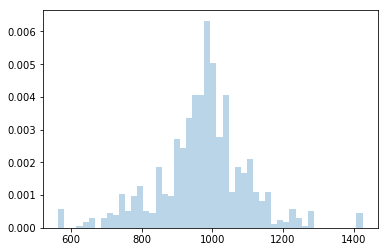

In [46]:
# plot a histogram of the sample
plt.hist(sample0, bins=50, histtype="stepfilled", alpha=0.3, normed=True);

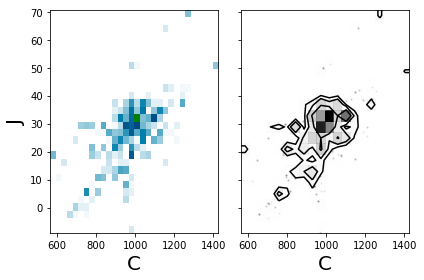

In [48]:
from corner import hist2d
fig, axs = plt.subplots(1, 2, sharex=True, sharey=True)
axs[0].hist2d(sampler.flatchain[:, 0], sampler.flatchain[:, 1], 30, cmap="ocean_r");
hist2d(sampler.flatchain[:, 0], sampler.flatchain[:, 1], ax=axs[1])
axs[0].set_xlabel('C', fontsize=20); axs[0].set_ylabel('J', fontsize=20)
axs[1].set_xlabel('C', fontsize=20);
#plt.ylim([0,5])
fig.tight_layout();

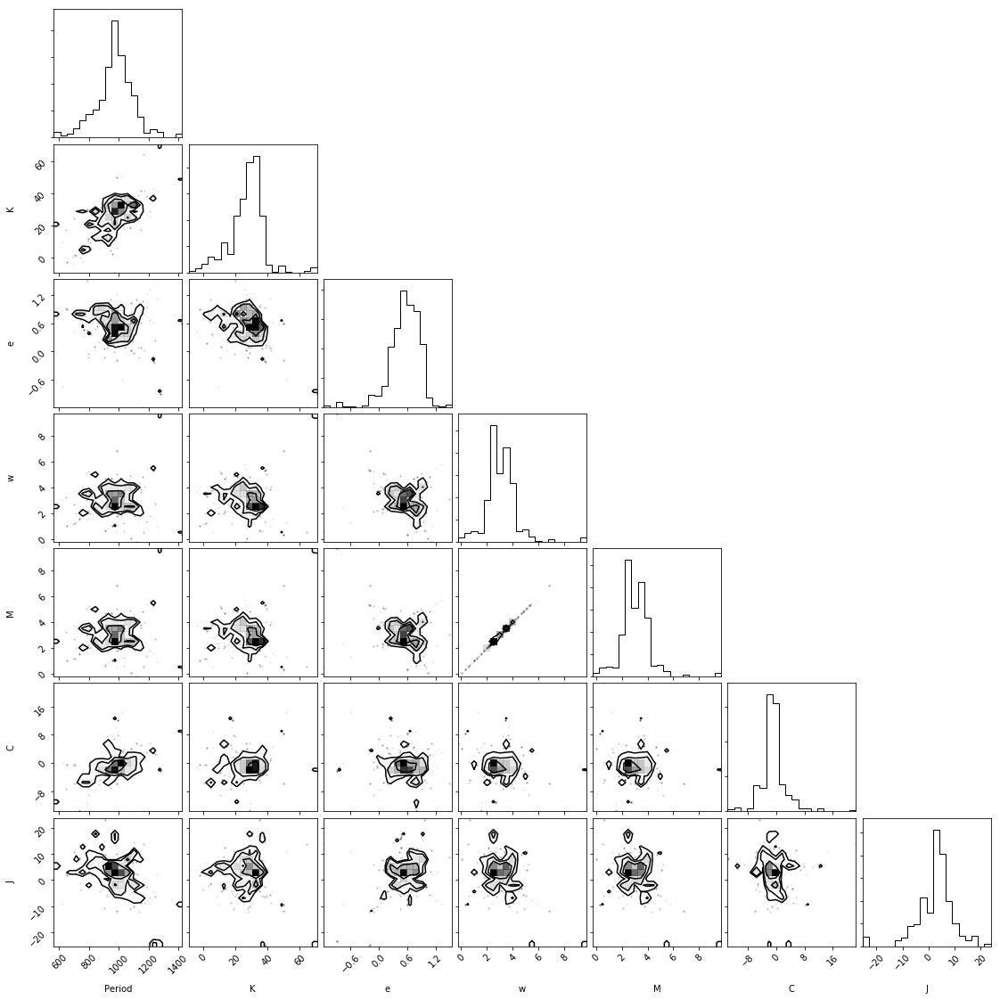

In [55]:
labeles = ['Period','K','e','w','M','C','J']
_ = corner.corner(sampler.flatchain,labels=labeles)

In [63]:
thechain = sampler.flatchain
mean = np.mean(thechain, axis=0)
print('Mean values:', mean)
print('Standard deviation:', np.std(thechain, axis=0))
print(lnlike(mean,obser,1))

Mean values: [  9.72599475e+02   2.68062862e+01   5.45558229e-01   3.06094855e+00
   3.06094855e+00  -8.07712347e-01   2.68921331e+00]
Standard deviation: [ 126.19114985   10.60626827    0.32623992    1.16962223    1.16962223
    3.53989527    6.90959811]
-1091.38090613


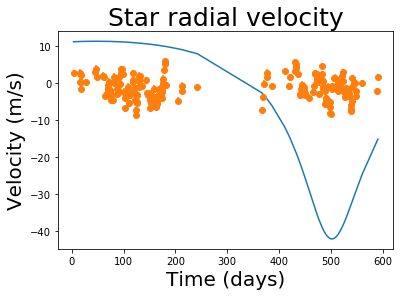

In [62]:
plt.plot(data[:,0],model(mean,data[:,0],1))
plt.errorbar(data[:,0], data[:,1], yerr=yerr,fmt='o');
plt.title('Star radial velocity',fontsize=25)
plt.xlabel('Time (days)',fontsize=20)
plt.ylabel('Velocity (m/s)',fontsize=20);